# KE5105 - Building Electrical Consumption Forecasting

# Modelling 2 - Preliminary model

## Summary of Findings
* **MRB** building data
* LOCF model
	* validation MAE (normalised) = **3.753** (**0.0275**)
* Base 1x16 GRU model
	* min validation MAE = xxx () @ epoch xxx
* Base mask 1x16 GRU model
	* min validation MAE = xxx () @ epoch xxx

## Load libraries

In [1]:
import os
os.chdir(os.path.join(os.path.sep, 'home', 'tkokkeng', 'Documents', 'KE5105', 'ETL'))
os.getcwd()

'/home/tkokkeng/Documents/KE5105/ETL'

In [2]:
import sys
if os.path.join(os.getcwd(), 'source') not in sys.path:
    sys.path.append(os.path.join(os.getcwd(), 'source'))
sys.path

['/home/tkokkeng/Documents/KE5105/ETL',
 '/home/tkokkeng/python/python367/tsfvenv/lib',
 '/home/tkokkeng/Documents/KE5105/ETL/source',
 '',
 '/home/tkokkeng/python/python367/tsfvenv/lib/python3.6/site-packages',
 '/home/tkokkeng/python/python367/tsfvenv/lib/python36.zip',
 '/home/tkokkeng/python/python367/tsfvenv/lib/python3.6',
 '/home/tkokkeng/python/python367/tsfvenv/lib/python3.6/lib-dynload',
 '/usr/lib/python3.6',
 '/home/tkokkeng/.local/lib/python3.6/site-packages',
 '/usr/local/lib/python3.6/dist-packages',
 '/usr/lib/python3/dist-packages',
 '/home/tkokkeng/python/python367/tsfvenv/lib/python3.6/site-packages/IPython/extensions',
 '/home/tkokkeng/.ipython']

In [3]:
%matplotlib inline

import matplotlib.pyplot as plt
import os
import pickle
import pandas as pd
import numpy as np
import datetime
import myUtilities as mu

from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import TimeSeriesSplit

from keras.models import Sequential
from keras import layers
from keras.optimizers import RMSprop

Using TensorFlow backend.


## Load data for building MRB

In [4]:
mrb_train = mu.load_data_by_bldg(['MRB'], 'imputed_train')

In [5]:
mrb_train[0][1].info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 31617 entries, 2015-06-12 07:30:00 to 2017-03-31 23:30:00
Data columns (total 10 columns):
PWMMRIC1                     29851 non-null float64
PWMMRIC2                     29851 non-null float64
BTUMochtarRiady              29448 non-null float64
PWMMRIC1_30min_avg           29818 non-null float64
PWMMRIC2_30min_avg           29818 non-null float64
BTUMochtarRiady_30min_avg    29416 non-null float64
PWM_sumadd                   29818 non-null float64
PWM_30min_avg                29861 non-null float64
BTU_sumadd                   29416 non-null float64
BTU_30min_avg                29469 non-null float64
dtypes: float64(10)
memory usage: 2.7 MB


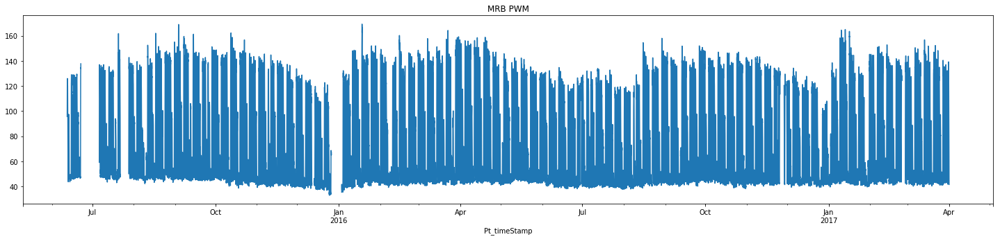

In [7]:
mrb_train_df = mrb_train[0][1]
mrb_train_df['PWM_30min_avg'].plot(figsize=(25, 5), title='MRB PWM')

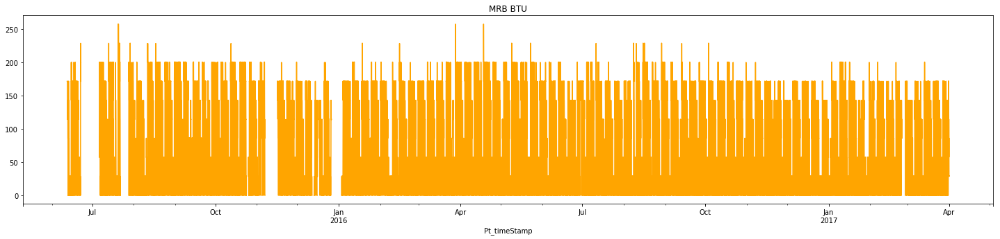

In [8]:
mrb_train_df['BTU_30min_avg'].plot(figsize=(25, 5), title='MRB BTU', color='orange')

## Split a validation set out from the training set

In [9]:
mrb_train_split_df = mrb_train_df[:20000]
mrb_val_split_df = mrb_train_df[20000:]

In [10]:
print('train split = %s\nvalidation split = %s' % (mrb_train_split_df.shape, mrb_val_split_df.shape))

train split = (20000, 10)
validation split = (11617, 10)


## Transform the training data
* Normalise the data - convert PWM and BTU values into the range 0 to 1
* Replace NaN with -1

In [11]:
# Create a transformation pipleline to prepare the training dataset for RNN.
attrbs = ['PWM_30min_avg', 'BTU_30min_avg']
my_pipeline = Pipeline([
    ('selector', mu.DataFrameSelector(attrbs)),
    # ('yeo-johnson_transform', PowerTransformer(method='yeo-johnson', standardize=False, copy=True)),
    ('minmax_scaler', MinMaxScaler()),
    ('na_transform', mu.Nan_to_Num_Transformer())
])

In [12]:
mrb_train_data = my_pipeline.fit_transform(mrb_train_split_df)
mrb_train_data

array([[0.46055046, 0.66601942],
       [0.55412844, 0.66699029],
       [0.60366972, 0.66601942],
       ...,
       [0.16880734, 0.11067961],
       [0.07889908, 0.11067961],
       [0.07155963, 0.        ]])

In [13]:
mrb_train_data.shape

(20000, 2)

Text(0.5, 1.0, 'Normalised PWM Training Data')

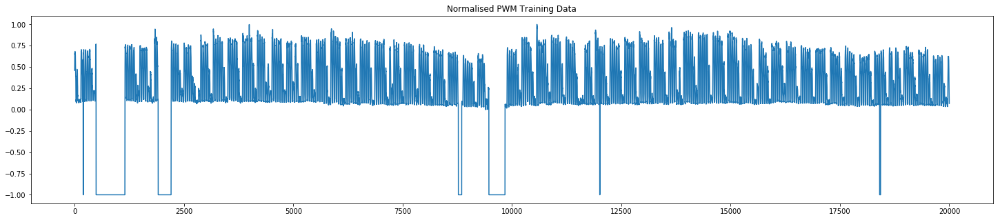

In [14]:
plt.figure(figsize=(25, 5))
plt.plot(range(mrb_train_data.shape[0]), mrb_train_data[:, 0])
plt.title('Normalised PWM Training Data')

Text(0.5, 1.0, 'Normalised BTU Training Data')

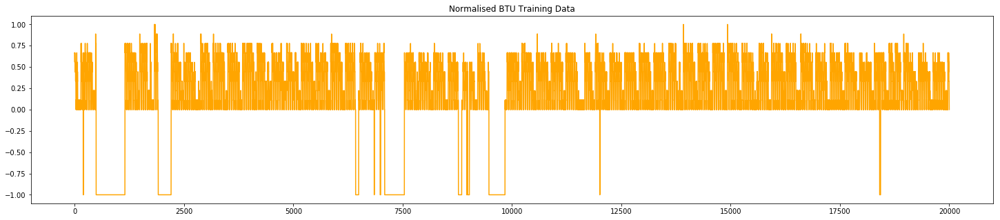

In [15]:
plt.figure(figsize=(25, 5))
plt.plot(range(mrb_train_data.shape[0]), mrb_train_data[:, 1], color='orange')
plt.title('Normalised BTU Training Data')

In [16]:
mrb_val_data = my_pipeline.transform(mrb_val_split_df)
mrb_val_data

array([[0.05321101, 0.        ],
       [0.07155963, 0.11067961],
       [0.05688073, 0.        ],
       ...,
       [0.13211009, 0.11067961],
       [0.10825688, 0.11426533],
       [0.06314127, 0.11424788]])

In [17]:
mrb_val_data.shape

(11617, 2)

Text(0.5, 1.0, 'Normalised PWM Validation Data')

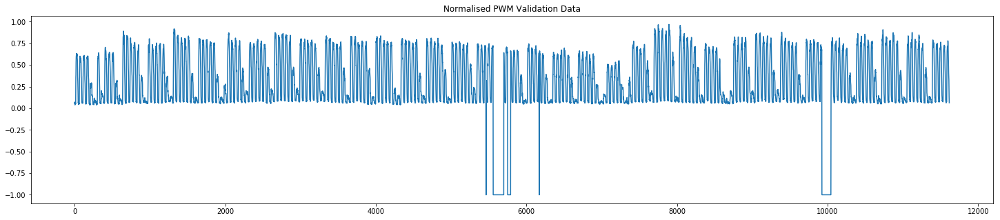

In [18]:
plt.figure(figsize=(25, 5))
plt.plot(range(mrb_val_data.shape[0]), mrb_val_data[:, 0])
plt.title('Normalised PWM Validation Data')

Text(0.5, 1.0, 'Normalised BTU Validation Data')

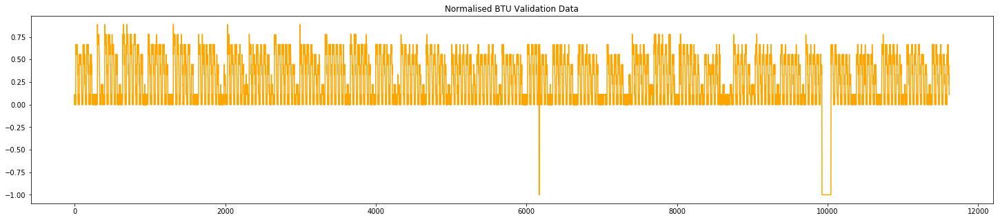

In [19]:
plt.figure(figsize=(25, 5))
plt.plot(range(mrb_val_data.shape[0]), mrb_val_data[:, 1], color='orange')
plt.title('Normalised BTU Validation Data')

## Parameters for the RNN model

Also used for generating the datasets with the lagged values 

In [20]:
lookback = 240  # 5 days; each day has 48 observations
step = 1  # sampling rate used for the lookback period
delay = 0  # 1 step ahead prediction
batch_size = 128

## Calculate the MAE for a Simple Last Observation Carry Forward (LOCF) Model

In [21]:
mrb_val_data.shape

(11617, 2)

In [22]:
# Generators for the train and test sets.
gen_locf_val = mu.generator(mrb_val_data,
                            lookback=lookback, delay=delay, min_index=0, max_index=len(mrb_val_data)-1,
                            batch_size=batch_size, step=step)

In [23]:
val_steps = int(np.ceil((len(mrb_val_data) - lookback - delay) / batch_size))
val_steps

89

In [24]:
# Calculate a simple baseline for model accuracy using MAE. Baseline model predicts label at t as label at t-1
# (LOCF last observation carry forward)
batch_maes = []
locf_preds = []

for a_step in range(val_steps):
    samples, targets = next(gen_locf_val)
    a_pred = samples[:, -1, 0]
    locf_preds.append(a_pred)
    mae = np.nanmean(np.abs(a_pred - targets))
    batch_maes.append(mae)
print('Normalised LOCF MAE = %f' % (np.nanmean(batch_maes)))


Normalised LOCF MAE = 0.027545


In [25]:
print('LOCF MAE = %f' % (np.nanmean(batch_maes) * (mrb_train_split_df['PWM_30min_avg'].max() - mrb_train_split_df['PWM_30min_avg'].min())))

LOCF MAE = 3.752951


In [26]:
locf_preds = np.concatenate(locf_preds)

## Base RNN Model

Quick model training without validation

**This part needs to be fixed!!! Ignore results below.**

In [20]:
as5_train_data.shape

(31616, 2)

In [21]:
model = Sequential()
model.add(layers.GRU(16, input_shape=(None, as5_train_data.shape[-1])))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [22]:
gen_train = mu.generator(as5_train_data,
                         lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_data) - 1,
                         batch_size=batch_size, step=step)
t1 = datetime.datetime.now()
history = model.fit_generator(gen_train, steps_per_epoch=train_steps, epochs=20,
                              workers=0, use_multiprocessing=False)
print('\nTraining Duration = %s' % (datetime.datetime.now()-t1))

Epoch 1/20


  1/246 [..............................] - ETA: 7:11 - loss: 0.2595 - mean_absolute_percentage_error: 114.0364

  2/246 [..............................] - ETA: 4:00 - loss: 0.2122 - mean_absolute_percentage_error: 99.4727 

  3/246 [..............................] - ETA: 2:51 - loss: 0.5075 - mean_absolute_percentage_error: 102.9206

  4/246 [..............................] - ETA: 2:16 - loss: 0.6408 - mean_absolute_percentage_error: 103.2015

  5/246 [..............................] - ETA: 1:55 - loss: 0.7120 - mean_absolute_percentage_error: 102.4981

  6/246 [..............................] - ETA: 1:41 - loss: 0.7532 - mean_absolute_percentage_error: 101.4059

  7/246 [..............................] - ETA: 1:31 - loss: 0.7778 - mean_absolute_percentage_error: 100.1402

  8/246 [..............................] - ETA: 1:23 - loss: 0.7159 - mean_absolute_percentage_error: 100.3097

  9/246 [>.............................] - ETA: 1:17 - loss: 0.6529 - mean_absolute_percentage_error: 99.5622 

 10/246 [>.............................] - ETA: 1:12 - loss: 0.5989 - mean_absolute_percentage_error: 98.2788

 11/246 [>.............................] - ETA: 1:08 - loss: 0.5599 - mean_absolute_percentage_error: 96.6087

 12/246 [>.............................] - ETA: 1:05 - loss: 0.5213 - mean_absolute_percentage_error: 93.8879

 13/246 [>.............................] - ETA: 1:02 - loss: 0.4924 - mean_absolute_percentage_error: 91.1680

 14/246 [>.............................] - ETA: 1:00 - loss: 0.5185 - mean_absolute_percentage_error: 90.8829

 15/246 [>.............................] - ETA: 58s - loss: 0.5411 - mean_absolute_percentage_error: 90.5360 

 16/246 [>.............................] - ETA: 56s - loss: 0.5332 - mean_absolute_percentage_error: 89.6792

 17/246 [=>............................] - ETA: 54s - loss: 0.5109 - mean_absolute_percentage_error: 88.5476

 18/246 [=>............................] - ETA: 52s - loss: 0.4873 - mean_absolute_percentage_error: 86.2475

 19/246 [=>............................] - ETA: 51s - loss: 0.4689 - mean_absolute_percentage_error: 84.5886

 20/246 [=>............................] - ETA: 50s - loss: 0.4469 - mean_absolute_percentage_error: 82.0263

 21/246 [=>............................] - ETA: 49s - loss: 0.4301 - mean_absolute_percentage_error: 79.7679

 22/246 [=>............................] - ETA: 48s - loss: 0.4191 - mean_absolute_percentage_error: 78.5683

 23/246 [=>............................] - ETA: 47s - loss: 0.4040 - mean_absolute_percentage_error: 76.8944

 24/246 [=>............................] - ETA: 46s - loss: 0.3938 - mean_absolute_percentage_error: 75.5710

 25/246 [==>...........................] - ETA: 45s - loss: 0.3835 - mean_absolute_percentage_error: 74.3316

 26/246 [==>...........................] - ETA: 44s - loss: 0.3732 - mean_absolute_percentage_error: 73.7626

 27/246 [==>...........................] - ETA: 43s - loss: 0.3646 - mean_absolute_percentage_error: 72.6736

 28/246 [==>...........................] - ETA: 43s - loss: 0.3542 - mean_absolute_percentage_error: 71.5596

 29/246 [==>...........................] - ETA: 42s - loss: 0.3485 - mean_absolute_percentage_error: 70.9450

 30/246 [==>...........................] - ETA: 41s - loss: 0.3415 - mean_absolute_percentage_error: 70.0733

 31/246 [==>...........................] - ETA: 41s - loss: 0.3330 - mean_absolute_percentage_error: 69.1808

 32/246 [==>...........................] - ETA: 40s - loss: 0.3271 - mean_absolute_percentage_error: 68.5491

 33/246 [===>..........................] - ETA: 40s - loss: 0.3186 - mean_absolute_percentage_error: 68.4299

 34/246 [===>..........................] - ETA: 39s - loss: 0.3128 - mean_absolute_percentage_error: 68.0360

 35/246 [===>..........................] - ETA: 39s - loss: 0.3075 - mean_absolute_percentage_error: 67.4167

 36/246 [===>..........................] - ETA: 38s - loss: 0.3001 - mean_absolute_percentage_error: 66.8088

 37/246 [===>..........................] - ETA: 38s - loss: 0.2948 - mean_absolute_percentage_error: 66.0888

 38/246 [===>..........................] - ETA: 37s - loss: 0.2881 - mean_absolute_percentage_error: 65.0735

 39/246 [===>..........................] - ETA: 37s - loss: 0.2826 - mean_absolute_percentage_error: 64.8715

 40/246 [===>..........................] - ETA: 37s - loss: 0.2792 - mean_absolute_percentage_error: 64.4514

 41/246 [====>.........................] - ETA: 36s - loss: 0.2740 - mean_absolute_percentage_error: 64.2358

 42/246 [====>.........................] - ETA: 36s - loss: 0.2697 - mean_absolute_percentage_error: 63.6429

 43/246 [====>.........................] - ETA: 35s - loss: 0.2660 - mean_absolute_percentage_error: 63.1140

 44/246 [====>.........................] - ETA: 35s - loss: 0.2612 - mean_absolute_percentage_error: 62.5451

 45/246 [====>.........................] - ETA: 35s - loss: 0.2576 - mean_absolute_percentage_error: 61.8593

 46/246 [====>.........................] - ETA: 34s - loss: 0.2537 - mean_absolute_percentage_error: 61.2030

 47/246 [====>.........................] - ETA: 34s - loss: 0.2498 - mean_absolute_percentage_error: 60.7806

 48/246 [====>.........................] - ETA: 34s - loss: 0.2466 - mean_absolute_percentage_error: 60.4410

 49/246 [====>.........................] - ETA: 33s - loss: 0.2427 - mean_absolute_percentage_error: 60.3069

 50/246 [=====>........................] - ETA: 33s - loss: 0.2399 - mean_absolute_percentage_error: 59.9164

 51/246 [=====>........................] - ETA: 33s - loss: 0.2367 - mean_absolute_percentage_error: 59.6294

 52/246 [=====>........................] - ETA: 33s - loss: 0.2341 - mean_absolute_percentage_error: 60.0410

 53/246 [=====>........................] - ETA: 32s - loss: 0.2314 - mean_absolute_percentage_error: 59.7654

 54/246 [=====>........................] - ETA: 32s - loss: 0.2282 - mean_absolute_percentage_error: 59.4585

 55/246 [=====>........................] - ETA: 32s - loss: 0.2251 - mean_absolute_percentage_error: 59.1702

 56/246 [=====>........................] - ETA: 31s - loss: 0.2226 - mean_absolute_percentage_error: 58.7166

 57/246 [=====>........................] - ETA: 31s - loss: 0.2193 - mean_absolute_percentage_error: 58.3627

 58/246 [======>.......................] - ETA: 31s - loss: 0.2165 - mean_absolute_percentage_error: 57.9313

 59/246 [======>.......................] - ETA: 31s - loss: 0.2136 - mean_absolute_percentage_error: 57.4832

 60/246 [======>.......................] - ETA: 30s - loss: 0.2105 - mean_absolute_percentage_error: 56.9846

 61/246 [======>.......................] - ETA: 30s - loss: 0.2080 - mean_absolute_percentage_error: 56.5169

 62/246 [======>.......................] - ETA: 30s - loss: 0.2052 - mean_absolute_percentage_error: 56.0619

 63/246 [======>.......................] - ETA: 30s - loss: 0.2030 - mean_absolute_percentage_error: 55.7418

 64/246 [======>.......................] - ETA: 29s - loss: 0.2005 - mean_absolute_percentage_error: 55.3180

 65/246 [======>.......................] - ETA: 29s - loss: 0.1979 - mean_absolute_percentage_error: 54.9336

 66/246 [=======>......................] - ETA: 29s - loss: 0.1955 - mean_absolute_percentage_error: 54.4470

 67/246 [=======>......................] - ETA: 29s - loss: 0.1950 - mean_absolute_percentage_error: 54.0603

 68/246 [=======>......................] - ETA: 29s - loss: 0.1941 - mean_absolute_percentage_error: 54.2762

 69/246 [=======>......................] - ETA: 29s - loss: 0.1920 - mean_absolute_percentage_error: 53.8343

 70/246 [=======>......................] - ETA: 29s - loss: 0.1897 - mean_absolute_percentage_error: 53.4275

 71/246 [=======>......................] - ETA: 29s - loss: 0.1878 - mean_absolute_percentage_error: 53.0433

 72/246 [=======>......................] - ETA: 29s - loss: 0.1856 - mean_absolute_percentage_error: 52.6970

 73/246 [=======>......................] - ETA: 29s - loss: 0.1861 - mean_absolute_percentage_error: 52.3016

 74/246 [========>.....................] - ETA: 28s - loss: 0.1855 - mean_absolute_percentage_error: 51.7935

 75/246 [========>.....................] - ETA: 28s - loss: 0.1841 - mean_absolute_percentage_error: 51.2099

 76/246 [========>.....................] - ETA: 28s - loss: 0.1828 - mean_absolute_percentage_error: 52.3836

 77/246 [========>.....................] - ETA: 28s - loss: 0.1812 - mean_absolute_percentage_error: 52.0344

 78/246 [========>.....................] - ETA: 28s - loss: 0.1794 - mean_absolute_percentage_error: 51.8604

 79/246 [========>.....................] - ETA: 27s - loss: 0.1782 - mean_absolute_percentage_error: 51.7520

 80/246 [========>.....................] - ETA: 27s - loss: 0.1767 - mean_absolute_percentage_error: 51.5682

 81/246 [========>.....................] - ETA: 27s - loss: 0.1750 - mean_absolute_percentage_error: 51.3301

 82/246 [=========>....................] - ETA: 27s - loss: 0.1737 - mean_absolute_percentage_error: 51.1495

 83/246 [=========>....................] - ETA: 27s - loss: 0.1721 - mean_absolute_percentage_error: 50.8700

 84/246 [=========>....................] - ETA: 26s - loss: 0.1707 - mean_absolute_percentage_error: 50.6421

 85/246 [=========>....................] - ETA: 26s - loss: 0.1695 - mean_absolute_percentage_error: 50.4593

 86/246 [=========>....................] - ETA: 26s - loss: 0.1682 - mean_absolute_percentage_error: 50.3685

 87/246 [=========>....................] - ETA: 26s - loss: 0.1670 - mean_absolute_percentage_error: 50.1739

 88/246 [=========>....................] - ETA: 26s - loss: 0.1658 - mean_absolute_percentage_error: 49.9895

 89/246 [=========>....................] - ETA: 25s - loss: 0.1641 - mean_absolute_percentage_error: 49.6132

 90/246 [=========>....................] - ETA: 25s - loss: 0.1628 - mean_absolute_percentage_error: 49.3853

 91/246 [==========>...................] - ETA: 25s - loss: 0.1614 - mean_absolute_percentage_error: 49.0983

 92/246 [==========>...................] - ETA: 25s - loss: 0.1609 - mean_absolute_percentage_error: 48.9327

 93/246 [==========>...................] - ETA: 25s - loss: 0.1600 - mean_absolute_percentage_error: 48.8568

 94/246 [==========>...................] - ETA: 24s - loss: 0.1586 - mean_absolute_percentage_error: 48.5425

 95/246 [==========>...................] - ETA: 24s - loss: 0.1579 - mean_absolute_percentage_error: 48.4121

 96/246 [==========>...................] - ETA: 24s - loss: 0.1567 - mean_absolute_percentage_error: 48.2327

 97/246 [==========>...................] - ETA: 24s - loss: 0.1558 - mean_absolute_percentage_error: 48.1309

 98/246 [==========>...................] - ETA: 24s - loss: 0.1547 - mean_absolute_percentage_error: 47.8949

 99/246 [===========>..................] - ETA: 23s - loss: 0.1535 - mean_absolute_percentage_error: 47.7090

100/246 [===========>..................] - ETA: 23s - loss: 0.1525 - mean_absolute_percentage_error: 47.5006

101/246 [===========>..................] - ETA: 23s - loss: 0.1515 - mean_absolute_percentage_error: 47.3020

102/246 [===========>..................] - ETA: 23s - loss: 0.1503 - mean_absolute_percentage_error: 47.0376

103/246 [===========>..................] - ETA: 23s - loss: 0.1495 - mean_absolute_percentage_error: 46.8174

104/246 [===========>..................] - ETA: 22s - loss: 0.1484 - mean_absolute_percentage_error: 46.6042

105/246 [===========>..................] - ETA: 22s - loss: 0.1474 - mean_absolute_percentage_error: 46.3914

106/246 [===========>..................] - ETA: 22s - loss: 0.1465 - mean_absolute_percentage_error: 46.1740

107/246 [============>.................] - ETA: 22s - loss: 0.1454 - mean_absolute_percentage_error: 45.9009

108/246 [============>.................] - ETA: 22s - loss: 0.1446 - mean_absolute_percentage_error: 45.7542

109/246 [============>.................] - ETA: 22s - loss: 0.1441 - mean_absolute_percentage_error: 45.7111

110/246 [============>.................] - ETA: 21s - loss: 0.1432 - mean_absolute_percentage_error: 45.5470

111/246 [============>.................] - ETA: 21s - loss: 0.1424 - mean_absolute_percentage_error: 45.3690

112/246 [============>.................] - ETA: 21s - loss: 0.1416 - mean_absolute_percentage_error: 45.2470

113/246 [============>.................] - ETA: 21s - loss: 0.1408 - mean_absolute_percentage_error: 45.0510

114/246 [============>.................] - ETA: 21s - loss: 0.1400 - mean_absolute_percentage_error: 44.8630

115/246 [=============>................] - ETA: 20s - loss: 0.1391 - mean_absolute_percentage_error: 44.6743

116/246 [=============>................] - ETA: 20s - loss: 0.1383 - mean_absolute_percentage_error: 44.4639

117/246 [=============>................] - ETA: 20s - loss: 0.1374 - mean_absolute_percentage_error: 44.2561

118/246 [=============>................] - ETA: 20s - loss: 0.1366 - mean_absolute_percentage_error: 44.0350

119/246 [=============>................] - ETA: 20s - loss: 0.1357 - mean_absolute_percentage_error: 43.8288

120/246 [=============>................] - ETA: 20s - loss: 0.1350 - mean_absolute_percentage_error: 43.7882

121/246 [=============>................] - ETA: 19s - loss: 0.1342 - mean_absolute_percentage_error: 43.6026

122/246 [=============>................] - ETA: 19s - loss: 0.1334 - mean_absolute_percentage_error: 43.4059

123/246 [==============>...............] - ETA: 19s - loss: 0.1325 - mean_absolute_percentage_error: 43.1997

124/246 [==============>...............] - ETA: 19s - loss: 0.1318 - mean_absolute_percentage_error: 43.0467

125/246 [==============>...............] - ETA: 19s - loss: 0.1309 - mean_absolute_percentage_error: 42.8563

126/246 [==============>...............] - ETA: 18s - loss: 0.1301 - mean_absolute_percentage_error: 42.6355

127/246 [==============>...............] - ETA: 18s - loss: 0.1294 - mean_absolute_percentage_error: 42.4422

128/246 [==============>...............] - ETA: 18s - loss: 0.1285 - mean_absolute_percentage_error: 42.2028

129/246 [==============>...............] - ETA: 18s - loss: 0.1278 - mean_absolute_percentage_error: 42.0220

130/246 [==============>...............] - ETA: 18s - loss: 0.1270 - mean_absolute_percentage_error: 41.8584

131/246 [==============>...............] - ETA: 18s - loss: 0.1263 - mean_absolute_percentage_error: 41.6519

132/246 [===============>..............] - ETA: 17s - loss: 0.1257 - mean_absolute_percentage_error: 41.5585

133/246 [===============>..............] - ETA: 17s - loss: 0.1249 - mean_absolute_percentage_error: 41.4160

134/246 [===============>..............] - ETA: 17s - loss: 0.1242 - mean_absolute_percentage_error: 41.2259

135/246 [===============>..............] - ETA: 17s - loss: 0.1235 - mean_absolute_percentage_error: 41.0729

136/246 [===============>..............] - ETA: 17s - loss: 0.1228 - mean_absolute_percentage_error: 40.8928

137/246 [===============>..............] - ETA: 17s - loss: 0.1221 - mean_absolute_percentage_error: 40.7117

138/246 [===============>..............] - ETA: 16s - loss: 0.1214 - mean_absolute_percentage_error: 40.5389

139/246 [===============>..............] - ETA: 16s - loss: 0.1207 - mean_absolute_percentage_error: 40.3478

140/246 [================>.............] - ETA: 16s - loss: 0.1200 - mean_absolute_percentage_error: 40.1577

141/246 [================>.............] - ETA: 16s - loss: 0.1193 - mean_absolute_percentage_error: 40.0314

142/246 [================>.............] - ETA: 16s - loss: 0.1190 - mean_absolute_percentage_error: 39.8632

143/246 [================>.............] - ETA: 16s - loss: 0.1188 - mean_absolute_percentage_error: 39.8941

144/246 [================>.............] - ETA: 15s - loss: 0.1181 - mean_absolute_percentage_error: 39.7301

145/246 [================>.............] - ETA: 15s - loss: 0.1175 - mean_absolute_percentage_error: 39.5572

146/246 [================>.............] - ETA: 15s - loss: 0.1168 - mean_absolute_percentage_error: 39.3826

147/246 [================>.............] - ETA: 15s - loss: 0.1162 - mean_absolute_percentage_error: 39.2160

148/246 [=================>............] - ETA: 15s - loss: 0.1157 - mean_absolute_percentage_error: 39.0486

149/246 [=================>............] - ETA: 15s - loss: 0.1150 - mean_absolute_percentage_error: 38.8893

150/246 [=================>............] - ETA: 14s - loss: 0.1145 - mean_absolute_percentage_error: 38.7347

151/246 [=================>............] - ETA: 14s - loss: 0.1139 - mean_absolute_percentage_error: 38.5754

152/246 [=================>............] - ETA: 14s - loss: 0.1133 - mean_absolute_percentage_error: 38.4162

153/246 [=================>............] - ETA: 14s - loss: 0.1128 - mean_absolute_percentage_error: 38.2753

154/246 [=================>............] - ETA: 14s - loss: 0.1123 - mean_absolute_percentage_error: 38.1329

155/246 [=================>............] - ETA: 14s - loss: 0.1119 - mean_absolute_percentage_error: 38.0737

156/246 [==================>...........] - ETA: 13s - loss: 0.1114 - mean_absolute_percentage_error: 37.9477

157/246 [==================>...........] - ETA: 13s - loss: 0.1108 - mean_absolute_percentage_error: 37.8051

158/246 [==================>...........] - ETA: 13s - loss: 0.1104 - mean_absolute_percentage_error: 37.6758

159/246 [==================>...........] - ETA: 13s - loss: 0.1099 - mean_absolute_percentage_error: 37.5725

160/246 [==================>...........] - ETA: 13s - loss: 0.1095 - mean_absolute_percentage_error: 37.4375

161/246 [==================>...........] - ETA: 13s - loss: 0.1091 - mean_absolute_percentage_error: 37.3151

162/246 [==================>...........] - ETA: 12s - loss: 0.1086 - mean_absolute_percentage_error: 37.2349

163/246 [==================>...........] - ETA: 12s - loss: 0.1083 - mean_absolute_percentage_error: 37.1228

164/246 [===================>..........] - ETA: 12s - loss: 0.1079 - mean_absolute_percentage_error: 37.0153

165/246 [===================>..........] - ETA: 12s - loss: 0.1074 - mean_absolute_percentage_error: 36.9038

166/246 [===================>..........] - ETA: 12s - loss: 0.1072 - mean_absolute_percentage_error: 36.8687

167/246 [===================>..........] - ETA: 12s - loss: 0.1068 - mean_absolute_percentage_error: 36.7497

168/246 [===================>..........] - ETA: 11s - loss: 0.1064 - mean_absolute_percentage_error: 36.6295

169/246 [===================>..........] - ETA: 11s - loss: 0.1060 - mean_absolute_percentage_error: 36.5261

170/246 [===================>..........] - ETA: 11s - loss: 0.1055 - mean_absolute_percentage_error: 36.3982

171/246 [===================>..........] - ETA: 11s - loss: 0.1051 - mean_absolute_percentage_error: 36.2819

172/246 [===================>..........] - ETA: 11s - loss: 0.1047 - mean_absolute_percentage_error: 36.1734

173/246 [====================>.........] - ETA: 11s - loss: 0.1043 - mean_absolute_percentage_error: 36.0394

174/246 [====================>.........] - ETA: 11s - loss: 0.1039 - mean_absolute_percentage_error: 35.9395

175/246 [====================>.........] - ETA: 10s - loss: 0.1034 - mean_absolute_percentage_error: 35.8178

176/246 [====================>.........] - ETA: 10s - loss: 0.1031 - mean_absolute_percentage_error: 35.7156

177/246 [====================>.........] - ETA: 10s - loss: 0.1029 - mean_absolute_percentage_error: 35.6960

178/246 [====================>.........] - ETA: 10s - loss: 0.1025 - mean_absolute_percentage_error: 35.5691

179/246 [====================>.........] - ETA: 10s - loss: 0.1022 - mean_absolute_percentage_error: 35.4684

180/246 [====================>.........] - ETA: 10s - loss: 0.1019 - mean_absolute_percentage_error: 35.3755

181/246 [=====================>........] - ETA: 9s - loss: 0.1015 - mean_absolute_percentage_error: 35.2576 

182/246 [=====================>........] - ETA: 9s - loss: 0.1012 - mean_absolute_percentage_error: 35.1439

183/246 [=====================>........] - ETA: 9s - loss: 0.1008 - mean_absolute_percentage_error: 35.0561

184/246 [=====================>........] - ETA: 9s - loss: 0.1007 - mean_absolute_percentage_error: 34.9709

185/246 [=====================>........] - ETA: 9s - loss: 0.1004 - mean_absolute_percentage_error: 34.8897

186/246 [=====================>........] - ETA: 9s - loss: 0.0999 - mean_absolute_percentage_error: 34.7740

187/246 [=====================>........] - ETA: 8s - loss: 0.0996 - mean_absolute_percentage_error: 34.6872

188/246 [=====================>........] - ETA: 8s - loss: 0.0992 - mean_absolute_percentage_error: 34.6019

189/246 [======================>.......] - ETA: 8s - loss: 0.0990 - mean_absolute_percentage_error: 34.5898

190/246 [======================>.......] - ETA: 8s - loss: 0.0987 - mean_absolute_percentage_error: 34.5112

191/246 [======================>.......] - ETA: 8s - loss: 0.0983 - mean_absolute_percentage_error: 34.4147

192/246 [======================>.......] - ETA: 8s - loss: 0.0979 - mean_absolute_percentage_error: 34.3355

193/246 [======================>.......] - ETA: 8s - loss: 0.0976 - mean_absolute_percentage_error: 34.2533

194/246 [======================>.......] - ETA: 7s - loss: 0.0972 - mean_absolute_percentage_error: 34.1451

195/246 [======================>.......] - ETA: 7s - loss: 0.0969 - mean_absolute_percentage_error: 34.0685

196/246 [======================>.......] - ETA: 7s - loss: 0.0965 - mean_absolute_percentage_error: 33.9681

197/246 [=======================>......] - ETA: 7s - loss: 0.0961 - mean_absolute_percentage_error: 33.8764

198/246 [=======================>......] - ETA: 7s - loss: 0.0958 - mean_absolute_percentage_error: 33.7842

199/246 [=======================>......] - ETA: 7s - loss: 0.0954 - mean_absolute_percentage_error: 33.6799

200/246 [=======================>......] - ETA: 6s - loss: 0.0952 - mean_absolute_percentage_error: 33.6576

201/246 [=======================>......] - ETA: 6s - loss: 0.0949 - mean_absolute_percentage_error: 33.5632

202/246 [=======================>......] - ETA: 6s - loss: 0.0945 - mean_absolute_percentage_error: 33.4600

203/246 [=======================>......] - ETA: 6s - loss: 0.0944 - mean_absolute_percentage_error: 33.4036

204/246 [=======================>......] - ETA: 6s - loss: 0.0940 - mean_absolute_percentage_error: 33.2989

205/246 [========================>.....] - ETA: 6s - loss: 0.0937 - mean_absolute_percentage_error: 33.1951

206/246 [========================>.....] - ETA: 6s - loss: 0.0933 - mean_absolute_percentage_error: 33.0856

207/246 [========================>.....] - ETA: 5s - loss: 0.0932 - mean_absolute_percentage_error: 33.1453

208/246 [========================>.....] - ETA: 5s - loss: 0.0928 - mean_absolute_percentage_error: 33.0383

209/246 [========================>.....] - ETA: 5s - loss: 0.0925 - mean_absolute_percentage_error: 32.9508

210/246 [========================>.....] - ETA: 5s - loss: 0.0921 - mean_absolute_percentage_error: 32.8481

211/246 [========================>.....] - ETA: 5s - loss: 0.0918 - mean_absolute_percentage_error: 32.7432

212/246 [========================>.....] - ETA: 5s - loss: 0.0915 - mean_absolute_percentage_error: 32.7310

213/246 [========================>.....] - ETA: 4s - loss: 0.0912 - mean_absolute_percentage_error: 32.6430

214/246 [=========================>....] - ETA: 4s - loss: 0.0909 - mean_absolute_percentage_error: 32.5487

215/246 [=========================>....] - ETA: 4s - loss: 0.0906 - mean_absolute_percentage_error: 32.4664

216/246 [=========================>....] - ETA: 4s - loss: 0.0904 - mean_absolute_percentage_error: 32.3799

217/246 [=========================>....] - ETA: 4s - loss: 0.0901 - mean_absolute_percentage_error: 32.3275

218/246 [=========================>....] - ETA: 4s - loss: 0.0898 - mean_absolute_percentage_error: 32.2397

219/246 [=========================>....] - ETA: 4s - loss: 0.0896 - mean_absolute_percentage_error: 32.1536

220/246 [=========================>....] - ETA: 3s - loss: 0.0893 - mean_absolute_percentage_error: 32.0678

221/246 [=========================>....] - ETA: 3s - loss: 0.0890 - mean_absolute_percentage_error: 31.9802

222/246 [==========================>...] - ETA: 3s - loss: 0.0887 - mean_absolute_percentage_error: 31.9076

223/246 [==========================>...] - ETA: 3s - loss: 0.0884 - mean_absolute_percentage_error: 31.8200

224/246 [==========================>...] - ETA: 3s - loss: 0.0883 - mean_absolute_percentage_error: 31.7999

225/246 [==========================>...] - ETA: 3s - loss: 0.0880 - mean_absolute_percentage_error: 31.7401

226/246 [==========================>...] - ETA: 3s - loss: 0.0878 - mean_absolute_percentage_error: 31.6619

227/246 [==========================>...] - ETA: 2s - loss: 0.0875 - mean_absolute_percentage_error: 31.5770

228/246 [==========================>...] - ETA: 2s - loss: 0.0872 - mean_absolute_percentage_error: 31.4884

229/246 [==========================>...] - ETA: 2s - loss: 0.0870 - mean_absolute_percentage_error: 31.4089

230/246 [===========================>..] - ETA: 2s - loss: 0.0867 - mean_absolute_percentage_error: 31.3398

231/246 [===========================>..] - ETA: 2s - loss: 0.0865 - mean_absolute_percentage_error: 31.2596

232/246 [===========================>..] - ETA: 2s - loss: 0.0863 - mean_absolute_percentage_error: 31.1818

233/246 [===========================>..] - ETA: 1s - loss: 0.0865 - mean_absolute_percentage_error: 31.1519

234/246 [===========================>..] - ETA: 1s - loss: 0.0864 - mean_absolute_percentage_error: 31.1561

235/246 [===========================>..] - ETA: 1s - loss: 0.0861 - mean_absolute_percentage_error: 31.0829

236/246 [===========================>..] - ETA: 1s - loss: 0.0858 - mean_absolute_percentage_error: 31.0030

237/246 [===========================>..] - ETA: 1s - loss: 0.0856 - mean_absolute_percentage_error: 30.9319

238/246 [============================>.] - ETA: 1s - loss: 0.0853 - mean_absolute_percentage_error: 30.8575

239/246 [============================>.] - ETA: 1s - loss: 0.0851 - mean_absolute_percentage_error: 30.7847

240/246 [============================>.] - ETA: 0s - loss: 0.0849 - mean_absolute_percentage_error: 30.7173

241/246 [============================>.] - ETA: 0s - loss: 0.0847 - mean_absolute_percentage_error: 30.6455

242/246 [============================>.] - ETA: 0s - loss: 0.0844 - mean_absolute_percentage_error: 30.5739

243/246 [============================>.] - ETA: 0s - loss: 0.0842 - mean_absolute_percentage_error: 30.5096

244/246 [============================>.] - ETA: 0s - loss: 0.0840 - mean_absolute_percentage_error: 30.4410

245/246 [============================>.] - ETA: 0s - loss: 0.0838 - mean_absolute_percentage_error: 30.3663

246/246 [==============================] - 37s 149ms/step - loss: 0.0839 - mean_absolute_percentage_error: 30.3513


Epoch 2/20


  1/246 [..............................] - ETA: 35s - loss: 0.0264 - mean_absolute_percentage_error: 15.6688

  2/246 [..............................] - ETA: 34s - loss: 0.0337 - mean_absolute_percentage_error: 16.8324

  3/246 [..............................] - ETA: 34s - loss: 0.0626 - mean_absolute_percentage_error: 15.2339

  4/246 [..............................] - ETA: 34s - loss: 0.0577 - mean_absolute_percentage_error: 12.5023

  5/246 [..............................] - ETA: 33s - loss: 0.0504 - mean_absolute_percentage_error: 10.4225

  6/246 [..............................] - ETA: 33s - loss: 0.0478 - mean_absolute_percentage_error: 9.2650 

  7/246 [..............................] - ETA: 33s - loss: 0.0430 - mean_absolute_percentage_error: 8.1472

  8/246 [..............................] - ETA: 33s - loss: 0.0448 - mean_absolute_percentage_error: 11.0489

  9/246 [>.............................] - ETA: 33s - loss: 0.0432 - mean_absolute_percentage_error: 12.6780

 10/246 [>.............................] - ETA: 33s - loss: 0.0414 - mean_absolute_percentage_error: 14.0563

 11/246 [>.............................] - ETA: 33s - loss: 0.0406 - mean_absolute_percentage_error: 14.7666

 12/246 [>.............................] - ETA: 32s - loss: 0.0399 - mean_absolute_percentage_error: 16.4032

 13/246 [>.............................] - ETA: 32s - loss: 0.0389 - mean_absolute_percentage_error: 16.8917

 14/246 [>.............................] - ETA: 32s - loss: 0.0411 - mean_absolute_percentage_error: 16.2538

 15/246 [>.............................] - ETA: 32s - loss: 0.0388 - mean_absolute_percentage_error: 15.2121

 16/246 [>.............................] - ETA: 32s - loss: 0.0400 - mean_absolute_percentage_error: 16.0937

 17/246 [=>............................] - ETA: 32s - loss: 0.0411 - mean_absolute_percentage_error: 17.7407

 18/246 [=>............................] - ETA: 32s - loss: 0.0402 - mean_absolute_percentage_error: 18.2374

 19/246 [=>............................] - ETA: 31s - loss: 0.0397 - mean_absolute_percentage_error: 18.3440

 20/246 [=>............................] - ETA: 31s - loss: 0.0387 - mean_absolute_percentage_error: 18.8598

 21/246 [=>............................] - ETA: 31s - loss: 0.0379 - mean_absolute_percentage_error: 18.7834

 22/246 [=>............................] - ETA: 31s - loss: 0.0379 - mean_absolute_percentage_error: 18.8435

 23/246 [=>............................] - ETA: 31s - loss: 0.0371 - mean_absolute_percentage_error: 18.8774

 24/246 [=>............................] - ETA: 31s - loss: 0.0371 - mean_absolute_percentage_error: 18.9084

 25/246 [==>...........................] - ETA: 30s - loss: 0.0368 - mean_absolute_percentage_error: 18.8993

 26/246 [==>...........................] - ETA: 30s - loss: 0.0362 - mean_absolute_percentage_error: 18.8959

 27/246 [==>...........................] - ETA: 30s - loss: 0.0360 - mean_absolute_percentage_error: 18.8621

 28/246 [==>...........................] - ETA: 30s - loss: 0.0354 - mean_absolute_percentage_error: 18.8298

 29/246 [==>...........................] - ETA: 30s - loss: 0.0362 - mean_absolute_percentage_error: 19.5564

 30/246 [==>...........................] - ETA: 30s - loss: 0.0359 - mean_absolute_percentage_error: 19.4773

 31/246 [==>...........................] - ETA: 30s - loss: 0.0354 - mean_absolute_percentage_error: 19.4097

 32/246 [==>...........................] - ETA: 29s - loss: 0.0352 - mean_absolute_percentage_error: 19.3292

 33/246 [===>..........................] - ETA: 29s - loss: 0.0348 - mean_absolute_percentage_error: 19.4930

 34/246 [===>..........................] - ETA: 29s - loss: 0.0345 - mean_absolute_percentage_error: 19.3573

 35/246 [===>..........................] - ETA: 29s - loss: 0.0342 - mean_absolute_percentage_error: 19.2178

 36/246 [===>..........................] - ETA: 29s - loss: 0.0338 - mean_absolute_percentage_error: 19.2547

 37/246 [===>..........................] - ETA: 29s - loss: 0.0336 - mean_absolute_percentage_error: 19.1099

 38/246 [===>..........................] - ETA: 29s - loss: 0.0332 - mean_absolute_percentage_error: 19.0220

 39/246 [===>..........................] - ETA: 28s - loss: 0.0329 - mean_absolute_percentage_error: 19.0052

 40/246 [===>..........................] - ETA: 28s - loss: 0.0334 - mean_absolute_percentage_error: 19.4003

 41/246 [====>.........................] - ETA: 28s - loss: 0.0331 - mean_absolute_percentage_error: 19.3919

 42/246 [====>.........................] - ETA: 28s - loss: 0.0329 - mean_absolute_percentage_error: 19.2763

 43/246 [====>.........................] - ETA: 28s - loss: 0.0327 - mean_absolute_percentage_error: 19.1458

 44/246 [====>.........................] - ETA: 28s - loss: 0.0324 - mean_absolute_percentage_error: 19.0624

 45/246 [====>.........................] - ETA: 28s - loss: 0.0323 - mean_absolute_percentage_error: 18.9620

 46/246 [====>.........................] - ETA: 27s - loss: 0.0321 - mean_absolute_percentage_error: 18.8006

 47/246 [====>.........................] - ETA: 27s - loss: 0.0317 - mean_absolute_percentage_error: 18.6427

 48/246 [====>.........................] - ETA: 27s - loss: 0.0317 - mean_absolute_percentage_error: 18.5846

 49/246 [====>.........................] - ETA: 27s - loss: 0.0314 - mean_absolute_percentage_error: 18.5915

 50/246 [=====>........................] - ETA: 27s - loss: 0.0314 - mean_absolute_percentage_error: 18.5148

 51/246 [=====>........................] - ETA: 27s - loss: 0.0313 - mean_absolute_percentage_error: 18.4735

 52/246 [=====>........................] - ETA: 27s - loss: 0.0321 - mean_absolute_percentage_error: 19.7774

 53/246 [=====>........................] - ETA: 27s - loss: 0.0321 - mean_absolute_percentage_error: 19.7212

 54/246 [=====>........................] - ETA: 26s - loss: 0.0319 - mean_absolute_percentage_error: 19.6724

 55/246 [=====>........................] - ETA: 26s - loss: 0.0317 - mean_absolute_percentage_error: 19.6575

 56/246 [=====>........................] - ETA: 26s - loss: 0.0316 - mean_absolute_percentage_error: 19.5373

 57/246 [=====>........................] - ETA: 26s - loss: 0.0314 - mean_absolute_percentage_error: 19.5179

 58/246 [======>.......................] - ETA: 26s - loss: 0.0313 - mean_absolute_percentage_error: 19.4146

 59/246 [======>.......................] - ETA: 26s - loss: 0.0311 - mean_absolute_percentage_error: 19.3065

 60/246 [======>.......................] - ETA: 26s - loss: 0.0308 - mean_absolute_percentage_error: 19.2308

 61/246 [======>.......................] - ETA: 25s - loss: 0.0307 - mean_absolute_percentage_error: 19.1152

 62/246 [======>.......................] - ETA: 25s - loss: 0.0305 - mean_absolute_percentage_error: 19.0769

 63/246 [======>.......................] - ETA: 25s - loss: 0.0307 - mean_absolute_percentage_error: 19.2635

 64/246 [======>.......................] - ETA: 25s - loss: 0.0306 - mean_absolute_percentage_error: 19.1536

 65/246 [======>.......................] - ETA: 25s - loss: 0.0303 - mean_absolute_percentage_error: 19.0771

 66/246 [=======>......................] - ETA: 25s - loss: 0.0302 - mean_absolute_percentage_error: 18.9955

 67/246 [=======>......................] - ETA: 25s - loss: 0.0307 - mean_absolute_percentage_error: 18.9136

 68/246 [=======>......................] - ETA: 24s - loss: 0.0308 - mean_absolute_percentage_error: 19.3956

 69/246 [=======>......................] - ETA: 24s - loss: 0.0307 - mean_absolute_percentage_error: 19.3153

 70/246 [=======>......................] - ETA: 24s - loss: 0.0304 - mean_absolute_percentage_error: 19.2260

 71/246 [=======>......................] - ETA: 24s - loss: 0.0303 - mean_absolute_percentage_error: 19.1543

 72/246 [=======>......................] - ETA: 24s - loss: 0.0301 - mean_absolute_percentage_error: 19.1186

 73/246 [=======>......................] - ETA: 24s - loss: 0.0304 - mean_absolute_percentage_error: 18.9378

 74/246 [========>.....................] - ETA: 24s - loss: 0.0307 - mean_absolute_percentage_error: 18.7587

 75/246 [========>.....................] - ETA: 23s - loss: 0.0305 - mean_absolute_percentage_error: 18.5286

 76/246 [========>.....................] - ETA: 23s - loss: 0.0306 - mean_absolute_percentage_error: 19.3410

 77/246 [========>.....................] - ETA: 23s - loss: 0.0305 - mean_absolute_percentage_error: 19.2569

 78/246 [========>.....................] - ETA: 23s - loss: 0.0303 - mean_absolute_percentage_error: 19.2675

 79/246 [========>.....................] - ETA: 23s - loss: 0.0303 - mean_absolute_percentage_error: 19.1923

 80/246 [========>.....................] - ETA: 23s - loss: 0.0302 - mean_absolute_percentage_error: 19.1272

 81/246 [========>.....................] - ETA: 23s - loss: 0.0301 - mean_absolute_percentage_error: 19.0445

 82/246 [=========>....................] - ETA: 22s - loss: 0.0300 - mean_absolute_percentage_error: 18.9692

 83/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.8936

 84/246 [=========>....................] - ETA: 22s - loss: 0.0298 - mean_absolute_percentage_error: 18.8240

 85/246 [=========>....................] - ETA: 22s - loss: 0.0298 - mean_absolute_percentage_error: 18.7495

 86/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.8896

 87/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.8188

 88/246 [=========>....................] - ETA: 22s - loss: 0.0299 - mean_absolute_percentage_error: 18.7621

 89/246 [=========>....................] - ETA: 21s - loss: 0.0296 - mean_absolute_percentage_error: 18.6752

 90/246 [=========>....................] - ETA: 21s - loss: 0.0296 - mean_absolute_percentage_error: 18.6231

 91/246 [==========>...................] - ETA: 21s - loss: 0.0294 - mean_absolute_percentage_error: 18.5549

 92/246 [==========>...................] - ETA: 21s - loss: 0.0299 - mean_absolute_percentage_error: 18.5407

 93/246 [==========>...................] - ETA: 21s - loss: 0.0301 - mean_absolute_percentage_error: 18.6599

 94/246 [==========>...................] - ETA: 21s - loss: 0.0300 - mean_absolute_percentage_error: 18.5776

 95/246 [==========>...................] - ETA: 21s - loss: 0.0302 - mean_absolute_percentage_error: 18.6569

 96/246 [==========>...................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.5902

 97/246 [==========>...................] - ETA: 20s - loss: 0.0303 - mean_absolute_percentage_error: 18.6614

 98/246 [==========>...................] - ETA: 20s - loss: 0.0303 - mean_absolute_percentage_error: 18.5866

 99/246 [===========>..................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.5750

100/246 [===========>..................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.5113

101/246 [===========>..................] - ETA: 20s - loss: 0.0301 - mean_absolute_percentage_error: 18.4572

102/246 [===========>..................] - ETA: 20s - loss: 0.0299 - mean_absolute_percentage_error: 18.3864

103/246 [===========>..................] - ETA: 19s - loss: 0.0299 - mean_absolute_percentage_error: 18.3050

104/246 [===========>..................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.2664

105/246 [===========>..................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.2069

106/246 [===========>..................] - ETA: 19s - loss: 0.0297 - mean_absolute_percentage_error: 18.1312

107/246 [============>.................] - ETA: 19s - loss: 0.0296 - mean_absolute_percentage_error: 18.0496

108/246 [============>.................] - ETA: 19s - loss: 0.0296 - mean_absolute_percentage_error: 17.9934

109/246 [============>.................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.0810

110/246 [============>.................] - ETA: 19s - loss: 0.0298 - mean_absolute_percentage_error: 18.0291

111/246 [============>.................] - ETA: 18s - loss: 0.0297 - mean_absolute_percentage_error: 17.9626

112/246 [============>.................] - ETA: 18s - loss: 0.0296 - mean_absolute_percentage_error: 17.9326

113/246 [============>.................] - ETA: 18s - loss: 0.0297 - mean_absolute_percentage_error: 17.8899

114/246 [============>.................] - ETA: 18s - loss: 0.0297 - mean_absolute_percentage_error: 17.8347

115/246 [=============>................] - ETA: 18s - loss: 0.0296 - mean_absolute_percentage_error: 17.7865

116/246 [=============>................] - ETA: 18s - loss: 0.0295 - mean_absolute_percentage_error: 17.7349

117/246 [=============>................] - ETA: 18s - loss: 0.0295 - mean_absolute_percentage_error: 17.6818

118/246 [=============>................] - ETA: 17s - loss: 0.0294 - mean_absolute_percentage_error: 17.6122

119/246 [=============>................] - ETA: 17s - loss: 0.0293 - mean_absolute_percentage_error: 17.5528

120/246 [=============>................] - ETA: 17s - loss: 0.0294 - mean_absolute_percentage_error: 17.6857

121/246 [=============>................] - ETA: 17s - loss: 0.0294 - mean_absolute_percentage_error: 17.6466

122/246 [=============>................] - ETA: 17s - loss: 0.0293 - mean_absolute_percentage_error: 17.5930

123/246 [==============>...............] - ETA: 17s - loss: 0.0292 - mean_absolute_percentage_error: 17.5574

124/246 [==============>...............] - ETA: 17s - loss: 0.0291 - mean_absolute_percentage_error: 17.5085

125/246 [==============>...............] - ETA: 16s - loss: 0.0290 - mean_absolute_percentage_error: 17.4709

126/246 [==============>...............] - ETA: 16s - loss: 0.0290 - mean_absolute_percentage_error: 17.4086

127/246 [==============>...............] - ETA: 16s - loss: 0.0289 - mean_absolute_percentage_error: 17.3630

128/246 [==============>...............] - ETA: 16s - loss: 0.0288 - mean_absolute_percentage_error: 17.3209

129/246 [==============>...............] - ETA: 16s - loss: 0.0288 - mean_absolute_percentage_error: 17.2975

130/246 [==============>...............] - ETA: 16s - loss: 0.0287 - mean_absolute_percentage_error: 17.2721

131/246 [==============>...............] - ETA: 16s - loss: 0.0286 - mean_absolute_percentage_error: 17.2299

132/246 [===============>..............] - ETA: 15s - loss: 0.0288 - mean_absolute_percentage_error: 17.3048

133/246 [===============>..............] - ETA: 15s - loss: 0.0287 - mean_absolute_percentage_error: 17.2874

134/246 [===============>..............] - ETA: 15s - loss: 0.0286 - mean_absolute_percentage_error: 17.2385

135/246 [===============>..............] - ETA: 15s - loss: 0.0285 - mean_absolute_percentage_error: 17.2082

136/246 [===============>..............] - ETA: 15s - loss: 0.0285 - mean_absolute_percentage_error: 17.1812

137/246 [===============>..............] - ETA: 15s - loss: 0.0284 - mean_absolute_percentage_error: 17.1419

138/246 [===============>..............] - ETA: 15s - loss: 0.0283 - mean_absolute_percentage_error: 17.1065

139/246 [===============>..............] - ETA: 14s - loss: 0.0282 - mean_absolute_percentage_error: 17.0636

140/246 [================>.............] - ETA: 14s - loss: 0.0282 - mean_absolute_percentage_error: 17.0054

141/246 [================>.............] - ETA: 14s - loss: 0.0281 - mean_absolute_percentage_error: 16.9710

142/246 [================>.............] - ETA: 14s - loss: 0.0282 - mean_absolute_percentage_error: 16.9336

143/246 [================>.............] - ETA: 14s - loss: 0.0285 - mean_absolute_percentage_error: 17.1258

144/246 [================>.............] - ETA: 14s - loss: 0.0284 - mean_absolute_percentage_error: 17.0897

145/246 [================>.............] - ETA: 14s - loss: 0.0283 - mean_absolute_percentage_error: 17.0575

146/246 [================>.............] - ETA: 14s - loss: 0.0283 - mean_absolute_percentage_error: 17.0149

147/246 [================>.............] - ETA: 13s - loss: 0.0282 - mean_absolute_percentage_error: 16.9901

148/246 [=================>............] - ETA: 13s - loss: 0.0282 - mean_absolute_percentage_error: 16.9491

149/246 [=================>............] - ETA: 13s - loss: 0.0281 - mean_absolute_percentage_error: 16.9228

150/246 [=================>............] - ETA: 13s - loss: 0.0281 - mean_absolute_percentage_error: 16.8847

151/246 [=================>............] - ETA: 13s - loss: 0.0280 - mean_absolute_percentage_error: 16.8399

152/246 [=================>............] - ETA: 13s - loss: 0.0280 - mean_absolute_percentage_error: 16.8111

153/246 [=================>............] - ETA: 13s - loss: 0.0279 - mean_absolute_percentage_error: 16.7759

154/246 [=================>............] - ETA: 12s - loss: 0.0279 - mean_absolute_percentage_error: 16.7472

155/246 [=================>............] - ETA: 12s - loss: 0.0280 - mean_absolute_percentage_error: 16.8059

156/246 [==================>...........] - ETA: 12s - loss: 0.0280 - mean_absolute_percentage_error: 16.7752

157/246 [==================>...........] - ETA: 12s - loss: 0.0279 - mean_absolute_percentage_error: 16.7333

158/246 [==================>...........] - ETA: 12s - loss: 0.0279 - mean_absolute_percentage_error: 16.7075

159/246 [==================>...........] - ETA: 12s - loss: 0.0278 - mean_absolute_percentage_error: 16.6798

160/246 [==================>...........] - ETA: 12s - loss: 0.0278 - mean_absolute_percentage_error: 16.6427

161/246 [==================>...........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.6023

162/246 [==================>...........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.5766

163/246 [==================>...........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.5428

164/246 [===================>..........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.5125

165/246 [===================>..........] - ETA: 11s - loss: 0.0277 - mean_absolute_percentage_error: 16.4849

166/246 [===================>..........] - ETA: 11s - loss: 0.0279 - mean_absolute_percentage_error: 16.5221

167/246 [===================>..........] - ETA: 11s - loss: 0.0278 - mean_absolute_percentage_error: 16.4969

168/246 [===================>..........] - ETA: 10s - loss: 0.0278 - mean_absolute_percentage_error: 16.4642

169/246 [===================>..........] - ETA: 10s - loss: 0.0278 - mean_absolute_percentage_error: 16.4258

170/246 [===================>..........] - ETA: 10s - loss: 0.0277 - mean_absolute_percentage_error: 16.3953

171/246 [===================>..........] - ETA: 10s - loss: 0.0277 - mean_absolute_percentage_error: 16.3636

172/246 [===================>..........] - ETA: 10s - loss: 0.0277 - mean_absolute_percentage_error: 16.3314

173/246 [====================>.........] - ETA: 10s - loss: 0.0276 - mean_absolute_percentage_error: 16.2873

174/246 [====================>.........] - ETA: 10s - loss: 0.0276 - mean_absolute_percentage_error: 16.2563

175/246 [====================>.........] - ETA: 9s - loss: 0.0275 - mean_absolute_percentage_error: 16.2277 

176/246 [====================>.........] - ETA: 9s - loss: 0.0276 - mean_absolute_percentage_error: 16.2060

177/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.2638

178/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.2222

179/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.1880

180/246 [====================>.........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.1726

181/246 [=====================>........] - ETA: 9s - loss: 0.0277 - mean_absolute_percentage_error: 16.1344

182/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 16.0968

183/246 [=====================>........] - ETA: 8s - loss: 0.0276 - mean_absolute_percentage_error: 16.0744

184/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 16.0476

185/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 16.0299

186/246 [=====================>........] - ETA: 8s - loss: 0.0277 - mean_absolute_percentage_error: 15.9948

187/246 [=====================>........] - ETA: 8s - loss: 0.0276 - mean_absolute_percentage_error: 15.9690

188/246 [=====================>........] - ETA: 8s - loss: 0.0276 - mean_absolute_percentage_error: 15.9511

189/246 [======================>.......] - ETA: 7s - loss: 0.0277 - mean_absolute_percentage_error: 16.0218

190/246 [======================>.......] - ETA: 7s - loss: 0.0277 - mean_absolute_percentage_error: 16.0006

191/246 [======================>.......] - ETA: 7s - loss: 0.0276 - mean_absolute_percentage_error: 15.9869

192/246 [======================>.......] - ETA: 7s - loss: 0.0276 - mean_absolute_percentage_error: 15.9731

193/246 [======================>.......] - ETA: 7s - loss: 0.0276 - mean_absolute_percentage_error: 15.9527

194/246 [======================>.......] - ETA: 7s - loss: 0.0275 - mean_absolute_percentage_error: 15.9300

195/246 [======================>.......] - ETA: 7s - loss: 0.0275 - mean_absolute_percentage_error: 15.9128

196/246 [======================>.......] - ETA: 7s - loss: 0.0274 - mean_absolute_percentage_error: 15.8902

197/246 [=======================>......] - ETA: 6s - loss: 0.0274 - mean_absolute_percentage_error: 15.8721

198/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8510

199/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8214

200/246 [=======================>......] - ETA: 6s - loss: 0.0274 - mean_absolute_percentage_error: 15.8823

201/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8568

202/246 [=======================>......] - ETA: 6s - loss: 0.0273 - mean_absolute_percentage_error: 15.8313

203/246 [=======================>......] - ETA: 6s - loss: 0.0274 - mean_absolute_percentage_error: 15.8385

204/246 [=======================>......] - ETA: 5s - loss: 0.0274 - mean_absolute_percentage_error: 15.8078

205/246 [========================>.....] - ETA: 5s - loss: 0.0273 - mean_absolute_percentage_error: 15.7730

206/246 [========================>.....] - ETA: 5s - loss: 0.0273 - mean_absolute_percentage_error: 15.7392

207/246 [========================>.....] - ETA: 5s - loss: 0.0274 - mean_absolute_percentage_error: 15.8909

208/246 [========================>.....] - ETA: 5s - loss: 0.0274 - mean_absolute_percentage_error: 15.8541

209/246 [========================>.....] - ETA: 5s - loss: 0.0273 - mean_absolute_percentage_error: 15.8293

210/246 [========================>.....] - ETA: 5s - loss: 0.0272 - mean_absolute_percentage_error: 15.8031

211/246 [========================>.....] - ETA: 4s - loss: 0.0272 - mean_absolute_percentage_error: 15.7657

212/246 [========================>.....] - ETA: 4s - loss: 0.0272 - mean_absolute_percentage_error: 15.8138

213/246 [========================>.....] - ETA: 4s - loss: 0.0272 - mean_absolute_percentage_error: 15.7896

214/246 [=========================>....] - ETA: 4s - loss: 0.0271 - mean_absolute_percentage_error: 15.7717

215/246 [=========================>....] - ETA: 4s - loss: 0.0271 - mean_absolute_percentage_error: 15.7520

216/246 [=========================>....] - ETA: 4s - loss: 0.0271 - mean_absolute_percentage_error: 15.7260

217/246 [=========================>....] - ETA: 4s - loss: 0.0270 - mean_absolute_percentage_error: 15.7056

218/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6793

219/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6578

220/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6295

221/246 [=========================>....] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6000

222/246 [==========================>...] - ETA: 3s - loss: 0.0269 - mean_absolute_percentage_error: 15.5839

223/246 [==========================>...] - ETA: 3s - loss: 0.0269 - mean_absolute_percentage_error: 15.5614

224/246 [==========================>...] - ETA: 3s - loss: 0.0270 - mean_absolute_percentage_error: 15.6028

225/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.5937

226/246 [==========================>...] - ETA: 2s - loss: 0.0270 - mean_absolute_percentage_error: 15.5732

227/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.5457

228/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.5173

229/246 [==========================>...] - ETA: 2s - loss: 0.0269 - mean_absolute_percentage_error: 15.4940

230/246 [===========================>..] - ETA: 2s - loss: 0.0268 - mean_absolute_percentage_error: 15.4790

231/246 [===========================>..] - ETA: 2s - loss: 0.0268 - mean_absolute_percentage_error: 15.4580

232/246 [===========================>..] - ETA: 1s - loss: 0.0269 - mean_absolute_percentage_error: 15.4326

233/246 [===========================>..] - ETA: 1s - loss: 0.0269 - mean_absolute_percentage_error: 15.4395

234/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.5019

235/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.4857

236/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.4738

237/246 [===========================>..] - ETA: 1s - loss: 0.0270 - mean_absolute_percentage_error: 15.4572

238/246 [============================>.] - ETA: 1s - loss: 0.0269 - mean_absolute_percentage_error: 15.4376

239/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.4213

240/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.4038

241/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3869

242/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3652

243/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3487

244/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3321

245/246 [============================>.] - ETA: 0s - loss: 0.0269 - mean_absolute_percentage_error: 15.3097

246/246 [==============================] - 34s 140ms/step - loss: 0.0271 - mean_absolute_percentage_error: 15.3094


Epoch 3/20


  1/246 [..............................] - ETA: 34s - loss: 0.0233 - mean_absolute_percentage_error: 13.9852

  2/246 [..............................] - ETA: 34s - loss: 0.0278 - mean_absolute_percentage_error: 14.3012

  3/246 [..............................] - ETA: 34s - loss: 0.0250 - mean_absolute_percentage_error: 10.1846

  4/246 [..............................] - ETA: 33s - loss: 0.0361 - mean_absolute_percentage_error: 9.3662 

  5/246 [..............................] - ETA: 33s - loss: 0.0294 - mean_absolute_percentage_error: 7.5467

  6/246 [..............................] - ETA: 33s - loss: 0.0339 - mean_absolute_percentage_error: 7.2305

  7/246 [..............................] - ETA: 33s - loss: 0.0295 - mean_absolute_percentage_error: 6.2392

  8/246 [..............................] - ETA: 33s - loss: 0.0313 - mean_absolute_percentage_error: 8.3727

  9/246 [>.............................] - ETA: 33s - loss: 0.0302 - mean_absolute_percentage_error: 9.4476

 10/246 [>.............................] - ETA: 33s - loss: 0.0288 - mean_absolute_percentage_error: 10.4762

 11/246 [>.............................] - ETA: 33s - loss: 0.0284 - mean_absolute_percentage_error: 10.9060

 12/246 [>.............................] - ETA: 32s - loss: 0.0275 - mean_absolute_percentage_error: 12.1087

 13/246 [>.............................] - ETA: 32s - loss: 0.0271 - mean_absolute_percentage_error: 12.8726

 14/246 [>.............................] - ETA: 32s - loss: 0.0288 - mean_absolute_percentage_error: 12.3589

 15/246 [>.............................] - ETA: 32s - loss: 0.0277 - mean_absolute_percentage_error: 11.6141

 16/246 [>.............................] - ETA: 32s - loss: 0.0289 - mean_absolute_percentage_error: 12.2905

 17/246 [=>............................] - ETA: 32s - loss: 0.0300 - mean_absolute_percentage_error: 13.6925

 18/246 [=>............................] - ETA: 31s - loss: 0.0292 - mean_absolute_percentage_error: 13.7188

 19/246 [=>............................] - ETA: 31s - loss: 0.0288 - mean_absolute_percentage_error: 13.6561

 20/246 [=>............................] - ETA: 31s - loss: 0.0279 - mean_absolute_percentage_error: 13.9001

 21/246 [=>............................] - ETA: 31s - loss: 0.0274 - mean_absolute_percentage_error: 13.9322

 22/246 [=>............................] - ETA: 31s - loss: 0.0274 - mean_absolute_percentage_error: 13.9102

 23/246 [=>............................] - ETA: 31s - loss: 0.0269 - mean_absolute_percentage_error: 14.1313

 24/246 [=>............................] - ETA: 31s - loss: 0.0268 - mean_absolute_percentage_error: 14.1031

 25/246 [==>...........................] - ETA: 30s - loss: 0.0266 - mean_absolute_percentage_error: 14.0395

 26/246 [==>...........................] - ETA: 30s - loss: 0.0262 - mean_absolute_percentage_error: 14.1618

 27/246 [==>...........................] - ETA: 30s - loss: 0.0261 - mean_absolute_percentage_error: 14.0990

 28/246 [==>...........................] - ETA: 30s - loss: 0.0258 - mean_absolute_percentage_error: 14.2261

 29/246 [==>...........................] - ETA: 30s - loss: 0.0266 - mean_absolute_percentage_error: 15.0023

 30/246 [==>...........................] - ETA: 30s - loss: 0.0265 - mean_absolute_percentage_error: 14.9068

 31/246 [==>...........................] - ETA: 30s - loss: 0.0262 - mean_absolute_percentage_error: 14.9809

 32/246 [==>...........................] - ETA: 30s - loss: 0.0262 - mean_absolute_percentage_error: 14.9122

 33/246 [===>..........................] - ETA: 29s - loss: 0.0259 - mean_absolute_percentage_error: 15.1391

 34/246 [===>..........................] - ETA: 29s - loss: 0.0257 - mean_absolute_percentage_error: 15.0763

 35/246 [===>..........................] - ETA: 29s - loss: 0.0256 - mean_absolute_percentage_error: 14.9669

 36/246 [===>..........................] - ETA: 29s - loss: 0.0253 - mean_absolute_percentage_error: 14.9895

 37/246 [===>..........................] - ETA: 29s - loss: 0.0251 - mean_absolute_percentage_error: 14.8666

 38/246 [===>..........................] - ETA: 29s - loss: 0.0249 - mean_absolute_percentage_error: 14.7988

 39/246 [===>..........................] - ETA: 29s - loss: 0.0247 - mean_absolute_percentage_error: 14.8394

 40/246 [===>..........................] - ETA: 28s - loss: 0.0253 - mean_absolute_percentage_error: 15.2739

 41/246 [====>.........................] - ETA: 28s - loss: 0.0251 - mean_absolute_percentage_error: 15.3300

 42/246 [====>.........................] - ETA: 28s - loss: 0.0250 - mean_absolute_percentage_error: 15.2660

 43/246 [====>.........................] - ETA: 28s - loss: 0.0249 - mean_absolute_percentage_error: 15.1719

 44/246 [====>.........................] - ETA: 28s - loss: 0.0247 - mean_absolute_percentage_error: 15.1387

 45/246 [====>.........................] - ETA: 28s - loss: 0.0247 - mean_absolute_percentage_error: 15.0557

 46/246 [====>.........................] - ETA: 28s - loss: 0.0246 - mean_absolute_percentage_error: 14.9534

 47/246 [====>.........................] - ETA: 27s - loss: 0.0244 - mean_absolute_percentage_error: 14.8499

 48/246 [====>.........................] - ETA: 27s - loss: 0.0243 - mean_absolute_percentage_error: 14.7948

 49/246 [====>.........................] - ETA: 27s - loss: 0.0242 - mean_absolute_percentage_error: 14.8062

 50/246 [=====>........................] - ETA: 27s - loss: 0.0242 - mean_absolute_percentage_error: 14.7682

 51/246 [=====>........................] - ETA: 27s - loss: 0.0242 - mean_absolute_percentage_error: 14.7576

 52/246 [=====>........................] - ETA: 27s - loss: 0.0250 - mean_absolute_percentage_error: 16.0303

 53/246 [=====>........................] - ETA: 27s - loss: 0.0250 - mean_absolute_percentage_error: 15.9800

 54/246 [=====>........................] - ETA: 26s - loss: 0.0249 - mean_absolute_percentage_error: 15.9499

 55/246 [=====>........................] - ETA: 26s - loss: 0.0248 - mean_absolute_percentage_error: 15.9554

 56/246 [=====>........................] - ETA: 26s - loss: 0.0248 - mean_absolute_percentage_error: 15.8872

 57/246 [=====>........................] - ETA: 26s - loss: 0.0247 - mean_absolute_percentage_error: 15.9159

 58/246 [======>.......................] - ETA: 26s - loss: 0.0246 - mean_absolute_percentage_error: 15.8455

 59/246 [======>.......................] - ETA: 26s - loss: 0.0245 - mean_absolute_percentage_error: 15.7661

 60/246 [======>.......................] - ETA: 26s - loss: 0.0243 - mean_absolute_percentage_error: 15.7156

 61/246 [======>.......................] - ETA: 25s - loss: 0.0242 - mean_absolute_percentage_error: 15.6250

 62/246 [======>.......................] - ETA: 25s - loss: 0.0241 - mean_absolute_percentage_error: 15.5804

 63/246 [======>.......................] - ETA: 25s - loss: 0.0244 - mean_absolute_percentage_error: 15.8088

 64/246 [======>.......................] - ETA: 25s - loss: 0.0244 - mean_absolute_percentage_error: 15.7278

 65/246 [======>.......................] - ETA: 25s - loss: 0.0242 - mean_absolute_percentage_error: 15.6932

 66/246 [=======>......................] - ETA: 25s - loss: 0.0242 - mean_absolute_percentage_error: 15.6542

 67/246 [=======>......................] - ETA: 25s - loss: 0.0245 - mean_absolute_percentage_error: 15.5928

 68/246 [=======>......................] - ETA: 24s - loss: 0.0247 - mean_absolute_percentage_error: 16.1142

 69/246 [=======>......................] - ETA: 24s - loss: 0.0246 - mean_absolute_percentage_error: 16.0603

 70/246 [=======>......................] - ETA: 24s - loss: 0.0244 - mean_absolute_percentage_error: 16.0062

 71/246 [=======>......................] - ETA: 24s - loss: 0.0244 - mean_absolute_percentage_error: 15.9669

 72/246 [=======>......................] - ETA: 24s - loss: 0.0243 - mean_absolute_percentage_error: 15.9917

 73/246 [=======>......................] - ETA: 24s - loss: 0.0245 - mean_absolute_percentage_error: 15.8477

 74/246 [========>.....................] - ETA: 24s - loss: 0.0250 - mean_absolute_percentage_error: 15.7149

 75/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 15.5233

 76/246 [========>.....................] - ETA: 23s - loss: 0.0250 - mean_absolute_percentage_error: 16.4272

 77/246 [========>.....................] - ETA: 23s - loss: 0.0250 - mean_absolute_percentage_error: 16.3812

 78/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 16.3523

 79/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 16.2829

 80/246 [========>.....................] - ETA: 23s - loss: 0.0248 - mean_absolute_percentage_error: 16.2224

 81/246 [========>.....................] - ETA: 23s - loss: 0.0246 - mean_absolute_percentage_error: 16.1591

 82/246 [=========>....................] - ETA: 22s - loss: 0.0246 - mean_absolute_percentage_error: 16.0996

 83/246 [=========>....................] - ETA: 22s - loss: 0.0245 - mean_absolute_percentage_error: 16.0400

 84/246 [=========>....................] - ETA: 22s - loss: 0.0245 - mean_absolute_percentage_error: 15.9889

 85/246 [=========>....................] - ETA: 22s - loss: 0.0245 - mean_absolute_percentage_error: 15.9235

 86/246 [=========>....................] - ETA: 22s - loss: 0.0247 - mean_absolute_percentage_error: 16.0816

 87/246 [=========>....................] - ETA: 22s - loss: 0.0247 - mean_absolute_percentage_error: 16.0174

 88/246 [=========>....................] - ETA: 22s - loss: 0.0246 - mean_absolute_percentage_error: 15.9686

 89/246 [=========>....................] - ETA: 21s - loss: 0.0244 - mean_absolute_percentage_error: 15.8964

 90/246 [=========>....................] - ETA: 21s - loss: 0.0244 - mean_absolute_percentage_error: 15.8487

 91/246 [==========>...................] - ETA: 21s - loss: 0.0243 - mean_absolute_percentage_error: 15.7980

 92/246 [==========>...................] - ETA: 21s - loss: 0.0247 - mean_absolute_percentage_error: 15.7940

 93/246 [==========>...................] - ETA: 21s - loss: 0.0250 - mean_absolute_percentage_error: 15.9458

 94/246 [==========>...................] - ETA: 21s - loss: 0.0249 - mean_absolute_percentage_error: 15.8829

 95/246 [==========>...................] - ETA: 21s - loss: 0.0251 - mean_absolute_percentage_error: 15.9716

 96/246 [==========>...................] - ETA: 20s - loss: 0.0250 - mean_absolute_percentage_error: 15.9158

 97/246 [==========>...................] - ETA: 20s - loss: 0.0252 - mean_absolute_percentage_error: 16.0034

 98/246 [==========>...................] - ETA: 20s - loss: 0.0252 - mean_absolute_percentage_error: 15.9339

 99/246 [===========>..................] - ETA: 20s - loss: 0.0251 - mean_absolute_percentage_error: 15.9191

100/246 [===========>..................] - ETA: 20s - loss: 0.0251 - mean_absolute_percentage_error: 15.8613

101/246 [===========>..................] - ETA: 20s - loss: 0.0251 - mean_absolute_percentage_error: 15.8156

102/246 [===========>..................] - ETA: 20s - loss: 0.0250 - mean_absolute_percentage_error: 15.7649

103/246 [===========>..................] - ETA: 19s - loss: 0.0250 - mean_absolute_percentage_error: 15.6892

104/246 [===========>..................] - ETA: 19s - loss: 0.0249 - mean_absolute_percentage_error: 15.6597

105/246 [===========>..................] - ETA: 19s - loss: 0.0249 - mean_absolute_percentage_error: 15.6106

106/246 [===========>..................] - ETA: 19s - loss: 0.0248 - mean_absolute_percentage_error: 15.5495

107/246 [============>.................] - ETA: 19s - loss: 0.0247 - mean_absolute_percentage_error: 15.4849

108/246 [============>.................] - ETA: 19s - loss: 0.0247 - mean_absolute_percentage_error: 15.4295

109/246 [============>.................] - ETA: 19s - loss: 0.0250 - mean_absolute_percentage_error: 15.5224

110/246 [============>.................] - ETA: 19s - loss: 0.0249 - mean_absolute_percentage_error: 15.4740

111/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.4163

112/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.3840

113/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.3426

114/246 [============>.................] - ETA: 18s - loss: 0.0249 - mean_absolute_percentage_error: 15.2996

115/246 [=============>................] - ETA: 18s - loss: 0.0248 - mean_absolute_percentage_error: 15.2590

116/246 [=============>................] - ETA: 18s - loss: 0.0248 - mean_absolute_percentage_error: 15.2059

117/246 [=============>................] - ETA: 18s - loss: 0.0247 - mean_absolute_percentage_error: 15.1647

118/246 [=============>................] - ETA: 17s - loss: 0.0247 - mean_absolute_percentage_error: 15.1090

119/246 [=============>................] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.0604

120/246 [=============>................] - ETA: 17s - loss: 0.0247 - mean_absolute_percentage_error: 15.1983

121/246 [=============>................] - ETA: 17s - loss: 0.0247 - mean_absolute_percentage_error: 15.1678

122/246 [=============>................] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.1282

123/246 [==============>...............] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.1061

124/246 [==============>...............] - ETA: 17s - loss: 0.0246 - mean_absolute_percentage_error: 15.0707

125/246 [==============>...............] - ETA: 16s - loss: 0.0245 - mean_absolute_percentage_error: 15.0446

126/246 [==============>...............] - ETA: 16s - loss: 0.0244 - mean_absolute_percentage_error: 15.0017

127/246 [==============>...............] - ETA: 16s - loss: 0.0244 - mean_absolute_percentage_error: 14.9679

128/246 [==============>...............] - ETA: 16s - loss: 0.0243 - mean_absolute_percentage_error: 14.9300

129/246 [==============>...............] - ETA: 16s - loss: 0.0243 - mean_absolute_percentage_error: 14.9026

130/246 [==============>...............] - ETA: 16s - loss: 0.0243 - mean_absolute_percentage_error: 14.8872

131/246 [==============>...............] - ETA: 16s - loss: 0.0242 - mean_absolute_percentage_error: 14.8598

132/246 [===============>..............] - ETA: 15s - loss: 0.0244 - mean_absolute_percentage_error: 14.9462

133/246 [===============>..............] - ETA: 15s - loss: 0.0243 - mean_absolute_percentage_error: 14.9412

134/246 [===============>..............] - ETA: 15s - loss: 0.0243 - mean_absolute_percentage_error: 14.9065

135/246 [===============>..............] - ETA: 15s - loss: 0.0242 - mean_absolute_percentage_error: 14.8906

136/246 [===============>..............] - ETA: 15s - loss: 0.0242 - mean_absolute_percentage_error: 14.8783

137/246 [===============>..............] - ETA: 15s - loss: 0.0241 - mean_absolute_percentage_error: 14.8522

138/246 [===============>..............] - ETA: 15s - loss: 0.0241 - mean_absolute_percentage_error: 14.8273

139/246 [===============>..............] - ETA: 14s - loss: 0.0240 - mean_absolute_percentage_error: 14.7995

140/246 [================>.............] - ETA: 14s - loss: 0.0240 - mean_absolute_percentage_error: 14.7546

141/246 [================>.............] - ETA: 14s - loss: 0.0239 - mean_absolute_percentage_error: 14.7360

142/246 [================>.............] - ETA: 14s - loss: 0.0240 - mean_absolute_percentage_error: 14.7080

143/246 [================>.............] - ETA: 14s - loss: 0.0243 - mean_absolute_percentage_error: 14.9080

144/246 [================>.............] - ETA: 14s - loss: 0.0242 - mean_absolute_percentage_error: 14.8831

145/246 [================>.............] - ETA: 14s - loss: 0.0242 - mean_absolute_percentage_error: 14.8578

146/246 [================>.............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.8255

147/246 [================>.............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.8121

148/246 [=================>............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.7808

149/246 [=================>............] - ETA: 13s - loss: 0.0241 - mean_absolute_percentage_error: 14.7674

150/246 [=================>............] - ETA: 13s - loss: 0.0240 - mean_absolute_percentage_error: 14.7382

151/246 [=================>............] - ETA: 13s - loss: 0.0240 - mean_absolute_percentage_error: 14.7039

152/246 [=================>............] - ETA: 13s - loss: 0.0240 - mean_absolute_percentage_error: 14.6841

153/246 [=================>............] - ETA: 13s - loss: 0.0239 - mean_absolute_percentage_error: 14.6556

154/246 [=================>............] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.6273

155/246 [=================>............] - ETA: 12s - loss: 0.0240 - mean_absolute_percentage_error: 14.6862

156/246 [==================>...........] - ETA: 12s - loss: 0.0240 - mean_absolute_percentage_error: 14.6630

157/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.6324

158/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.6224

159/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.5903

160/246 [==================>...........] - ETA: 12s - loss: 0.0239 - mean_absolute_percentage_error: 14.5554

161/246 [==================>...........] - ETA: 11s - loss: 0.0239 - mean_absolute_percentage_error: 14.5187

162/246 [==================>...........] - ETA: 11s - loss: 0.0238 - mean_absolute_percentage_error: 14.4955

163/246 [==================>...........] - ETA: 11s - loss: 0.0238 - mean_absolute_percentage_error: 14.4657

164/246 [===================>..........] - ETA: 11s - loss: 0.0239 - mean_absolute_percentage_error: 14.4481

165/246 [===================>..........] - ETA: 11s - loss: 0.0238 - mean_absolute_percentage_error: 14.4246

166/246 [===================>..........] - ETA: 11s - loss: 0.0240 - mean_absolute_percentage_error: 14.4631

167/246 [===================>..........] - ETA: 11s - loss: 0.0239 - mean_absolute_percentage_error: 14.4331

168/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.4041

169/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.3752

170/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.3501

171/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.3227

172/246 [===================>..........] - ETA: 10s - loss: 0.0239 - mean_absolute_percentage_error: 14.2999

173/246 [====================>.........] - ETA: 10s - loss: 0.0238 - mean_absolute_percentage_error: 14.2649

174/246 [====================>.........] - ETA: 10s - loss: 0.0238 - mean_absolute_percentage_error: 14.2384

175/246 [====================>.........] - ETA: 9s - loss: 0.0238 - mean_absolute_percentage_error: 14.2234 

176/246 [====================>.........] - ETA: 9s - loss: 0.0238 - mean_absolute_percentage_error: 14.2098

177/246 [====================>.........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.2706

178/246 [====================>.........] - ETA: 9s - loss: 0.0239 - mean_absolute_percentage_error: 14.2389

179/246 [====================>.........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.2118

180/246 [====================>.........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.2022

181/246 [=====================>........] - ETA: 9s - loss: 0.0240 - mean_absolute_percentage_error: 14.1710

182/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.1394

183/246 [=====================>........] - ETA: 8s - loss: 0.0239 - mean_absolute_percentage_error: 14.1188

184/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0952

185/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0869

186/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0583

187/246 [=====================>........] - ETA: 8s - loss: 0.0240 - mean_absolute_percentage_error: 14.0373

188/246 [=====================>........] - ETA: 8s - loss: 0.0239 - mean_absolute_percentage_error: 14.0245

189/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0980

190/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0778

191/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0707

192/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0591

193/246 [======================>.......] - ETA: 7s - loss: 0.0240 - mean_absolute_percentage_error: 14.0465

194/246 [======================>.......] - ETA: 7s - loss: 0.0239 - mean_absolute_percentage_error: 14.0310

195/246 [======================>.......] - ETA: 7s - loss: 0.0239 - mean_absolute_percentage_error: 14.0191

196/246 [======================>.......] - ETA: 7s - loss: 0.0239 - mean_absolute_percentage_error: 14.0008

197/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9857

198/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9669

199/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9450

200/246 [=======================>......] - ETA: 6s - loss: 0.0239 - mean_absolute_percentage_error: 14.0072

201/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9938

202/246 [=======================>......] - ETA: 6s - loss: 0.0238 - mean_absolute_percentage_error: 13.9756

203/246 [=======================>......] - ETA: 6s - loss: 0.0240 - mean_absolute_percentage_error: 13.9856

204/246 [=======================>......] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 13.9625

205/246 [========================>.....] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 13.9305

206/246 [========================>.....] - ETA: 5s - loss: 0.0238 - mean_absolute_percentage_error: 13.9019

207/246 [========================>.....] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 14.0552

208/246 [========================>.....] - ETA: 5s - loss: 0.0239 - mean_absolute_percentage_error: 14.0255

209/246 [========================>.....] - ETA: 5s - loss: 0.0238 - mean_absolute_percentage_error: 14.0074

210/246 [========================>.....] - ETA: 5s - loss: 0.0238 - mean_absolute_percentage_error: 13.9895

211/246 [========================>.....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9586

212/246 [========================>.....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 14.0098

213/246 [========================>.....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9897

214/246 [=========================>....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9805

215/246 [=========================>....] - ETA: 4s - loss: 0.0238 - mean_absolute_percentage_error: 13.9686

216/246 [=========================>....] - ETA: 4s - loss: 0.0237 - mean_absolute_percentage_error: 13.9480

217/246 [=========================>....] - ETA: 4s - loss: 0.0237 - mean_absolute_percentage_error: 13.9375

218/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.9181

219/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.9000

220/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.8786

221/246 [=========================>....] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.8526

222/246 [==========================>...] - ETA: 3s - loss: 0.0236 - mean_absolute_percentage_error: 13.8399

223/246 [==========================>...] - ETA: 3s - loss: 0.0236 - mean_absolute_percentage_error: 13.8242

224/246 [==========================>...] - ETA: 3s - loss: 0.0237 - mean_absolute_percentage_error: 13.8674

225/246 [==========================>...] - ETA: 2s - loss: 0.0237 - mean_absolute_percentage_error: 13.8623

226/246 [==========================>...] - ETA: 2s - loss: 0.0237 - mean_absolute_percentage_error: 13.8450

227/246 [==========================>...] - ETA: 2s - loss: 0.0237 - mean_absolute_percentage_error: 13.8238

228/246 [==========================>...] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.8003

229/246 [==========================>...] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.7812

230/246 [===========================>..] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.7699

231/246 [===========================>..] - ETA: 2s - loss: 0.0236 - mean_absolute_percentage_error: 13.7543

232/246 [===========================>..] - ETA: 1s - loss: 0.0236 - mean_absolute_percentage_error: 13.7335

233/246 [===========================>..] - ETA: 1s - loss: 0.0237 - mean_absolute_percentage_error: 13.7458

234/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.8026

235/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7876

236/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7754

237/246 [===========================>..] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7608

238/246 [============================>.] - ETA: 1s - loss: 0.0238 - mean_absolute_percentage_error: 13.7486

239/246 [============================>.] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 13.7364

240/246 [============================>.] - ETA: 0s - loss: 0.0238 - mean_absolute_percentage_error: 13.7219

241/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.7117

242/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6936

243/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6826

244/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6713

245/246 [============================>.] - ETA: 0s - loss: 0.0237 - mean_absolute_percentage_error: 13.6531

246/246 [==============================] - 34s 140ms/step - loss: 0.0240 - mean_absolute_percentage_error: 13.6580


Epoch 4/20


  1/246 [..............................] - ETA: 35s - loss: 0.0222 - mean_absolute_percentage_error: 13.7360

  2/246 [..............................] - ETA: 34s - loss: 0.0265 - mean_absolute_percentage_error: 13.9420

  3/246 [..............................] - ETA: 34s - loss: 0.0195 - mean_absolute_percentage_error: 9.4800 

  4/246 [..............................] - ETA: 34s - loss: 0.0352 - mean_absolute_percentage_error: 9.1640

  5/246 [..............................] - ETA: 34s - loss: 0.0303 - mean_absolute_percentage_error: 7.5466

  6/246 [..............................] - ETA: 33s - loss: 0.0330 - mean_absolute_percentage_error: 7.0679

  7/246 [..............................] - ETA: 33s - loss: 0.0289 - mean_absolute_percentage_error: 6.1120

  8/246 [..............................] - ETA: 33s - loss: 0.0304 - mean_absolute_percentage_error: 8.1740

  9/246 [>.............................] - ETA: 33s - loss: 0.0293 - mean_absolute_percentage_error: 9.3551

 10/246 [>.............................] - ETA: 33s - loss: 0.0279 - mean_absolute_percentage_error: 10.4012

 11/246 [>.............................] - ETA: 33s - loss: 0.0275 - mean_absolute_percentage_error: 10.8066

 12/246 [>.............................] - ETA: 32s - loss: 0.0267 - mean_absolute_percentage_error: 11.9920

 13/246 [>.............................] - ETA: 32s - loss: 0.0262 - mean_absolute_percentage_error: 12.7306

 14/246 [>.............................] - ETA: 32s - loss: 0.0277 - mean_absolute_percentage_error: 12.1938

 15/246 [>.............................] - ETA: 32s - loss: 0.0268 - mean_absolute_percentage_error: 11.4790

 16/246 [>.............................] - ETA: 32s - loss: 0.0279 - mean_absolute_percentage_error: 12.1197

 17/246 [=>............................] - ETA: 32s - loss: 0.0290 - mean_absolute_percentage_error: 13.4403

 18/246 [=>............................] - ETA: 32s - loss: 0.0282 - mean_absolute_percentage_error: 13.4720

 19/246 [=>............................] - ETA: 31s - loss: 0.0278 - mean_absolute_percentage_error: 13.4002

 20/246 [=>............................] - ETA: 31s - loss: 0.0269 - mean_absolute_percentage_error: 13.6452

 21/246 [=>............................] - ETA: 31s - loss: 0.0265 - mean_absolute_percentage_error: 13.6690

 22/246 [=>............................] - ETA: 31s - loss: 0.0265 - mean_absolute_percentage_error: 13.6257

 23/246 [=>............................] - ETA: 31s - loss: 0.0260 - mean_absolute_percentage_error: 13.8196

 24/246 [=>............................] - ETA: 31s - loss: 0.0259 - mean_absolute_percentage_error: 13.7477

 25/246 [==>...........................] - ETA: 31s - loss: 0.0257 - mean_absolute_percentage_error: 13.6962

 26/246 [==>...........................] - ETA: 30s - loss: 0.0253 - mean_absolute_percentage_error: 13.8001

 27/246 [==>...........................] - ETA: 30s - loss: 0.0252 - mean_absolute_percentage_error: 13.7104

 28/246 [==>...........................] - ETA: 30s - loss: 0.0249 - mean_absolute_percentage_error: 13.8134

 29/246 [==>...........................] - ETA: 30s - loss: 0.0257 - mean_absolute_percentage_error: 14.5278

 30/246 [==>...........................] - ETA: 30s - loss: 0.0256 - mean_absolute_percentage_error: 14.4218

 31/246 [==>...........................] - ETA: 30s - loss: 0.0253 - mean_absolute_percentage_error: 14.4897

 32/246 [==>...........................] - ETA: 30s - loss: 0.0253 - mean_absolute_percentage_error: 14.4032

 33/246 [===>..........................] - ETA: 29s - loss: 0.0250 - mean_absolute_percentage_error: 14.6137

 34/246 [===>..........................] - ETA: 29s - loss: 0.0248 - mean_absolute_percentage_error: 14.5363

 35/246 [===>..........................] - ETA: 29s - loss: 0.0247 - mean_absolute_percentage_error: 14.4160

 36/246 [===>..........................] - ETA: 29s - loss: 0.0244 - mean_absolute_percentage_error: 14.4438

 37/246 [===>..........................] - ETA: 29s - loss: 0.0242 - mean_absolute_percentage_error: 14.3129

 38/246 [===>..........................] - ETA: 29s - loss: 0.0240 - mean_absolute_percentage_error: 14.2540

 39/246 [===>..........................] - ETA: 29s - loss: 0.0238 - mean_absolute_percentage_error: 14.2893

 40/246 [===>..........................] - ETA: 28s - loss: 0.0243 - mean_absolute_percentage_error: 14.6832

 41/246 [====>.........................] - ETA: 28s - loss: 0.0241 - mean_absolute_percentage_error: 14.7276

 42/246 [====>.........................] - ETA: 28s - loss: 0.0240 - mean_absolute_percentage_error: 14.6584

 43/246 [====>.........................] - ETA: 28s - loss: 0.0240 - mean_absolute_percentage_error: 14.5638

 44/246 [====>.........................] - ETA: 28s - loss: 0.0238 - mean_absolute_percentage_error: 14.5345

 45/246 [====>.........................] - ETA: 28s - loss: 0.0238 - mean_absolute_percentage_error: 14.4428

 46/246 [====>.........................] - ETA: 28s - loss: 0.0237 - mean_absolute_percentage_error: 14.3532

 47/246 [====>.........................] - ETA: 27s - loss: 0.0235 - mean_absolute_percentage_error: 14.2554

 48/246 [====>.........................] - ETA: 27s - loss: 0.0234 - mean_absolute_percentage_error: 14.1862

 49/246 [====>.........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.1898

 50/246 [=====>........................] - ETA: 27s - loss: 0.0233 - mean_absolute_percentage_error: 14.1436

 51/246 [=====>........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.1240

 52/246 [=====>........................] - ETA: 27s - loss: 0.0241 - mean_absolute_percentage_error: 15.3075

 53/246 [=====>........................] - ETA: 27s - loss: 0.0241 - mean_absolute_percentage_error: 15.2539

 54/246 [=====>........................] - ETA: 26s - loss: 0.0240 - mean_absolute_percentage_error: 15.2289

 55/246 [=====>........................] - ETA: 26s - loss: 0.0239 - mean_absolute_percentage_error: 15.2465

 56/246 [=====>........................] - ETA: 26s - loss: 0.0238 - mean_absolute_percentage_error: 15.1698

 57/246 [=====>........................] - ETA: 26s - loss: 0.0237 - mean_absolute_percentage_error: 15.2088

 58/246 [======>.......................] - ETA: 26s - loss: 0.0237 - mean_absolute_percentage_error: 15.1436

 59/246 [======>.......................] - ETA: 26s - loss: 0.0236 - mean_absolute_percentage_error: 15.0828

 60/246 [======>.......................] - ETA: 26s - loss: 0.0235 - mean_absolute_percentage_error: 15.0467

 61/246 [======>.......................] - ETA: 26s - loss: 0.0234 - mean_absolute_percentage_error: 14.9609

 62/246 [======>.......................] - ETA: 25s - loss: 0.0232 - mean_absolute_percentage_error: 14.9141

 63/246 [======>.......................] - ETA: 25s - loss: 0.0235 - mean_absolute_percentage_error: 15.1291

 64/246 [======>.......................] - ETA: 25s - loss: 0.0235 - mean_absolute_percentage_error: 15.0661

 65/246 [======>.......................] - ETA: 25s - loss: 0.0233 - mean_absolute_percentage_error: 15.0573

 66/246 [=======>......................] - ETA: 25s - loss: 0.0233 - mean_absolute_percentage_error: 15.0231

 67/246 [=======>......................] - ETA: 25s - loss: 0.0236 - mean_absolute_percentage_error: 14.9660

 68/246 [=======>......................] - ETA: 25s - loss: 0.0238 - mean_absolute_percentage_error: 15.4443

 69/246 [=======>......................] - ETA: 24s - loss: 0.0237 - mean_absolute_percentage_error: 15.3926

 70/246 [=======>......................] - ETA: 24s - loss: 0.0235 - mean_absolute_percentage_error: 15.3486

 71/246 [=======>......................] - ETA: 24s - loss: 0.0235 - mean_absolute_percentage_error: 15.3178

 72/246 [=======>......................] - ETA: 24s - loss: 0.0234 - mean_absolute_percentage_error: 15.3590

 73/246 [=======>......................] - ETA: 24s - loss: 0.0235 - mean_absolute_percentage_error: 15.2049

 74/246 [========>.....................] - ETA: 24s - loss: 0.0242 - mean_absolute_percentage_error: 15.0973

 75/246 [========>.....................] - ETA: 24s - loss: 0.0238 - mean_absolute_percentage_error: 14.8971

 76/246 [========>.....................] - ETA: 23s - loss: 0.0239 - mean_absolute_percentage_error: 15.6159

 77/246 [========>.....................] - ETA: 23s - loss: 0.0239 - mean_absolute_percentage_error: 15.5614

 78/246 [========>.....................] - ETA: 23s - loss: 0.0238 - mean_absolute_percentage_error: 15.5965

 79/246 [========>.....................] - ETA: 23s - loss: 0.0238 - mean_absolute_percentage_error: 15.5323

 80/246 [========>.....................] - ETA: 23s - loss: 0.0237 - mean_absolute_percentage_error: 15.4737

 81/246 [========>.....................] - ETA: 23s - loss: 0.0236 - mean_absolute_percentage_error: 15.4380

 82/246 [=========>....................] - ETA: 23s - loss: 0.0237 - mean_absolute_percentage_error: 15.3781

 83/246 [=========>....................] - ETA: 22s - loss: 0.0236 - mean_absolute_percentage_error: 15.3322

 84/246 [=========>....................] - ETA: 22s - loss: 0.0235 - mean_absolute_percentage_error: 15.2780

 85/246 [=========>....................] - ETA: 22s - loss: 0.0235 - mean_absolute_percentage_error: 15.2079

 86/246 [=========>....................] - ETA: 22s - loss: 0.0237 - mean_absolute_percentage_error: 15.3760

 87/246 [=========>....................] - ETA: 22s - loss: 0.0237 - mean_absolute_percentage_error: 15.3110

 88/246 [=========>....................] - ETA: 22s - loss: 0.0236 - mean_absolute_percentage_error: 15.2642

 89/246 [=========>....................] - ETA: 22s - loss: 0.0235 - mean_absolute_percentage_error: 15.2168

 90/246 [=========>....................] - ETA: 21s - loss: 0.0235 - mean_absolute_percentage_error: 15.1728

 91/246 [==========>...................] - ETA: 21s - loss: 0.0234 - mean_absolute_percentage_error: 15.1213

 92/246 [==========>...................] - ETA: 21s - loss: 0.0238 - mean_absolute_percentage_error: 15.1097

 93/246 [==========>...................] - ETA: 21s - loss: 0.0240 - mean_absolute_percentage_error: 15.2513

 94/246 [==========>...................] - ETA: 21s - loss: 0.0239 - mean_absolute_percentage_error: 15.2024

 95/246 [==========>...................] - ETA: 21s - loss: 0.0241 - mean_absolute_percentage_error: 15.2813

 96/246 [==========>...................] - ETA: 21s - loss: 0.0240 - mean_absolute_percentage_error: 15.2274

 97/246 [==========>...................] - ETA: 20s - loss: 0.0242 - mean_absolute_percentage_error: 15.3077

 98/246 [==========>...................] - ETA: 20s - loss: 0.0242 - mean_absolute_percentage_error: 15.2376

 99/246 [===========>..................] - ETA: 20s - loss: 0.0241 - mean_absolute_percentage_error: 15.2249

100/246 [===========>..................] - ETA: 20s - loss: 0.0241 - mean_absolute_percentage_error: 15.1644

101/246 [===========>..................] - ETA: 20s - loss: 0.0241 - mean_absolute_percentage_error: 15.1190

102/246 [===========>..................] - ETA: 20s - loss: 0.0240 - mean_absolute_percentage_error: 15.0734

103/246 [===========>..................] - ETA: 20s - loss: 0.0240 - mean_absolute_percentage_error: 15.0003

104/246 [===========>..................] - ETA: 19s - loss: 0.0239 - mean_absolute_percentage_error: 14.9699

105/246 [===========>..................] - ETA: 19s - loss: 0.0239 - mean_absolute_percentage_error: 14.9243

106/246 [===========>..................] - ETA: 19s - loss: 0.0238 - mean_absolute_percentage_error: 14.8601

107/246 [============>.................] - ETA: 19s - loss: 0.0237 - mean_absolute_percentage_error: 14.8031

108/246 [============>.................] - ETA: 19s - loss: 0.0237 - mean_absolute_percentage_error: 14.7479

109/246 [============>.................] - ETA: 19s - loss: 0.0240 - mean_absolute_percentage_error: 14.8349

110/246 [============>.................] - ETA: 19s - loss: 0.0239 - mean_absolute_percentage_error: 14.7903

111/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.7328

112/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.7105

113/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.6730

114/246 [============>.................] - ETA: 18s - loss: 0.0239 - mean_absolute_percentage_error: 14.6331

115/246 [=============>................] - ETA: 18s - loss: 0.0238 - mean_absolute_percentage_error: 14.5985

116/246 [=============>................] - ETA: 18s - loss: 0.0238 - mean_absolute_percentage_error: 14.5471

117/246 [=============>................] - ETA: 18s - loss: 0.0237 - mean_absolute_percentage_error: 14.5047

118/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.4512

119/246 [=============>................] - ETA: 17s - loss: 0.0236 - mean_absolute_percentage_error: 14.4061

120/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.5381

121/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.5108

122/246 [=============>................] - ETA: 17s - loss: 0.0237 - mean_absolute_percentage_error: 14.4761

123/246 [==============>...............] - ETA: 17s - loss: 0.0236 - mean_absolute_percentage_error: 14.4589

124/246 [==============>...............] - ETA: 17s - loss: 0.0236 - mean_absolute_percentage_error: 14.4280

125/246 [==============>...............] - ETA: 16s - loss: 0.0235 - mean_absolute_percentage_error: 14.4025

126/246 [==============>...............] - ETA: 16s - loss: 0.0235 - mean_absolute_percentage_error: 14.3644

127/246 [==============>...............] - ETA: 16s - loss: 0.0234 - mean_absolute_percentage_error: 14.3311

128/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2975

129/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2710

130/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2583

131/246 [==============>...............] - ETA: 16s - loss: 0.0233 - mean_absolute_percentage_error: 14.2375

132/246 [===============>..............] - ETA: 15s - loss: 0.0234 - mean_absolute_percentage_error: 14.3211

133/246 [===============>..............] - ETA: 15s - loss: 0.0234 - mean_absolute_percentage_error: 14.3199

134/246 [===============>..............] - ETA: 15s - loss: 0.0233 - mean_absolute_percentage_error: 14.2882

135/246 [===============>..............] - ETA: 15s - loss: 0.0233 - mean_absolute_percentage_error: 14.2717

136/246 [===============>..............] - ETA: 15s - loss: 0.0232 - mean_absolute_percentage_error: 14.2632

137/246 [===============>..............] - ETA: 15s - loss: 0.0232 - mean_absolute_percentage_error: 14.2418

138/246 [===============>..............] - ETA: 15s - loss: 0.0231 - mean_absolute_percentage_error: 14.2196

139/246 [===============>..............] - ETA: 15s - loss: 0.0231 - mean_absolute_percentage_error: 14.1939

140/246 [================>.............] - ETA: 14s - loss: 0.0230 - mean_absolute_percentage_error: 14.1535

141/246 [================>.............] - ETA: 14s - loss: 0.0230 - mean_absolute_percentage_error: 14.1404

142/246 [================>.............] - ETA: 14s - loss: 0.0231 - mean_absolute_percentage_error: 14.1150

143/246 [================>.............] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 14.3009

144/246 [================>.............] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 14.2802

145/246 [================>.............] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 14.2549

146/246 [================>.............] - ETA: 14s - loss: 0.0232 - mean_absolute_percentage_error: 14.2278

147/246 [================>.............] - ETA: 13s - loss: 0.0232 - mean_absolute_percentage_error: 14.2159

148/246 [=================>............] - ETA: 13s - loss: 0.0232 - mean_absolute_percentage_error: 14.1860

149/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1797

150/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1579

151/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1255

152/246 [=================>............] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 14.1125

153/246 [=================>............] - ETA: 13s - loss: 0.0230 - mean_absolute_percentage_error: 14.0869

154/246 [=================>............] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0717

155/246 [=================>............] - ETA: 12s - loss: 0.0231 - mean_absolute_percentage_error: 14.1309

156/246 [==================>...........] - ETA: 12s - loss: 0.0231 - mean_absolute_percentage_error: 14.1136

157/246 [==================>...........] - ETA: 12s - loss: 0.0231 - mean_absolute_percentage_error: 14.0844

158/246 [==================>...........] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0690

159/246 [==================>...........] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0379

160/246 [==================>...........] - ETA: 12s - loss: 0.0230 - mean_absolute_percentage_error: 14.0054

161/246 [==================>...........] - ETA: 11s - loss: 0.0230 - mean_absolute_percentage_error: 13.9699

162/246 [==================>...........] - ETA: 11s - loss: 0.0229 - mean_absolute_percentage_error: 13.9546

163/246 [==================>...........] - ETA: 11s - loss: 0.0230 - mean_absolute_percentage_error: 13.9256

164/246 [===================>..........] - ETA: 11s - loss: 0.0230 - mean_absolute_percentage_error: 13.9044

165/246 [===================>..........] - ETA: 11s - loss: 0.0229 - mean_absolute_percentage_error: 13.8825

166/246 [===================>..........] - ETA: 11s - loss: 0.0231 - mean_absolute_percentage_error: 13.9175

167/246 [===================>..........] - ETA: 11s - loss: 0.0231 - mean_absolute_percentage_error: 13.8908

168/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.8654

169/246 [===================>..........] - ETA: 10s - loss: 0.0231 - mean_absolute_percentage_error: 13.8375

170/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.8158

171/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.7889

172/246 [===================>..........] - ETA: 10s - loss: 0.0230 - mean_absolute_percentage_error: 13.7654

173/246 [====================>.........] - ETA: 10s - loss: 0.0229 - mean_absolute_percentage_error: 13.7326

174/246 [====================>.........] - ETA: 10s - loss: 0.0229 - mean_absolute_percentage_error: 13.7083

175/246 [====================>.........] - ETA: 9s - loss: 0.0229 - mean_absolute_percentage_error: 13.6841 

176/246 [====================>.........] - ETA: 9s - loss: 0.0229 - mean_absolute_percentage_error: 13.6645

177/246 [====================>.........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.7237

178/246 [====================>.........] - ETA: 9s - loss: 0.0230 - mean_absolute_percentage_error: 13.6941

179/246 [====================>.........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.6648

180/246 [====================>.........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.6586

181/246 [=====================>........] - ETA: 9s - loss: 0.0231 - mean_absolute_percentage_error: 13.6303

182/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.6011

183/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5841

184/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5603

185/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5526

186/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5259

187/246 [=====================>........] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5058

188/246 [=====================>........] - ETA: 8s - loss: 0.0230 - mean_absolute_percentage_error: 13.4955

189/246 [======================>.......] - ETA: 8s - loss: 0.0231 - mean_absolute_percentage_error: 13.5643

190/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5446

191/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5405

192/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5294

193/246 [======================>.......] - ETA: 7s - loss: 0.0231 - mean_absolute_percentage_error: 13.5215

194/246 [======================>.......] - ETA: 7s - loss: 0.0230 - mean_absolute_percentage_error: 13.5090

195/246 [======================>.......] - ETA: 7s - loss: 0.0230 - mean_absolute_percentage_error: 13.4988

196/246 [======================>.......] - ETA: 7s - loss: 0.0230 - mean_absolute_percentage_error: 13.4828

197/246 [=======================>......] - ETA: 6s - loss: 0.0230 - mean_absolute_percentage_error: 13.4694

198/246 [=======================>......] - ETA: 6s - loss: 0.0229 - mean_absolute_percentage_error: 13.4520

199/246 [=======================>......] - ETA: 6s - loss: 0.0229 - mean_absolute_percentage_error: 13.4325

200/246 [=======================>......] - ETA: 6s - loss: 0.0230 - mean_absolute_percentage_error: 13.4891

201/246 [=======================>......] - ETA: 6s - loss: 0.0230 - mean_absolute_percentage_error: 13.4709

202/246 [=======================>......] - ETA: 6s - loss: 0.0229 - mean_absolute_percentage_error: 13.4520

203/246 [=======================>......] - ETA: 6s - loss: 0.0231 - mean_absolute_percentage_error: 13.4589

204/246 [=======================>......] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.4385

205/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.4085

206/246 [========================>.....] - ETA: 5s - loss: 0.0229 - mean_absolute_percentage_error: 13.3819

207/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.5349

208/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.5075

209/246 [========================>.....] - ETA: 5s - loss: 0.0230 - mean_absolute_percentage_error: 13.4945

210/246 [========================>.....] - ETA: 5s - loss: 0.0229 - mean_absolute_percentage_error: 13.4794

211/246 [========================>.....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4506

212/246 [========================>.....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.5013

213/246 [========================>.....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4804

214/246 [=========================>....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4752

215/246 [=========================>....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4659

216/246 [=========================>....] - ETA: 4s - loss: 0.0229 - mean_absolute_percentage_error: 13.4472

217/246 [=========================>....] - ETA: 4s - loss: 0.0228 - mean_absolute_percentage_error: 13.4384

218/246 [=========================>....] - ETA: 3s - loss: 0.0229 - mean_absolute_percentage_error: 13.4200

219/246 [=========================>....] - ETA: 3s - loss: 0.0229 - mean_absolute_percentage_error: 13.4030

220/246 [=========================>....] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3834

221/246 [=========================>....] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3594

222/246 [==========================>...] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3493

223/246 [==========================>...] - ETA: 3s - loss: 0.0228 - mean_absolute_percentage_error: 13.3354

224/246 [==========================>...] - ETA: 3s - loss: 0.0229 - mean_absolute_percentage_error: 13.3767

225/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3716

226/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3548

227/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3351

228/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.3136

229/246 [==========================>...] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.2959

230/246 [===========================>..] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.2887

231/246 [===========================>..] - ETA: 2s - loss: 0.0228 - mean_absolute_percentage_error: 13.2749

232/246 [===========================>..] - ETA: 1s - loss: 0.0228 - mean_absolute_percentage_error: 13.2558

233/246 [===========================>..] - ETA: 1s - loss: 0.0229 - mean_absolute_percentage_error: 13.2699

234/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.3209

235/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.3060

236/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.2933

237/246 [===========================>..] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.2797

238/246 [============================>.] - ETA: 1s - loss: 0.0230 - mean_absolute_percentage_error: 13.2691

239/246 [============================>.] - ETA: 0s - loss: 0.0230 - mean_absolute_percentage_error: 13.2580

240/246 [============================>.] - ETA: 0s - loss: 0.0230 - mean_absolute_percentage_error: 13.2441

241/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2357

242/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2186

243/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2097

244/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.2000

245/246 [============================>.] - ETA: 0s - loss: 0.0229 - mean_absolute_percentage_error: 13.1834

246/246 [==============================] - 35s 140ms/step - loss: 0.0232 - mean_absolute_percentage_error: 13.1901


Epoch 5/20


  1/246 [..............................] - ETA: 34s - loss: 0.0220 - mean_absolute_percentage_error: 13.9650

  2/246 [..............................] - ETA: 34s - loss: 0.0260 - mean_absolute_percentage_error: 14.0363

  3/246 [..............................] - ETA: 33s - loss: 0.0184 - mean_absolute_percentage_error: 9.4632 

  4/246 [..............................] - ETA: 33s - loss: 0.0343 - mean_absolute_percentage_error: 9.1472

  5/246 [..............................] - ETA: 33s - loss: 0.0301 - mean_absolute_percentage_error: 7.5863

  6/246 [..............................] - ETA: 33s - loss: 0.0321 - mean_absolute_percentage_error: 7.0222

  7/246 [..............................] - ETA: 33s - loss: 0.0285 - mean_absolute_percentage_error: 6.1153

  8/246 [..............................] - ETA: 33s - loss: 0.0298 - mean_absolute_percentage_error: 8.0534

  9/246 [>.............................] - ETA: 33s - loss: 0.0287 - mean_absolute_percentage_error: 9.2111

 10/246 [>.............................] - ETA: 33s - loss: 0.0274 - mean_absolute_percentage_error: 10.1500

 11/246 [>.............................] - ETA: 32s - loss: 0.0268 - mean_absolute_percentage_error: 10.5312

 12/246 [>.............................] - ETA: 32s - loss: 0.0260 - mean_absolute_percentage_error: 11.6740

 13/246 [>.............................] - ETA: 32s - loss: 0.0256 - mean_absolute_percentage_error: 12.4160

 14/246 [>.............................] - ETA: 32s - loss: 0.0268 - mean_absolute_percentage_error: 11.8642

 15/246 [>.............................] - ETA: 32s - loss: 0.0262 - mean_absolute_percentage_error: 11.1873

 16/246 [>.............................] - ETA: 32s - loss: 0.0270 - mean_absolute_percentage_error: 11.7937

 17/246 [=>............................] - ETA: 32s - loss: 0.0281 - mean_absolute_percentage_error: 13.0455

 18/246 [=>............................] - ETA: 31s - loss: 0.0273 - mean_absolute_percentage_error: 13.1041

 19/246 [=>............................] - ETA: 31s - loss: 0.0269 - mean_absolute_percentage_error: 13.0460

 20/246 [=>............................] - ETA: 31s - loss: 0.0261 - mean_absolute_percentage_error: 13.3042

 21/246 [=>............................] - ETA: 31s - loss: 0.0257 - mean_absolute_percentage_error: 13.3369

 22/246 [=>............................] - ETA: 31s - loss: 0.0257 - mean_absolute_percentage_error: 13.3068

 23/246 [=>............................] - ETA: 31s - loss: 0.0253 - mean_absolute_percentage_error: 13.4800

 24/246 [=>............................] - ETA: 31s - loss: 0.0251 - mean_absolute_percentage_error: 13.4068

 25/246 [==>...........................] - ETA: 31s - loss: 0.0249 - mean_absolute_percentage_error: 13.3720

 26/246 [==>...........................] - ETA: 30s - loss: 0.0246 - mean_absolute_percentage_error: 13.4828

 27/246 [==>...........................] - ETA: 30s - loss: 0.0245 - mean_absolute_percentage_error: 13.3979

 28/246 [==>...........................] - ETA: 30s - loss: 0.0242 - mean_absolute_percentage_error: 13.4862

 29/246 [==>...........................] - ETA: 30s - loss: 0.0250 - mean_absolute_percentage_error: 14.1481

 30/246 [==>...........................] - ETA: 30s - loss: 0.0249 - mean_absolute_percentage_error: 14.0538

 31/246 [==>...........................] - ETA: 30s - loss: 0.0246 - mean_absolute_percentage_error: 14.1129

 32/246 [==>...........................] - ETA: 29s - loss: 0.0246 - mean_absolute_percentage_error: 14.0252

 33/246 [===>..........................] - ETA: 29s - loss: 0.0243 - mean_absolute_percentage_error: 14.2367

 34/246 [===>..........................] - ETA: 29s - loss: 0.0241 - mean_absolute_percentage_error: 14.1673

 35/246 [===>..........................] - ETA: 29s - loss: 0.0240 - mean_absolute_percentage_error: 14.0503

 36/246 [===>..........................] - ETA: 29s - loss: 0.0237 - mean_absolute_percentage_error: 14.0735

 37/246 [===>..........................] - ETA: 29s - loss: 0.0236 - mean_absolute_percentage_error: 13.9499

 38/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.9026

 39/246 [===>..........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 13.9416

 40/246 [===>..........................] - ETA: 28s - loss: 0.0237 - mean_absolute_percentage_error: 14.3119

 41/246 [====>.........................] - ETA: 28s - loss: 0.0235 - mean_absolute_percentage_error: 14.3558

 42/246 [====>.........................] - ETA: 28s - loss: 0.0234 - mean_absolute_percentage_error: 14.2929

 43/246 [====>.........................] - ETA: 28s - loss: 0.0233 - mean_absolute_percentage_error: 14.1992

 44/246 [====>.........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 14.1709

 45/246 [====>.........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 14.0860

 46/246 [====>.........................] - ETA: 27s - loss: 0.0231 - mean_absolute_percentage_error: 14.0069

 47/246 [====>.........................] - ETA: 27s - loss: 0.0229 - mean_absolute_percentage_error: 13.9157

 48/246 [====>.........................] - ETA: 27s - loss: 0.0228 - mean_absolute_percentage_error: 13.8469

 49/246 [====>.........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.8628

 50/246 [=====>........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.8190

 51/246 [=====>........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.7999

 52/246 [=====>........................] - ETA: 27s - loss: 0.0235 - mean_absolute_percentage_error: 14.8982

 53/246 [=====>........................] - ETA: 27s - loss: 0.0235 - mean_absolute_percentage_error: 14.8567

 54/246 [=====>........................] - ETA: 26s - loss: 0.0234 - mean_absolute_percentage_error: 14.8408

 55/246 [=====>........................] - ETA: 26s - loss: 0.0233 - mean_absolute_percentage_error: 14.8642

 56/246 [=====>........................] - ETA: 26s - loss: 0.0233 - mean_absolute_percentage_error: 14.7854

 57/246 [=====>........................] - ETA: 26s - loss: 0.0232 - mean_absolute_percentage_error: 14.8260

 58/246 [======>.......................] - ETA: 26s - loss: 0.0231 - mean_absolute_percentage_error: 14.7678

 59/246 [======>.......................] - ETA: 26s - loss: 0.0231 - mean_absolute_percentage_error: 14.7127

 60/246 [======>.......................] - ETA: 26s - loss: 0.0229 - mean_absolute_percentage_error: 14.6781

 61/246 [======>.......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.5961

 62/246 [======>.......................] - ETA: 25s - loss: 0.0227 - mean_absolute_percentage_error: 14.5561

 63/246 [======>.......................] - ETA: 25s - loss: 0.0230 - mean_absolute_percentage_error: 14.7625

 64/246 [======>.......................] - ETA: 25s - loss: 0.0229 - mean_absolute_percentage_error: 14.7033

 65/246 [======>.......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.7014

 66/246 [=======>......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.6697

 67/246 [=======>......................] - ETA: 25s - loss: 0.0230 - mean_absolute_percentage_error: 14.6159

 68/246 [=======>......................] - ETA: 24s - loss: 0.0233 - mean_absolute_percentage_error: 15.0444

 69/246 [=======>......................] - ETA: 24s - loss: 0.0232 - mean_absolute_percentage_error: 14.9974

 70/246 [=======>......................] - ETA: 24s - loss: 0.0230 - mean_absolute_percentage_error: 14.9590

 71/246 [=======>......................] - ETA: 24s - loss: 0.0230 - mean_absolute_percentage_error: 14.9311

 72/246 [=======>......................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 14.9831

 73/246 [=======>......................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 14.8301

 74/246 [========>.....................] - ETA: 24s - loss: 0.0236 - mean_absolute_percentage_error: 14.7260

 75/246 [========>.....................] - ETA: 23s - loss: 0.0233 - mean_absolute_percentage_error: 14.5326

 76/246 [========>.....................] - ETA: 23s - loss: 0.0234 - mean_absolute_percentage_error: 15.1862

 77/246 [========>.....................] - ETA: 23s - loss: 0.0233 - mean_absolute_percentage_error: 15.1363

 78/246 [========>.....................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 15.1674

 79/246 [========>.....................] - ETA: 23s - loss: 0.0233 - mean_absolute_percentage_error: 15.1034

 80/246 [========>.....................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 15.0459

 81/246 [========>.....................] - ETA: 23s - loss: 0.0231 - mean_absolute_percentage_error: 15.0115

 82/246 [=========>....................] - ETA: 23s - loss: 0.0231 - mean_absolute_percentage_error: 14.9562

 83/246 [=========>....................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 14.9131

 84/246 [=========>....................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 14.8611

 85/246 [=========>....................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 14.7916

 86/246 [=========>....................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 14.9546

 87/246 [=========>....................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 14.8932

 88/246 [=========>....................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 14.8489

 89/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.8140

 90/246 [=========>....................] - ETA: 21s - loss: 0.0229 - mean_absolute_percentage_error: 14.7702

 91/246 [==========>...................] - ETA: 21s - loss: 0.0228 - mean_absolute_percentage_error: 14.7231

 92/246 [==========>...................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 14.7109

 93/246 [==========>...................] - ETA: 21s - loss: 0.0235 - mean_absolute_percentage_error: 14.8455

 94/246 [==========>...................] - ETA: 21s - loss: 0.0234 - mean_absolute_percentage_error: 14.8013

 95/246 [==========>...................] - ETA: 21s - loss: 0.0236 - mean_absolute_percentage_error: 14.8756

 96/246 [==========>...................] - ETA: 21s - loss: 0.0235 - mean_absolute_percentage_error: 14.8243

 97/246 [==========>...................] - ETA: 20s - loss: 0.0237 - mean_absolute_percentage_error: 14.9001

 98/246 [==========>...................] - ETA: 20s - loss: 0.0236 - mean_absolute_percentage_error: 14.8314

 99/246 [===========>..................] - ETA: 20s - loss: 0.0235 - mean_absolute_percentage_error: 14.8273

100/246 [===========>..................] - ETA: 20s - loss: 0.0236 - mean_absolute_percentage_error: 14.7694

101/246 [===========>..................] - ETA: 20s - loss: 0.0235 - mean_absolute_percentage_error: 14.7294

102/246 [===========>..................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 14.6880

103/246 [===========>..................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 14.6177

104/246 [===========>..................] - ETA: 19s - loss: 0.0234 - mean_absolute_percentage_error: 14.5873

105/246 [===========>..................] - ETA: 19s - loss: 0.0233 - mean_absolute_percentage_error: 14.5422

106/246 [===========>..................] - ETA: 19s - loss: 0.0233 - mean_absolute_percentage_error: 14.4792

107/246 [============>.................] - ETA: 19s - loss: 0.0232 - mean_absolute_percentage_error: 14.4260

108/246 [============>.................] - ETA: 19s - loss: 0.0232 - mean_absolute_percentage_error: 14.3727

109/246 [============>.................] - ETA: 19s - loss: 0.0234 - mean_absolute_percentage_error: 14.4506

110/246 [============>.................] - ETA: 19s - loss: 0.0234 - mean_absolute_percentage_error: 14.4103

111/246 [============>.................] - ETA: 18s - loss: 0.0234 - mean_absolute_percentage_error: 14.3546

112/246 [============>.................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.3333

113/246 [============>.................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.2940

114/246 [============>.................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.2542

115/246 [=============>................] - ETA: 18s - loss: 0.0233 - mean_absolute_percentage_error: 14.2230

116/246 [=============>................] - ETA: 18s - loss: 0.0232 - mean_absolute_percentage_error: 14.1742

117/246 [=============>................] - ETA: 18s - loss: 0.0232 - mean_absolute_percentage_error: 14.1343

118/246 [=============>................] - ETA: 17s - loss: 0.0231 - mean_absolute_percentage_error: 14.0834

119/246 [=============>................] - ETA: 17s - loss: 0.0231 - mean_absolute_percentage_error: 14.0403

120/246 [=============>................] - ETA: 17s - loss: 0.0232 - mean_absolute_percentage_error: 14.1682

121/246 [=============>................] - ETA: 17s - loss: 0.0232 - mean_absolute_percentage_error: 14.1438

122/246 [=============>................] - ETA: 17s - loss: 0.0231 - mean_absolute_percentage_error: 14.1078

123/246 [==============>...............] - ETA: 17s - loss: 0.0230 - mean_absolute_percentage_error: 14.0935

124/246 [==============>...............] - ETA: 17s - loss: 0.0230 - mean_absolute_percentage_error: 14.0674

125/246 [==============>...............] - ETA: 16s - loss: 0.0230 - mean_absolute_percentage_error: 14.0436

126/246 [==============>...............] - ETA: 16s - loss: 0.0229 - mean_absolute_percentage_error: 14.0085

127/246 [==============>...............] - ETA: 16s - loss: 0.0229 - mean_absolute_percentage_error: 13.9745

128/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9592

129/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9432

130/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9332

131/246 [==============>...............] - ETA: 16s - loss: 0.0228 - mean_absolute_percentage_error: 13.9126

132/246 [===============>..............] - ETA: 15s - loss: 0.0229 - mean_absolute_percentage_error: 13.9899

133/246 [===============>..............] - ETA: 15s - loss: 0.0228 - mean_absolute_percentage_error: 13.9914

134/246 [===============>..............] - ETA: 15s - loss: 0.0228 - mean_absolute_percentage_error: 13.9625

135/246 [===============>..............] - ETA: 15s - loss: 0.0228 - mean_absolute_percentage_error: 13.9449

136/246 [===============>..............] - ETA: 15s - loss: 0.0227 - mean_absolute_percentage_error: 13.9379

137/246 [===============>..............] - ETA: 15s - loss: 0.0227 - mean_absolute_percentage_error: 13.9167

138/246 [===============>..............] - ETA: 15s - loss: 0.0226 - mean_absolute_percentage_error: 13.8971

139/246 [===============>..............] - ETA: 14s - loss: 0.0226 - mean_absolute_percentage_error: 13.8746

140/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.8368

141/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.8326

142/246 [================>.............] - ETA: 14s - loss: 0.0226 - mean_absolute_percentage_error: 13.8060

143/246 [================>.............] - ETA: 14s - loss: 0.0228 - mean_absolute_percentage_error: 13.9810

144/246 [================>.............] - ETA: 14s - loss: 0.0228 - mean_absolute_percentage_error: 13.9599

145/246 [================>.............] - ETA: 14s - loss: 0.0227 - mean_absolute_percentage_error: 13.9348

146/246 [================>.............] - ETA: 14s - loss: 0.0227 - mean_absolute_percentage_error: 13.9086

147/246 [================>.............] - ETA: 13s - loss: 0.0227 - mean_absolute_percentage_error: 13.8982

148/246 [=================>............] - ETA: 13s - loss: 0.0227 - mean_absolute_percentage_error: 13.8687

149/246 [=================>............] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 13.8609

150/246 [=================>............] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 13.8382

151/246 [=================>............] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 13.8071

152/246 [=================>............] - ETA: 13s - loss: 0.0225 - mean_absolute_percentage_error: 13.7942

153/246 [=================>............] - ETA: 13s - loss: 0.0225 - mean_absolute_percentage_error: 13.7692

154/246 [=================>............] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7491

155/246 [=================>............] - ETA: 12s - loss: 0.0226 - mean_absolute_percentage_error: 13.8016

156/246 [==================>...........] - ETA: 12s - loss: 0.0226 - mean_absolute_percentage_error: 13.7895

157/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7630

158/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7508

159/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.7211

160/246 [==================>...........] - ETA: 12s - loss: 0.0225 - mean_absolute_percentage_error: 13.6903

161/246 [==================>...........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.6557

162/246 [==================>...........] - ETA: 11s - loss: 0.0224 - mean_absolute_percentage_error: 13.6508

163/246 [==================>...........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.6227

164/246 [===================>..........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.5985

165/246 [===================>..........] - ETA: 11s - loss: 0.0224 - mean_absolute_percentage_error: 13.5763

166/246 [===================>..........] - ETA: 11s - loss: 0.0226 - mean_absolute_percentage_error: 13.6083

167/246 [===================>..........] - ETA: 11s - loss: 0.0225 - mean_absolute_percentage_error: 13.5868

168/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.5660

169/246 [===================>..........] - ETA: 10s - loss: 0.0226 - mean_absolute_percentage_error: 13.5379

170/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.5178

171/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.4917

172/246 [===================>..........] - ETA: 10s - loss: 0.0225 - mean_absolute_percentage_error: 13.4684

173/246 [====================>.........] - ETA: 10s - loss: 0.0224 - mean_absolute_percentage_error: 13.4368

174/246 [====================>.........] - ETA: 10s - loss: 0.0224 - mean_absolute_percentage_error: 13.4134

175/246 [====================>.........] - ETA: 9s - loss: 0.0224 - mean_absolute_percentage_error: 13.3954 

176/246 [====================>.........] - ETA: 9s - loss: 0.0224 - mean_absolute_percentage_error: 13.3811

177/246 [====================>.........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.4347

178/246 [====================>.........] - ETA: 9s - loss: 0.0225 - mean_absolute_percentage_error: 13.4067

179/246 [====================>.........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.3783

180/246 [====================>.........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.3677

181/246 [=====================>........] - ETA: 9s - loss: 0.0226 - mean_absolute_percentage_error: 13.3406

182/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.3121

183/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.3033

184/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2812

185/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2691

186/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2446

187/246 [=====================>........] - ETA: 8s - loss: 0.0226 - mean_absolute_percentage_error: 13.2256

188/246 [=====================>........] - ETA: 8s - loss: 0.0225 - mean_absolute_percentage_error: 13.2161

189/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2810

190/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2620

191/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2606

192/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2504

193/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2443

194/246 [======================>.......] - ETA: 7s - loss: 0.0226 - mean_absolute_percentage_error: 13.2335

195/246 [======================>.......] - ETA: 7s - loss: 0.0225 - mean_absolute_percentage_error: 13.2243

196/246 [======================>.......] - ETA: 7s - loss: 0.0225 - mean_absolute_percentage_error: 13.2103

197/246 [=======================>......] - ETA: 6s - loss: 0.0225 - mean_absolute_percentage_error: 13.1979

198/246 [=======================>......] - ETA: 6s - loss: 0.0224 - mean_absolute_percentage_error: 13.1809

199/246 [=======================>......] - ETA: 6s - loss: 0.0224 - mean_absolute_percentage_error: 13.1629

200/246 [=======================>......] - ETA: 6s - loss: 0.0225 - mean_absolute_percentage_error: 13.2138

201/246 [=======================>......] - ETA: 6s - loss: 0.0225 - mean_absolute_percentage_error: 13.1971

202/246 [=======================>......] - ETA: 6s - loss: 0.0224 - mean_absolute_percentage_error: 13.1799

203/246 [=======================>......] - ETA: 6s - loss: 0.0226 - mean_absolute_percentage_error: 13.1853

204/246 [=======================>......] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.1664

205/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.1372

206/246 [========================>.....] - ETA: 5s - loss: 0.0224 - mean_absolute_percentage_error: 13.1130

207/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.2405

208/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.2143

209/246 [========================>.....] - ETA: 5s - loss: 0.0225 - mean_absolute_percentage_error: 13.2002

210/246 [========================>.....] - ETA: 5s - loss: 0.0224 - mean_absolute_percentage_error: 13.1860

211/246 [========================>.....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1571

212/246 [========================>.....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.2072

213/246 [========================>.....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1878

214/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1879

215/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1783

216/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1603

217/246 [=========================>....] - ETA: 4s - loss: 0.0224 - mean_absolute_percentage_error: 13.1552

218/246 [=========================>....] - ETA: 3s - loss: 0.0224 - mean_absolute_percentage_error: 13.1385

219/246 [=========================>....] - ETA: 3s - loss: 0.0224 - mean_absolute_percentage_error: 13.1211

220/246 [=========================>....] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.1027

221/246 [=========================>....] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.0802

222/246 [==========================>...] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.0722

223/246 [==========================>...] - ETA: 3s - loss: 0.0223 - mean_absolute_percentage_error: 13.0594

224/246 [==========================>...] - ETA: 3s - loss: 0.0224 - mean_absolute_percentage_error: 13.0982

225/246 [==========================>...] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0947

226/246 [==========================>...] - ETA: 2s - loss: 0.0224 - mean_absolute_percentage_error: 13.0789

227/246 [==========================>...] - ETA: 2s - loss: 0.0224 - mean_absolute_percentage_error: 13.0603

228/246 [==========================>...] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0392

229/246 [==========================>...] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0219

230/246 [===========================>..] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0146

231/246 [===========================>..] - ETA: 2s - loss: 0.0223 - mean_absolute_percentage_error: 13.0012

232/246 [===========================>..] - ETA: 1s - loss: 0.0223 - mean_absolute_percentage_error: 12.9829

233/246 [===========================>..] - ETA: 1s - loss: 0.0223 - mean_absolute_percentage_error: 12.9900

234/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0326

235/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0189

236/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0177

237/246 [===========================>..] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0051

238/246 [============================>.] - ETA: 1s - loss: 0.0224 - mean_absolute_percentage_error: 13.0085

239/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9953

240/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9836

241/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9830

242/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9667

243/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9597

244/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9500

245/246 [============================>.] - ETA: 0s - loss: 0.0224 - mean_absolute_percentage_error: 12.9339

246/246 [==============================] - 35s 140ms/step - loss: 0.0227 - mean_absolute_percentage_error: 12.9409


Epoch 6/20


  1/246 [..............................] - ETA: 36s - loss: 0.0220 - mean_absolute_percentage_error: 14.7822

  2/246 [..............................] - ETA: 35s - loss: 0.0260 - mean_absolute_percentage_error: 14.3272

  3/246 [..............................] - ETA: 34s - loss: 0.0323 - mean_absolute_percentage_error: 11.0467

  4/246 [..............................] - ETA: 34s - loss: 0.0329 - mean_absolute_percentage_error: 9.1565 

  5/246 [..............................] - ETA: 34s - loss: 0.0318 - mean_absolute_percentage_error: 7.8752

  6/246 [..............................] - ETA: 34s - loss: 0.0306 - mean_absolute_percentage_error: 6.9722

  7/246 [..............................] - ETA: 33s - loss: 0.0295 - mean_absolute_percentage_error: 6.3009

  8/246 [..............................] - ETA: 33s - loss: 0.0308 - mean_absolute_percentage_error: 8.5267

  9/246 [>.............................] - ETA: 33s - loss: 0.0298 - mean_absolute_percentage_error: 9.8666

 10/246 [>.............................] - ETA: 33s - loss: 0.0284 - mean_absolute_percentage_error: 10.7658

 11/246 [>.............................] - ETA: 33s - loss: 0.0279 - mean_absolute_percentage_error: 11.1910

 12/246 [>.............................] - ETA: 33s - loss: 0.0271 - mean_absolute_percentage_error: 12.2680

 13/246 [>.............................] - ETA: 32s - loss: 0.0265 - mean_absolute_percentage_error: 12.8984

 14/246 [>.............................] - ETA: 32s - loss: 0.0257 - mean_absolute_percentage_error: 12.1244

 15/246 [>.............................] - ETA: 32s - loss: 0.0265 - mean_absolute_percentage_error: 11.5699

 16/246 [>.............................] - ETA: 32s - loss: 0.0269 - mean_absolute_percentage_error: 12.0842

 17/246 [=>............................] - ETA: 32s - loss: 0.0279 - mean_absolute_percentage_error: 13.2744

 18/246 [=>............................] - ETA: 32s - loss: 0.0271 - mean_absolute_percentage_error: 13.3126

 19/246 [=>............................] - ETA: 31s - loss: 0.0268 - mean_absolute_percentage_error: 13.2607

 20/246 [=>............................] - ETA: 31s - loss: 0.0260 - mean_absolute_percentage_error: 13.4728

 21/246 [=>............................] - ETA: 31s - loss: 0.0255 - mean_absolute_percentage_error: 13.4928

 22/246 [=>............................] - ETA: 31s - loss: 0.0256 - mean_absolute_percentage_error: 13.4711

 23/246 [=>............................] - ETA: 31s - loss: 0.0251 - mean_absolute_percentage_error: 13.5436

 24/246 [=>............................] - ETA: 31s - loss: 0.0249 - mean_absolute_percentage_error: 13.4688

 25/246 [==>...........................] - ETA: 31s - loss: 0.0247 - mean_absolute_percentage_error: 13.4046

 26/246 [==>...........................] - ETA: 30s - loss: 0.0245 - mean_absolute_percentage_error: 13.5052

 27/246 [==>...........................] - ETA: 30s - loss: 0.0243 - mean_absolute_percentage_error: 13.4296

 28/246 [==>...........................] - ETA: 30s - loss: 0.0240 - mean_absolute_percentage_error: 13.4964

 29/246 [==>...........................] - ETA: 30s - loss: 0.0247 - mean_absolute_percentage_error: 14.1146

 30/246 [==>...........................] - ETA: 30s - loss: 0.0247 - mean_absolute_percentage_error: 14.0275

 31/246 [==>...........................] - ETA: 30s - loss: 0.0244 - mean_absolute_percentage_error: 14.0674

 32/246 [==>...........................] - ETA: 30s - loss: 0.0243 - mean_absolute_percentage_error: 13.9786

 33/246 [===>..........................] - ETA: 29s - loss: 0.0240 - mean_absolute_percentage_error: 14.1486

 34/246 [===>..........................] - ETA: 29s - loss: 0.0239 - mean_absolute_percentage_error: 14.1016

 35/246 [===>..........................] - ETA: 29s - loss: 0.0238 - mean_absolute_percentage_error: 13.9863

 36/246 [===>..........................] - ETA: 29s - loss: 0.0235 - mean_absolute_percentage_error: 14.0032

 37/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.8829

 38/246 [===>..........................] - ETA: 29s - loss: 0.0231 - mean_absolute_percentage_error: 13.8376

 39/246 [===>..........................] - ETA: 29s - loss: 0.0229 - mean_absolute_percentage_error: 13.8788

 40/246 [===>..........................] - ETA: 28s - loss: 0.0234 - mean_absolute_percentage_error: 14.2299

 41/246 [====>.........................] - ETA: 28s - loss: 0.0233 - mean_absolute_percentage_error: 14.2688

 42/246 [====>.........................] - ETA: 28s - loss: 0.0232 - mean_absolute_percentage_error: 14.2013

 43/246 [====>.........................] - ETA: 28s - loss: 0.0231 - mean_absolute_percentage_error: 14.1067

 44/246 [====>.........................] - ETA: 28s - loss: 0.0229 - mean_absolute_percentage_error: 14.0738

 45/246 [====>.........................] - ETA: 28s - loss: 0.0229 - mean_absolute_percentage_error: 13.9871

 46/246 [====>.........................] - ETA: 28s - loss: 0.0228 - mean_absolute_percentage_error: 13.9122

 47/246 [====>.........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 13.8242

 48/246 [====>.........................] - ETA: 27s - loss: 0.0226 - mean_absolute_percentage_error: 13.7570

 49/246 [====>.........................] - ETA: 27s - loss: 0.0225 - mean_absolute_percentage_error: 13.7850

 50/246 [=====>........................] - ETA: 27s - loss: 0.0225 - mean_absolute_percentage_error: 13.7449

 51/246 [=====>........................] - ETA: 27s - loss: 0.0225 - mean_absolute_percentage_error: 13.7303

 52/246 [=====>........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.7604

 53/246 [=====>........................] - ETA: 27s - loss: 0.0232 - mean_absolute_percentage_error: 14.7170

 54/246 [=====>........................] - ETA: 27s - loss: 0.0231 - mean_absolute_percentage_error: 14.7001

 55/246 [=====>........................] - ETA: 26s - loss: 0.0230 - mean_absolute_percentage_error: 14.7249

 56/246 [=====>........................] - ETA: 26s - loss: 0.0230 - mean_absolute_percentage_error: 14.6435

 57/246 [=====>........................] - ETA: 26s - loss: 0.0229 - mean_absolute_percentage_error: 14.6736

 58/246 [======>.......................] - ETA: 26s - loss: 0.0229 - mean_absolute_percentage_error: 14.6177

 59/246 [======>.......................] - ETA: 26s - loss: 0.0228 - mean_absolute_percentage_error: 14.5719

 60/246 [======>.......................] - ETA: 26s - loss: 0.0227 - mean_absolute_percentage_error: 14.5385

 61/246 [======>.......................] - ETA: 26s - loss: 0.0226 - mean_absolute_percentage_error: 14.4592

 62/246 [======>.......................] - ETA: 25s - loss: 0.0224 - mean_absolute_percentage_error: 14.4199

 63/246 [======>.......................] - ETA: 25s - loss: 0.0227 - mean_absolute_percentage_error: 14.6171

 64/246 [======>.......................] - ETA: 25s - loss: 0.0227 - mean_absolute_percentage_error: 14.5558

 65/246 [======>.......................] - ETA: 25s - loss: 0.0226 - mean_absolute_percentage_error: 14.5516

 66/246 [=======>......................] - ETA: 25s - loss: 0.0225 - mean_absolute_percentage_error: 14.5226

 67/246 [=======>......................] - ETA: 25s - loss: 0.0228 - mean_absolute_percentage_error: 14.4750

 68/246 [=======>......................] - ETA: 25s - loss: 0.0230 - mean_absolute_percentage_error: 14.8360

 69/246 [=======>......................] - ETA: 24s - loss: 0.0229 - mean_absolute_percentage_error: 14.7908

 70/246 [=======>......................] - ETA: 24s - loss: 0.0227 - mean_absolute_percentage_error: 14.7568

 71/246 [=======>......................] - ETA: 24s - loss: 0.0227 - mean_absolute_percentage_error: 14.7292

 72/246 [=======>......................] - ETA: 24s - loss: 0.0226 - mean_absolute_percentage_error: 14.7792

 73/246 [=======>......................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 14.6397

 74/246 [========>.....................] - ETA: 24s - loss: 0.0232 - mean_absolute_percentage_error: 14.5193

 75/246 [========>.....................] - ETA: 24s - loss: 0.0231 - mean_absolute_percentage_error: 14.3384

 76/246 [========>.....................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 15.0294

 77/246 [========>.....................] - ETA: 23s - loss: 0.0231 - mean_absolute_percentage_error: 14.9945

 78/246 [========>.....................] - ETA: 23s - loss: 0.0230 - mean_absolute_percentage_error: 14.9845

 79/246 [========>.....................] - ETA: 23s - loss: 0.0230 - mean_absolute_percentage_error: 14.9195

 80/246 [========>.....................] - ETA: 23s - loss: 0.0230 - mean_absolute_percentage_error: 14.8670

 81/246 [========>.....................] - ETA: 23s - loss: 0.0229 - mean_absolute_percentage_error: 14.8198

 82/246 [=========>....................] - ETA: 23s - loss: 0.0229 - mean_absolute_percentage_error: 14.7699

 83/246 [=========>....................] - ETA: 22s - loss: 0.0228 - mean_absolute_percentage_error: 14.7179

 84/246 [=========>....................] - ETA: 22s - loss: 0.0227 - mean_absolute_percentage_error: 14.6703

 85/246 [=========>....................] - ETA: 22s - loss: 0.0227 - mean_absolute_percentage_error: 14.6085

 86/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.7383

 87/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.6775

 88/246 [=========>....................] - ETA: 22s - loss: 0.0229 - mean_absolute_percentage_error: 14.6349

 89/246 [=========>....................] - ETA: 22s - loss: 0.0227 - mean_absolute_percentage_error: 14.5809

 90/246 [=========>....................] - ETA: 21s - loss: 0.0227 - mean_absolute_percentage_error: 14.5371

 91/246 [==========>...................] - ETA: 21s - loss: 0.0226 - mean_absolute_percentage_error: 14.4947

 92/246 [==========>...................] - ETA: 21s - loss: 0.0229 - mean_absolute_percentage_error: 14.4843

 93/246 [==========>...................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 14.6136

 94/246 [==========>...................] - ETA: 21s - loss: 0.0231 - mean_absolute_percentage_error: 14.5672

 95/246 [==========>...................] - ETA: 21s - loss: 0.0233 - mean_absolute_percentage_error: 14.6369

 96/246 [==========>...................] - ETA: 21s - loss: 0.0232 - mean_absolute_percentage_error: 14.5896

 97/246 [==========>...................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 14.6631

 98/246 [==========>...................] - ETA: 20s - loss: 0.0233 - mean_absolute_percentage_error: 14.5967

 99/246 [===========>..................] - ETA: 20s - loss: 0.0232 - mean_absolute_percentage_error: 14.5896

100/246 [===========>..................] - ETA: 20s - loss: 0.0233 - mean_absolute_percentage_error: 14.5308

101/246 [===========>..................] - ETA: 20s - loss: 0.0232 - mean_absolute_percentage_error: 14.4934

102/246 [===========>..................] - ETA: 20s - loss: 0.0231 - mean_absolute_percentage_error: 14.4557

103/246 [===========>..................] - ETA: 20s - loss: 0.0231 - mean_absolute_percentage_error: 14.3866

104/246 [===========>..................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.3634

105/246 [===========>..................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.3234

106/246 [===========>..................] - ETA: 19s - loss: 0.0230 - mean_absolute_percentage_error: 14.2635

107/246 [============>.................] - ETA: 19s - loss: 0.0229 - mean_absolute_percentage_error: 14.2126

108/246 [============>.................] - ETA: 19s - loss: 0.0229 - mean_absolute_percentage_error: 14.1621

109/246 [============>.................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.2378

110/246 [============>.................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 14.1986

111/246 [============>.................] - ETA: 18s - loss: 0.0231 - mean_absolute_percentage_error: 14.1439

112/246 [============>.................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.1228

113/246 [============>.................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.0833

114/246 [============>.................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.0430

115/246 [=============>................] - ETA: 18s - loss: 0.0230 - mean_absolute_percentage_error: 14.0130

116/246 [=============>................] - ETA: 18s - loss: 0.0229 - mean_absolute_percentage_error: 13.9659

117/246 [=============>................] - ETA: 18s - loss: 0.0229 - mean_absolute_percentage_error: 13.9295

118/246 [=============>................] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8805

119/246 [=============>................] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8385

120/246 [=============>................] - ETA: 17s - loss: 0.0229 - mean_absolute_percentage_error: 13.9617

121/246 [=============>................] - ETA: 17s - loss: 0.0229 - mean_absolute_percentage_error: 13.9400

122/246 [=============>................] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.9051

123/246 [==============>...............] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8918

124/246 [==============>...............] - ETA: 17s - loss: 0.0228 - mean_absolute_percentage_error: 13.8682

125/246 [==============>...............] - ETA: 16s - loss: 0.0227 - mean_absolute_percentage_error: 13.8467

126/246 [==============>...............] - ETA: 16s - loss: 0.0227 - mean_absolute_percentage_error: 13.8137

127/246 [==============>...............] - ETA: 16s - loss: 0.0226 - mean_absolute_percentage_error: 13.7802

128/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7577

129/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7421

130/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7372

131/246 [==============>...............] - ETA: 16s - loss: 0.0225 - mean_absolute_percentage_error: 13.7193

132/246 [===============>..............] - ETA: 15s - loss: 0.0226 - mean_absolute_percentage_error: 13.7929

133/246 [===============>..............] - ETA: 15s - loss: 0.0226 - mean_absolute_percentage_error: 13.7979

134/246 [===============>..............] - ETA: 15s - loss: 0.0225 - mean_absolute_percentage_error: 13.7706

135/246 [===============>..............] - ETA: 15s - loss: 0.0225 - mean_absolute_percentage_error: 13.7524

136/246 [===============>..............] - ETA: 15s - loss: 0.0224 - mean_absolute_percentage_error: 13.7464

137/246 [===============>..............] - ETA: 15s - loss: 0.0224 - mean_absolute_percentage_error: 13.7256

138/246 [===============>..............] - ETA: 15s - loss: 0.0223 - mean_absolute_percentage_error: 13.7081

139/246 [===============>..............] - ETA: 15s - loss: 0.0223 - mean_absolute_percentage_error: 13.6872

140/246 [================>.............] - ETA: 14s - loss: 0.0223 - mean_absolute_percentage_error: 13.6514

141/246 [================>.............] - ETA: 14s - loss: 0.0222 - mean_absolute_percentage_error: 13.6479

142/246 [================>.............] - ETA: 14s - loss: 0.0223 - mean_absolute_percentage_error: 13.6209

143/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.7882

144/246 [================>.............] - ETA: 14s - loss: 0.0225 - mean_absolute_percentage_error: 13.7675

145/246 [================>.............] - ETA: 14s - loss: 0.0224 - mean_absolute_percentage_error: 13.7428

146/246 [================>.............] - ETA: 14s - loss: 0.0224 - mean_absolute_percentage_error: 13.7178

147/246 [================>.............] - ETA: 13s - loss: 0.0224 - mean_absolute_percentage_error: 13.7084

148/246 [=================>............] - ETA: 13s - loss: 0.0224 - mean_absolute_percentage_error: 13.6787

149/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6730

150/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6537

151/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6241

152/246 [=================>............] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 13.6123

153/246 [=================>............] - ETA: 13s - loss: 0.0222 - mean_absolute_percentage_error: 13.5888

154/246 [=================>............] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5657

155/246 [=================>............] - ETA: 12s - loss: 0.0223 - mean_absolute_percentage_error: 13.6122

156/246 [==================>...........] - ETA: 12s - loss: 0.0223 - mean_absolute_percentage_error: 13.5894

157/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5725

158/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5667

159/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5545

160/246 [==================>...........] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 13.5310

161/246 [==================>...........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4981

162/246 [==================>...........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4791

163/246 [==================>...........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4484

164/246 [===================>..........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4235

165/246 [===================>..........] - ETA: 11s - loss: 0.0222 - mean_absolute_percentage_error: 13.4016

166/246 [===================>..........] - ETA: 11s - loss: 0.0223 - mean_absolute_percentage_error: 13.4307

167/246 [===================>..........] - ETA: 11s - loss: 0.0223 - mean_absolute_percentage_error: 13.4130

168/246 [===================>..........] - ETA: 10s - loss: 0.0223 - mean_absolute_percentage_error: 13.3903

169/246 [===================>..........] - ETA: 10s - loss: 0.0223 - mean_absolute_percentage_error: 13.3593

170/246 [===================>..........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.3412

171/246 [===================>..........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.3159

172/246 [===================>..........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.2943

173/246 [====================>.........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.2638

174/246 [====================>.........] - ETA: 10s - loss: 0.0222 - mean_absolute_percentage_error: 13.2413

175/246 [====================>.........] - ETA: 9s - loss: 0.0221 - mean_absolute_percentage_error: 13.2218 

176/246 [====================>.........] - ETA: 9s - loss: 0.0222 - mean_absolute_percentage_error: 13.2069

177/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.2587

178/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.2320

179/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.2030

180/246 [====================>.........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.1883

181/246 [=====================>........] - ETA: 9s - loss: 0.0223 - mean_absolute_percentage_error: 13.1631

182/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.1355

183/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.1223

184/246 [=====================>........] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 13.1004

185/246 [=====================>........] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 13.0941

186/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.0698

187/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.0510

188/246 [=====================>........] - ETA: 8s - loss: 0.0223 - mean_absolute_percentage_error: 13.0440

189/246 [======================>.......] - ETA: 8s - loss: 0.0224 - mean_absolute_percentage_error: 13.1053

190/246 [======================>.......] - ETA: 7s - loss: 0.0224 - mean_absolute_percentage_error: 13.0865

191/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0879

192/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0765

193/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0705

194/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0610

195/246 [======================>.......] - ETA: 7s - loss: 0.0223 - mean_absolute_percentage_error: 13.0522

196/246 [======================>.......] - ETA: 7s - loss: 0.0222 - mean_absolute_percentage_error: 13.0388

197/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0271

198/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0107

199/246 [=======================>......] - ETA: 6s - loss: 0.0221 - mean_absolute_percentage_error: 12.9938

200/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0401

201/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0258

202/246 [=======================>......] - ETA: 6s - loss: 0.0222 - mean_absolute_percentage_error: 13.0090

203/246 [=======================>......] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 13.0129

204/246 [=======================>......] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 12.9962

205/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 12.9702

206/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 12.9497

207/246 [========================>.....] - ETA: 5s - loss: 0.0223 - mean_absolute_percentage_error: 13.0696

208/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 13.0445

209/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 13.0310

210/246 [========================>.....] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 13.0178

211/246 [========================>.....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 12.9896

212/246 [========================>.....] - ETA: 4s - loss: 0.0222 - mean_absolute_percentage_error: 13.0415

213/246 [========================>.....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 13.0246

214/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 13.0168

215/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 13.0086

216/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 12.9909

217/246 [=========================>....] - ETA: 4s - loss: 0.0221 - mean_absolute_percentage_error: 12.9832

218/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9653

219/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9494

220/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9316

221/246 [=========================>....] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9103

222/246 [==========================>...] - ETA: 3s - loss: 0.0220 - mean_absolute_percentage_error: 12.9014

223/246 [==========================>...] - ETA: 3s - loss: 0.0220 - mean_absolute_percentage_error: 12.8890

224/246 [==========================>...] - ETA: 3s - loss: 0.0221 - mean_absolute_percentage_error: 12.9247

225/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.9234

226/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.9080

227/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.8909

228/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.8703

229/246 [==========================>...] - ETA: 2s - loss: 0.0221 - mean_absolute_percentage_error: 12.8534

230/246 [===========================>..] - ETA: 2s - loss: 0.0220 - mean_absolute_percentage_error: 12.8455

231/246 [===========================>..] - ETA: 2s - loss: 0.0220 - mean_absolute_percentage_error: 12.8328

232/246 [===========================>..] - ETA: 1s - loss: 0.0221 - mean_absolute_percentage_error: 12.8154

233/246 [===========================>..] - ETA: 1s - loss: 0.0221 - mean_absolute_percentage_error: 12.8239

234/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8633

235/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8504

236/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8514

237/246 [===========================>..] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8392

238/246 [============================>.] - ETA: 1s - loss: 0.0222 - mean_absolute_percentage_error: 12.8432

239/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8306

240/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8189

241/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8198

242/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.8040

243/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.7987

244/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.7897

245/246 [============================>.] - ETA: 0s - loss: 0.0222 - mean_absolute_percentage_error: 12.7742

246/246 [==============================] - 35s 140ms/step - loss: 0.0224 - mean_absolute_percentage_error: 12.7820


Epoch 7/20


  1/246 [..............................] - ETA: 34s - loss: 0.0204 - mean_absolute_percentage_error: 13.6419

  2/246 [..............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 13.7859

  3/246 [..............................] - ETA: 33s - loss: 0.0285 - mean_absolute_percentage_error: 10.3765

  4/246 [..............................] - ETA: 34s - loss: 0.0321 - mean_absolute_percentage_error: 8.8549 

  5/246 [..............................] - ETA: 33s - loss: 0.0294 - mean_absolute_percentage_error: 7.4537

  6/246 [..............................] - ETA: 33s - loss: 0.0299 - mean_absolute_percentage_error: 6.7564

  7/246 [..............................] - ETA: 33s - loss: 0.0276 - mean_absolute_percentage_error: 5.9891

  8/246 [..............................] - ETA: 33s - loss: 0.0290 - mean_absolute_percentage_error: 8.1744

  9/246 [>.............................] - ETA: 33s - loss: 0.0282 - mean_absolute_percentage_error: 9.5124

 10/246 [>.............................] - ETA: 33s - loss: 0.0270 - mean_absolute_percentage_error: 10.4390

 11/246 [>.............................] - ETA: 32s - loss: 0.0265 - mean_absolute_percentage_error: 10.8364

 12/246 [>.............................] - ETA: 32s - loss: 0.0257 - mean_absolute_percentage_error: 11.8835

 13/246 [>.............................] - ETA: 32s - loss: 0.0253 - mean_absolute_percentage_error: 12.5315

 14/246 [>.............................] - ETA: 32s - loss: 0.0250 - mean_absolute_percentage_error: 11.8256

 15/246 [>.............................] - ETA: 32s - loss: 0.0259 - mean_absolute_percentage_error: 11.2982

 16/246 [>.............................] - ETA: 32s - loss: 0.0261 - mean_absolute_percentage_error: 11.7925

 17/246 [=>............................] - ETA: 32s - loss: 0.0271 - mean_absolute_percentage_error: 12.9153

 18/246 [=>............................] - ETA: 32s - loss: 0.0263 - mean_absolute_percentage_error: 12.9636

 19/246 [=>............................] - ETA: 31s - loss: 0.0260 - mean_absolute_percentage_error: 12.9100

 20/246 [=>............................] - ETA: 31s - loss: 0.0252 - mean_absolute_percentage_error: 13.1526

 21/246 [=>............................] - ETA: 31s - loss: 0.0248 - mean_absolute_percentage_error: 13.1945

 22/246 [=>............................] - ETA: 31s - loss: 0.0249 - mean_absolute_percentage_error: 13.1784

 23/246 [=>............................] - ETA: 31s - loss: 0.0244 - mean_absolute_percentage_error: 13.2941

 24/246 [=>............................] - ETA: 31s - loss: 0.0243 - mean_absolute_percentage_error: 13.2253

 25/246 [==>...........................] - ETA: 31s - loss: 0.0241 - mean_absolute_percentage_error: 13.1750

 26/246 [==>...........................] - ETA: 30s - loss: 0.0238 - mean_absolute_percentage_error: 13.2978

 27/246 [==>...........................] - ETA: 30s - loss: 0.0237 - mean_absolute_percentage_error: 13.2213

 28/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.3252

 29/246 [==>...........................] - ETA: 30s - loss: 0.0241 - mean_absolute_percentage_error: 13.9007

 30/246 [==>...........................] - ETA: 30s - loss: 0.0241 - mean_absolute_percentage_error: 13.8209

 31/246 [==>...........................] - ETA: 30s - loss: 0.0239 - mean_absolute_percentage_error: 13.8687

 32/246 [==>...........................] - ETA: 30s - loss: 0.0238 - mean_absolute_percentage_error: 13.7855

 33/246 [===>..........................] - ETA: 29s - loss: 0.0235 - mean_absolute_percentage_error: 13.9933

 34/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.9370

 35/246 [===>..........................] - ETA: 29s - loss: 0.0233 - mean_absolute_percentage_error: 13.8236

 36/246 [===>..........................] - ETA: 29s - loss: 0.0230 - mean_absolute_percentage_error: 13.8557

 37/246 [===>..........................] - ETA: 29s - loss: 0.0229 - mean_absolute_percentage_error: 13.7356

 38/246 [===>..........................] - ETA: 29s - loss: 0.0227 - mean_absolute_percentage_error: 13.6948

 39/246 [===>..........................] - ETA: 29s - loss: 0.0225 - mean_absolute_percentage_error: 13.7406

 40/246 [===>..........................] - ETA: 29s - loss: 0.0230 - mean_absolute_percentage_error: 14.0778

 41/246 [====>.........................] - ETA: 28s - loss: 0.0228 - mean_absolute_percentage_error: 14.1188

 42/246 [====>.........................] - ETA: 28s - loss: 0.0227 - mean_absolute_percentage_error: 14.0572

 43/246 [====>.........................] - ETA: 28s - loss: 0.0226 - mean_absolute_percentage_error: 13.9647

 44/246 [====>.........................] - ETA: 28s - loss: 0.0225 - mean_absolute_percentage_error: 13.9373

 45/246 [====>.........................] - ETA: 28s - loss: 0.0225 - mean_absolute_percentage_error: 13.8515

 46/246 [====>.........................] - ETA: 28s - loss: 0.0224 - mean_absolute_percentage_error: 13.7759

 47/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.6946

 48/246 [====>.........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 13.6331

 49/246 [====>.........................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 13.6775

 50/246 [=====>........................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 13.6402

 51/246 [=====>........................] - ETA: 27s - loss: 0.0221 - mean_absolute_percentage_error: 13.6238

 52/246 [=====>........................] - ETA: 27s - loss: 0.0228 - mean_absolute_percentage_error: 14.5919

 53/246 [=====>........................] - ETA: 27s - loss: 0.0228 - mean_absolute_percentage_error: 14.5507

 54/246 [=====>........................] - ETA: 27s - loss: 0.0227 - mean_absolute_percentage_error: 14.5432

 55/246 [=====>........................] - ETA: 26s - loss: 0.0226 - mean_absolute_percentage_error: 14.5707

 56/246 [=====>........................] - ETA: 26s - loss: 0.0226 - mean_absolute_percentage_error: 14.4896

 57/246 [=====>........................] - ETA: 26s - loss: 0.0225 - mean_absolute_percentage_error: 14.5137

 58/246 [======>.......................] - ETA: 26s - loss: 0.0225 - mean_absolute_percentage_error: 14.4540

 59/246 [======>.......................] - ETA: 26s - loss: 0.0224 - mean_absolute_percentage_error: 14.4080

 60/246 [======>.......................] - ETA: 26s - loss: 0.0223 - mean_absolute_percentage_error: 14.3763

 61/246 [======>.......................] - ETA: 26s - loss: 0.0222 - mean_absolute_percentage_error: 14.2994

 62/246 [======>.......................] - ETA: 25s - loss: 0.0221 - mean_absolute_percentage_error: 14.2718

 63/246 [======>.......................] - ETA: 25s - loss: 0.0223 - mean_absolute_percentage_error: 14.4592

 64/246 [======>.......................] - ETA: 25s - loss: 0.0223 - mean_absolute_percentage_error: 14.3997

 65/246 [======>.......................] - ETA: 25s - loss: 0.0222 - mean_absolute_percentage_error: 14.3976

 66/246 [=======>......................] - ETA: 25s - loss: 0.0222 - mean_absolute_percentage_error: 14.3700

 67/246 [=======>......................] - ETA: 25s - loss: 0.0224 - mean_absolute_percentage_error: 14.3211

 68/246 [=======>......................] - ETA: 25s - loss: 0.0226 - mean_absolute_percentage_error: 14.6422

 69/246 [=======>......................] - ETA: 24s - loss: 0.0225 - mean_absolute_percentage_error: 14.5998

 70/246 [=======>......................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.5700

 71/246 [=======>......................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.5457

 72/246 [=======>......................] - ETA: 24s - loss: 0.0222 - mean_absolute_percentage_error: 14.5837

 73/246 [=======>......................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.4389

 74/246 [========>.....................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 14.3268

 75/246 [========>.....................] - ETA: 24s - loss: 0.0226 - mean_absolute_percentage_error: 14.1417

 76/246 [========>.....................] - ETA: 23s - loss: 0.0227 - mean_absolute_percentage_error: 14.7702

 77/246 [========>.....................] - ETA: 23s - loss: 0.0227 - mean_absolute_percentage_error: 14.7368

 78/246 [========>.....................] - ETA: 23s - loss: 0.0226 - mean_absolute_percentage_error: 14.7320

 79/246 [========>.....................] - ETA: 23s - loss: 0.0226 - mean_absolute_percentage_error: 14.6700

 80/246 [========>.....................] - ETA: 23s - loss: 0.0225 - mean_absolute_percentage_error: 14.6212

 81/246 [========>.....................] - ETA: 23s - loss: 0.0224 - mean_absolute_percentage_error: 14.5774

 82/246 [=========>....................] - ETA: 23s - loss: 0.0224 - mean_absolute_percentage_error: 14.5311

 83/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.4820

 84/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.4374

 85/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.3784

 86/246 [=========>....................] - ETA: 22s - loss: 0.0225 - mean_absolute_percentage_error: 14.4994

 87/246 [=========>....................] - ETA: 22s - loss: 0.0225 - mean_absolute_percentage_error: 14.4409

 88/246 [=========>....................] - ETA: 22s - loss: 0.0224 - mean_absolute_percentage_error: 14.4009

 89/246 [=========>....................] - ETA: 22s - loss: 0.0223 - mean_absolute_percentage_error: 14.3511

 90/246 [=========>....................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 14.3079

 91/246 [==========>...................] - ETA: 21s - loss: 0.0222 - mean_absolute_percentage_error: 14.2682

 92/246 [==========>...................] - ETA: 21s - loss: 0.0225 - mean_absolute_percentage_error: 14.2591

 93/246 [==========>...................] - ETA: 21s - loss: 0.0227 - mean_absolute_percentage_error: 14.3808

 94/246 [==========>...................] - ETA: 21s - loss: 0.0226 - mean_absolute_percentage_error: 14.3378

 95/246 [==========>...................] - ETA: 21s - loss: 0.0228 - mean_absolute_percentage_error: 14.4049

 96/246 [==========>...................] - ETA: 21s - loss: 0.0227 - mean_absolute_percentage_error: 14.3592

 97/246 [==========>...................] - ETA: 20s - loss: 0.0229 - mean_absolute_percentage_error: 14.4296

 98/246 [==========>...................] - ETA: 20s - loss: 0.0229 - mean_absolute_percentage_error: 14.3653

 99/246 [===========>..................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 14.3658

100/246 [===========>..................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 14.3113

101/246 [===========>..................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 14.2727

102/246 [===========>..................] - ETA: 20s - loss: 0.0227 - mean_absolute_percentage_error: 14.2378

103/246 [===========>..................] - ETA: 20s - loss: 0.0227 - mean_absolute_percentage_error: 14.1712

104/246 [===========>..................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 14.1501

105/246 [===========>..................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 14.1115

106/246 [===========>..................] - ETA: 19s - loss: 0.0226 - mean_absolute_percentage_error: 14.0531

107/246 [============>.................] - ETA: 19s - loss: 0.0225 - mean_absolute_percentage_error: 14.0056

108/246 [============>.................] - ETA: 19s - loss: 0.0225 - mean_absolute_percentage_error: 13.9569

109/246 [============>.................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 14.0283

110/246 [============>.................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 13.9915

111/246 [============>.................] - ETA: 18s - loss: 0.0227 - mean_absolute_percentage_error: 13.9381

112/246 [============>.................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.9195

113/246 [============>.................] - ETA: 18s - loss: 0.0227 - mean_absolute_percentage_error: 13.8814

114/246 [============>.................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.8424

115/246 [=============>................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.8130

116/246 [=============>................] - ETA: 18s - loss: 0.0226 - mean_absolute_percentage_error: 13.7669

117/246 [=============>................] - ETA: 18s - loss: 0.0225 - mean_absolute_percentage_error: 13.7333

118/246 [=============>................] - ETA: 17s - loss: 0.0225 - mean_absolute_percentage_error: 13.6864

119/246 [=============>................] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6410

120/246 [=============>................] - ETA: 17s - loss: 0.0225 - mean_absolute_percentage_error: 13.7602

121/246 [=============>................] - ETA: 17s - loss: 0.0225 - mean_absolute_percentage_error: 13.7418

122/246 [=============>................] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.7090

123/246 [==============>...............] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6989

124/246 [==============>...............] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6782

125/246 [==============>...............] - ETA: 17s - loss: 0.0223 - mean_absolute_percentage_error: 13.6584

126/246 [==============>...............] - ETA: 16s - loss: 0.0223 - mean_absolute_percentage_error: 13.6265

127/246 [==============>...............] - ETA: 16s - loss: 0.0223 - mean_absolute_percentage_error: 13.5939

128/246 [==============>...............] - ETA: 16s - loss: 0.0222 - mean_absolute_percentage_error: 13.5746

129/246 [==============>...............] - ETA: 16s - loss: 0.0222 - mean_absolute_percentage_error: 13.5588

130/246 [==============>...............] - ETA: 16s - loss: 0.0222 - mean_absolute_percentage_error: 13.5545

131/246 [==============>...............] - ETA: 16s - loss: 0.0221 - mean_absolute_percentage_error: 13.5369

132/246 [===============>..............] - ETA: 16s - loss: 0.0223 - mean_absolute_percentage_error: 13.6059

133/246 [===============>..............] - ETA: 15s - loss: 0.0222 - mean_absolute_percentage_error: 13.6125

134/246 [===============>..............] - ETA: 15s - loss: 0.0222 - mean_absolute_percentage_error: 13.5866

135/246 [===============>..............] - ETA: 15s - loss: 0.0221 - mean_absolute_percentage_error: 13.5683

136/246 [===============>..............] - ETA: 15s - loss: 0.0221 - mean_absolute_percentage_error: 13.5633

137/246 [===============>..............] - ETA: 15s - loss: 0.0221 - mean_absolute_percentage_error: 13.5429

138/246 [===============>..............] - ETA: 15s - loss: 0.0220 - mean_absolute_percentage_error: 13.5271

139/246 [===============>..............] - ETA: 15s - loss: 0.0220 - mean_absolute_percentage_error: 13.5075

140/246 [================>.............] - ETA: 14s - loss: 0.0219 - mean_absolute_percentage_error: 13.4729

141/246 [================>.............] - ETA: 14s - loss: 0.0219 - mean_absolute_percentage_error: 13.4693

142/246 [================>.............] - ETA: 14s - loss: 0.0219 - mean_absolute_percentage_error: 13.4420

143/246 [================>.............] - ETA: 14s - loss: 0.0222 - mean_absolute_percentage_error: 13.6001

144/246 [================>.............] - ETA: 14s - loss: 0.0221 - mean_absolute_percentage_error: 13.5811

145/246 [================>.............] - ETA: 14s - loss: 0.0221 - mean_absolute_percentage_error: 13.5578

146/246 [================>.............] - ETA: 14s - loss: 0.0220 - mean_absolute_percentage_error: 13.5337

147/246 [================>.............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.5252

148/246 [=================>............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.4941

149/246 [=================>............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.4882

150/246 [=================>............] - ETA: 13s - loss: 0.0220 - mean_absolute_percentage_error: 13.4691

151/246 [=================>............] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 13.4404

152/246 [=================>............] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 13.4296

153/246 [=================>............] - ETA: 13s - loss: 0.0219 - mean_absolute_percentage_error: 13.4069

154/246 [=================>............] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3845

155/246 [=================>............] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 13.4280

156/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.4060

157/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3937

158/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3921

159/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3751

160/246 [==================>...........] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3520

161/246 [==================>...........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.3197

162/246 [==================>...........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.3026

163/246 [==================>...........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.2727

164/246 [===================>..........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.2488

165/246 [===================>..........] - ETA: 11s - loss: 0.0218 - mean_absolute_percentage_error: 13.2270

166/246 [===================>..........] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 13.2535

167/246 [===================>..........] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.2374

168/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.2152

169/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1844

170/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1677

171/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1431

172/246 [===================>..........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.1229

173/246 [====================>.........] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.0938

174/246 [====================>.........] - ETA: 10s - loss: 0.0218 - mean_absolute_percentage_error: 13.0721

175/246 [====================>.........] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 13.0538 

176/246 [====================>.........] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 13.0375

177/246 [====================>.........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 13.0861

178/246 [====================>.........] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 13.0606

179/246 [====================>.........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 13.0330

180/246 [====================>.........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 13.0207

181/246 [=====================>........] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 12.9962

182/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9693

183/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9573

184/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9363

185/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9300

186/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9070

187/246 [=====================>........] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.8888

188/246 [=====================>........] - ETA: 8s - loss: 0.0219 - mean_absolute_percentage_error: 12.8815

189/246 [======================>.......] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 12.9394

190/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9215

191/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9233

192/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9112

193/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.9053

194/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.8968

195/246 [======================>.......] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 12.8885

196/246 [======================>.......] - ETA: 7s - loss: 0.0219 - mean_absolute_percentage_error: 12.8760

197/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8653

198/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8504

199/246 [=======================>......] - ETA: 6s - loss: 0.0218 - mean_absolute_percentage_error: 12.8343

200/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8770

201/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8672

202/246 [=======================>......] - ETA: 6s - loss: 0.0219 - mean_absolute_percentage_error: 12.8531

203/246 [=======================>......] - ETA: 6s - loss: 0.0220 - mean_absolute_percentage_error: 12.8579

204/246 [=======================>......] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8425

205/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8147

206/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.7916

207/246 [========================>.....] - ETA: 5s - loss: 0.0220 - mean_absolute_percentage_error: 12.9099

208/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8847

209/246 [========================>.....] - ETA: 5s - loss: 0.0219 - mean_absolute_percentage_error: 12.8732

210/246 [========================>.....] - ETA: 5s - loss: 0.0218 - mean_absolute_percentage_error: 12.8610

211/246 [========================>.....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8336

212/246 [========================>.....] - ETA: 4s - loss: 0.0219 - mean_absolute_percentage_error: 12.8850

213/246 [========================>.....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8688

214/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8604

215/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8528

216/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8354

217/246 [=========================>....] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 12.8257

218/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.8055

219/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7904

220/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7733

221/246 [=========================>....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7527

222/246 [==========================>...] - ETA: 3s - loss: 0.0217 - mean_absolute_percentage_error: 12.7453

223/246 [==========================>...] - ETA: 3s - loss: 0.0217 - mean_absolute_percentage_error: 12.7334

224/246 [==========================>...] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 12.7667

225/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7664

226/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7515

227/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7349

228/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.7151

229/246 [==========================>...] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 12.6988

230/246 [===========================>..] - ETA: 2s - loss: 0.0217 - mean_absolute_percentage_error: 12.6911

231/246 [===========================>..] - ETA: 2s - loss: 0.0217 - mean_absolute_percentage_error: 12.6794

232/246 [===========================>..] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 12.6636

233/246 [===========================>..] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 12.6725

234/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.7141

235/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.7013

236/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.6900

237/246 [===========================>..] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.6781

238/246 [============================>.] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 12.6722

239/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6630

240/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6509

241/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6449

242/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6294

243/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6240

244/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6163

245/246 [============================>.] - ETA: 0s - loss: 0.0219 - mean_absolute_percentage_error: 12.6022

246/246 [==============================] - 35s 140ms/step - loss: 0.0222 - mean_absolute_percentage_error: 12.6112


Epoch 8/20


  1/246 [..............................] - ETA: 34s - loss: 0.0200 - mean_absolute_percentage_error: 13.3303

  2/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 13.6922

  3/246 [..............................] - ETA: 33s - loss: 0.0165 - mean_absolute_percentage_error: 9.1459 

  4/246 [..............................] - ETA: 33s - loss: 0.0312 - mean_absolute_percentage_error: 8.7421

  5/246 [..............................] - ETA: 33s - loss: 0.0265 - mean_absolute_percentage_error: 7.1514

  6/246 [..............................] - ETA: 33s - loss: 0.0297 - mean_absolute_percentage_error: 6.7164

  7/246 [..............................] - ETA: 33s - loss: 0.0256 - mean_absolute_percentage_error: 5.7713

  8/246 [..............................] - ETA: 33s - loss: 0.0267 - mean_absolute_percentage_error: 7.5178

  9/246 [>.............................] - ETA: 33s - loss: 0.0260 - mean_absolute_percentage_error: 8.7298

 10/246 [>.............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 9.7731

 11/246 [>.............................] - ETA: 32s - loss: 0.0244 - mean_absolute_percentage_error: 10.0941

 12/246 [>.............................] - ETA: 32s - loss: 0.0237 - mean_absolute_percentage_error: 11.1449

 13/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 11.9410

 14/246 [>.............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 11.4256

 15/246 [>.............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 10.7380

 16/246 [>.............................] - ETA: 32s - loss: 0.0248 - mean_absolute_percentage_error: 11.2622

 17/246 [=>............................] - ETA: 32s - loss: 0.0257 - mean_absolute_percentage_error: 12.3487

 18/246 [=>............................] - ETA: 31s - loss: 0.0251 - mean_absolute_percentage_error: 12.4586

 19/246 [=>............................] - ETA: 31s - loss: 0.0248 - mean_absolute_percentage_error: 12.4252

 20/246 [=>............................] - ETA: 31s - loss: 0.0241 - mean_absolute_percentage_error: 12.7285

 21/246 [=>............................] - ETA: 31s - loss: 0.0237 - mean_absolute_percentage_error: 12.7979

 22/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.7965

 23/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.9958

 24/246 [=>............................] - ETA: 31s - loss: 0.0234 - mean_absolute_percentage_error: 12.9414

 25/246 [==>...........................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.9134

 26/246 [==>...........................] - ETA: 30s - loss: 0.0230 - mean_absolute_percentage_error: 13.0598

 27/246 [==>...........................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 12.9884

 28/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.1153

 29/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.6520

 30/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.5774

 31/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.6339

 32/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.5550

 33/246 [===>..........................] - ETA: 29s - loss: 0.0228 - mean_absolute_percentage_error: 13.7689

 34/246 [===>..........................] - ETA: 29s - loss: 0.0227 - mean_absolute_percentage_error: 13.7157

 35/246 [===>..........................] - ETA: 29s - loss: 0.0226 - mean_absolute_percentage_error: 13.6059

 36/246 [===>..........................] - ETA: 29s - loss: 0.0224 - mean_absolute_percentage_error: 13.6372

 37/246 [===>..........................] - ETA: 29s - loss: 0.0222 - mean_absolute_percentage_error: 13.5233

 38/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.4906

 39/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.5414

 40/246 [===>..........................] - ETA: 28s - loss: 0.0224 - mean_absolute_percentage_error: 13.8634

 41/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.9258

 42/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.8729

 43/246 [====>.........................] - ETA: 28s - loss: 0.0221 - mean_absolute_percentage_error: 13.7829

 44/246 [====>.........................] - ETA: 28s - loss: 0.0220 - mean_absolute_percentage_error: 13.7601

 45/246 [====>.........................] - ETA: 28s - loss: 0.0220 - mean_absolute_percentage_error: 13.6768

 46/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.6067

 47/246 [====>.........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.5287

 48/246 [====>.........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.4750

 49/246 [====>.........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.5317

 50/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4947

 51/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4788

 52/246 [=====>........................] - ETA: 27s - loss: 0.0223 - mean_absolute_percentage_error: 14.3903

 53/246 [=====>........................] - ETA: 27s - loss: 0.0223 - mean_absolute_percentage_error: 14.3530

 54/246 [=====>........................] - ETA: 26s - loss: 0.0223 - mean_absolute_percentage_error: 14.3428

 55/246 [=====>........................] - ETA: 26s - loss: 0.0222 - mean_absolute_percentage_error: 14.3743

 56/246 [=====>........................] - ETA: 26s - loss: 0.0222 - mean_absolute_percentage_error: 14.2944

 57/246 [=====>........................] - ETA: 26s - loss: 0.0221 - mean_absolute_percentage_error: 14.3227

 58/246 [======>.......................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.2658

 59/246 [======>.......................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.2194

 60/246 [======>.......................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.1917

 61/246 [======>.......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.1183

 62/246 [======>.......................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 14.0968

 63/246 [======>.......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.2738

 64/246 [======>.......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.2161

 65/246 [======>.......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.2168

 66/246 [=======>......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.1908

 67/246 [=======>......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.1386

 68/246 [=======>......................] - ETA: 24s - loss: 0.0221 - mean_absolute_percentage_error: 14.4353

 69/246 [=======>......................] - ETA: 24s - loss: 0.0221 - mean_absolute_percentage_error: 14.3998

 70/246 [=======>......................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 14.3753

 71/246 [=======>......................] - ETA: 24s - loss: 0.0219 - mean_absolute_percentage_error: 14.3524

 72/246 [=======>......................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 14.3928

 73/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.2341

 74/246 [========>.....................] - ETA: 24s - loss: 0.0224 - mean_absolute_percentage_error: 14.1401

 75/246 [========>.....................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 13.9626

 76/246 [========>.....................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 14.4654

 77/246 [========>.....................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 14.4249

 78/246 [========>.....................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 14.4540

 79/246 [========>.....................] - ETA: 23s - loss: 0.0222 - mean_absolute_percentage_error: 14.3919

 80/246 [========>.....................] - ETA: 23s - loss: 0.0221 - mean_absolute_percentage_error: 14.3364

 81/246 [========>.....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.3061

 82/246 [=========>....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.2612

 83/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.2202

 84/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1761

 85/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1122

 86/246 [=========>....................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 14.2466

 87/246 [=========>....................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 14.1913

 88/246 [=========>....................] - ETA: 22s - loss: 0.0220 - mean_absolute_percentage_error: 14.1546

 89/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1273

 90/246 [=========>....................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 14.0910

 91/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 14.0511

 92/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 14.0396

 93/246 [==========>...................] - ETA: 21s - loss: 0.0224 - mean_absolute_percentage_error: 14.1515

 94/246 [==========>...................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 14.1146

 95/246 [==========>...................] - ETA: 21s - loss: 0.0225 - mean_absolute_percentage_error: 14.1792

 96/246 [==========>...................] - ETA: 21s - loss: 0.0224 - mean_absolute_percentage_error: 14.1340

 97/246 [==========>...................] - ETA: 20s - loss: 0.0226 - mean_absolute_percentage_error: 14.1954

 98/246 [==========>...................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.1329

 99/246 [===========>..................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.1372

100/246 [===========>..................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.0824

101/246 [===========>..................] - ETA: 20s - loss: 0.0224 - mean_absolute_percentage_error: 14.0416

102/246 [===========>..................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 14.0124

103/246 [===========>..................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 13.9495

104/246 [===========>..................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.9312

105/246 [===========>..................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.8945

106/246 [===========>..................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.8375

107/246 [============>.................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.7935

108/246 [============>.................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.7497

109/246 [============>.................] - ETA: 19s - loss: 0.0224 - mean_absolute_percentage_error: 13.8126

110/246 [============>.................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.7778

111/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.7260

112/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.7091

113/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.6724

114/246 [============>.................] - ETA: 18s - loss: 0.0223 - mean_absolute_percentage_error: 13.6344

115/246 [=============>................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.6075

116/246 [=============>................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.5627

117/246 [=============>................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.5292

118/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.4846

119/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.4397

120/246 [=============>................] - ETA: 17s - loss: 0.0222 - mean_absolute_percentage_error: 13.5499

121/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.5340

122/246 [=============>................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.5017

123/246 [==============>...............] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.4922

124/246 [==============>...............] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4704

125/246 [==============>...............] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4622

126/246 [==============>...............] - ETA: 16s - loss: 0.0220 - mean_absolute_percentage_error: 13.4335

127/246 [==============>...............] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.4052

128/246 [==============>...............] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.3785

129/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3534

130/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3408

131/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3255

132/246 [===============>..............] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.3908

133/246 [===============>..............] - ETA: 15s - loss: 0.0219 - mean_absolute_percentage_error: 13.4001

134/246 [===============>..............] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.3761

135/246 [===============>..............] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.3637

136/246 [===============>..............] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.3624

137/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.3439

138/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.3295

139/246 [===============>..............] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.3110

140/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2776

141/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2783

142/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2530

143/246 [================>.............] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.4029

144/246 [================>.............] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.3844

145/246 [================>.............] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.3604

146/246 [================>.............] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.3374

147/246 [================>.............] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3296

148/246 [=================>............] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.2975

149/246 [=================>............] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.2912

150/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2724

151/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2455

152/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2354

153/246 [=================>............] - ETA: 13s - loss: 0.0216 - mean_absolute_percentage_error: 13.2137

154/246 [=================>............] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1922

155/246 [=================>............] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.2328

156/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.2116

157/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.2001

158/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1993

159/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1839

160/246 [==================>...........] - ETA: 12s - loss: 0.0216 - mean_absolute_percentage_error: 13.1612

161/246 [==================>...........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.1293

162/246 [==================>...........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 13.1158

163/246 [==================>...........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.0881

164/246 [===================>..........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.0653

165/246 [===================>..........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 13.0441

166/246 [===================>..........] - ETA: 11s - loss: 0.0217 - mean_absolute_percentage_error: 13.0697

167/246 [===================>..........] - ETA: 11s - loss: 0.0216 - mean_absolute_percentage_error: 13.0547

168/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 13.0331

169/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 13.0026

170/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9893

171/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9670

172/246 [===================>..........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9472

173/246 [====================>.........] - ETA: 10s - loss: 0.0216 - mean_absolute_percentage_error: 12.9191

174/246 [====================>.........] - ETA: 10s - loss: 0.0215 - mean_absolute_percentage_error: 12.8982

175/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.8812 

176/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.8659

177/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.9113

178/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8869

179/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8603

180/246 [====================>.........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8482

181/246 [=====================>........] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 12.8248

182/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7992

183/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7892

184/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7687

185/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7581

186/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7361

187/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7185

188/246 [=====================>........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 12.7189

189/246 [======================>.......] - ETA: 8s - loss: 0.0218 - mean_absolute_percentage_error: 12.7741

190/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7567

191/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7582

192/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7473

193/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7435

194/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7362

195/246 [======================>.......] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 12.7284

196/246 [======================>.......] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 12.7173

197/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.7072

198/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.6933

199/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.6782

200/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.7182

201/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.7076

202/246 [=======================>......] - ETA: 6s - loss: 0.0216 - mean_absolute_percentage_error: 12.6930

203/246 [=======================>......] - ETA: 6s - loss: 0.0217 - mean_absolute_percentage_error: 12.6958

204/246 [=======================>......] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6812

205/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6564

206/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6367

207/246 [========================>.....] - ETA: 5s - loss: 0.0217 - mean_absolute_percentage_error: 12.7390

208/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.7152

209/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.7041

210/246 [========================>.....] - ETA: 5s - loss: 0.0216 - mean_absolute_percentage_error: 12.6930

211/246 [========================>.....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6675

212/246 [========================>.....] - ETA: 4s - loss: 0.0216 - mean_absolute_percentage_error: 12.7296

213/246 [========================>.....] - ETA: 4s - loss: 0.0216 - mean_absolute_percentage_error: 12.7150

214/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.7011

215/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6927

216/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6758

217/246 [=========================>....] - ETA: 4s - loss: 0.0215 - mean_absolute_percentage_error: 12.6664

218/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6467

219/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6325

220/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6162

221/246 [=========================>....] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.5959

222/246 [==========================>...] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.5901

223/246 [==========================>...] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.5789

224/246 [==========================>...] - ETA: 3s - loss: 0.0215 - mean_absolute_percentage_error: 12.6099

225/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.6108

226/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5965

227/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5806

228/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5613

229/246 [==========================>...] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5456

230/246 [===========================>..] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5403

231/246 [===========================>..] - ETA: 2s - loss: 0.0215 - mean_absolute_percentage_error: 12.5289

232/246 [===========================>..] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 12.5134

233/246 [===========================>..] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 12.5135

234/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5559

235/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5456

236/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5379

237/246 [===========================>..] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5279

238/246 [============================>.] - ETA: 1s - loss: 0.0216 - mean_absolute_percentage_error: 12.5226

239/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.5148

240/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.5043

241/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4991

242/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4844

243/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4795

244/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4727

245/246 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 12.4596

246/246 [==============================] - 35s 140ms/step - loss: 0.0218 - mean_absolute_percentage_error: 12.4690


Epoch 9/20


  1/246 [..............................] - ETA: 35s - loss: 0.0201 - mean_absolute_percentage_error: 13.3552

  2/246 [..............................] - ETA: 34s - loss: 0.0244 - mean_absolute_percentage_error: 13.7512

  3/246 [..............................] - ETA: 34s - loss: 0.0182 - mean_absolute_percentage_error: 9.3586 

  4/246 [..............................] - ETA: 34s - loss: 0.0315 - mean_absolute_percentage_error: 8.8064

  5/246 [..............................] - ETA: 34s - loss: 0.0280 - mean_absolute_percentage_error: 7.3265

  6/246 [..............................] - ETA: 34s - loss: 0.0294 - mean_absolute_percentage_error: 6.7074

  7/246 [..............................] - ETA: 34s - loss: 0.0265 - mean_absolute_percentage_error: 5.8811

  8/246 [..............................] - ETA: 34s - loss: 0.0276 - mean_absolute_percentage_error: 7.7124

  9/246 [>.............................] - ETA: 33s - loss: 0.0268 - mean_absolute_percentage_error: 8.8589

 10/246 [>.............................] - ETA: 33s - loss: 0.0256 - mean_absolute_percentage_error: 9.7166

 11/246 [>.............................] - ETA: 33s - loss: 0.0251 - mean_absolute_percentage_error: 10.0791

 12/246 [>.............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 11.0999

 13/246 [>.............................] - ETA: 33s - loss: 0.0240 - mean_absolute_percentage_error: 11.8088

 14/246 [>.............................] - ETA: 32s - loss: 0.0242 - mean_absolute_percentage_error: 11.1914

 15/246 [>.............................] - ETA: 32s - loss: 0.0246 - mean_absolute_percentage_error: 10.6428

 16/246 [>.............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 11.1310

 17/246 [=>............................] - ETA: 32s - loss: 0.0258 - mean_absolute_percentage_error: 12.2022

 18/246 [=>............................] - ETA: 32s - loss: 0.0252 - mean_absolute_percentage_error: 12.3161

 19/246 [=>............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 12.2916

 20/246 [=>............................] - ETA: 31s - loss: 0.0242 - mean_absolute_percentage_error: 12.6085

 21/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.6848

 22/246 [=>............................] - ETA: 31s - loss: 0.0239 - mean_absolute_percentage_error: 12.6935

 23/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.8714

 24/246 [=>............................] - ETA: 31s - loss: 0.0234 - mean_absolute_percentage_error: 12.8251

 25/246 [==>...........................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.7934

 26/246 [==>...........................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 12.9387

 27/246 [==>...........................] - ETA: 30s - loss: 0.0230 - mean_absolute_percentage_error: 12.8758

 28/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.0115

 29/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.5213

 30/246 [==>...........................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 13.4530

 31/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.5061

 32/246 [==>...........................] - ETA: 30s - loss: 0.0231 - mean_absolute_percentage_error: 13.4325

 33/246 [===>..........................] - ETA: 30s - loss: 0.0228 - mean_absolute_percentage_error: 13.6534

 34/246 [===>..........................] - ETA: 29s - loss: 0.0227 - mean_absolute_percentage_error: 13.6026

 35/246 [===>..........................] - ETA: 29s - loss: 0.0226 - mean_absolute_percentage_error: 13.4956

 36/246 [===>..........................] - ETA: 29s - loss: 0.0224 - mean_absolute_percentage_error: 13.5257

 37/246 [===>..........................] - ETA: 29s - loss: 0.0222 - mean_absolute_percentage_error: 13.4163

 38/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.3881

 39/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4435

 40/246 [===>..........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.7544

 41/246 [====>.........................] - ETA: 28s - loss: 0.0222 - mean_absolute_percentage_error: 13.8211

 42/246 [====>.........................] - ETA: 28s - loss: 0.0221 - mean_absolute_percentage_error: 13.7681

 43/246 [====>.........................] - ETA: 28s - loss: 0.0221 - mean_absolute_percentage_error: 13.6804

 44/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.6622

 45/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.5807

 46/246 [====>.........................] - ETA: 28s - loss: 0.0219 - mean_absolute_percentage_error: 13.5149

 47/246 [====>.........................] - ETA: 28s - loss: 0.0217 - mean_absolute_percentage_error: 13.4433

 48/246 [====>.........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.3934

 49/246 [====>.........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4468

 50/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.4074

 51/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 13.3904

 52/246 [=====>........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 14.2746

 53/246 [=====>........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 14.2417

 54/246 [=====>........................] - ETA: 27s - loss: 0.0222 - mean_absolute_percentage_error: 14.2338

 55/246 [=====>........................] - ETA: 26s - loss: 0.0221 - mean_absolute_percentage_error: 14.2672

 56/246 [=====>........................] - ETA: 26s - loss: 0.0221 - mean_absolute_percentage_error: 14.1880

 57/246 [=====>........................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.2203

 58/246 [======>.......................] - ETA: 26s - loss: 0.0220 - mean_absolute_percentage_error: 14.1635

 59/246 [======>.......................] - ETA: 26s - loss: 0.0219 - mean_absolute_percentage_error: 14.1184

 60/246 [======>.......................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.0909

 61/246 [======>.......................] - ETA: 26s - loss: 0.0217 - mean_absolute_percentage_error: 14.0195

 62/246 [======>.......................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 14.0041

 63/246 [======>.......................] - ETA: 25s - loss: 0.0219 - mean_absolute_percentage_error: 14.1744

 64/246 [======>.......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.1191

 65/246 [======>.......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.1222

 66/246 [=======>......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.0963

 67/246 [=======>......................] - ETA: 25s - loss: 0.0218 - mean_absolute_percentage_error: 14.0389

 68/246 [=======>......................] - ETA: 25s - loss: 0.0220 - mean_absolute_percentage_error: 14.3230

 69/246 [=======>......................] - ETA: 24s - loss: 0.0220 - mean_absolute_percentage_error: 14.2894

 70/246 [=======>......................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 14.2681

 71/246 [=======>......................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 14.2475

 72/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.2885

 73/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.1342

 74/246 [========>.....................] - ETA: 24s - loss: 0.0223 - mean_absolute_percentage_error: 14.0318

 75/246 [========>.....................] - ETA: 24s - loss: 0.0220 - mean_absolute_percentage_error: 13.8492

 76/246 [========>.....................] - ETA: 23s - loss: 0.0221 - mean_absolute_percentage_error: 14.3755

 77/246 [========>.....................] - ETA: 23s - loss: 0.0221 - mean_absolute_percentage_error: 14.3439

 78/246 [========>.....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.3447

 79/246 [========>.....................] - ETA: 23s - loss: 0.0220 - mean_absolute_percentage_error: 14.2807

 80/246 [========>.....................] - ETA: 23s - loss: 0.0219 - mean_absolute_percentage_error: 14.2274

 81/246 [========>.....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.1867

 82/246 [=========>....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.1436

 83/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 14.0967

 84/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 14.0545

 85/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 13.9959

 86/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.1111

 87/246 [=========>....................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 14.0584

 88/246 [=========>....................] - ETA: 22s - loss: 0.0218 - mean_absolute_percentage_error: 14.0231

 89/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 13.9846

 90/246 [=========>....................] - ETA: 22s - loss: 0.0217 - mean_absolute_percentage_error: 13.9490

 91/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.9120

 92/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9017

 93/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 14.0120

 94/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 13.9753

 95/246 [==========>...................] - ETA: 21s - loss: 0.0222 - mean_absolute_percentage_error: 14.0399

 96/246 [==========>...................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 13.9992

 97/246 [==========>...................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 14.0625

 98/246 [==========>...................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 14.0011

 99/246 [===========>..................] - ETA: 20s - loss: 0.0222 - mean_absolute_percentage_error: 14.0062

100/246 [===========>..................] - ETA: 20s - loss: 0.0222 - mean_absolute_percentage_error: 13.9513

101/246 [===========>..................] - ETA: 20s - loss: 0.0222 - mean_absolute_percentage_error: 13.9125

102/246 [===========>..................] - ETA: 20s - loss: 0.0221 - mean_absolute_percentage_error: 13.8845

103/246 [===========>..................] - ETA: 20s - loss: 0.0221 - mean_absolute_percentage_error: 13.8226

104/246 [===========>..................] - ETA: 20s - loss: 0.0221 - mean_absolute_percentage_error: 13.8082

105/246 [===========>..................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 13.7732

106/246 [===========>..................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 13.7184

107/246 [============>.................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 13.6757

108/246 [============>.................] - ETA: 19s - loss: 0.0220 - mean_absolute_percentage_error: 13.6318

109/246 [============>.................] - ETA: 19s - loss: 0.0222 - mean_absolute_percentage_error: 13.6965

110/246 [============>.................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 13.6628

111/246 [============>.................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 13.6115

112/246 [============>.................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.5948

113/246 [============>.................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.5593

114/246 [============>.................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.5227

115/246 [=============>................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.4975

116/246 [=============>................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.4532

117/246 [=============>................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.4206

118/246 [=============>................] - ETA: 18s - loss: 0.0219 - mean_absolute_percentage_error: 13.3769

119/246 [=============>................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3334

120/246 [=============>................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4397

121/246 [=============>................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4252

122/246 [=============>................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3940

123/246 [==============>...............] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3884

124/246 [==============>...............] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.3698

125/246 [==============>...............] - ETA: 17s - loss: 0.0218 - mean_absolute_percentage_error: 13.3572

126/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.3280

127/246 [==============>...............] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.2979

128/246 [==============>...............] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.2743

129/246 [==============>...............] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.2509

130/246 [==============>...............] - ETA: 16s - loss: 0.0216 - mean_absolute_percentage_error: 13.2407

131/246 [==============>...............] - ETA: 16s - loss: 0.0216 - mean_absolute_percentage_error: 13.2268

132/246 [===============>..............] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.2909

133/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.2958

134/246 [===============>..............] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.2726

135/246 [===============>..............] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.2602

136/246 [===============>..............] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.2609

137/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2428

138/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2299

139/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2123

140/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.1800

141/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.1854

142/246 [================>.............] - ETA: 14s - loss: 0.0215 - mean_absolute_percentage_error: 13.1593

143/246 [================>.............] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.3026

144/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2845

145/246 [================>.............] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.2601

146/246 [================>.............] - ETA: 14s - loss: 0.0215 - mean_absolute_percentage_error: 13.2381

147/246 [================>.............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.2310

148/246 [=================>............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.2008

149/246 [=================>............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.1951

150/246 [=================>............] - ETA: 13s - loss: 0.0215 - mean_absolute_percentage_error: 13.1771

151/246 [=================>............] - ETA: 13s - loss: 0.0214 - mean_absolute_percentage_error: 13.1504

152/246 [=================>............] - ETA: 13s - loss: 0.0214 - mean_absolute_percentage_error: 13.1413

153/246 [=================>............] - ETA: 13s - loss: 0.0214 - mean_absolute_percentage_error: 13.1201

154/246 [=================>............] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.0991

155/246 [=================>............] - ETA: 12s - loss: 0.0215 - mean_absolute_percentage_error: 13.1372

156/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.1169

157/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.1058

158/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.1047

159/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.0898

160/246 [==================>...........] - ETA: 12s - loss: 0.0214 - mean_absolute_percentage_error: 13.0681

161/246 [==================>...........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 13.0368

162/246 [==================>...........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 13.0233

163/246 [==================>...........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 12.9952

164/246 [===================>..........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 12.9724

165/246 [===================>..........] - ETA: 11s - loss: 0.0214 - mean_absolute_percentage_error: 12.9520

166/246 [===================>..........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 12.9775

167/246 [===================>..........] - ETA: 11s - loss: 0.0215 - mean_absolute_percentage_error: 12.9627

168/246 [===================>..........] - ETA: 10s - loss: 0.0215 - mean_absolute_percentage_error: 12.9408

169/246 [===================>..........] - ETA: 10s - loss: 0.0215 - mean_absolute_percentage_error: 12.9108

170/246 [===================>..........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8986

171/246 [===================>..........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8755

172/246 [===================>..........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8563

173/246 [====================>.........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8290

174/246 [====================>.........] - ETA: 10s - loss: 0.0214 - mean_absolute_percentage_error: 12.8088

175/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.7915 

176/246 [====================>.........] - ETA: 9s - loss: 0.0214 - mean_absolute_percentage_error: 12.7766

177/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.8195

178/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7958

179/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7699

180/246 [====================>.........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7584

181/246 [=====================>........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7355

182/246 [=====================>........] - ETA: 9s - loss: 0.0215 - mean_absolute_percentage_error: 12.7103

183/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.7008

184/246 [=====================>........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 12.6797

185/246 [=====================>........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 12.6654

186/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.6442

187/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.6268

188/246 [=====================>........] - ETA: 8s - loss: 0.0215 - mean_absolute_percentage_error: 12.6261

189/246 [======================>.......] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 12.6798

190/246 [======================>.......] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 12.6630

191/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6616

192/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6510

193/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6485

194/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6422

195/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6349

196/246 [======================>.......] - ETA: 7s - loss: 0.0215 - mean_absolute_percentage_error: 12.6252

197/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6156

198/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6029

199/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.5884

200/246 [=======================>......] - ETA: 6s - loss: 0.0215 - mean_absolute_percentage_error: 12.6264

201/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6178

202/246 [=======================>......] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 12.6036

203/246 [=======================>......] - ETA: 6s - loss: 0.0215 - mean_absolute_percentage_error: 12.6050

204/246 [=======================>......] - ETA: 5s - loss: 0.0215 - mean_absolute_percentage_error: 12.5906

205/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.5663

206/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.5472

207/246 [========================>.....] - ETA: 5s - loss: 0.0215 - mean_absolute_percentage_error: 12.6449

208/246 [========================>.....] - ETA: 5s - loss: 0.0215 - mean_absolute_percentage_error: 12.6221

209/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.6116

210/246 [========================>.....] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 12.6012

211/246 [========================>.....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.5752

212/246 [========================>.....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.6299

213/246 [========================>.....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.6157

214/246 [=========================>....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.6056

215/246 [=========================>....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.5976

216/246 [=========================>....] - ETA: 4s - loss: 0.0214 - mean_absolute_percentage_error: 12.5811

217/246 [=========================>....] - ETA: 4s - loss: 0.0213 - mean_absolute_percentage_error: 12.5727

218/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5531

219/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5390

220/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5233

221/246 [=========================>....] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5041

222/246 [==========================>...] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.4984

223/246 [==========================>...] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.4878

224/246 [==========================>...] - ETA: 3s - loss: 0.0213 - mean_absolute_percentage_error: 12.5172

225/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.5183

226/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.5043

227/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4890

228/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4701

229/246 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4548

230/246 [===========================>..] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4496

231/246 [===========================>..] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 12.4388

232/246 [===========================>..] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 12.4242

233/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4266

234/246 [===========================>..] - ETA: 1s - loss: 0.0215 - mean_absolute_percentage_error: 12.4648

235/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4529

236/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4427

237/246 [===========================>..] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4317

238/246 [============================>.] - ETA: 1s - loss: 0.0214 - mean_absolute_percentage_error: 12.4280

239/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.4193

240/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.4082

241/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.4032

242/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3886

243/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3844

244/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3772

245/246 [============================>.] - ETA: 0s - loss: 0.0214 - mean_absolute_percentage_error: 12.3644

246/246 [==============================] - 35s 141ms/step - loss: 0.0217 - mean_absolute_percentage_error: 12.3750


Epoch 10/20


  1/246 [..............................] - ETA: 35s - loss: 0.0199 - mean_absolute_percentage_error: 13.3093

  2/246 [..............................] - ETA: 34s - loss: 0.0242 - mean_absolute_percentage_error: 13.7141

  3/246 [..............................] - ETA: 34s - loss: 0.0217 - mean_absolute_percentage_error: 9.6960 

  4/246 [..............................] - ETA: 33s - loss: 0.0311 - mean_absolute_percentage_error: 8.7577

  5/246 [..............................] - ETA: 33s - loss: 0.0254 - mean_absolute_percentage_error: 7.0606

  6/246 [..............................] - ETA: 33s - loss: 0.0290 - mean_absolute_percentage_error: 6.6637

  7/246 [..............................] - ETA: 33s - loss: 0.0251 - mean_absolute_percentage_error: 5.7414

  8/246 [..............................] - ETA: 33s - loss: 0.0261 - mean_absolute_percentage_error: 7.3824

  9/246 [>.............................] - ETA: 33s - loss: 0.0253 - mean_absolute_percentage_error: 8.6631

 10/246 [>.............................] - ETA: 32s - loss: 0.0243 - mean_absolute_percentage_error: 9.8602

 11/246 [>.............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 10.1488

 12/246 [>.............................] - ETA: 32s - loss: 0.0232 - mean_absolute_percentage_error: 11.1746

 13/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.9895

 14/246 [>.............................] - ETA: 32s - loss: 0.0241 - mean_absolute_percentage_error: 11.4332

 15/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 10.7681

 16/246 [>.............................] - ETA: 32s - loss: 0.0241 - mean_absolute_percentage_error: 11.2326

 17/246 [=>............................] - ETA: 32s - loss: 0.0250 - mean_absolute_percentage_error: 12.2438

 18/246 [=>............................] - ETA: 31s - loss: 0.0244 - mean_absolute_percentage_error: 12.3661

 19/246 [=>............................] - ETA: 31s - loss: 0.0242 - mean_absolute_percentage_error: 12.3362

 20/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.6632

 21/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 12.7426

 22/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.7444

 23/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.9575

 24/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.8972

 25/246 [==>...........................] - ETA: 31s - loss: 0.0228 - mean_absolute_percentage_error: 12.8683

 26/246 [==>...........................] - ETA: 30s - loss: 0.0226 - mean_absolute_percentage_error: 13.0234

 27/246 [==>...........................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 12.9513

 28/246 [==>...........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 13.0912

 29/246 [==>...........................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 13.5586

 30/246 [==>...........................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 13.4878

 31/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.5461

 32/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.4699

 33/246 [===>..........................] - ETA: 29s - loss: 0.0224 - mean_absolute_percentage_error: 13.6891

 34/246 [===>..........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.6352

 35/246 [===>..........................] - ETA: 29s - loss: 0.0222 - mean_absolute_percentage_error: 13.5279

 36/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.5546

 37/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4409

 38/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.4126

 39/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4676

 40/246 [===>..........................] - ETA: 28s - loss: 0.0220 - mean_absolute_percentage_error: 13.7581

 41/246 [====>.........................] - ETA: 28s - loss: 0.0218 - mean_absolute_percentage_error: 13.8258

 42/246 [====>.........................] - ETA: 28s - loss: 0.0218 - mean_absolute_percentage_error: 13.7715

 43/246 [====>.........................] - ETA: 28s - loss: 0.0217 - mean_absolute_percentage_error: 13.6837

 44/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.6635

 45/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.5816

 46/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.5163

 47/246 [====>.........................] - ETA: 27s - loss: 0.0214 - mean_absolute_percentage_error: 13.4436

 48/246 [====>.........................] - ETA: 27s - loss: 0.0214 - mean_absolute_percentage_error: 13.3928

 49/246 [====>.........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.4443

 50/246 [=====>........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.4048

 51/246 [=====>........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.3876

 52/246 [=====>........................] - ETA: 27s - loss: 0.0219 - mean_absolute_percentage_error: 14.2297

 53/246 [=====>........................] - ETA: 27s - loss: 0.0219 - mean_absolute_percentage_error: 14.1931

 54/246 [=====>........................] - ETA: 26s - loss: 0.0219 - mean_absolute_percentage_error: 14.1846

 55/246 [=====>........................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.2190

 56/246 [=====>........................] - ETA: 26s - loss: 0.0218 - mean_absolute_percentage_error: 14.1400

 57/246 [=====>........................] - ETA: 26s - loss: 0.0217 - mean_absolute_percentage_error: 14.1716

 58/246 [======>.......................] - ETA: 26s - loss: 0.0217 - mean_absolute_percentage_error: 14.1156

 59/246 [======>.......................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0718

 60/246 [======>.......................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0447

 61/246 [======>.......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 13.9742

 62/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.9620

 63/246 [======>.......................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 14.1210

 64/246 [======>.......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 14.0657

 65/246 [======>.......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 14.0705

 66/246 [=======>......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 14.0446

 67/246 [=======>......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 13.9875

 68/246 [=======>......................] - ETA: 25s - loss: 0.0217 - mean_absolute_percentage_error: 14.2511

 69/246 [=======>......................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 14.2194

 70/246 [=======>......................] - ETA: 24s - loss: 0.0215 - mean_absolute_percentage_error: 14.2005

 71/246 [=======>......................] - ETA: 24s - loss: 0.0215 - mean_absolute_percentage_error: 14.1804

 72/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.2282

 73/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.0752

 74/246 [========>.....................] - ETA: 24s - loss: 0.0220 - mean_absolute_percentage_error: 13.9703

 75/246 [========>.....................] - ETA: 24s - loss: 0.0217 - mean_absolute_percentage_error: 13.7865

 76/246 [========>.....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.2825

 77/246 [========>.....................] - ETA: 23s - loss: 0.0218 - mean_absolute_percentage_error: 14.2513

 78/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.2549

 79/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.1922

 80/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.1403

 81/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.1013

 82/246 [=========>....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.0595

 83/246 [=========>....................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 14.0134

 84/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.9728

 85/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.9153

 86/246 [=========>....................] - ETA: 22s - loss: 0.0216 - mean_absolute_percentage_error: 14.0226

 87/246 [=========>....................] - ETA: 22s - loss: 0.0216 - mean_absolute_percentage_error: 13.9709

 88/246 [=========>....................] - ETA: 22s - loss: 0.0216 - mean_absolute_percentage_error: 13.9367

 89/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.9009

 90/246 [=========>....................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.8660

 91/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.8295

 92/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.8179

 93/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9221

 94/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 13.8871

 95/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9507

 96/246 [==========>...................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 13.9095

 97/246 [==========>...................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.9669

 98/246 [==========>...................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.9068

 99/246 [===========>..................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.9144

100/246 [===========>..................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.8607

101/246 [===========>..................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.8240

102/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7965

103/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7355

104/246 [===========>..................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.7214

105/246 [===========>..................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.6867

106/246 [===========>..................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.6328

107/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.5916

108/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.5489

109/246 [============>.................] - ETA: 19s - loss: 0.0219 - mean_absolute_percentage_error: 13.6085

110/246 [============>.................] - ETA: 19s - loss: 0.0219 - mean_absolute_percentage_error: 13.5756

111/246 [============>.................] - ETA: 18s - loss: 0.0219 - mean_absolute_percentage_error: 13.5249

112/246 [============>.................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.5133

113/246 [============>.................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.4789

114/246 [============>.................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.4430

115/246 [=============>................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.4189

116/246 [=============>................] - ETA: 18s - loss: 0.0218 - mean_absolute_percentage_error: 13.3751

117/246 [=============>................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3419

118/246 [=============>................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2989

119/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.2553

120/246 [=============>................] - ETA: 17s - loss: 0.0217 - mean_absolute_percentage_error: 13.3536

121/246 [=============>................] - ETA: 17s - loss: 0.0217 - mean_absolute_percentage_error: 13.3397

122/246 [=============>................] - ETA: 17s - loss: 0.0217 - mean_absolute_percentage_error: 13.3105

123/246 [==============>...............] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.3082

124/246 [==============>...............] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.2905

125/246 [==============>...............] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.2785

126/246 [==============>...............] - ETA: 16s - loss: 0.0215 - mean_absolute_percentage_error: 13.2494

127/246 [==============>...............] - ETA: 16s - loss: 0.0215 - mean_absolute_percentage_error: 13.2187

128/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1996

129/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1795

130/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1717

131/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1574

132/246 [===============>..............] - ETA: 16s - loss: 0.0215 - mean_absolute_percentage_error: 13.2160

133/246 [===============>..............] - ETA: 15s - loss: 0.0215 - mean_absolute_percentage_error: 13.2262

134/246 [===============>..............] - ETA: 15s - loss: 0.0214 - mean_absolute_percentage_error: 13.2085

135/246 [===============>..............] - ETA: 15s - loss: 0.0214 - mean_absolute_percentage_error: 13.1936

136/246 [===============>..............] - ETA: 15s - loss: 0.0214 - mean_absolute_percentage_error: 13.1920

137/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.1735

138/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.1615

139/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.1441

140/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.1121

141/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.1094

142/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0807

143/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.2140

144/246 [================>.............] - ETA: 14s - loss: 0.0214 - mean_absolute_percentage_error: 13.1956

145/246 [================>.............] - ETA: 14s - loss: 0.0213 - mean_absolute_percentage_error: 13.1742

146/246 [================>.............] - ETA: 14s - loss: 0.0213 - mean_absolute_percentage_error: 13.1529

147/246 [================>.............] - ETA: 13s - loss: 0.0213 - mean_absolute_percentage_error: 13.1466

148/246 [=================>............] - ETA: 13s - loss: 0.0213 - mean_absolute_percentage_error: 13.1179

149/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.1133

150/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0978

151/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0718

152/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0633

153/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 13.0428

154/246 [=================>............] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0224

155/246 [=================>............] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0568

156/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0371

157/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0234

158/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0212

159/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 13.0090

160/246 [==================>...........] - ETA: 12s - loss: 0.0212 - mean_absolute_percentage_error: 12.9869

161/246 [==================>...........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.9558

162/246 [==================>...........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.9421

163/246 [==================>...........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.9142

164/246 [===================>..........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.8926

165/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.8722

166/246 [===================>..........] - ETA: 11s - loss: 0.0213 - mean_absolute_percentage_error: 12.8953

167/246 [===================>..........] - ETA: 11s - loss: 0.0212 - mean_absolute_percentage_error: 12.8825

168/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.8607

169/246 [===================>..........] - ETA: 10s - loss: 0.0213 - mean_absolute_percentage_error: 12.8308

170/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.8193

171/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7970

172/246 [===================>..........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7784

173/246 [====================>.........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7517

174/246 [====================>.........] - ETA: 10s - loss: 0.0212 - mean_absolute_percentage_error: 12.7319

175/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.7155 

176/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.7008

177/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.7406

178/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.7174

179/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6921

180/246 [====================>.........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6802

181/246 [=====================>........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6578

182/246 [=====================>........] - ETA: 9s - loss: 0.0213 - mean_absolute_percentage_error: 12.6329

183/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.6235

184/246 [=====================>........] - ETA: 8s - loss: 0.0214 - mean_absolute_percentage_error: 12.6032

185/246 [=====================>........] - ETA: 8s - loss: 0.0214 - mean_absolute_percentage_error: 12.5885

186/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.5679

187/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.5510

188/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.5523

189/246 [======================>.......] - ETA: 8s - loss: 0.0214 - mean_absolute_percentage_error: 12.6024

190/246 [======================>.......] - ETA: 7s - loss: 0.0214 - mean_absolute_percentage_error: 12.5859

191/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5886

192/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5775

193/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5749

194/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5692

195/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5623

196/246 [======================>.......] - ETA: 7s - loss: 0.0213 - mean_absolute_percentage_error: 12.5535

197/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5445

198/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5331

199/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5193

200/246 [=======================>......] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 12.5549

201/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5461

202/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.5322

203/246 [=======================>......] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 12.5330

204/246 [=======================>......] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 12.5190

205/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.4942

206/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.4754

207/246 [========================>.....] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 12.5671

208/246 [========================>.....] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 12.5454

209/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.5357

210/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.5264

211/246 [========================>.....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5015

212/246 [========================>.....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5578

213/246 [========================>.....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5425

214/246 [=========================>....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5298

215/246 [=========================>....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5224

216/246 [=========================>....] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 12.5059

217/246 [=========================>....] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 12.4971

218/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4771

219/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4629

220/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4477

221/246 [=========================>....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4285

222/246 [==========================>...] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4251

223/246 [==========================>...] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4149

224/246 [==========================>...] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 12.4416

225/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.4438

226/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.4300

227/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.4149

228/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3964

229/246 [==========================>...] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3813

230/246 [===========================>..] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3771

231/246 [===========================>..] - ETA: 2s - loss: 0.0211 - mean_absolute_percentage_error: 12.3665

232/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.3522

233/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.3518

234/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3879

235/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3763

236/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3661

237/246 [===========================>..] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3553

238/246 [============================>.] - ETA: 1s - loss: 0.0212 - mean_absolute_percentage_error: 12.3524

239/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3441

240/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3332

241/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3286

242/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3144

243/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3102

244/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.3034

245/246 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 12.2914

246/246 [==============================] - 35s 141ms/step - loss: 0.0215 - mean_absolute_percentage_error: 12.3026


Epoch 11/20


  1/246 [..............................] - ETA: 34s - loss: 0.0199 - mean_absolute_percentage_error: 13.3162

  2/246 [..............................] - ETA: 34s - loss: 0.0241 - mean_absolute_percentage_error: 13.7257

  3/246 [..............................] - ETA: 34s - loss: 0.0242 - mean_absolute_percentage_error: 9.9624 

  4/246 [..............................] - ETA: 34s - loss: 0.0308 - mean_absolute_percentage_error: 8.7421

  5/246 [..............................] - ETA: 33s - loss: 0.0257 - mean_absolute_percentage_error: 7.0997

  6/246 [..............................] - ETA: 33s - loss: 0.0286 - mean_absolute_percentage_error: 6.6330

  7/246 [..............................] - ETA: 33s - loss: 0.0246 - mean_absolute_percentage_error: 5.6888

  8/246 [..............................] - ETA: 33s - loss: 0.0258 - mean_absolute_percentage_error: 7.3716

  9/246 [>.............................] - ETA: 33s - loss: 0.0251 - mean_absolute_percentage_error: 8.5000

 10/246 [>.............................] - ETA: 33s - loss: 0.0240 - mean_absolute_percentage_error: 9.3904

 11/246 [>.............................] - ETA: 33s - loss: 0.0236 - mean_absolute_percentage_error: 9.7560

 12/246 [>.............................] - ETA: 32s - loss: 0.0230 - mean_absolute_percentage_error: 10.7490

 13/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 11.4947

 14/246 [>.............................] - ETA: 32s - loss: 0.0236 - mean_absolute_percentage_error: 10.9586

 15/246 [>.............................] - ETA: 32s - loss: 0.0233 - mean_absolute_percentage_error: 10.3494

 16/246 [>.............................] - ETA: 32s - loss: 0.0238 - mean_absolute_percentage_error: 10.8355

 17/246 [=>............................] - ETA: 32s - loss: 0.0247 - mean_absolute_percentage_error: 11.8392

 18/246 [=>............................] - ETA: 32s - loss: 0.0241 - mean_absolute_percentage_error: 11.9875

 19/246 [=>............................] - ETA: 31s - loss: 0.0239 - mean_absolute_percentage_error: 11.9789

 20/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 12.2959

 21/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.3892

 22/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.4094

 23/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.6144

 24/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.5727

 25/246 [==>...........................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.5489

 26/246 [==>...........................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 12.7017

 27/246 [==>...........................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 12.6453

 28/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 12.7869

 29/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.2314

 30/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.1729

 31/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 13.2328

 32/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 13.1656

 33/246 [===>..........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 13.3956

 34/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.3500

 35/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.2523

 36/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.2901

 37/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.1839

 38/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.1634

 39/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.2252

 40/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.5095

 41/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.5674

 42/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.5171

 43/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.4365

 44/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.4241

 45/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.3477

 46/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.2882

 47/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.2190

 48/246 [====>.........................] - ETA: 27s - loss: 0.0212 - mean_absolute_percentage_error: 13.1721

 49/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.2320

 50/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.1958

 51/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.1845

 52/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.9882

 53/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.9554

 54/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 13.9527

 55/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 13.9909

 56/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 13.9151

 57/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 13.9499

 58/246 [======>.......................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 13.8976

 59/246 [======>.......................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 13.8554

 60/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.8318

 61/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.7653

 62/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.7542

 63/246 [======>.......................] - ETA: 25s - loss: 0.0214 - mean_absolute_percentage_error: 13.9063

 64/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.8556

 65/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.8649

 66/246 [=======>......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.8422

 67/246 [=======>......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.7869

 68/246 [=======>......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 13.9835

 69/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 13.9480

 70/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 13.9488

 71/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 13.9281

 72/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.9928

 73/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.8326

 74/246 [========>.....................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 13.7414

 75/246 [========>.....................] - ETA: 24s - loss: 0.0216 - mean_absolute_percentage_error: 13.5699

 76/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.0445

 77/246 [========>.....................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 14.0166

 78/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.0195

 79/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 13.9563

 80/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 13.9025

 81/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.8660

 82/246 [=========>....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.8262

 83/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7823

 84/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7435

 85/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.6870

 86/246 [=========>....................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 13.7925

 87/246 [=========>....................] - ETA: 22s - loss: 0.0215 - mean_absolute_percentage_error: 13.7425

 88/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.7103

 89/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.6798

 90/246 [=========>....................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.6465

 91/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6128

 92/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.6022

 93/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.7012

 94/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.6694

 95/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 13.7346

 96/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.6959

 97/246 [==========>...................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.7476

 98/246 [==========>...................] - ETA: 20s - loss: 0.0219 - mean_absolute_percentage_error: 13.6897

 99/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7012

100/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.6474

101/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.6116

102/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.5899

103/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.5319

104/246 [===========>..................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.5158

105/246 [===========>..................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4863

106/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.4340

107/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.3956

108/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.3548

109/246 [============>.................] - ETA: 19s - loss: 0.0218 - mean_absolute_percentage_error: 13.4127

110/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.3814

111/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3327

112/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3196

113/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2868

114/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2528

115/246 [=============>................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.2308

116/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.1888

117/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.1574

118/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.1159

119/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.0737

120/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.1667

121/246 [=============>................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.1547

122/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1255

123/246 [==============>...............] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1225

124/246 [==============>...............] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1053

125/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.0960

126/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.0678

127/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.0392

128/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0168

129/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 12.9948

130/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 12.9825

131/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 12.9706

132/246 [===============>..............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.0274

133/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0401

134/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0252

135/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0144

136/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0163

137/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 12.9984

138/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 12.9880

139/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 12.9720

140/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 12.9412

141/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9393

142/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 12.9117

143/246 [================>.............] - ETA: 14s - loss: 0.0213 - mean_absolute_percentage_error: 13.0423

144/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0249

145/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0040

146/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 12.9838

147/246 [================>.............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 12.9788

148/246 [=================>............] - ETA: 13s - loss: 0.0212 - mean_absolute_percentage_error: 12.9515

149/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9464

150/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9311

151/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9063

152/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.8988

153/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.8802

154/246 [=================>............] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8606

155/246 [=================>............] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8950

156/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8761

157/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8635

158/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8622

159/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8505

160/246 [==================>...........] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.8293

161/246 [==================>...........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7992

162/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7872

163/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7599

164/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7393

165/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7202

166/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7424

167/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7302

168/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.7092

169/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6800

170/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6708

171/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6486

172/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6302

173/246 [====================>.........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.6045

174/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.5854

175/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5697 

176/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5560

177/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5943

178/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5721

179/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5473

180/246 [====================>.........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5359

181/246 [=====================>........] - ETA: 9s - loss: 0.0212 - mean_absolute_percentage_error: 12.5145

182/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4906

183/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4825

184/246 [=====================>........] - ETA: 8s - loss: 0.0213 - mean_absolute_percentage_error: 12.4625

185/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4475

186/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4276

187/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4114

188/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4160

189/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4642

190/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4481

191/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4513

192/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4404

193/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4384

194/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4335

195/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4272

196/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4193

197/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4110

198/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.3994

199/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.3863

200/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4209

201/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4139

202/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4006

203/246 [=======================>......] - ETA: 6s - loss: 0.0212 - mean_absolute_percentage_error: 12.4020

204/246 [=======================>......] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3892

205/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3664

206/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3478

207/246 [========================>.....] - ETA: 5s - loss: 0.0212 - mean_absolute_percentage_error: 12.4362

208/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4140

209/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4048

210/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3959

211/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3708

212/246 [========================>.....] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 12.4247

213/246 [========================>.....] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 12.4103

214/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3987

215/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3923

216/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3765

217/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3684

218/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3501

219/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3370

220/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3226

221/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3038

222/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.2976

223/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.2882

224/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3141

225/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3176

226/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3045

227/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2897

228/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2719

229/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2574

230/246 [===========================>..] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2538

231/246 [===========================>..] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.2438

232/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2302

233/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2279

234/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2637

235/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2523

236/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2423

237/246 [===========================>..] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2321

238/246 [============================>.] - ETA: 1s - loss: 0.0211 - mean_absolute_percentage_error: 12.2293

239/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.2216

240/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.2112

241/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.2070

242/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1930

243/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1889

244/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1827

245/246 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 12.1705

246/246 [==============================] - 35s 140ms/step - loss: 0.0213 - mean_absolute_percentage_error: 12.1814


Epoch 12/20


  1/246 [..............................] - ETA: 35s - loss: 0.0197 - mean_absolute_percentage_error: 13.1850

  2/246 [..............................] - ETA: 34s - loss: 0.0239 - mean_absolute_percentage_error: 13.6539

  3/246 [..............................] - ETA: 34s - loss: 0.0254 - mean_absolute_percentage_error: 10.0465

  4/246 [..............................] - ETA: 34s - loss: 0.0306 - mean_absolute_percentage_error: 8.6899 

  5/246 [..............................] - ETA: 34s - loss: 0.0263 - mean_absolute_percentage_error: 7.1407

  6/246 [..............................] - ETA: 33s - loss: 0.0284 - mean_absolute_percentage_error: 6.5906

  7/246 [..............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 5.7056

  8/246 [..............................] - ETA: 33s - loss: 0.0257 - mean_absolute_percentage_error: 7.2961

  9/246 [>.............................] - ETA: 33s - loss: 0.0250 - mean_absolute_percentage_error: 8.6519

 10/246 [>.............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 10.0115

 11/246 [>.............................] - ETA: 33s - loss: 0.0236 - mean_absolute_percentage_error: 10.2862

 12/246 [>.............................] - ETA: 32s - loss: 0.0230 - mean_absolute_percentage_error: 11.2965

 13/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 12.1335

 14/246 [>.............................] - ETA: 32s - loss: 0.0236 - mean_absolute_percentage_error: 11.5432

 15/246 [>.............................] - ETA: 32s - loss: 0.0232 - mean_absolute_percentage_error: 10.8913

 16/246 [>.............................] - ETA: 32s - loss: 0.0237 - mean_absolute_percentage_error: 11.3113

 17/246 [=>............................] - ETA: 32s - loss: 0.0246 - mean_absolute_percentage_error: 12.2466

 18/246 [=>............................] - ETA: 32s - loss: 0.0240 - mean_absolute_percentage_error: 12.4074

 19/246 [=>............................] - ETA: 32s - loss: 0.0238 - mean_absolute_percentage_error: 12.3767

 20/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 12.7200

 21/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.8006

 22/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.8039

 23/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 13.0350

 24/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.9665

 25/246 [==>...........................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.9414

 26/246 [==>...........................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 13.1139

 27/246 [==>...........................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 13.0403

 28/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 13.1837

 29/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.6024

 30/246 [==>...........................] - ETA: 30s - loss: 0.0227 - mean_absolute_percentage_error: 13.5327

 31/246 [==>...........................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 13.5856

 32/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 13.5071

 33/246 [===>..........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 13.7258

 34/246 [===>..........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.6702

 35/246 [===>..........................] - ETA: 29s - loss: 0.0220 - mean_absolute_percentage_error: 13.5637

 36/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.5961

 37/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.4816

 38/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4533

 39/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.5089

 40/246 [===>..........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.7758

 41/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.8336

 42/246 [====>.........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.7773

 43/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.6899

 44/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.6728

 45/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.5905

 46/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.5262

 47/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.4528

 48/246 [====>.........................] - ETA: 27s - loss: 0.0212 - mean_absolute_percentage_error: 13.4018

 49/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4599

 50/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4183

 51/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4004

 52/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 14.1796

 53/246 [=====>........................] - ETA: 27s - loss: 0.0217 - mean_absolute_percentage_error: 14.1410

 54/246 [=====>........................] - ETA: 27s - loss: 0.0216 - mean_absolute_percentage_error: 14.1357

 55/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.1707

 56/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0914

 57/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.1233

 58/246 [======>.......................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0678

 59/246 [======>.......................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0213

 60/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9943

 61/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9252

 62/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9126

 63/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 14.0599

 64/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 14.0071

 65/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 14.0136

 66/246 [=======>......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.9871

 67/246 [=======>......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.9292

 68/246 [=======>......................] - ETA: 25s - loss: 0.0215 - mean_absolute_percentage_error: 14.1139

 69/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.0765

 70/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0844

 71/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0615

 72/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 14.1242

 73/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.9635

 74/246 [========>.....................] - ETA: 24s - loss: 0.0218 - mean_absolute_percentage_error: 13.8670

 75/246 [========>.....................] - ETA: 24s - loss: 0.0216 - mean_absolute_percentage_error: 13.6924

 76/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.1599

 77/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 14.1303

 78/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.1328

 79/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0693

 80/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0154

 81/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9776

 82/246 [=========>....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9371

 83/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8918

 84/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8524

 85/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7958

 86/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8931

 87/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8421

 88/246 [=========>....................] - ETA: 22s - loss: 0.0214 - mean_absolute_percentage_error: 13.8089

 89/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7787

 90/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7457

 91/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7110

 92/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.6997

 93/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.7938

 94/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.7608

 95/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.8246

 96/246 [==========>...................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 13.7854

 97/246 [==========>...................] - ETA: 21s - loss: 0.0218 - mean_absolute_percentage_error: 13.8345

 98/246 [==========>...................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7760

 99/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7878

100/246 [===========>..................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 13.7346

101/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6985

102/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6747

103/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6151

104/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6014

105/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.5679

106/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.5154

107/246 [============>.................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.4757

108/246 [============>.................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.4342

109/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4895

110/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4572

111/246 [============>.................] - ETA: 19s - loss: 0.0217 - mean_absolute_percentage_error: 13.4078

112/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3965

113/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3635

114/246 [============>.................] - ETA: 18s - loss: 0.0217 - mean_absolute_percentage_error: 13.3285

115/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3063

116/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.2637

117/246 [=============>................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.2316

118/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.1891

119/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1460

120/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.2401

121/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.2275

122/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1992

123/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1985

124/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1810

125/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1691

126/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1389

127/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1085

128/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0908

129/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0728

130/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0675

131/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0543

132/246 [===============>..............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1094

133/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.1177

134/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0985

135/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0828

136/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0799

137/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0614

138/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0511

139/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0331

140/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0014

141/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9995

142/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 12.9706

143/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0967

144/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0781

145/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0552

146/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0346

147/246 [================>.............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 13.0287

148/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 13.0018

149/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9985

150/246 [=================>............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9840

151/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9587

152/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9506

153/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9306

154/246 [=================>............] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9104

155/246 [=================>............] - ETA: 12s - loss: 0.0211 - mean_absolute_percentage_error: 12.9447

156/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9254

157/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9122

158/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9100

159/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.8948

160/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.8746

161/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.8447

162/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.8303

163/246 [==================>...........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.8035

164/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7828

165/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7628

166/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7827

167/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7724

168/246 [===================>..........] - ETA: 11s - loss: 0.0211 - mean_absolute_percentage_error: 12.7505

169/246 [===================>..........] - ETA: 10s - loss: 0.0211 - mean_absolute_percentage_error: 12.7208

170/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7109

171/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6891

172/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6707

173/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6448

174/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6253

175/246 [====================>.........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6100

176/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5955 

177/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.6322

178/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.6099

179/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5851

180/246 [====================>.........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5738

181/246 [=====================>........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5521

182/246 [=====================>........] - ETA: 9s - loss: 0.0211 - mean_absolute_percentage_error: 12.5281

183/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.5191

184/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4995

185/246 [=====================>........] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4847

186/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4644

187/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4482

188/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4510

189/246 [======================>.......] - ETA: 8s - loss: 0.0212 - mean_absolute_percentage_error: 12.4983

190/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4820

191/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4831

192/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4726

193/246 [======================>.......] - ETA: 7s - loss: 0.0212 - mean_absolute_percentage_error: 12.4703

194/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4653

195/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4589

196/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4520

197/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4440

198/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4325

199/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4195

200/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4534

201/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4447

202/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4315

203/246 [=======================>......] - ETA: 6s - loss: 0.0211 - mean_absolute_percentage_error: 12.4327

204/246 [=======================>......] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4191

205/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.3938

206/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3737

207/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4604

208/246 [========================>.....] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4375

209/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4289

210/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4198

211/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.3943

212/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4472

213/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4340

214/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4249

215/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4184

216/246 [=========================>....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4024

217/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3940

218/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3749

219/246 [=========================>....] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3620

220/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3475

221/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3285

222/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3219

223/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3124

224/246 [==========================>...] - ETA: 3s - loss: 0.0210 - mean_absolute_percentage_error: 12.3379

225/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3412

226/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3279

227/246 [==========================>...] - ETA: 2s - loss: 0.0210 - mean_absolute_percentage_error: 12.3127

228/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2948

229/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2803

230/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2762

231/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2664

232/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2523

233/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2499

234/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2854

235/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2739

236/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2639

237/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2537

238/246 [============================>.] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2517

239/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2439

240/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2334

241/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2291

242/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2151

243/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2109

244/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2047

245/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1929

246/246 [==============================] - 35s 141ms/step - loss: 0.0213 - mean_absolute_percentage_error: 12.2044


Epoch 13/20


  1/246 [..............................] - ETA: 34s - loss: 0.0198 - mean_absolute_percentage_error: 13.2650

  2/246 [..............................] - ETA: 33s - loss: 0.0239 - mean_absolute_percentage_error: 13.7124

  3/246 [..............................] - ETA: 33s - loss: 0.0257 - mean_absolute_percentage_error: 10.1176

  4/246 [..............................] - ETA: 33s - loss: 0.0303 - mean_absolute_percentage_error: 8.6902 

  5/246 [..............................] - ETA: 33s - loss: 0.0264 - mean_absolute_percentage_error: 7.1672

  6/246 [..............................] - ETA: 33s - loss: 0.0280 - mean_absolute_percentage_error: 6.5793

  7/246 [..............................] - ETA: 33s - loss: 0.0248 - mean_absolute_percentage_error: 5.7159

  8/246 [..............................] - ETA: 33s - loss: 0.0255 - mean_absolute_percentage_error: 7.2709

  9/246 [>.............................] - ETA: 32s - loss: 0.0249 - mean_absolute_percentage_error: 8.5869

 10/246 [>.............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 9.8721

 11/246 [>.............................] - ETA: 32s - loss: 0.0235 - mean_absolute_percentage_error: 10.1514

 12/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.1542

 13/246 [>.............................] - ETA: 32s - loss: 0.0226 - mean_absolute_percentage_error: 11.9873

 14/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 11.3978

 15/246 [>.............................] - ETA: 32s - loss: 0.0230 - mean_absolute_percentage_error: 10.7589

 16/246 [>.............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 11.1803

 17/246 [=>............................] - ETA: 31s - loss: 0.0244 - mean_absolute_percentage_error: 12.1151

 18/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.2670

 19/246 [=>............................] - ETA: 31s - loss: 0.0236 - mean_absolute_percentage_error: 12.2427

 20/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.5892

 21/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.6749

 22/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.6830

 23/246 [=>............................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 12.9051

 24/246 [=>............................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 12.8471

 25/246 [==>...........................] - ETA: 30s - loss: 0.0224 - mean_absolute_percentage_error: 12.8219

 26/246 [==>...........................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 12.9885

 27/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 12.9210

 28/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 13.0613

 29/246 [==>...........................] - ETA: 30s - loss: 0.0225 - mean_absolute_percentage_error: 13.4909

 30/246 [==>...........................] - ETA: 29s - loss: 0.0225 - mean_absolute_percentage_error: 13.4245

 31/246 [==>...........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.4766

 32/246 [==>...........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.4015

 33/246 [===>..........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.6114

 34/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.5572

 35/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4554

 36/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.4908

 37/246 [===>..........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.3777

 38/246 [===>..........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.3521

 39/246 [===>..........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.4112

 40/246 [===>..........................] - ETA: 28s - loss: 0.0216 - mean_absolute_percentage_error: 13.6788

 41/246 [====>.........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.7430

 42/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.6880

 43/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.6019

 44/246 [====>.........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.5906

 45/246 [====>.........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.5146

 46/246 [====>.........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 13.4517

 47/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.3858

 48/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.3388

 49/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3875

 50/246 [=====>........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3459

 51/246 [=====>........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3243

 52/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0917

 53/246 [=====>........................] - ETA: 26s - loss: 0.0216 - mean_absolute_percentage_error: 14.0550

 54/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0510

 55/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0882

 56/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0112

 57/246 [=====>........................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0374

 58/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9841

 59/246 [======>.......................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9412

 60/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.9160

 61/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.8488

 62/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.8376

 63/246 [======>.......................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 13.9869

 64/246 [======>.......................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 13.9346

 65/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9423

 66/246 [=======>......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9160

 67/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.8583

 68/246 [=======>......................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 14.0435

 69/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0075

 70/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.9997

 71/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.9795

 72/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0388

 73/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.8805

 74/246 [========>.....................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 13.7841

 75/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 13.6103

 76/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0785

 77/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 14.0499

 78/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 14.0542

 79/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9920

 80/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.9392

 81/246 [========>.....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.9026

 82/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8635

 83/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8193

 84/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7811

 85/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7248

 86/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.8236

 87/246 [=========>....................] - ETA: 22s - loss: 0.0213 - mean_absolute_percentage_error: 13.7735

 88/246 [=========>....................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7412

 89/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7112

 90/246 [=========>....................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6792

 91/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.6461

 92/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.6353

 93/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.7288

 94/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.6959

 95/246 [==========>...................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7608

 96/246 [==========>...................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7218

 97/246 [==========>...................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7709

 98/246 [==========>...................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7131

 99/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.7272

100/246 [===========>..................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.6765

101/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6406

102/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6180

103/246 [===========>..................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.5597

104/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.5431

105/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.5103

106/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.4583

107/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4196

108/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.3781

109/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.4329

110/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.4015

111/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3524

112/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3427

113/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.3097

114/246 [============>.................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 13.2754

115/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.2544

116/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.2125

117/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1807

118/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1389

119/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.0965

120/246 [=============>................] - ETA: 17s - loss: 0.0215 - mean_absolute_percentage_error: 13.1907

121/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1789

122/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1516

123/246 [==============>...............] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1510

124/246 [==============>...............] - ETA: 16s - loss: 0.0214 - mean_absolute_percentage_error: 13.1332

125/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1231

126/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0926

127/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.0620

128/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0527

129/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0378

130/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.0304

131/246 [==============>...............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0171

132/246 [===============>..............] - ETA: 15s - loss: 0.0213 - mean_absolute_percentage_error: 13.0725

133/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0824

134/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0637

135/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.0467

136/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0430

137/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0248

138/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0142

139/246 [===============>..............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9963

140/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9647

141/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 12.9626

142/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 12.9339

143/246 [================>.............] - ETA: 14s - loss: 0.0212 - mean_absolute_percentage_error: 13.0594

144/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0409

145/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0171

146/246 [================>.............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9997

147/246 [================>.............] - ETA: 13s - loss: 0.0211 - mean_absolute_percentage_error: 12.9940

148/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9664

149/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9633

150/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9485

151/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 12.9237

152/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9159

153/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8962

154/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8761

155/246 [=================>............] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.9103

156/246 [==================>...........] - ETA: 12s - loss: 0.0210 - mean_absolute_percentage_error: 12.8908

157/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8806

158/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8777

159/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8610

160/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8385

161/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8086

162/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7964

163/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7700

164/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7500

165/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7299

166/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7495

167/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7394

168/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7177

169/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6882

170/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6785

171/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6569

172/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.6390

173/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6133

174/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.5940

175/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5787 

176/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5636

177/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.6009

178/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5788

179/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5544

180/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5418

181/246 [=====================>........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5204

182/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4966

183/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4874

184/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4678

185/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4518

186/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4315

187/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4154

188/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4204

189/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4677

190/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4515

191/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4546

192/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4442

193/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4434

194/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4387

195/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4325

196/246 [======================>.......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4252

197/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4175

198/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4060

199/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.3932

200/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4269

201/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4184

202/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4051

203/246 [=======================>......] - ETA: 5s - loss: 0.0211 - mean_absolute_percentage_error: 12.4062

204/246 [=======================>......] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3933

205/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3695

206/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3511

207/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4374

208/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4148

209/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4064

210/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3974

211/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3722

212/246 [========================>.....] - ETA: 4s - loss: 0.0210 - mean_absolute_percentage_error: 12.4239

213/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4097

214/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3982

215/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3916

216/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3757

217/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3680

218/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3490

219/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3363

220/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3218

221/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3032

222/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.2971

223/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.2877

224/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3134

225/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3169

226/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3035

227/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2874

228/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2700

229/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2559

230/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2545

231/246 [===========================>..] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.2444

232/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2300

233/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2294

234/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2647

235/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2528

236/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2425

237/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2321

238/246 [============================>.] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2306

239/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2226

240/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2121

241/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.2079

242/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1939

243/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1897

244/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1835

245/246 [============================>.] - ETA: 0s - loss: 0.0210 - mean_absolute_percentage_error: 12.1718

246/246 [==============================] - 34s 139ms/step - loss: 0.0212 - mean_absolute_percentage_error: 12.1833


Epoch 14/20


  1/246 [..............................] - ETA: 34s - loss: 0.0198 - mean_absolute_percentage_error: 13.2225

  2/246 [..............................] - ETA: 33s - loss: 0.0237 - mean_absolute_percentage_error: 13.6790

  3/246 [..............................] - ETA: 33s - loss: 0.0245 - mean_absolute_percentage_error: 9.9903 

  4/246 [..............................] - ETA: 33s - loss: 0.0299 - mean_absolute_percentage_error: 8.6425

  5/246 [..............................] - ETA: 33s - loss: 0.0255 - mean_absolute_percentage_error: 7.0720

  6/246 [..............................] - ETA: 33s - loss: 0.0276 - mean_absolute_percentage_error: 6.5338

  7/246 [..............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 5.6375

  8/246 [..............................] - ETA: 33s - loss: 0.0249 - mean_absolute_percentage_error: 7.2083

  9/246 [>.............................] - ETA: 32s - loss: 0.0243 - mean_absolute_percentage_error: 8.5358

 10/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 9.8316

 11/246 [>.............................] - ETA: 32s - loss: 0.0231 - mean_absolute_percentage_error: 10.1138

 12/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 11.1088

 13/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 11.9416

 14/246 [>.............................] - ETA: 32s - loss: 0.0232 - mean_absolute_percentage_error: 11.3696

 15/246 [>.............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 10.7134

 16/246 [>.............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 11.1408

 17/246 [=>............................] - ETA: 31s - loss: 0.0241 - mean_absolute_percentage_error: 12.0709

 18/246 [=>............................] - ETA: 31s - loss: 0.0235 - mean_absolute_percentage_error: 12.2243

 19/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.2014

 20/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.5552

 21/246 [=>............................] - ETA: 31s - loss: 0.0224 - mean_absolute_percentage_error: 12.6392

 22/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.6472

 23/246 [=>............................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 12.8683

 24/246 [=>............................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 12.8085

 25/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 12.7853

 26/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.9486

 27/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.8815

 28/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 13.0235

 29/246 [==>...........................] - ETA: 30s - loss: 0.0223 - mean_absolute_percentage_error: 13.4544

 30/246 [==>...........................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 13.3890

 31/246 [==>...........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.4398

 32/246 [==>...........................] - ETA: 29s - loss: 0.0221 - mean_absolute_percentage_error: 13.3656

 33/246 [===>..........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.5769

 34/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.5227

 35/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.4207

 36/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4677

 37/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.3557

 38/246 [===>..........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.3313

 39/246 [===>..........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.3904

 40/246 [===>..........................] - ETA: 28s - loss: 0.0215 - mean_absolute_percentage_error: 13.6583

 41/246 [====>.........................] - ETA: 28s - loss: 0.0214 - mean_absolute_percentage_error: 13.7202

 42/246 [====>.........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.6661

 43/246 [====>.........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.5803

 44/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5700

 45/246 [====>.........................] - ETA: 27s - loss: 0.0212 - mean_absolute_percentage_error: 13.4931

 46/246 [====>.........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.4304

 47/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3639

 48/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.3189

 49/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3693

 50/246 [=====>........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3281

 51/246 [=====>........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3066

 52/246 [=====>........................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0732

 53/246 [=====>........................] - ETA: 26s - loss: 0.0215 - mean_absolute_percentage_error: 14.0340

 54/246 [=====>........................] - ETA: 26s - loss: 0.0214 - mean_absolute_percentage_error: 14.0348

 55/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0723

 56/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9959

 57/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0268

 58/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9725

 59/246 [======>.......................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9273

 60/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9010

 61/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.8336

 62/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8277

 63/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9789

 64/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9267

 65/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9357

 66/246 [=======>......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9099

 67/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.8539

 68/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.1002

 69/246 [=======>......................] - ETA: 24s - loss: 0.0213 - mean_absolute_percentage_error: 14.0699

 70/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0575

 71/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0357

 72/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0814

 73/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.9340

 74/246 [========>.....................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 13.8191

 75/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.6396

 76/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 14.0282

 77/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.9968

 78/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 14.0455

 79/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.9894

 80/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 13.9420

 81/246 [========>.....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.9272

 82/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8901

 83/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8602

 84/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8231

 85/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.7642

 86/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8835

 87/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.8307

 88/246 [=========>....................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 13.7987

 89/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7937

 90/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7581

 91/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.7221

 92/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7093

 93/246 [==========>...................] - ETA: 21s - loss: 0.0215 - mean_absolute_percentage_error: 13.7972

 94/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.7659

 95/246 [==========>...................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.8279

 96/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7883

 97/246 [==========>...................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.8373

 98/246 [==========>...................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7790

 99/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7898

100/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.7347

101/246 [===========>..................] - ETA: 20s - loss: 0.0216 - mean_absolute_percentage_error: 13.6978

102/246 [===========>..................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.6774

103/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.6209

104/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.6037

105/246 [===========>..................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 13.5673

106/246 [===========>..................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.5145

107/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4766

108/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4349

109/246 [============>.................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 13.4859

110/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.4537

111/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.4049

112/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3967

113/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3624

114/246 [============>.................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3285

115/246 [=============>................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.3068

116/246 [=============>................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.2646

117/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.2325

118/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.1902

119/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.1469

120/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.2429

121/246 [=============>................] - ETA: 17s - loss: 0.0214 - mean_absolute_percentage_error: 13.2311

122/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2024

123/246 [==============>...............] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.1987

124/246 [==============>...............] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.1799

125/246 [==============>...............] - ETA: 16s - loss: 0.0213 - mean_absolute_percentage_error: 13.1727

126/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1410

127/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1097

128/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0995

129/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0858

130/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0773

131/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0637

132/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.1185

133/246 [===============>..............] - ETA: 15s - loss: 0.0212 - mean_absolute_percentage_error: 13.1302

134/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.1100

135/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0924

136/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0881

137/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0695

138/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0581

139/246 [===============>..............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0405

140/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0091

141/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0116

142/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 12.9836

143/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.1121

144/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0968

145/246 [================>.............] - ETA: 14s - loss: 0.0211 - mean_absolute_percentage_error: 13.0736

146/246 [================>.............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0523

147/246 [================>.............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0462

148/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0156

149/246 [=================>............] - ETA: 13s - loss: 0.0210 - mean_absolute_percentage_error: 13.0089

150/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9904

151/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9652

152/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9570

153/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9359

154/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9155

155/246 [=================>............] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9492

156/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9296

157/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9174

158/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.9137

159/246 [==================>...........] - ETA: 12s - loss: 0.0209 - mean_absolute_percentage_error: 12.8965

160/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8745

161/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8445

162/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8327

163/246 [==================>...........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.8054

164/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7836

165/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7645

166/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7853

167/246 [===================>..........] - ETA: 11s - loss: 0.0210 - mean_absolute_percentage_error: 12.7745

168/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7530

169/246 [===================>..........] - ETA: 10s - loss: 0.0210 - mean_absolute_percentage_error: 12.7235

170/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.7138

171/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6913

172/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6716

173/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6458

174/246 [====================>.........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6261

175/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.6109 

176/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5958

177/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.6328

178/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.6105

179/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5852

180/246 [====================>.........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5729

181/246 [=====================>........] - ETA: 9s - loss: 0.0210 - mean_absolute_percentage_error: 12.5514

182/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.5279

183/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.5201

184/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.5000

185/246 [=====================>........] - ETA: 8s - loss: 0.0211 - mean_absolute_percentage_error: 12.4813

186/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4605

187/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4445

188/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4517

189/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4987

190/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4826

191/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4837

192/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4731

193/246 [======================>.......] - ETA: 7s - loss: 0.0211 - mean_absolute_percentage_error: 12.4708

194/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4660

195/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4597

196/246 [======================>.......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4531

197/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4452

198/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4337

199/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4208

200/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4543

201/246 [=======================>......] - ETA: 6s - loss: 0.0210 - mean_absolute_percentage_error: 12.4467

202/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4332

203/246 [=======================>......] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4340

204/246 [=======================>......] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4206

205/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.3963

206/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3779

207/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4626

208/246 [========================>.....] - ETA: 5s - loss: 0.0210 - mean_absolute_percentage_error: 12.4405

209/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4317

210/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4230

211/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.3980

212/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4499

213/246 [========================>.....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4354

214/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4238

215/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4168

216/246 [=========================>....] - ETA: 4s - loss: 0.0209 - mean_absolute_percentage_error: 12.4007

217/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3930

218/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3740

219/246 [=========================>....] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3611

220/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3467

221/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3279

222/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3217

223/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3124

224/246 [==========================>...] - ETA: 3s - loss: 0.0209 - mean_absolute_percentage_error: 12.3380

225/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.3412

226/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3276

227/246 [==========================>...] - ETA: 2s - loss: 0.0209 - mean_absolute_percentage_error: 12.3110

228/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2938

229/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2794

230/246 [===========================>..] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2777

231/246 [===========================>..] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2676

232/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2529

233/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2532

234/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2881

235/246 [===========================>..] - ETA: 1s - loss: 0.0210 - mean_absolute_percentage_error: 12.2758

236/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2655

237/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2551

238/246 [============================>.] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2530

239/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2450

240/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2343

241/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2300

242/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2160

243/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2114

244/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2052

245/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.1934

246/246 [==============================] - 34s 139ms/step - loss: 0.0212 - mean_absolute_percentage_error: 12.2047


Epoch 15/20


  1/246 [..............................] - ETA: 34s - loss: 0.0198 - mean_absolute_percentage_error: 13.2091

  2/246 [..............................] - ETA: 34s - loss: 0.0236 - mean_absolute_percentage_error: 13.6741

  3/246 [..............................] - ETA: 33s - loss: 0.0237 - mean_absolute_percentage_error: 9.9105 

  4/246 [..............................] - ETA: 33s - loss: 0.0295 - mean_absolute_percentage_error: 8.6036

  5/246 [..............................] - ETA: 33s - loss: 0.0248 - mean_absolute_percentage_error: 7.0020

  6/246 [..............................] - ETA: 33s - loss: 0.0272 - mean_absolute_percentage_error: 6.4919

  7/246 [..............................] - ETA: 33s - loss: 0.0234 - mean_absolute_percentage_error: 5.5752

  8/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 7.1569

  9/246 [>.............................] - ETA: 33s - loss: 0.0238 - mean_absolute_percentage_error: 8.4897

 10/246 [>.............................] - ETA: 33s - loss: 0.0230 - mean_absolute_percentage_error: 9.7894

 11/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 10.0754

 12/246 [>.............................] - ETA: 32s - loss: 0.0221 - mean_absolute_percentage_error: 11.0678

 13/246 [>.............................] - ETA: 32s - loss: 0.0219 - mean_absolute_percentage_error: 11.9032

 14/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.3426

 15/246 [>.............................] - ETA: 32s - loss: 0.0223 - mean_absolute_percentage_error: 10.6757

 16/246 [>.............................] - ETA: 32s - loss: 0.0229 - mean_absolute_percentage_error: 11.1067

 17/246 [=>............................] - ETA: 31s - loss: 0.0238 - mean_absolute_percentage_error: 12.0326

 18/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 12.1871

 19/246 [=>............................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 12.1655

 20/246 [=>............................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.5265

 21/246 [=>............................] - ETA: 31s - loss: 0.0222 - mean_absolute_percentage_error: 12.6122

 22/246 [=>............................] - ETA: 31s - loss: 0.0224 - mean_absolute_percentage_error: 12.6223

 23/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.8342

 24/246 [=>............................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 12.7751

 25/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.7523

 26/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.9161

 27/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.8517

 28/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.9939

 29/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 13.4253

 30/246 [==>...........................] - ETA: 30s - loss: 0.0221 - mean_absolute_percentage_error: 13.3610

 31/246 [==>...........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.4128

 32/246 [==>...........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.3419

 33/246 [===>..........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.5575

 34/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.5026

 35/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4016

 36/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.4491

 37/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.3376

 38/246 [===>..........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.3137

 39/246 [===>..........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.3731

 40/246 [===>..........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.6414

 41/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.7074

 42/246 [====>.........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.6511

 43/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5646

 44/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5517

 45/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.4736

 46/246 [====>.........................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 13.4110

 47/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3444

 48/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.2980

 49/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3512

 50/246 [=====>........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.3098

 51/246 [=====>........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.2903

 52/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0556

 53/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0166

 54/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 14.0180

 55/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0561

 56/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9798

 57/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0123

 58/246 [======>.......................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9583

 59/246 [======>.......................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 13.9126

 60/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8864

 61/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8193

 62/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8150

 63/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9661

 64/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9138

 65/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.9225

 66/246 [=======>......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8965

 67/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.8421

 68/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 14.0839

 69/246 [=======>......................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 14.0538

 70/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0422

 71/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0207

 72/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0697

 73/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.9197

 74/246 [========>.....................] - ETA: 23s - loss: 0.0214 - mean_absolute_percentage_error: 13.8059

 75/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 13.6238

 76/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 14.0115

 77/246 [========>.....................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 13.9803

 78/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 14.0258

 79/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9689

 80/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9205

 81/246 [========>.....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.9057

 82/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8686

 83/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8390

 84/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8019

 85/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7435

 86/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8571

 87/246 [=========>....................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 13.8060

 88/246 [=========>....................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7732

 89/246 [=========>....................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.7683

 90/246 [=========>....................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.7329

 91/246 [==========>...................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.6972

 92/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6843

 93/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.7710

 94/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7400

 95/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.8022

 96/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7628

 97/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.8113

 98/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7533

 99/246 [===========>..................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7629

100/246 [===========>..................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7071

101/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.6701

102/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.6518

103/246 [===========>..................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.5951

104/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5758

105/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5391

106/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4871

107/246 [============>.................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4485

108/246 [============>.................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4065

109/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4578

110/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.4256

111/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3766

112/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3694

113/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3350

114/246 [============>.................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.3012

115/246 [=============>................] - ETA: 18s - loss: 0.0214 - mean_absolute_percentage_error: 13.2799

116/246 [=============>................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2380

117/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2063

118/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1643

119/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1214

120/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2170

121/246 [=============>................] - ETA: 17s - loss: 0.0213 - mean_absolute_percentage_error: 13.2055

122/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1770

123/246 [==============>...............] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1742

124/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1555

125/246 [==============>...............] - ETA: 16s - loss: 0.0212 - mean_absolute_percentage_error: 13.1482

126/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.1165

127/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.0852

128/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0727

129/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0575

130/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0495

131/246 [==============>...............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0360

132/246 [===============>..............] - ETA: 15s - loss: 0.0211 - mean_absolute_percentage_error: 13.0900

133/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0998

134/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0803

135/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0628

136/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0584

137/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0397

138/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0285

139/246 [===============>..............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0112

140/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9796

141/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9777

142/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9498

143/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0790

144/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0627

145/246 [================>.............] - ETA: 14s - loss: 0.0210 - mean_absolute_percentage_error: 13.0399

146/246 [================>.............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 13.0186

147/246 [================>.............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 13.0127

148/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9825

149/246 [=================>............] - ETA: 13s - loss: 0.0209 - mean_absolute_percentage_error: 12.9759

150/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9576

151/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9324

152/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9244

153/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.9033

154/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8837

155/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.9162

156/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8990

157/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8799

158/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8695

159/246 [==================>...........] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8504

160/246 [==================>...........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.8291

161/246 [==================>...........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.8015

162/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7848

163/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7569

164/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7365

165/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7167

166/246 [===================>..........] - ETA: 11s - loss: 0.0209 - mean_absolute_percentage_error: 12.7373

167/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.7342

168/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.7121

169/246 [===================>..........] - ETA: 10s - loss: 0.0209 - mean_absolute_percentage_error: 12.6824

170/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6774

171/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6559

172/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6359

173/246 [====================>.........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6102

174/246 [====================>.........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.5907

175/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5759 

176/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5608

177/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5971

178/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5749

179/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5502

180/246 [====================>.........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5380

181/246 [=====================>........] - ETA: 9s - loss: 0.0209 - mean_absolute_percentage_error: 12.5167

182/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4933

183/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4858

184/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4659

185/246 [=====================>........] - ETA: 8s - loss: 0.0210 - mean_absolute_percentage_error: 12.4465

186/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4260

187/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4102

188/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4221

189/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4689

190/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4527

191/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4565

192/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4465

193/246 [======================>.......] - ETA: 7s - loss: 0.0210 - mean_absolute_percentage_error: 12.4449

194/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4405

195/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4343

196/246 [======================>.......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4275

197/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4195

198/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4075

199/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3948

200/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4280

201/246 [=======================>......] - ETA: 6s - loss: 0.0209 - mean_absolute_percentage_error: 12.4200

202/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4066

203/246 [=======================>......] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4076

204/246 [=======================>......] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3955

205/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3724

206/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3533

207/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4369

208/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4147

209/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4062

210/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3975

211/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3729

212/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.4269

213/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.4123

214/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3996

215/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3924

216/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3763

217/246 [=========================>....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.3701

218/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3526

219/246 [=========================>....] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3386

220/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3242

221/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3068

222/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3032

223/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2940

224/246 [==========================>...] - ETA: 3s - loss: 0.0208 - mean_absolute_percentage_error: 12.3199

225/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.3224

226/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.3084

227/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2916

228/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2753

229/246 [==========================>...] - ETA: 2s - loss: 0.0208 - mean_absolute_percentage_error: 12.2609

230/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2591

231/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2491

232/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2343

233/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2341

234/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2690

235/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2571

236/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2469

237/246 [===========================>..] - ETA: 1s - loss: 0.0209 - mean_absolute_percentage_error: 12.2365

238/246 [============================>.] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2347

239/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2267

240/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.2161

241/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.2120

242/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1981

243/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1941

244/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1880

245/246 [============================>.] - ETA: 0s - loss: 0.0209 - mean_absolute_percentage_error: 12.1764

246/246 [==============================] - 34s 139ms/step - loss: 0.0211 - mean_absolute_percentage_error: 12.1875


Epoch 16/20


  1/246 [..............................] - ETA: 33s - loss: 0.0205 - mean_absolute_percentage_error: 13.5752

  2/246 [..............................] - ETA: 33s - loss: 0.0239 - mean_absolute_percentage_error: 13.8556

  3/246 [..............................] - ETA: 33s - loss: 0.0240 - mean_absolute_percentage_error: 10.0434

  4/246 [..............................] - ETA: 33s - loss: 0.0293 - mean_absolute_percentage_error: 8.6621 

  5/246 [..............................] - ETA: 33s - loss: 0.0247 - mean_absolute_percentage_error: 7.0609

  6/246 [..............................] - ETA: 33s - loss: 0.0269 - mean_absolute_percentage_error: 6.5160

  7/246 [..............................] - ETA: 33s - loss: 0.0233 - mean_absolute_percentage_error: 5.6052

  8/246 [..............................] - ETA: 32s - loss: 0.0242 - mean_absolute_percentage_error: 7.1764

  9/246 [>.............................] - ETA: 32s - loss: 0.0237 - mean_absolute_percentage_error: 8.4700

 10/246 [>.............................] - ETA: 32s - loss: 0.0228 - mean_absolute_percentage_error: 9.6901

 11/246 [>.............................] - ETA: 32s - loss: 0.0225 - mean_absolute_percentage_error: 9.9834

 12/246 [>.............................] - ETA: 32s - loss: 0.0220 - mean_absolute_percentage_error: 10.9806

 13/246 [>.............................] - ETA: 32s - loss: 0.0218 - mean_absolute_percentage_error: 11.8225

 14/246 [>.............................] - ETA: 32s - loss: 0.0228 - mean_absolute_percentage_error: 11.2634

 15/246 [>.............................] - ETA: 32s - loss: 0.0221 - mean_absolute_percentage_error: 10.6001

 16/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 11.0345

 17/246 [=>............................] - ETA: 31s - loss: 0.0236 - mean_absolute_percentage_error: 11.9640

 18/246 [=>............................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 12.1211

 19/246 [=>............................] - ETA: 31s - loss: 0.0229 - mean_absolute_percentage_error: 12.1032

 20/246 [=>............................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 12.4511

 21/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.5399

 22/246 [=>............................] - ETA: 31s - loss: 0.0222 - mean_absolute_percentage_error: 12.5536

 23/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.7665

 24/246 [=>............................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 12.7120

 25/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 12.6891

 26/246 [==>...........................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.8513

 27/246 [==>...........................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.7893

 28/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.9329

 29/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 13.3671

 30/246 [==>...........................] - ETA: 30s - loss: 0.0220 - mean_absolute_percentage_error: 13.3054

 31/246 [==>...........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.3592

 32/246 [==>...........................] - ETA: 29s - loss: 0.0218 - mean_absolute_percentage_error: 13.2903

 33/246 [===>..........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.5060

 34/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4525

 35/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.3529

 36/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.4096

 37/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.2996

 38/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.2771

 39/246 [===>..........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.3375

 40/246 [===>..........................] - ETA: 28s - loss: 0.0213 - mean_absolute_percentage_error: 13.6066

 41/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.6681

 42/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.6127

 43/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5266

 44/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5181

 45/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.4383

 46/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3776

 47/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.3077

 48/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.2599

 49/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3201

 50/246 [=====>........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2780

 51/246 [=====>........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2598

 52/246 [=====>........................] - ETA: 27s - loss: 0.0213 - mean_absolute_percentage_error: 14.0257

 53/246 [=====>........................] - ETA: 26s - loss: 0.0213 - mean_absolute_percentage_error: 13.9867

 54/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9895

 55/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0286

 56/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9527

 57/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9846

 58/246 [======>.......................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9309

 59/246 [======>.......................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.8863

 60/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8604

 61/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.7938

 62/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.7911

 63/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.9424

 64/246 [======>.......................] - ETA: 25s - loss: 0.0210 - mean_absolute_percentage_error: 13.8883

 65/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8991

 66/246 [=======>......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8718

 67/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.8166

 68/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0574

 69/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0289

 70/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0179

 71/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.9975

 72/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0418

 73/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.8916

 74/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.7771

 75/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.5955

 76/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9832

 77/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9527

 78/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9990

 79/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9416

 80/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.8933

 81/246 [========>.....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8779

 82/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8410

 83/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8094

 84/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7724

 85/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7144

 86/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8291

 87/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.7780

 88/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.7459

 89/246 [=========>....................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.7405

 90/246 [=========>....................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.7056

 91/246 [==========>...................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.6695

 92/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.6560

 93/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7422

 94/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7117

 95/246 [==========>...................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 13.7741

 96/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7358

 97/246 [==========>...................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 13.7843

 98/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7265

 99/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7363

100/246 [===========>..................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.6810

101/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6448

102/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6266

103/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5702

104/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5524

105/246 [===========>..................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.5148

106/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4629

107/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4254

108/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.3839

109/246 [============>.................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 13.4349

110/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.4027

111/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3540

112/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3468

113/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3125

114/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2789

115/246 [=============>................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2580

116/246 [=============>................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2162

117/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1842

118/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1425

119/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1000

120/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1958

121/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1846

122/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1559

123/246 [==============>...............] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1516

124/246 [==============>...............] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1333

125/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.1249

126/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0932

127/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0626

128/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0444

129/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0261

130/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0189

131/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0060

132/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0601

133/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0704

134/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0521

135/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0345

136/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0305

137/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0119

138/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0009

139/246 [===============>..............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9842

140/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9526

141/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9523

142/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9255

143/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0544

144/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0383

145/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0157

146/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9946

147/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9887

148/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9582

149/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9515

150/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9330

151/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9080

152/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9001

153/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8789

154/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8592

155/246 [=================>............] - ETA: 12s - loss: 0.0208 - mean_absolute_percentage_error: 12.8918

156/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8724

157/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8609

158/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8577

159/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8389

160/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.8158

161/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7862

162/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7765

163/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7503

164/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7294

165/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7104

166/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7309

167/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7202

168/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6989

169/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6697

170/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6639

171/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6415

172/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6218

173/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5963

174/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5770

175/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5614 

176/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5458

177/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5826

178/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5607

179/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5358

180/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5221

181/246 [=====================>........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5010

182/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4776

183/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4690

184/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4496

185/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4357

186/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4155

187/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.3997

188/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4066

189/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4532

190/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4368

191/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4420

192/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4303

193/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4272

194/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4231

195/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4171

196/246 [======================>.......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4105

197/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4028

198/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3914

199/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3789

200/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4122

201/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4049

202/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3914

203/246 [=======================>......] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.3924

204/246 [=======================>......] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3804

205/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3573

206/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3383

207/246 [========================>.....] - ETA: 5s - loss: 0.0209 - mean_absolute_percentage_error: 12.4212

208/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3989

209/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3912

210/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3826

211/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3575

212/246 [========================>.....] - ETA: 4s - loss: 0.0208 - mean_absolute_percentage_error: 12.4016

213/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3863

214/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3771

215/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3700

216/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3540

217/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3484

218/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3300

219/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3164

220/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3021

221/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2842

222/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2807

223/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2716

224/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2972

225/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.3005

226/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2867

227/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2700

228/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2545

229/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2402

230/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2385

231/246 [===========================>..] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2287

232/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2141

233/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2140

234/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2490

235/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2370

236/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2267

237/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2161

238/246 [============================>.] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2147

239/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.2067

240/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1960

241/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1920

242/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1781

243/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1738

244/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1678

245/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1558

246/246 [==============================] - 34s 139ms/step - loss: 0.0211 - mean_absolute_percentage_error: 12.1674


Epoch 17/20


  1/246 [..............................] - ETA: 35s - loss: 0.0199 - mean_absolute_percentage_error: 13.2734

  2/246 [..............................] - ETA: 34s - loss: 0.0235 - mean_absolute_percentage_error: 13.7237

  3/246 [..............................] - ETA: 33s - loss: 0.0243 - mean_absolute_percentage_error: 10.0095

  4/246 [..............................] - ETA: 33s - loss: 0.0288 - mean_absolute_percentage_error: 8.5677 

  5/246 [..............................] - ETA: 33s - loss: 0.0247 - mean_absolute_percentage_error: 7.0238

  6/246 [..............................] - ETA: 33s - loss: 0.0265 - mean_absolute_percentage_error: 6.4417

  7/246 [..............................] - ETA: 33s - loss: 0.0232 - mean_absolute_percentage_error: 5.5702

  8/246 [..............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 7.1303

  9/246 [>.............................] - ETA: 33s - loss: 0.0236 - mean_absolute_percentage_error: 8.4203

 10/246 [>.............................] - ETA: 32s - loss: 0.0227 - mean_absolute_percentage_error: 9.6219

 11/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 9.9209

 12/246 [>.............................] - ETA: 32s - loss: 0.0219 - mean_absolute_percentage_error: 10.9088

 13/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 11.7494

 14/246 [>.............................] - ETA: 32s - loss: 0.0226 - mean_absolute_percentage_error: 11.1808

 15/246 [>.............................] - ETA: 32s - loss: 0.0220 - mean_absolute_percentage_error: 10.5327

 16/246 [>.............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 10.9681

 17/246 [=>............................] - ETA: 31s - loss: 0.0234 - mean_absolute_percentage_error: 11.8982

 18/246 [=>............................] - ETA: 31s - loss: 0.0230 - mean_absolute_percentage_error: 12.0649

 19/246 [=>............................] - ETA: 31s - loss: 0.0228 - mean_absolute_percentage_error: 12.0505

 20/246 [=>............................] - ETA: 31s - loss: 0.0222 - mean_absolute_percentage_error: 12.4035

 21/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.4932

 22/246 [=>............................] - ETA: 31s - loss: 0.0221 - mean_absolute_percentage_error: 12.5100

 23/246 [=>............................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 12.7131

 24/246 [=>............................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 12.6646

 25/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.6424

 26/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.8041

 27/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.7433

 28/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.8951

 29/246 [==>...........................] - ETA: 30s - loss: 0.0219 - mean_absolute_percentage_error: 13.3295

 30/246 [==>...........................] - ETA: 29s - loss: 0.0219 - mean_absolute_percentage_error: 13.2702

 31/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.3230

 32/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.2550

 33/246 [===>..........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.4728

 34/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.4188

 35/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.3202

 36/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.3736

 37/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.2646

 38/246 [===>..........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.2435

 39/246 [===>..........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.3043

 40/246 [===>..........................] - ETA: 28s - loss: 0.0212 - mean_absolute_percentage_error: 13.5734

 41/246 [====>.........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.6490

 42/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5920

 43/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5059

 44/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5020

 45/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.4256

 46/246 [====>.........................] - ETA: 27s - loss: 0.0209 - mean_absolute_percentage_error: 13.3637

 47/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2960

 48/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.2496

 49/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.3010

 50/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2571

 51/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2365

 52/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 14.0075

 53/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9699

 54/246 [=====>........................] - ETA: 26s - loss: 0.0212 - mean_absolute_percentage_error: 13.9701

 55/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 14.0092

 56/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9344

 57/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9681

 58/246 [======>.......................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9152

 59/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8718

 60/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8461

 61/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.7798

 62/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.7794

 63/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.9314

 64/246 [======>.......................] - ETA: 25s - loss: 0.0209 - mean_absolute_percentage_error: 13.8787

 65/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8891

 66/246 [=======>......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8624

 67/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.8068

 68/246 [=======>......................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 14.0476

 69/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0192

 70/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0095

 71/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.9900

 72/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 14.0343

 73/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.8852

 74/246 [========>.....................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 13.7685

 75/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.5888

 76/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9754

 77/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.9450

 78/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9902

 79/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9316

 80/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.8828

 81/246 [========>.....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8668

 82/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.8298

 83/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7980

 84/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7609

 85/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7027

 86/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.8151

 87/246 [=========>....................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 13.7642

 88/246 [=========>....................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.7317

 89/246 [=========>....................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.7273

 90/246 [=========>....................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.6923

 91/246 [==========>...................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.6566

 92/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6432

 93/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7303

 94/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.6994

 95/246 [==========>...................] - ETA: 21s - loss: 0.0213 - mean_absolute_percentage_error: 13.7617

 96/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7229

 97/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7721

 98/246 [==========>...................] - ETA: 20s - loss: 0.0214 - mean_absolute_percentage_error: 13.7144

 99/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7250

100/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6705

101/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6342

102/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6147

103/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5590

104/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5394

105/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5030

106/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4510

107/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4133

108/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.3721

109/246 [============>.................] - ETA: 19s - loss: 0.0213 - mean_absolute_percentage_error: 13.4228

110/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3909

111/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3425

112/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3344

113/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.3004

114/246 [============>.................] - ETA: 18s - loss: 0.0213 - mean_absolute_percentage_error: 13.2668

115/246 [=============>................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2463

116/246 [=============>................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2050

117/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1735

118/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1317

119/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.0888

120/246 [=============>................] - ETA: 17s - loss: 0.0212 - mean_absolute_percentage_error: 13.1890

121/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1786

122/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1504

123/246 [==============>...............] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1469

124/246 [==============>...............] - ETA: 16s - loss: 0.0211 - mean_absolute_percentage_error: 13.1284

125/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.1189

126/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0873

127/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0564

128/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0398

129/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0217

130/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0134

131/246 [==============>...............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0006

132/246 [===============>..............] - ETA: 15s - loss: 0.0210 - mean_absolute_percentage_error: 13.0543

133/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0671

134/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0481

135/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0309

136/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0265

137/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0076

138/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 12.9969

139/246 [===============>..............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9791

140/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9473

141/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9458

142/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9183

143/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0456

144/246 [================>.............] - ETA: 14s - loss: 0.0209 - mean_absolute_percentage_error: 13.0303

145/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0071

146/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9859

147/246 [================>.............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9799

148/246 [=================>............] - ETA: 13s - loss: 0.0208 - mean_absolute_percentage_error: 12.9494

149/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9430

150/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9246

151/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.8997

152/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.8919

153/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8707

154/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8508

155/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8831

156/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8636

157/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8546

158/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8536

159/246 [==================>...........] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8329

160/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.8094

161/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7800

162/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7699

163/246 [==================>...........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7431

164/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.7213

165/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7025

166/246 [===================>..........] - ETA: 11s - loss: 0.0208 - mean_absolute_percentage_error: 12.7234

167/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.7120

168/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6906

169/246 [===================>..........] - ETA: 10s - loss: 0.0208 - mean_absolute_percentage_error: 12.6614

170/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6572

171/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6347

172/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6124

173/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5868

174/246 [====================>.........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.5674

175/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5526 

176/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5374

177/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5737

178/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5519

179/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5271

180/246 [====================>.........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.5146

181/246 [=====================>........] - ETA: 9s - loss: 0.0208 - mean_absolute_percentage_error: 12.4935

182/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4700

183/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4614

184/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4416

185/246 [=====================>........] - ETA: 8s - loss: 0.0209 - mean_absolute_percentage_error: 12.4238

186/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4034

187/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3877

188/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3988

189/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4453

190/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4290

191/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4329

192/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4215

193/246 [======================>.......] - ETA: 7s - loss: 0.0209 - mean_absolute_percentage_error: 12.4192

194/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4152

195/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4092

196/246 [======================>.......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4030

197/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3956

198/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3844

199/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3720

200/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.4047

201/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3971

202/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3838

203/246 [=======================>......] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3848

204/246 [=======================>......] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3725

205/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3495

206/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3306

207/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.4123

208/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3902

209/246 [========================>.....] - ETA: 5s - loss: 0.0208 - mean_absolute_percentage_error: 12.3822

210/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3737

211/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3487

212/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3992

213/246 [========================>.....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3842

214/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3729

215/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3657

216/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3498

217/246 [=========================>....] - ETA: 4s - loss: 0.0207 - mean_absolute_percentage_error: 12.3431

218/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3250

219/246 [=========================>....] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.3108

220/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2966

221/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2793

222/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2765

223/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2675

224/246 [==========================>...] - ETA: 3s - loss: 0.0207 - mean_absolute_percentage_error: 12.2931

225/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2972

226/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2833

227/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2666

228/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2510

229/246 [==========================>...] - ETA: 2s - loss: 0.0207 - mean_absolute_percentage_error: 12.2366

230/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2333

231/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2237

232/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2091

233/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2085

234/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2432

235/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2311

236/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2211

237/246 [===========================>..] - ETA: 1s - loss: 0.0208 - mean_absolute_percentage_error: 12.2106

238/246 [============================>.] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2095

239/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.2012

240/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1905

241/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1865

242/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1726

243/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1680

244/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1620

245/246 [============================>.] - ETA: 0s - loss: 0.0208 - mean_absolute_percentage_error: 12.1502

246/246 [==============================] - 34s 139ms/step - loss: 0.0210 - mean_absolute_percentage_error: 12.1617


Epoch 18/20


  1/246 [..............................] - ETA: 34s - loss: 0.0199 - mean_absolute_percentage_error: 13.2737

  2/246 [..............................] - ETA: 33s - loss: 0.0234 - mean_absolute_percentage_error: 13.7213

  3/246 [..............................] - ETA: 33s - loss: 0.0241 - mean_absolute_percentage_error: 9.9954 

  4/246 [..............................] - ETA: 33s - loss: 0.0285 - mean_absolute_percentage_error: 8.5453

  5/246 [..............................] - ETA: 33s - loss: 0.0245 - mean_absolute_percentage_error: 7.0049

  6/246 [..............................] - ETA: 33s - loss: 0.0262 - mean_absolute_percentage_error: 6.4177

  7/246 [..............................] - ETA: 33s - loss: 0.0230 - mean_absolute_percentage_error: 5.5505

  8/246 [..............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 7.1264

  9/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 8.4258

 10/246 [>.............................] - ETA: 32s - loss: 0.0226 - mean_absolute_percentage_error: 9.6409

 11/246 [>.............................] - ETA: 32s - loss: 0.0223 - mean_absolute_percentage_error: 9.9360

 12/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 10.9082

 13/246 [>.............................] - ETA: 32s - loss: 0.0215 - mean_absolute_percentage_error: 11.7454

 14/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 11.1742

 15/246 [>.............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 10.5281

 16/246 [>.............................] - ETA: 31s - loss: 0.0224 - mean_absolute_percentage_error: 10.9602

 17/246 [=>............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 11.8856

 18/246 [=>............................] - ETA: 31s - loss: 0.0228 - mean_absolute_percentage_error: 12.0479

 19/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.0351

 20/246 [=>............................] - ETA: 31s - loss: 0.0221 - mean_absolute_percentage_error: 12.3931

 21/246 [=>............................] - ETA: 31s - loss: 0.0218 - mean_absolute_percentage_error: 12.4822

 22/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.4973

 23/246 [=>............................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.6962

 24/246 [=>............................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 12.6444

 25/246 [==>...........................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6225

 26/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.7890

 27/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.7298

 28/246 [==>...........................] - ETA: 30s - loss: 0.0212 - mean_absolute_percentage_error: 12.8749

 29/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.3090

 30/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.2492

 31/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.3027

 32/246 [==>...........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.2370

 33/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.4532

 34/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.3981

 35/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.3002

 36/246 [===>..........................] - ETA: 29s - loss: 0.0211 - mean_absolute_percentage_error: 13.3495

 37/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.2416

 38/246 [===>..........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.2217

 39/246 [===>..........................] - ETA: 28s - loss: 0.0207 - mean_absolute_percentage_error: 13.2837

 40/246 [===>..........................] - ETA: 28s - loss: 0.0211 - mean_absolute_percentage_error: 13.5516

 41/246 [====>.........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.6161

 42/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5622

 43/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.4768

 44/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.4701

 45/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.3904

 46/246 [====>.........................] - ETA: 27s - loss: 0.0208 - mean_absolute_percentage_error: 13.3315

 47/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2655

 48/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2200

 49/246 [====>.........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2705

 50/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2278

 51/246 [=====>........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2074

 52/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.9744

 53/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9390

 54/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9396

 55/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9797

 56/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9054

 57/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9354

 58/246 [======>.......................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.8841

 59/246 [======>.......................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.8420

 60/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8170

 61/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.7512

 62/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.7425

 63/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8935

 64/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8427

 65/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8528

 66/246 [=======>......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8272

 67/246 [=======>......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.7741

 68/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0122

 69/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 13.9843

 70/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9760

 71/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9572

 72/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 14.0029

 73/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.8508

 74/246 [========>.....................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 13.7373

 75/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.5545

 76/246 [========>.....................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9403

 77/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9110

 78/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9576

 79/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.8997

 80/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.8526

 81/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8389

 82/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.8027

 83/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7715

 84/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7353

 85/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.6776

 86/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7903

 87/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7393

 88/246 [=========>....................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 13.7076

 89/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.7049

 90/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6698

 91/246 [==========>...................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6342

 92/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6210

 93/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7081

 94/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.6793

 95/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7419

 96/246 [==========>...................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7038

 97/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7525

 98/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6950

 99/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7058

100/246 [===========>..................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.6505

101/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6143

102/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.5960

103/246 [===========>..................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.5399

104/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5200

105/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4838

106/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4316

107/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3939

108/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.3524

109/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4035

110/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3716

111/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3233

112/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3162

113/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2817

114/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2471

115/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2279

116/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1868

117/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1552

118/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1133

119/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.0704

120/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1688

121/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1584

122/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1302

123/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1271

124/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1088

125/246 [==============>...............] - ETA: 16s - loss: 0.0210 - mean_absolute_percentage_error: 13.0998

126/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0680

127/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0376

128/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0179

129/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9986

130/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9914

131/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9788

132/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0322

133/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0430

134/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0251

135/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0067

136/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 13.0024

137/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9840

138/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9734

139/246 [===============>..............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9554

140/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9236

141/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9208

142/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.8930

143/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0218

144/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0063

145/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 12.9840

146/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9637

147/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9583

148/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9286

149/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9221

150/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9038

151/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8791

152/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8713

153/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8502

154/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8305

155/246 [=================>............] - ETA: 12s - loss: 0.0207 - mean_absolute_percentage_error: 12.8620

156/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8447

157/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8262

158/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8161

159/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.7952

160/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.7728

161/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7446

162/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7288

163/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7021

164/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6841

165/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6647

166/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.6849

167/246 [===================>..........] - ETA: 11s - loss: 0.0207 - mean_absolute_percentage_error: 12.6837

168/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6616

169/246 [===================>..........] - ETA: 10s - loss: 0.0207 - mean_absolute_percentage_error: 12.6319

170/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6284

171/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6066

172/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5860

173/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5607

174/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5415

175/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5269 

176/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5117

177/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5462

178/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5245

179/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4994

180/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4873

181/246 [=====================>........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4663

182/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4431

183/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4357

184/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4163

185/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3990

186/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3787

187/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.3633

188/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3753

189/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4218

190/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4056

191/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4108

192/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.3993

193/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.3971

194/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.3933

195/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3875

196/246 [======================>.......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3809

197/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3734

198/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3620

199/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3497

200/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3826

201/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3753

202/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3621

203/246 [=======================>......] - ETA: 6s - loss: 0.0208 - mean_absolute_percentage_error: 12.3633

204/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3509

205/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3279

206/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3092

207/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3900

208/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3679

209/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3606

210/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3524

211/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3274

212/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3704

213/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3552

214/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3471

215/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3401

216/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3242

217/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3201

218/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.3029

219/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2887

220/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2749

221/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2579

222/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2543

223/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2456

224/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2715

225/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2745

226/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2605

227/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2439

228/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2286

229/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2144

230/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2124

231/246 [===========================>..] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2026

232/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1873

233/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1858

234/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2205

235/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.2087

236/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.1987

237/246 [===========================>..] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.1883

238/246 [============================>.] - ETA: 1s - loss: 0.0207 - mean_absolute_percentage_error: 12.1874

239/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1793

240/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1688

241/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1650

242/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1514

243/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1474

244/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1416

245/246 [============================>.] - ETA: 0s - loss: 0.0207 - mean_absolute_percentage_error: 12.1299

246/246 [==============================] - 34s 139ms/step - loss: 0.0209 - mean_absolute_percentage_error: 12.1419


Epoch 19/20


  1/246 [..............................] - ETA: 35s - loss: 0.0201 - mean_absolute_percentage_error: 13.3859

  2/246 [..............................] - ETA: 34s - loss: 0.0234 - mean_absolute_percentage_error: 13.7562

  3/246 [..............................] - ETA: 34s - loss: 0.0239 - mean_absolute_percentage_error: 10.0064

  4/246 [..............................] - ETA: 34s - loss: 0.0284 - mean_absolute_percentage_error: 8.5451 

  5/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 7.0037

  6/246 [..............................] - ETA: 33s - loss: 0.0261 - mean_absolute_percentage_error: 6.4123

  7/246 [..............................] - ETA: 33s - loss: 0.0228 - mean_absolute_percentage_error: 5.5463

  8/246 [..............................] - ETA: 33s - loss: 0.0238 - mean_absolute_percentage_error: 7.1434

  9/246 [>.............................] - ETA: 33s - loss: 0.0233 - mean_absolute_percentage_error: 8.4614

 10/246 [>.............................] - ETA: 33s - loss: 0.0225 - mean_absolute_percentage_error: 9.7145

 11/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 10.0064

 12/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 10.9750

 13/246 [>.............................] - ETA: 32s - loss: 0.0215 - mean_absolute_percentage_error: 11.8092

 14/246 [>.............................] - ETA: 32s - loss: 0.0223 - mean_absolute_percentage_error: 11.2297

 15/246 [>.............................] - ETA: 32s - loss: 0.0218 - mean_absolute_percentage_error: 10.5805

 16/246 [>.............................] - ETA: 32s - loss: 0.0224 - mean_absolute_percentage_error: 11.0082

 17/246 [=>............................] - ETA: 31s - loss: 0.0232 - mean_absolute_percentage_error: 11.9291

 18/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.0979

 19/246 [=>............................] - ETA: 31s - loss: 0.0226 - mean_absolute_percentage_error: 12.0828

 20/246 [=>............................] - ETA: 31s - loss: 0.0220 - mean_absolute_percentage_error: 12.4308

 21/246 [=>............................] - ETA: 31s - loss: 0.0217 - mean_absolute_percentage_error: 12.5214

 22/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.5351

 23/246 [=>............................] - ETA: 31s - loss: 0.0216 - mean_absolute_percentage_error: 12.7363

 24/246 [=>............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6805

 25/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.6598

 26/246 [==>...........................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 12.8270

 27/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.7667

 28/246 [==>...........................] - ETA: 30s - loss: 0.0211 - mean_absolute_percentage_error: 12.9126

 29/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.3438

 30/246 [==>...........................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 13.2834

 31/246 [==>...........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.3371

 32/246 [==>...........................] - ETA: 29s - loss: 0.0216 - mean_absolute_percentage_error: 13.2698

 33/246 [===>..........................] - ETA: 29s - loss: 0.0214 - mean_absolute_percentage_error: 13.4766

 34/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.4199

 35/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.3219

 36/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.3757

 37/246 [===>..........................] - ETA: 29s - loss: 0.0209 - mean_absolute_percentage_error: 13.2664

 38/246 [===>..........................] - ETA: 29s - loss: 0.0208 - mean_absolute_percentage_error: 13.2456

 39/246 [===>..........................] - ETA: 28s - loss: 0.0206 - mean_absolute_percentage_error: 13.3070

 40/246 [===>..........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5741

 41/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.6426

 42/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.5870

 43/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.5012

 44/246 [====>.........................] - ETA: 28s - loss: 0.0207 - mean_absolute_percentage_error: 13.4968

 45/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.4175

 46/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3569

 47/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2913

 48/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2452

 49/246 [====>.........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2965

 50/246 [=====>........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2528

 51/246 [=====>........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2336

 52/246 [=====>........................] - ETA: 27s - loss: 0.0211 - mean_absolute_percentage_error: 13.9978

 53/246 [=====>........................] - ETA: 26s - loss: 0.0211 - mean_absolute_percentage_error: 13.9597

 54/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9578

 55/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9978

 56/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9236

 57/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9578

 58/246 [======>.......................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9055

 59/246 [======>.......................] - ETA: 26s - loss: 0.0208 - mean_absolute_percentage_error: 13.8621

 60/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8369

 61/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.7709

 62/246 [======>.......................] - ETA: 25s - loss: 0.0205 - mean_absolute_percentage_error: 13.7633

 63/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.9145

 64/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8633

 65/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8735

 66/246 [=======>......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.8471

 67/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.7922

 68/246 [=======>......................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 14.0294

 69/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0029

 70/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9943

 71/246 [=======>......................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 13.9748

 72/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 14.0213

 73/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.8716

 74/246 [========>.....................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 13.7536

 75/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.5744

 76/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9617

 77/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9320

 78/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.9773

 79/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9179

 80/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8691

 81/246 [========>.....................] - ETA: 23s - loss: 0.0207 - mean_absolute_percentage_error: 13.8535

 82/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.8171

 83/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7854

 84/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7487

 85/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.6909

 86/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.8021

 87/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7513

 88/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7191

 89/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.7152

 90/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6805

 91/246 [==========>...................] - ETA: 21s - loss: 0.0206 - mean_absolute_percentage_error: 13.6445

 92/246 [==========>...................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.6311

 93/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7179

 94/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6891

 95/246 [==========>...................] - ETA: 21s - loss: 0.0212 - mean_absolute_percentage_error: 13.7514

 96/246 [==========>...................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.7132

 97/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7616

 98/246 [==========>...................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.7040

 99/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7150

100/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6601

101/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6239

102/246 [===========>..................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.6060

103/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5497

104/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5301

105/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4935

106/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4415

107/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.4040

108/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3638

109/246 [============>.................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 13.4145

110/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3826

111/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.3340

112/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3268

113/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2920

114/246 [============>.................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.2564

115/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2385

116/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1979

117/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1662

118/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1243

119/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.0814

120/246 [=============>................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 13.1793

121/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1679

122/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1407

123/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1379

124/246 [==============>...............] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1194

125/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.1099

126/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0779

127/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0473

128/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0289

129/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0095

130/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0018

131/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9890

132/246 [===============>..............] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 13.0416

133/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0526

134/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0346

135/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0160

136/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 13.0116

137/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9930

138/246 [===============>..............] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.9823

139/246 [===============>..............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9644

140/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9325

141/246 [================>.............] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 12.9295

142/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9015

143/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0301

144/246 [================>.............] - ETA: 14s - loss: 0.0208 - mean_absolute_percentage_error: 13.0146

145/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9922

146/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9716

147/246 [================>.............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9662

148/246 [=================>............] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 12.9360

149/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9296

150/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9113

151/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8866

152/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8787

153/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8576

154/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8379

155/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8689

156/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8506

157/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8325

158/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8233

159/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8042

160/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7837

161/246 [==================>...........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.7562

162/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7403

163/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7128

164/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6924

165/246 [===================>..........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.6733

166/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6934

167/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6874

168/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6656

169/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6362

170/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6330

171/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6111

172/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5889

173/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5637

174/246 [====================>.........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5445

175/246 [====================>.........] - ETA: 9s - loss: 0.0205 - mean_absolute_percentage_error: 12.5300 

176/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5148

177/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5510

178/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5293

179/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5045

180/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4918

181/246 [=====================>........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4709

182/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4475

183/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4390

184/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4196

185/246 [=====================>........] - ETA: 8s - loss: 0.0208 - mean_absolute_percentage_error: 12.4052

186/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3851

187/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3695

188/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3763

189/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4222

190/246 [======================>.......] - ETA: 7s - loss: 0.0208 - mean_absolute_percentage_error: 12.4057

191/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4126

192/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4003

193/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3966

194/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3932

195/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3874

196/246 [======================>.......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3810

197/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3736

198/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3625

199/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3504

200/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3836

201/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3762

202/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3631

203/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3641

204/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3522

205/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3293

206/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3106

207/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3904

208/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3684

209/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3609

210/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3527

211/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3277

212/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3756

213/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3598

214/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3492

215/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3422

216/246 [=========================>....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3263

217/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3205

218/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.3017

219/246 [=========================>....] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2878

220/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2738

221/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2557

222/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2504

223/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2416

224/246 [==========================>...] - ETA: 3s - loss: 0.0206 - mean_absolute_percentage_error: 12.2664

225/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2707

226/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2570

227/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2405

228/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2239

229/246 [==========================>...] - ETA: 2s - loss: 0.0206 - mean_absolute_percentage_error: 12.2099

230/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2096

231/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.1999

232/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1845

233/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1831

234/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.2177

235/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.2060

236/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1959

237/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1854

238/246 [============================>.] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1840

239/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1760

240/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1654

241/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1617

242/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1479

243/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1434

244/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1377

245/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1263

246/246 [==============================] - 34s 139ms/step - loss: 0.0209 - mean_absolute_percentage_error: 12.1381


Epoch 20/20


  1/246 [..............................] - ETA: 34s - loss: 0.0201 - mean_absolute_percentage_error: 13.3603

  2/246 [..............................] - ETA: 33s - loss: 0.0233 - mean_absolute_percentage_error: 13.7565

  3/246 [..............................] - ETA: 33s - loss: 0.0244 - mean_absolute_percentage_error: 10.0601

  4/246 [..............................] - ETA: 33s - loss: 0.0282 - mean_absolute_percentage_error: 8.5365 

  5/246 [..............................] - ETA: 33s - loss: 0.0246 - mean_absolute_percentage_error: 7.0303

  6/246 [..............................] - ETA: 33s - loss: 0.0259 - mean_absolute_percentage_error: 6.4015

  7/246 [..............................] - ETA: 33s - loss: 0.0230 - mean_absolute_percentage_error: 5.5614

  8/246 [..............................] - ETA: 32s - loss: 0.0239 - mean_absolute_percentage_error: 7.1417

  9/246 [>.............................] - ETA: 32s - loss: 0.0234 - mean_absolute_percentage_error: 8.4435

 10/246 [>.............................] - ETA: 32s - loss: 0.0225 - mean_absolute_percentage_error: 9.6474

 11/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 9.9439

 12/246 [>.............................] - ETA: 32s - loss: 0.0217 - mean_absolute_percentage_error: 10.9129

 13/246 [>.............................] - ETA: 32s - loss: 0.0215 - mean_absolute_percentage_error: 11.7488

 14/246 [>.............................] - ETA: 32s - loss: 0.0222 - mean_absolute_percentage_error: 11.1623

 15/246 [>.............................] - ETA: 32s - loss: 0.0218 - mean_absolute_percentage_error: 10.5262

 16/246 [>.............................] - ETA: 31s - loss: 0.0223 - mean_absolute_percentage_error: 10.9515

 17/246 [=>............................] - ETA: 31s - loss: 0.0231 - mean_absolute_percentage_error: 11.8744

 18/246 [=>............................] - ETA: 31s - loss: 0.0227 - mean_absolute_percentage_error: 12.0395

 19/246 [=>............................] - ETA: 31s - loss: 0.0225 - mean_absolute_percentage_error: 12.0272

 20/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.3861

 21/246 [=>............................] - ETA: 31s - loss: 0.0217 - mean_absolute_percentage_error: 12.4782

 22/246 [=>............................] - ETA: 31s - loss: 0.0219 - mean_absolute_percentage_error: 12.4934

 23/246 [=>............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6909

 24/246 [=>............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 12.6369

 25/246 [==>...........................] - ETA: 30s - loss: 0.0215 - mean_absolute_percentage_error: 12.6180

 26/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.7896

 27/246 [==>...........................] - ETA: 30s - loss: 0.0213 - mean_absolute_percentage_error: 12.7317

 28/246 [==>...........................] - ETA: 30s - loss: 0.0211 - mean_absolute_percentage_error: 12.8735

 29/246 [==>...........................] - ETA: 30s - loss: 0.0217 - mean_absolute_percentage_error: 13.3076

 30/246 [==>...........................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 13.2486

 31/246 [==>...........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.3039

 32/246 [==>...........................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 13.2375

 33/246 [===>..........................] - ETA: 29s - loss: 0.0213 - mean_absolute_percentage_error: 13.4447

 34/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.3885

 35/246 [===>..........................] - ETA: 29s - loss: 0.0212 - mean_absolute_percentage_error: 13.2917

 36/246 [===>..........................] - ETA: 29s - loss: 0.0210 - mean_absolute_percentage_error: 13.3461

 37/246 [===>..........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.2378

 38/246 [===>..........................] - ETA: 28s - loss: 0.0207 - mean_absolute_percentage_error: 13.2179

 39/246 [===>..........................] - ETA: 28s - loss: 0.0206 - mean_absolute_percentage_error: 13.2790

 40/246 [===>..........................] - ETA: 28s - loss: 0.0210 - mean_absolute_percentage_error: 13.5440

 41/246 [====>.........................] - ETA: 28s - loss: 0.0209 - mean_absolute_percentage_error: 13.6253

 42/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.5684

 43/246 [====>.........................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 13.4829

 44/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.4841

 45/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.4071

 46/246 [====>.........................] - ETA: 27s - loss: 0.0207 - mean_absolute_percentage_error: 13.3454

 47/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2775

 48/246 [====>.........................] - ETA: 27s - loss: 0.0206 - mean_absolute_percentage_error: 13.2288

 49/246 [====>.........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2787

 50/246 [=====>........................] - ETA: 27s - loss: 0.0205 - mean_absolute_percentage_error: 13.2346

 51/246 [=====>........................] - ETA: 26s - loss: 0.0205 - mean_absolute_percentage_error: 13.2150

 52/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9783

 53/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9404

 54/246 [=====>........................] - ETA: 26s - loss: 0.0210 - mean_absolute_percentage_error: 13.9372

 55/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9773

 56/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9031

 57/246 [=====>........................] - ETA: 26s - loss: 0.0209 - mean_absolute_percentage_error: 13.9349

 58/246 [======>.......................] - ETA: 26s - loss: 0.0208 - mean_absolute_percentage_error: 13.8830

 59/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8403

 60/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8152

 61/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.7498

 62/246 [======>.......................] - ETA: 25s - loss: 0.0205 - mean_absolute_percentage_error: 13.7427

 63/246 [======>.......................] - ETA: 25s - loss: 0.0208 - mean_absolute_percentage_error: 13.8936

 64/246 [======>.......................] - ETA: 25s - loss: 0.0207 - mean_absolute_percentage_error: 13.8418

 65/246 [======>.......................] - ETA: 25s - loss: 0.0206 - mean_absolute_percentage_error: 13.8528

 66/246 [=======>......................] - ETA: 24s - loss: 0.0206 - mean_absolute_percentage_error: 13.8271

 67/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.7729

 68/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 14.0077

 69/246 [=======>......................] - ETA: 24s - loss: 0.0209 - mean_absolute_percentage_error: 13.9815

 70/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.9736

 71/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.9546

 72/246 [=======>......................] - ETA: 24s - loss: 0.0206 - mean_absolute_percentage_error: 14.0017

 73/246 [=======>......................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 13.8510

 74/246 [========>.....................] - ETA: 23s - loss: 0.0211 - mean_absolute_percentage_error: 13.7337

 75/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.5531

 76/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9412

 77/246 [========>.....................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 13.9120

 78/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.9587

 79/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8998

 80/246 [========>.....................] - ETA: 23s - loss: 0.0208 - mean_absolute_percentage_error: 13.8524

 81/246 [========>.....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.8404

 82/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.8039

 83/246 [=========>....................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 13.7722

 84/246 [=========>....................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 13.7363

 85/246 [=========>....................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 13.6788

 86/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7904

 87/246 [=========>....................] - ETA: 22s - loss: 0.0208 - mean_absolute_percentage_error: 13.7393

 88/246 [=========>....................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 13.7071

 89/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.7034

 90/246 [=========>....................] - ETA: 21s - loss: 0.0207 - mean_absolute_percentage_error: 13.6687

 91/246 [==========>...................] - ETA: 21s - loss: 0.0206 - mean_absolute_percentage_error: 13.6328

 92/246 [==========>...................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 13.6193

 93/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7055

 94/246 [==========>...................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 13.6776

 95/246 [==========>...................] - ETA: 21s - loss: 0.0211 - mean_absolute_percentage_error: 13.7403

 96/246 [==========>...................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.7022

 97/246 [==========>...................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7504

 98/246 [==========>...................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6930

 99/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.7038

100/246 [===========>..................] - ETA: 20s - loss: 0.0212 - mean_absolute_percentage_error: 13.6481

101/246 [===========>..................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.6119

102/246 [===========>..................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 13.5937

103/246 [===========>..................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.5376

104/246 [===========>..................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.5175

105/246 [===========>..................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.4812

106/246 [===========>..................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.4294

107/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3924

108/246 [============>.................] - ETA: 19s - loss: 0.0210 - mean_absolute_percentage_error: 13.3516

109/246 [============>.................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 13.4021

110/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3701

111/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3219

112/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.3162

113/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2812

114/246 [============>.................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2453

115/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.2279

116/246 [=============>................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.1874

117/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1563

118/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1144

119/246 [=============>................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.0716

120/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1686

121/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1573

122/246 [=============>................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 13.1288

123/246 [==============>...............] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 13.1252

124/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.1070

125/246 [==============>...............] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 13.0976

126/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0656

127/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0350

128/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 13.0168

129/246 [==============>...............] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.9975

130/246 [==============>...............] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.9897

131/246 [==============>...............] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.9771

132/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0295

133/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0392

134/246 [===============>..............] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 13.0210

135/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 13.0030

136/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9986

137/246 [===============>..............] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.9801

138/246 [===============>..............] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.9691

139/246 [===============>..............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9530

140/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.9222

141/246 [================>.............] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 12.9277

142/246 [================>.............] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.8999

143/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 13.0258

144/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 13.0089

145/246 [================>.............] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.9855

146/246 [================>.............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9644

147/246 [================>.............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9586

148/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9283

149/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9219

150/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.9035

151/246 [=================>............] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 12.8786

152/246 [=================>............] - ETA: 13s - loss: 0.0205 - mean_absolute_percentage_error: 12.8709

153/246 [=================>............] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8499

154/246 [=================>............] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8300

155/246 [=================>............] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8607

156/246 [==================>...........] - ETA: 12s - loss: 0.0206 - mean_absolute_percentage_error: 12.8413

157/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8343

158/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8310

159/246 [==================>...........] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 12.8097

160/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7862

161/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7568

162/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7459

163/246 [==================>...........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.7191

164/246 [===================>..........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.6975

165/246 [===================>..........] - ETA: 11s - loss: 0.0205 - mean_absolute_percentage_error: 12.6786

166/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6990

167/246 [===================>..........] - ETA: 11s - loss: 0.0206 - mean_absolute_percentage_error: 12.6898

168/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6680

169/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6387

170/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6348

171/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.6125

172/246 [===================>..........] - ETA: 10s - loss: 0.0206 - mean_absolute_percentage_error: 12.5900

173/246 [====================>.........] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 12.5647

174/246 [====================>.........] - ETA: 10s - loss: 0.0205 - mean_absolute_percentage_error: 12.5455

175/246 [====================>.........] - ETA: 9s - loss: 0.0205 - mean_absolute_percentage_error: 12.5310 

176/246 [====================>.........] - ETA: 9s - loss: 0.0205 - mean_absolute_percentage_error: 12.5154

177/246 [====================>.........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.5501

178/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5286

179/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.5030

180/246 [====================>.........] - ETA: 9s - loss: 0.0206 - mean_absolute_percentage_error: 12.4897

181/246 [=====================>........] - ETA: 9s - loss: 0.0207 - mean_absolute_percentage_error: 12.4687

182/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4451

183/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4372

184/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4178

185/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.4047

186/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3848

187/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3690

188/246 [=====================>........] - ETA: 8s - loss: 0.0207 - mean_absolute_percentage_error: 12.3752

189/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4206

190/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4043

191/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.4101

192/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3978

193/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3941

194/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3907

195/246 [======================>.......] - ETA: 7s - loss: 0.0207 - mean_absolute_percentage_error: 12.3848

196/246 [======================>.......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3781

197/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3706

198/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3589

199/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3464

200/246 [=======================>......] - ETA: 6s - loss: 0.0207 - mean_absolute_percentage_error: 12.3787

201/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3712

202/246 [=======================>......] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 12.3579

203/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3587

204/246 [=======================>......] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3467

205/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3244

206/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3058

207/246 [========================>.....] - ETA: 5s - loss: 0.0207 - mean_absolute_percentage_error: 12.3846

208/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3627

209/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3552

210/246 [========================>.....] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 12.3469

211/246 [========================>.....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3222

212/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3708

213/246 [========================>.....] - ETA: 4s - loss: 0.0206 - mean_absolute_percentage_error: 12.3555

214/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3440

215/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3369

216/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3211

217/246 [=========================>....] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 12.3149

218/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2967

219/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2829

220/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2688

221/246 [=========================>....] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2508

222/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2458

223/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2371

224/246 [==========================>...] - ETA: 3s - loss: 0.0205 - mean_absolute_percentage_error: 12.2623

225/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2661

226/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2522

227/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2356

228/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2206

229/246 [==========================>...] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2064

230/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.2042

231/246 [===========================>..] - ETA: 2s - loss: 0.0205 - mean_absolute_percentage_error: 12.1947

232/246 [===========================>..] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 12.1792

233/246 [===========================>..] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 12.1769

234/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.2116

235/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1999

236/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1900

237/246 [===========================>..] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1795

238/246 [============================>.] - ETA: 1s - loss: 0.0206 - mean_absolute_percentage_error: 12.1777

239/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1698

240/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1593

241/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1557

242/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1419

243/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1372

244/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1317

245/246 [============================>.] - ETA: 0s - loss: 0.0206 - mean_absolute_percentage_error: 12.1196

246/246 [==============================] - 34s 139ms/step - loss: 0.0209 - mean_absolute_percentage_error: 12.1319



Training Duration = 0:11:31.059145


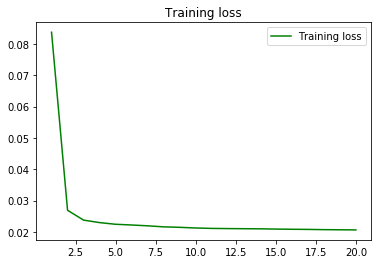

In [23]:
train_loss = history.history['loss']
epochs = range(1, len(train_loss) + 1)
plt.figure()
plt.plot(epochs, train_loss, 'g', label='Training loss')
plt.title('Training loss')
plt.legend()
plt.show()

In [24]:
print('Train MAE = %f' % (train_loss[-1] * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min())))

Train MAE = 2.193618


For comparison, the LOCF model MAE is **2.144081**.

In [25]:
as5_train_preds = model.predict_generator(gen_train, steps=train_steps, workers=0)

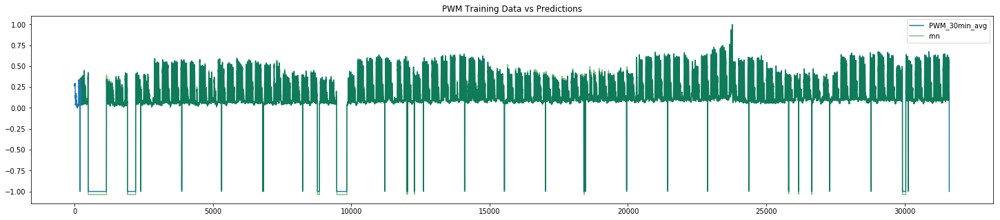

In [26]:
plt.figure(figsize=(25, 5))
plt.plot(range(as5_train_data.shape[0]), as5_train_data[:, 0], label='PWM_30min_avg')
plt.plot(range(lookback, as5_train_data.shape[0]), as5_train_preds.flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()

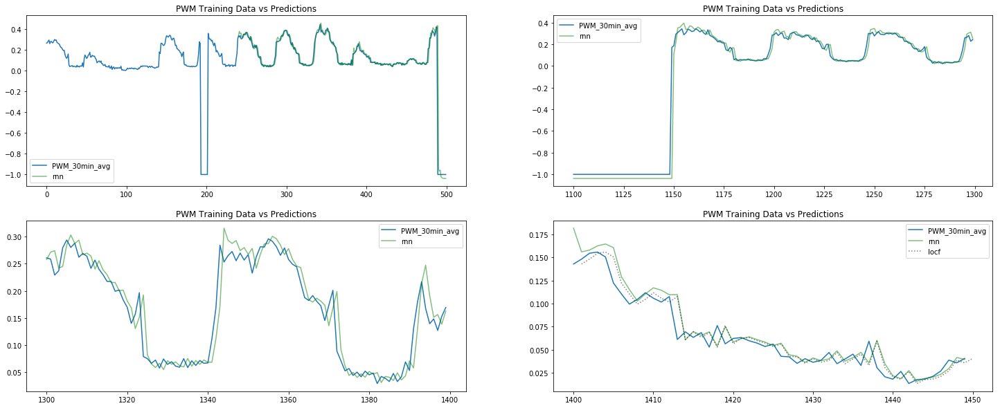

In [27]:
plt.figure(figsize=(25, 10))
plt.subplot(221)
plt.plot(range(500), as5_train_data[:500, 0], label='PWM_30min_avg')
plt.plot(range(lookback, 500), as5_train_preds[:500 - lookback, :].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()
plt.subplot(222)
plt.plot(range(1100, 1300), as5_train_data[1100:1300, 0], label='PWM_30min_avg')
plt.plot(range(1100, 1300), as5_train_preds[1100 - lookback:1300 - lookback].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()
plt.subplot(223)
plt.plot(range(1300, 1400), as5_train_data[1300:1400, 0], label='PWM_30min_avg')
plt.plot(range(1300, 1400), as5_train_preds[1300 - lookback:1400 - lookback].flatten(), color='green', alpha=.5, label='rnn')
plt.title('PWM Training Data vs Predictions')
plt.legend()
plt.subplot(224)
plt.plot(range(1400, 1450), as5_train_data[1400:1450, 0], label='PWM_30min_avg')
plt.plot(range(1400, 1450), as5_train_preds[1400 - lookback:1450 - lookback].flatten(), color='green', alpha=.5, label='rnn')
plt.plot(range(1401, 1451), as5_train_data[1400:1450, 0], color='black', alpha=.5, label='locf', linestyle=':')
plt.title('PWM Training Data vs Predictions')
plt.legend()

In [28]:
model.save('base-rnn-nomask.h5')

## Base RNN Model

### Test the thread-safe data generator

This generator should run faster.

In [20]:
gen_testing = mu.DataGenerator(as5_train_data[:1000],
                               lookback=lookback, delay=delay, min_index=0, max_index=999,
                               batch_size=batch_size, step=step)

There are 511 samples with missing output values; the number of batches is 1000 - 240 (lookback) - 511 - 0 (delay) / 128 = 1.9453. 2 batches is correct. 

In [21]:
(as5_train_data[240:1000, 0] == -1).sum()

511

In [22]:
gen_testing.__len__()

2

The size of the first mini-batch is correct. 128 samples, each with 240 (lookback) x 2 (PWM & BTU) attributes.

In [23]:
gen_testing.__getitem__(0)[0].shape

(128, 240, 2)

The values of the 2nd sample tally with the values of the 1st sample with a shift of 1.

In [24]:
gen_testing.__getitem__(0)[0][0, :5, :]

array([[0.26254935, 0.56924225],
       [0.26724948, 0.53427896],
       [0.28031585, 0.53353241],
       [0.29140816, 0.53415454],
       [0.25784922, 0.49769815]])

In [25]:
gen_testing.__getitem__(0)[0][1, :5, :]

array([[0.26724948, 0.53427896],
       [0.28031585, 0.53353241],
       [0.29140816, 0.53415454],
       [0.25784922, 0.49769815],
       [0.27674375, 0.42702501]])

The size of the last mini-batch is less than 128. (1000 - 240 - 511) % 128 = 121.

In [26]:
gen_testing.__getitem__(1)[0].shape

(121, 240, 2)

### Train the RNN

In [ ]:
from numpy.random import seed
seed(123)

from tensorflow import set_random_seed
set_random_seed(456)

In [22]:
model = Sequential()
model.add(layers.CUDNNGRU(16, input_shape=(None, as5_train_data.shape[-1])))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [26]:
gen_train = mu.DataGenerator(as5_train_data,
                             lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_data) - 1,
                             batch_size=batch_size, step=step)
gen_val = mu.DataGenerator(as5_val_data,
                           lookback=lookback, delay=delay, min_index=0, max_index=len(as5_val_data) - 1,
                           batch_size=batch_size, step=step)
print('train batches = %d\ntest batches = %d' % (gen_train.__len__(), gen_val.__len__()))

In [ ]:
callbacks_list = [
    ModelCheckpoint(
        filepath='base1-1x16gru.best.h5',
        monitor='val_loss',
        save_best_only=True
    ),
    TensorBoard(
        log_dir='tsb_log'
    )
]

In [26]:
t1 = datetime.datetime.now()
print('Training start time = {}'.format(t1))
history = model.fit_generator(generator=gen_train, epochs=80,
                              callbacks=callbacks_list,
                              validation_data=gen_val,
                              workers=3, use_multiprocessing=False, shuffle=True, verbose=0)
print('\nTraining Duration = %s' % (datetime.datetime.now()-t1))

Epoch 1/80


  1/143 [..............................] - ETA: 2:17 - loss: 0.3948 - mean_absolute_percentage_error: 145.0670

  2/143 [..............................] - ETA: 1:18 - loss: 0.3310 - mean_absolute_percentage_error: 137.4035

  3/143 [..............................] - ETA: 59s - loss: 0.3120 - mean_absolute_percentage_error: 131.1017 

  4/143 [..............................] - ETA: 49s - loss: 0.2782 - mean_absolute_percentage_error: 122.9479

  5/143 [>.............................] - ETA: 43s - loss: 0.2526 - mean_absolute_percentage_error: 115.9149

  6/143 [>.............................] - ETA: 38s - loss: 0.2637 - mean_absolute_percentage_error: 112.4295

  7/143 [>.............................] - ETA: 36s - loss: 0.2588 - mean_absolute_percentage_error: 106.5432

  8/143 [>.............................] - ETA: 34s - loss: 0.2633 - mean_absolute_percentage_error: 103.0941

  9/143 [>.............................] - ETA: 32s - loss: 0.2581 - mean_absolute_percentage_error: 98.7049 

 10/143 [=>............................] - ETA: 30s - loss: 0.2489 - mean_absolute_percentage_error: 94.7738

 11/143 [=>............................] - ETA: 29s - loss: 0.2374 - mean_absolute_percentage_error: 90.4022

 12/143 [=>............................] - ETA: 28s - loss: 0.2389 - mean_absolute_percentage_error: 88.0594

 13/143 [=>............................] - ETA: 27s - loss: 0.2314 - mean_absolute_percentage_error: 85.1034

 14/143 [=>............................] - ETA: 26s - loss: 0.2207 - mean_absolute_percentage_error: 81.7309

 15/143 [==>...........................] - ETA: 26s - loss: 0.2098 - mean_absolute_percentage_error: 78.3010

 16/143 [==>...........................] - ETA: 25s - loss: 0.2030 - mean_absolute_percentage_error: 79.6263

 17/143 [==>...........................] - ETA: 24s - loss: 0.1997 - mean_absolute_percentage_error: 78.2056

 18/143 [==>...........................] - ETA: 24s - loss: 0.1990 - mean_absolute_percentage_error: 76.7522

 19/143 [==>...........................] - ETA: 23s - loss: 0.2016 - mean_absolute_percentage_error: 75.6128

 20/143 [===>..........................] - ETA: 22s - loss: 0.1985 - mean_absolute_percentage_error: 73.9332

 21/143 [===>..........................] - ETA: 22s - loss: 0.1921 - mean_absolute_percentage_error: 73.6872

 22/143 [===>..........................] - ETA: 21s - loss: 0.1859 - mean_absolute_percentage_error: 72.1402

 23/143 [===>..........................] - ETA: 21s - loss: 0.1809 - mean_absolute_percentage_error: 73.8330

 24/143 [====>.........................] - ETA: 21s - loss: 0.1760 - mean_absolute_percentage_error: 72.1130

 25/143 [====>.........................] - ETA: 20s - loss: 0.1713 - mean_absolute_percentage_error: 70.7159

 26/143 [====>.........................] - ETA: 20s - loss: 0.1726 - mean_absolute_percentage_error: 70.2936

 27/143 [====>.........................] - ETA: 20s - loss: 0.1698 - mean_absolute_percentage_error: 68.8919

 28/143 [====>.........................] - ETA: 19s - loss: 0.1679 - mean_absolute_percentage_error: 69.1964

 29/143 [=====>........................] - ETA: 19s - loss: 0.1648 - mean_absolute_percentage_error: 67.8943

 30/143 [=====>........................] - ETA: 19s - loss: 0.1618 - mean_absolute_percentage_error: 66.9462

 31/143 [=====>........................] - ETA: 18s - loss: 0.1593 - mean_absolute_percentage_error: 66.1499

 32/143 [=====>........................] - ETA: 18s - loss: 0.1566 - mean_absolute_percentage_error: 66.1800

 33/143 [=====>........................] - ETA: 18s - loss: 0.1562 - mean_absolute_percentage_error: 65.4216

 34/143 [======>.......................] - ETA: 18s - loss: 0.1539 - mean_absolute_percentage_error: 66.0326

 35/143 [======>.......................] - ETA: 17s - loss: 0.1518 - mean_absolute_percentage_error: 65.0760

 36/143 [======>.......................] - ETA: 17s - loss: 0.1500 - mean_absolute_percentage_error: 64.3152

 37/143 [======>.......................] - ETA: 17s - loss: 0.1471 - mean_absolute_percentage_error: 64.1900

 38/143 [======>.......................] - ETA: 17s - loss: 0.1447 - mean_absolute_percentage_error: 63.6689

 39/143 [=======>......................] - ETA: 16s - loss: 0.1415 - mean_absolute_percentage_error: 62.8636

 40/143 [=======>......................] - ETA: 16s - loss: 0.1401 - mean_absolute_percentage_error: 62.6513

 41/143 [=======>......................] - ETA: 16s - loss: 0.1389 - mean_absolute_percentage_error: 62.0754

 42/143 [=======>......................] - ETA: 16s - loss: 0.1367 - mean_absolute_percentage_error: 61.9922

 43/143 [========>.....................] - ETA: 16s - loss: 0.1352 - mean_absolute_percentage_error: 61.7528

 44/143 [========>.....................] - ETA: 15s - loss: 0.1333 - mean_absolute_percentage_error: 62.7788

 45/143 [========>.....................] - ETA: 15s - loss: 0.1310 - mean_absolute_percentage_error: 61.8987

 46/143 [========>.....................] - ETA: 15s - loss: 0.1292 - mean_absolute_percentage_error: 61.4645

 47/143 [========>.....................] - ETA: 15s - loss: 0.1284 - mean_absolute_percentage_error: 60.8618

 48/143 [=========>....................] - ETA: 14s - loss: 0.1279 - mean_absolute_percentage_error: 60.3302

 49/143 [=========>....................] - ETA: 14s - loss: 0.1272 - mean_absolute_percentage_error: 60.0186

 50/143 [=========>....................] - ETA: 14s - loss: 0.1263 - mean_absolute_percentage_error: 59.4776

 51/143 [=========>....................] - ETA: 14s - loss: 0.1254 - mean_absolute_percentage_error: 59.5481

 52/143 [=========>....................] - ETA: 14s - loss: 0.1239 - mean_absolute_percentage_error: 58.8585

 53/143 [==========>...................] - ETA: 13s - loss: 0.1225 - mean_absolute_percentage_error: 58.3158

 54/143 [==========>...................] - ETA: 13s - loss: 0.1211 - mean_absolute_percentage_error: 57.7386

 55/143 [==========>...................] - ETA: 13s - loss: 0.1194 - mean_absolute_percentage_error: 58.0349

 56/143 [==========>...................] - ETA: 13s - loss: 0.1185 - mean_absolute_percentage_error: 57.5219

 57/143 [==========>...................] - ETA: 13s - loss: 0.1170 - mean_absolute_percentage_error: 56.8893

 58/143 [===========>..................] - ETA: 13s - loss: 0.1159 - mean_absolute_percentage_error: 56.3348

 59/143 [===========>..................] - ETA: 12s - loss: 0.1154 - mean_absolute_percentage_error: 56.2703

 60/143 [===========>..................] - ETA: 12s - loss: 0.1148 - mean_absolute_percentage_error: 55.9209

 61/143 [===========>..................] - ETA: 12s - loss: 0.1139 - mean_absolute_percentage_error: 55.8001

 62/143 [============>.................] - ETA: 12s - loss: 0.1133 - mean_absolute_percentage_error: 55.4507

 63/143 [============>.................] - ETA: 12s - loss: 0.1120 - mean_absolute_percentage_error: 54.9564

 64/143 [============>.................] - ETA: 11s - loss: 0.1109 - mean_absolute_percentage_error: 54.4222

 65/143 [============>.................] - ETA: 11s - loss: 0.1105 - mean_absolute_percentage_error: 55.3713

 66/143 [============>.................] - ETA: 11s - loss: 0.1103 - mean_absolute_percentage_error: 55.0578

 67/143 [=============>................] - ETA: 11s - loss: 0.1095 - mean_absolute_percentage_error: 54.9571

 68/143 [=============>................] - ETA: 11s - loss: 0.1097 - mean_absolute_percentage_error: 54.6849

 69/143 [=============>................] - ETA: 11s - loss: 0.1092 - mean_absolute_percentage_error: 54.5228

 70/143 [=============>................] - ETA: 10s - loss: 0.1083 - mean_absolute_percentage_error: 54.1855

 71/143 [=============>................] - ETA: 10s - loss: 0.1083 - mean_absolute_percentage_error: 53.9247

 72/143 [==============>...............] - ETA: 10s - loss: 0.1076 - mean_absolute_percentage_error: 53.8638

 73/143 [==============>...............] - ETA: 10s - loss: 0.1077 - mean_absolute_percentage_error: 53.7497

 74/143 [==============>...............] - ETA: 10s - loss: 0.1076 - mean_absolute_percentage_error: 53.9425

 75/143 [==============>...............] - ETA: 10s - loss: 0.1071 - mean_absolute_percentage_error: 53.7075

 76/143 [==============>...............] - ETA: 9s - loss: 0.1062 - mean_absolute_percentage_error: 53.3693 

 77/143 [===============>..............] - ETA: 9s - loss: 0.1054 - mean_absolute_percentage_error: 53.2806

 78/143 [===============>..............] - ETA: 9s - loss: 0.1047 - mean_absolute_percentage_error: 52.9484

 79/143 [===============>..............] - ETA: 9s - loss: 0.1041 - mean_absolute_percentage_error: 52.7232

 80/143 [===============>..............] - ETA: 9s - loss: 0.1033 - mean_absolute_percentage_error: 52.3731

 81/143 [===============>..............] - ETA: 9s - loss: 0.1026 - mean_absolute_percentage_error: 52.3030

 82/143 [================>.............] - ETA: 9s - loss: 0.1018 - mean_absolute_percentage_error: 52.0224

 83/143 [================>.............] - ETA: 8s - loss: 0.1011 - mean_absolute_percentage_error: 51.6523

 84/143 [================>.............] - ETA: 8s - loss: 0.1010 - mean_absolute_percentage_error: 51.4693

 85/143 [================>.............] - ETA: 8s - loss: 0.1005 - mean_absolute_percentage_error: 51.4513

 86/143 [=================>............] - ETA: 8s - loss: 0.1003 - mean_absolute_percentage_error: 51.4852

 87/143 [=================>............] - ETA: 8s - loss: 0.1001 - mean_absolute_percentage_error: 51.3811

 88/143 [=================>............] - ETA: 8s - loss: 0.1000 - mean_absolute_percentage_error: 51.2692

 89/143 [=================>............] - ETA: 7s - loss: 0.0993 - mean_absolute_percentage_error: 50.9784

 90/143 [=================>............] - ETA: 7s - loss: 0.0986 - mean_absolute_percentage_error: 50.7051

 91/143 [==================>...........] - ETA: 7s - loss: 0.0985 - mean_absolute_percentage_error: 50.5127

 92/143 [==================>...........] - ETA: 7s - loss: 0.0980 - mean_absolute_percentage_error: 50.3612

 93/143 [==================>...........] - ETA: 7s - loss: 0.0977 - mean_absolute_percentage_error: 50.2949

 94/143 [==================>...........] - ETA: 7s - loss: 0.0972 - mean_absolute_percentage_error: 50.0386

 95/143 [==================>...........] - ETA: 7s - loss: 0.0965 - mean_absolute_percentage_error: 49.7968

 96/143 [===================>..........] - ETA: 6s - loss: 0.0962 - mean_absolute_percentage_error: 49.6811

 97/143 [===================>..........] - ETA: 6s - loss: 0.0956 - mean_absolute_percentage_error: 49.4026

 98/143 [===================>..........] - ETA: 6s - loss: 0.0950 - mean_absolute_percentage_error: 49.1088

 99/143 [===================>..........] - ETA: 6s - loss: 0.0945 - mean_absolute_percentage_error: 48.8455

100/143 [===================>..........] - ETA: 6s - loss: 0.0945 - mean_absolute_percentage_error: 48.7849

101/143 [====================>.........] - ETA: 6s - loss: 0.0939 - mean_absolute_percentage_error: 48.5767

102/143 [====================>.........] - ETA: 6s - loss: 0.0936 - mean_absolute_percentage_error: 48.8228

103/143 [====================>.........] - ETA: 5s - loss: 0.0931 - mean_absolute_percentage_error: 48.7738

104/143 [====================>.........] - ETA: 5s - loss: 0.0930 - mean_absolute_percentage_error: 48.5984

105/143 [=====================>........] - ETA: 5s - loss: 0.0929 - mean_absolute_percentage_error: 48.4568

106/143 [=====================>........] - ETA: 5s - loss: 0.0927 - mean_absolute_percentage_error: 48.2718

107/143 [=====================>........] - ETA: 5s - loss: 0.0924 - mean_absolute_percentage_error: 48.1987

108/143 [=====================>........] - ETA: 5s - loss: 0.0922 - mean_absolute_percentage_error: 48.0138

109/143 [=====================>........] - ETA: 4s - loss: 0.0922 - mean_absolute_percentage_error: 48.1876

110/143 [======================>.......] - ETA: 4s - loss: 0.0919 - mean_absolute_percentage_error: 47.9490

111/143 [======================>.......] - ETA: 4s - loss: 0.0915 - mean_absolute_percentage_error: 47.9100

112/143 [======================>.......] - ETA: 4s - loss: 0.0913 - mean_absolute_percentage_error: 47.7771

113/143 [======================>.......] - ETA: 4s - loss: 0.0910 - mean_absolute_percentage_error: 47.7077

114/143 [======================>.......] - ETA: 4s - loss: 0.0907 - mean_absolute_percentage_error: 47.5212

115/143 [=======================>......] - ETA: 4s - loss: 0.0905 - mean_absolute_percentage_error: 47.5109

116/143 [=======================>......] - ETA: 3s - loss: 0.0900 - mean_absolute_percentage_error: 47.4417

117/143 [=======================>......] - ETA: 3s - loss: 0.0898 - mean_absolute_percentage_error: 47.3677

118/143 [=======================>......] - ETA: 3s - loss: 0.0894 - mean_absolute_percentage_error: 47.2617

119/143 [=======================>......] - ETA: 3s - loss: 0.0889 - mean_absolute_percentage_error: 47.0914

120/143 [========================>.....] - ETA: 3s - loss: 0.0886 - mean_absolute_percentage_error: 46.9273

121/143 [========================>.....] - ETA: 3s - loss: 0.0881 - mean_absolute_percentage_error: 46.6945

122/143 [========================>.....] - ETA: 3s - loss: 0.0878 - mean_absolute_percentage_error: 46.7245

123/143 [========================>.....] - ETA: 2s - loss: 0.0874 - mean_absolute_percentage_error: 46.5369

124/143 [=========================>....] - ETA: 2s - loss: 0.0870 - mean_absolute_percentage_error: 46.4026

125/143 [=========================>....] - ETA: 2s - loss: 0.0867 - mean_absolute_percentage_error: 46.2524

126/143 [=========================>....] - ETA: 2s - loss: 0.0865 - mean_absolute_percentage_error: 46.1497

127/143 [=========================>....] - ETA: 2s - loss: 0.0863 - mean_absolute_percentage_error: 45.9841

128/143 [=========================>....] - ETA: 2s - loss: 0.0860 - mean_absolute_percentage_error: 45.9483

129/143 [==========================>...] - ETA: 2s - loss: 0.0858 - mean_absolute_percentage_error: 45.8483

130/143 [==========================>...] - ETA: 1s - loss: 0.0855 - mean_absolute_percentage_error: 45.6840

131/143 [==========================>...] - ETA: 1s - loss: 0.0852 - mean_absolute_percentage_error: 45.6000

132/143 [==========================>...] - ETA: 1s - loss: 0.0849 - mean_absolute_percentage_error: 45.4547

133/143 [==========================>...] - ETA: 1s - loss: 0.0845 - mean_absolute_percentage_error: 45.2704

134/143 [===========================>..] - ETA: 1s - loss: 0.0843 - mean_absolute_percentage_error: 45.1355

135/143 [===========================>..] - ETA: 1s - loss: 0.0841 - mean_absolute_percentage_error: 45.0457

136/143 [===========================>..] - ETA: 1s - loss: 0.0839 - mean_absolute_percentage_error: 45.0095

137/143 [===========================>..] - ETA: 0s - loss: 0.0836 - mean_absolute_percentage_error: 44.8417

138/143 [===========================>..] - ETA: 0s - loss: 0.0834 - mean_absolute_percentage_error: 44.7689

139/143 [============================>.] - ETA: 0s - loss: 0.0831 - mean_absolute_percentage_error: 44.6699

140/143 [============================>.] - ETA: 0s - loss: 0.0829 - mean_absolute_percentage_error: 44.7514

141/143 [============================>.] - ETA: 0s - loss: 0.0826 - mean_absolute_percentage_error: 44.9772

142/143 [============================>.] - ETA: 0s - loss: 0.0825 - mean_absolute_percentage_error: 44.8675

143/143 [==============================] - 23s 164ms/step - loss: 0.0828 - mean_absolute_percentage_error: 44.8355 - val_loss: 0.0594 - val_mean_absolute_percentage_error: 28.7815


Epoch 2/80


  1/143 [..............................] - ETA: 29s - loss: 0.0478 - mean_absolute_percentage_error: 37.8649

  2/143 [..............................] - ETA: 24s - loss: 0.0454 - mean_absolute_percentage_error: 33.4368

  3/143 [..............................] - ETA: 22s - loss: 0.0522 - mean_absolute_percentage_error: 32.6807

  4/143 [..............................] - ETA: 21s - loss: 0.0496 - mean_absolute_percentage_error: 31.3406

  5/143 [>.............................] - ETA: 21s - loss: 0.0454 - mean_absolute_percentage_error: 30.9581

  6/143 [>.............................] - ETA: 20s - loss: 0.0497 - mean_absolute_percentage_error: 31.0800

  7/143 [>.............................] - ETA: 20s - loss: 0.0482 - mean_absolute_percentage_error: 32.4720

  8/143 [>.............................] - ETA: 19s - loss: 0.0456 - mean_absolute_percentage_error: 31.1647

  9/143 [>.............................] - ETA: 19s - loss: 0.0472 - mean_absolute_percentage_error: 32.1985

 10/143 [=>............................] - ETA: 19s - loss: 0.0461 - mean_absolute_percentage_error: 31.7704

 11/143 [=>............................] - ETA: 19s - loss: 0.0463 - mean_absolute_percentage_error: 32.0118

 12/143 [=>............................] - ETA: 18s - loss: 0.0452 - mean_absolute_percentage_error: 31.1243

 13/143 [=>............................] - ETA: 18s - loss: 0.0490 - mean_absolute_percentage_error: 31.1302

 14/143 [=>............................] - ETA: 18s - loss: 0.0487 - mean_absolute_percentage_error: 30.5762

 15/143 [==>...........................] - ETA: 18s - loss: 0.0475 - mean_absolute_percentage_error: 30.1017

 16/143 [==>...........................] - ETA: 17s - loss: 0.0468 - mean_absolute_percentage_error: 30.2157

 17/143 [==>...........................] - ETA: 17s - loss: 0.0454 - mean_absolute_percentage_error: 29.4993

 18/143 [==>...........................] - ETA: 17s - loss: 0.0446 - mean_absolute_percentage_error: 29.1674

 19/143 [==>...........................] - ETA: 17s - loss: 0.0438 - mean_absolute_percentage_error: 28.6328

 20/143 [===>..........................] - ETA: 17s - loss: 0.0455 - mean_absolute_percentage_error: 28.6287

 21/143 [===>..........................] - ETA: 17s - loss: 0.0449 - mean_absolute_percentage_error: 28.0651

 22/143 [===>..........................] - ETA: 16s - loss: 0.0448 - mean_absolute_percentage_error: 28.3578

 23/143 [===>..........................] - ETA: 16s - loss: 0.0443 - mean_absolute_percentage_error: 28.4444

 24/143 [====>.........................] - ETA: 16s - loss: 0.0452 - mean_absolute_percentage_error: 28.4165

 25/143 [====>.........................] - ETA: 16s - loss: 0.0448 - mean_absolute_percentage_error: 28.1821

 26/143 [====>.........................] - ETA: 16s - loss: 0.0457 - mean_absolute_percentage_error: 28.4197

 27/143 [====>.........................] - ETA: 16s - loss: 0.0461 - mean_absolute_percentage_error: 28.3193

 28/143 [====>.........................] - ETA: 16s - loss: 0.0461 - mean_absolute_percentage_error: 28.4040

 29/143 [=====>........................] - ETA: 15s - loss: 0.0457 - mean_absolute_percentage_error: 28.0631

 30/143 [=====>........................] - ETA: 15s - loss: 0.0464 - mean_absolute_percentage_error: 28.3381

 31/143 [=====>........................] - ETA: 15s - loss: 0.0469 - mean_absolute_percentage_error: 28.8046

 32/143 [=====>........................] - ETA: 15s - loss: 0.0469 - mean_absolute_percentage_error: 28.5288

 33/143 [=====>........................] - ETA: 15s - loss: 0.0470 - mean_absolute_percentage_error: 28.4877

 34/143 [======>.......................] - ETA: 15s - loss: 0.0468 - mean_absolute_percentage_error: 28.3368

 35/143 [======>.......................] - ETA: 14s - loss: 0.0463 - mean_absolute_percentage_error: 28.0550

 36/143 [======>.......................] - ETA: 14s - loss: 0.0464 - mean_absolute_percentage_error: 27.9961

 37/143 [======>.......................] - ETA: 14s - loss: 0.0478 - mean_absolute_percentage_error: 28.2172

 38/143 [======>.......................] - ETA: 14s - loss: 0.0476 - mean_absolute_percentage_error: 28.1733

 39/143 [=======>......................] - ETA: 14s - loss: 0.0474 - mean_absolute_percentage_error: 27.9913

 40/143 [=======>......................] - ETA: 14s - loss: 0.0475 - mean_absolute_percentage_error: 27.9237

 41/143 [=======>......................] - ETA: 14s - loss: 0.0472 - mean_absolute_percentage_error: 27.9412

 42/143 [=======>......................] - ETA: 13s - loss: 0.0472 - mean_absolute_percentage_error: 28.3871

 43/143 [========>.....................] - ETA: 13s - loss: 0.0468 - mean_absolute_percentage_error: 28.1440

 44/143 [========>.....................] - ETA: 13s - loss: 0.0474 - mean_absolute_percentage_error: 28.1250

 45/143 [========>.....................] - ETA: 13s - loss: 0.0470 - mean_absolute_percentage_error: 27.8505

 46/143 [========>.....................] - ETA: 13s - loss: 0.0467 - mean_absolute_percentage_error: 27.6422

 47/143 [========>.....................] - ETA: 13s - loss: 0.0468 - mean_absolute_percentage_error: 27.6266

 48/143 [=========>....................] - ETA: 13s - loss: 0.0464 - mean_absolute_percentage_error: 27.6531

 49/143 [=========>....................] - ETA: 12s - loss: 0.0466 - mean_absolute_percentage_error: 27.5835

 50/143 [=========>....................] - ETA: 12s - loss: 0.0465 - mean_absolute_percentage_error: 27.4462

 51/143 [=========>....................] - ETA: 12s - loss: 0.0469 - mean_absolute_percentage_error: 27.8508

 52/143 [=========>....................] - ETA: 12s - loss: 0.0468 - mean_absolute_percentage_error: 28.1675

 53/143 [==========>...................] - ETA: 12s - loss: 0.0469 - mean_absolute_percentage_error: 28.1206

 54/143 [==========>...................] - ETA: 12s - loss: 0.0471 - mean_absolute_percentage_error: 28.0450

 55/143 [==========>...................] - ETA: 12s - loss: 0.0476 - mean_absolute_percentage_error: 28.6086

 56/143 [==========>...................] - ETA: 11s - loss: 0.0476 - mean_absolute_percentage_error: 28.5357

 57/143 [==========>...................] - ETA: 11s - loss: 0.0478 - mean_absolute_percentage_error: 28.4146

 58/143 [===========>..................] - ETA: 11s - loss: 0.0477 - mean_absolute_percentage_error: 29.3020

 59/143 [===========>..................] - ETA: 11s - loss: 0.0475 - mean_absolute_percentage_error: 29.2145

 60/143 [===========>..................] - ETA: 11s - loss: 0.0475 - mean_absolute_percentage_error: 29.1988

 61/143 [===========>..................] - ETA: 11s - loss: 0.0476 - mean_absolute_percentage_error: 29.1216

 62/143 [============>.................] - ETA: 11s - loss: 0.0476 - mean_absolute_percentage_error: 29.1775

 63/143 [============>.................] - ETA: 10s - loss: 0.0475 - mean_absolute_percentage_error: 29.1041

 64/143 [============>.................] - ETA: 10s - loss: 0.0478 - mean_absolute_percentage_error: 29.0399

 65/143 [============>.................] - ETA: 10s - loss: 0.0476 - mean_absolute_percentage_error: 28.8970

 66/143 [============>.................] - ETA: 10s - loss: 0.0476 - mean_absolute_percentage_error: 28.9314

 67/143 [=============>................] - ETA: 10s - loss: 0.0477 - mean_absolute_percentage_error: 28.8806

 68/143 [=============>................] - ETA: 10s - loss: 0.0474 - mean_absolute_percentage_error: 28.9260

 69/143 [=============>................] - ETA: 10s - loss: 0.0475 - mean_absolute_percentage_error: 28.8411

 70/143 [=============>................] - ETA: 9s - loss: 0.0471 - mean_absolute_percentage_error: 29.1078 

 71/143 [=============>................] - ETA: 9s - loss: 0.0471 - mean_absolute_percentage_error: 29.0499

 72/143 [==============>...............] - ETA: 9s - loss: 0.0470 - mean_absolute_percentage_error: 29.0291

 73/143 [==============>...............] - ETA: 9s - loss: 0.0470 - mean_absolute_percentage_error: 29.0161

 74/143 [==============>...............] - ETA: 9s - loss: 0.0471 - mean_absolute_percentage_error: 29.0029

 75/143 [==============>...............] - ETA: 9s - loss: 0.0470 - mean_absolute_percentage_error: 28.9181

 76/143 [==============>...............] - ETA: 9s - loss: 0.0468 - mean_absolute_percentage_error: 28.7728

 77/143 [===============>..............] - ETA: 9s - loss: 0.0466 - mean_absolute_percentage_error: 28.6689

 78/143 [===============>..............] - ETA: 8s - loss: 0.0466 - mean_absolute_percentage_error: 28.5910

 79/143 [===============>..............] - ETA: 8s - loss: 0.0466 - mean_absolute_percentage_error: 28.5212

 80/143 [===============>..............] - ETA: 8s - loss: 0.0466 - mean_absolute_percentage_error: 28.4753

 81/143 [===============>..............] - ETA: 8s - loss: 0.0463 - mean_absolute_percentage_error: 28.4291

 82/143 [================>.............] - ETA: 8s - loss: 0.0462 - mean_absolute_percentage_error: 28.4966

 83/143 [================>.............] - ETA: 8s - loss: 0.0464 - mean_absolute_percentage_error: 28.4814

 84/143 [================>.............] - ETA: 8s - loss: 0.0462 - mean_absolute_percentage_error: 28.3588

 85/143 [================>.............] - ETA: 7s - loss: 0.0464 - mean_absolute_percentage_error: 28.7002

 86/143 [=================>............] - ETA: 7s - loss: 0.0465 - mean_absolute_percentage_error: 28.6566

 87/143 [=================>............] - ETA: 7s - loss: 0.0465 - mean_absolute_percentage_error: 28.6016

 88/143 [=================>............] - ETA: 7s - loss: 0.0465 - mean_absolute_percentage_error: 28.6022

 89/143 [=================>............] - ETA: 7s - loss: 0.0463 - mean_absolute_percentage_error: 28.4878

 90/143 [=================>............] - ETA: 7s - loss: 0.0464 - mean_absolute_percentage_error: 28.5421

 91/143 [==================>...........] - ETA: 7s - loss: 0.0462 - mean_absolute_percentage_error: 28.4266

 92/143 [==================>...........] - ETA: 6s - loss: 0.0462 - mean_absolute_percentage_error: 28.3509

 93/143 [==================>...........] - ETA: 6s - loss: 0.0465 - mean_absolute_percentage_error: 28.3023

 94/143 [==================>...........] - ETA: 6s - loss: 0.0464 - mean_absolute_percentage_error: 28.3784

 95/143 [==================>...........] - ETA: 6s - loss: 0.0463 - mean_absolute_percentage_error: 28.2617

 96/143 [===================>..........] - ETA: 6s - loss: 0.0461 - mean_absolute_percentage_error: 28.1471

 97/143 [===================>..........] - ETA: 6s - loss: 0.0459 - mean_absolute_percentage_error: 28.0498

 98/143 [===================>..........] - ETA: 6s - loss: 0.0459 - mean_absolute_percentage_error: 28.2825

 99/143 [===================>..........] - ETA: 6s - loss: 0.0458 - mean_absolute_percentage_error: 28.1990

100/143 [===================>..........] - ETA: 5s - loss: 0.0457 - mean_absolute_percentage_error: 28.2272

101/143 [====================>.........] - ETA: 5s - loss: 0.0457 - mean_absolute_percentage_error: 28.1852

102/143 [====================>.........] - ETA: 5s - loss: 0.0455 - mean_absolute_percentage_error: 28.0830

103/143 [====================>.........] - ETA: 5s - loss: 0.0454 - mean_absolute_percentage_error: 27.9708

104/143 [====================>.........] - ETA: 5s - loss: 0.0453 - mean_absolute_percentage_error: 28.0761

105/143 [=====================>........] - ETA: 5s - loss: 0.0452 - mean_absolute_percentage_error: 27.9582

106/143 [=====================>........] - ETA: 5s - loss: 0.0450 - mean_absolute_percentage_error: 27.9039

107/143 [=====================>........] - ETA: 4s - loss: 0.0449 - mean_absolute_percentage_error: 27.8809

108/143 [=====================>........] - ETA: 4s - loss: 0.0450 - mean_absolute_percentage_error: 27.8431

109/143 [=====================>........] - ETA: 4s - loss: 0.0449 - mean_absolute_percentage_error: 27.8212

110/143 [======================>.......] - ETA: 4s - loss: 0.0449 - mean_absolute_percentage_error: 27.8420

111/143 [======================>.......] - ETA: 4s - loss: 0.0448 - mean_absolute_percentage_error: 27.8235

112/143 [======================>.......] - ETA: 4s - loss: 0.0448 - mean_absolute_percentage_error: 27.7577

113/143 [======================>.......] - ETA: 4s - loss: 0.0449 - mean_absolute_percentage_error: 27.8704

114/143 [======================>.......] - ETA: 3s - loss: 0.0447 - mean_absolute_percentage_error: 27.7714

115/143 [=======================>......] - ETA: 3s - loss: 0.0446 - mean_absolute_percentage_error: 27.8590

116/143 [=======================>......] - ETA: 3s - loss: 0.0447 - mean_absolute_percentage_error: 27.8294

117/143 [=======================>......] - ETA: 3s - loss: 0.0446 - mean_absolute_percentage_error: 27.7680

118/143 [=======================>......] - ETA: 3s - loss: 0.0444 - mean_absolute_percentage_error: 27.6695

119/143 [=======================>......] - ETA: 3s - loss: 0.0443 - mean_absolute_percentage_error: 27.5758

120/143 [========================>.....] - ETA: 3s - loss: 0.0443 - mean_absolute_percentage_error: 27.5458

121/143 [========================>.....] - ETA: 3s - loss: 0.0444 - mean_absolute_percentage_error: 27.4563

122/143 [========================>.....] - ETA: 2s - loss: 0.0445 - mean_absolute_percentage_error: 27.4176

123/143 [========================>.....] - ETA: 2s - loss: 0.0445 - mean_absolute_percentage_error: 27.5456

124/143 [=========================>....] - ETA: 2s - loss: 0.0445 - mean_absolute_percentage_error: 27.8634

125/143 [=========================>....] - ETA: 2s - loss: 0.0447 - mean_absolute_percentage_error: 27.8719

126/143 [=========================>....] - ETA: 2s - loss: 0.0447 - mean_absolute_percentage_error: 27.8147

127/143 [=========================>....] - ETA: 2s - loss: 0.0449 - mean_absolute_percentage_error: 27.8232

128/143 [=========================>....] - ETA: 2s - loss: 0.0450 - mean_absolute_percentage_error: 27.8596

129/143 [==========================>...] - ETA: 1s - loss: 0.0447 - mean_absolute_percentage_error: 27.7381

130/143 [==========================>...] - ETA: 1s - loss: 0.0446 - mean_absolute_percentage_error: 27.7291

131/143 [==========================>...] - ETA: 1s - loss: 0.0446 - mean_absolute_percentage_error: 27.6610

132/143 [==========================>...] - ETA: 1s - loss: 0.0446 - mean_absolute_percentage_error: 27.6208

133/143 [==========================>...] - ETA: 1s - loss: 0.0444 - mean_absolute_percentage_error: 27.5529

134/143 [===========================>..] - ETA: 1s - loss: 0.0446 - mean_absolute_percentage_error: 27.5316

135/143 [===========================>..] - ETA: 1s - loss: 0.0446 - mean_absolute_percentage_error: 27.4630

136/143 [===========================>..] - ETA: 0s - loss: 0.0445 - mean_absolute_percentage_error: 27.4209

137/143 [===========================>..] - ETA: 0s - loss: 0.0443 - mean_absolute_percentage_error: 27.3697

138/143 [===========================>..] - ETA: 0s - loss: 0.0442 - mean_absolute_percentage_error: 27.3126

139/143 [============================>.] - ETA: 0s - loss: 0.0440 - mean_absolute_percentage_error: 27.2215

140/143 [============================>.] - ETA: 0s - loss: 0.0440 - mean_absolute_percentage_error: 27.1678

141/143 [============================>.] - ETA: 0s - loss: 0.0439 - mean_absolute_percentage_error: 27.0938

142/143 [============================>.] - ETA: 0s - loss: 0.0439 - mean_absolute_percentage_error: 27.0361

143/143 [==============================] - 23s 160ms/step - loss: 0.0438 - mean_absolute_percentage_error: 27.0045 - val_loss: 0.0448 - val_mean_absolute_percentage_error: 20.3272


Epoch 3/80


  1/143 [..............................] - ETA: 30s - loss: 0.0416 - mean_absolute_percentage_error: 22.4778

  2/143 [..............................] - ETA: 27s - loss: 0.0411 - mean_absolute_percentage_error: 23.9032

  3/143 [..............................] - ETA: 24s - loss: 0.0379 - mean_absolute_percentage_error: 26.5610

  4/143 [..............................] - ETA: 22s - loss: 0.0396 - mean_absolute_percentage_error: 25.2153

  5/143 [>.............................] - ETA: 22s - loss: 0.0435 - mean_absolute_percentage_error: 24.8753

  6/143 [>.............................] - ETA: 21s - loss: 0.0450 - mean_absolute_percentage_error: 24.8466

  7/143 [>.............................] - ETA: 21s - loss: 0.0424 - mean_absolute_percentage_error: 23.3599

  8/143 [>.............................] - ETA: 21s - loss: 0.0421 - mean_absolute_percentage_error: 24.2498

  9/143 [>.............................] - ETA: 21s - loss: 0.0407 - mean_absolute_percentage_error: 23.3080

 10/143 [=>............................] - ETA: 21s - loss: 0.0423 - mean_absolute_percentage_error: 22.8534

 11/143 [=>............................] - ETA: 20s - loss: 0.0425 - mean_absolute_percentage_error: 23.4691

 12/143 [=>............................] - ETA: 20s - loss: 0.0418 - mean_absolute_percentage_error: 22.6937

 13/143 [=>............................] - ETA: 20s - loss: 0.0406 - mean_absolute_percentage_error: 23.0621

 14/143 [=>............................] - ETA: 20s - loss: 0.0398 - mean_absolute_percentage_error: 22.8808

 15/143 [==>...........................] - ETA: 20s - loss: 0.0414 - mean_absolute_percentage_error: 22.7480

 16/143 [==>...........................] - ETA: 19s - loss: 0.0403 - mean_absolute_percentage_error: 22.3886

 17/143 [==>...........................] - ETA: 19s - loss: 0.0406 - mean_absolute_percentage_error: 22.8362

 18/143 [==>...........................] - ETA: 19s - loss: 0.0401 - mean_absolute_percentage_error: 22.7424

 19/143 [==>...........................] - ETA: 19s - loss: 0.0399 - mean_absolute_percentage_error: 22.4407

 20/143 [===>..........................] - ETA: 19s - loss: 0.0396 - mean_absolute_percentage_error: 22.6806

 21/143 [===>..........................] - ETA: 19s - loss: 0.0390 - mean_absolute_percentage_error: 22.3566

 22/143 [===>..........................] - ETA: 18s - loss: 0.0382 - mean_absolute_percentage_error: 22.3187

 23/143 [===>..........................] - ETA: 18s - loss: 0.0376 - mean_absolute_percentage_error: 22.2178

 24/143 [====>.........................] - ETA: 18s - loss: 0.0380 - mean_absolute_percentage_error: 22.0085

 25/143 [====>.........................] - ETA: 18s - loss: 0.0389 - mean_absolute_percentage_error: 22.1566

 26/143 [====>.........................] - ETA: 18s - loss: 0.0387 - mean_absolute_percentage_error: 21.9454

 27/143 [====>.........................] - ETA: 17s - loss: 0.0388 - mean_absolute_percentage_error: 21.8136

 28/143 [====>.........................] - ETA: 17s - loss: 0.0392 - mean_absolute_percentage_error: 21.7055

 29/143 [=====>........................] - ETA: 17s - loss: 0.0386 - mean_absolute_percentage_error: 21.4509

 30/143 [=====>........................] - ETA: 17s - loss: 0.0383 - mean_absolute_percentage_error: 21.4418

 31/143 [=====>........................] - ETA: 17s - loss: 0.0380 - mean_absolute_percentage_error: 21.2762

 32/143 [=====>........................] - ETA: 16s - loss: 0.0372 - mean_absolute_percentage_error: 21.5425

 33/143 [=====>........................] - ETA: 16s - loss: 0.0370 - mean_absolute_percentage_error: 21.4214

 34/143 [======>.......................] - ETA: 16s - loss: 0.0370 - mean_absolute_percentage_error: 21.4193

 35/143 [======>.......................] - ETA: 16s - loss: 0.0366 - mean_absolute_percentage_error: 21.2732

 36/143 [======>.......................] - ETA: 16s - loss: 0.0363 - mean_absolute_percentage_error: 21.1366

 37/143 [======>.......................] - ETA: 15s - loss: 0.0367 - mean_absolute_percentage_error: 21.2684

 38/143 [======>.......................] - ETA: 15s - loss: 0.0367 - mean_absolute_percentage_error: 21.8289

 39/143 [=======>......................] - ETA: 15s - loss: 0.0371 - mean_absolute_percentage_error: 22.2208

 40/143 [=======>......................] - ETA: 15s - loss: 0.0368 - mean_absolute_percentage_error: 22.1311

 41/143 [=======>......................] - ETA: 15s - loss: 0.0369 - mean_absolute_percentage_error: 22.0017

 42/143 [=======>......................] - ETA: 15s - loss: 0.0370 - mean_absolute_percentage_error: 23.0456

 43/143 [========>.....................] - ETA: 14s - loss: 0.0369 - mean_absolute_percentage_error: 22.9417

 44/143 [========>.....................] - ETA: 14s - loss: 0.0368 - mean_absolute_percentage_error: 22.9982

 45/143 [========>.....................] - ETA: 14s - loss: 0.0375 - mean_absolute_percentage_error: 23.0476

 46/143 [========>.....................] - ETA: 14s - loss: 0.0375 - mean_absolute_percentage_error: 22.9844

 47/143 [========>.....................] - ETA: 14s - loss: 0.0377 - mean_absolute_percentage_error: 23.2517

 48/143 [=========>....................] - ETA: 14s - loss: 0.0375 - mean_absolute_percentage_error: 23.2089

 49/143 [=========>....................] - ETA: 13s - loss: 0.0377 - mean_absolute_percentage_error: 23.1005

 50/143 [=========>....................] - ETA: 13s - loss: 0.0378 - mean_absolute_percentage_error: 23.2833

 51/143 [=========>....................] - ETA: 13s - loss: 0.0375 - mean_absolute_percentage_error: 23.1323

 52/143 [=========>....................] - ETA: 13s - loss: 0.0372 - mean_absolute_percentage_error: 22.9713

 53/143 [==========>...................] - ETA: 13s - loss: 0.0371 - mean_absolute_percentage_error: 22.8813

 54/143 [==========>...................] - ETA: 13s - loss: 0.0368 - mean_absolute_percentage_error: 22.7142

 55/143 [==========>...................] - ETA: 13s - loss: 0.0366 - mean_absolute_percentage_error: 22.5647

 56/143 [==========>...................] - ETA: 12s - loss: 0.0364 - mean_absolute_percentage_error: 22.3777

 57/143 [==========>...................] - ETA: 12s - loss: 0.0361 - mean_absolute_percentage_error: 22.2519

 58/143 [===========>..................] - ETA: 12s - loss: 0.0358 - mean_absolute_percentage_error: 22.1458

 59/143 [===========>..................] - ETA: 12s - loss: 0.0355 - mean_absolute_percentage_error: 22.1091

 60/143 [===========>..................] - ETA: 12s - loss: 0.0359 - mean_absolute_percentage_error: 22.1584

 61/143 [===========>..................] - ETA: 12s - loss: 0.0359 - mean_absolute_percentage_error: 22.8654

 62/143 [============>.................] - ETA: 11s - loss: 0.0360 - mean_absolute_percentage_error: 22.8961

 63/143 [============>.................] - ETA: 11s - loss: 0.0358 - mean_absolute_percentage_error: 22.7734

 64/143 [============>.................] - ETA: 11s - loss: 0.0359 - mean_absolute_percentage_error: 23.2620

 65/143 [============>.................] - ETA: 11s - loss: 0.0356 - mean_absolute_percentage_error: 23.1080

 66/143 [============>.................] - ETA: 11s - loss: 0.0354 - mean_absolute_percentage_error: 22.9511

 67/143 [=============>................] - ETA: 11s - loss: 0.0352 - mean_absolute_percentage_error: 22.8048

 68/143 [=============>................] - ETA: 11s - loss: 0.0351 - mean_absolute_percentage_error: 22.7329

 69/143 [=============>................] - ETA: 10s - loss: 0.0349 - mean_absolute_percentage_error: 22.6418

 70/143 [=============>................] - ETA: 10s - loss: 0.0349 - mean_absolute_percentage_error: 22.6462

 71/143 [=============>................] - ETA: 10s - loss: 0.0350 - mean_absolute_percentage_error: 22.5422

 72/143 [==============>...............] - ETA: 10s - loss: 0.0349 - mean_absolute_percentage_error: 22.6001

 73/143 [==============>...............] - ETA: 10s - loss: 0.0346 - mean_absolute_percentage_error: 22.4262

 74/143 [==============>...............] - ETA: 10s - loss: 0.0346 - mean_absolute_percentage_error: 22.3462

 75/143 [==============>...............] - ETA: 9s - loss: 0.0345 - mean_absolute_percentage_error: 22.2435 

 76/143 [==============>...............] - ETA: 9s - loss: 0.0344 - mean_absolute_percentage_error: 22.1350

 77/143 [===============>..............] - ETA: 9s - loss: 0.0345 - mean_absolute_percentage_error: 22.1018

 78/143 [===============>..............] - ETA: 9s - loss: 0.0344 - mean_absolute_percentage_error: 22.0960

 79/143 [===============>..............] - ETA: 9s - loss: 0.0344 - mean_absolute_percentage_error: 22.0194

 80/143 [===============>..............] - ETA: 9s - loss: 0.0343 - mean_absolute_percentage_error: 21.9274

 81/143 [===============>..............] - ETA: 9s - loss: 0.0342 - mean_absolute_percentage_error: 21.9760

 82/143 [================>.............] - ETA: 8s - loss: 0.0340 - mean_absolute_percentage_error: 21.8720

 83/143 [================>.............] - ETA: 8s - loss: 0.0338 - mean_absolute_percentage_error: 21.9235

 84/143 [================>.............] - ETA: 8s - loss: 0.0340 - mean_absolute_percentage_error: 21.9693

 85/143 [================>.............] - ETA: 8s - loss: 0.0340 - mean_absolute_percentage_error: 21.8866

 86/143 [=================>............] - ETA: 8s - loss: 0.0341 - mean_absolute_percentage_error: 21.7803

 87/143 [=================>............] - ETA: 8s - loss: 0.0340 - mean_absolute_percentage_error: 21.7509

 88/143 [=================>............] - ETA: 7s - loss: 0.0340 - mean_absolute_percentage_error: 21.8224

 89/143 [=================>............] - ETA: 7s - loss: 0.0339 - mean_absolute_percentage_error: 21.7461

 90/143 [=================>............] - ETA: 7s - loss: 0.0338 - mean_absolute_percentage_error: 21.6502

 91/143 [==================>...........] - ETA: 7s - loss: 0.0337 - mean_absolute_percentage_error: 21.5936

 92/143 [==================>...........] - ETA: 7s - loss: 0.0339 - mean_absolute_percentage_error: 21.8746

 93/143 [==================>...........] - ETA: 7s - loss: 0.0339 - mean_absolute_percentage_error: 21.8791

 94/143 [==================>...........] - ETA: 7s - loss: 0.0338 - mean_absolute_percentage_error: 21.7931

 95/143 [==================>...........] - ETA: 6s - loss: 0.0338 - mean_absolute_percentage_error: 21.7033

 96/143 [===================>..........] - ETA: 6s - loss: 0.0338 - mean_absolute_percentage_error: 21.6466

 97/143 [===================>..........] - ETA: 6s - loss: 0.0338 - mean_absolute_percentage_error: 21.5721

 98/143 [===================>..........] - ETA: 6s - loss: 0.0337 - mean_absolute_percentage_error: 21.5904

 99/143 [===================>..........] - ETA: 6s - loss: 0.0336 - mean_absolute_percentage_error: 21.5162

100/143 [===================>..........] - ETA: 6s - loss: 0.0336 - mean_absolute_percentage_error: 21.4650

101/143 [====================>.........] - ETA: 6s - loss: 0.0336 - mean_absolute_percentage_error: 21.3914

102/143 [====================>.........] - ETA: 5s - loss: 0.0337 - mean_absolute_percentage_error: 21.4621

103/143 [====================>.........] - ETA: 5s - loss: 0.0336 - mean_absolute_percentage_error: 21.3924

104/143 [====================>.........] - ETA: 5s - loss: 0.0335 - mean_absolute_percentage_error: 21.3499

105/143 [=====================>........] - ETA: 5s - loss: 0.0335 - mean_absolute_percentage_error: 21.3007

106/143 [=====================>........] - ETA: 5s - loss: 0.0335 - mean_absolute_percentage_error: 21.2404

107/143 [=====================>........] - ETA: 5s - loss: 0.0334 - mean_absolute_percentage_error: 21.2245

108/143 [=====================>........] - ETA: 5s - loss: 0.0334 - mean_absolute_percentage_error: 21.1615

109/143 [=====================>........] - ETA: 4s - loss: 0.0333 - mean_absolute_percentage_error: 21.1081

110/143 [======================>.......] - ETA: 4s - loss: 0.0334 - mean_absolute_percentage_error: 21.0648

111/143 [======================>.......] - ETA: 4s - loss: 0.0332 - mean_absolute_percentage_error: 21.0499

112/143 [======================>.......] - ETA: 4s - loss: 0.0331 - mean_absolute_percentage_error: 21.0053

113/143 [======================>.......] - ETA: 4s - loss: 0.0330 - mean_absolute_percentage_error: 20.9385

114/143 [======================>.......] - ETA: 4s - loss: 0.0329 - mean_absolute_percentage_error: 20.8732

115/143 [=======================>......] - ETA: 4s - loss: 0.0328 - mean_absolute_percentage_error: 20.8113

116/143 [=======================>......] - ETA: 3s - loss: 0.0327 - mean_absolute_percentage_error: 20.8423

117/143 [=======================>......] - ETA: 3s - loss: 0.0328 - mean_absolute_percentage_error: 20.8022

118/143 [=======================>......] - ETA: 3s - loss: 0.0328 - mean_absolute_percentage_error: 20.7739

119/143 [=======================>......] - ETA: 3s - loss: 0.0327 - mean_absolute_percentage_error: 20.7071

120/143 [========================>.....] - ETA: 3s - loss: 0.0327 - mean_absolute_percentage_error: 20.6601

121/143 [========================>.....] - ETA: 3s - loss: 0.0327 - mean_absolute_percentage_error: 20.6066

122/143 [========================>.....] - ETA: 3s - loss: 0.0327 - mean_absolute_percentage_error: 20.5428

123/143 [========================>.....] - ETA: 2s - loss: 0.0327 - mean_absolute_percentage_error: 20.5881

124/143 [=========================>....] - ETA: 2s - loss: 0.0327 - mean_absolute_percentage_error: 20.5292

125/143 [=========================>....] - ETA: 2s - loss: 0.0327 - mean_absolute_percentage_error: 20.5007

126/143 [=========================>....] - ETA: 2s - loss: 0.0326 - mean_absolute_percentage_error: 20.5229

127/143 [=========================>....] - ETA: 2s - loss: 0.0326 - mean_absolute_percentage_error: 20.4670

128/143 [=========================>....] - ETA: 2s - loss: 0.0327 - mean_absolute_percentage_error: 20.4369

129/143 [==========================>...] - ETA: 2s - loss: 0.0326 - mean_absolute_percentage_error: 20.4159

130/143 [==========================>...] - ETA: 1s - loss: 0.0326 - mean_absolute_percentage_error: 20.4392

131/143 [==========================>...] - ETA: 1s - loss: 0.0327 - mean_absolute_percentage_error: 20.4234

132/143 [==========================>...] - ETA: 1s - loss: 0.0326 - mean_absolute_percentage_error: 20.3835

133/143 [==========================>...] - ETA: 1s - loss: 0.0325 - mean_absolute_percentage_error: 20.4095

134/143 [===========================>..] - ETA: 1s - loss: 0.0324 - mean_absolute_percentage_error: 20.3854

135/143 [===========================>..] - ETA: 1s - loss: 0.0324 - mean_absolute_percentage_error: 20.3457

136/143 [===========================>..] - ETA: 0s - loss: 0.0323 - mean_absolute_percentage_error: 20.2899

137/143 [===========================>..] - ETA: 0s - loss: 0.0323 - mean_absolute_percentage_error: 20.2372

138/143 [===========================>..] - ETA: 0s - loss: 0.0322 - mean_absolute_percentage_error: 20.2448

139/143 [============================>.] - ETA: 0s - loss: 0.0321 - mean_absolute_percentage_error: 20.1873

140/143 [============================>.] - ETA: 0s - loss: 0.0321 - mean_absolute_percentage_error: 20.1463

141/143 [============================>.] - ETA: 0s - loss: 0.0321 - mean_absolute_percentage_error: 20.1050

142/143 [============================>.] - ETA: 0s - loss: 0.0320 - mean_absolute_percentage_error: 20.1479

143/143 [==============================] - 23s 164ms/step - loss: 0.0321 - mean_absolute_percentage_error: 20.1220 - val_loss: 0.0291 - val_mean_absolute_percentage_error: 14.4397


Epoch 4/80


  1/143 [..............................] - ETA: 30s - loss: 0.0371 - mean_absolute_percentage_error: 20.5082

  2/143 [..............................] - ETA: 25s - loss: 0.0395 - mean_absolute_percentage_error: 34.8483

  3/143 [..............................] - ETA: 23s - loss: 0.0364 - mean_absolute_percentage_error: 27.5859

  4/143 [..............................] - ETA: 21s - loss: 0.0360 - mean_absolute_percentage_error: 25.1083

  5/143 [>.............................] - ETA: 21s - loss: 0.0335 - mean_absolute_percentage_error: 25.0378

  6/143 [>.............................] - ETA: 20s - loss: 0.0319 - mean_absolute_percentage_error: 22.9469

  7/143 [>.............................] - ETA: 20s - loss: 0.0312 - mean_absolute_percentage_error: 21.7459

  8/143 [>.............................] - ETA: 19s - loss: 0.0312 - mean_absolute_percentage_error: 20.8542

  9/143 [>.............................] - ETA: 19s - loss: 0.0297 - mean_absolute_percentage_error: 20.5438

 10/143 [=>............................] - ETA: 19s - loss: 0.0283 - mean_absolute_percentage_error: 19.6872

 11/143 [=>............................] - ETA: 19s - loss: 0.0272 - mean_absolute_percentage_error: 19.0910

 12/143 [=>............................] - ETA: 18s - loss: 0.0271 - mean_absolute_percentage_error: 18.9410

 13/143 [=>............................] - ETA: 18s - loss: 0.0282 - mean_absolute_percentage_error: 18.7116

 14/143 [=>............................] - ETA: 18s - loss: 0.0280 - mean_absolute_percentage_error: 19.2833

 15/143 [==>...........................] - ETA: 18s - loss: 0.0278 - mean_absolute_percentage_error: 18.8812

 16/143 [==>...........................] - ETA: 18s - loss: 0.0281 - mean_absolute_percentage_error: 18.8879

 17/143 [==>...........................] - ETA: 17s - loss: 0.0277 - mean_absolute_percentage_error: 18.6010

 18/143 [==>...........................] - ETA: 17s - loss: 0.0276 - mean_absolute_percentage_error: 18.2911

 19/143 [==>...........................] - ETA: 17s - loss: 0.0276 - mean_absolute_percentage_error: 18.0834

 20/143 [===>..........................] - ETA: 17s - loss: 0.0266 - mean_absolute_percentage_error: 17.6704

 21/143 [===>..........................] - ETA: 17s - loss: 0.0267 - mean_absolute_percentage_error: 17.4837

 22/143 [===>..........................] - ETA: 16s - loss: 0.0269 - mean_absolute_percentage_error: 17.6992

 23/143 [===>..........................] - ETA: 16s - loss: 0.0266 - mean_absolute_percentage_error: 17.4740

 24/143 [====>.........................] - ETA: 16s - loss: 0.0268 - mean_absolute_percentage_error: 18.2240

 25/143 [====>.........................] - ETA: 16s - loss: 0.0266 - mean_absolute_percentage_error: 18.1439

 26/143 [====>.........................] - ETA: 16s - loss: 0.0270 - mean_absolute_percentage_error: 19.6365

 27/143 [====>.........................] - ETA: 16s - loss: 0.0266 - mean_absolute_percentage_error: 19.5844

 28/143 [====>.........................] - ETA: 16s - loss: 0.0262 - mean_absolute_percentage_error: 19.4417

 29/143 [=====>........................] - ETA: 15s - loss: 0.0261 - mean_absolute_percentage_error: 19.1511

 30/143 [=====>........................] - ETA: 15s - loss: 0.0265 - mean_absolute_percentage_error: 19.4913

 31/143 [=====>........................] - ETA: 15s - loss: 0.0265 - mean_absolute_percentage_error: 19.1860

 32/143 [=====>........................] - ETA: 15s - loss: 0.0265 - mean_absolute_percentage_error: 19.0817

 33/143 [=====>........................] - ETA: 15s - loss: 0.0262 - mean_absolute_percentage_error: 18.8802

 34/143 [======>.......................] - ETA: 15s - loss: 0.0262 - mean_absolute_percentage_error: 18.8956

 35/143 [======>.......................] - ETA: 15s - loss: 0.0261 - mean_absolute_percentage_error: 18.7348

 36/143 [======>.......................] - ETA: 14s - loss: 0.0263 - mean_absolute_percentage_error: 18.5305

 37/143 [======>.......................] - ETA: 14s - loss: 0.0263 - mean_absolute_percentage_error: 18.3525

 38/143 [======>.......................] - ETA: 14s - loss: 0.0264 - mean_absolute_percentage_error: 18.3142

 39/143 [=======>......................] - ETA: 14s - loss: 0.0263 - mean_absolute_percentage_error: 18.2501

 40/143 [=======>......................] - ETA: 14s - loss: 0.0261 - mean_absolute_percentage_error: 18.0817

 41/143 [=======>......................] - ETA: 14s - loss: 0.0259 - mean_absolute_percentage_error: 17.9766

 42/143 [=======>......................] - ETA: 14s - loss: 0.0265 - mean_absolute_percentage_error: 17.9219

 43/143 [========>.....................] - ETA: 13s - loss: 0.0264 - mean_absolute_percentage_error: 18.2259

 44/143 [========>.....................] - ETA: 13s - loss: 0.0262 - mean_absolute_percentage_error: 18.0729

 45/143 [========>.....................] - ETA: 13s - loss: 0.0260 - mean_absolute_percentage_error: 17.9754

 46/143 [========>.....................] - ETA: 13s - loss: 0.0258 - mean_absolute_percentage_error: 17.9239

 47/143 [========>.....................] - ETA: 13s - loss: 0.0259 - mean_absolute_percentage_error: 17.9858

 48/143 [=========>....................] - ETA: 13s - loss: 0.0263 - mean_absolute_percentage_error: 18.3128

 49/143 [=========>....................] - ETA: 13s - loss: 0.0260 - mean_absolute_percentage_error: 18.4869

 50/143 [=========>....................] - ETA: 12s - loss: 0.0261 - mean_absolute_percentage_error: 18.3951

 51/143 [=========>....................] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 18.5162

 52/143 [=========>....................] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 18.3893

 53/143 [==========>...................] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 18.3113

 54/143 [==========>...................] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 18.2047

 55/143 [==========>...................] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 18.1597

 56/143 [==========>...................] - ETA: 12s - loss: 0.0261 - mean_absolute_percentage_error: 18.1141

 57/143 [==========>...................] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 18.0237

 58/143 [===========>..................] - ETA: 11s - loss: 0.0258 - mean_absolute_percentage_error: 17.9209

 59/143 [===========>..................] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 17.8869

 60/143 [===========>..................] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 17.9191

 61/143 [===========>..................] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 17.8298

 62/143 [============>.................] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 17.7213

 63/143 [============>.................] - ETA: 11s - loss: 0.0259 - mean_absolute_percentage_error: 17.5964

 64/143 [============>.................] - ETA: 10s - loss: 0.0259 - mean_absolute_percentage_error: 17.4666

 65/143 [============>.................] - ETA: 10s - loss: 0.0257 - mean_absolute_percentage_error: 17.4713

 66/143 [============>.................] - ETA: 10s - loss: 0.0256 - mean_absolute_percentage_error: 17.5319

 67/143 [=============>................] - ETA: 10s - loss: 0.0255 - mean_absolute_percentage_error: 17.4424

 68/143 [=============>................] - ETA: 10s - loss: 0.0254 - mean_absolute_percentage_error: 17.3670

 69/143 [=============>................] - ETA: 10s - loss: 0.0254 - mean_absolute_percentage_error: 17.3102

 70/143 [=============>................] - ETA: 10s - loss: 0.0254 - mean_absolute_percentage_error: 17.2837

 71/143 [=============>................] - ETA: 9s - loss: 0.0252 - mean_absolute_percentage_error: 17.2323 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0252 - mean_absolute_percentage_error: 17.1551

 73/143 [==============>...............] - ETA: 9s - loss: 0.0252 - mean_absolute_percentage_error: 17.0925

 74/143 [==============>...............] - ETA: 9s - loss: 0.0251 - mean_absolute_percentage_error: 17.2703

 75/143 [==============>...............] - ETA: 9s - loss: 0.0252 - mean_absolute_percentage_error: 17.8698

 76/143 [==============>...............] - ETA: 9s - loss: 0.0253 - mean_absolute_percentage_error: 17.7901

 77/143 [===============>..............] - ETA: 9s - loss: 0.0253 - mean_absolute_percentage_error: 17.7980

 78/143 [===============>..............] - ETA: 8s - loss: 0.0252 - mean_absolute_percentage_error: 17.7120

 79/143 [===============>..............] - ETA: 8s - loss: 0.0251 - mean_absolute_percentage_error: 17.6268

 80/143 [===============>..............] - ETA: 8s - loss: 0.0251 - mean_absolute_percentage_error: 17.6791

 81/143 [===============>..............] - ETA: 8s - loss: 0.0251 - mean_absolute_percentage_error: 17.6257

 82/143 [================>.............] - ETA: 8s - loss: 0.0252 - mean_absolute_percentage_error: 17.7639

 83/143 [================>.............] - ETA: 8s - loss: 0.0252 - mean_absolute_percentage_error: 17.7391

 84/143 [================>.............] - ETA: 8s - loss: 0.0251 - mean_absolute_percentage_error: 17.7846

 85/143 [================>.............] - ETA: 8s - loss: 0.0251 - mean_absolute_percentage_error: 17.7309

 86/143 [=================>............] - ETA: 7s - loss: 0.0251 - mean_absolute_percentage_error: 17.7901

 87/143 [=================>............] - ETA: 7s - loss: 0.0251 - mean_absolute_percentage_error: 17.7573

 88/143 [=================>............] - ETA: 7s - loss: 0.0251 - mean_absolute_percentage_error: 17.7026

 89/143 [=================>............] - ETA: 7s - loss: 0.0250 - mean_absolute_percentage_error: 17.6481

 90/143 [=================>............] - ETA: 7s - loss: 0.0251 - mean_absolute_percentage_error: 17.5752

 91/143 [==================>...........] - ETA: 7s - loss: 0.0251 - mean_absolute_percentage_error: 17.5381

 92/143 [==================>...........] - ETA: 7s - loss: 0.0250 - mean_absolute_percentage_error: 17.4502

 93/143 [==================>...........] - ETA: 6s - loss: 0.0250 - mean_absolute_percentage_error: 17.4422

 94/143 [==================>...........] - ETA: 6s - loss: 0.0250 - mean_absolute_percentage_error: 17.3975

 95/143 [==================>...........] - ETA: 6s - loss: 0.0250 - mean_absolute_percentage_error: 17.3740

 96/143 [===================>..........] - ETA: 6s - loss: 0.0250 - mean_absolute_percentage_error: 17.3206

 97/143 [===================>..........] - ETA: 6s - loss: 0.0250 - mean_absolute_percentage_error: 17.2704

 98/143 [===================>..........] - ETA: 6s - loss: 0.0249 - mean_absolute_percentage_error: 17.2075

 99/143 [===================>..........] - ETA: 6s - loss: 0.0249 - mean_absolute_percentage_error: 17.1694

100/143 [===================>..........] - ETA: 5s - loss: 0.0249 - mean_absolute_percentage_error: 17.1151

101/143 [====================>.........] - ETA: 5s - loss: 0.0248 - mean_absolute_percentage_error: 17.0627

102/143 [====================>.........] - ETA: 5s - loss: 0.0247 - mean_absolute_percentage_error: 17.0676

103/143 [====================>.........] - ETA: 5s - loss: 0.0247 - mean_absolute_percentage_error: 17.0199

104/143 [====================>.........] - ETA: 5s - loss: 0.0247 - mean_absolute_percentage_error: 16.9999

105/143 [=====================>........] - ETA: 5s - loss: 0.0246 - mean_absolute_percentage_error: 16.9331

106/143 [=====================>........] - ETA: 5s - loss: 0.0246 - mean_absolute_percentage_error: 16.8810

107/143 [=====================>........] - ETA: 4s - loss: 0.0246 - mean_absolute_percentage_error: 16.8732

108/143 [=====================>........] - ETA: 4s - loss: 0.0246 - mean_absolute_percentage_error: 16.8226

109/143 [=====================>........] - ETA: 4s - loss: 0.0247 - mean_absolute_percentage_error: 16.7632

110/143 [======================>.......] - ETA: 4s - loss: 0.0246 - mean_absolute_percentage_error: 16.7291

111/143 [======================>.......] - ETA: 4s - loss: 0.0246 - mean_absolute_percentage_error: 16.6814

112/143 [======================>.......] - ETA: 4s - loss: 0.0245 - mean_absolute_percentage_error: 16.6629

113/143 [======================>.......] - ETA: 4s - loss: 0.0245 - mean_absolute_percentage_error: 16.6210

114/143 [======================>.......] - ETA: 4s - loss: 0.0246 - mean_absolute_percentage_error: 16.5687

115/143 [=======================>......] - ETA: 3s - loss: 0.0245 - mean_absolute_percentage_error: 16.5120

116/143 [=======================>......] - ETA: 3s - loss: 0.0245 - mean_absolute_percentage_error: 16.4818

117/143 [=======================>......] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.4521

118/143 [=======================>......] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.4022

119/143 [=======================>......] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.3605

120/143 [========================>.....] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.3182

121/143 [========================>.....] - ETA: 3s - loss: 0.0244 - mean_absolute_percentage_error: 16.3501

122/143 [========================>.....] - ETA: 2s - loss: 0.0244 - mean_absolute_percentage_error: 16.3258

123/143 [========================>.....] - ETA: 2s - loss: 0.0244 - mean_absolute_percentage_error: 16.3033

124/143 [=========================>....] - ETA: 2s - loss: 0.0243 - mean_absolute_percentage_error: 16.2703

125/143 [=========================>....] - ETA: 2s - loss: 0.0243 - mean_absolute_percentage_error: 16.2333

126/143 [=========================>....] - ETA: 2s - loss: 0.0243 - mean_absolute_percentage_error: 16.2527

127/143 [=========================>....] - ETA: 2s - loss: 0.0242 - mean_absolute_percentage_error: 16.2138

128/143 [=========================>....] - ETA: 2s - loss: 0.0243 - mean_absolute_percentage_error: 16.2732

129/143 [==========================>...] - ETA: 1s - loss: 0.0243 - mean_absolute_percentage_error: 16.2371

130/143 [==========================>...] - ETA: 1s - loss: 0.0243 - mean_absolute_percentage_error: 16.2142

131/143 [==========================>...] - ETA: 1s - loss: 0.0242 - mean_absolute_percentage_error: 16.2731

132/143 [==========================>...] - ETA: 1s - loss: 0.0242 - mean_absolute_percentage_error: 16.2485

133/143 [==========================>...] - ETA: 1s - loss: 0.0243 - mean_absolute_percentage_error: 16.3627

134/143 [===========================>..] - ETA: 1s - loss: 0.0242 - mean_absolute_percentage_error: 16.3317

135/143 [===========================>..] - ETA: 1s - loss: 0.0241 - mean_absolute_percentage_error: 16.3305

136/143 [===========================>..] - ETA: 0s - loss: 0.0242 - mean_absolute_percentage_error: 16.3126

137/143 [===========================>..] - ETA: 0s - loss: 0.0241 - mean_absolute_percentage_error: 16.2979

138/143 [===========================>..] - ETA: 0s - loss: 0.0241 - mean_absolute_percentage_error: 16.2601

139/143 [============================>.] - ETA: 0s - loss: 0.0241 - mean_absolute_percentage_error: 16.2455

140/143 [============================>.] - ETA: 0s - loss: 0.0240 - mean_absolute_percentage_error: 16.2389

141/143 [============================>.] - ETA: 0s - loss: 0.0240 - mean_absolute_percentage_error: 16.2074

142/143 [============================>.] - ETA: 0s - loss: 0.0240 - mean_absolute_percentage_error: 16.2516

143/143 [==============================] - 23s 159ms/step - loss: 0.0241 - mean_absolute_percentage_error: 16.2282 - val_loss: 0.0246 - val_mean_absolute_percentage_error: 13.3115


Epoch 5/80


  1/143 [..............................] - ETA: 30s - loss: 0.0267 - mean_absolute_percentage_error: 13.8372

  2/143 [..............................] - ETA: 25s - loss: 0.0232 - mean_absolute_percentage_error: 12.6066

  3/143 [..............................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 13.1023

  4/143 [..............................] - ETA: 22s - loss: 0.0230 - mean_absolute_percentage_error: 12.4619

  5/143 [>.............................] - ETA: 21s - loss: 0.0224 - mean_absolute_percentage_error: 13.1191

  6/143 [>.............................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 12.9514

  7/143 [>.............................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 13.0021

  8/143 [>.............................] - ETA: 20s - loss: 0.0207 - mean_absolute_percentage_error: 12.4705

  9/143 [>.............................] - ETA: 19s - loss: 0.0205 - mean_absolute_percentage_error: 12.6190

 10/143 [=>............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 13.3626

 11/143 [=>............................] - ETA: 19s - loss: 0.0203 - mean_absolute_percentage_error: 13.6390

 12/143 [=>............................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.5132

 13/143 [=>............................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 13.4034

 14/143 [=>............................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 13.2660

 15/143 [==>...........................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.9262

 16/143 [==>...........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 13.8482

 17/143 [==>...........................] - ETA: 18s - loss: 0.0215 - mean_absolute_percentage_error: 13.6455

 18/143 [==>...........................] - ETA: 17s - loss: 0.0216 - mean_absolute_percentage_error: 13.5073

 19/143 [==>...........................] - ETA: 17s - loss: 0.0222 - mean_absolute_percentage_error: 15.1661

 20/143 [===>..........................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 15.1407

 21/143 [===>..........................] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 15.3049

 22/143 [===>..........................] - ETA: 17s - loss: 0.0223 - mean_absolute_percentage_error: 15.1773

 23/143 [===>..........................] - ETA: 17s - loss: 0.0230 - mean_absolute_percentage_error: 15.7087

 24/143 [====>.........................] - ETA: 16s - loss: 0.0231 - mean_absolute_percentage_error: 15.9390

 25/143 [====>.........................] - ETA: 16s - loss: 0.0231 - mean_absolute_percentage_error: 15.8172

 26/143 [====>.........................] - ETA: 16s - loss: 0.0232 - mean_absolute_percentage_error: 15.6952

 27/143 [====>.........................] - ETA: 16s - loss: 0.0231 - mean_absolute_percentage_error: 15.4864

 28/143 [====>.........................] - ETA: 16s - loss: 0.0234 - mean_absolute_percentage_error: 15.5212

 29/143 [=====>........................] - ETA: 16s - loss: 0.0236 - mean_absolute_percentage_error: 15.7214

 30/143 [=====>........................] - ETA: 15s - loss: 0.0236 - mean_absolute_percentage_error: 15.6227

 31/143 [=====>........................] - ETA: 15s - loss: 0.0236 - mean_absolute_percentage_error: 15.7603

 32/143 [=====>........................] - ETA: 15s - loss: 0.0235 - mean_absolute_percentage_error: 15.5852

 33/143 [=====>........................] - ETA: 15s - loss: 0.0238 - mean_absolute_percentage_error: 15.8541

 34/143 [======>.......................] - ETA: 15s - loss: 0.0237 - mean_absolute_percentage_error: 15.8885

 35/143 [======>.......................] - ETA: 15s - loss: 0.0237 - mean_absolute_percentage_error: 15.7495

 36/143 [======>.......................] - ETA: 15s - loss: 0.0238 - mean_absolute_percentage_error: 15.5878

 37/143 [======>.......................] - ETA: 14s - loss: 0.0237 - mean_absolute_percentage_error: 15.6228

 38/143 [======>.......................] - ETA: 14s - loss: 0.0237 - mean_absolute_percentage_error: 15.5372

 39/143 [=======>......................] - ETA: 14s - loss: 0.0236 - mean_absolute_percentage_error: 15.4717

 40/143 [=======>......................] - ETA: 14s - loss: 0.0234 - mean_absolute_percentage_error: 15.4010

 41/143 [=======>......................] - ETA: 14s - loss: 0.0233 - mean_absolute_percentage_error: 15.3115

 42/143 [=======>......................] - ETA: 14s - loss: 0.0232 - mean_absolute_percentage_error: 15.2589

 43/143 [========>.....................] - ETA: 14s - loss: 0.0232 - mean_absolute_percentage_error: 15.1513

 44/143 [========>.....................] - ETA: 13s - loss: 0.0231 - mean_absolute_percentage_error: 15.1356

 45/143 [========>.....................] - ETA: 13s - loss: 0.0229 - mean_absolute_percentage_error: 15.0517

 46/143 [========>.....................] - ETA: 13s - loss: 0.0228 - mean_absolute_percentage_error: 14.9612

 47/143 [========>.....................] - ETA: 13s - loss: 0.0226 - mean_absolute_percentage_error: 14.8864

 48/143 [=========>....................] - ETA: 13s - loss: 0.0224 - mean_absolute_percentage_error: 14.8163

 49/143 [=========>....................] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 14.8408

 50/143 [=========>....................] - ETA: 13s - loss: 0.0223 - mean_absolute_percentage_error: 14.7668

 51/143 [=========>....................] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 14.6968

 52/143 [=========>....................] - ETA: 12s - loss: 0.0223 - mean_absolute_percentage_error: 14.6246

 53/143 [==========>...................] - ETA: 12s - loss: 0.0222 - mean_absolute_percentage_error: 14.5902

 54/143 [==========>...................] - ETA: 12s - loss: 0.0223 - mean_absolute_percentage_error: 14.5596

 55/143 [==========>...................] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 14.4998

 56/143 [==========>...................] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 14.4491

 57/143 [==========>...................] - ETA: 12s - loss: 0.0220 - mean_absolute_percentage_error: 14.3894

 58/143 [===========>..................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 14.4022

 59/143 [===========>..................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 14.5339

 60/143 [===========>..................] - ETA: 11s - loss: 0.0221 - mean_absolute_percentage_error: 14.4813

 61/143 [===========>..................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 14.4687

 62/143 [============>.................] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 14.4257

 63/143 [============>.................] - ETA: 11s - loss: 0.0221 - mean_absolute_percentage_error: 14.3894

 64/143 [============>.................] - ETA: 11s - loss: 0.0221 - mean_absolute_percentage_error: 14.3706

 65/143 [============>.................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 14.3315

 66/143 [============>.................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 14.2932

 67/143 [=============>................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 14.2457

 68/143 [=============>................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 14.2132

 69/143 [=============>................] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 14.1797

 70/143 [=============>................] - ETA: 10s - loss: 0.0220 - mean_absolute_percentage_error: 14.4338

 71/143 [=============>................] - ETA: 10s - loss: 0.0221 - mean_absolute_percentage_error: 14.3761

 72/143 [==============>...............] - ETA: 9s - loss: 0.0221 - mean_absolute_percentage_error: 14.3926 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 14.3162

 74/143 [==============>...............] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 14.2590

 75/143 [==============>...............] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 14.3417

 76/143 [==============>...............] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 14.3019

 77/143 [===============>..............] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 14.4416

 78/143 [===============>..............] - ETA: 9s - loss: 0.0220 - mean_absolute_percentage_error: 14.4206

 79/143 [===============>..............] - ETA: 8s - loss: 0.0219 - mean_absolute_percentage_error: 14.3797

 80/143 [===============>..............] - ETA: 8s - loss: 0.0221 - mean_absolute_percentage_error: 14.6027

 81/143 [===============>..............] - ETA: 8s - loss: 0.0222 - mean_absolute_percentage_error: 14.6900

 82/143 [================>.............] - ETA: 8s - loss: 0.0222 - mean_absolute_percentage_error: 14.6633

 83/143 [================>.............] - ETA: 8s - loss: 0.0221 - mean_absolute_percentage_error: 14.6819

 84/143 [================>.............] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 14.6294

 85/143 [================>.............] - ETA: 8s - loss: 0.0220 - mean_absolute_percentage_error: 14.6232

 86/143 [=================>............] - ETA: 7s - loss: 0.0219 - mean_absolute_percentage_error: 14.5948

 87/143 [=================>............] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 14.5475

 88/143 [=================>............] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 14.5089

 89/143 [=================>............] - ETA: 7s - loss: 0.0220 - mean_absolute_percentage_error: 14.5144

 90/143 [=================>............] - ETA: 7s - loss: 0.0219 - mean_absolute_percentage_error: 14.5190

 91/143 [==================>...........] - ETA: 7s - loss: 0.0221 - mean_absolute_percentage_error: 14.9319

 92/143 [==================>...........] - ETA: 7s - loss: 0.0221 - mean_absolute_percentage_error: 14.8852

 93/143 [==================>...........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.8674

 94/143 [==================>...........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.8330

 95/143 [==================>...........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.8267

 96/143 [===================>..........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.7905

 97/143 [===================>..........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.7930

 98/143 [===================>..........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.8490

 99/143 [===================>..........] - ETA: 6s - loss: 0.0223 - mean_absolute_percentage_error: 14.9931

100/143 [===================>..........] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 14.9741

101/143 [====================>.........] - ETA: 5s - loss: 0.0222 - mean_absolute_percentage_error: 14.9279

102/143 [====================>.........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.8863

103/143 [====================>.........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.8348

104/143 [====================>.........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.7964

105/143 [=====================>........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.8218

106/143 [=====================>........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.7892

107/143 [=====================>........] - ETA: 5s - loss: 0.0221 - mean_absolute_percentage_error: 14.9710

108/143 [=====================>........] - ETA: 4s - loss: 0.0220 - mean_absolute_percentage_error: 14.9752

109/143 [=====================>........] - ETA: 4s - loss: 0.0220 - mean_absolute_percentage_error: 14.9619

110/143 [======================>.......] - ETA: 4s - loss: 0.0219 - mean_absolute_percentage_error: 14.9439

111/143 [======================>.......] - ETA: 4s - loss: 0.0219 - mean_absolute_percentage_error: 14.9149

112/143 [======================>.......] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 14.9824

113/143 [======================>.......] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 14.9684

114/143 [======================>.......] - ETA: 4s - loss: 0.0218 - mean_absolute_percentage_error: 14.9799

115/143 [=======================>......] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 14.9502

116/143 [=======================>......] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 14.9177

117/143 [=======================>......] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 14.8859

118/143 [=======================>......] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 14.8411

119/143 [=======================>......] - ETA: 3s - loss: 0.0219 - mean_absolute_percentage_error: 14.7907

120/143 [========================>.....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 14.7889

121/143 [========================>.....] - ETA: 3s - loss: 0.0218 - mean_absolute_percentage_error: 14.7459

122/143 [========================>.....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 14.7823

123/143 [========================>.....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 14.7467

124/143 [=========================>....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 15.1279

125/143 [=========================>....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 15.1250

126/143 [=========================>....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 15.1130

127/143 [=========================>....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 15.2065

128/143 [=========================>....] - ETA: 2s - loss: 0.0218 - mean_absolute_percentage_error: 15.1706

129/143 [==========================>...] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 15.1724

130/143 [==========================>...] - ETA: 1s - loss: 0.0219 - mean_absolute_percentage_error: 15.1311

131/143 [==========================>...] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 15.0972

132/143 [==========================>...] - ETA: 1s - loss: 0.0218 - mean_absolute_percentage_error: 15.0493

133/143 [==========================>...] - ETA: 1s - loss: 0.0217 - mean_absolute_percentage_error: 15.0178

134/143 [===========================>..] - ETA: 1s - loss: 0.0217 - mean_absolute_percentage_error: 14.9865

135/143 [===========================>..] - ETA: 1s - loss: 0.0217 - mean_absolute_percentage_error: 14.9511

136/143 [===========================>..] - ETA: 0s - loss: 0.0217 - mean_absolute_percentage_error: 14.9569

137/143 [===========================>..] - ETA: 0s - loss: 0.0217 - mean_absolute_percentage_error: 14.9154

138/143 [===========================>..] - ETA: 0s - loss: 0.0217 - mean_absolute_percentage_error: 14.8836

139/143 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 14.8972

140/143 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 14.8573

141/143 [============================>.] - ETA: 0s - loss: 0.0216 - mean_absolute_percentage_error: 14.8584

142/143 [============================>.] - ETA: 0s - loss: 0.0215 - mean_absolute_percentage_error: 14.8346

143/143 [==============================] - 23s 161ms/step - loss: 0.0215 - mean_absolute_percentage_error: 14.8051 - val_loss: 0.0208 - val_mean_absolute_percentage_error: 10.8794


Epoch 6/80
  1/143 [..............................] - ETA: 23s - loss: 0.0264 - mean_absolute_percentage_error: 8.7610

  2/143 [..............................] - ETA: 21s - loss: 0.0208 - mean_absolute_percentage_error: 12.7857

  3/143 [..............................] - ETA: 21s - loss: 0.0220 - mean_absolute_percentage_error: 15.2002

  4/143 [..............................] - ETA: 20s - loss: 0.0225 - mean_absolute_percentage_error: 14.5614

  5/143 [>.............................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 13.7099

  6/143 [>.............................] - ETA: 19s - loss: 0.0208 - mean_absolute_percentage_error: 13.7855

  7/143 [>.............................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 13.3708

  8/143 [>.............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 12.8385

  9/143 [>.............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.6774

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.8295

 11/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 13.0137

 12/143 [=>............................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.8352

 13/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.5504

 14/143 [=>............................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.2341

 15/143 [==>...........................] - ETA: 18s - loss: 0.0204 - mean_absolute_percentage_error: 13.5294

 16/143 [==>...........................] - ETA: 17s - loss: 0.0203 - mean_absolute_percentage_error: 13.5028

 17/143 [==>...........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 13.3113

 18/143 [==>...........................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 13.5385

 19/143 [==>...........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 13.3328

 20/143 [===>..........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 13.2447

 21/143 [===>..........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 13.1101

 22/143 [===>..........................] - ETA: 16s - loss: 0.0204 - mean_absolute_percentage_error: 15.2303

 23/143 [===>..........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 14.9783

 24/143 [====>.........................] - ETA: 16s - loss: 0.0206 - mean_absolute_percentage_error: 14.8793

 25/143 [====>.........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 15.1943

 26/143 [====>.........................] - ETA: 16s - loss: 0.0205 - mean_absolute_percentage_error: 15.0067

 27/143 [====>.........................] - ETA: 16s - loss: 0.0201 - mean_absolute_percentage_error: 15.3349

 28/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 15.1558

 29/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 15.1183

 30/143 [=====>........................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 15.9311

 31/143 [=====>........................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 15.7755

 32/143 [=====>........................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 15.5470

 33/143 [=====>........................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 15.3758

 34/143 [======>.......................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 15.7135

 35/143 [======>.......................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 15.5624

 36/143 [======>.......................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 15.6723

 37/143 [======>.......................] - ETA: 14s - loss: 0.0204 - mean_absolute_percentage_error: 15.5287

 38/143 [======>.......................] - ETA: 14s - loss: 0.0205 - mean_absolute_percentage_error: 15.3685

 39/143 [=======>......................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 15.2357

 40/143 [=======>......................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 15.0967

 41/143 [=======>......................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 15.0079

 42/143 [=======>......................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 15.0087

 43/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 15.0107

 44/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 14.9201

 45/143 [========>.....................] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 14.8977

 46/143 [========>.....................] - ETA: 13s - loss: 0.0207 - mean_absolute_percentage_error: 14.8204

 47/143 [========>.....................] - ETA: 13s - loss: 0.0206 - mean_absolute_percentage_error: 14.7624

 48/143 [=========>....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 14.6461

 49/143 [=========>....................] - ETA: 13s - loss: 0.0204 - mean_absolute_percentage_error: 14.5628

 50/143 [=========>....................] - ETA: 12s - loss: 0.0203 - mean_absolute_percentage_error: 14.5106

 51/143 [=========>....................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 14.4324

 52/143 [=========>....................] - ETA: 12s - loss: 0.0203 - mean_absolute_percentage_error: 14.5750

 53/143 [==========>...................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 14.5067

 54/143 [==========>...................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 14.4655

 55/143 [==========>...................] - ETA: 12s - loss: 0.0205 - mean_absolute_percentage_error: 14.3812

 56/143 [==========>...................] - ETA: 12s - loss: 0.0204 - mean_absolute_percentage_error: 14.3700

 57/143 [==========>...................] - ETA: 12s - loss: 0.0203 - mean_absolute_percentage_error: 14.3178

 58/143 [===========>..................] - ETA: 11s - loss: 0.0203 - mean_absolute_percentage_error: 14.2483

 59/143 [===========>..................] - ETA: 11s - loss: 0.0202 - mean_absolute_percentage_error: 14.2068

 60/143 [===========>..................] - ETA: 11s - loss: 0.0203 - mean_absolute_percentage_error: 14.1801

 61/143 [===========>..................] - ETA: 11s - loss: 0.0202 - mean_absolute_percentage_error: 14.2509

 62/143 [============>.................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 14.2369

 63/143 [============>.................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 14.1955

 64/143 [============>.................] - ETA: 11s - loss: 0.0202 - mean_absolute_percentage_error: 14.1199

 65/143 [============>.................] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 14.1193

 66/143 [============>.................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 14.2122

 67/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 14.3209

 68/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 14.3482

 69/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 14.3181

 70/143 [=============>................] - ETA: 10s - loss: 0.0204 - mean_absolute_percentage_error: 14.2780

 71/143 [=============>................] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 14.2957

 72/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 14.2276 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 14.2314

 74/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 14.1995

 75/143 [==============>...............] - ETA: 9s - loss: 0.0204 - mean_absolute_percentage_error: 14.2742

 76/143 [==============>...............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 14.4490

 77/143 [===============>..............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 14.4112

 78/143 [===============>..............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 14.3596

 79/143 [===============>..............] - ETA: 8s - loss: 0.0202 - mean_absolute_percentage_error: 14.2846

 80/143 [===============>..............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 14.2638

 81/143 [===============>..............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 14.2492

 82/143 [================>.............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 14.2641

 83/143 [================>.............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 14.2171

 84/143 [================>.............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 14.2460

 85/143 [================>.............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 14.2285

 86/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 14.1977

 87/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 14.1499

 88/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 14.0837

 89/143 [=================>............] - ETA: 7s - loss: 0.0203 - mean_absolute_percentage_error: 14.1427

 90/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 14.2338

 91/143 [==================>...........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 14.3761

 92/143 [==================>...........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 14.3737

 93/143 [==================>...........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.3507

 94/143 [==================>...........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 14.3791

 95/143 [==================>...........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.3618

 96/143 [===================>..........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.3208

 97/143 [===================>..........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.2580

 98/143 [===================>..........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.2588

 99/143 [===================>..........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.2200

100/143 [===================>..........] - ETA: 6s - loss: 0.0204 - mean_absolute_percentage_error: 14.1785

101/143 [====================>.........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.1745

102/143 [====================>.........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.1540

103/143 [====================>.........] - ETA: 5s - loss: 0.0204 - mean_absolute_percentage_error: 14.1272

104/143 [====================>.........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.1032

105/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.0667

106/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.0371

107/143 [=====================>........] - ETA: 5s - loss: 0.0203 - mean_absolute_percentage_error: 14.0708

108/143 [=====================>........] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 14.0344

109/143 [=====================>........] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 14.0246

110/143 [======================>.......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 13.9836

111/143 [======================>.......] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 13.9561

112/143 [======================>.......] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 13.9258

113/143 [======================>.......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 13.9226

114/143 [======================>.......] - ETA: 4s - loss: 0.0202 - mean_absolute_percentage_error: 13.8938

115/143 [=======================>......] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8855

116/143 [=======================>......] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8570

117/143 [=======================>......] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8505

118/143 [=======================>......] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8134

119/143 [=======================>......] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8072

120/143 [========================>.....] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.7838

121/143 [========================>.....] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8107

122/143 [========================>.....] - ETA: 2s - loss: 0.0202 - mean_absolute_percentage_error: 13.7953

123/143 [========================>.....] - ETA: 2s - loss: 0.0202 - mean_absolute_percentage_error: 13.8958

124/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 13.8683

125/143 [=========================>....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.1563

126/143 [=========================>....] - ETA: 2s - loss: 0.0204 - mean_absolute_percentage_error: 14.1550

127/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 14.1279

128/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 14.1254

129/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 14.1006

130/143 [==========================>...] - ETA: 1s - loss: 0.0204 - mean_absolute_percentage_error: 14.1207

131/143 [==========================>...] - ETA: 1s - loss: 0.0204 - mean_absolute_percentage_error: 14.0789

132/143 [==========================>...] - ETA: 1s - loss: 0.0205 - mean_absolute_percentage_error: 14.0722

133/143 [==========================>...] - ETA: 1s - loss: 0.0204 - mean_absolute_percentage_error: 14.0759

134/143 [===========================>..] - ETA: 1s - loss: 0.0204 - mean_absolute_percentage_error: 14.0531

135/143 [===========================>..] - ETA: 1s - loss: 0.0204 - mean_absolute_percentage_error: 14.0254

136/143 [===========================>..] - ETA: 0s - loss: 0.0204 - mean_absolute_percentage_error: 14.0001

137/143 [===========================>..] - ETA: 0s - loss: 0.0204 - mean_absolute_percentage_error: 14.0560

138/143 [===========================>..] - ETA: 0s - loss: 0.0205 - mean_absolute_percentage_error: 14.0276

139/143 [============================>.] - ETA: 0s - loss: 0.0204 - mean_absolute_percentage_error: 13.9981

140/143 [============================>.] - ETA: 0s - loss: 0.0204 - mean_absolute_percentage_error: 13.9636

141/143 [============================>.] - ETA: 0s - loss: 0.0205 - mean_absolute_percentage_error: 14.0251

142/143 [============================>.] - ETA: 0s - loss: 0.0205 - mean_absolute_percentage_error: 13.9981

143/143 [==============================] - 23s 160ms/step - loss: 0.0205 - mean_absolute_percentage_error: 13.9786 - val_loss: 0.0209 - val_mean_absolute_percentage_error: 11.5177


Epoch 7/80


  1/143 [..............................] - ETA: 30s - loss: 0.0222 - mean_absolute_percentage_error: 11.8057

  2/143 [..............................] - ETA: 25s - loss: 0.0204 - mean_absolute_percentage_error: 12.1992

  3/143 [..............................] - ETA: 23s - loss: 0.0219 - mean_absolute_percentage_error: 10.9112

  4/143 [..............................] - ETA: 22s - loss: 0.0266 - mean_absolute_percentage_error: 15.8263

  5/143 [>.............................] - ETA: 21s - loss: 0.0261 - mean_absolute_percentage_error: 14.5525

  6/143 [>.............................] - ETA: 20s - loss: 0.0244 - mean_absolute_percentage_error: 13.5863

  7/143 [>.............................] - ETA: 20s - loss: 0.0234 - mean_absolute_percentage_error: 13.0689

  8/143 [>.............................] - ETA: 20s - loss: 0.0231 - mean_absolute_percentage_error: 12.5902

  9/143 [>.............................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 12.3628

 10/143 [=>............................] - ETA: 19s - loss: 0.0231 - mean_absolute_percentage_error: 12.2607

 11/143 [=>............................] - ETA: 19s - loss: 0.0226 - mean_absolute_percentage_error: 12.2145

 12/143 [=>............................] - ETA: 19s - loss: 0.0221 - mean_absolute_percentage_error: 12.3507

 13/143 [=>............................] - ETA: 18s - loss: 0.0216 - mean_absolute_percentage_error: 12.1000

 14/143 [=>............................] - ETA: 18s - loss: 0.0210 - mean_absolute_percentage_error: 12.3092

 15/143 [==>...........................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 12.1982

 16/143 [==>...........................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 12.0387

 17/143 [==>...........................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 12.1508

 18/143 [==>...........................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 12.0532

 19/143 [==>...........................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 12.1597

 20/143 [===>..........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 12.0987

 21/143 [===>..........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 11.9386

 22/143 [===>..........................] - ETA: 17s - loss: 0.0202 - mean_absolute_percentage_error: 11.9762

 23/143 [===>..........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 12.2805

 24/143 [====>.........................] - ETA: 17s - loss: 0.0202 - mean_absolute_percentage_error: 12.2806

 25/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 12.2356

 26/143 [====>.........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 12.2981

 27/143 [====>.........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 12.2485

 28/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 12.1443

 29/143 [=====>........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 12.0666

 30/143 [=====>........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 12.1598

 31/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 12.2711

 32/143 [=====>........................] - ETA: 15s - loss: 0.0200 - mean_absolute_percentage_error: 12.1646

 33/143 [=====>........................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 12.1352

 34/143 [======>.......................] - ETA: 15s - loss: 0.0204 - mean_absolute_percentage_error: 12.2699

 35/143 [======>.......................] - ETA: 15s - loss: 0.0204 - mean_absolute_percentage_error: 12.4609

 36/143 [======>.......................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 12.4240

 37/143 [======>.......................] - ETA: 14s - loss: 0.0201 - mean_absolute_percentage_error: 12.6360

 38/143 [======>.......................] - ETA: 14s - loss: 0.0200 - mean_absolute_percentage_error: 12.6113

 39/143 [=======>......................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 12.5830

 40/143 [=======>......................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 12.5015

 41/143 [=======>......................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 12.4876

 42/143 [=======>......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.4910

 43/143 [========>.....................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 12.6450

 44/143 [========>.....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.6578

 45/143 [========>.....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.6436

 46/143 [========>.....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.7310

 47/143 [========>.....................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 12.7308

 48/143 [=========>....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.9224

 49/143 [=========>....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.9380

 50/143 [=========>....................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.8598

 51/143 [=========>....................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.8128

 52/143 [=========>....................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.7860

 53/143 [==========>...................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.7366

 54/143 [==========>...................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.6835

 55/143 [==========>...................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.6458

 56/143 [==========>...................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.6759

 57/143 [==========>...................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.7564

 58/143 [===========>..................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 12.7142

 59/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 12.7049

 60/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 12.8350

 61/143 [===========>..................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 12.8252

 62/143 [============>.................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 12.8572

 63/143 [============>.................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 12.8732

 64/143 [============>.................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 13.0469

 65/143 [============>.................] - ETA: 10s - loss: 0.0200 - mean_absolute_percentage_error: 13.0316

 66/143 [============>.................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 12.9989

 67/143 [=============>................] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 13.0704

 68/143 [=============>................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 13.0464

 69/143 [=============>................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 12.9833

 70/143 [=============>................] - ETA: 10s - loss: 0.0201 - mean_absolute_percentage_error: 12.9445

 71/143 [=============>................] - ETA: 10s - loss: 0.0203 - mean_absolute_percentage_error: 12.9251

 72/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 12.9730 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 13.0883

 74/143 [==============>...............] - ETA: 9s - loss: 0.0203 - mean_absolute_percentage_error: 13.2968

 75/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 13.2496

 76/143 [==============>...............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 13.1850

 77/143 [===============>..............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 13.1589

 78/143 [===============>..............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 13.1172

 79/143 [===============>..............] - ETA: 8s - loss: 0.0202 - mean_absolute_percentage_error: 13.1629

 80/143 [===============>..............] - ETA: 8s - loss: 0.0202 - mean_absolute_percentage_error: 13.1368

 81/143 [===============>..............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 13.1136

 82/143 [================>.............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 13.1041

 83/143 [================>.............] - ETA: 8s - loss: 0.0202 - mean_absolute_percentage_error: 13.0706

 84/143 [================>.............] - ETA: 8s - loss: 0.0202 - mean_absolute_percentage_error: 13.0216

 85/143 [================>.............] - ETA: 8s - loss: 0.0203 - mean_absolute_percentage_error: 13.1280

 86/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.2329

 87/143 [=================>............] - ETA: 7s - loss: 0.0205 - mean_absolute_percentage_error: 13.6851

 88/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.6778

 89/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.6531

 90/143 [=================>............] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.6166

 91/143 [==================>...........] - ETA: 7s - loss: 0.0205 - mean_absolute_percentage_error: 13.5746

 92/143 [==================>...........] - ETA: 7s - loss: 0.0204 - mean_absolute_percentage_error: 13.5583

 93/143 [==================>...........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.6801

 94/143 [==================>...........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.6596

 95/143 [==================>...........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.6297

 96/143 [===================>..........] - ETA: 6s - loss: 0.0205 - mean_absolute_percentage_error: 13.5785

 97/143 [===================>..........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7907

 98/143 [===================>..........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7775

 99/143 [===================>..........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7168

100/143 [===================>..........] - ETA: 6s - loss: 0.0206 - mean_absolute_percentage_error: 13.7228

101/143 [====================>.........] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 13.7156

102/143 [====================>.........] - ETA: 5s - loss: 0.0206 - mean_absolute_percentage_error: 13.6858

103/143 [====================>.........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 13.7375

104/143 [====================>.........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 13.7117

105/143 [=====================>........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 13.6926

106/143 [=====================>........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 13.6582

107/143 [=====================>........] - ETA: 5s - loss: 0.0205 - mean_absolute_percentage_error: 13.7056

108/143 [=====================>........] - ETA: 4s - loss: 0.0205 - mean_absolute_percentage_error: 13.6737

109/143 [=====================>........] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 13.7506

110/143 [======================>.......] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 13.7165

111/143 [======================>.......] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 13.6902

112/143 [======================>.......] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 13.6844

113/143 [======================>.......] - ETA: 4s - loss: 0.0204 - mean_absolute_percentage_error: 13.9414

114/143 [======================>.......] - ETA: 4s - loss: 0.0203 - mean_absolute_percentage_error: 13.9105

115/143 [=======================>......] - ETA: 3s - loss: 0.0204 - mean_absolute_percentage_error: 13.8894

116/143 [=======================>......] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 13.9111

117/143 [=======================>......] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 13.8750

118/143 [=======================>......] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 13.8669

119/143 [=======================>......] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 13.8338

120/143 [========================>.....] - ETA: 3s - loss: 0.0203 - mean_absolute_percentage_error: 13.8480

121/143 [========================>.....] - ETA: 3s - loss: 0.0202 - mean_absolute_percentage_error: 13.8037

122/143 [========================>.....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 13.7659

123/143 [========================>.....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 13.7380

124/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 13.7974

125/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 13.7767

126/143 [=========================>....] - ETA: 2s - loss: 0.0203 - mean_absolute_percentage_error: 13.7765

127/143 [=========================>....] - ETA: 2s - loss: 0.0202 - mean_absolute_percentage_error: 13.7468

128/143 [=========================>....] - ETA: 2s - loss: 0.0202 - mean_absolute_percentage_error: 13.7227

129/143 [==========================>...] - ETA: 1s - loss: 0.0203 - mean_absolute_percentage_error: 13.6952

130/143 [==========================>...] - ETA: 1s - loss: 0.0202 - mean_absolute_percentage_error: 13.6741

131/143 [==========================>...] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 13.6403

132/143 [==========================>...] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 13.7414

133/143 [==========================>...] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 13.7129

134/143 [===========================>..] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 13.7846

135/143 [===========================>..] - ETA: 1s - loss: 0.0201 - mean_absolute_percentage_error: 13.7578

136/143 [===========================>..] - ETA: 0s - loss: 0.0201 - mean_absolute_percentage_error: 13.7309

137/143 [===========================>..] - ETA: 0s - loss: 0.0201 - mean_absolute_percentage_error: 13.7729

138/143 [===========================>..] - ETA: 0s - loss: 0.0201 - mean_absolute_percentage_error: 13.7379

139/143 [============================>.] - ETA: 0s - loss: 0.0201 - mean_absolute_percentage_error: 13.6962

140/143 [============================>.] - ETA: 0s - loss: 0.0201 - mean_absolute_percentage_error: 13.6670

141/143 [============================>.] - ETA: 0s - loss: 0.0201 - mean_absolute_percentage_error: 13.6443

142/143 [============================>.] - ETA: 0s - loss: 0.0200 - mean_absolute_percentage_error: 13.6266

143/143 [==============================] - 23s 160ms/step - loss: 0.0200 - mean_absolute_percentage_error: 13.5963 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 10.2905


Epoch 8/80


  1/143 [..............................] - ETA: 30s - loss: 0.0173 - mean_absolute_percentage_error: 10.1118

  2/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 10.1785

  3/143 [..............................] - ETA: 23s - loss: 0.0209 - mean_absolute_percentage_error: 9.7022 

  4/143 [..............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 9.4916

  5/143 [>.............................] - ETA: 21s - loss: 0.0206 - mean_absolute_percentage_error: 9.8946

  6/143 [>.............................] - ETA: 20s - loss: 0.0218 - mean_absolute_percentage_error: 15.1507

  7/143 [>.............................] - ETA: 20s - loss: 0.0205 - mean_absolute_percentage_error: 14.4157

  8/143 [>.............................] - ETA: 20s - loss: 0.0209 - mean_absolute_percentage_error: 14.2136

  9/143 [>.............................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 13.7742

 10/143 [=>............................] - ETA: 19s - loss: 0.0209 - mean_absolute_percentage_error: 14.2275

 11/143 [=>............................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 14.0152

 12/143 [=>............................] - ETA: 18s - loss: 0.0210 - mean_absolute_percentage_error: 13.7920

 13/143 [=>............................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 13.5537

 14/143 [=>............................] - ETA: 18s - loss: 0.0210 - mean_absolute_percentage_error: 13.4901

 15/143 [==>...........................] - ETA: 18s - loss: 0.0206 - mean_absolute_percentage_error: 13.7870

 16/143 [==>...........................] - ETA: 18s - loss: 0.0202 - mean_absolute_percentage_error: 13.6576

 17/143 [==>...........................] - ETA: 18s - loss: 0.0202 - mean_absolute_percentage_error: 13.3458

 18/143 [==>...........................] - ETA: 17s - loss: 0.0206 - mean_absolute_percentage_error: 13.6988

 19/143 [==>...........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 13.6872

 20/143 [===>..........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 13.5562

 21/143 [===>..........................] - ETA: 17s - loss: 0.0203 - mean_absolute_percentage_error: 13.4705

 22/143 [===>..........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 13.2348

 23/143 [===>..........................] - ETA: 17s - loss: 0.0199 - mean_absolute_percentage_error: 13.1552

 24/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 12.9745

 25/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 12.7894

 26/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.7181

 27/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 12.6294

 28/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 12.5527

 29/143 [=====>........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 12.4039

 30/143 [=====>........................] - ETA: 15s - loss: 0.0200 - mean_absolute_percentage_error: 12.2730

 31/143 [=====>........................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 12.4151

 32/143 [=====>........................] - ETA: 15s - loss: 0.0202 - mean_absolute_percentage_error: 12.5647

 33/143 [=====>........................] - ETA: 15s - loss: 0.0203 - mean_absolute_percentage_error: 12.4946

 34/143 [======>.......................] - ETA: 15s - loss: 0.0201 - mean_absolute_percentage_error: 12.4361

 35/143 [======>.......................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 12.3710

 36/143 [======>.......................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 12.3709

 37/143 [======>.......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.2582

 38/143 [======>.......................] - ETA: 14s - loss: 0.0197 - mean_absolute_percentage_error: 12.2633

 39/143 [=======>......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 12.2817

 40/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 12.2391

 41/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 12.4700

 42/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 12.4195

 43/143 [========>.....................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 12.3802

 44/143 [========>.....................] - ETA: 13s - loss: 0.0196 - mean_absolute_percentage_error: 12.3614

 45/143 [========>.....................] - ETA: 13s - loss: 0.0197 - mean_absolute_percentage_error: 12.5740

 46/143 [========>.....................] - ETA: 13s - loss: 0.0198 - mean_absolute_percentage_error: 12.6734

 47/143 [========>.....................] - ETA: 13s - loss: 0.0197 - mean_absolute_percentage_error: 12.6328

 48/143 [=========>....................] - ETA: 13s - loss: 0.0197 - mean_absolute_percentage_error: 12.5956

 49/143 [=========>....................] - ETA: 13s - loss: 0.0196 - mean_absolute_percentage_error: 12.6400

 50/143 [=========>....................] - ETA: 13s - loss: 0.0196 - mean_absolute_percentage_error: 12.6073

 51/143 [=========>....................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 12.5595

 52/143 [=========>....................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.5098

 53/143 [==========>...................] - ETA: 12s - loss: 0.0195 - mean_absolute_percentage_error: 12.4557

 54/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.4582

 55/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 12.3993

 56/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 12.3806

 57/143 [==========>...................] - ETA: 12s - loss: 0.0192 - mean_absolute_percentage_error: 12.4026

 58/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.3785

 59/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.3507

 60/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.3181

 61/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.3224

 62/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.2992

 63/143 [============>.................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 12.3245

 64/143 [============>.................] - ETA: 11s - loss: 0.0191 - mean_absolute_percentage_error: 12.4281

 65/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.3901

 66/143 [============>.................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.3645

 67/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.3697

 68/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.3526

 69/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.4141

 70/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 12.3784

 71/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.6754

 72/143 [==============>...............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.6868 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.6704

 74/143 [==============>...............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.7151

 75/143 [==============>...............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.6888

 76/143 [==============>...............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.6666

 77/143 [===============>..............] - ETA: 9s - loss: 0.0193 - mean_absolute_percentage_error: 12.6190

 78/143 [===============>..............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.5933

 79/143 [===============>..............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.6500

 80/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.6696

 81/143 [===============>..............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.7005

 82/143 [================>.............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.6708

 83/143 [================>.............] - ETA: 8s - loss: 0.0194 - mean_absolute_percentage_error: 12.9643

 84/143 [================>.............] - ETA: 8s - loss: 0.0194 - mean_absolute_percentage_error: 12.9366

 85/143 [================>.............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 13.3686

 86/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.5142

 87/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.4600

 88/143 [=================>............] - ETA: 7s - loss: 0.0197 - mean_absolute_percentage_error: 13.4398

 89/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.4206

 90/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.3935

 91/143 [==================>...........] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.3518

 92/143 [==================>...........] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.3513

 93/143 [==================>...........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.3211

 94/143 [==================>...........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.3060

 95/143 [==================>...........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.2611

 96/143 [===================>..........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.2700

 97/143 [===================>..........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 13.2323

 98/143 [===================>..........] - ETA: 6s - loss: 0.0197 - mean_absolute_percentage_error: 13.2189

 99/143 [===================>..........] - ETA: 6s - loss: 0.0197 - mean_absolute_percentage_error: 13.1905

100/143 [===================>..........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.1645

101/143 [====================>.........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.1741

102/143 [====================>.........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.1462

103/143 [====================>.........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.1544

104/143 [====================>.........] - ETA: 5s - loss: 0.0197 - mean_absolute_percentage_error: 13.1612

105/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.2237

106/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.1907

107/143 [=====================>........] - ETA: 5s - loss: 0.0196 - mean_absolute_percentage_error: 13.2071

108/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.1663

109/143 [=====================>........] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.1342

110/143 [======================>.......] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.1057

111/143 [======================>.......] - ETA: 4s - loss: 0.0196 - mean_absolute_percentage_error: 13.2243

112/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.2950

113/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.2697

114/143 [======================>.......] - ETA: 4s - loss: 0.0197 - mean_absolute_percentage_error: 13.2792

115/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.2511

116/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.2468

117/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.2043

118/143 [=======================>......] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.1757

119/143 [=======================>......] - ETA: 3s - loss: 0.0197 - mean_absolute_percentage_error: 13.1776

120/143 [========================>.....] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.1440

121/143 [========================>.....] - ETA: 3s - loss: 0.0196 - mean_absolute_percentage_error: 13.0955

122/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.0769

123/143 [========================>.....] - ETA: 2s - loss: 0.0196 - mean_absolute_percentage_error: 13.0496

124/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.0365

125/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.0230

126/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.0556

127/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.0550

128/143 [=========================>....] - ETA: 2s - loss: 0.0197 - mean_absolute_percentage_error: 13.1267

129/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.1259

130/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.1663

131/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.1646

132/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.1539

133/143 [==========================>...] - ETA: 1s - loss: 0.0196 - mean_absolute_percentage_error: 13.2048

134/143 [===========================>..] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 13.2134

135/143 [===========================>..] - ETA: 1s - loss: 0.0195 - mean_absolute_percentage_error: 13.2035

136/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.1815

137/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.1580

138/143 [===========================>..] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.1412

139/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 13.1233

140/143 [============================>.] - ETA: 0s - loss: 0.0195 - mean_absolute_percentage_error: 13.1772

141/143 [============================>.] - ETA: 0s - loss: 0.0196 - mean_absolute_percentage_error: 13.2575

142/143 [============================>.] - ETA: 0s - loss: 0.0196 - mean_absolute_percentage_error: 13.2453

143/143 [==============================] - 23s 160ms/step - loss: 0.0196 - mean_absolute_percentage_error: 13.2439 - val_loss: 0.0194 - val_mean_absolute_percentage_error: 10.2822


Epoch 9/80


  1/143 [..............................] - ETA: 29s - loss: 0.0215 - mean_absolute_percentage_error: 10.7241

  2/143 [..............................] - ETA: 24s - loss: 0.0207 - mean_absolute_percentage_error: 11.6341

  3/143 [..............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 11.7486

  4/143 [..............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 11.4506

  5/143 [>.............................] - ETA: 21s - loss: 0.0199 - mean_absolute_percentage_error: 11.5690

  6/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 11.2871

  7/143 [>.............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.0612

  8/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.7226

  9/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 10.6461

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.3376

 11/143 [=>............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 13.6844

 12/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 13.8471

 13/143 [=>............................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 13.6756

 14/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 14.1243

 15/143 [==>...........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 13.8494

 16/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 13.8055

 17/143 [==>...........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 13.5239

 18/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 13.3418

 19/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 13.1425

 20/143 [===>..........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 13.2699

 21/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 13.6517

 22/143 [===>..........................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 13.6611

 23/143 [===>..........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.7009

 24/143 [====>.........................] - ETA: 16s - loss: 0.0196 - mean_absolute_percentage_error: 13.5269

 25/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 13.4106

 26/143 [====>.........................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 13.3001

 27/143 [====>.........................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 13.2319

 28/143 [====>.........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 13.6473

 29/143 [=====>........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 13.5224

 30/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 13.5339

 31/143 [=====>........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 13.5321

 32/143 [=====>........................] - ETA: 15s - loss: 0.0197 - mean_absolute_percentage_error: 13.6010

 33/143 [=====>........................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 13.5951

 34/143 [======>.......................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 13.4830

 35/143 [======>.......................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 13.4165

 36/143 [======>.......................] - ETA: 14s - loss: 0.0194 - mean_absolute_percentage_error: 13.4593

 37/143 [======>.......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 13.3803

 38/143 [======>.......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 13.4106

 39/143 [=======>......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.3525

 40/143 [=======>......................] - ETA: 14s - loss: 0.0196 - mean_absolute_percentage_error: 13.2640

 41/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 13.3837

 42/143 [=======>......................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 13.2736

 43/143 [========>.....................] - ETA: 13s - loss: 0.0195 - mean_absolute_percentage_error: 13.2167

 44/143 [========>.....................] - ETA: 13s - loss: 0.0194 - mean_absolute_percentage_error: 13.1049

 45/143 [========>.....................] - ETA: 13s - loss: 0.0198 - mean_absolute_percentage_error: 13.0697

 46/143 [========>.....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 13.0812

 47/143 [========>.....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 13.1555

 48/143 [=========>....................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 13.1416

 49/143 [=========>....................] - ETA: 13s - loss: 0.0198 - mean_absolute_percentage_error: 13.0881

 50/143 [=========>....................] - ETA: 13s - loss: 0.0198 - mean_absolute_percentage_error: 13.0954

 51/143 [=========>....................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 13.0490

 52/143 [=========>....................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.9563

 53/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.9286

 54/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.8538

 55/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.8817

 56/143 [==========>...................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.8133

 57/143 [==========>...................] - ETA: 12s - loss: 0.0196 - mean_absolute_percentage_error: 12.7964

 58/143 [===========>..................] - ETA: 11s - loss: 0.0196 - mean_absolute_percentage_error: 12.7742

 59/143 [===========>..................] - ETA: 11s - loss: 0.0197 - mean_absolute_percentage_error: 12.6933

 60/143 [===========>..................] - ETA: 11s - loss: 0.0196 - mean_absolute_percentage_error: 12.6643

 61/143 [===========>..................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 12.6467

 62/143 [============>.................] - ETA: 11s - loss: 0.0196 - mean_absolute_percentage_error: 13.1472

 63/143 [============>.................] - ETA: 11s - loss: 0.0195 - mean_absolute_percentage_error: 13.2275

 64/143 [============>.................] - ETA: 11s - loss: 0.0197 - mean_absolute_percentage_error: 13.3414

 65/143 [============>.................] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 13.5772

 66/143 [============>.................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 13.6487

 67/143 [=============>................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 13.6751

 68/143 [=============>................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 13.6490

 69/143 [=============>................] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 13.5654

 70/143 [=============>................] - ETA: 10s - loss: 0.0197 - mean_absolute_percentage_error: 13.5787

 71/143 [=============>................] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 13.5320

 72/143 [==============>...............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 13.5026 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 13.4918

 74/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.4527

 75/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.3998

 76/143 [==============>...............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.3799

 77/143 [===============>..............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 13.3382

 78/143 [===============>..............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 13.3010

 79/143 [===============>..............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 13.2647

 80/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.2573

 81/143 [===============>..............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.2089

 82/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.1674

 83/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.1341

 84/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.0951

 85/143 [================>.............] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 13.0910

 86/143 [=================>............] - ETA: 7s - loss: 0.0196 - mean_absolute_percentage_error: 13.0477

 87/143 [=================>............] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 13.0698

 88/143 [=================>............] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 13.0533

 89/143 [=================>............] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 13.0460

 90/143 [=================>............] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.9875

 91/143 [==================>...........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.9801

 92/143 [==================>...........] - ETA: 7s - loss: 0.0194 - mean_absolute_percentage_error: 12.9536

 93/143 [==================>...........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 12.9232

 94/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.9505

 95/143 [==================>...........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.9074

 96/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.9073

 97/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 12.9000

 98/143 [===================>..........] - ETA: 6s - loss: 0.0193 - mean_absolute_percentage_error: 13.0810

 99/143 [===================>..........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 13.1190

100/143 [===================>..........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.0965

101/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.1039

102/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.0570

103/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.0394

104/143 [====================>.........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.0408

105/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 13.0135

106/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.9800

107/143 [=====================>........] - ETA: 5s - loss: 0.0194 - mean_absolute_percentage_error: 12.9789

108/143 [=====================>........] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.9545

109/143 [=====================>........] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.0131

110/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 12.9958

111/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 12.9698

112/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 13.0324

113/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 12.9995

114/143 [======================>.......] - ETA: 4s - loss: 0.0193 - mean_absolute_percentage_error: 12.9803

115/143 [=======================>......] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.9790

116/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 12.9824

117/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 13.0236

118/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 12.9950

119/143 [=======================>......] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 12.9959

120/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 12.9780

121/143 [========================>.....] - ETA: 3s - loss: 0.0192 - mean_absolute_percentage_error: 12.9401

122/143 [========================>.....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.9171

123/143 [========================>.....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.9977

124/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.9816

125/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.9485

126/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.9820

127/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.9694

128/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.9571

129/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.9521

130/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.9319

131/143 [==========================>...] - ETA: 1s - loss: 0.0194 - mean_absolute_percentage_error: 12.9445

132/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.9209

133/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.9052

134/143 [===========================>..] - ETA: 1s - loss: 0.0194 - mean_absolute_percentage_error: 12.9657

135/143 [===========================>..] - ETA: 1s - loss: 0.0194 - mean_absolute_percentage_error: 12.9490

136/143 [===========================>..] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 13.0232

137/143 [===========================>..] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 13.0037

138/143 [===========================>..] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.9835

139/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.9522

140/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 13.0145

141/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 13.0205

142/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.9986

143/143 [==============================] - 23s 160ms/step - loss: 0.0193 - mean_absolute_percentage_error: 12.9767 - val_loss: 0.0194 - val_mean_absolute_percentage_error: 9.9712


Epoch 10/80


  1/143 [..............................] - ETA: 29s - loss: 0.0142 - mean_absolute_percentage_error: 10.4205

  2/143 [..............................] - ETA: 24s - loss: 0.0175 - mean_absolute_percentage_error: 11.5416

  3/143 [..............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 15.8669

  4/143 [..............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 15.1913

  5/143 [>.............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 13.9413

  6/143 [>.............................] - ETA: 20s - loss: 0.0152 - mean_absolute_percentage_error: 13.7075

  7/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 13.1637

  8/143 [>.............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 12.8864

  9/143 [>.............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 12.6250

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.3780

 11/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 13.0809

 12/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 13.8387

 13/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 13.5693

 14/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 13.4900

 15/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 13.1557

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 13.0213

 17/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.9161

 18/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 12.7753

 19/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 12.6714

 20/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.5877

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.6697

 22/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.6074

 23/143 [===>..........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.6212

 24/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.5836

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.5127

 26/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.5159

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.4200

 28/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.4575

 29/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.4123

 30/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.2969

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.2391

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.2058

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.4043

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.3555

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.8267

 36/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.7622

 37/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.7300

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.8310

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.7752

 40/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 12.7355

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.7564

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.7082

 43/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 12.5882

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 12.7019

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 12.6207

 46/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 12.6145

 47/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 12.5370

 48/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.6207

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 12.6031

 50/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.5770

 51/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.5584

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.6680

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.6390

 54/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.6068

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.5526

 56/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.5174

 57/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.5260

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.4862

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.5586

 60/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.5106

 61/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.4679

 62/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.4131

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.4219

 64/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.4328

 65/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3838

 66/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3615

 67/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3847

 68/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3360

 69/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.2713

 70/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.3891

 71/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.3543

 72/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3313 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3159

 74/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.3497

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.3155

 76/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.3186

 77/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.3312

 78/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.3568

 79/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.3652

 80/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.3498

 81/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.3189

 82/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.2908

 83/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.2678

 84/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.2798

 85/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.2463

 86/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.2435

 87/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.2089

 88/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.1916

 89/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.1876

 90/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.2002

 91/143 [==================>...........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.2397

 92/143 [==================>...........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.2340

 93/143 [==================>...........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.1968

 94/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.1713

 95/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.2347

 96/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.2134

 97/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.2613

 98/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.2789

 99/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.2601

100/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.2650

101/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2349

102/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2148

103/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.1993

104/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.1746

105/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.1909

106/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2879

107/143 [=====================>........] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.2795

108/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.3056

109/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.3147

110/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.3047

111/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.2788

112/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.2789

113/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.2853

114/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.3787

115/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.3583

116/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.3904

117/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.3687

118/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.3470

119/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.3105

120/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.2914

121/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.3190

122/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.3792

123/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.3551

124/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.3412

125/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.3542

126/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.4082

127/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.4649

128/143 [=========================>....] - ETA: 2s - loss: 0.0190 - mean_absolute_percentage_error: 12.4573

129/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.4354

130/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.4818

131/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.4623

132/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.4521

133/143 [==========================>...] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.4898

134/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.5027

135/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.5612

136/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.5364

137/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.5231

138/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.4892

139/143 [============================>.] - ETA: 0s - loss: 0.0191 - mean_absolute_percentage_error: 12.4780

140/143 [============================>.] - ETA: 0s - loss: 0.0191 - mean_absolute_percentage_error: 12.4642

141/143 [============================>.] - ETA: 0s - loss: 0.0191 - mean_absolute_percentage_error: 12.6679

142/143 [============================>.] - ETA: 0s - loss: 0.0191 - mean_absolute_percentage_error: 12.8029

143/143 [==============================] - 23s 161ms/step - loss: 0.0191 - mean_absolute_percentage_error: 12.8083 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.8939


Epoch 11/80


  1/143 [..............................] - ETA: 29s - loss: 0.0175 - mean_absolute_percentage_error: 10.4357

  2/143 [..............................] - ETA: 25s - loss: 0.0134 - mean_absolute_percentage_error: 15.1478

  3/143 [..............................] - ETA: 22s - loss: 0.0147 - mean_absolute_percentage_error: 13.9818

  4/143 [..............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 12.9136

  5/143 [>.............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 12.3218

  6/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.3545

  7/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.9927

  8/143 [>.............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.9448

  9/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.7319

 10/143 [=>............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 12.6339

 11/143 [=>............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.1532

 12/143 [=>............................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.3806

 13/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.0156

 14/143 [=>............................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 11.8670

 15/143 [==>...........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 11.7574

 16/143 [==>...........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.6494

 17/143 [==>...........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 11.8160

 18/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 11.7884

 19/143 [==>...........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6824

 20/143 [===>..........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 11.8982

 21/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.8293

 22/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.7656

 23/143 [===>..........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 11.7166

 24/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.0642

 25/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.9618

 26/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.9064

 27/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.8511

 28/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.7910

 29/143 [=====>........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.9811

 30/143 [=====>........................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.0895

 31/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.5811

 32/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.6239

 33/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 12.9071

 34/143 [======>.......................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.9229

 35/143 [======>.......................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 13.1295

 36/143 [======>.......................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.0316

 37/143 [======>.......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 13.0465

 38/143 [======>.......................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 12.9693

 39/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.9399

 40/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.8614

 41/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 13.0709

 42/143 [=======>......................] - ETA: 14s - loss: 0.0193 - mean_absolute_percentage_error: 12.9628

 43/143 [========>.....................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 12.9502

 44/143 [========>.....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 12.9563

 45/143 [========>.....................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 12.8611

 46/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.9231

 47/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.9425

 48/143 [=========>....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.9419

 49/143 [=========>....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 13.4241

 50/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 13.4253

 51/143 [=========>....................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 13.4234

 52/143 [=========>....................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 13.5371

 53/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.4945

 54/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.4600

 55/143 [==========>...................] - ETA: 12s - loss: 0.0194 - mean_absolute_percentage_error: 13.4700

 56/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.8256

 57/143 [==========>...................] - ETA: 12s - loss: 0.0193 - mean_absolute_percentage_error: 13.7653

 58/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.7045

 59/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.7054

 60/143 [===========>..................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 13.7166

 61/143 [===========>..................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.7816

 62/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.7394

 63/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.6641

 64/143 [============>.................] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 13.6015

 65/143 [============>.................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.5218

 66/143 [============>.................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.4473

 67/143 [=============>................] - ETA: 10s - loss: 0.0194 - mean_absolute_percentage_error: 13.4652

 68/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.4103

 69/143 [=============>................] - ETA: 10s - loss: 0.0193 - mean_absolute_percentage_error: 13.3833

 70/143 [=============>................] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 13.3306

 71/143 [=============>................] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 13.2735

 72/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.2173 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.2718

 74/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.2275

 75/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.1958

 76/143 [==============>...............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.1535

 77/143 [===============>..............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 13.1151

 78/143 [===============>..............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 13.1113

 79/143 [===============>..............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 13.0746

 80/143 [===============>..............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 13.0348

 81/143 [===============>..............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 13.0365

 82/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.9983

 83/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.9890

 84/143 [================>.............] - ETA: 8s - loss: 0.0191 - mean_absolute_percentage_error: 12.9579

 85/143 [================>.............] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 13.0122

 86/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 13.0365

 87/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 13.0220

 88/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.9888

 89/143 [=================>............] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.9715

 90/143 [=================>............] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.9717

 91/143 [==================>...........] - ETA: 7s - loss: 0.0190 - mean_absolute_percentage_error: 12.9396

 92/143 [==================>...........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.9369

 93/143 [==================>...........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.9054

 94/143 [==================>...........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.8606

 95/143 [==================>...........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.9356

 96/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.9340

 97/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.9390

 98/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 13.0176

 99/143 [===================>..........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 13.0394

100/143 [===================>..........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.0073

101/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.0095

102/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 13.0703

103/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.0442

104/143 [====================>.........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.0517

105/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 13.0114

106/143 [=====================>........] - ETA: 5s - loss: 0.0189 - mean_absolute_percentage_error: 12.9660

107/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.9510

108/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.9180

109/143 [=====================>........] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8940

110/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8660

111/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8565

112/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8144

113/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.7868

114/143 [======================>.......] - ETA: 4s - loss: 0.0189 - mean_absolute_percentage_error: 12.8238

115/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.8184

116/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7919

117/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.7682

118/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7600

119/143 [=======================>......] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.7191

120/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.6974

121/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.6860

122/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6613

123/143 [========================>.....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6982

124/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6724

125/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6787

126/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6704

127/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6448

128/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.6226

129/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.6156

130/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6071

131/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6251

132/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.5972

133/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.6039

134/143 [===========================>..] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.5848

135/143 [===========================>..] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.5689

136/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.5794

137/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.5680

138/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.6982

139/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.6840

140/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.6612

141/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 12.6359

142/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.6708

143/143 [==============================] - 23s 160ms/step - loss: 0.0189 - mean_absolute_percentage_error: 12.6495 - val_loss: 0.0209 - val_mean_absolute_percentage_error: 11.3665


Epoch 12/80


  1/143 [..............................] - ETA: 28s - loss: 0.0208 - mean_absolute_percentage_error: 11.4225

  2/143 [..............................] - ETA: 24s - loss: 0.0196 - mean_absolute_percentage_error: 10.0130

  3/143 [..............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 11.4490

  4/143 [..............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.9066

  5/143 [>.............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 11.8681

  6/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.6342

  7/143 [>.............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 11.4113

  8/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 10.9662

  9/143 [>.............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 11.3425

 10/143 [=>............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.1913

 11/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.2437

 12/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.1327

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.1697

 14/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.9663

 15/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.7520

 16/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.9028

 17/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.8787

 18/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.2098

 19/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.1303

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9634

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.8299

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.7652

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.7164

 24/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6339

 25/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5128

 26/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.4692

 27/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.5230

 28/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.5609

 29/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.5570

 30/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.5116

 31/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.4258

 32/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.3623

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.3134

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.3370

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.3228

 36/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.3819

 37/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2986

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2838

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3243

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3653

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3298

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3272

 43/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5018

 44/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.5155

 45/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4808

 46/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.5078

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6137

 48/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6019

 49/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.5668

 50/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.5068

 51/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5768

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.6227

 53/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5932

 54/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7531

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7304

 56/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7502

 57/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7220

 58/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9140

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9271

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0195

 61/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.0342

 62/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.0963

 63/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.0566

 64/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 12.0308

 65/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0023

 66/143 [============>.................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0030

 67/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.0035

 68/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.0766

 69/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.0929

 70/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2086

 71/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2094

 72/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.2414 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.2600

 74/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3168

 75/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.2916

 76/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.2819

 77/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3027

 78/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.3024

 79/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.3189

 80/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.3246

 81/143 [===============>..............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.2707

 82/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3807

 83/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3691

 84/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3329

 85/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.4460

 86/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.4195

 87/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.3934

 88/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.3860

 89/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.3903

 90/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.3403

 91/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.3271

 92/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.3027

 93/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.4360

 94/143 [==================>...........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 12.3936

 95/143 [==================>...........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.3941

 96/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.3640

 97/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.3217

 98/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.3358

 99/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.3092

100/143 [===================>..........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2967

101/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2882

102/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2563

103/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2263

104/143 [====================>.........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2587

105/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2940

106/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 12.2957

107/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.2730

108/143 [=====================>........] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3026

109/143 [=====================>........] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3093

110/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3031

111/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.2824

112/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.2540

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.2314

114/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2735

115/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2780

116/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2559

117/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2417

118/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.3745

119/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.4328

120/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.5226

121/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.5195

122/143 [========================>.....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.5543

123/143 [========================>.....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.5422

124/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.5176

125/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.5561

126/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7272

127/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7600

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.7489

129/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7180

130/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.7026

131/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6781

132/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6514

133/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.6378

134/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.6220

135/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.5910

136/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5893

137/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5828

138/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5731

139/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5676

140/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5409

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5303

142/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.5084

143/143 [==============================] - 23s 160ms/step - loss: 0.0187 - mean_absolute_percentage_error: 12.5085 - val_loss: 0.0208 - val_mean_absolute_percentage_error: 10.4554


Epoch 13/80


  1/143 [..............................] - ETA: 30s - loss: 0.0218 - mean_absolute_percentage_error: 9.3748

  2/143 [..............................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 9.5218

  3/143 [..............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 9.5309

  4/143 [..............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 9.6227

  5/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.0865

  6/143 [>.............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.1057

  7/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.1370

  8/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.5698

  9/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.4240

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.3920

 11/143 [=>............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.1803

 12/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.1770

 13/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.3958

 14/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.4175

 15/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.2495

 16/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.0625

 17/143 [==>...........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.3125

 18/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.2254

 19/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.3402

 20/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.4104

 21/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.2999

 22/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.9100

 23/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.5670

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.5224

 25/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.8984

 26/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 12.8777

 27/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.7625

 28/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.5682

 29/143 [=====>........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.5426

 30/143 [=====>........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.4084

 31/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.4722

 32/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.3885

 33/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.3558

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.4897

 35/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.4254

 36/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.3479

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.2983

 38/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.2457

 39/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.1872

 40/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.2691

 41/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.1971

 42/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.1839

 43/143 [========>.....................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.1080

 44/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.1872

 45/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.1751

 46/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.1356

 47/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.0781

 48/143 [=========>....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.0006

 49/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.9877

 50/143 [=========>....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.9382

 51/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 11.9840

 52/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.0050

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.9737

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.9070

 55/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.8837

 56/143 [==========>...................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.0224

 57/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.9613

 58/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 11.9760

 59/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.0033

 60/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.9477

 61/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.9085

 62/143 [============>.................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.9868

 63/143 [============>.................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.9426

 64/143 [============>.................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 11.9167

 65/143 [============>.................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.0391

 66/143 [============>.................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.0115

 67/143 [=============>................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.0442

 68/143 [=============>................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.0213

 69/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.9637

 70/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.9789

 71/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.9297

 72/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 11.9258 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 11.9036

 74/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 11.8870

 75/143 [==============>...............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 11.9926

 76/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.0711

 77/143 [===============>..............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.0268

 78/143 [===============>..............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 11.9995

 79/143 [===============>..............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.0522

 80/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.0322

 81/143 [===============>..............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 11.9888

 82/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 11.9809

 83/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 11.9564

 84/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.0488

 85/143 [================>.............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.0567

 86/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0408

 87/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0376

 88/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0069

 89/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.0225

 90/143 [=================>............] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0133

 91/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0341

 92/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0399

 93/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.1194

 94/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.1159

 95/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.1290

 96/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.1054

 97/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.0848

 98/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.1221

 99/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.1004

100/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.0712

101/143 [====================>.........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 12.0520

102/143 [====================>.........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.0892

103/143 [====================>.........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.0691

104/143 [====================>.........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.0444

105/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.2606

106/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.2440

107/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.2288

108/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2665

109/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2830

110/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.4305

111/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.3994

112/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.3879

113/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.3806

114/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 12.3958

115/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.4051

116/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.4235

117/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.3984

118/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.3933

119/143 [=======================>......] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.3991

120/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.4095

121/143 [========================>.....] - ETA: 3s - loss: 0.0188 - mean_absolute_percentage_error: 12.3835

122/143 [========================>.....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3828

123/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.4113

124/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.3955

125/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.4290

126/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.4130

127/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3867

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.3823

129/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3829

130/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3592

131/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3287

132/143 [==========================>...] - ETA: 1s - loss: 0.0188 - mean_absolute_percentage_error: 12.3098

133/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.3213

134/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.3206

135/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 12.3007

136/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.3552

137/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.4115

138/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.4352

139/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.4208

140/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.4249

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.4479

142/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.4448

143/143 [==============================] - 23s 160ms/step - loss: 0.0187 - mean_absolute_percentage_error: 12.5085 - val_loss: 0.0202 - val_mean_absolute_percentage_error: 10.4414


Epoch 14/80


  1/143 [..............................] - ETA: 30s - loss: 0.0201 - mean_absolute_percentage_error: 13.3818

  2/143 [..............................] - ETA: 25s - loss: 0.0169 - mean_absolute_percentage_error: 14.9584

  3/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 13.1070

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 12.2589

  5/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.8048

  6/143 [>.............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.0553

  7/143 [>.............................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.2113

  8/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 12.2868

  9/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.3078

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 12.4603

 11/143 [=>............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 13.1443

 12/143 [=>............................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 12.9709

 13/143 [=>............................] - ETA: 18s - loss: 0.0205 - mean_absolute_percentage_error: 12.6901

 14/143 [=>............................] - ETA: 18s - loss: 0.0208 - mean_absolute_percentage_error: 12.4006

 15/143 [==>...........................] - ETA: 18s - loss: 0.0207 - mean_absolute_percentage_error: 12.2183

 16/143 [==>...........................] - ETA: 18s - loss: 0.0207 - mean_absolute_percentage_error: 12.3099

 17/143 [==>...........................] - ETA: 18s - loss: 0.0200 - mean_absolute_percentage_error: 12.2140

 18/143 [==>...........................] - ETA: 17s - loss: 0.0200 - mean_absolute_percentage_error: 12.2547

 19/143 [==>...........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 12.1354

 20/143 [===>..........................] - ETA: 17s - loss: 0.0200 - mean_absolute_percentage_error: 11.9846

 21/143 [===>..........................] - ETA: 17s - loss: 0.0197 - mean_absolute_percentage_error: 11.8770

 22/143 [===>..........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 11.6989

 23/143 [===>..........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 11.7025

 24/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 11.5531

 25/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 11.5779

 26/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 11.7328

 27/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 11.6420

 28/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.0622

 29/143 [=====>........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.2261

 30/143 [=====>........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.9518

 31/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 13.0969

 32/143 [=====>........................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 12.9917

 33/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 12.9550

 34/143 [======>.......................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.0187

 35/143 [======>.......................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.9756

 36/143 [======>.......................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 12.9984

 37/143 [======>.......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.9365

 38/143 [======>.......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.9790

 39/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 13.0200

 40/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 13.0048

 41/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 13.0601

 42/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.9582

 43/143 [========>.....................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 13.1201

 44/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 13.0957

 45/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 13.2089

 46/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 13.1235

 47/143 [========>.....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 13.1821

 48/143 [=========>....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 13.3987

 49/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 13.3369

 50/143 [=========>....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 13.2712

 51/143 [=========>....................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 13.2577

 52/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 13.1947

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 13.1632

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 13.1158

 55/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 13.1479

 56/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 13.0834

 57/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 13.0305

 58/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.9694

 59/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.9546

 60/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.8851

 61/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.8390

 62/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.7987

 63/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.7957

 64/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.7541

 65/143 [============>.................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.6939

 66/143 [============>.................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.6408

 67/143 [=============>................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.5921

 68/143 [=============>................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.5710

 69/143 [=============>................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.5155

 70/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.5598

 71/143 [=============>................] - ETA: 10s - loss: 0.0186 - mean_absolute_percentage_error: 12.5096

 72/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.4975 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.4757

 74/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.4420

 75/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.4485

 76/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.4492

 77/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.4241

 78/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.5001

 79/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.4519

 80/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.4321

 81/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.4033

 82/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3956

 83/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3608

 84/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3612

 85/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.3158

 86/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3557

 87/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3356

 88/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.3283

 89/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.3073

 90/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.2967

 91/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.4880

 92/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.5022

 93/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.5044

 94/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4796

 95/143 [==================>...........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.4292

 96/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4206

 97/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.3989

 98/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.3799

 99/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.3595

100/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.3307

101/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.3022

102/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3862

103/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.3943

104/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.3827

105/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.3585

106/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.3492

107/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.3789

108/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.3577

109/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.3220

110/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.3085

111/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.2943

112/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3341

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3152

114/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.3091

115/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2837

116/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2510

117/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2300

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.2149

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.1937

120/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.1867

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.1686

122/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1838

123/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1849

124/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1710

125/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.2324

126/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.2389

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.2168

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.1925

129/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1642

130/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.2448

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2544

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3615

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3401

134/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3471

135/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3375

136/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3258

137/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3070

138/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3433

139/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3557

140/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3693

141/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3932

142/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3596

143/143 [==============================] - 23s 161ms/step - loss: 0.0186 - mean_absolute_percentage_error: 12.3688 - val_loss: 0.0195 - val_mean_absolute_percentage_error: 9.8198


Epoch 15/80


  1/143 [..............................] - ETA: 28s - loss: 0.0190 - mean_absolute_percentage_error: 32.8906

  2/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 22.2682

  3/143 [..............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 18.5565

  4/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 17.4748

  5/143 [>.............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 15.9562

  6/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 15.5060

  7/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 15.0623

  8/143 [>.............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 14.6270

  9/143 [>.............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 13.8936

 10/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 13.6742

 11/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 13.6373

 12/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 13.2012

 13/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 13.1954

 14/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 13.4480

 15/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 13.2204

 16/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 13.1187

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.8925

 18/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 12.8751

 19/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 13.6591

 20/143 [===>..........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 13.4131

 21/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 13.2281

 22/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 13.2904

 23/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 13.2834

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 13.2109

 25/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 13.1707

 26/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 13.0958

 27/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 13.0118

 28/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 13.1644

 29/143 [=====>........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 13.0442

 30/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 13.0113

 31/143 [=====>........................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 12.8729

 32/143 [=====>........................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 12.7749

 33/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 13.1140

 34/143 [======>.......................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 13.0026

 35/143 [======>.......................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.9517

 36/143 [======>.......................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 12.9464

 37/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.9959

 38/143 [======>.......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.9152

 39/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.8648

 40/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.9432

 41/143 [=======>......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.9422

 42/143 [=======>......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.8583

 43/143 [========>.....................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 12.7537

 44/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.9471

 45/143 [========>.....................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.8829

 46/143 [========>.....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 13.0014

 47/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.9251

 48/143 [=========>....................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.8426

 49/143 [=========>....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.8696

 50/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 12.8169

 51/143 [=========>....................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.8819

 52/143 [=========>....................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.8862

 53/143 [==========>...................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 13.0155

 54/143 [==========>...................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.9976

 55/143 [==========>...................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.9730

 56/143 [==========>...................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.9133

 57/143 [==========>...................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.9060

 58/143 [===========>..................] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.8906

 59/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.8415

 60/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.7869

 61/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.9015

 62/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.8524

 63/143 [============>.................] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.9341

 64/143 [============>.................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.8935

 65/143 [============>.................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.8516

 66/143 [============>.................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.8723

 67/143 [=============>................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.9581

 68/143 [=============>................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 12.9178

 69/143 [=============>................] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.8937

 70/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.9348

 71/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 12.9475

 72/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.9884 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.9363

 74/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.8986

 75/143 [==============>...............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.8639

 76/143 [==============>...............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.8407

 77/143 [===============>..............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.8459

 78/143 [===============>..............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.8058

 79/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.8134

 80/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.7791

 81/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.7421

 82/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.7517

 83/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.7208

 84/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.6705

 85/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.6360

 86/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6525

 87/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6382

 88/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.6197

 89/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6511

 90/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6081

 91/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6418

 92/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.6171

 93/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.6044

 94/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.5721

 95/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.5576

 96/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.5577

 97/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.5289

 98/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.5006

 99/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.4603

100/143 [===================>..........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.4334

101/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.4077

102/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3766

103/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3736

104/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3677

105/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.3521

106/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.4238

107/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.4153

108/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.3718

109/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3698

110/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3487

111/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3462

112/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3263

113/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3208

114/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.2937

115/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.3836

116/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.3487

117/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3627

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3411

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3284

120/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.4000

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3786

122/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3845

123/143 [========================>.....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.4396

124/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.4587

125/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.4411

126/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.4144

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.4208

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.4040

129/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3784

130/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3824

131/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3649

132/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3340

133/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3248

134/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3419

135/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.3595

136/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3579

137/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.3227

138/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.2990

139/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.2758

140/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.2518

141/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.2668

142/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.2900

143/143 [==============================] - 23s 160ms/step - loss: 0.0186 - mean_absolute_percentage_error: 12.2658 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.6328


Epoch 16/80


  1/143 [..............................] - ETA: 30s - loss: 0.0199 - mean_absolute_percentage_error: 9.3137

  2/143 [..............................] - ETA: 24s - loss: 0.0195 - mean_absolute_percentage_error: 8.9655

  3/143 [..............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 10.5473

  4/143 [..............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.4004

  5/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.8452

  6/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.2288

  7/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.3226

  8/143 [>.............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.1694

  9/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 13.7788

 10/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 14.0573

 11/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 13.9875

 12/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 13.6448

 13/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 13.3430

 14/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 13.2277

 15/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 13.0843

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 13.1869

 17/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.9135

 18/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.8599

 19/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.5964

 20/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.4692

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.5265

 22/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.6646

 23/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.6692

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.7063

 25/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.6551

 26/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.6505

 27/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.5415

 28/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.4491

 29/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.6172

 30/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.5369

 31/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.4110

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.4218

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.3612

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.2723

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.2540

 36/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 12.2307

 37/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.2077

 38/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.1211

 39/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.1750

 40/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.0863

 41/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.1211

 42/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.0367

 43/143 [========>.....................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.9582

 44/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.9501

 45/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.9008

 46/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.9744

 47/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.9449

 48/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.8578

 49/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.9359

 50/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.8792

 51/143 [=========>....................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.8449

 52/143 [=========>....................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.7987

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.7496

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.8083

 55/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.7471

 56/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.7347

 57/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.7659

 58/143 [===========>..................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.7491

 59/143 [===========>..................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.7230

 60/143 [===========>..................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.6971

 61/143 [===========>..................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.6558

 62/143 [============>.................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.6655

 63/143 [============>.................] - ETA: 11s - loss: 0.0190 - mean_absolute_percentage_error: 11.6587

 64/143 [============>.................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 11.7041

 65/143 [============>.................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.6613

 66/143 [============>.................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.6866

 67/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.8516

 68/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.7961

 69/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.8310

 70/143 [=============>................] - ETA: 10s - loss: 0.0188 - mean_absolute_percentage_error: 11.8009

 71/143 [=============>................] - ETA: 10s - loss: 0.0187 - mean_absolute_percentage_error: 11.7933

 72/143 [==============>...............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 11.8101 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 11.9370

 74/143 [==============>...............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.0136

 75/143 [==============>...............] - ETA: 9s - loss: 0.0187 - mean_absolute_percentage_error: 12.0832

 76/143 [==============>...............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.0489

 77/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 12.1445

 78/143 [===============>..............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.2040

 79/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.3738

 80/143 [===============>..............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.3813

 81/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3591

 82/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3256

 83/143 [================>.............] - ETA: 8s - loss: 0.0186 - mean_absolute_percentage_error: 12.4137

 84/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3897

 85/143 [================>.............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 12.3622

 86/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.3283

 87/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.3310

 88/143 [=================>............] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.3513

 89/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.3266

 90/143 [=================>............] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.2958

 91/143 [==================>...........] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.2987

 92/143 [==================>...........] - ETA: 7s - loss: 0.0185 - mean_absolute_percentage_error: 12.3370

 93/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.3122

 94/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.3113

 95/143 [==================>...........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.3717

 96/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.3557

 97/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.3421

 98/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.3208

 99/143 [===================>..........] - ETA: 6s - loss: 0.0186 - mean_absolute_percentage_error: 12.2805

100/143 [===================>..........] - ETA: 6s - loss: 0.0185 - mean_absolute_percentage_error: 12.2445

101/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2241

102/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.1910

103/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.1851

104/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.1608

105/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.1960

106/143 [=====================>........] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 12.2953

107/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2654

108/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2752

109/143 [=====================>........] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2711

110/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2530

111/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 12.2298

112/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3062

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3384

114/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 12.3171

115/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 12.2974

116/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.3203

117/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.3143

118/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2956

119/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2631

120/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2387

121/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.2591

122/143 [========================>.....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.2621

123/143 [========================>.....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.2626

124/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.2461

125/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.2577

126/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.2295

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.2523

128/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.2733

129/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.2798

130/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.2700

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2482

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2341

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2273

134/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2128

135/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2316

136/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2153

137/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.1892

138/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.1856

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2356

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2376

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2339

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2144

143/143 [==============================] - 23s 161ms/step - loss: 0.0185 - mean_absolute_percentage_error: 12.2132 - val_loss: 0.0193 - val_mean_absolute_percentage_error: 9.8617


Epoch 17/80


  1/143 [..............................] - ETA: 30s - loss: 0.0256 - mean_absolute_percentage_error: 9.0382

  2/143 [..............................] - ETA: 24s - loss: 0.0205 - mean_absolute_percentage_error: 10.0900

  3/143 [..............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 10.2539

  4/143 [..............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.7551

  5/143 [>.............................] - ETA: 21s - loss: 0.0196 - mean_absolute_percentage_error: 11.8029

  6/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 11.6284

  7/143 [>.............................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 11.3107

  8/143 [>.............................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 11.4113

  9/143 [>.............................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 11.2616

 10/143 [=>............................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 12.2996

 11/143 [=>............................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 12.2807

 12/143 [=>............................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 12.2644

 13/143 [=>............................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 12.0876

 14/143 [=>............................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.1655

 15/143 [==>...........................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 12.0743

 16/143 [==>...........................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 12.2864

 17/143 [==>...........................] - ETA: 18s - loss: 0.0203 - mean_absolute_percentage_error: 12.1680

 18/143 [==>...........................] - ETA: 17s - loss: 0.0204 - mean_absolute_percentage_error: 12.0394

 19/143 [==>...........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 11.8174

 20/143 [===>..........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 11.6452

 21/143 [===>..........................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 11.7777

 22/143 [===>..........................] - ETA: 17s - loss: 0.0200 - mean_absolute_percentage_error: 11.6768

 23/143 [===>..........................] - ETA: 17s - loss: 0.0199 - mean_absolute_percentage_error: 11.5982

 24/143 [====>.........................] - ETA: 16s - loss: 0.0201 - mean_absolute_percentage_error: 11.4474

 25/143 [====>.........................] - ETA: 16s - loss: 0.0200 - mean_absolute_percentage_error: 11.5450

 26/143 [====>.........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 11.5396

 27/143 [====>.........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 11.5577

 28/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 11.5496

 29/143 [=====>........................] - ETA: 16s - loss: 0.0198 - mean_absolute_percentage_error: 11.7360

 30/143 [=====>........................] - ETA: 15s - loss: 0.0199 - mean_absolute_percentage_error: 11.6566

 31/143 [=====>........................] - ETA: 15s - loss: 0.0199 - mean_absolute_percentage_error: 11.6198

 32/143 [=====>........................] - ETA: 15s - loss: 0.0198 - mean_absolute_percentage_error: 11.6538

 33/143 [=====>........................] - ETA: 15s - loss: 0.0196 - mean_absolute_percentage_error: 11.7508

 34/143 [======>.......................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 11.8198

 35/143 [======>.......................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 11.7356

 36/143 [======>.......................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 11.6694

 37/143 [======>.......................] - ETA: 14s - loss: 0.0193 - mean_absolute_percentage_error: 11.7153

 38/143 [======>.......................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 11.6756

 39/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 11.5940

 40/143 [=======>......................] - ETA: 14s - loss: 0.0191 - mean_absolute_percentage_error: 11.6434

 41/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 11.8481

 42/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.9040

 43/143 [========>.....................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.9334

 44/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.8381

 45/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.7927

 46/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.9395

 47/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.8926

 48/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8639

 49/143 [=========>....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.8640

 50/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.8465

 51/143 [=========>....................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.8609

 52/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.0523

 53/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.0065

 54/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.9545

 55/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.9097

 56/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.9355

 57/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.8914

 58/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 11.9436

 59/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 11.9226

 60/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.9067

 61/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.8876

 62/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.8571

 63/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.8438

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8961

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9129

 66/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1067

 67/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0713

 68/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0536

 69/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0269

 70/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0576

 71/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0377

 72/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9915 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.0014

 74/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9541

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.9739

 76/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.9404

 77/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.9153

 78/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.8811

 79/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.8780

 80/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.9072

 81/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.8941

 82/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8812

 83/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8635

 84/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.9108

 85/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.9072

 86/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9005

 87/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.8807

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.8504

 89/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.8387

 90/143 [=================>............] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 11.9228

 91/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0021

 92/143 [==================>...........] - ETA: 7s - loss: 0.0184 - mean_absolute_percentage_error: 12.0210

 93/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9933

 94/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9559

 95/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9983

 96/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0040

 97/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.9838

 98/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.2047

 99/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 12.2130

100/143 [===================>..........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.1855

101/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.1558

102/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.1507

103/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2455

104/143 [====================>.........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2718

105/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2862

106/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 12.2813

107/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.2923

108/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2686

109/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.3130

110/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.3050

111/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2780

112/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3455

113/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3396

114/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.3165

115/143 [=======================>......] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.3048

116/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.2917

117/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.2845

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3377

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3301

120/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.3153

121/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 12.3378

122/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3120

123/143 [========================>.....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3221

124/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3013

125/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3969

126/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3680

127/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.3452

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.3143

129/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.3377

130/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3184

131/143 [==========================>...] - ETA: 1s - loss: 0.0184 - mean_absolute_percentage_error: 12.3005

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2666

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2620

134/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2693

135/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.2529

136/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2905

137/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2762

138/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2571

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2407

140/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.2177

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2331

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.2184

143/143 [==============================] - 23s 159ms/step - loss: 0.0185 - mean_absolute_percentage_error: 12.2263 - val_loss: 0.0197 - val_mean_absolute_percentage_error: 9.7726


Epoch 18/80


  1/143 [..............................] - ETA: 28s - loss: 0.0237 - mean_absolute_percentage_error: 10.7249

  2/143 [..............................] - ETA: 24s - loss: 0.0226 - mean_absolute_percentage_error: 9.8113 

  3/143 [..............................] - ETA: 22s - loss: 0.0205 - mean_absolute_percentage_error: 9.7613

  4/143 [..............................] - ETA: 21s - loss: 0.0203 - mean_absolute_percentage_error: 9.6368

  5/143 [>.............................] - ETA: 20s - loss: 0.0208 - mean_absolute_percentage_error: 10.2099

  6/143 [>.............................] - ETA: 20s - loss: 0.0206 - mean_absolute_percentage_error: 11.8939

  7/143 [>.............................] - ETA: 20s - loss: 0.0205 - mean_absolute_percentage_error: 11.8759

  8/143 [>.............................] - ETA: 19s - loss: 0.0206 - mean_absolute_percentage_error: 11.7467

  9/143 [>.............................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 11.4930

 10/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 11.2797

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.5598

 12/143 [=>............................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 11.5188

 13/143 [=>............................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 11.4137

 14/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 11.2511

 15/143 [==>...........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.5569

 16/143 [==>...........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.6591

 17/143 [==>...........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.5527

 18/143 [==>...........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 11.9784

 19/143 [==>...........................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 11.9692

 20/143 [===>..........................] - ETA: 17s - loss: 0.0197 - mean_absolute_percentage_error: 11.9581

 21/143 [===>..........................] - ETA: 17s - loss: 0.0197 - mean_absolute_percentage_error: 11.8570

 22/143 [===>..........................] - ETA: 17s - loss: 0.0198 - mean_absolute_percentage_error: 11.9846

 23/143 [===>..........................] - ETA: 17s - loss: 0.0198 - mean_absolute_percentage_error: 12.0104

 24/143 [====>.........................] - ETA: 16s - loss: 0.0199 - mean_absolute_percentage_error: 11.9905

 25/143 [====>.........................] - ETA: 16s - loss: 0.0197 - mean_absolute_percentage_error: 12.4229

 26/143 [====>.........................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.5899

 27/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.5793

 28/143 [====>.........................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.5943

 29/143 [=====>........................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.4694

 30/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.3897

 31/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.4126

 32/143 [=====>........................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.3672

 33/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.3053

 34/143 [======>.......................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.2821

 35/143 [======>.......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2479

 36/143 [======>.......................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.2230

 37/143 [======>.......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.1602

 38/143 [======>.......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.2411

 39/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.1711

 40/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.1164

 41/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.0608

 42/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.0125

 43/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.0465

 44/143 [========>.....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.0556

 45/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.9858

 46/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.9579

 47/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.2261

 48/143 [=========>....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.1545

 49/143 [=========>....................] - ETA: 13s - loss: 0.0188 - mean_absolute_percentage_error: 12.1853

 50/143 [=========>....................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.2034

 51/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.2168

 52/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 12.2896

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.3007

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2751

 55/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2155

 56/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.1636

 57/143 [==========>...................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.0883

 58/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.0783

 59/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.1330

 60/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.1015

 61/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.0611

 62/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.0751

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.0820

 64/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.0130

 65/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0561

 66/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0714

 67/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0233

 68/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0348

 69/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0018

 70/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9643

 71/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9992

 72/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.9901 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1147

 74/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.0890

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1087

 76/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0848

 77/143 [===============>..............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0613

 78/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0445

 79/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.0224

 80/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.0008

 81/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.0178

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9939

 83/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.0816

 84/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.1341

 85/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 12.1082

 86/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.1234

 87/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0954

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1838

 89/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.2751

 90/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.2363

 91/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1950

 92/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1681

 93/143 [==================>...........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2033

 94/143 [==================>...........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2085

 95/143 [==================>...........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2412

 96/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2091

 97/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.3542

 98/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.3110

 99/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.2976

100/143 [===================>..........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.3090

101/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.2977

102/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.2719

103/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.2575

104/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.2220

105/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.1997

106/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.1570

107/143 [=====================>........] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 12.1664

108/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1345

109/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1268

110/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1022

111/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0993

112/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.0850

113/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1481

114/143 [======================>.......] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 12.1273

115/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.1304

116/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.1355

117/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.1213

118/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 12.2151

119/143 [=======================>......] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.1949

120/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.1679

121/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 12.1491

122/143 [========================>.....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1909

123/143 [========================>.....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 12.1745

124/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1643

125/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1579

126/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1514

127/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1603

128/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 12.1394

129/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1371

130/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1193

131/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.1318

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1238

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0953

134/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.1025

135/143 [===========================>..] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0893

136/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0929

137/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0756

138/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0769

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0669

140/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0702

141/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.0463

142/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 12.1136

143/143 [==============================] - 23s 160ms/step - loss: 0.0184 - mean_absolute_percentage_error: 12.1123 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.5684


Epoch 19/80


  1/143 [..............................] - ETA: 28s - loss: 0.0156 - mean_absolute_percentage_error: 14.1984

  2/143 [..............................] - ETA: 24s - loss: 0.0197 - mean_absolute_percentage_error: 12.1298

  3/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.0467

  4/143 [..............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 13.3642

  5/143 [>.............................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 12.6021

  6/143 [>.............................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 12.0730

  7/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.8360

  8/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.6845

  9/143 [>.............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.4981

 10/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.6982

 11/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.6307

 12/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7450

 13/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.5385

 14/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 12.0090

 15/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.9602

 16/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8800

 17/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6847

 18/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.7327

 19/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6386

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.5742

 21/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6523

 22/143 [===>..........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.5029

 23/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7308

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7077

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6978

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.5853

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5184

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4278

 29/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4678

 30/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.3911

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6739

 32/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.6650

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.0047

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.0365

 35/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.9748

 36/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.0441

 37/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.9945

 38/143 [======>.......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.9467

 39/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 12.0393

 40/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.9978

 41/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9544

 42/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9906

 43/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9294

 44/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9287

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8856

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8829

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8497

 48/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7897

 49/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7894

 50/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7123

 51/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.6864

 52/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.7451

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.7909

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8308

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.7731

 56/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.8161

 57/143 [==========>...................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8378

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8479

 59/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8223

 60/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.9311

 61/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.8912

 62/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.9849

 63/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.0310

 64/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9819

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.0145

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0361

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.0028

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 12.0609

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.0407

 70/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0176

 71/143 [=============>................] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.0344 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.0155

 73/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0236

 74/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0399

 75/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1371

 76/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1024

 77/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1171

 78/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1232

 79/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1029

 80/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.0757

 81/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1044

 82/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.1059

 83/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.0911

 84/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.0762

 85/143 [================>.............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0718

 86/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0538

 87/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0321

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1154

 89/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1210

 90/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0828

 91/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0674

 92/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0471

 93/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0152

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9879

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0617

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0438

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0809

 98/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.0443

 99/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.0785

100/143 [===================>..........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0477

101/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0650

102/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0503

103/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0159

104/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.9925

105/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.9758

106/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.9455

107/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9613

108/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9647

109/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9579

110/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9851

111/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9797

112/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9724

113/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0082

114/143 [======================>.......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.1135

115/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0783

116/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0633

117/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0487

118/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0506

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.1289

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.0986

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 12.1012

122/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.1071

123/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0901

124/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 12.0794

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0493

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0498

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 12.0366

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 12.0254

129/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0040

130/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9960

131/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9787

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9739

133/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0277

134/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0316

135/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 12.0345

136/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.0022

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9775

138/143 [===========================>..] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9545

139/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9627

140/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.0315

141/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.0112

142/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 12.0138

143/143 [==============================] - 23s 159ms/step - loss: 0.0183 - mean_absolute_percentage_error: 11.9925 - val_loss: 0.0199 - val_mean_absolute_percentage_error: 10.4448


Epoch 20/80


  1/143 [..............................] - ETA: 28s - loss: 0.0142 - mean_absolute_percentage_error: 12.0327

  2/143 [..............................] - ETA: 25s - loss: 0.0160 - mean_absolute_percentage_error: 12.5779

  3/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 11.5683

  4/143 [..............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 11.8241

  5/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.3321

  6/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.3422

  7/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.0713

  8/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.7553

  9/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.5410

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.6300

 11/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.7166

 12/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.7501

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.7394

 14/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.2048

 15/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.7907

 16/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.6188

 17/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.1663

 18/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.1405

 19/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.1669

 20/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.2057

 21/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.0610

 22/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 12.4466

 23/143 [===>..........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 12.3617

 24/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.9120

 25/143 [====>.........................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.8086

 26/143 [====>.........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.6743

 27/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 12.6176

 28/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.6441

 29/143 [=====>........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 12.8150

 30/143 [=====>........................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 13.1182

 31/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.9929

 32/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.8489

 33/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 13.0865

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 13.3215

 35/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 13.2165

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 13.1321

 37/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 13.0458

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.9252

 39/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.8568

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.7991

 41/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.6940

 42/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.6271

 43/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.6399

 44/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 12.6007

 45/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.5276

 46/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.4783

 47/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 12.4080

 48/143 [=========>....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.3666

 49/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.2803

 50/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.3698

 51/143 [=========>....................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.2904

 52/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2539

 53/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.2049

 54/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.2360

 55/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.2297

 56/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.1668

 57/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.1826

 58/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.1305

 59/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.1167

 60/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.2374

 61/143 [===========>..................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.2978

 62/143 [============>.................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.2713

 63/143 [============>.................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.2456

 64/143 [============>.................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.2078

 65/143 [============>.................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2084

 66/143 [============>.................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2107

 67/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.2054

 68/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.1888

 69/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.2358

 70/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1949

 71/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 12.1718

 72/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1445 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.1350

 74/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1473

 75/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.1323

 76/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0989

 77/143 [===============>..............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0665

 78/143 [===============>..............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0309

 79/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 12.0147

 80/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.9928

 81/143 [===============>..............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.9749

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9528

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9302

 84/143 [================>.............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0290

 85/143 [================>.............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0422

 86/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.0537

 87/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9997

 88/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9676

 89/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9373

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9613

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9952

 92/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 12.0012

 93/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9924

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0167

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0343

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0122

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.9886

 98/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0362

 99/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.0268

100/143 [===================>..........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.0122

101/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0026

102/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.9897

103/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.9939

104/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0150

105/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0284

106/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0476

107/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.0230

108/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9923

109/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9983

110/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9790

111/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9733

112/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9512

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9574

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.9419

115/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.9552

116/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9270

117/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9011

118/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9414

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9395

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9274

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9268

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9321

123/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9320

124/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9186

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9088

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9384

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9190

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9511

129/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9419

130/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9642

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9855

132/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.9957

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9710

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9487

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9504

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9363

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9450

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9604

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9318

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9016

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9744

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9511

143/143 [==============================] - 23s 160ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.9359 - val_loss: 0.0195 - val_mean_absolute_percentage_error: 9.6941


Epoch 21/80


  1/143 [..............................] - ETA: 30s - loss: 0.0204 - mean_absolute_percentage_error: 8.8409

  2/143 [..............................] - ETA: 24s - loss: 0.0224 - mean_absolute_percentage_error: 14.3888

  3/143 [..............................] - ETA: 22s - loss: 0.0209 - mean_absolute_percentage_error: 12.7983

  4/143 [..............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 13.2508

  5/143 [>.............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 12.6083

  6/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 12.9105

  7/143 [>.............................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 12.4986

  8/143 [>.............................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 12.3801

  9/143 [>.............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 12.3225

 10/143 [=>............................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 11.9028

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.2659

 12/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.1618

 13/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.7258

 14/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.7364

 15/143 [==>...........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 12.4470

 16/143 [==>...........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.2287

 17/143 [==>...........................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 12.1343

 18/143 [==>...........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.8782

 19/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 12.2266

 20/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 12.0654

 21/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 12.0486

 22/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.9566

 23/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.9311

 24/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.1855

 25/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 12.2226

 26/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.1281

 27/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.0224

 28/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.1016

 29/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.9639

 30/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9587

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9704

 32/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.0622

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 12.0091

 34/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.9485

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.9690

 36/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.8929

 37/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8769

 38/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.1758

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.1393

 40/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 12.0211

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.9605

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.9047

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8715

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.9563

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.0944

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.0791

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.1002

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.0607

 49/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 12.0175

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.9439

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 12.0321

 52/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.9660

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.9957

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.9583

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.9779

 56/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.9925

 57/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.9463

 58/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9418

 59/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9188

 60/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9825

 61/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9414

 62/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8863

 63/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.8668

 64/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8576

 65/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8232

 66/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7993

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7728

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7943

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7977

 70/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7886

 71/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7657

 72/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.7502 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8752

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8446

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8354

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.9068

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8732

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8432

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.8359

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8469

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8064

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7820

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7901

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8087

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7723

 86/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8386

 87/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8245

 88/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7981

 89/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7779

 90/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7733

 91/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7363

 92/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7253

 93/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7932

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7643

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7486

 96/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7853

 97/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7673

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7892

 99/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7756

100/143 [===================>..........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7677

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7522

102/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7902

103/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7887

104/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7608

105/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7417

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7533

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7322

108/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7586

109/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7622

110/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7285

111/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8126

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8013

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8196

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8473

115/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8205

116/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8127

117/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8830

118/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8607

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8486

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8335

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8059

122/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.7886

123/143 [========================>.....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.7970

124/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.7846

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8082

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8000

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8042

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8411

129/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8967

130/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8660

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8778

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8775

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8835

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8670

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8493

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8250

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8202

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8091

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8254

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8117

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8113

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7985

143/143 [==============================] - 23s 159ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.8040 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.6606


Epoch 22/80


  1/143 [..............................] - ETA: 28s - loss: 0.0147 - mean_absolute_percentage_error: 9.2310

  2/143 [..............................] - ETA: 24s - loss: 0.0142 - mean_absolute_percentage_error: 10.5418

  3/143 [..............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.3134

  4/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.0235

  5/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.9293

  6/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.9574

  7/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.6678

  8/143 [>.............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.4745

  9/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.3607

 10/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.1541

 11/143 [=>............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 10.9740

 12/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.1143

 13/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.3868

 14/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.5236

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4455

 16/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.4035

 17/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.2846

 18/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.0920

 19/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.0232

 20/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9811

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.9625

 22/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.9402

 23/143 [===>..........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1444

 24/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.2265

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.3161

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.3271

 27/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.1900

 28/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.1509

 29/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1051

 30/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1682

 31/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.1637

 32/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1405

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.0714

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.0166

 35/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 10.9427

 36/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.1945

 37/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.2167

 38/143 [======>.......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.2020

 39/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.3781

 40/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.4170

 41/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.3850

 42/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.3788

 43/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.3306

 44/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.2796

 45/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.2419

 46/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.2235

 47/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.2324

 48/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.1771

 49/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.1592

 50/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.1753

 51/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.2173

 52/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.1593

 53/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.3435

 54/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3121

 55/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3369

 56/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3696

 57/143 [==========>...................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.3260

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.3492

 59/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2806

 60/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2989

 61/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.2763

 62/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2507

 63/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.3692

 64/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.4293

 65/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4706

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4517

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4289

 68/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5387

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5138

 70/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5339

 71/143 [=============>................] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.5089 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.5367

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.6680

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7026

 75/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7113

 76/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7245

 77/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.6974

 78/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6755

 79/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6635

 80/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6526

 81/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6243

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6244

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6878

 84/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7028

 85/143 [================>.............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6796

 86/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6439

 87/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6723

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.6665

 89/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.6578

 90/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7417

 91/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7377

 92/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7103

 93/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6943

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6784

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7002

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7311

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7541

 98/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7472

 99/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7260

100/143 [===================>..........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7505

101/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7177

102/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7138

103/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7217

104/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7113

105/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7637

106/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7432

107/143 [=====================>........] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7323

108/143 [=====================>........] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7348

109/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7225

110/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7218

111/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7312

112/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7137

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.6942

114/143 [======================>.......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.6798

115/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.6674

116/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.6411

117/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.6256

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.6113

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.6110

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.5830

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5747

122/143 [========================>.....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.5702

123/143 [========================>.....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6454

124/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6621

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.6704

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6655

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6453

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6847

129/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.7488

130/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7507

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7261

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8632

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8848

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8599

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8532

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8303

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8097

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8076

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8014

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8359

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8261

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8327

143/143 [==============================] - 23s 158ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.8181 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4006


Epoch 23/80


  1/143 [..............................] - ETA: 28s - loss: 0.0223 - mean_absolute_percentage_error: 11.7305

  2/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 13.9250

  3/143 [..............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 12.5982

  4/143 [..............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 11.7548

  5/143 [>.............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 12.9226

  6/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 12.6580

  7/143 [>.............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.2680

  8/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.2796

  9/143 [>.............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.8376

 10/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.8581

 11/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6261

 12/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.8363

 13/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.7575

 14/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.7878

 15/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.7035

 16/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.6496

 17/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.4819

 18/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.9303

 19/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.8336

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.7736

 21/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6945

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6439

 23/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5785

 24/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4959

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.4212

 26/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2673

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2206

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1383

 29/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4487

 30/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4128

 31/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3498

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2859

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3411

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.2592

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.5346

 36/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4584

 37/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.4205

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3767

 39/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4190

 40/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3944

 41/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3635

 42/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3208

 43/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3461

 44/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3430

 45/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4439

 46/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4026

 47/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4835

 48/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4577

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4290

 50/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.3611

 51/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.3761

 52/143 [=========>....................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3516

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.4018

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.3800

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.3972

 56/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4375

 57/143 [==========>...................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4092

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4535

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4244

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.3864

 61/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4379

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4246

 63/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4274

 64/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5004

 65/143 [============>.................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.6013

 66/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5830

 67/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5544

 68/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5890

 69/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5509

 70/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5058

 71/143 [=============>................] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5748 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5951

 73/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5748

 74/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5820

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5702

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5496

 77/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5304

 78/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5847

 79/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5772

 80/143 [===============>..............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6701

 81/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6494

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6191

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6003

 84/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.6438

 85/143 [================>.............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.6553

 86/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.6186

 87/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.5976

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.6049

 89/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5721

 90/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5578

 91/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5706

 92/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5518

 93/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.6286

 94/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.5927

 95/143 [==================>...........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.5593

 96/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5376

 97/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5304

 98/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5201

 99/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.5160

100/143 [===================>..........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5179

101/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.5053

102/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.4932

103/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.4631

104/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.4751

105/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.4927

106/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.4597

107/143 [=====================>........] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.5178

108/143 [=====================>........] - ETA: 4s - loss: 0.0185 - mean_absolute_percentage_error: 11.5194

109/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.5352

110/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.5465

111/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.5750

112/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.5667

113/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.5467

114/143 [======================>.......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5669

115/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5926

116/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5759

117/143 [=======================>......] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 11.5663

118/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.5410

119/143 [=======================>......] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 11.5616

120/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 11.5344

121/143 [========================>.....] - ETA: 3s - loss: 0.0184 - mean_absolute_percentage_error: 11.5702

122/143 [========================>.....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 11.5509

123/143 [========================>.....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.5393

124/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.5481

125/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6127

126/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.5894

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.5801

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.6008

129/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.6118

130/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.6112

131/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.6085

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6654

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7474

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7289

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7431

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.7883

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8398

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8240

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8127

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.7998

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8045

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7942

143/143 [==============================] - 23s 158ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.7839 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3007


Epoch 24/80


  1/143 [..............................] - ETA: 29s - loss: 0.0217 - mean_absolute_percentage_error: 17.2019

  2/143 [..............................] - ETA: 24s - loss: 0.0154 - mean_absolute_percentage_error: 17.9571

  3/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 14.9241

  4/143 [..............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 14.1838

  5/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 13.2036

  6/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 12.4790

  7/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 12.0398

  8/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.8180

  9/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.4661

 10/143 [=>............................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 11.3492

 11/143 [=>............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.3364

 12/143 [=>............................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.1361

 13/143 [=>............................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 11.0048

 14/143 [=>............................] - ETA: 18s - loss: 0.0190 - mean_absolute_percentage_error: 11.0120

 15/143 [==>...........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 10.8085

 16/143 [==>...........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 10.8434

 17/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 10.7492

 18/143 [==>...........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 10.8026

 19/143 [==>...........................] - ETA: 17s - loss: 0.0190 - mean_absolute_percentage_error: 10.9011

 20/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 10.8263

 21/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 10.9192

 22/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 10.8123

 23/143 [===>..........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 10.7971

 24/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 10.9691

 25/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.0896

 26/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.0449

 27/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.0734

 28/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 10.9917

 29/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 10.9698

 30/143 [=====>........................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 10.9414

 31/143 [=====>........................] - ETA: 15s - loss: 0.0189 - mean_absolute_percentage_error: 10.9056

 32/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 10.8207

 33/143 [=====>........................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 10.7740

 34/143 [======>.......................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 10.7756

 35/143 [======>.......................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 10.8420

 36/143 [======>.......................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 10.8096

 37/143 [======>.......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 10.7952

 38/143 [======>.......................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 10.7710

 39/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 10.7070

 40/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 10.8067

 41/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 10.8619

 42/143 [=======>......................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 10.8262

 43/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 10.9976

 44/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.1118

 45/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.0947

 46/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.1073

 47/143 [========>.....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.1618

 48/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.1710

 49/143 [=========>....................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.1418

 50/143 [=========>....................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.2274

 51/143 [=========>....................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 11.3833

 52/143 [=========>....................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 11.4235

 53/143 [==========>...................] - ETA: 12s - loss: 0.0187 - mean_absolute_percentage_error: 11.4744

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.4337

 55/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.5218

 56/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.5024

 57/143 [==========>...................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 11.6360

 58/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 11.7406

 59/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 11.7258

 60/143 [===========>..................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 11.6996

 61/143 [===========>..................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 11.6846

 62/143 [============>.................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.7021

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.6767

 64/143 [============>.................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.6562

 65/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.8551

 66/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.8647

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9002

 68/143 [=============>................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.9041

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9929

 70/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9474

 71/143 [=============>................] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.9055 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8995

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8624

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8850

 75/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8484

 76/143 [==============>...............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.9239

 77/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.9213

 78/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.9388

 79/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.9209

 80/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8932

 81/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8676

 82/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8315

 83/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8582

 84/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.8655

 85/143 [================>.............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.8278

 86/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.7955

 87/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7837

 88/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7765

 89/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7718

 90/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.7665

 91/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7364

 92/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.7155

 93/143 [==================>...........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.7320

 94/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.6983

 95/143 [==================>...........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.7655

 96/143 [===================>..........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.7508

 97/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8312

 98/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8143

 99/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8015

100/143 [===================>..........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7965

101/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.8038

102/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7973

103/143 [====================>.........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.7756

104/143 [====================>.........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7553

105/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7367

106/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.7235

107/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.7083

108/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.6783

109/143 [=====================>........] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 11.6700

110/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6519

111/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6366

112/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6184

113/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6034

114/143 [======================>.......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.6571

115/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.6689

116/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.6756

117/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.6766

118/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.6910

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7048

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.6893

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7088

122/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.6898

123/143 [========================>.....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.6800

124/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7008

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.6721

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.6794

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.6881

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7116

129/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6978

130/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6978

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6742

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.6679

133/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.6804

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6726

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6820

136/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.6713

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6434

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6627

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6683

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7034

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6731

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6835

143/143 [==============================] - 23s 158ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.6797 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.2092


Epoch 25/80


  1/143 [..............................] - ETA: 29s - loss: 0.0230 - mean_absolute_percentage_error: 12.7317

  2/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 12.8530

  3/143 [..............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 12.8955

  4/143 [..............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 13.1171

  5/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 13.6231

  6/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 13.0672

  7/143 [>.............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.3223

  8/143 [>.............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 12.2026

  9/143 [>.............................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 12.1318

 10/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.2752

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.4452

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.1377

 13/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.9492

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.7412

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.1511

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.0732

 17/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 12.0768

 18/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.8746

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 12.0285

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.9444

 21/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.8103

 22/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.9181

 23/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7991

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7233

 25/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.5932

 26/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.9879

 27/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.8684

 28/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 12.0580

 29/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.9754

 30/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9704

 31/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8943

 32/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.9273

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9523

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9088

 35/143 [======>.......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.9312

 36/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8929

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8021

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9072

 39/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 12.0097

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9838

 41/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9986

 42/143 [=======>......................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9551

 43/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9475

 44/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8956

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8418

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7579

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7235

 48/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7122

 49/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6787

 50/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5963

 51/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5795

 52/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5325

 53/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.4965

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4951

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4580

 56/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4390

 57/143 [==========>...................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.4153

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6250

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6206

 60/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5992

 61/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6327

 62/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6319

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5799

 64/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6386

 65/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6028

 66/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8349

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8109

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8179

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7916

 70/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7840

 71/143 [=============>................] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7531 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7455

 73/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7631

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7402

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8040

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8226

 77/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7812

 78/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.7508

 79/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.7986

 80/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7727

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7609

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7805

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8381

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8330

 85/143 [================>.............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8785

 86/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9021

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.8846

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.8985

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.8823

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.8602

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.8303

 92/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7915

 93/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7549

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7138

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6804

 96/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6364

 97/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6553

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6405

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6662

100/143 [===================>..........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6480

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6251

102/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7092

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6782

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7458

105/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7959

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7911

107/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7894

108/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8108

109/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8000

110/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7806

111/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7637

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7474

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7691

114/143 [======================>.......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7761

115/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7464

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7314

117/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6965

118/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7515

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7437

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7331

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7164

122/143 [========================>.....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7836

123/143 [========================>.....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7735

124/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7608

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8181

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8009

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7827

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7574

129/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7677

130/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7563

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7437

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7327

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7141

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7175

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7272

136/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7340

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7524

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7440

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7246

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7245

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7108

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6952

143/143 [==============================] - 23s 159ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.6943 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.2664


Epoch 26/80


  1/143 [..............................] - ETA: 30s - loss: 0.0136 - mean_absolute_percentage_error: 11.5011

  2/143 [..............................] - ETA: 26s - loss: 0.0172 - mean_absolute_percentage_error: 9.9812 

  3/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 11.5735

  4/143 [..............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 11.3375

  5/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.2368

  6/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 10.9669

  7/143 [>.............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 10.5087

  8/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.5947

  9/143 [>.............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.5892

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.8894

 11/143 [=>............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 10.6359

 12/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.7258

 13/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.3740

 14/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.3170

 15/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.2692

 16/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.0630

 17/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.9149

 18/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.7811

 19/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.7792

 20/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 10.8177

 21/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.7292

 22/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.8566

 23/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.8096

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.9164

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0368

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.9411

 27/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.8150

 28/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.7782

 29/143 [=====>........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.8672

 30/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.9686

 31/143 [=====>........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.9677

 32/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.8980

 33/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.8532

 34/143 [======>.......................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 10.9011

 35/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 10.9234

 36/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.9152

 37/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.9009

 38/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 10.8521

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 10.9817

 40/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 10.9797

 41/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 10.9800

 42/143 [=======>......................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.1529

 43/143 [========>.....................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 11.2044

 44/143 [========>.....................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.2292

 45/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.1868

 46/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.2207

 47/143 [========>.....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.1887

 48/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.1705

 49/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.1129

 50/143 [=========>....................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 11.0862

 51/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.1010

 52/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.1991

 53/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.1537

 54/143 [==========>...................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.2218

 55/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.1975

 56/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.1609

 57/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.1314

 58/143 [===========>..................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.1719

 59/143 [===========>..................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.1512

 60/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.1403

 61/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.1861

 62/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2143

 63/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.1962

 64/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.2300

 65/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.1994

 66/143 [============>.................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.1661

 67/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.1165

 68/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.1190

 69/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.1155

 70/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.0804

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1813

 72/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1874

 73/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.2532 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3108

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3257

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3007

 77/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3735

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3457

 79/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3079

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2903

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3142

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3932

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3733

 84/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3721

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4775

 86/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4461

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4502

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4289

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4529

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4394

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4181

 92/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4642

 93/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4645

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6070

 95/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5889

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6094

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6250

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6519

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7058

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6755

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6614

102/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6476

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6236

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6068

105/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6055

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5882

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7014

108/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7340

109/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7106

110/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7170

111/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7754

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7455

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7310

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7082

115/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6877

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6779

117/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6695

118/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6837

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6755

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6649

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6748

122/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6719

123/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6826

124/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6663

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6728

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6573

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6394

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6709

129/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6433

130/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6364

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6366

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6508

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6415

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6309

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6412

136/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6655

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6883

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6657

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6405

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6876

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6761

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6518

143/143 [==============================] - 23s 160ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6456 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.1422


Epoch 27/80


  1/143 [..............................] - ETA: 29s - loss: 0.0189 - mean_absolute_percentage_error: 15.7160

  2/143 [..............................] - ETA: 24s - loss: 0.0165 - mean_absolute_percentage_error: 14.2148

  3/143 [..............................] - ETA: 22s - loss: 0.0153 - mean_absolute_percentage_error: 12.6685

  4/143 [..............................] - ETA: 21s - loss: 0.0156 - mean_absolute_percentage_error: 13.3750

  5/143 [>.............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 13.8114

  6/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 13.1477

  7/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 13.1983

  8/143 [>.............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 12.8092

  9/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.4012

 10/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.1870

 11/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.8766

 12/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7865

 13/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.1984

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.1998

 15/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.9297

 16/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.7779

 17/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.5971

 18/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6456

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5569

 20/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4000

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.0444

 22/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.9861

 23/143 [===>..........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.0549

 24/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0034

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.9334

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.8229

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.8189

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6896

 29/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.7095

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.7658

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.8103

 32/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7918

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6925

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7553

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6442

 36/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6613

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7041

 38/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6424

 39/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5809

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5498

 41/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5229

 42/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5038

 43/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.5078

 44/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4686

 45/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4300

 46/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4575

 47/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4253

 48/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.4061

 49/143 [=========>....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.3892

 50/143 [=========>....................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.3740

 51/143 [=========>....................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.3775

 52/143 [=========>....................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3521

 53/143 [==========>...................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.3415

 54/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.2944

 55/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.2811

 56/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.2405

 57/143 [==========>...................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2809

 58/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.2965

 59/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2778

 60/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2543

 61/143 [===========>..................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2931

 62/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2766

 63/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.2460

 64/143 [============>.................] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.2270

 65/143 [============>.................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.1937

 66/143 [============>.................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.2159

 67/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.2455

 68/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.2977

 69/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.3586

 70/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.3397

 71/143 [=============>................] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.4505 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.4272

 73/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.4100

 74/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.4474

 75/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.4286

 76/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.4143

 77/143 [===============>..............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 11.3812

 78/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 11.4508

 79/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 11.4669

 80/143 [===============>..............] - ETA: 8s - loss: 0.0185 - mean_absolute_percentage_error: 11.4289

 81/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.4460

 82/143 [================>.............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.4626

 83/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.5024

 84/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.4852

 85/143 [================>.............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5751

 86/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5755

 87/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5409

 88/143 [=================>............] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 11.5132

 89/143 [=================>............] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.4970

 90/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5464

 91/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5336

 92/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5154

 93/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.4811

 94/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5158

 95/143 [==================>...........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5131

 96/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.6079

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5854

 98/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5588

 99/143 [===================>..........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.5183

100/143 [===================>..........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.5283

101/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.5248

102/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.5414

103/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.5186

104/143 [====================>.........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.5077

105/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.4883

106/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.4673

107/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.4498

108/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.4637

109/143 [=====================>........] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.4625

110/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.4473

111/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.4324

112/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.4651

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.4533

114/143 [======================>.......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.4319

115/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.4484

116/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4560

117/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4350

118/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.4325

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.4175

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4014

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.3859

122/143 [========================>.....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4453

123/143 [========================>.....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4275

124/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4361

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4563

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4295

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4891

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4765

129/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5129

130/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5337

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5393

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5365

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5079

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.4933

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.4873

136/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5395

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5310

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5492

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5588

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5406

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.5480

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5452

143/143 [==============================] - 23s 158ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.5559 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.2291


Epoch 28/80


  1/143 [..............................] - ETA: 29s - loss: 0.0170 - mean_absolute_percentage_error: 10.0870

  2/143 [..............................] - ETA: 24s - loss: 0.0168 - mean_absolute_percentage_error: 12.3146

  3/143 [..............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 12.4427

  4/143 [..............................] - ETA: 21s - loss: 0.0144 - mean_absolute_percentage_error: 14.0647

  5/143 [>.............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 13.4395

  6/143 [>.............................] - ETA: 20s - loss: 0.0155 - mean_absolute_percentage_error: 12.9296

  7/143 [>.............................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 12.5634

  8/143 [>.............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 12.7746

  9/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 13.3909

 10/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.8812

 11/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.5813

 12/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.4678

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.1977

 14/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.6307

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.4560

 16/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.2800

 17/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.1924

 18/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.0822

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.0152

 20/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.8711

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7225

 22/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6792

 23/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5335

 24/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4677

 25/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3267

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4177

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3670

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3449

 29/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2899

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2821

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.1821

 32/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.3964

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.3952

 34/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3707

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4653

 36/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.5520

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6274

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6897

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.7042

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6378

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6771

 42/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6229

 43/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5762

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5061

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4729

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.6693

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.6399

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7615

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7410

 50/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7798

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7329

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7402

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6771

 54/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7873

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8511

 56/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.8113

 57/143 [==========>...................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7696

 58/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7241

 59/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.6921

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7287

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6849

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.6402

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5973

 64/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.5593

 65/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7352

 66/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7619

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7399

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7117

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.7000

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7193

 71/143 [=============>................] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.7059 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6555

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6466

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6404

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6531

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6317

 77/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5770

 78/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5927

 79/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5503

 80/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5290

 81/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5034

 82/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5212

 83/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5072

 84/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.5554

 85/143 [================>.............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5679

 86/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6057

 87/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.6038

 88/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5886

 89/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5580

 90/143 [=================>............] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5459

 91/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.5741

 92/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5436

 93/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5269

 94/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5364

 95/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5139

 96/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4924

 97/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.4781

 98/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.5113

 99/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.4977

100/143 [===================>..........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4788

101/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4830

102/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4602

103/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4514

104/143 [====================>.........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4638

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4848

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.4847

107/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.4673

108/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.4435

109/143 [=====================>........] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.5702

110/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.5587

111/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.5628

112/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.5500

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.5394

114/143 [======================>.......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5336

115/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5444

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5570

117/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5671

118/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5518

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5445

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5305

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5393

122/143 [========================>.....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5400

123/143 [========================>.....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5313

124/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5409

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5502

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5646

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5496

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5368

129/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5344

130/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5718

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5493

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5604

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5924

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5697

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5856

136/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5613

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5731

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5733

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5814

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5666

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5439

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5144

143/143 [==============================] - 22s 157ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5052 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.2193


Epoch 29/80


  1/143 [..............................] - ETA: 30s - loss: 0.0289 - mean_absolute_percentage_error: 10.0773

  2/143 [..............................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 10.8293

  3/143 [..............................] - ETA: 23s - loss: 0.0202 - mean_absolute_percentage_error: 10.2989

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.2111

  5/143 [>.............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 11.0400

  6/143 [>.............................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 11.0650

  7/143 [>.............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 10.7596

  8/143 [>.............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 10.5239

  9/143 [>.............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 10.4350

 10/143 [=>............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 10.1276

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 10.4369

 12/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.3566

 13/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.5213

 14/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.9613

 15/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.7980

 16/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.7517

 17/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.8244

 18/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 10.6874

 19/143 [==>...........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 10.9189

 20/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.0334

 21/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.9445

 22/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.0584

 23/143 [===>..........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.0302

 24/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 10.9923

 25/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 10.9700

 26/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 10.9158

 27/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.8243

 28/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.8896

 29/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.9622

 30/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.9851

 31/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1115

 32/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2888

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2744

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2787

 35/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5178

 36/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6010

 37/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.5170

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.8813

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.8275

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.7858

 41/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.7215

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.8844

 43/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8312

 44/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7884

 45/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7499

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8310

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8385

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.9795

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 12.0437

 50/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 12.0450

 51/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 12.0282

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 12.0837

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 12.0037

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.9575

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.9850

 56/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.9356

 57/143 [==========>...................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.8638

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.8144

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7689

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7408

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6922

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6674

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6213

 64/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5799

 65/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5692

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.5490

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5313

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4850

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4869

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4668

 71/143 [=============>................] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4596 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4382

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4302

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4118

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3727

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3732

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4611

 78/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4404

 79/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4580

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4199

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3752

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3758

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3566

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3326

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3596

 86/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3482

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3221

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3366

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3738

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3885

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4205

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3881

 93/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4004

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4030

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3810

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3991

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3853

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3751

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3608

100/143 [===================>..........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3442

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3163

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3101

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2811

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3078

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3285

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3234

107/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3521

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3449

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3415

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3178

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3556

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3542

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3332

114/143 [======================>.......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3194

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3085

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3164

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.2905

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2891

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2839

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2765

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2626

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3226

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3435

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3537

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3424

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3221

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3200

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3214

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3503

130/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3510

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3413

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3753

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3856

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3816

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3907

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4408

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4310

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4182

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4404

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4281

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4281

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4586

143/143 [==============================] - 23s 158ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.4468 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.6725


Epoch 30/80


  1/143 [..............................] - ETA: 30s - loss: 0.0233 - mean_absolute_percentage_error: 7.7479

  2/143 [..............................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 7.6531

  3/143 [..............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 9.5162

  4/143 [..............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 9.8976

  5/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.5651

  6/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.6235

  7/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.3391

  8/143 [>.............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.2637

  9/143 [>.............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.3775

 10/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.2757

 11/143 [=>............................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.0754

 12/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.3072

 13/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.8572

 14/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0363

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.2380

 16/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 12.2132

 17/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.0426

 18/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.0226

 19/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.8622

 20/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 12.5824

 21/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.6045

 22/143 [===>..........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 12.5065

 23/143 [===>..........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 12.6195

 24/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 12.6764

 25/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 12.5925

 26/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 12.4784

 27/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 12.5400

 28/143 [====>.........................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 12.5302

 29/143 [=====>........................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 12.4397

 30/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 12.3536

 31/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 12.2587

 32/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 12.3076

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 12.2740

 34/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 12.2095

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 12.2127

 36/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 12.1475

 37/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 12.0545

 38/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.9941

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.9692

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.9153

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8982

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8440

 43/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7966

 44/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7226

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7904

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7934

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8865

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8510

 49/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8743

 50/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.8297

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7995

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7574

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7153

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7114

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7592

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7105

 57/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7034

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7177

 59/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6644

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6447

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5972

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5780

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5488

 64/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5082

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4884

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5017

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4613

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.5081

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4868

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4745

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4971

 72/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4663 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5124

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5019

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5357

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5491

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5506

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5757

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5718

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5294

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5000

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4984

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4660

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4520

 85/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4904

 86/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4714

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4530

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4252

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4857

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4701

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4674

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4327

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3896

 94/143 [==================>...........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3822

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3514

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3330

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3300

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3407

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3720

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.3579

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4269

102/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4112

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4285

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4011

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3960

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3823

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3843

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4040

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3912

110/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3629

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3855

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3611

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3378

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3232

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3560

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.3515

117/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.4097

118/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.4557

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4276

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4103

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3848

122/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5206

123/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5195

124/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5004

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4909

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4858

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5209

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5167

129/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5146

130/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4898

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4641

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4503

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4278

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4562

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4406

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4490

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4618

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4622

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5127

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4949

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5172

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5252

143/143 [==============================] - 23s 161ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5074 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2989


Epoch 31/80


  1/143 [..............................] - ETA: 30s - loss: 0.0161 - mean_absolute_percentage_error: 13.8463

  2/143 [..............................] - ETA: 25s - loss: 0.0152 - mean_absolute_percentage_error: 14.8411

  3/143 [..............................] - ETA: 23s - loss: 0.0158 - mean_absolute_percentage_error: 13.1042

  4/143 [..............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 12.9969

  5/143 [>.............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 12.0265

  6/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.9122

  7/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.4079

  8/143 [>.............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 12.2739

  9/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.9087

 10/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 12.1822

 11/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.8498

 12/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.1875

 13/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.2022

 14/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 12.1335

 15/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.1627

 16/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.9621

 17/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.9558

 18/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.8594

 19/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.7448

 20/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.7257

 21/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.7059

 22/143 [===>..........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6330

 23/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.7459

 24/143 [====>.........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6309

 25/143 [====>.........................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 11.7098

 26/143 [====>.........................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 11.7363

 27/143 [====>.........................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.6283

 28/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.5867

 29/143 [=====>........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.9863

 30/143 [=====>........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.9722

 31/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.8884

 32/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.0042

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.9123

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 12.0351

 35/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.9705

 36/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 12.0921

 37/143 [======>.......................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.0179

 38/143 [======>.......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.9231

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8817

 40/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.8350

 41/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.7845

 42/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8713

 43/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 12.0241

 44/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9557

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8874

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8088

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8821

 48/143 [=========>....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8983

 49/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8155

 50/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8727

 51/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8676

 52/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8391

 53/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8482

 54/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8215

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7868

 56/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7521

 57/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7253

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6947

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6788

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6468

 61/143 [===========>..................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.5927

 62/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.5625

 63/143 [============>.................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.5412

 64/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.5202

 65/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5084

 66/143 [============>.................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5470

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5304

 68/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5176

 69/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.5170

 70/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.6010

 71/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5708

 72/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5187

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5130 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4657

 75/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4874

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4589

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4475

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4166

 79/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3992

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.3482

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3169

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2779

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3174

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2915

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3069

 86/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2852

 87/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3461

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3188

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3399

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3174

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3443

 92/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3767

 93/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.3608

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.3854

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4082

 96/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4280

 97/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4172

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4515

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4675

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4495

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4611

102/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4629

103/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5160

104/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5078

105/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5482

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5341

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5141

108/143 [=====================>........] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5289

109/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5126

110/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4863

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4967

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4799

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5085

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5084

115/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.4899

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5079

117/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5596

118/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5614

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.5444

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5320

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.5115

122/143 [========================>.....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4948

123/143 [========================>.....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4841

124/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4688

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5199

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5107

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.4988

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.5007

129/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.4787

130/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5352

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5154

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4942

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4921

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4985

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4931

136/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4805

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5115

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5201

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5280

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5210

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5056

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5055

143/143 [==============================] - 23s 161ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.5160 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.3690


Epoch 32/80


  1/143 [..............................] - ETA: 30s - loss: 0.0131 - mean_absolute_percentage_error: 9.7970

  2/143 [..............................] - ETA: 25s - loss: 0.0164 - mean_absolute_percentage_error: 9.8786

  3/143 [..............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 12.2833

  4/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.6347

  5/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.0495

  6/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.1752

  7/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 12.2158

  8/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.8860

  9/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.6738

 10/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.8289

 11/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.5443

 12/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.6935

 13/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 12.1978

 14/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.9398

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.1372

 16/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.1159

 17/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.9777

 18/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.8455

 19/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.7339

 20/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.7095

 21/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.3079

 22/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 12.3092

 23/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.2852

 24/143 [====>.........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.1196

 25/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.9838

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.9079

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.9540

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.9468

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.0040

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.0745

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.2706

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.5619

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.5767

 34/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.5004

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.4245

 36/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.3116

 37/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.2121

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.2432

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 12.1836

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.0938

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9971

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.9326

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.9222

 44/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.8282

 45/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8790

 46/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8935

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8750

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.9033

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.8521

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8089

 51/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.9237

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.8901

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.9292

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.8661

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.9395

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.9570

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.9768

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.0193

 59/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.9669

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.9257

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.9035

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.8701

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.8340

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.8168

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.8115

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.8276

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.8147

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7482

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.7240

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7158

 71/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6669

 72/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6329

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6903 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.6745

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6289

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5981

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6193

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6415

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6535

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6443

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6036

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7287

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7159

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7305

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.7111

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6863

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7070

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.7526

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.7400

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.7044

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.7032

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6808

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6426

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6119

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5965

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5810

 97/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5650

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5319

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5932

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.6316

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6199

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6179

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5801

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6484

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6526

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6375

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6635

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6767

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.6736

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.6493

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.6223

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.6034

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5855

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5683

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5652

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5993

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.6004

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5811

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5620

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5998

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5919

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6283

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.6088

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5886

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5700

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5714

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5780

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.5668

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5424

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5563

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5470

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.5344

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5081

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5087

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5169

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5043

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4835

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4966

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4877

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4942

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4727

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4717

143/143 [==============================] - 23s 161ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.4606 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.1947


Epoch 33/80


  1/143 [..............................] - ETA: 30s - loss: 0.0216 - mean_absolute_percentage_error: 9.7501

  2/143 [..............................] - ETA: 25s - loss: 0.0195 - mean_absolute_percentage_error: 9.9678

  3/143 [..............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 11.2519

  4/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 14.5882

  5/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 14.1223

  6/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 13.8510

  7/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 13.4071

  8/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 13.3029

  9/143 [>.............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.8830

 10/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 12.9562

 11/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 12.5823

 12/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 12.3999

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.7207

 14/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.6534

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.4761

 16/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.3435

 17/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.1433

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.0048

 19/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.8997

 20/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.7268

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6351

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6286

 23/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.7329

 24/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6591

 25/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7645

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6754

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.6590

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7124

 29/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.8385

 30/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.8318

 31/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7412

 32/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7034

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7236

 34/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.8620

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8534

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7917

 37/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7640

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9218

 39/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8271

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8586

 41/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.8143

 42/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7870

 43/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.8744

 44/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.7860

 45/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8259

 46/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9592

 47/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.9687

 48/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.9334

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.8887

 50/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.8313

 51/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8543

 52/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8200

 53/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7772

 54/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.8460

 55/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8142

 56/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8363

 57/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8209

 58/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7713

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8337

 60/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8537

 61/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8558

 62/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.7915

 63/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8050

 64/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.8045

 65/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7567

 66/143 [============>.................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7536

 67/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7943

 68/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7837

 69/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7631

 70/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7182

 71/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7357

 72/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6793 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6785

 74/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6307

 75/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6078

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5796

 77/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.5806

 78/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6121

 79/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5968

 80/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6334

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6098

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5843

 83/143 [================>.............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5460

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6909

 85/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6789

 86/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6572

 87/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6317

 88/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5927

 89/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5892

 90/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6160

 91/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6064

 92/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5812

 93/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5461

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5398

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5134

 96/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4845

 97/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4708

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4818

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4728

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.4909

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4778

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4487

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4223

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3989

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4844

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4730

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4930

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4887

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4675

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4844

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5408

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5235

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5270

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4969

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4824

116/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5321

117/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5169

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5046

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4933

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5278

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5128

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4859

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4733

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4474

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4194

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4293

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4127

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4464

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4550

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4695

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4627

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5019

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5167

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5286

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5490

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5199

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5097

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5015

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5093

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5070

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4943

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4806

143/143 [==============================] - 23s 161ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.4620 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.6161


Epoch 34/80


  1/143 [..............................] - ETA: 31s - loss: 0.0167 - mean_absolute_percentage_error: 10.2365

  2/143 [..............................] - ETA: 25s - loss: 0.0172 - mean_absolute_percentage_error: 8.7740 

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 8.9661

  4/143 [..............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 8.9741

  5/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 9.4306

  6/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.0385

  7/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 9.9705 

  8/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 9.8760

  9/143 [>.............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.2892

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.2677

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.3395

 12/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.4541

 13/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.3987

 14/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.3462

 15/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.6113

 16/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.5593

 17/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.7816

 18/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7215

 19/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.6288

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.5039

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.4522

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.4822

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.6428

 24/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.5973

 25/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.6588

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.6488

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.5591

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0116

 29/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9904

 30/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9813

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9593

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8860

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8256

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.7473

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8366

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9123

 37/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8745

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8034

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.7472

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8323

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9792

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.0211

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9763

 44/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0984

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1371

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1384

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1702

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1222

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0460

 50/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0671

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0415

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.1108

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0780

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.0970

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0663

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0290

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0655

 58/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0925

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.2063

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4149

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4751

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.4223

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4449

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4109

 65/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4791

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4982

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4979

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5032

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4774

 70/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4666

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4215

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4296 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3865

 74/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4624

 75/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4457

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4702

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4733

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.4507

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4203

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4072

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.3833

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4475

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4359

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.4340

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5047

 86/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.4903

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4754

 88/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4779

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4359

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4327

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4123

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3833

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4047

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4331

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4947

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.6356

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6234

 98/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.6055

 99/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.6346

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.6201

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5892

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5764

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6204

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6554

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6526

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.6628

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6795

108/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7137

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.7129

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6958

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6711

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6430

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6231

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.6550

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6515

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6331

117/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6254

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6611

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6601

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6434

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6225

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.6077

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5985

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5810

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5993

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6015

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5824

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5889

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5810

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5565

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5326

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5438

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5291

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5200

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5159

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5018

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4990

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5046

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4974

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4976

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4856

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4913

143/143 [==============================] - 23s 161ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.4801 - val_loss: 0.0196 - val_mean_absolute_percentage_error: 9.6857


Epoch 35/80


  1/143 [..............................] - ETA: 29s - loss: 0.0202 - mean_absolute_percentage_error: 9.3467

  2/143 [..............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 14.2930

  3/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 13.1071

  4/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 12.3864

  5/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.5263

  6/143 [>.............................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.0459

  7/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 12.5220

  8/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.9372

  9/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 12.9580

 10/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.6243

 11/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 12.3903

 12/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.4287

 13/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.2839

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.9697

 15/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8588

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.7299

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.8593

 18/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 12.1766

 19/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 12.7979

 20/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 12.5884

 21/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 12.5120

 22/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.4998

 23/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.4004

 24/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.4243

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.2659

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.1257

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.2367

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.1261

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.1103

 30/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 12.0794

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.0001

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.9760

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.8669

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.7666

 35/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.7553

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7218

 37/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7728

 38/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7734

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7295

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.6272

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5923

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5570

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5112

 44/143 [========>.....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5291

 45/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5980

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.6744

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.6420

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5732

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.5187

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4610

 51/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3953

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3923

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4094

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4112

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4687

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4218

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3861

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3581

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3455

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3396

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2803

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2569

 63/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2387

 64/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2335

 65/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2316

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2606

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3656

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3872

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3733

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3680

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.3289

 72/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.3323

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2938 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3173

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3037

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2691

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2926

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3078

 79/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3389

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3467

 81/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3634

 82/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3859

 83/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3640

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4015

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3840

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3466

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3287

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3102

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2652

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2637

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2826

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2510

 93/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2534

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2365

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2166

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1948

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1856

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1828

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.2433

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3646

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3783

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3601

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3439

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3484

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3705

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3965

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3715

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3740

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3568

110/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3411

111/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3494

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3894

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3725

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3604

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3458

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3445

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3737

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3390

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3296

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3205

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3051

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2801

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3451

124/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3389

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3448

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3812

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3604

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4082

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3998

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3850

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4096

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4098

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4442

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4510

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4432

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4328

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4414

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4335

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4451

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4252

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4232

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4186

143/143 [==============================] - 23s 163ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4214 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.1271


Epoch 36/80


  1/143 [..............................] - ETA: 30s - loss: 0.0131 - mean_absolute_percentage_error: 9.8395

  2/143 [..............................] - ETA: 25s - loss: 0.0147 - mean_absolute_percentage_error: 11.4434

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 10.3997

  4/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.1606

  5/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 9.7065 

  6/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 9.5836

  7/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.0173

  8/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 9.7616 

  9/143 [>.............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 9.6667

 10/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 9.5140

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 9.4858

 12/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 9.5050

 13/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 9.3957

 14/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 9.5262

 15/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 9.7386

 16/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 9.6915

 17/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 9.7143

 18/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.7376

 19/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.6311

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.9383

 21/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 10.9602

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0398

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.9758

 24/143 [====>.........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9177

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.8177

 26/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.9246

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.8456

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.7509

 29/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.7634

 30/143 [=====>........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.8837

 31/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.8659

 32/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.9463

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.9702

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.0046

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.0512

 36/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.0858

 37/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.0699

 38/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.0798

 39/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.0411

 40/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1029

 41/143 [=======>......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.1047

 42/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2030

 43/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1856

 44/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.2335

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.1989

 46/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3557

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.3520

 48/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3461

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3393

 50/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4356

 51/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4561

 52/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4005

 53/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4417

 54/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4016

 55/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.5832

 56/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.5730

 57/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.5476

 58/143 [===========>..................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5164

 59/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4666

 60/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.4745

 61/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5489

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5070

 63/143 [============>.................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.6231

 64/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6542

 65/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6261

 66/143 [============>.................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5954

 67/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5678

 68/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5920

 69/143 [=============>................] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.5497

 70/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5376

 71/143 [=============>................] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5461

 72/143 [==============>...............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.5050

 73/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.4720 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.4525

 75/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4436

 76/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4758

 77/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.4562

 78/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4412

 79/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4677

 80/143 [===============>..............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4500

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.4233

 82/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3758

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3847

 84/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3648

 85/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3487

 86/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3744

 87/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.3538

 88/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.4320

 89/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5028

 90/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.4886

 91/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4760

 92/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4863

 93/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.4510

 94/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4675

 95/143 [==================>...........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4446

 96/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.4108

 97/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4184

 98/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4052

 99/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4414

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.4223

101/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4240

102/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4089

103/143 [====================>.........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4005

104/143 [====================>.........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.3878

105/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.3690

106/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.3584

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.3433

108/143 [=====================>........] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3325

109/143 [=====================>........] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.3405

110/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.3700

111/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3724

112/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.3472

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.3254

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3172

115/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3475

116/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.3485

117/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3702

118/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3592

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4339

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.4126

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4223

122/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4082

123/143 [========================>.....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3906

124/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3777

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3553

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3482

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3718

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3580

129/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3438

130/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4430

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4266

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4145

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4584

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4489

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4343

136/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4655

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5206

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5079

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5298

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5465

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5665

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5723

143/143 [==============================] - 23s 162ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.6123 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.4227


Epoch 37/80


  1/143 [..............................] - ETA: 29s - loss: 0.0140 - mean_absolute_percentage_error: 20.3063

  2/143 [..............................] - ETA: 24s - loss: 0.0154 - mean_absolute_percentage_error: 15.8780

  3/143 [..............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 13.8490

  4/143 [..............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 13.9413

  5/143 [>.............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 13.6774

  6/143 [>.............................] - ETA: 20s - loss: 0.0151 - mean_absolute_percentage_error: 13.0037

  7/143 [>.............................] - ETA: 20s - loss: 0.0156 - mean_absolute_percentage_error: 12.9500

  8/143 [>.............................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 12.3911

  9/143 [>.............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 12.9548

 10/143 [=>............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 12.6115

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.4628

 12/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 12.9432

 13/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.8232

 14/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 13.1686

 15/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.8563

 16/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.5161

 17/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.5067

 18/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.4092

 19/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 12.2729

 20/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.0735

 21/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 12.1046

 22/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.9365

 23/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8097

 24/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.7605

 25/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.7451

 26/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.6643

 27/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6333

 28/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.5283

 29/143 [=====>........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.4199

 30/143 [=====>........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.4677

 31/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.3707

 32/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.3635

 33/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.3018

 34/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.2648

 35/143 [======>.......................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.3006

 36/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.2731

 37/143 [======>.......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.2067

 38/143 [======>.......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.1786

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.1372

 40/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.2812

 41/143 [=======>......................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.2789

 42/143 [=======>......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.3562

 43/143 [========>.....................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.3317

 44/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.2868

 45/143 [========>.....................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.2540

 46/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.3294

 47/143 [========>.....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.3679

 48/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.3255

 49/143 [=========>....................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 11.2904

 50/143 [=========>....................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 11.2699

 51/143 [=========>....................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.3510

 52/143 [=========>....................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 11.3722

 53/143 [==========>...................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 11.4213

 54/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.4034

 55/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.4289

 56/143 [==========>...................] - ETA: 12s - loss: 0.0183 - mean_absolute_percentage_error: 11.3979

 57/143 [==========>...................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 11.3900

 58/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.3827

 59/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.3558

 60/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.3202

 61/143 [===========>..................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.2632

 62/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.2646

 63/143 [============>.................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 11.2333

 64/143 [============>.................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 11.2148

 65/143 [============>.................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.2566

 66/143 [============>.................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.2996

 67/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.3046

 68/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.2911

 69/143 [=============>................] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 11.3225

 70/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.2936

 71/143 [=============>................] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 11.2721

 72/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.2656 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0185 - mean_absolute_percentage_error: 11.2596

 74/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.3273

 75/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.3116

 76/143 [==============>...............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.2886

 77/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.3184

 78/143 [===============>..............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.3229

 79/143 [===============>..............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 11.3065

 80/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.3193

 81/143 [===============>..............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.2913

 82/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.2732

 83/143 [================>.............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.2775

 84/143 [================>.............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.2416

 85/143 [================>.............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.2348

 86/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.2750

 87/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.2648

 88/143 [=================>............] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.2475

 89/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.2379

 90/143 [=================>............] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.2615

 91/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.2437

 92/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.2316

 93/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.2532

 94/143 [==================>...........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2236

 95/143 [==================>...........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.1964

 96/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2091

 97/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2779

 98/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2581

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.3417

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.3151

101/143 [====================>.........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.3020

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2862

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2705

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2565

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3341

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.3198

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2966

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3160

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2984

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.2885

111/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3507

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3978

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.3966

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4181

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4358

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4092

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5345

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5258

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5354

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5206

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4956

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4686

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5863

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5656

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5979

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6055

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5773

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5914

129/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5976

130/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5758

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5973

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6222

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5914

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5840

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5955

136/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5801

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6210

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6105

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5858

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5834

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5790

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5755

143/143 [==============================] - 23s 161ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5563 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.2498


Epoch 38/80


  1/143 [..............................] - ETA: 31s - loss: 0.0233 - mean_absolute_percentage_error: 11.0712

  2/143 [..............................] - ETA: 25s - loss: 0.0196 - mean_absolute_percentage_error: 12.3924

  3/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 12.4552

  4/143 [..............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 12.4223

  5/143 [>.............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 11.5975

  6/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 11.4517

  7/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 10.9932

  8/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 10.7578

  9/143 [>.............................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 10.7022

 10/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 10.9196

 11/143 [=>............................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 10.9027

 12/143 [=>............................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 10.7127

 13/143 [=>............................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 10.7725

 14/143 [=>............................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 10.9087

 15/143 [==>...........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 10.7376

 16/143 [==>...........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 10.6788

 17/143 [==>...........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 10.7712

 18/143 [==>...........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.0122

 19/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.1586

 20/143 [===>..........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.0737

 21/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.2144

 22/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.1995

 23/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.1521

 24/143 [====>.........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.1409

 25/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.1577

 26/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.1279

 27/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.1676

 28/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.1275

 29/143 [=====>........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.1021

 30/143 [=====>........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.1373

 31/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.0927

 32/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.0677

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 10.9978

 34/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.9247

 35/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.8962

 36/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.8251

 37/143 [======>.......................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.7907

 38/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.8583

 39/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.7996

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.7919

 41/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.7311

 42/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.8619

 43/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.8244

 44/143 [========>.....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.8620

 45/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 10.8730

 46/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 10.8040

 47/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 10.7899

 48/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 10.7705

 49/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 10.7943

 50/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.0232

 51/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 10.9550

 52/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.0815

 53/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.0587

 54/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.0159

 55/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 10.9956

 56/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 10.9859

 57/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 10.9669

 58/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.0662

 59/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.0563

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.0565

 61/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.1101

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.0858

 63/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0457

 64/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.0166

 65/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 10.9832

 66/143 [============>.................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.9416

 67/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.9661

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.0543

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.0233

 70/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.9988

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.9764

 72/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.9426

 73/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.0870 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1084

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1725

 76/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1531

 77/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1986

 78/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1550

 79/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.1438

 80/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1646

 81/143 [===============>..............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1552

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1483

 83/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1171

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1517

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2010

 86/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.1774

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1959

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.1970

 89/143 [=================>............] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2023

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2097

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2067

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2599

 93/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2354

 94/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2766

 95/143 [==================>...........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2659

 96/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2375

 97/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2511

 98/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2510

 99/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2469

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2632

101/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2386

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2221

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2642

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2820

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2525

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.2345

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1989

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1946

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1685

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1601

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1415

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1301

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1223

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1098

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1099

116/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.1634

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1524

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1787

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1651

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1435

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1308

122/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.1496

123/143 [========================>.....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.1920

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.1938

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.1930

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.1920

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.2607

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3060

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3582

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3748

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4144

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4743

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4856

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4556

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4660

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4536

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4468

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4549

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4426

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4553

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4644

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4543

143/143 [==============================] - 23s 161ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4702 - val_loss: 0.0191 - val_mean_absolute_percentage_error: 9.4067


Epoch 39/80


  1/143 [..............................] - ETA: 30s - loss: 0.0214 - mean_absolute_percentage_error: 10.0528

  2/143 [..............................] - ETA: 25s - loss: 0.0199 - mean_absolute_percentage_error: 11.7747

  3/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 10.5818

  4/143 [..............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.8267

  5/143 [>.............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.2793

  6/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 10.8481

  7/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 10.4803

  8/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.6986

  9/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 10.6420

 10/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.0215

 11/143 [=>............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.1651

 12/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.2728

 13/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.0707

 14/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0535

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.0080

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1280

 17/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.0104

 18/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.1954

 19/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.0540

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9884

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.8977

 22/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.8299

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.8155

 24/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.7893

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.7295

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.8110

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3802

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3596

 29/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3567

 30/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4860

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.5896

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4863

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4988

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4466

 35/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3862

 36/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5568

 37/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5489

 38/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4997

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4691

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4209

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3423

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3457

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3271

 44/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3173

 45/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3531

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3125

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3979

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4552

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5422

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5137

 51/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4683

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4267

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3466

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3290

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3049

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2794

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2393

 58/143 [===========>..................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2297

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2317

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3207

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2880

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3103

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2532

 64/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2748

 65/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2356

 66/143 [============>.................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2308

 67/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2358

 68/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2109

 69/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3387

 70/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3062

 71/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2965

 72/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4055

 73/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.4094 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3654

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4014

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3871

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3697

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3710

 79/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3566

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3699

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4349

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4035

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4187

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4288

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4078

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3892

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3778

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3552

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3550

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3680

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4272

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4063

 93/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.4088

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4326

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4428

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4828

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4705

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.5193

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4937

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.5366

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.5883

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6421

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.6113

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6379

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6011

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6373

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.6123

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5924

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.6058

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.5877

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5806

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5534

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5625

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.5670

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5454

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5297

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5173

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5246

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4960

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4815

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4759

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4482

123/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4747

124/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4515

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4334

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4881

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4701

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4671

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4527

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4243

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4586

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4662

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4823

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4639

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4329

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4354

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4371

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4419

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4228

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4360

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4256

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4042

143/143 [==============================] - 23s 162ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.3941 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1109


Epoch 40/80


  1/143 [..............................] - ETA: 29s - loss: 0.0138 - mean_absolute_percentage_error: 10.0662

  2/143 [..............................] - ETA: 24s - loss: 0.0164 - mean_absolute_percentage_error: 9.8278 

  3/143 [..............................] - ETA: 22s - loss: 0.0147 - mean_absolute_percentage_error: 10.9033

  4/143 [..............................] - ETA: 21s - loss: 0.0151 - mean_absolute_percentage_error: 10.3967

  5/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.0216

  6/143 [>.............................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 10.1340

  7/143 [>.............................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 9.8652 

  8/143 [>.............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 10.2385

  9/143 [>.............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 10.0146

 10/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.5919

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.5120

 12/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.6437

 13/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.6608

 14/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.9748

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.7850

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7117

 17/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8991

 18/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.7972

 19/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1220

 20/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0509

 21/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9453

 22/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.8836

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.7260

 24/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5885

 25/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.4992

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.3890

 27/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.4120

 28/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.3294

 29/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.3102

 30/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.2777

 31/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.4189

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.3677

 33/143 [=====>........................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 10.4946

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.4897

 35/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.4484

 36/143 [======>.......................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.5006

 37/143 [======>.......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.5285

 38/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.5188

 39/143 [=======>......................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 10.4964

 40/143 [=======>......................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.5302

 41/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.5835

 42/143 [=======>......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.5758

 43/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 10.5890

 44/143 [========>.....................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 10.7308

 45/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 10.8517

 46/143 [========>.....................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 10.8399

 47/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 10.8421

 48/143 [=========>....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 10.8900

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 10.9526

 50/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 10.9912

 51/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.0203

 52/143 [=========>....................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.1320

 53/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.1633

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.4007

 55/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4214

 56/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3796

 57/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.5165

 58/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6164

 59/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.5687

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5870

 61/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.5766

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5529

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5305

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4962

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.5245

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4957

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5010

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4781

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4714

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4935

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4658

 72/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4525 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4722

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4907

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4724

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4579

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5197

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5549

 79/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5355

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5159

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5268

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5384

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.5055

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4850

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4599

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5486

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5246

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5703

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5497

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5649

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5358

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5250

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5494

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5301

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.6123

 96/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5898

 97/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6068

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6434

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6322

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.6302

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.7011

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.6818

103/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.6616

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.6406

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.6326

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6574

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.6643

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6500

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6450

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6207

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6255

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6455

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6318

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6197

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5939

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5797

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5527

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5478

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5266

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5455

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5311

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5315

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5160

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5329

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5161

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4967

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4920

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4694

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4840

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4759

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4521

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4654

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4735

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4752

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4532

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4450

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4601

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4617

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4362

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4342

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4248

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4058

143/143 [==============================] - 23s 161ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.3979 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.0801


Epoch 41/80


  1/143 [..............................] - ETA: 31s - loss: 0.0170 - mean_absolute_percentage_error: 8.3518

  2/143 [..............................] - ETA: 25s - loss: 0.0170 - mean_absolute_percentage_error: 9.3174

  3/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 8.7043

  4/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.5596

  5/143 [>.............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.8151

  6/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.4649

  7/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.4739

  8/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.0670

  9/143 [>.............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.8774

 10/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.6804

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.7347

 12/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.6629

 13/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.7498

 14/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.7016

 15/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.5521

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.3938

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.3657

 18/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.7418

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.5981

 20/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.5616

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.4449

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.4642

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.7261

 24/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.7461

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.7136

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.6169

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5511

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5812

 29/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.5698

 30/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.5311

 31/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.4629

 32/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.5858

 33/143 [=====>........................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.6787

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.6576

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.8483

 36/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8245

 37/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9379

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8969

 39/143 [=======>......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.0182

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.0171

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9888

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9514

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.9436

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.9669

 45/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.9095

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.8974

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9488

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.8990

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8848

 50/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.8667

 51/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9110

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9010

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9370

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9133

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8926

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.9149

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8763

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8854

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.8856

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8755

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8584

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8631

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8392

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.9042

 65/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.9295

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8998

 67/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.9026

 68/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.9299

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.9015

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.8851

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 10.8703

 72/143 [==============>...............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 10.9186 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.9383

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.9627

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.9635

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.9794

 77/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.9847

 78/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.9517

 79/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 10.9561

 80/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0369

 81/143 [===============>..............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0683

 82/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0811

 83/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0639

 84/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0613

 85/143 [================>.............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.0254

 86/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.0222

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.0059

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 10.9729

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 10.9619

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 10.9527

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 10.9825

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 10.9602

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 10.9580

 94/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.0566

 95/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.0593

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0335

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0359

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0084

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0687

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.0447

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.0758

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.0372

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.0325

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.0580

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.0628

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.0483

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1043

108/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1374

109/143 [=====================>........] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1244

110/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.0905

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.0831

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.0658

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1003

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1103

115/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1942

116/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2032

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1794

118/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2029

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1841

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1671

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1536

122/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.1712

123/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.1797

124/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.1677

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.1891

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2771

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2927

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.2807

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2900

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3074

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2899

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2748

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2664

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.2730

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2938

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3226

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3504

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3619

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3336

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3328

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3352

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3694

143/143 [==============================] - 23s 161ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3624 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.2975


Epoch 42/80


  1/143 [..............................] - ETA: 29s - loss: 0.0145 - mean_absolute_percentage_error: 16.6375

  2/143 [..............................] - ETA: 24s - loss: 0.0134 - mean_absolute_percentage_error: 15.8535

  3/143 [..............................] - ETA: 22s - loss: 0.0138 - mean_absolute_percentage_error: 13.7820

  4/143 [..............................] - ETA: 22s - loss: 0.0151 - mean_absolute_percentage_error: 12.4937

  5/143 [>.............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 12.0101

  6/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.1870

  7/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.3309

  8/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 12.2329

  9/143 [>.............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 12.3512

 10/143 [=>............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 12.4151

 11/143 [=>............................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 12.4250

 12/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 12.8186

 13/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 12.5892

 14/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 12.6004

 15/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 12.4311

 16/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 12.7451

 17/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.5708

 18/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.5674

 19/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 12.8224

 20/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.6058

 21/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.6097

 22/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.4969

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.5512

 24/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.3749

 25/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.2539

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.0953

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.1596

 28/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 12.1569

 29/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 12.0821

 30/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 12.0968

 31/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.9548

 32/143 [=====>........................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.8892

 33/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.8245

 34/143 [======>.......................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.8281

 35/143 [======>.......................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.7621

 36/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6706

 37/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6433

 38/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5838

 39/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5311

 40/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4917

 41/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4619

 42/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5215

 43/143 [========>.....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4647

 44/143 [========>.....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5055

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.5344

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4774

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4319

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5590

 49/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5260

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5514

 51/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5229

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5284

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5019

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5612

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.5156

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4614

 57/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4534

 58/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4206

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3894

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4200

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3568

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3760

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3464

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4547

 65/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4122

 66/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3730

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3806

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4415

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5062

 70/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4983

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5383

 72/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5103

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4833 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4551

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4195

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4477

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4308

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4176

 79/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4005

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3672

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3481

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3843

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3616

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3460

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3354

 86/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3210

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3178

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3363

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3099

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3642

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3765

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3343

 93/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2995

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2664

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3225

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2848

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3159

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3161

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3325

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3086

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3201

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3353

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3975

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3935

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4473

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4214

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4801

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4890

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4944

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4651

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4339

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4228

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4078

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4034

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4158

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3998

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3866

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3780

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3756

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3656

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4759

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4766

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5092

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4878

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4614

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4574

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4553

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4727

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4803

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.4744

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4594

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4527

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4472

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4441

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4262

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4250

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4091

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3940

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3896

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3828

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3800

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3598

143/143 [==============================] - 23s 162ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3425 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.2157


Epoch 43/80


  1/143 [..............................] - ETA: 30s - loss: 0.0234 - mean_absolute_percentage_error: 11.1538

  2/143 [..............................] - ETA: 25s - loss: 0.0212 - mean_absolute_percentage_error: 10.0718

  3/143 [..............................] - ETA: 23s - loss: 0.0193 - mean_absolute_percentage_error: 11.0164

  4/143 [..............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 10.7453

  5/143 [>.............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.4257

  6/143 [>.............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.6412

  7/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 10.4615

  8/143 [>.............................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 10.0716

  9/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.1261

 10/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.2146

 11/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.8510

 12/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.9708

 13/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.9038

 14/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.8025

 15/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9557

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.9686

 17/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.3815

 18/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4500

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5438

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.4473

 21/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.0851

 22/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 12.3486

 23/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.3598

 24/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.1793

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.4271

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.5879

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.7220

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.6234

 29/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 12.5487

 30/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 12.5508

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.3934

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.3321

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 12.2942

 34/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.2177

 35/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.1543

 36/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 12.0820

 37/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 12.0305

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.9647

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.8800

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8946

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.8059

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7952

 43/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7799

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8529

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.8763

 46/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.8225

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.7768

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7115

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7935

 50/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7989

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7507

 52/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7892

 53/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.7465

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7995

 55/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.8427

 56/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7880

 57/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.7479

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7309

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6977

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6619

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6639

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.6844

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.6454

 64/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.6442

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6005

 66/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5654

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5738

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5454

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5372

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4917

 71/143 [=============>................] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4666 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5181

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4745

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4551

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4783

 76/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4409

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4812

 78/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4582

 79/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4155

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3755

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4053

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3882

 83/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3547

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3089

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3169

 86/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2926

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2596

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2388

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2394

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2048

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2291

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1897

 93/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1872

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1804

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1707

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2182

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2398

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3120

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2954

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2833

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2990

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2730

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2676

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3191

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3019

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3027

107/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3173

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3119

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3480

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3501

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3338

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3351

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3455

114/143 [======================>.......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3357

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3288

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3395

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3591

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3896

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4351

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4461

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4467

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4791

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4597

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4513

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4481

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4399

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4125

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3870

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3776

130/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3699

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3645

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3589

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3388

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3327

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3423

136/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3579

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3389

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3406

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3519

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3378

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3247

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.2974

143/143 [==============================] - 23s 160ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3662 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.3070


Epoch 44/80


  1/143 [..............................] - ETA: 35s - loss: 0.0167 - mean_absolute_percentage_error: 9.7822

  2/143 [..............................] - ETA: 29s - loss: 0.0181 - mean_absolute_percentage_error: 9.6433

  3/143 [..............................] - ETA: 26s - loss: 0.0179 - mean_absolute_percentage_error: 10.0263

  4/143 [..............................] - ETA: 25s - loss: 0.0187 - mean_absolute_percentage_error: 9.6070 

  5/143 [>.............................] - ETA: 24s - loss: 0.0179 - mean_absolute_percentage_error: 9.4953

  6/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 9.5041

  7/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 9.7990

  8/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 9.7701

  9/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.4817

 10/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 10.9675

 11/143 [=>............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.3241

 12/143 [=>............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.3816

 13/143 [=>............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.2715

 14/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.1548

 15/143 [==>...........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.0650

 16/143 [==>...........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9060

 17/143 [==>...........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.8005

 18/143 [==>...........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.7574

 19/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8076

 20/143 [===>..........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7897

 21/143 [===>..........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.8012

 22/143 [===>..........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.7178

 23/143 [===>..........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.7143

 24/143 [====>.........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.7861

 25/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.8116

 26/143 [====>.........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9171

 27/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.8661

 28/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.8077

 29/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7675

 30/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.7026

 31/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.6402

 32/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5467

 33/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.6057

 34/143 [======>.......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.7000

 35/143 [======>.......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.7195

 36/143 [======>.......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.7792

 37/143 [======>.......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.8071

 38/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8864

 39/143 [=======>......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.8298

 40/143 [=======>......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.7520

 41/143 [=======>......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.8823

 42/143 [=======>......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9224

 43/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.8607

 44/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.7782

 45/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.7547

 46/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.7098

 47/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.7003

 48/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.6703

 49/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.6376

 50/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.6707

 51/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.7061

 52/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.7525

 53/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.7789

 54/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.8962

 55/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.8582

 56/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9080

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.9363

 58/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8919

 59/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9546

 60/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9392

 61/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8935

 62/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.9197

 63/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.9020

 64/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.9477

 65/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.9167

 66/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9142

 67/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9184

 68/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8771

 69/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9104

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8892

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8800

 72/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8405

 73/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8294

 74/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8150

 75/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.7932

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.7919

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.7742 

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.8248

 79/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.8114

 80/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.8492

 81/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.8645

 82/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.8475

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 10.8490

 84/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 10.8369

 85/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 10.8196

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 10.8615

 87/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 10.8474

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 10.9666

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0198

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1010

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0789

 92/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0746

 93/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0655

 94/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1347

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1067

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1320

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1529

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1264

 99/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.1202

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.1098

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.1052

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.1384

103/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1377

104/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1391

105/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1682

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1534

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1530

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.1479

109/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.1601

110/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1337

111/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1689

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1397

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.1387

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1254

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.1036

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1270

117/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1140

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1256

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1139

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.0825

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.0949

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.1450

123/143 [========================>.....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.1298

124/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.1062

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.0997

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1129

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1249

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1173

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1297

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.1307

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.1344

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.1481

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2396

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2223

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2301

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.2452

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.2833

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3206

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3658

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3632

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3441

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3429

143/143 [==============================] - 24s 168ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3318 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.1250


Epoch 45/80


  1/143 [..............................] - ETA: 31s - loss: 0.0085 - mean_absolute_percentage_error: 10.8062

  2/143 [..............................] - ETA: 25s - loss: 0.0117 - mean_absolute_percentage_error: 11.1654

  3/143 [..............................] - ETA: 23s - loss: 0.0138 - mean_absolute_percentage_error: 11.7500

  4/143 [..............................] - ETA: 22s - loss: 0.0149 - mean_absolute_percentage_error: 11.5580

  5/143 [>.............................] - ETA: 21s - loss: 0.0148 - mean_absolute_percentage_error: 12.0887

  6/143 [>.............................] - ETA: 21s - loss: 0.0151 - mean_absolute_percentage_error: 12.3548

  7/143 [>.............................] - ETA: 20s - loss: 0.0154 - mean_absolute_percentage_error: 12.3091

  8/143 [>.............................] - ETA: 20s - loss: 0.0156 - mean_absolute_percentage_error: 12.4067

  9/143 [>.............................] - ETA: 20s - loss: 0.0156 - mean_absolute_percentage_error: 12.4278

 10/143 [=>............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 12.1357

 11/143 [=>............................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.8708

 12/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.5699

 13/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.3136

 14/143 [=>............................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.2041

 15/143 [==>...........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.1065

 16/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.9587

 17/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.1271

 18/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.0851

 19/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.1863

 20/143 [===>..........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.2470

 21/143 [===>..........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.1071

 22/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9249

 23/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.0492

 24/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.9843

 25/143 [====>.........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.1636

 26/143 [====>.........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.4182

 27/143 [====>.........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.4454

 28/143 [====>.........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3919

 29/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.5336

 30/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4957

 31/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5805

 32/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4886

 33/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.5525

 34/143 [======>.......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4889

 35/143 [======>.......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.8149

 36/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.7898

 37/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.7576

 38/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.7546

 39/143 [=======>......................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.7012

 40/143 [=======>......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.7166

 41/143 [=======>......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.6225

 42/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.6668

 43/143 [========>.....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.6353

 44/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5961

 45/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6103

 46/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.5971

 47/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6855

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.8017

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7590

 50/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.6673

 51/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.6274

 52/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7147

 53/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.6590

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6370

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6846

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7493

 57/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7156

 58/143 [===========>..................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.7253

 59/143 [===========>..................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6660

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6397

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6501

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5972

 63/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5742

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5355

 65/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.5238

 66/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4863

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4738

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4683

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4639

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4586

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5414

 72/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5052

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.6326 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.6080

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.6275

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6495

 77/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6550

 78/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6719

 79/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.7008

 80/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.7354

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7060

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.6716

 83/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7263

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7103

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7329

 86/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.6980

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6915

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6861

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.6782

 90/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6622

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6159

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6732

 93/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.6524

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6235

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6243

 96/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6023

 97/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5789

 98/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.5622

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5804

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5697

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5623

102/143 [====================>.........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6084

103/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6188

104/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.6031

105/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5637

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5444

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5732

108/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5557

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5490

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5902

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5691

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5420

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5941

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5788

115/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5520

116/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5210

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5132

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4959

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5035

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5642

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.5495

122/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5392

123/143 [========================>.....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5186

124/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5101

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4874

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5225

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5083

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4919

129/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4734

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4437

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4167

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4050

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3961

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3757

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3787

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3605

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3519

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3389

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3512

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3391

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3510

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3442

143/143 [==============================] - 23s 161ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3334 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.3896


Epoch 46/80


  1/143 [..............................] - ETA: 30s - loss: 0.0189 - mean_absolute_percentage_error: 7.1735

  2/143 [..............................] - ETA: 24s - loss: 0.0185 - mean_absolute_percentage_error: 13.3368

  3/143 [..............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 12.7206

  4/143 [..............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4473

  5/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.7494

  6/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.2621

  7/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.1468

  8/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.3289

  9/143 [>.............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.4798

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.8932

 11/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6167

 12/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.3846

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2925

 14/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.4618

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.3657

 16/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2740

 17/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1134

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0111

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9854

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9161

 21/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.8746

 22/143 [===>..........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.0494

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0455

 24/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4005

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4757

 26/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4144

 27/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4503

 28/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.3521

 29/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4594

 30/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4263

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3870

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3045

 33/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2853

 34/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2339

 35/143 [======>.......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.2962

 36/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3262

 37/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3157

 38/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2592

 39/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2473

 40/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.2666

 41/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2399

 42/143 [=======>......................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2390

 43/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2061

 44/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1136

 45/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1355

 46/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.4000

 47/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.3562

 48/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.3820

 49/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3489

 50/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3353

 51/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3714

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4527

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4501

 54/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4317

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3654

 56/143 [==========>...................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3935

 57/143 [==========>...................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3442

 58/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3495

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3186

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3485

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3511

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3890

 63/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3549

 64/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3102

 65/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3019

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3590

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3460

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2958

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2738

 70/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2681

 71/143 [=============>................] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3045 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2733

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3033

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2794

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2731

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2503

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3556

 78/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3385

 79/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3774

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3945

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.4061

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4049

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3619

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3396

 85/143 [================>.............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3242

 86/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2943

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3468

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3307

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3442

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3231

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3329

 92/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3126

 93/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3559

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4300

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4007

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3897

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3568

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3401

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3502

100/143 [===================>..........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3459

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3132

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3004

103/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3219

104/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3029

105/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2788

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2693

107/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2916

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3440

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3344

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3189

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3209

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3067

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3563

114/143 [======================>.......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3681

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3404

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3646

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3601

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3952

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3700

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3464

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3682

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3511

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3486

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3395

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3265

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3391

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3202

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2944

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2627

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2411

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2343

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2172

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2329

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2250

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2112

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2094

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2530

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2514

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2471

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2554

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2757

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2739

143/143 [==============================] - 23s 157ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.2910 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3407


Epoch 47/80


  1/143 [..............................] - ETA: 30s - loss: 0.0079 - mean_absolute_percentage_error: 9.5500

  2/143 [..............................] - ETA: 25s - loss: 0.0136 - mean_absolute_percentage_error: 9.3232

  3/143 [..............................] - ETA: 22s - loss: 0.0149 - mean_absolute_percentage_error: 8.9137

  4/143 [..............................] - ETA: 21s - loss: 0.0151 - mean_absolute_percentage_error: 11.9980

  5/143 [>.............................] - ETA: 21s - loss: 0.0150 - mean_absolute_percentage_error: 12.0477

  6/143 [>.............................] - ETA: 20s - loss: 0.0143 - mean_absolute_percentage_error: 12.2029

  7/143 [>.............................] - ETA: 20s - loss: 0.0153 - mean_absolute_percentage_error: 12.8489

  8/143 [>.............................] - ETA: 19s - loss: 0.0156 - mean_absolute_percentage_error: 12.1252

  9/143 [>.............................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 12.2842

 10/143 [=>............................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.8697

 11/143 [=>............................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.9020

 12/143 [=>............................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 11.7277

 13/143 [=>............................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.6176

 14/143 [=>............................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.8262

 15/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.7302

 16/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.6943

 17/143 [==>...........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.6270

 18/143 [==>...........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.5707

 19/143 [==>...........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 12.2585

 20/143 [===>..........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 12.3529

 21/143 [===>..........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 12.6046

 22/143 [===>..........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 12.4618

 23/143 [===>..........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 12.3272

 24/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 12.2237

 25/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 12.3084

 26/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 12.1805

 27/143 [====>.........................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 12.0995

 28/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.9623

 29/143 [=====>........................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.8894

 30/143 [=====>........................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.9292

 31/143 [=====>........................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.8087

 32/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.7066

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6391

 34/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5254

 35/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4275

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3925

 37/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3202

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2712

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2266

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2241

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1735

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2101

 43/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1440

 44/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1110

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0925

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0605

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0286

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0210

 49/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0748

 50/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0767

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0491

 52/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.9740

 53/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.9857

 54/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.9239

 55/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.9252

 56/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.8970

 57/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.9433

 58/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.9139

 59/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.8802

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.9105

 61/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.8854

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.9822

 63/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.9614

 64/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.9579

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.9192

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8968

 67/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8771

 68/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8735

 69/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8474

 70/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.9336

 71/143 [=============>................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.9341

 72/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8917 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8822

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8690

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8795

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.9074

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.9128

 78/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.9823

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0166

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0333

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0533

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0400

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0084

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0288

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0494

 86/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0878

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0620

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1182

 89/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1048

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1560

 91/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1214

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.1482

 93/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1618

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1539

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1299

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1167

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1288

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2137

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2006

100/143 [===================>..........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.1893

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.1771

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.1523

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2382

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2520

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2731

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2460

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2686

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2621

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2520

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2464

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2793

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2912

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3297

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3342

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3813

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3561

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3713

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3688

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3435

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3595

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.3459

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3621

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3759

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3652

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3432

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3556

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3717

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3650

129/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3760

130/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3637

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3716

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3531

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3367

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3426

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3369

136/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3510

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3483

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3466

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3562

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3547

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3367

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3154

143/143 [==============================] - 23s 160ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3081 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.1734


Epoch 48/80


  1/143 [..............................] - ETA: 28s - loss: 0.0115 - mean_absolute_percentage_error: 9.6448

  2/143 [..............................] - ETA: 24s - loss: 0.0126 - mean_absolute_percentage_error: 10.2520

  3/143 [..............................] - ETA: 22s - loss: 0.0132 - mean_absolute_percentage_error: 10.0393

  4/143 [..............................] - ETA: 21s - loss: 0.0120 - mean_absolute_percentage_error: 10.2013

  5/143 [>.............................] - ETA: 21s - loss: 0.0140 - mean_absolute_percentage_error: 10.0583

  6/143 [>.............................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 11.1326

  7/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.6775

  8/143 [>.............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.5321

  9/143 [>.............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.6997

 10/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 12.1007

 11/143 [=>............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.9790

 12/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.9437

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.7613

 14/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 12.1403

 15/143 [==>...........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.8404

 16/143 [==>...........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.7637

 17/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.6497

 18/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.6103

 19/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.5751

 20/143 [===>..........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 11.4937

 21/143 [===>..........................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 11.4183

 22/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.6222

 23/143 [===>..........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 11.5355

 24/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.4779

 25/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.3601

 26/143 [====>.........................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.3663

 27/143 [====>.........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.2665

 28/143 [====>.........................] - ETA: 16s - loss: 0.0187 - mean_absolute_percentage_error: 11.2194

 29/143 [=====>........................] - ETA: 16s - loss: 0.0186 - mean_absolute_percentage_error: 11.1419

 30/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.2289

 31/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.1750

 32/143 [=====>........................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.1281

 33/143 [=====>........................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.0857

 34/143 [======>.......................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.3064

 35/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.2942

 36/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.2631

 37/143 [======>.......................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.2495

 38/143 [======>.......................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.1947

 39/143 [=======>......................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.1197

 40/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.1092

 41/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.1491

 42/143 [=======>......................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.0751

 43/143 [========>.....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.0413

 44/143 [========>.....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.0031

 45/143 [========>.....................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 10.9786

 46/143 [========>.....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.1796

 47/143 [========>.....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.1707

 48/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.1915

 49/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.2269

 50/143 [=========>....................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.2018

 51/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.1852

 52/143 [=========>....................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2601

 53/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.2147

 54/143 [==========>...................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.2290

 55/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.1609

 56/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.1140

 57/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.1355

 58/143 [===========>..................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2368

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.1839

 60/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.1181

 61/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.1948

 62/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2553

 63/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2157

 64/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2546

 65/143 [============>.................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.2749

 66/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.2961

 67/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.2819

 68/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2419

 69/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2370

 70/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2116

 71/143 [=============>................] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1968

 72/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.2522

 73/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2545 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2785

 75/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.3152

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3278

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3413

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3098

 79/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3014

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2554

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2880

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.2553

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2953

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2694

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2609

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2649

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2893

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2831

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3669

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3451

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3214

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3168

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3168

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3514

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3125

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3005

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2832

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2526

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2406

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2544

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2733

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2904

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3488

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3615

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3923

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3713

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3743

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3983

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4368

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4446

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4688

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4798

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4935

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.5175

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4997

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4761

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4666

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4805

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4480

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4361

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4166

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.4051

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4059

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.4124

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3872

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3630

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3449

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3188

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3405

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3573

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3599

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3459

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3405

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3253

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3410

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3256

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3285

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3160

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3022

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3028

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2961

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2811

143/143 [==============================] - 23s 161ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2619 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.1294


Epoch 49/80


  1/143 [..............................] - ETA: 29s - loss: 0.0199 - mean_absolute_percentage_error: 9.6318

  2/143 [..............................] - ETA: 24s - loss: 0.0178 - mean_absolute_percentage_error: 12.3422

  3/143 [..............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 12.8900

  4/143 [..............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 12.2032

  5/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 12.1004

  6/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.0832

  7/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.6577

  8/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.4729

  9/143 [>.............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.2579

 10/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.4454

 11/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.2901

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.3955

 13/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.2004

 14/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.3571

 15/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.2490

 16/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.3638

 17/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2675

 18/143 [==>...........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3356

 19/143 [==>...........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4136

 20/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.3205

 21/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2178

 22/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2249

 23/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2993

 24/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.3594

 25/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4506

 26/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4301

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.4422

 28/143 [====>.........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6298

 29/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8178

 30/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.6904

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6093

 32/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5253

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4927

 34/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.6782

 35/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.7716

 36/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.7764

 37/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.7132

 38/143 [======>.......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.6283

 39/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.5784

 40/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.5108

 41/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5205

 42/143 [=======>......................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5592

 43/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5404

 44/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.5618

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.5066

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.6222

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5589

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5360

 49/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4868

 50/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4733

 51/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4859

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4559

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5374

 54/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5131

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4905

 56/143 [==========>...................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4330

 57/143 [==========>...................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4582

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4347

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3882

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3741

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3616

 62/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3402

 63/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3299

 64/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2969

 65/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2767

 66/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3353

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3667

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3281

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3264

 70/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3163

 71/143 [=============>................] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2769 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2547

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2202

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2415

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2192

 76/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2290

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2518

 78/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2416

 79/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2587

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2320

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2703

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2344

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3076

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3363

 85/143 [================>.............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3293

 86/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3042

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2808

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4459

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4231

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4451

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.5228

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.5002

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4846

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.5001

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4837

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4752

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4877

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5020

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4824

100/143 [===================>..........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4728

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4810

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4649

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4220

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3963

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3792

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3617

107/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3266

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3170

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3638

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3447

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3290

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3352

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3011

114/143 [======================>.......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2869

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2638

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2283

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3215

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3090

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3393

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3140

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2900

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2627

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2889

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3026

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2916

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2971

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2915

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2750

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3080

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2800

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2755

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2945

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3092

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2870

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2929

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2904

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3222

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3194

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3118

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3079

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3219

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3076

143/143 [==============================] - 23s 158ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2873 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.1603


Epoch 50/80


  1/143 [..............................] - ETA: 29s - loss: 0.0223 - mean_absolute_percentage_error: 10.1758

  2/143 [..............................] - ETA: 25s - loss: 0.0201 - mean_absolute_percentage_error: 11.7412

  3/143 [..............................] - ETA: 23s - loss: 0.0199 - mean_absolute_percentage_error: 11.9622

  4/143 [..............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 13.1388

  5/143 [>.............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 12.5050

  6/143 [>.............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 12.0288

  7/143 [>.............................] - ETA: 20s - loss: 0.0195 - mean_absolute_percentage_error: 11.6533

  8/143 [>.............................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.8698

  9/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.7488

 10/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.9687

 11/143 [=>............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.8552

 12/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.6122

 13/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.4735

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.4231

 15/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.5233

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.6004

 17/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.4340

 18/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6588

 19/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.5869

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6442

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7477

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7361

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.8750

 24/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.1006

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 12.0423

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.9237

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 12.4129

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 12.3416

 29/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 12.2058

 30/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 12.1611

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 12.1064

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.0515

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.9742

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8952

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7923

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6931

 37/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6463

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6429

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.5597

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4782

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3755

 42/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3415

 43/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3156

 44/143 [========>.....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3346

 45/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.2995

 46/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4885

 47/143 [========>.....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4832

 48/143 [=========>....................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4887

 49/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4454

 50/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3978

 51/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4554

 52/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4765

 53/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.4673

 54/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5563

 55/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5932

 56/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6487

 57/143 [==========>...................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.5889

 58/143 [===========>..................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5176

 59/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5793

 60/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5370

 61/143 [===========>..................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5436

 62/143 [============>.................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.5075

 63/143 [============>.................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.5114

 64/143 [============>.................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.4817

 65/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4287

 66/143 [============>.................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4055

 67/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.4171

 68/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3880

 69/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4185

 70/143 [=============>................] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3898

 71/143 [=============>................] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3698

 72/143 [==============>...............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3619 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3324

 74/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3364

 75/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3156

 76/143 [==============>...............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3091

 77/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.2691

 78/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3011

 79/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2716

 80/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2840

 81/143 [===============>..............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2694

 82/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2347

 83/143 [================>.............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2140

 84/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2492

 85/143 [================>.............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2327

 86/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2546

 87/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2619

 88/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2430

 89/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3080

 90/143 [=================>............] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.2693

 91/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3543

 92/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3643

 93/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.3313

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3516

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3637

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4029

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4403

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4581

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.4489

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5252

101/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5023

102/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5497

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5366

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5268

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5370

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5658

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.5741

108/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5425

109/143 [=====================>........] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5442

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5286

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.5123

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4912

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4711

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4343

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4203

116/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4390

117/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4288

118/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4211

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4087

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3930

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3615

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3356

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3530

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3843

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3949

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3912

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3698

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3551

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3561

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3356

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3465

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3287

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3419

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3338

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3268

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3021

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3309

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3154

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3026

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3042

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2915

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2935

143/143 [==============================] - 23s 162ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2825 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.1224


Epoch 51/80


  1/143 [..............................] - ETA: 29s - loss: 0.0172 - mean_absolute_percentage_error: 12.2624

  2/143 [..............................] - ETA: 24s - loss: 0.0144 - mean_absolute_percentage_error: 11.0351

  3/143 [..............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 12.6629

  4/143 [..............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.5257

  5/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.2891

  6/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.9890

  7/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.6875

  8/143 [>.............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.6678

  9/143 [>.............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.9254

 10/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.6823

 11/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.8775

 12/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.8159

 13/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.6822

 14/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.6806

 15/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.8794

 16/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0040

 17/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.8318

 18/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.8112

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.9318

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2254

 21/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1827

 22/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0809

 23/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0236

 24/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0918

 25/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1190

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.3265

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.3856

 28/143 [====>.........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.3372

 29/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2718

 30/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2248

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2054

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1381

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0936

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1521

 35/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1086

 36/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2250

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2559

 38/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1833

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1948

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.1701

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2020

 42/143 [=======>......................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1598

 43/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.0929

 44/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1029

 45/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0836

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0827

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0918

 48/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1580

 49/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.1018

 50/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.1531

 51/143 [=========>....................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.1237

 52/143 [=========>....................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.2037

 53/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.2252

 54/143 [==========>...................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.2143

 55/143 [==========>...................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.1621

 56/143 [==========>...................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.1315

 57/143 [==========>...................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.1406

 58/143 [===========>..................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.1648

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1585

 60/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1324

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1244

 62/143 [============>.................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0716

 63/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1232

 64/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1424

 65/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1248

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1643

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.2039

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1431

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1701

 70/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.1669

 71/143 [=============>................] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.2271 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.4027

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4519

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4447

 75/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5497

 76/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.5135

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.5229

 78/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5401

 79/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4999

 80/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4635

 81/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4440

 82/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4295

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4071

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4158

 85/143 [================>.............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3843

 86/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3440

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3653

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3392

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4267

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4784

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4963

 92/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4806

 93/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4726

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4518

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4797

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4790

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4869

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4661

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.4326

100/143 [===================>..........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4128

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4047

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3769

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3846

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3818

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3465

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4314

107/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4491

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4324

109/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4214

110/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3895

111/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3773

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3410

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3332

114/143 [======================>.......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3416

115/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3357

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3430

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3369

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3764

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3959

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3732

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4113

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3804

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3800

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3539

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3368

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3264

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3449

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3353

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3235

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2941

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2623

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2567

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2698

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2562

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2726

136/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2711

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2608

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2416

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2373

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2248

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2212

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2092

143/143 [==============================] - 22s 157ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2593 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.1496


Epoch 52/80


  1/143 [..............................] - ETA: 29s - loss: 0.0191 - mean_absolute_percentage_error: 9.6303

  2/143 [..............................] - ETA: 24s - loss: 0.0179 - mean_absolute_percentage_error: 11.4891

  3/143 [..............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 11.3407

  4/143 [..............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.9603

  5/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.7202

  6/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.0616

  7/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.8664

  8/143 [>.............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.5671

  9/143 [>.............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.4088

 10/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.2428

 11/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.5278

 12/143 [=>............................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.3434

 13/143 [=>............................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.0629

 14/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.9722

 15/143 [==>...........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.0538

 16/143 [==>...........................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 10.9476

 17/143 [==>...........................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 10.9887

 18/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.8452

 19/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 10.6979

 20/143 [===>..........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.6405

 21/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.7832

 22/143 [===>..........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.7241

 23/143 [===>..........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 10.8378

 24/143 [====>.........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 10.7073

 25/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.5644

 26/143 [====>.........................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 10.4710

 27/143 [====>.........................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 10.4346

 28/143 [====>.........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 10.3191

 29/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 10.4919

 30/143 [=====>........................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 10.4602

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.5508

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.4911

 33/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.4524

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.4457

 35/143 [======>.......................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 10.5489

 36/143 [======>.......................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 10.7489

 37/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.8170

 38/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.7601

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.7608

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0554

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0005

 42/143 [=======>......................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.9732

 43/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0194

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1058

 45/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1212

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1787

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1984

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1864

 49/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1719

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1098

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1622

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1232

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1197

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0742

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0662

 56/143 [==========>...................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0918

 57/143 [==========>...................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0565

 58/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1217

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0770

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1446

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1280

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0759

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1092

 64/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1125

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1330

 66/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1609

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1582

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1378

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0937

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0893

 71/143 [=============>................] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1488 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1472

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1398

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1329

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1490

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0961

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0850

 78/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0737

 79/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0888

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0432

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0345

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1318

 83/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1122

 84/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1401

 85/143 [================>.............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1072

 86/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1281

 87/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1239

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1180

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1074

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1229

 91/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0959

 92/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1259

 93/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1373

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1075

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0951

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0757

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1507

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1288

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1077

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1042

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0929

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0978

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0823

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0739

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.0674

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0457

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0249

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0401

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0130

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0147

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0014

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9856

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9963

114/143 [======================>.......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0325

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0414

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0212

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0737

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0592

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0568

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0928

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1088

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.0926

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.0766

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.0677

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.0601

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.0966

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1421

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1424

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1330

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1687

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1568

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2127

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2147

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2338

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2120

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2320

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2224

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2167

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2494

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2643

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2522

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2535

143/143 [==============================] - 23s 158ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2328 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.4727


Epoch 53/80


  1/143 [..............................] - ETA: 30s - loss: 0.0167 - mean_absolute_percentage_error: 9.1713

  2/143 [..............................] - ETA: 25s - loss: 0.0152 - mean_absolute_percentage_error: 10.0736

  3/143 [..............................] - ETA: 23s - loss: 0.0146 - mean_absolute_percentage_error: 10.8375

  4/143 [..............................] - ETA: 22s - loss: 0.0145 - mean_absolute_percentage_error: 12.5342

  5/143 [>.............................] - ETA: 21s - loss: 0.0153 - mean_absolute_percentage_error: 12.1880

  6/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.7834

  7/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.4220

  8/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.8700

  9/143 [>.............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 12.0568

 10/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.8287

 11/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.5509

 12/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.8081

 13/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.6180

 14/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.6635

 15/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.9126

 16/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8112

 17/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.6749

 18/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.5026

 19/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.5015

 20/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.4069

 21/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.6129

 22/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.7912

 23/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.6446

 24/143 [====>.........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6982

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5876

 26/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6617

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.6467

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6215

 29/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.6684

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6231

 31/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5679

 32/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5355

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5094

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4445

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3856

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2675

 37/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3502

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4195

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3922

 40/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4174

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3807

 42/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4000

 43/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3695

 44/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2989

 45/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2660

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3100

 47/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2723

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2306

 49/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2516

 50/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2186

 51/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4527

 52/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4142

 53/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3461

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2857

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2916

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2675

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2415

 58/143 [===========>..................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2702

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3088

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3114

 61/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3326

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3126

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3788

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3521

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3097

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3273

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3615

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3199

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3312

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2911

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2514

 72/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2727

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2618 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2625

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2301

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2012

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1786

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1619

 79/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2209

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1930

 81/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1927

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1453

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1510

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1568

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2067

 86/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2520

 87/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3080

 88/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2863

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3236

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4047

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4696

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4606

 93/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4466

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5138

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.5002

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4947

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4725

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4532

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4415

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4132

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4490

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4356

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4405

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4492

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4323

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4346

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.4505

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4308

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4230

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4168

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4263

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4119

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4598

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.4477

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4209

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3921

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4133

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.4169

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3978

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3941

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3732

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3631

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3341

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3082

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3030

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2768

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2754

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2695

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2488

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2506

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2338

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2498

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2603

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2726

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2502

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2353

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2461

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2395

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2237

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1948

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1827

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2032

143/143 [==============================] - 23s 161ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.1919 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.0820


Epoch 54/80


  1/143 [..............................] - ETA: 30s - loss: 0.0194 - mean_absolute_percentage_error: 10.4441

  2/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 9.7628 

  3/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 10.6660

  4/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.3213

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.0648

  6/143 [>.............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 9.6736 

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.0280

  8/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.7085

  9/143 [>.............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.2474

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.9600

 11/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.5733

 12/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.3021

 13/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.3826

 14/143 [=>............................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.3784

 15/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.5514

 16/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.6032

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.4040

 18/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.2887

 19/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2183

 20/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.0672

 21/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.1460

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.3510

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5235

 24/143 [====>.........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4371

 25/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3567

 26/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.2688

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.2347

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.4584

 29/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.3395

 30/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.2774

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3308

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2702

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5430

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4588

 35/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3368

 36/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2898

 37/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2533

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3132

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2455

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2957

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3270

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3779

 43/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3759

 44/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4006

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3384

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3034

 47/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2437

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2736

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.2490

 50/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1676

 51/143 [=========>....................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.1716

 52/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3961

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.4015

 54/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.3817

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3513

 56/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2755

 57/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.2957

 58/143 [===========>..................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3325

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3437

 60/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3804

 61/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3596

 62/143 [============>.................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3037

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2769

 64/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2475

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3607

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4038

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3544

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3444

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4173

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3989

 71/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.4118

 72/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3746 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4161

 74/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4253

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4356

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4143

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4143

 78/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3887

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3963

 80/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3865

 81/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3614

 82/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3403

 83/143 [================>.............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3395

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3558

 85/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3458

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3697

 87/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3472

 88/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3317

 89/143 [=================>............] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3776

 90/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3929

 91/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3726

 92/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3444

 93/143 [==================>...........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3391

 94/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3227

 95/143 [==================>...........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3466

 96/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3403

 97/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2981

 98/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2888

 99/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2846

100/143 [===================>..........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2764

101/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2873

102/143 [====================>.........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3560

103/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3530

104/143 [====================>.........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3245

105/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3133

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3015

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2930

108/143 [=====================>........] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.2808

109/143 [=====================>........] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2671

110/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2444

111/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2277

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2024

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2391

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2367

115/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.2437

116/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2531

117/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2406

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2462

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2210

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2190

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.2095

122/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2576

123/143 [========================>.....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2430

124/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2285

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2141

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2232

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.1987

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.1865

129/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.1741

130/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.1963

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2558

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2488

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2367

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2152

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2064

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1984

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1810

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2059

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1846

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2001

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1860

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1976

143/143 [==============================] - 23s 159ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2076 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 8.9911


Epoch 55/80


  1/143 [..............................] - ETA: 29s - loss: 0.0198 - mean_absolute_percentage_error: 12.5972

  2/143 [..............................] - ETA: 25s - loss: 0.0211 - mean_absolute_percentage_error: 11.8019

  3/143 [..............................] - ETA: 23s - loss: 0.0197 - mean_absolute_percentage_error: 11.1300

  4/143 [..............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.8607

  5/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.9750

  6/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.4419

  7/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.3348

  8/143 [>.............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.8238

  9/143 [>.............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.0630

 10/143 [=>............................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.7814

 11/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.5968

 12/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.4256

 13/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.4697

 14/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.6016

 15/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3932

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.4767

 17/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.6114

 18/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.3983

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.6337

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5175

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.4564

 22/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.7699

 23/143 [===>..........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.6145

 24/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5444

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.6948

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.8427

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.7680

 28/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.9429

 29/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.8904

 30/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.8109

 31/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.8106

 32/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7686

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.7496

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6753

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.7235

 36/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6581

 37/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6143

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.5038

 39/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4503

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3638

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3268

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2348

 43/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2957

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4136

 45/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4403

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3480

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5505

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5234

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4955

 50/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4784

 51/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4681

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.7091

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6716

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6549

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6099

 56/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.6142

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5718

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5339

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5313

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.5541

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4909

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6050

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5757

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.6258

 65/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.5759

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.5566

 67/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.5269

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.5038

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.5140

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4936

 71/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4888

 72/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.5004 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4636

 74/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4732

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4409

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4121

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4005

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3828

 79/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4166

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4193

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4384

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4004

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4028

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4315

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4558

 86/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4313

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4420

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4332

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3953

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4035

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3877

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3598

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3954

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3749

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3522

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3665

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3303

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3022

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2701

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2678

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2504

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2606

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2817

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2883

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2704

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2895

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3430

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3508

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3390

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3019

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3025

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2850

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2934

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2824

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2484

116/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2650

117/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2652

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2551

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2328

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2136

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2094

122/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1966

123/143 [========================>.....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1689

124/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1680

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1846

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1698

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1879

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2045

129/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1883

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1980

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2132

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1960

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1749

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1625

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.1436

136/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1685

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1574

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1570

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1756

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1637

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1461

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1918

143/143 [==============================] - 23s 161ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.1986 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2933


Epoch 56/80


  1/143 [..............................] - ETA: 31s - loss: 0.0146 - mean_absolute_percentage_error: 11.4380

  2/143 [..............................] - ETA: 25s - loss: 0.0178 - mean_absolute_percentage_error: 11.1509

  3/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 10.0072

  4/143 [..............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 10.6775

  5/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.5333

  6/143 [>.............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.0683

  7/143 [>.............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.5531

  8/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.1348

  9/143 [>.............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.2188

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.1621

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.0687

 12/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.2812

 13/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4964

 14/143 [=>............................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.3388

 15/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.2921

 16/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.3738

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4061

 18/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.6120

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.5981

 20/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.5053

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.4412

 22/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.3848

 23/143 [===>..........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.3395

 24/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.7218

 25/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.7954

 26/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.7067

 27/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.5800

 28/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.8448

 29/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.7339

 30/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.6885

 31/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.6542

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.5982

 33/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.5371

 34/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.5623

 35/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.6335

 36/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.6293

 37/143 [======>.......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7138

 38/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7491

 39/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7230

 40/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.6415

 41/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7804

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7412

 43/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.7613

 44/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6965

 45/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6961

 46/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6760

 47/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.6693

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.6170

 49/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.5874

 50/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.5388

 51/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.6440

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.6186

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.6139

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.6080

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.5869

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.6747

 57/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.7173

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.7064

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.6888

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.6696

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.7100

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.6695

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 10.7974

 64/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 10.8258

 65/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0507

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0407

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0390

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9829

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9478

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0134

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9939

 72/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9779 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9710

 74/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9573

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9340

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9450

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9975

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9803

 79/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9452

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9730

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9933

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9869

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9678

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0465

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0341

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0726

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0799

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0675

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0934

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0604

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0809

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1065

 93/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0749

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0930

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0629

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0346

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0941

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0988

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0803

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1312

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1490

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1327

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1695

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1702

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1678

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1705

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1718

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1498

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1760

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1874

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1941

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1804

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1625

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1455

115/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1681

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2327

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2239

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2169

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2135

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1973

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2380

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2286

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2220

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2120

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1938

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1853

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2008

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2086

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2718

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2674

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2624

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2470

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2617

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2676

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2449

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2414

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2637

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2491

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2321

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2183

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2289

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2322

143/143 [==============================] - 23s 160ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2205 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 9.0279


Epoch 57/80


  1/143 [..............................] - ETA: 33s - loss: 0.0195 - mean_absolute_percentage_error: 10.3071

  2/143 [..............................] - ETA: 27s - loss: 0.0190 - mean_absolute_percentage_error: 9.2621 

  3/143 [..............................] - ETA: 25s - loss: 0.0181 - mean_absolute_percentage_error: 10.4369

  4/143 [..............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 11.0136

  5/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.8908

  6/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.6408

  7/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.3952

  8/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.1265

  9/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 9.9701 

 10/143 [=>............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.0550

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.4895

 12/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.3907

 13/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.2082

 14/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.3084

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.2785

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.1445

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.0614

 18/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.7096

 19/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.7858

 20/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.8274

 21/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.6642

 22/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.9566

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0051

 24/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.1612

 25/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.2205

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1725

 27/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1890

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3564

 29/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3033

 30/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4005

 31/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4310

 32/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.5339

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.6345

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5772

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4939

 36/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.5543

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6187

 38/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6910

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.6360

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5408

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.5180

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4609

 43/143 [========>.....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.4202

 44/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3508

 45/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3226

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3140

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2956

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3146

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2860

 50/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2113

 51/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3457

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3306

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3667

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3145

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2350

 56/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2168

 57/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2385

 58/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2312

 59/143 [===========>..................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2001

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1827

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3087

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2590

 63/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2483

 64/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2301

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2093

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1934

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2138

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1945

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1507

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1719

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1622

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1444 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2021

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1665

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2264

 76/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2034

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1908

 78/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2861

 79/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2596

 80/143 [===============>..............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2485

 81/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3163

 82/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3114

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2876

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2851

 85/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3604

 86/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3336

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3134

 88/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3097

 89/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3385

 90/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3087

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2849

 92/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2658

 93/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2571

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2771

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2770

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2520

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2426

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2052

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1746

100/143 [===================>..........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1485

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1329

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1014

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1056

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1196

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1502

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1364

107/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1513

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1127

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1511

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1660

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1680

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2700

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2463

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2619

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2490

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2521

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2357

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2179

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1891

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1765

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1553

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1523

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1487

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1944

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2316

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2179

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2351

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2518

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2579

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2458

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2622

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2787

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2759

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2906

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2726

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2868

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2734

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2671

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2551

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2466

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2395

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2269

143/143 [==============================] - 23s 158ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2337 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 8.8996


Epoch 58/80


  1/143 [..............................] - ETA: 29s - loss: 0.0173 - mean_absolute_percentage_error: 12.1869

  2/143 [..............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 12.0714

  3/143 [..............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 10.4682

  4/143 [..............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.2076

  5/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.0242

  6/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.5319

  7/143 [>.............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.4581

  8/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.3202

  9/143 [>.............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.5748

 10/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.3549

 11/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.2298

 12/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4343

 13/143 [=>............................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.3320

 14/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.2940

 15/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.1517

 16/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.2733

 17/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.2070

 18/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.4592

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.4936

 20/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.4978

 21/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.4504

 22/143 [===>..........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5246

 23/143 [===>..........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.4565

 24/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.4489

 25/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.5434

 26/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.4892

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.4562

 28/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.4213

 29/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.3770

 30/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.4975

 31/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.4447

 32/143 [=====>........................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.4205

 33/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.4160

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.4227

 35/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.4037

 36/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.3969

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.3491

 38/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.3626

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.3526

 40/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.3528

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.3684

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.3493

 43/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.4089

 44/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.3869

 45/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.3891

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.3369

 47/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.3589

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.3392

 49/143 [=========>....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.3285

 50/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.3221

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.2906

 52/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.4100

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.3775

 54/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.4213

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.4727

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.5279

 57/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.4977

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.5350

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.5605

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.5551

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.5390

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.5622

 63/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 10.5440

 64/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.5956

 65/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.5437

 66/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.5843

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.5580

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.6082

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 10.6495

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 10.7127

 71/143 [=============>................] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 10.7411 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 10.7311

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.7562

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 10.7910

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9182

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9513

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 10.9193

 78/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9581

 79/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9777

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9438

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9453

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9391

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9180

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.8844

 85/143 [================>.............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9109

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9896

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9953

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0361

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0152

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9919

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9597

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9349

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9095

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9487

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9117

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8780

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8627

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8542

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8412

100/143 [===================>..........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8378

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8493

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8328

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8286

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.7913

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8564

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8746

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8678

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9098

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9016

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8976

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9484

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9354

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0051

114/143 [======================>.......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0112

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0018

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0017

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0071

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0595

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0439

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0765

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0961

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0865

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0603

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0877

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0698

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1041

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1047

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.0726

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0782

130/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.0675

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0495

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0517

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0798

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.0568

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.0521

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1613

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1521

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1635

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1561

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1444

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1542

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1447

143/143 [==============================] - 23s 158ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.1548 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2185


Epoch 59/80


  1/143 [..............................] - ETA: 31s - loss: 0.0189 - mean_absolute_percentage_error: 8.1259

  2/143 [..............................] - ETA: 25s - loss: 0.0190 - mean_absolute_percentage_error: 10.5150

  3/143 [..............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 11.4496

  4/143 [..............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.7676

  5/143 [>.............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.3033

  6/143 [>.............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 12.1152

  7/143 [>.............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.6256

  8/143 [>.............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.3990

  9/143 [>.............................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 11.3159

 10/143 [=>............................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.8375

 11/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.7085

 12/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.4514

 13/143 [=>............................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.2758

 14/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.1997

 15/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.3554

 16/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.1564

 17/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.4829

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5653

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7037

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5905

 21/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7322

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.6976

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5998

 24/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4688

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3667

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.2178

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.2737

 28/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4975

 29/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4487

 30/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4527

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5439

 32/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5662

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4739

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6774

 35/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6190

 36/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.4879

 37/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5413

 38/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5176

 39/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.5339

 40/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.6012

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.5527

 42/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.5370

 43/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5728

 44/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5073

 45/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4948

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5078

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5440

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5852

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5505

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4838

 51/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4761

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4039

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3337

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3587

 55/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3229

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2500

 57/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.1976

 58/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2074

 59/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1884

 60/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2649

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3807

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3536

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3839

 64/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3724

 65/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3062

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2712

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2463

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2190

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1939

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1658

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1227

 72/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1153 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1073

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0781

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0894

 76/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0732

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0611

 78/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0271

 79/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0657

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0556

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0241

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9961

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0130

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0823

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0760

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1054

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2379

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2196

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1842

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1689

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1553

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1323

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1092

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1027

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0885

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0626

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0592

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0798

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0824

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0701

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0574

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0418

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0222

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0433

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0458

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0742

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0479

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0382

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0309

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0455

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0089

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0379

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0636

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0793

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0640

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0528

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0470

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0620

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0864

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1153

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1019

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0943

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0830

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0686

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1023

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0911

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1140

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1073

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1085

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0957

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1582

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1392

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1488

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1557

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1306

136/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1597

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1908

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1960

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1945

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1788

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1767

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1759

143/143 [==============================] - 23s 162ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1606 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 9.0373


Epoch 60/80


  1/143 [..............................] - ETA: 31s - loss: 0.0187 - mean_absolute_percentage_error: 9.0940

  2/143 [..............................] - ETA: 26s - loss: 0.0168 - mean_absolute_percentage_error: 16.8875

  3/143 [..............................] - ETA: 24s - loss: 0.0198 - mean_absolute_percentage_error: 14.3772

  4/143 [..............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 14.3441

  5/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 13.4775

  6/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 12.7884

  7/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.9791

  8/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.0267

  9/143 [>.............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 12.4522

 10/143 [=>............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.9560

 11/143 [=>............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.8058

 12/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.2006

 13/143 [=>............................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.1899

 14/143 [=>............................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 12.0540

 15/143 [==>...........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.7785

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.8726

 17/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.0520

 18/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.9359

 19/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.7903

 20/143 [===>..........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.8674

 21/143 [===>..........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.7691

 22/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.5891

 23/143 [===>..........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4688

 24/143 [====>.........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5866

 25/143 [====>.........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5169

 26/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4450

 27/143 [====>.........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.4479

 28/143 [====>.........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3883

 29/143 [=====>........................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.3158

 30/143 [=====>........................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.3164

 31/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.2927

 32/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.2558

 33/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1520

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.0952

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.0651

 36/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.0110

 37/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.9717

 38/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.9479

 39/143 [=======>......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9814

 40/143 [=======>......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0385

 41/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0147

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1353

 43/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.1105

 44/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0586

 45/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0443

 46/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0673

 47/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0332

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0653

 49/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0627

 50/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0558

 51/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0163

 52/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.9890

 53/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9632

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.9702

 55/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1253

 56/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2230

 57/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1716

 58/143 [===========>..................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2277

 59/143 [===========>..................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2031

 60/143 [===========>..................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1728

 61/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1478

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1630

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1078

 64/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0624

 65/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0033

 66/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0345

 67/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0533

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0213

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9856

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9481

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8933

 72/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9121

 73/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.8769

 74/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8627

 75/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8853 

 76/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8798

 77/143 [===============>..............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.9155

 78/143 [===============>..............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.9035

 79/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.9307

 80/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.9188

 81/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.9343

 82/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.9253

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9731

 84/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.9682

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9253

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9621

 87/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9488

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9337

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9180

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.8816

 91/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.8627

 92/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9052

 93/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9207

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9223

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9088

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8792

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9255

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9001

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8821

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9023

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9196

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8956

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8913

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8787

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8563

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8577

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8634

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8776

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.9000

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9128

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9310

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9874

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9692

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9545

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9626

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9567

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9571

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9358

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 10.9467

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 10.9436

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9362

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9533

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9904

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0055

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9980

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9901

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 10.9758

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9889

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0100

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9985

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0258

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0461

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0395

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0167

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0003

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0134

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0179

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0603

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0476

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0367

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0489

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0847

143/143 [==============================] - 25s 172ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1326 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.4494


Epoch 61/80


  1/143 [..............................] - ETA: 31s - loss: 0.0172 - mean_absolute_percentage_error: 9.1380

  2/143 [..............................] - ETA: 25s - loss: 0.0180 - mean_absolute_percentage_error: 8.4552

  3/143 [..............................] - ETA: 24s - loss: 0.0186 - mean_absolute_percentage_error: 8.9556

  4/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 10.2148

  5/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 10.2951

  6/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.0517

  7/143 [>.............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 9.9779 

  8/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.5906

  9/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.4311

 10/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.2351

 11/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 10.1833

 12/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.1181

 13/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.2790

 14/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.3138

 15/143 [==>...........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.4582

 16/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.3820

 17/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.4126

 18/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.4151

 19/143 [==>...........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 10.4293

 20/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.5681

 21/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.4847

 22/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.5149

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.4032

 24/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.3759

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.2817

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.2606

 27/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.2506

 28/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.2858

 29/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.2087

 30/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.4064

 31/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.5667

 32/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.7441

 33/143 [=====>........................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 10.7937

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.9319

 35/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.9504

 36/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2298

 37/143 [======>.......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2631

 38/143 [======>.......................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.2353

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2190

 40/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1633

 41/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2498

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2787

 43/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2468

 44/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1677

 45/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1135

 46/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2084

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2275

 48/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1861

 49/143 [=========>....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.1455

 50/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.1558

 51/143 [=========>....................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.1196

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1480

 53/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1036

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0785

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0507

 56/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1096

 57/143 [==========>...................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0790

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0420

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0307

 60/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0732

 61/143 [===========>..................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0838

 62/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0278

 63/143 [============>.................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.0704

 64/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1390

 65/143 [============>.................] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1263

 66/143 [============>.................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0847

 67/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0620

 68/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0921

 69/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2170

 70/143 [=============>................] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1741

 71/143 [=============>................] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1827 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2042

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1826

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2009

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2001

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2303

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4006

 78/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3709

 79/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3693

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3700

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3568

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3361

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3009

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3152

 85/143 [================>.............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2950

 86/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2695

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2840

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2973

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2788

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2642

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2268

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2427

 93/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2175

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2083

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1796

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1375

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1496

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2147

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1926

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2230

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2051

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1991

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1681

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1486

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1614

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1491

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1924

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1769

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1931

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1625

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1684

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1525

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1477

114/143 [======================>.......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1220

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0902

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1369

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1532

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1426

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1259

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1382

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1374

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1275

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1170

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0833

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0774

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0765

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0982

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0939

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0813

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0968

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1110

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0983

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1082

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0877

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1071

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0975

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1521

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1510

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1752

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1606

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1383

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1685

143/143 [==============================] - 23s 158ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1840 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 8.9472


Epoch 62/80


  1/143 [..............................] - ETA: 30s - loss: 0.0187 - mean_absolute_percentage_error: 8.0221

  2/143 [..............................] - ETA: 24s - loss: 0.0199 - mean_absolute_percentage_error: 8.7397

  3/143 [..............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 9.0306

  4/143 [..............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 9.7249

  5/143 [>.............................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 10.2039

  6/143 [>.............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 10.5917

  7/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.2828

  8/143 [>.............................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 10.6499

  9/143 [>.............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 10.5176

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 10.4773

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 10.5626

 12/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.3701

 13/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.6781

 14/143 [=>............................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.8396

 15/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0331

 16/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.8893

 17/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.8102

 18/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.9253

 19/143 [==>...........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.8420

 20/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.7394

 21/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.8505

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.6875

 23/143 [===>..........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.7995

 24/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.6929

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.7319

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.8373

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9353

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.8564

 29/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9222

 30/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9084

 31/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.9825

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9652

 33/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1188

 34/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1041

 35/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2832

 36/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1884

 37/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.0952

 38/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0025

 39/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2082

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.1951

 41/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2161

 42/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.1704

 43/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1338

 44/143 [========>.....................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0627

 45/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0388

 46/143 [========>.....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0906

 47/143 [========>.....................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.0573

 48/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0019

 49/143 [=========>....................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.9327

 50/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0072

 51/143 [=========>....................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.9526

 52/143 [=========>....................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.8963

 53/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.9614

 54/143 [==========>...................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 10.9782

 55/143 [==========>...................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 10.9424

 56/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8794

 57/143 [==========>...................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8786

 58/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8492

 59/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8044

 60/143 [===========>..................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.7882

 61/143 [===========>..................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8184

 62/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.8117

 63/143 [============>.................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 10.7870

 64/143 [============>.................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.8224

 65/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8064

 66/143 [============>.................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.7862

 67/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.7797

 68/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8120

 69/143 [=============>................] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.7942

 70/143 [=============>................] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8374

 71/143 [=============>................] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.8098 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.8882

 73/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.0459

 74/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1242

 75/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1397

 76/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1121

 77/143 [===============>..............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1235

 78/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1906

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2014

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1803

 81/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1986

 82/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1584

 83/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1354

 84/143 [================>.............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0994

 85/143 [================>.............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1537

 86/143 [=================>............] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1584

 87/143 [=================>............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1745

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1572

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1397

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1147

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1252

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0933

 93/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1459

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1468

 95/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1353

 96/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1139

 97/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1839

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1748

 99/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1650

100/143 [===================>..........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1524

101/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1636

102/143 [====================>.........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.1551

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1386

104/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2001

105/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1840

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2036

107/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2001

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2147

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1958

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1915

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2562

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2362

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2372

114/143 [======================>.......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2671

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2902

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2862

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3364

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3179

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3047

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3016

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2650

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2798

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2615

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2453

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2579

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2488

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2390

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2241

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2169

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2453

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2305

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2154

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2049

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1924

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1899

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1791

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1694

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1644

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1661

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1731

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1616

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1481

143/143 [==============================] - 23s 158ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1426 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 8.8463


Epoch 63/80


  1/143 [..............................] - ETA: 28s - loss: 0.0183 - mean_absolute_percentage_error: 10.8065

  2/143 [..............................] - ETA: 24s - loss: 0.0183 - mean_absolute_percentage_error: 10.1116

  3/143 [..............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.9798

  4/143 [..............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.5087

  5/143 [>.............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 10.1535

  6/143 [>.............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.7996

  7/143 [>.............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.4999

  8/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.3340

  9/143 [>.............................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.3588

 10/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 10.7240

 11/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.8367

 12/143 [=>............................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.4832

 13/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.3793

 14/143 [=>............................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1270

 15/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0663

 16/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.1759

 17/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.0569

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9396

 19/143 [==>...........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.7870

 20/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0344

 21/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8941

 22/143 [===>..........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.8981

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0996

 24/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0624

 25/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0173

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8964

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9903

 28/143 [====>.........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.0255

 29/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0415

 30/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.0027

 31/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.0348

 32/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.9771

 33/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0602

 34/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0994

 35/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9752

 36/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9072

 37/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.0756

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0963

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0516

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0368

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0173

 42/143 [=======>......................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1426

 43/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.1083

 44/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0775

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.1167

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2564

 47/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2082

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1383

 49/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1445

 50/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.0889

 51/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.1122

 52/143 [=========>....................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2138

 53/143 [==========>...................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2062

 54/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2493

 55/143 [==========>...................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2356

 56/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2533

 57/143 [==========>...................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2787

 58/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3980

 59/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3527

 60/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4336

 61/143 [===========>..................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4086

 62/143 [============>.................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4412

 63/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4526

 64/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4558

 65/143 [============>.................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4556

 66/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.5105

 67/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4463

 68/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4238

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3813

 70/143 [=============>................] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4031 

 71/143 [=============>................] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3781

 72/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3156

 73/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3505

 74/143 [==============>...............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3243

 75/143 [==============>...............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.3052

 76/143 [==============>...............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3179

 77/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.3147

 78/143 [===============>..............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.3069

 79/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3248

 80/143 [===============>..............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3343

 81/143 [===============>..............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3469

 82/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3027

 83/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.3202

 84/143 [================>.............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3022

 85/143 [================>.............] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3299

 86/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3253

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3118

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3977

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4455

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.4245

 91/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3945

 92/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3866

 93/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3682

 94/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3556

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3529

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3710

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3619

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3449

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3401

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3150

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3019

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3102

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3265

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2899

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3153

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3252

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3058

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3157

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2847

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2964

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2849

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2703

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2622

114/143 [======================>.......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2471

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2928

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2749

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2743

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3014

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2858

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2733

121/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2672

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2713

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2458

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2185

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2130

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2061

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1922

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2124

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2009

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1967

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1796

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1605

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1502

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1670

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1528

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1310

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1203

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1039

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0935

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0774

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1068

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0997

143/143 [==============================] - 22s 157ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.0896 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 9.2168


Epoch 64/80


  1/143 [..............................] - ETA: 29s - loss: 0.0157 - mean_absolute_percentage_error: 9.3030

  2/143 [..............................] - ETA: 24s - loss: 0.0141 - mean_absolute_percentage_error: 10.9703

  3/143 [..............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.4845

  4/143 [..............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.1135

  5/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.4611

  6/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 9.9806 

  7/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.3650

  8/143 [>.............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.5583

  9/143 [>.............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4944

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.3620

 11/143 [=>............................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.2847

 12/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.3712

 13/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.2227

 14/143 [=>............................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.2614

 15/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.2157

 16/143 [==>...........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.4325

 17/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.3983

 18/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.2715

 19/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.2594

 20/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.3853

 21/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.3300

 22/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.4363

 23/143 [===>..........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.4767

 24/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.6991

 25/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6552

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5191

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.4665

 28/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.4612

 29/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.4853

 30/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.6637

 31/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.6445

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.8204

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.7502

 34/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7784

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.8849

 36/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9298

 37/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.8628

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.9042

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8477

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.7638

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.7851

 42/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.7524

 43/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.7296

 44/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.7923

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9225

 46/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9144

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.9528

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9216

 49/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.8980

 50/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0570

 51/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0257

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1456

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1096

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1303

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0918

 56/143 [==========>...................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1183

 57/143 [==========>...................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0878

 58/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1066

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1376

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1870

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1727

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1554

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1286

 64/143 [============>.................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2525

 65/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2163

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2597

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2466

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3258

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3500

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3074

 71/143 [=============>................] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3106 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.2984

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3466

 74/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3884

 75/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3701

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3951

 77/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.5221

 78/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.5157

 79/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.5317

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5238

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5079

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4796

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5005

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4831

 85/143 [================>.............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4689

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4450

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5983

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5638

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5543

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5200

 91/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4933

 92/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5055

 93/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4806

 94/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4336

 95/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4108

 96/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3758

 97/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3713

 98/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3595

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3483

100/143 [===================>..........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3309

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2961

102/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3121

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2895

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3438

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3365

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3882

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3885

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3677

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3705

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3749

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3589

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3804

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3621

114/143 [======================>.......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3484

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3408

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3497

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3430

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3251

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3001

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2653

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2527

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2508

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2293

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2306

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2030

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1939

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1838

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2027

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1889

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1910

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2036

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1872

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1994

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1702

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1539

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1497

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1588

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1522

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1471

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1548

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1648

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1431

143/143 [==============================] - 23s 158ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1339 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.1696


Epoch 65/80


  1/143 [..............................] - ETA: 30s - loss: 0.0211 - mean_absolute_percentage_error: 12.1349

  2/143 [..............................] - ETA: 24s - loss: 0.0205 - mean_absolute_percentage_error: 11.3978

  3/143 [..............................] - ETA: 22s - loss: 0.0211 - mean_absolute_percentage_error: 11.2031

  4/143 [..............................] - ETA: 21s - loss: 0.0205 - mean_absolute_percentage_error: 10.1539

  5/143 [>.............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 11.0982

  6/143 [>.............................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 11.0398

  7/143 [>.............................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 11.0701

  8/143 [>.............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 11.2124

  9/143 [>.............................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 10.9102

 10/143 [=>............................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 11.4277

 11/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.4011

 12/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.2022

 13/143 [=>............................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.1331

 14/143 [=>............................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.0871

 15/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 11.1247

 16/143 [==>...........................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.0059

 17/143 [==>...........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.9572

 18/143 [==>...........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0531

 19/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.9987

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.0995

 21/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6467

 22/143 [===>..........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5678

 23/143 [===>..........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.5074

 24/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5126

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.5102

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3873

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3810

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3731

 29/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2986

 30/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.2290

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.3362

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2806

 33/143 [=====>........................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2433

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1862

 35/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0925

 36/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3123

 37/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2796

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3321

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.2637

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3013

 41/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3352

 42/143 [=======>......................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3146

 43/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.3029

 44/143 [========>.....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.2806

 45/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2402

 46/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2490

 47/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2087

 48/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2012

 49/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1656

 50/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1049

 51/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0504

 52/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0910

 53/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1197

 54/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1006

 55/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.0822

 56/143 [==========>...................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0786

 57/143 [==========>...................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0436

 58/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9818

 59/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9156

 60/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9211

 61/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.8683

 62/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.8951

 63/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9781

 64/143 [============>.................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9662

 65/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0724

 66/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0421

 67/143 [=============>................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.9856

 68/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0400

 69/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9914

 70/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9629

 71/143 [=============>................] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9647 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9815

 73/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9634

 74/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9390

 75/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9214

 76/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9599

 77/143 [===============>..............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 10.9559

 78/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9186

 79/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9955

 80/143 [===============>..............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0324

 81/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0457

 82/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0716

 83/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0363

 84/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0682

 85/143 [================>.............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0876

 86/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0679

 87/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0662

 88/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0384

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0571

 90/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0408

 91/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0198

 92/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9814

 93/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.0941

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1466

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1172

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1316

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1038

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0768

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0513

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0316

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0132

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9817

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0012

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0150

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0106

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0266

107/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0459

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0317

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0217

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0671

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0562

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0845

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0634

114/143 [======================>.......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0537

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0648

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0589

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0483

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0337

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0161

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0329

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0272

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0859

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0641

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0740

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0891

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1052

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1321

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1410

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1722

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1571

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1440

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1256

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1210

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1081

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1296

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1175

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1061

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0862

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0575

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0489

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0783

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1073

143/143 [==============================] - 22s 157ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1176 - val_loss: 0.0174 - val_mean_absolute_percentage_error: 9.0273


Epoch 66/80


  1/143 [..............................] - ETA: 29s - loss: 0.0197 - mean_absolute_percentage_error: 10.4190

  2/143 [..............................] - ETA: 24s - loss: 0.0162 - mean_absolute_percentage_error: 11.3919

  3/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 10.6512

  4/143 [..............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 9.9554 

  5/143 [>.............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.6459

  6/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.5758

  7/143 [>.............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.2972

  8/143 [>.............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.2780

  9/143 [>.............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.9364

 10/143 [=>............................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.9707

 11/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.0006

 12/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.1716

 13/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.9854

 14/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.8650

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.6806

 16/143 [==>...........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.6695

 17/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.6054

 18/143 [==>...........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.5917

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.6247

 20/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.4424

 21/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.6536

 22/143 [===>..........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.6558

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7277

 24/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6841

 25/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7959

 26/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.7471

 27/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1977

 28/143 [====>.........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1001

 29/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.0004

 30/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.9072

 31/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8878

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.8251

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7486

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9676

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9290

 36/143 [======>.......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.9269

 37/143 [======>.......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.9229

 38/143 [======>.......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.9123

 39/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 10.9467

 40/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 10.9369

 41/143 [=======>......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.8851

 42/143 [=======>......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.9003

 43/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.8646

 44/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.9277

 45/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.9400

 46/143 [========>.....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9869

 47/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0571

 48/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9973

 49/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9717

 50/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9548

 51/143 [=========>....................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.0035

 52/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9550

 53/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9373

 54/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9557

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8869

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8669

 57/143 [==========>...................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.8569

 58/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.8143

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.7793

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.7918

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.8412

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.8796

 63/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.8561

 64/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8225

 65/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8087

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.8665

 67/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8520

 68/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8203

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.8743

 70/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8496

 71/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8731

 72/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8531 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9327

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9154

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9073

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 10.8576

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 10.8828

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.8672

 79/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8634

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8592

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9236

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9877

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9694

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0359

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0182

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0088

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0233

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0327

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0255

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1065

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0648

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0622

 93/143 [==================>...........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0528

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0599

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0760

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0595

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0282

 98/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0323

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0456

100/143 [===================>..........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1283

101/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1478

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1293

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0945

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1165

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1301

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1497

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1368

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1222

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1281

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1470

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1753

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2086

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1916

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1870

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1846

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2187

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2164

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2247

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2370

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2440

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2440

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2283

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2015

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2249

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2463

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2294

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2162

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1893

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1803

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1686

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1898

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2033

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2164

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2004

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1767

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1720

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1548

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1306

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1172

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1278

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1399

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1330

143/143 [==============================] - 23s 162ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1194 - val_loss: 0.0174 - val_mean_absolute_percentage_error: 8.9837


Epoch 67/80


  1/143 [..............................] - ETA: 31s - loss: 0.0156 - mean_absolute_percentage_error: 8.7343

  2/143 [..............................] - ETA: 25s - loss: 0.0176 - mean_absolute_percentage_error: 9.2070

  3/143 [..............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 9.4886

  4/143 [..............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 9.8742

  5/143 [>.............................] - ETA: 22s - loss: 0.0158 - mean_absolute_percentage_error: 10.4578

  6/143 [>.............................] - ETA: 21s - loss: 0.0157 - mean_absolute_percentage_error: 10.9427

  7/143 [>.............................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 10.5546

  8/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 10.9405

  9/143 [>.............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.2755

 10/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.7409

 11/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 12.1872

 12/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 12.2041

 13/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.8474

 14/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6544

 15/143 [==>...........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.5459

 16/143 [==>...........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.4384

 17/143 [==>...........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.4681

 18/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.3129

 19/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.2716

 20/143 [===>..........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.2301

 21/143 [===>..........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.1497

 22/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.0014

 23/143 [===>..........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.0980

 24/143 [====>.........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.0869

 25/143 [====>.........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.2046

 26/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.0747

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.3055

 28/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.3579

 29/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4148

 30/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.3636

 31/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5957

 32/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5303

 33/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5750

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6002

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5040

 36/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6397

 37/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6246

 38/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.6445

 39/143 [=======>......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5614

 40/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5469

 41/143 [=======>......................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.5802

 42/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.5373

 43/143 [========>.....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.4802

 44/143 [========>.....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.4850

 45/143 [========>.....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.5318

 46/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.4829

 47/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5412

 48/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5569

 49/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.5170

 50/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.6347

 51/143 [=========>....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.6409

 52/143 [=========>....................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.6318

 53/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.6005

 54/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.6348

 55/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.6672

 56/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.6211

 57/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5992

 58/143 [===========>..................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.5748

 59/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.6048

 60/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.5611

 61/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.5265

 62/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.4868

 63/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.4780

 64/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.4187

 65/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.3851

 66/143 [============>.................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.3612

 67/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3502

 68/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3615

 69/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3301

 70/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3193

 71/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2937

 72/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2757

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2996 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2683

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2282

 76/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.2132

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1915

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2305

 79/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2054

 80/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1919

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1436

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1401

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1581

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1094

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1138

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1021

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0953

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1144

 89/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1166

 90/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1599

 91/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1518

 92/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.1402

 93/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.1543

 94/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1128

 95/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0965

 96/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0570

 97/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0396

 98/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0425

 99/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0550

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0912

101/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0668

102/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0433

103/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0829

104/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0925

105/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2210

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2084

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1746

108/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2131

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1861

110/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1714

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1557

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1356

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1277

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1261

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1329

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1195

117/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1317

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1144

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0913

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0781

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1166

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1057

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1048

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1001

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1152

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1244

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0983

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1092

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1029

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1112

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0983

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0763

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1273

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1219

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1872

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1764

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1688

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1527

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1494

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1265

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1380

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1187

143/143 [==============================] - 23s 162ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1056 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.0238


Epoch 68/80


  1/143 [..............................] - ETA: 29s - loss: 0.0141 - mean_absolute_percentage_error: 8.9642

  2/143 [..............................] - ETA: 24s - loss: 0.0144 - mean_absolute_percentage_error: 11.6235

  3/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 10.8676

  4/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 11.9304

  5/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.2773

  6/143 [>.............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.2339

  7/143 [>.............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.4062

  8/143 [>.............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.0901

  9/143 [>.............................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.7257

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.4531

 11/143 [=>............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 10.3464

 12/143 [=>............................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.6028

 13/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.5269

 14/143 [=>............................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.8235

 15/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.6692

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.6404

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.4273

 18/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.6954

 19/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.7707

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.8778

 21/143 [===>..........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.8443

 22/143 [===>..........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 10.7938

 23/143 [===>..........................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 10.9524

 24/143 [====>.........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.0066

 25/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.9784

 26/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.8888

 27/143 [====>.........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.8785

 28/143 [====>.........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.8208

 29/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.8438

 30/143 [=====>........................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 10.7691

 31/143 [=====>........................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 10.6686

 32/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.6222

 33/143 [=====>........................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 10.6807

 34/143 [======>.......................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.6657

 35/143 [======>.......................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.9640

 36/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.9997

 37/143 [======>.......................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.0605

 38/143 [======>.......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9822

 39/143 [=======>......................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.9160

 40/143 [=======>......................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8154

 41/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.8874

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9282

 43/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9723

 44/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0460

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0699

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0288

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.0136

 48/143 [=========>....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9831

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9514

 50/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9237

 51/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9050

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8279

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8488

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9243

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.8908

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.8940

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.8637

 58/143 [===========>..................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.8994

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.8881

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9980

 61/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9821

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9528

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9372

 64/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9644

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9339

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9269

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9168

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 10.9005

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9709

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9809

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0385

 72/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0038 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0381

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1050

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1139

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0879

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0388

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0435

 79/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0714

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1023

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0770

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0568

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0181

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9823

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0337

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1212

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1182

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1289

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1452

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1389

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1905

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1677

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1705

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1844

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1722

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1338

 97/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1097

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0809

 99/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.0449

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0124

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0692

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0544

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0422

104/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0310

105/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0485

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0624

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0658

108/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0623

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0522

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0643

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0438

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0291

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0527

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0385

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0181

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0326

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0208

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9996

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9855

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0272

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0186

122/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1200

123/143 [========================>.....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1144

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0971

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0924

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0843

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1075

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1027

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0833

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0700

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0503

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0598

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0476

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0376

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0289

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0607

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0732

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0739

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0605

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0598

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0556

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0567

143/143 [==============================] - 23s 162ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.0628 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.6436


Epoch 69/80


  1/143 [..............................] - ETA: 31s - loss: 0.0204 - mean_absolute_percentage_error: 17.1693

  2/143 [..............................] - ETA: 25s - loss: 0.0205 - mean_absolute_percentage_error: 12.5335

  3/143 [..............................] - ETA: 23s - loss: 0.0188 - mean_absolute_percentage_error: 11.1583

  4/143 [..............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 10.7551

  5/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.6196

  6/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.0970

  7/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.1090

  8/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.4934

  9/143 [>.............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.4910

 10/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.2860

 11/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 10.5401

 12/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.4213

 13/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.2929

 14/143 [=>............................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.2945

 15/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.1412

 16/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.2182

 17/143 [==>...........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.1412

 18/143 [==>...........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 10.3038

 19/143 [==>...........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 10.2207

 20/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.2408

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.2555

 22/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.4049

 23/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.2676

 24/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.2551

 25/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.4608

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5936

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5436

 28/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5494

 29/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5399

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.4530

 31/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.6324

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.6116

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.6726

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.6408

 35/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.6044

 36/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8076

 37/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7450

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.7219

 39/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.6690

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.6834

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.7218

 42/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.6643

 43/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.6752

 44/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.6602

 45/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.5937

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.6063

 47/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6521

 48/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6880

 49/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8640

 50/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8365

 51/143 [=========>....................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.9128

 52/143 [=========>....................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.9157

 53/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.9228

 54/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.9486

 55/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9691

 56/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9438

 57/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9249

 58/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9169

 59/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9892

 60/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.0257

 61/143 [===========>..................] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 11.1300

 62/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.1344

 63/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.1941

 64/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.1631

 65/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.1195

 66/143 [============>.................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.1044

 67/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0821

 68/143 [=============>................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0726

 69/143 [=============>................] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 11.1366

 70/143 [=============>................] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 11.1226

 71/143 [=============>................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.1092

 72/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.1316 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.1142

 74/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0924

 75/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0625

 76/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0398

 77/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0250

 78/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0494

 79/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0335

 80/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0325

 81/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0253

 82/143 [================>.............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0509

 83/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0788

 84/143 [================>.............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0653

 85/143 [================>.............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0434

 86/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0380

 87/143 [=================>............] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 11.0504

 88/143 [=================>............] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 11.0914

 89/143 [=================>............] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 11.0571

 90/143 [=================>............] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0121

 91/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0172

 92/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0516

 93/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0340

 94/143 [==================>...........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1834

 95/143 [==================>...........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1568

 96/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1415

 97/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1331

 98/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1216

 99/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1272

100/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1226

101/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1009

102/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0921

103/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1166

104/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1308

105/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1387

106/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1117

107/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0883

108/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0817

109/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0539

110/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0458

111/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0593

112/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0358

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0631

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0752

115/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0645

116/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0486

117/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0288

118/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0423

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0970

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1359

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1740

122/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1573

123/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1379

124/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1278

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0999

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1185

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1287

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1133

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1040

130/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0900

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0946

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1054

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1151

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1065

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1258

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1359

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1390

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1241

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1400

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1302

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1005

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1005

143/143 [==============================] - 23s 161ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.0868 - val_loss: 0.0173 - val_mean_absolute_percentage_error: 9.0133


Epoch 70/80


  1/143 [..............................] - ETA: 31s - loss: 0.0114 - mean_absolute_percentage_error: 13.3805

  2/143 [..............................] - ETA: 25s - loss: 0.0138 - mean_absolute_percentage_error: 11.5222

  3/143 [..............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 11.3230

  4/143 [..............................] - ETA: 22s - loss: 0.0158 - mean_absolute_percentage_error: 10.9492

  5/143 [>.............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.7900

  6/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 12.1949

  7/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.5741

  8/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.6837

  9/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.1778

 10/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.9049

 11/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.7003

 12/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.5923

 13/143 [=>............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.1299

 14/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.9599

 15/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.7794

 16/143 [==>...........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.6645

 17/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.7525

 18/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.6462

 19/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1160

 20/143 [===>..........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.0322

 21/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.0834

 22/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.6365

 23/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.5507

 24/143 [====>.........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.6155

 25/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.6611

 26/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.6304

 27/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.5378

 28/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.7003

 29/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.7264

 30/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.8711

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.7816

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.6534

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5761

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5436

 35/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5827

 36/143 [======>.......................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.6098

 37/143 [======>.......................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.6421

 38/143 [======>.......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.5533

 39/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.5626

 40/143 [=======>......................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 11.5837

 41/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.5579

 42/143 [=======>......................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.5959

 43/143 [========>.....................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.6900

 44/143 [========>.....................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.6353

 45/143 [========>.....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.7326

 46/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.6806

 47/143 [========>.....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.7804

 48/143 [=========>....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.7618

 49/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.7743

 50/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.6994

 51/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.6662

 52/143 [=========>....................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.6306

 53/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.6545

 54/143 [==========>...................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.6062

 55/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5448

 56/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5371

 57/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5507

 58/143 [===========>..................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.4983

 59/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.5196

 60/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.5354

 61/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.5460

 62/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.5629

 63/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.5053

 64/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.4711

 65/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.4407

 66/143 [============>.................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.4696

 67/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.4299

 68/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.4120

 69/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.3928

 70/143 [=============>................] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3635

 71/143 [=============>................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4302

 72/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4315

 73/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.4096 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3641

 75/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3270

 76/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3076

 77/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3914

 78/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3726

 79/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3376

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3246

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3111

 82/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2941

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2626

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2407

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2215

 86/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2017

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1845

 88/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1723

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1520

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1299

 91/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1201

 92/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1004

 93/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1714

 94/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1600

 95/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1545

 96/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1519

 97/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1714

 98/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1952

 99/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2077

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2292

101/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2915

102/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2513

103/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2280

104/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2423

105/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2380

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2208

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2073

108/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1987

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1910

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1739

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1616

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1228

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1226

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1519

115/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1455

116/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1260

117/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1179

118/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1288

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1489

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1284

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1194

122/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1001

123/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1209

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0976

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0881

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0885

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0855

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0616

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0762

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0634

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0326

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0449

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0584

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0719

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0589

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0405

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0609

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0523

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0540

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0690

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0741

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0697

143/143 [==============================] - 23s 162ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.0488 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.9448


Epoch 71/80


  1/143 [..............................] - ETA: 30s - loss: 0.0229 - mean_absolute_percentage_error: 8.2364

  2/143 [..............................] - ETA: 25s - loss: 0.0193 - mean_absolute_percentage_error: 10.2059

  3/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 9.7635 

  4/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.6944

  5/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.4907

  6/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.5973

  7/143 [>.............................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.5580

  8/143 [>.............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.5021

  9/143 [>.............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.4006

 10/143 [=>............................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.4049

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6010

 12/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.8061

 13/143 [=>............................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.9250

 14/143 [=>............................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.3258

 15/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1061

 16/143 [==>...........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.9696

 17/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.8648

 18/143 [==>...........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.8387

 19/143 [==>...........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.7168

 20/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.6500

 21/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.6483

 22/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.7232

 23/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.7278

 24/143 [====>.........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.6798

 25/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5979

 26/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.7729

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7125

 28/143 [====>.........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.6790

 29/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.6399

 30/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.5624

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.5055

 32/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.5345

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.6026

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.5779

 35/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.5581

 36/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.6577

 37/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.5917

 38/143 [======>.......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.6107

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.5852

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.6226

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.5691

 42/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.5124

 43/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.4944

 44/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.4451

 45/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.4989

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.5082

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.5010

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.5036

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.4808

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.4630

 51/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.5662

 52/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.5442

 53/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.5325

 54/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.4862

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.5876

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.5349

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.5825

 58/143 [===========>..................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.6951

 59/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.7173

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.7635

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.7247

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.7841

 63/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.8452

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0256

 65/143 [============>.................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.9669

 66/143 [============>.................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0064

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0260

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0386

 69/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0576

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0309

 71/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0167

 72/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 10.9735

 73/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 10.9637 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 10.9733

 75/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0386

 76/143 [==============>...............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0323

 77/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0020

 78/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.0297

 79/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0490

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0130

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0027

 82/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 10.9722

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0007

 84/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 10.9829

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9728

 86/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9315

 87/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9079

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9125

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9017

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8882

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8705

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.8274

 93/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.8552

 94/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8451

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8667

 96/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8505

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8458

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8667

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8956

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8918

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8578

102/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.8636

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8745

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8631

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8650

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.9041

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.8972

108/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9747

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9900

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9575

111/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9688

112/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9635

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9355

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9311

115/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9300

116/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9374

117/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9256

118/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9689

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9494

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9637

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9365

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9430

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9300

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9193

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9102

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9151

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9240

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9523

129/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0122

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0273

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0389

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0705

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0974

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0761

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0704

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0622

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0512

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0399

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0268

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0618

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0432

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0589

143/143 [==============================] - 23s 161ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0667 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 8.9965


Epoch 72/80


  1/143 [..............................] - ETA: 30s - loss: 0.0192 - mean_absolute_percentage_error: 9.0479

  2/143 [..............................] - ETA: 25s - loss: 0.0199 - mean_absolute_percentage_error: 9.2453

  3/143 [..............................] - ETA: 23s - loss: 0.0196 - mean_absolute_percentage_error: 10.2031

  4/143 [..............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 9.6503 

  5/143 [>.............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 9.5840

  6/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 9.2407

  7/143 [>.............................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 8.8766

  8/143 [>.............................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 9.1277

  9/143 [>.............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 9.1939

 10/143 [=>............................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 9.3107

 11/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 9.4769

 12/143 [=>............................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 9.4783

 13/143 [=>............................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 9.4916

 14/143 [=>............................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 9.5062

 15/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 9.5716

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 9.7842

 17/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 9.6555

 18/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 9.6510

 19/143 [==>...........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 9.5747

 20/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 9.8074

 21/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 9.8609

 22/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 9.8894

 23/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 9.7945

 24/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 9.9189

 25/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 9.9924

 26/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.2142

 27/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5140

 28/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5907

 29/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0642

 30/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1379

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1891

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.2274

 33/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1328

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0753

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0604

 36/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.1195

 37/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.0968

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0141

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0071

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0460

 41/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.0345

 42/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.0170

 43/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.1175

 44/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1488

 45/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1727

 46/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2716

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3121

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4597

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4471

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3765

 51/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3290

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3109

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.3349

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2952

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2717

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2271

 57/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2186

 58/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2789

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3226

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3771

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3710

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3876

 63/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3630

 64/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3442

 65/143 [============>.................] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3092

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2857

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2664

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2949

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3585

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3598

 71/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3364

 72/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3561 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3506

 74/143 [==============>...............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3200

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3343

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2975

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2639

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2453

 79/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2021

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2863

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2676

 82/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2464

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2054

 84/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2282

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2801

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2608

 87/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2308

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1985

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1820

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1537

 91/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1437

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1209

 93/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1146

 94/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.0921

 95/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1264

 96/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1139

 97/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0957

 98/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0596

 99/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.0789

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1322

101/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1241

102/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0991

103/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0920

104/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0696

105/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0503

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0406

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0452

108/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0204

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0120

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9941

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9709

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9973

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0405

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0297

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0256

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0418

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0531

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0457

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0477

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0395

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0667

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0786

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1084

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1490

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1521

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1506

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1304

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1459

129/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1339

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1213

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0943

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0636

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0330

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0161

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0214

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0077

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0031

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0261

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0166

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0059

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0184

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0228

143/143 [==============================] - 23s 161ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0732 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.0165


Epoch 73/80


  1/143 [..............................] - ETA: 30s - loss: 0.0176 - mean_absolute_percentage_error: 10.6251

  2/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 13.4738

  3/143 [..............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 11.3702

  4/143 [..............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.7279

  5/143 [>.............................] - ETA: 21s - loss: 0.0156 - mean_absolute_percentage_error: 12.3109

  6/143 [>.............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.8387

  7/143 [>.............................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.5492

  8/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.6036

  9/143 [>.............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.7501

 10/143 [=>............................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.8587

 11/143 [=>............................] - ETA: 19s - loss: 0.0157 - mean_absolute_percentage_error: 11.6935

 12/143 [=>............................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.4921

 13/143 [=>............................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.3522

 14/143 [=>............................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.2234

 15/143 [==>...........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.1420

 16/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.6803

 17/143 [==>...........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.6759

 18/143 [==>...........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.4875

 19/143 [==>...........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.5515

 20/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.4232

 21/143 [===>..........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.6074

 22/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.5042

 23/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.4499

 24/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.3744

 25/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.3125

 26/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.3068

 27/143 [====>.........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.4300

 28/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.3466

 29/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4712

 30/143 [=====>........................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4668

 31/143 [=====>........................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6252

 32/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5419

 33/143 [=====>........................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4194

 34/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4808

 35/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.5053

 36/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6793

 37/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.7258

 38/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.7129

 39/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.6406

 40/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.7002

 41/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.6413

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5859

 43/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5393

 44/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.6439

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.5995

 46/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5698

 47/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6187

 48/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6396

 49/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6224

 50/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5654

 51/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.5822

 52/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.6469

 53/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5655

 54/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5680

 55/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5292

 56/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.5026

 57/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4406

 58/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.5151

 59/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4572

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4635

 61/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4302

 62/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3803

 63/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3347

 64/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2997

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2863

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3144

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3044

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2692

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2354

 70/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2144

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1942

 72/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1483

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1200 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1442

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1216

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1099

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1013

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1362

 79/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1225

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1061

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0686

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1089

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0759

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0947

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1085

 86/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0985

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0874

 88/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1256

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1134

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1296

 91/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1505

 92/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1814

 93/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1908

 94/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1607

 95/143 [==================>...........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1631

 96/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1437

 97/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1117

 98/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1249

 99/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1100

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1031

101/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0761

102/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0884

103/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1059

104/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1200

105/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1080

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1026

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0677

108/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0962

109/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0773

110/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0635

111/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0558

112/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0863

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0826

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0608

115/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0578

116/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0419

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0818

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0907

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1340

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1301

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1147

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1218

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0960

124/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1063

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1053

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0942

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0668

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0792

129/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0729

130/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0590

131/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1594

132/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1437

133/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1184

134/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1191

135/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1090

136/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1093

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1170

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0991

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0787

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0538

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0396

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0386

143/143 [==============================] - 23s 162ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0389 - val_loss: 0.0174 - val_mean_absolute_percentage_error: 8.9057


Epoch 74/80


  1/143 [..............................] - ETA: 30s - loss: 0.0195 - mean_absolute_percentage_error: 7.8521

  2/143 [..............................] - ETA: 25s - loss: 0.0176 - mean_absolute_percentage_error: 13.3948

  3/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 12.6419

  4/143 [..............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 12.3230

  5/143 [>.............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 12.9747

  6/143 [>.............................] - ETA: 20s - loss: 0.0153 - mean_absolute_percentage_error: 12.8688

  7/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 12.1958

  8/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.9020

  9/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.6168

 10/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.3242

 11/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.5451

 12/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6916

 13/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6879

 14/143 [=>............................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.7937

 15/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.8248

 16/143 [==>...........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.8324

 17/143 [==>...........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.7202

 18/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.5866

 19/143 [==>...........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5595

 20/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.7347

 21/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.6844

 22/143 [===>..........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5006

 23/143 [===>..........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.8413

 24/143 [====>.........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.8623

 25/143 [====>.........................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.8792

 26/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.9895

 27/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.9900

 28/143 [====>.........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.9141

 29/143 [=====>........................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.9443

 30/143 [=====>........................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 12.0023

 31/143 [=====>........................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.8523

 32/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.7611

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6955

 34/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.6487

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.7515

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.6840

 37/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.5847

 38/143 [======>.......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6538

 39/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6190

 40/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5748

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5082

 42/143 [=======>......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.4367

 43/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3825

 44/143 [========>.....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3737

 45/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3497

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3072

 47/143 [========>.....................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4110

 48/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3937

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3543

 50/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3810

 51/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3604

 52/143 [=========>....................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2951

 53/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3742

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3976

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3479

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3237

 57/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3476

 58/143 [===========>..................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3153

 59/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2783

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2737

 61/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2426

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2702

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2381

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2166

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2817

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3270

 67/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3973

 68/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3799

 69/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3486

 70/143 [=============>................] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2850

 71/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2981

 72/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2876

 73/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2620 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2371

 75/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2164

 76/143 [==============>...............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2277

 77/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1914

 78/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1779

 79/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1482

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1059

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0843

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0529

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0824

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0525

 85/143 [================>.............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0528

 86/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0360

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2142

 88/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2333

 89/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2101

 90/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2248

 91/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2332

 92/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2436

 93/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.3204

 94/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3027

 95/143 [==================>...........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2937

 96/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2621

 97/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2195

 98/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2058

 99/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1995

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1957

101/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2823

102/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2801

103/143 [====================>.........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2600

104/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2647

105/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2216

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2018

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1882

108/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1697

109/143 [=====================>........] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1384

110/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1773

111/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1632

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1550

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1640

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1661

115/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1765

116/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1491

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1222

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0984

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0945

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1004

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0898

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0779

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0898

124/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0738

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0881

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0728

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0621

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0778

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0536

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0436

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0636

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0741

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0723

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1063

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0849

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0727

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0883

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0860

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0781

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0614

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0726

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0549

143/143 [==============================] - 23s 162ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0680 - val_loss: 0.0172 - val_mean_absolute_percentage_error: 8.7734


Epoch 75/80


  1/143 [..............................] - ETA: 30s - loss: 0.0200 - mean_absolute_percentage_error: 15.6360

  2/143 [..............................] - ETA: 25s - loss: 0.0193 - mean_absolute_percentage_error: 12.7044

  3/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 11.7322

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.1335

  5/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.8861

  6/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.8293

  7/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.0360

  8/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.2404

  9/143 [>.............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.1040

 10/143 [=>............................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.2974

 11/143 [=>............................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.0329

 12/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.9067

 13/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.6983

 14/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.2024

 15/143 [==>...........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.2956

 16/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.4178

 17/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.3287

 18/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.2200

 19/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.3233

 20/143 [===>..........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.5026

 21/143 [===>..........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3929

 22/143 [===>..........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.5502

 23/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.4593

 24/143 [====>.........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.3503

 25/143 [====>.........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2121

 26/143 [====>.........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1240

 27/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.1603

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0925

 29/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9700

 30/143 [=====>........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9326

 31/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8856

 32/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.9663

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.9716

 34/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9439

 35/143 [======>.......................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.9955

 36/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.9493

 37/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9838

 38/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.9179

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9212

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8831

 41/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9333

 42/143 [=======>......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9588

 43/143 [========>.....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.0929

 44/143 [========>.....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0798

 45/143 [========>.....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1231

 46/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1481

 47/143 [========>.....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2110

 48/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3525

 49/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4274

 50/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3601

 51/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3581

 52/143 [=========>....................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3342

 53/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2689

 54/143 [==========>...................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2580

 55/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.2322

 56/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2381

 57/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2666

 58/143 [===========>..................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2639

 59/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2531

 60/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1814

 61/143 [===========>..................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1943

 62/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1726

 63/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2508

 64/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1866

 65/143 [============>.................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1618

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1219

 67/143 [=============>................] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1269

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1091

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0691

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1067

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0863

 72/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0629

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1154 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1016

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0957

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0702

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1060

 78/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1180

 79/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0758

 80/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1005

 81/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1012

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0735

 83/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0632

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0562

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0390

 86/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0308

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0359

 88/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0065

 89/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0027

 90/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9835

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9390

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9704

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9466

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9253

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0160

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9968

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9835

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9584

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9431

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9630

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9771

102/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0182

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0631

104/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0515

105/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0396

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0348

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0174

108/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0338

109/143 [=====================>........] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0550

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0362

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0547

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0581

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1024

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0804

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0678

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0748

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0860

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0750

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0870

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0848

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0890

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0819

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0681

124/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0466

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0452

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0235

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0207

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0162

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0318

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0024

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9762

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0108

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9857

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0882

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1011

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0815

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0699

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0873

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0816

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0624

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0953

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0732

143/143 [==============================] - 23s 162ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0527 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.0877


Epoch 76/80


  1/143 [..............................] - ETA: 31s - loss: 0.0204 - mean_absolute_percentage_error: 10.6852

  2/143 [..............................] - ETA: 26s - loss: 0.0172 - mean_absolute_percentage_error: 9.0455 

  3/143 [..............................] - ETA: 24s - loss: 0.0164 - mean_absolute_percentage_error: 9.0493

  4/143 [..............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 8.8883

  5/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 9.1855

  6/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 9.7243

  7/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.3356

  8/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.1194

  9/143 [>.............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.4551

 10/143 [=>............................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.6903

 11/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.6634

 12/143 [=>............................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.1285

 13/143 [=>............................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.0764

 14/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.9942

 15/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.9447

 16/143 [==>...........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.0585

 17/143 [==>...........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.9752

 18/143 [==>...........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.9072

 19/143 [==>...........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.8052

 20/143 [===>..........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.6388

 21/143 [===>..........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.7080

 22/143 [===>..........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.6766

 23/143 [===>..........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.6228

 24/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.5975

 25/143 [====>.........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.5770

 26/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5640

 27/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5554

 28/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6533

 29/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5567

 30/143 [=====>........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.6497

 31/143 [=====>........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.6149

 32/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.5786

 33/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.6369

 34/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.7483

 35/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.8571

 36/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8303

 37/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8705

 38/143 [======>.......................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.7825

 39/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.7274

 40/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.7838

 41/143 [=======>......................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.7691

 42/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7166

 43/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0435

 44/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9964

 45/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9404

 46/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9832

 47/143 [========>.....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9806

 48/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9531

 49/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.0400

 50/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1176

 51/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0723

 52/143 [=========>....................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.2195

 53/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2442

 54/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1884

 55/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2514

 56/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2028

 57/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2803

 58/143 [===========>..................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2434

 59/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.2026

 60/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3278

 61/143 [===========>..................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3977

 62/143 [============>.................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.4279

 63/143 [============>.................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.4046

 64/143 [============>.................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3705

 65/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3052

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2932

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3186

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2857

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2936

 70/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2765

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2222

 72/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2171

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2197 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2675

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2300

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2469

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2601

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2471

 79/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2441

 80/143 [===============>..............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1978

 81/143 [===============>..............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1591

 82/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1471

 83/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1390

 84/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1154

 85/143 [================>.............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1134

 86/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1246

 87/143 [=================>............] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1036

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1120

 89/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1097

 90/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0945

 91/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1322

 92/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1709

 93/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1888

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1661

 95/143 [==================>...........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1498

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1486

 97/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1564

 98/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1311

 99/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1385

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1381

101/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1533

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2004

103/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1642

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2024

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1838

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1747

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1858

108/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2084

109/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2189

110/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2005

111/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1960

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1577

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1847

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1673

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2299

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2064

117/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2026

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2098

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1991

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2077

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1925

122/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1792

123/143 [========================>.....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1690

124/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1582

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1375

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1303

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1347

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1332

129/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1075

130/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1049

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1469

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1322

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1240

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1113

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1280

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1168

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0931

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0812

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0598

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0516

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0719

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0636

143/143 [==============================] - 23s 162ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0553 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 8.9119


Epoch 77/80


  1/143 [..............................] - ETA: 30s - loss: 0.0151 - mean_absolute_percentage_error: 9.2382

  2/143 [..............................] - ETA: 25s - loss: 0.0145 - mean_absolute_percentage_error: 13.5159

  3/143 [..............................] - ETA: 23s - loss: 0.0160 - mean_absolute_percentage_error: 12.1683

  4/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 11.6268

  5/143 [>.............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.2830

  6/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.9915

  7/143 [>.............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 12.0759

  8/143 [>.............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.7342

  9/143 [>.............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.3437

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.1806

 11/143 [=>............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.0278

 12/143 [=>............................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.1101

 13/143 [=>............................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.9631

 14/143 [=>............................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.9208

 15/143 [==>...........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 10.8323

 16/143 [==>...........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.7743

 17/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.7605

 18/143 [==>...........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.7110

 19/143 [==>...........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.6165

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.5495

 21/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.3714

 22/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.4442

 23/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.5171

 24/143 [====>.........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.5050

 25/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.5082

 26/143 [====>.........................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.4281

 27/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.3824

 28/143 [====>.........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.4829

 29/143 [=====>........................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.4636

 30/143 [=====>........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5335

 31/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.4356

 32/143 [=====>........................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.5387

 33/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.5300

 34/143 [======>.......................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.5258

 35/143 [======>.......................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.5096

 36/143 [======>.......................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.5507

 37/143 [======>.......................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.6338

 38/143 [======>.......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7489

 39/143 [=======>......................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.7564

 40/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.7420

 41/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.8038

 42/143 [=======>......................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.7914

 43/143 [========>.....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.8898

 44/143 [========>.....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.8037

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.7408

 46/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.7266

 47/143 [========>.....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6654

 48/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.6703

 49/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6630

 50/143 [=========>....................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6215

 51/143 [=========>....................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.6309

 52/143 [=========>....................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.6029

 53/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.6250

 54/143 [==========>...................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.6489

 55/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.6330

 56/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.6672

 57/143 [==========>...................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.6497

 58/143 [===========>..................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.6334

 59/143 [===========>..................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.6897

 60/143 [===========>..................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.7259

 61/143 [===========>..................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.7137

 62/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.7609

 63/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.7868

 64/143 [============>.................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.7722

 65/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.8083

 66/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.7714

 67/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.8079

 68/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0005

 69/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0243

 70/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9937

 71/143 [=============>................] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9865

 72/143 [==============>...............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9456

 73/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9365 

 74/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8932

 75/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.9070

 76/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.8912

 77/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.8832

 78/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.8599

 79/143 [===============>..............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8571

 80/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9736

 81/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9692

 82/143 [================>.............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0253

 83/143 [================>.............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0146

 84/143 [================>.............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0011

 85/143 [================>.............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0588

 86/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0295

 87/143 [=================>............] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 11.0020

 88/143 [=================>............] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 10.9964

 89/143 [=================>............] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 11.0245

 90/143 [=================>............] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0166

 91/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0071

 92/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 10.9750

 93/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 10.9397

 94/143 [==================>...........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 10.9366

 95/143 [==================>...........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 10.9867

 96/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0183

 97/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0385

 98/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0139

 99/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0136

100/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0248

101/143 [====================>.........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.0083

102/143 [====================>.........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.0448

103/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0278

104/143 [====================>.........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.0365

105/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.0691

106/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0781

107/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1215

108/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1314

109/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0928

110/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0777

111/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0476

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0291

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0695

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0439

115/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0131

116/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9931

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9931

118/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9798

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9904

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9697

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9843

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9949

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9730

124/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9533

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9330

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9290

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9152

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9259

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9499

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9592

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9819

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0025

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0237

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0358

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0229

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0105

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0473

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0317

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0395

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0254

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0113

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0307

143/143 [==============================] - 23s 162ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0140 - val_loss: 0.0174 - val_mean_absolute_percentage_error: 8.8887


Epoch 78/80


  1/143 [..............................] - ETA: 30s - loss: 0.0183 - mean_absolute_percentage_error: 9.5520

  2/143 [..............................] - ETA: 24s - loss: 0.0188 - mean_absolute_percentage_error: 12.1145

  3/143 [..............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.2351

  4/143 [..............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.0062

  5/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.4989

  6/143 [>.............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 10.7973

  7/143 [>.............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.0515

  8/143 [>.............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.8346

  9/143 [>.............................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.9176

 10/143 [=>............................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.8142

 11/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.7012

 12/143 [=>............................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.5774

 13/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.5412

 14/143 [=>............................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.3581

 15/143 [==>...........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.5284

 16/143 [==>...........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.4565

 17/143 [==>...........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.7272

 18/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.7970

 19/143 [==>...........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.6519

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.5805

 21/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.4778

 22/143 [===>..........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.6465

 23/143 [===>..........................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9154

 24/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8528

 25/143 [====>.........................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8358

 26/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.8871

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.8528

 28/143 [====>.........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.7841

 29/143 [=====>........................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 10.7028

 30/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.6476

 31/143 [=====>........................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.5745

 32/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.5849

 33/143 [=====>........................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.5925

 34/143 [======>.......................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.5838

 35/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.5602

 36/143 [======>.......................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.5295

 37/143 [======>.......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.4844

 38/143 [======>.......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.5545

 39/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.5035

 40/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.4471

 41/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.4500

 42/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.5250

 43/143 [========>.....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.5146

 44/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.4860

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.5010

 46/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.4548

 47/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.5292

 48/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.5383

 49/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.5845

 50/143 [=========>....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.5633

 51/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.5984

 52/143 [=========>....................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.5796

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.5691

 54/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.6040

 55/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.5993

 56/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.5673

 57/143 [==========>...................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8289

 58/143 [===========>..................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.8606

 59/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.8303

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.8039

 61/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 10.8459

 62/143 [============>.................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 10.8883

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9117

 64/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.8596

 65/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8885

 66/143 [============>.................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8731

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.8584

 68/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8374

 69/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.7988

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.8421

 71/143 [=============>................] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.8001

 72/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.8491 

 73/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9415

 74/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9709

 75/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0487

 76/143 [==============>...............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0361

 77/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0636

 78/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0758

 79/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0975

 80/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0870

 81/143 [===============>..............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0657

 82/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0507

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0310

 84/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0091

 85/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0186

 86/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9953

 87/143 [=================>............] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0190

 88/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0038

 89/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0089

 90/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0071

 91/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0661

 92/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0339

 93/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0596

 94/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0472

 95/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0439

 96/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0128

 97/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0524

 98/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0361

 99/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0324

100/143 [===================>..........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9961

101/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9847

102/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9705

103/143 [====================>.........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0162

104/143 [====================>.........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.9977

105/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0412

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0324

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0613

108/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0772

109/143 [=====================>........] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0961

110/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0826

111/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0740

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0792

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0663

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1148

115/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0881

116/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0695

117/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0504

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0565

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0500

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0196

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0345

122/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0531

123/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0243

124/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0414

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0083

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0488

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0571

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0903

129/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0661

130/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0506

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0656

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0545

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0398

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0380

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0190

136/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 10.9878

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0647

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0663

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0620

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0483

141/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0265

142/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0406

143/143 [==============================] - 23s 161ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0232 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2354


Epoch 79/80


  1/143 [..............................] - ETA: 30s - loss: 0.0175 - mean_absolute_percentage_error: 7.9322

  2/143 [..............................] - ETA: 25s - loss: 0.0161 - mean_absolute_percentage_error: 8.1274

  3/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 9.4084

  4/143 [..............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 8.7730

  5/143 [>.............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 9.1529

  6/143 [>.............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 9.3137

  7/143 [>.............................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 9.1169

  8/143 [>.............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 8.9517

  9/143 [>.............................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 8.9773

 10/143 [=>............................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 9.6729

 11/143 [=>............................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 9.9874

 12/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.4845

 13/143 [=>............................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.5862

 14/143 [=>............................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.5724

 15/143 [==>...........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 10.3259

 16/143 [==>...........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.2288

 17/143 [==>...........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.5300

 18/143 [==>...........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.7352

 19/143 [==>...........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.7606

 20/143 [===>..........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 10.6925

 21/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.6280

 22/143 [===>..........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.4913

 23/143 [===>..........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.3828

 24/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.4731

 25/143 [====>.........................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.4568

 26/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.5387

 27/143 [====>.........................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.6205

 28/143 [====>.........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.6224

 29/143 [=====>........................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.6531

 30/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.6209

 31/143 [=====>........................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.6273

 32/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.5969

 33/143 [=====>........................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.5960

 34/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.6400

 35/143 [======>.......................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.5853

 36/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.5817

 37/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.6595

 38/143 [======>.......................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.9436

 39/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9216

 40/143 [=======>......................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.8340

 41/143 [=======>......................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8393

 42/143 [=======>......................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.8006

 43/143 [========>.....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9998

 44/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 10.9782

 45/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0010

 46/143 [========>.....................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1008

 47/143 [========>.....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1303

 48/143 [=========>....................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0814

 49/143 [=========>....................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.1150

 50/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0754

 51/143 [=========>....................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1033

 52/143 [=========>....................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0687

 53/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0572

 54/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0396

 55/143 [==========>...................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0348

 56/143 [==========>...................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9927

 57/143 [==========>...................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9965

 58/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9715

 59/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9735

 60/143 [===========>..................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0108

 61/143 [===========>..................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0289

 62/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0076

 63/143 [============>.................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0047

 64/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9928

 65/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0228

 66/143 [============>.................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0348

 67/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0189

 68/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9749

 69/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0197

 70/143 [=============>................] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9840

 71/143 [=============>................] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9664 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9414

 73/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0146

 74/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0551

 75/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1163

 76/143 [==============>...............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0776

 77/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0747

 78/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.0694

 79/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1182

 80/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0886

 81/143 [===============>..............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1153

 82/143 [================>.............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1329

 83/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1195

 84/143 [================>.............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0883

 85/143 [================>.............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0813

 86/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0712

 87/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0618

 88/143 [=================>............] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0396

 89/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0344

 90/143 [=================>............] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1914

 91/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1588

 92/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1817

 93/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1607

 94/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1242

 95/143 [==================>...........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0951

 96/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1099

 97/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1069

 98/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1216

 99/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0958

100/143 [===================>..........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1262

101/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1117

102/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0934

103/143 [====================>.........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1027

104/143 [====================>.........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0766

105/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0614

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0440

107/143 [=====================>........] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0244

108/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0468

109/143 [=====================>........] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0389

110/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0545

111/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0546

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.0416

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0308

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0800

115/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0697

116/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0828

117/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0707

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0931

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0771

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0479

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0487

122/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0659

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0950

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0941

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1008

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0839

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1030

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0942

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0630

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0543

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0396

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0078

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0120

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9981

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9766

136/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 10.9926

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0020

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 10.9915

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0032

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0459

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0323

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0217

143/143 [==============================] - 23s 159ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0470 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 8.8634


Epoch 80/80


  1/143 [..............................] - ETA: 29s - loss: 0.0125 - mean_absolute_percentage_error: 12.0219

  2/143 [..............................] - ETA: 25s - loss: 0.0134 - mean_absolute_percentage_error: 9.6940 

  3/143 [..............................] - ETA: 23s - loss: 0.0150 - mean_absolute_percentage_error: 10.2217

  4/143 [..............................] - ETA: 22s - loss: 0.0148 - mean_absolute_percentage_error: 10.1052

  5/143 [>.............................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 10.0685

  6/143 [>.............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 10.5614

  7/143 [>.............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.5749

  8/143 [>.............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.2470

  9/143 [>.............................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.2083

 10/143 [=>............................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.1276

 11/143 [=>............................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.8207

 12/143 [=>............................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.9357

 13/143 [=>............................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.1810

 14/143 [=>............................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.0001

 15/143 [==>...........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 10.8461

 16/143 [==>...........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.0598

 17/143 [==>...........................] - ETA: 17s - loss: 0.0163 - mean_absolute_percentage_error: 11.0181

 18/143 [==>...........................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 10.9530

 19/143 [==>...........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.0551

 20/143 [===>..........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.0095

 21/143 [===>..........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 10.9541

 22/143 [===>..........................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 10.9033

 23/143 [===>..........................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 10.9549

 24/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.8053

 25/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.0337

 26/143 [====>.........................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.9430

 27/143 [====>.........................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.8924

 28/143 [====>.........................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 10.8448

 29/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 10.7649

 30/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 10.7341

 31/143 [=====>........................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 10.6702

 32/143 [=====>........................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 10.7418

 33/143 [=====>........................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 10.6786

 34/143 [======>.......................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 10.6441

 35/143 [======>.......................] - ETA: 14s - loss: 0.0162 - mean_absolute_percentage_error: 10.6679

 36/143 [======>.......................] - ETA: 14s - loss: 0.0163 - mean_absolute_percentage_error: 10.7106

 37/143 [======>.......................] - ETA: 14s - loss: 0.0163 - mean_absolute_percentage_error: 10.7366

 38/143 [======>.......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 10.7503

 39/143 [=======>......................] - ETA: 14s - loss: 0.0162 - mean_absolute_percentage_error: 10.9789

 40/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 10.9565

 41/143 [=======>......................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 10.9085

 42/143 [=======>......................] - ETA: 13s - loss: 0.0163 - mean_absolute_percentage_error: 10.9022

 43/143 [========>.....................] - ETA: 13s - loss: 0.0164 - mean_absolute_percentage_error: 10.9273

 44/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.9786

 45/143 [========>.....................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.9374

 46/143 [========>.....................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.9154

 47/143 [========>.....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8968

 48/143 [=========>....................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8251

 49/143 [=========>....................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 10.9938

 50/143 [=========>....................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0179

 51/143 [=========>....................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.0369

 52/143 [=========>....................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0261

 53/143 [==========>...................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 11.0062

 54/143 [==========>...................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 10.9981

 55/143 [==========>...................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 10.9582

 56/143 [==========>...................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 10.9971

 57/143 [==========>...................] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.9765

 58/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9455

 59/143 [===========>..................] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.9643

 60/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9988

 61/143 [===========>..................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9996

 62/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.0113

 63/143 [============>.................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9873

 64/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.9524

 65/143 [============>.................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0681

 66/143 [============>.................] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 11.0878

 67/143 [=============>................] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 11.1139

 68/143 [=============>................] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 11.0646

 69/143 [=============>................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0852

 70/143 [=============>................] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0410

 71/143 [=============>................] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0220 

 72/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9887

 73/143 [==============>...............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0182

 74/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.1206

 75/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.1043

 76/143 [==============>...............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0817

 77/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0837

 78/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0757

 79/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0414

 80/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0040

 81/143 [===============>..............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0949

 82/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.1279

 83/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.1462

 84/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.1147

 85/143 [================>.............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0998

 86/143 [=================>............] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.1408

 87/143 [=================>............] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0917

 88/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0775

 89/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0369

 90/143 [=================>............] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0216

 91/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0324

 92/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0124

 93/143 [==================>...........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0289

 94/143 [==================>...........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0151

 95/143 [==================>...........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0286

 96/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0433

 97/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0135

 98/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0056

 99/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0219

100/143 [===================>..........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0034

101/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0474

102/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0400

103/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0224

104/143 [====================>.........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0658

105/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0584

106/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0469

107/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0295

108/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0200

109/143 [=====================>........] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0544

110/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0176

111/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0722

112/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0713

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0478

114/143 [======================>.......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0581

115/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0763

116/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0685

117/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0665

118/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0420

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0401

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0314

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0323

122/143 [========================>.....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0008

123/143 [========================>.....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9957

124/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9933

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9706

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9917

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0006

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0179

129/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0301

130/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0208

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0020

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0366

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0285

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0205

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0327

136/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0176

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0450

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0259

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0144

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0169

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 10.9922

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 10.9952

143/143 [==============================] - 23s 158ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0869 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.1688



Training Duration = 0:30:35.869215


In [ ]:
histories = [] # for first training session only
histories.append(history.history)

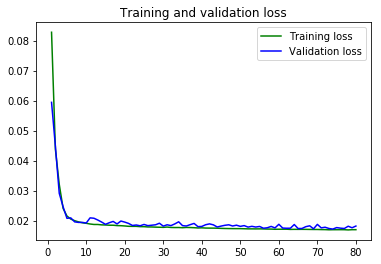

In [27]:
train_loss = []
val_loss = []
train_mape = []
val_mape = []
for h in histories:
    for a_loss in h['loss']:
        train_loss.append(a_loss)
    for a_loss in h['val_loss']:
        val_loss.append(a_loss)
    for a_mape in h['mean_absolute_percentage_error']:
        train_mape.append(a_mape)
    for a_mape in h['val_mean_absolute_percentage_error']:
        val_mape.append(a_mape)
epochs = range(1, len(train_loss) + 1)
plt.figure(figsize=(16, 6))
plt.subplot(121)
plt.plot(epochs, train_loss, 'g', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Base 1x16 GRU Model\nTraining and Validation Loss')
plt.legend()
plt.subplot(122)
plt.plot(epochs, train_mape, 'g', label='Training Mape')
plt.plot(epochs, val_mape, 'b', label='Validation Mape')
plt.title('Base 1x16 GRU Dense Model\nTraining and Validation MAPE')
plt.legend()
plt.show()

In [ ]:
print('Train min loss = %f\nValidation min loss = %f\nValidation min epoch = %d' %
      (min(train_loss),
       min(val_loss),
       val_loss.index(min(val_loss))))

In [28]:
print('Train MAE = %f\nValidation MAE = %f' % ((min(train_loss) * (as5_train_split_df['PWM_30min_avg'].max() - as5_train_split_df['PWM_30min_avg'].min())),
                                               (min(val_loss[-10:]) * (as5_train_split_df['PWM_30min_avg'].max() - as5_train_split_df['PWM_30min_avg'].min()))))

Train MAE = 1.798980
Validation MAE = 1.828736


In [ ]:
# Load best model
best_model = load_model(os.path.join('models', 'base1-1x16gru.best.h5'))
best_model.summary()

In [29]:
gen_pred = mu.DataGenerator(as5_train_data,
                            lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_data) - 1,
                            batch_size=batch_size, step=step)
as5_train_preds = best_model.predict_generator(gen_pred, workers=3, use_multiprocessing=False)
as5_train_preds.shape

(18304, 1)

In [ ]:
as5_train_preds1 = np.concatenate([as5_train_preds, np.zeros((as5_train_preds.shape[0], 1))], axis=1)
as5_train_preds1.shape

In [ ]:
as5_train_preds1 = my_pipeline.inverse_transform(as5_train_preds1)
as5_train_preds1

In [ ]:
as5_train_preds_withnan = np.full((as5_train_data.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_train_data)):
    if as5_train_data[i, 0] > -1:
        as5_train_preds_withnan[i] = as5_train_preds1[j, 0]
        j += 1
as5_train_preds_withnan.shape

In [30]:
gen_val_pred = mu.DataGenerator(as5_val_data,
                                lookback=lookback, delay=delay, min_index=0, max_index=len(as5_val_data) - 1,
                                batch_size=batch_size, step=step)
as5_val_preds = best_model.predict_generator(gen_val_pred, workers=3, use_multiprocessing=False)
as5_val_preds.shape

(20000, 1)

In [ ]:
as5_val_preds1 = np.concatenate([as5_val_preds, np.zeros((as5_val_preds.shape[0], 1))], axis=1)
as5_val_preds1 = my_pipeline.inverse_transform(as5_val_preds1)
as5_val_preds_withnan = np.full((as5_val_data.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_val_data)):
    if as5_val_data[i, 0] > -1:
        as5_val_preds_withnan[i] = as5_val_preds1[j, 0]
        j += 1
as5_val_preds_withnan.shape

In [ ]:
plt.figure(figsize=(25, 5))
plt.plot(as5_train_df['PWM_30min_avg'])
plt.plot(as5_train_df.index[:20000], as5_train_preds_withnan.flatten(), color='brown', alpha=.5, label='train rnn')
plt.plot(as5_train_df.index[20000:], as5_val_preds_withnan.flatten(), color='tan', alpha=.5, label='val rnn')
plt.title('PWM Data vs Predictions')
plt.legend()

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(221)
plt.plot(as5_train_df.iloc[1000:1500, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[1000:1500], as5_train_preds_withnan[1000:1500, :].flatten(), color='brown', alpha=.5, label='rnn')
plt.title('Train PWM Data vs Predictions')
plt.legend()
plt.subplot(222)
plt.plot(as5_train_df.iloc[1240:1300, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[1240:1300], as5_train_preds_withnan[1240:1300].flatten(), color='brown', alpha=.5, label='rnn')
plt.plot(as5_train_df.index[1241:1301], as5_train_df.iloc[1240:1300, as5_train_df.columns.get_loc('PWM_30min_avg')].values, color='black', alpha=.5, label='locf', linestyle=':')  ## locf is data with lag -1 
plt.title('Train PWM Data vs Predictions')
plt.legend()
plt.subplot(223)
plt.plot(as5_train_df.iloc[20000:20500, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[20000:20500], as5_val_preds_withnan[:500, :].flatten(), color='brown', alpha=.5, label='rnn')
plt.title('Validation PWM Data vs Predictions')
plt.legend()
plt.subplot(224)
plt.plot(as5_train_df.iloc[20390:20450, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[20390:20450], as5_val_preds_withnan[390:450].flatten(), color='brown', alpha=.5, label='rnn')
plt.plot(as5_train_df.index[20391:20451], as5_train_df.iloc[20390:20450, as5_train_df.columns.get_loc('PWM_30min_avg')].values, color='black', alpha=.5, label='locf', linestyle=':')  ## locf is data with lag -1
plt.title('Validation PWM Data vs Predictions')
plt.legend()

In [ ]:
model.save('base1-1x16gru.h5')

In [35]:
with open('base1-1x16gru-histories.pkl', 'wb') as outfile:
    pickle.dump(histories, outfile)

## Base RNN Model with Mask

In [ ]:
from numpy.random import seed
seed(123)
from tensorflow import set_random_seed
set_random_seed(456)

In [ ]:
gen_train = mu.DataGenerator(as5_train_data,
                             lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_data) - 1,
                             batch_size=batch_size, step=step)
gen_val = mu.DataGenerator(as5_val_data,
                           lookback=lookback, delay=delay, min_index=0, max_index=len(as5_val_data) - 1,
                           batch_size=batch_size, step=step)
print('train batches = %d\ntest batches = %d' % (gen_train.__len__(), gen_val.__len__()))

In [24]:
model = Sequential()
model.add(layers.Masking(mask_value=-1, input_shape=(None, as5_train_data.shape[-1])))
model.add(layers.CUDNNGRU(16))
model.add(layers.Dense(1))
model.compile(optimizer=RMSprop(), loss='mae', metrics=['mape'])

In [ ]:
callbacks_list = [
    ModelCheckpoint(
        filepath='base1-mask-1x16gru.best.h5',
        monitor='val_loss',
        save_best_only=True
    ),
    TensorBoard(
        log_dir='tsb_log'
    )
]

In [27]:
t1 = datetime.datetime.now()
history_mask = model.fit_generator(generator=gen_train, epochs=80,
                                   callbacks=callbacks_list,
                                   validation_data=gen_val,
                                   workers=3, use_multiprocessing=False, shuffle=True, verbose=0)
print('\nTraining Duration = %s' % (datetime.datetime.now()-t1))

Epoch 1/80


  1/143 [..............................] - ETA: 22:27 - loss: 0.1063 - mean_absolute_percentage_error: 76.8439

  2/143 [..............................] - ETA: 11:23 - loss: 0.1166 - mean_absolute_percentage_error: 68.7249

  3/143 [..............................] - ETA: 7:39 - loss: 0.1249 - mean_absolute_percentage_error: 61.3087 

  4/143 [..............................] - ETA: 5:47 - loss: 0.1161 - mean_absolute_percentage_error: 53.6170

  5/143 [>.............................] - ETA: 4:40 - loss: 0.1201 - mean_absolute_percentage_error: 50.3812

  6/143 [>.............................] - ETA: 3:56 - loss: 0.1133 - mean_absolute_percentage_error: 46.0637

  7/143 [>.............................] - ETA: 3:23 - loss: 0.1030 - mean_absolute_percentage_error: 42.1339

  8/143 [>.............................] - ETA: 2:59 - loss: 0.0959 - mean_absolute_percentage_error: 39.4792

  9/143 [>.............................] - ETA: 2:41 - loss: 0.0993 - mean_absolute_percentage_error: 38.9460

 10/143 [=>............................] - ETA: 2:26 - loss: 0.0960 - mean_absolute_percentage_error: 37.7132

 11/143 [=>............................] - ETA: 2:14 - loss: 0.0938 - mean_absolute_percentage_error: 37.0155

 12/143 [=>............................] - ETA: 2:03 - loss: 0.0907 - mean_absolute_percentage_error: 37.3882

 13/143 [=>............................] - ETA: 1:55 - loss: 0.0889 - mean_absolute_percentage_error: 36.9240

 14/143 [=>............................] - ETA: 1:47 - loss: 0.0897 - mean_absolute_percentage_error: 36.9525

 15/143 [==>...........................] - ETA: 1:41 - loss: 0.0867 - mean_absolute_percentage_error: 37.4478

 16/143 [==>...........................] - ETA: 1:35 - loss: 0.0842 - mean_absolute_percentage_error: 37.9337

 17/143 [==>...........................] - ETA: 1:30 - loss: 0.0832 - mean_absolute_percentage_error: 37.5427

 18/143 [==>...........................] - ETA: 1:25 - loss: 0.0811 - mean_absolute_percentage_error: 36.4892

 19/143 [==>...........................] - ETA: 1:21 - loss: 0.0808 - mean_absolute_percentage_error: 35.8462

 20/143 [===>..........................] - ETA: 1:17 - loss: 0.0801 - mean_absolute_percentage_error: 36.1154

 21/143 [===>..........................] - ETA: 1:14 - loss: 0.0801 - mean_absolute_percentage_error: 36.2013

 22/143 [===>..........................] - ETA: 1:11 - loss: 0.0778 - mean_absolute_percentage_error: 35.4242

 23/143 [===>..........................] - ETA: 1:08 - loss: 0.0767 - mean_absolute_percentage_error: 34.9595

 24/143 [====>.........................] - ETA: 1:05 - loss: 0.0747 - mean_absolute_percentage_error: 34.6884

 25/143 [====>.........................] - ETA: 1:03 - loss: 0.0748 - mean_absolute_percentage_error: 34.3717

 26/143 [====>.........................] - ETA: 1:01 - loss: 0.0733 - mean_absolute_percentage_error: 33.7772

 27/143 [====>.........................] - ETA: 59s - loss: 0.0721 - mean_absolute_percentage_error: 33.4086 

 28/143 [====>.........................] - ETA: 57s - loss: 0.0709 - mean_absolute_percentage_error: 33.3920

 29/143 [=====>........................] - ETA: 55s - loss: 0.0695 - mean_absolute_percentage_error: 33.7261

 30/143 [=====>........................] - ETA: 53s - loss: 0.0697 - mean_absolute_percentage_error: 33.5663

 31/143 [=====>........................] - ETA: 52s - loss: 0.0696 - mean_absolute_percentage_error: 33.3608

 32/143 [=====>........................] - ETA: 50s - loss: 0.0685 - mean_absolute_percentage_error: 33.0938

 33/143 [=====>........................] - ETA: 49s - loss: 0.0674 - mean_absolute_percentage_error: 32.6521

 34/143 [======>.......................] - ETA: 47s - loss: 0.0670 - mean_absolute_percentage_error: 32.5430

 35/143 [======>.......................] - ETA: 46s - loss: 0.0657 - mean_absolute_percentage_error: 32.1018

 36/143 [======>.......................] - ETA: 45s - loss: 0.0649 - mean_absolute_percentage_error: 31.9259

 37/143 [======>.......................] - ETA: 44s - loss: 0.0648 - mean_absolute_percentage_error: 31.8220

 38/143 [======>.......................] - ETA: 42s - loss: 0.0647 - mean_absolute_percentage_error: 31.6788

 39/143 [=======>......................] - ETA: 41s - loss: 0.0641 - mean_absolute_percentage_error: 31.5590

 40/143 [=======>......................] - ETA: 40s - loss: 0.0630 - mean_absolute_percentage_error: 31.1521

 41/143 [=======>......................] - ETA: 39s - loss: 0.0635 - mean_absolute_percentage_error: 31.0753

 42/143 [=======>......................] - ETA: 38s - loss: 0.0630 - mean_absolute_percentage_error: 30.8441

 43/143 [========>.....................] - ETA: 37s - loss: 0.0627 - mean_absolute_percentage_error: 30.8081

 44/143 [========>.....................] - ETA: 37s - loss: 0.0626 - mean_absolute_percentage_error: 30.7562

 45/143 [========>.....................] - ETA: 36s - loss: 0.0622 - mean_absolute_percentage_error: 30.5629

 46/143 [========>.....................] - ETA: 35s - loss: 0.0616 - mean_absolute_percentage_error: 30.2787

 47/143 [========>.....................] - ETA: 34s - loss: 0.0609 - mean_absolute_percentage_error: 30.0661

 48/143 [=========>....................] - ETA: 33s - loss: 0.0607 - mean_absolute_percentage_error: 30.6727

 49/143 [=========>....................] - ETA: 33s - loss: 0.0601 - mean_absolute_percentage_error: 30.4331

 50/143 [=========>....................] - ETA: 32s - loss: 0.0595 - mean_absolute_percentage_error: 30.3587

 51/143 [=========>....................] - ETA: 31s - loss: 0.0589 - mean_absolute_percentage_error: 30.2646

 52/143 [=========>....................] - ETA: 31s - loss: 0.0584 - mean_absolute_percentage_error: 30.0149

 53/143 [==========>...................] - ETA: 30s - loss: 0.0581 - mean_absolute_percentage_error: 29.9339

 54/143 [==========>...................] - ETA: 29s - loss: 0.0581 - mean_absolute_percentage_error: 29.9308

 55/143 [==========>...................] - ETA: 29s - loss: 0.0579 - mean_absolute_percentage_error: 29.9252

 56/143 [==========>...................] - ETA: 28s - loss: 0.0577 - mean_absolute_percentage_error: 29.8172

 57/143 [==========>...................] - ETA: 28s - loss: 0.0573 - mean_absolute_percentage_error: 30.0495

 58/143 [===========>..................] - ETA: 27s - loss: 0.0569 - mean_absolute_percentage_error: 29.9550

 59/143 [===========>..................] - ETA: 26s - loss: 0.0565 - mean_absolute_percentage_error: 29.9346

 60/143 [===========>..................] - ETA: 26s - loss: 0.0560 - mean_absolute_percentage_error: 29.7200

 61/143 [===========>..................] - ETA: 25s - loss: 0.0556 - mean_absolute_percentage_error: 29.5720

 62/143 [============>.................] - ETA: 25s - loss: 0.0549 - mean_absolute_percentage_error: 29.4599

 63/143 [============>.................] - ETA: 24s - loss: 0.0545 - mean_absolute_percentage_error: 29.2368

 64/143 [============>.................] - ETA: 24s - loss: 0.0541 - mean_absolute_percentage_error: 29.0576

 65/143 [============>.................] - ETA: 23s - loss: 0.0543 - mean_absolute_percentage_error: 28.9969

 66/143 [============>.................] - ETA: 23s - loss: 0.0539 - mean_absolute_percentage_error: 28.8761

 67/143 [=============>................] - ETA: 22s - loss: 0.0541 - mean_absolute_percentage_error: 28.7800

 68/143 [=============>................] - ETA: 22s - loss: 0.0535 - mean_absolute_percentage_error: 28.5806

 69/143 [=============>................] - ETA: 21s - loss: 0.0534 - mean_absolute_percentage_error: 28.5767

 70/143 [=============>................] - ETA: 21s - loss: 0.0531 - mean_absolute_percentage_error: 28.4491

 71/143 [=============>................] - ETA: 21s - loss: 0.0527 - mean_absolute_percentage_error: 28.3218

 72/143 [==============>...............] - ETA: 20s - loss: 0.0523 - mean_absolute_percentage_error: 28.1827

 73/143 [==============>...............] - ETA: 20s - loss: 0.0519 - mean_absolute_percentage_error: 28.0036

 74/143 [==============>...............] - ETA: 19s - loss: 0.0516 - mean_absolute_percentage_error: 27.8987

 75/143 [==============>...............] - ETA: 19s - loss: 0.0513 - mean_absolute_percentage_error: 27.7215

 76/143 [==============>...............] - ETA: 19s - loss: 0.0510 - mean_absolute_percentage_error: 27.6412

 77/143 [===============>..............] - ETA: 18s - loss: 0.0508 - mean_absolute_percentage_error: 27.5930

 78/143 [===============>..............] - ETA: 18s - loss: 0.0504 - mean_absolute_percentage_error: 27.4229

 79/143 [===============>..............] - ETA: 17s - loss: 0.0502 - mean_absolute_percentage_error: 27.2787

 80/143 [===============>..............] - ETA: 17s - loss: 0.0499 - mean_absolute_percentage_error: 27.1619

 81/143 [===============>..............] - ETA: 17s - loss: 0.0497 - mean_absolute_percentage_error: 27.0366

 82/143 [================>.............] - ETA: 16s - loss: 0.0495 - mean_absolute_percentage_error: 26.8875

 83/143 [================>.............] - ETA: 16s - loss: 0.0494 - mean_absolute_percentage_error: 26.7674

 84/143 [================>.............] - ETA: 16s - loss: 0.0493 - mean_absolute_percentage_error: 26.8031

 85/143 [================>.............] - ETA: 15s - loss: 0.0493 - mean_absolute_percentage_error: 26.8328

 86/143 [=================>............] - ETA: 15s - loss: 0.0489 - mean_absolute_percentage_error: 26.7135

 87/143 [=================>............] - ETA: 15s - loss: 0.0485 - mean_absolute_percentage_error: 26.5618

 88/143 [=================>............] - ETA: 14s - loss: 0.0484 - mean_absolute_percentage_error: 26.4426

 89/143 [=================>............] - ETA: 14s - loss: 0.0484 - mean_absolute_percentage_error: 26.3403

 90/143 [=================>............] - ETA: 14s - loss: 0.0483 - mean_absolute_percentage_error: 26.4081

 91/143 [==================>...........] - ETA: 13s - loss: 0.0481 - mean_absolute_percentage_error: 26.2996

 92/143 [==================>...........] - ETA: 13s - loss: 0.0480 - mean_absolute_percentage_error: 26.3525

 93/143 [==================>...........] - ETA: 13s - loss: 0.0480 - mean_absolute_percentage_error: 26.2926

 94/143 [==================>...........] - ETA: 12s - loss: 0.0480 - mean_absolute_percentage_error: 26.2223

 95/143 [==================>...........] - ETA: 12s - loss: 0.0479 - mean_absolute_percentage_error: 26.2235

 96/143 [===================>..........] - ETA: 12s - loss: 0.0477 - mean_absolute_percentage_error: 26.1962

 97/143 [===================>..........] - ETA: 11s - loss: 0.0475 - mean_absolute_percentage_error: 26.1142

 98/143 [===================>..........] - ETA: 11s - loss: 0.0473 - mean_absolute_percentage_error: 26.0535

 99/143 [===================>..........] - ETA: 11s - loss: 0.0473 - mean_absolute_percentage_error: 25.9736

100/143 [===================>..........] - ETA: 10s - loss: 0.0472 - mean_absolute_percentage_error: 25.9358

101/143 [====================>.........] - ETA: 10s - loss: 0.0471 - mean_absolute_percentage_error: 25.8524

102/143 [====================>.........] - ETA: 10s - loss: 0.0468 - mean_absolute_percentage_error: 25.7449

103/143 [====================>.........] - ETA: 10s - loss: 0.0468 - mean_absolute_percentage_error: 25.6588

104/143 [====================>.........] - ETA: 9s - loss: 0.0466 - mean_absolute_percentage_error: 25.5532 

105/143 [=====================>........] - ETA: 9s - loss: 0.0466 - mean_absolute_percentage_error: 25.6724

106/143 [=====================>........] - ETA: 9s - loss: 0.0463 - mean_absolute_percentage_error: 25.5893

107/143 [=====================>........] - ETA: 8s - loss: 0.0461 - mean_absolute_percentage_error: 25.4948

108/143 [=====================>........] - ETA: 8s - loss: 0.0460 - mean_absolute_percentage_error: 25.4603

109/143 [=====================>........] - ETA: 8s - loss: 0.0459 - mean_absolute_percentage_error: 25.3918

110/143 [======================>.......] - ETA: 8s - loss: 0.0458 - mean_absolute_percentage_error: 25.3979

111/143 [======================>.......] - ETA: 7s - loss: 0.0458 - mean_absolute_percentage_error: 25.3612

112/143 [======================>.......] - ETA: 7s - loss: 0.0456 - mean_absolute_percentage_error: 25.3258

113/143 [======================>.......] - ETA: 7s - loss: 0.0456 - mean_absolute_percentage_error: 25.2804

114/143 [======================>.......] - ETA: 7s - loss: 0.0453 - mean_absolute_percentage_error: 25.1962

115/143 [=======================>......] - ETA: 6s - loss: 0.0452 - mean_absolute_percentage_error: 25.1270

116/143 [=======================>......] - ETA: 6s - loss: 0.0452 - mean_absolute_percentage_error: 25.1348

117/143 [=======================>......] - ETA: 6s - loss: 0.0452 - mean_absolute_percentage_error: 25.0929

118/143 [=======================>......] - ETA: 6s - loss: 0.0450 - mean_absolute_percentage_error: 24.9932

119/143 [=======================>......] - ETA: 5s - loss: 0.0450 - mean_absolute_percentage_error: 25.0080

120/143 [========================>.....] - ETA: 5s - loss: 0.0448 - mean_absolute_percentage_error: 24.9474

121/143 [========================>.....] - ETA: 5s - loss: 0.0446 - mean_absolute_percentage_error: 24.9176

122/143 [========================>.....] - ETA: 4s - loss: 0.0445 - mean_absolute_percentage_error: 24.8708

123/143 [========================>.....] - ETA: 4s - loss: 0.0443 - mean_absolute_percentage_error: 24.8031

124/143 [=========================>....] - ETA: 4s - loss: 0.0441 - mean_absolute_percentage_error: 24.7265

125/143 [=========================>....] - ETA: 4s - loss: 0.0439 - mean_absolute_percentage_error: 24.7255

126/143 [=========================>....] - ETA: 4s - loss: 0.0438 - mean_absolute_percentage_error: 24.6634

127/143 [=========================>....] - ETA: 3s - loss: 0.0438 - mean_absolute_percentage_error: 24.6177

128/143 [=========================>....] - ETA: 3s - loss: 0.0437 - mean_absolute_percentage_error: 24.5875

129/143 [==========================>...] - ETA: 3s - loss: 0.0436 - mean_absolute_percentage_error: 24.5520

130/143 [==========================>...] - ETA: 3s - loss: 0.0436 - mean_absolute_percentage_error: 24.4956

131/143 [==========================>...] - ETA: 2s - loss: 0.0435 - mean_absolute_percentage_error: 24.4351

132/143 [==========================>...] - ETA: 2s - loss: 0.0435 - mean_absolute_percentage_error: 24.3951

133/143 [==========================>...] - ETA: 2s - loss: 0.0434 - mean_absolute_percentage_error: 24.3473

134/143 [===========================>..] - ETA: 2s - loss: 0.0433 - mean_absolute_percentage_error: 24.2763

135/143 [===========================>..] - ETA: 1s - loss: 0.0432 - mean_absolute_percentage_error: 24.1972

136/143 [===========================>..] - ETA: 1s - loss: 0.0430 - mean_absolute_percentage_error: 24.1217

137/143 [===========================>..] - ETA: 1s - loss: 0.0430 - mean_absolute_percentage_error: 24.0749

138/143 [===========================>..] - ETA: 1s - loss: 0.0429 - mean_absolute_percentage_error: 24.0103

139/143 [============================>.] - ETA: 0s - loss: 0.0429 - mean_absolute_percentage_error: 24.0363

140/143 [============================>.] - ETA: 0s - loss: 0.0428 - mean_absolute_percentage_error: 23.9927

141/143 [============================>.] - ETA: 0s - loss: 0.0427 - mean_absolute_percentage_error: 23.9368

142/143 [============================>.] - ETA: 0s - loss: 0.0428 - mean_absolute_percentage_error: 23.8840

143/143 [==============================] - 37s 257ms/step - loss: 0.0427 - mean_absolute_percentage_error: 23.8266 - val_loss: 0.0320 - val_mean_absolute_percentage_error: 14.8856


Epoch 2/80
  1/143 [..............................] - ETA: 24s - loss: 0.0358 - mean_absolute_percentage_error: 17.2601

  2/143 [..............................] - ETA: 24s - loss: 0.0281 - mean_absolute_percentage_error: 15.7809

  3/143 [..............................] - ETA: 23s - loss: 0.0279 - mean_absolute_percentage_error: 16.4275

  4/143 [..............................] - ETA: 23s - loss: 0.0273 - mean_absolute_percentage_error: 15.9612

  5/143 [>.............................] - ETA: 23s - loss: 0.0278 - mean_absolute_percentage_error: 16.3040

  6/143 [>.............................] - ETA: 22s - loss: 0.0289 - mean_absolute_percentage_error: 16.3297

  7/143 [>.............................] - ETA: 22s - loss: 0.0277 - mean_absolute_percentage_error: 16.4538

  8/143 [>.............................] - ETA: 22s - loss: 0.0291 - mean_absolute_percentage_error: 16.4355

  9/143 [>.............................] - ETA: 22s - loss: 0.0282 - mean_absolute_percentage_error: 16.8427

 10/143 [=>............................] - ETA: 22s - loss: 0.0280 - mean_absolute_percentage_error: 16.5914

 11/143 [=>............................] - ETA: 22s - loss: 0.0281 - mean_absolute_percentage_error: 16.7857

 12/143 [=>............................] - ETA: 22s - loss: 0.0284 - mean_absolute_percentage_error: 17.0360

 13/143 [=>............................] - ETA: 22s - loss: 0.0278 - mean_absolute_percentage_error: 17.1243

 14/143 [=>............................] - ETA: 22s - loss: 0.0272 - mean_absolute_percentage_error: 17.5256

 15/143 [==>...........................] - ETA: 21s - loss: 0.0267 - mean_absolute_percentage_error: 17.3199

 16/143 [==>...........................] - ETA: 21s - loss: 0.0267 - mean_absolute_percentage_error: 17.4428

 17/143 [==>...........................] - ETA: 21s - loss: 0.0266 - mean_absolute_percentage_error: 17.2015

 18/143 [==>...........................] - ETA: 21s - loss: 0.0272 - mean_absolute_percentage_error: 17.0815

 19/143 [==>...........................] - ETA: 20s - loss: 0.0273 - mean_absolute_percentage_error: 16.9115

 20/143 [===>..........................] - ETA: 20s - loss: 0.0274 - mean_absolute_percentage_error: 16.7994

 21/143 [===>..........................] - ETA: 20s - loss: 0.0270 - mean_absolute_percentage_error: 16.6860

 22/143 [===>..........................] - ETA: 20s - loss: 0.0265 - mean_absolute_percentage_error: 16.5624

 23/143 [===>..........................] - ETA: 20s - loss: 0.0261 - mean_absolute_percentage_error: 16.7744

 24/143 [====>.........................] - ETA: 20s - loss: 0.0259 - mean_absolute_percentage_error: 16.6539

 25/143 [====>.........................] - ETA: 20s - loss: 0.0259 - mean_absolute_percentage_error: 17.6174

 26/143 [====>.........................] - ETA: 21s - loss: 0.0260 - mean_absolute_percentage_error: 17.4795

 27/143 [====>.........................] - ETA: 22s - loss: 0.0260 - mean_absolute_percentage_error: 17.3990

 28/143 [====>.........................] - ETA: 21s - loss: 0.0263 - mean_absolute_percentage_error: 17.2726

 29/143 [=====>........................] - ETA: 21s - loss: 0.0264 - mean_absolute_percentage_error: 17.4303

 30/143 [=====>........................] - ETA: 21s - loss: 0.0267 - mean_absolute_percentage_error: 17.3848

 31/143 [=====>........................] - ETA: 21s - loss: 0.0265 - mean_absolute_percentage_error: 17.2779

 32/143 [=====>........................] - ETA: 21s - loss: 0.0265 - mean_absolute_percentage_error: 17.2032

 33/143 [=====>........................] - ETA: 20s - loss: 0.0264 - mean_absolute_percentage_error: 17.1143

 34/143 [======>.......................] - ETA: 20s - loss: 0.0261 - mean_absolute_percentage_error: 17.0573

 35/143 [======>.......................] - ETA: 20s - loss: 0.0261 - mean_absolute_percentage_error: 16.9479

 36/143 [======>.......................] - ETA: 20s - loss: 0.0261 - mean_absolute_percentage_error: 17.0533

 37/143 [======>.......................] - ETA: 20s - loss: 0.0264 - mean_absolute_percentage_error: 16.9725

 38/143 [======>.......................] - ETA: 19s - loss: 0.0264 - mean_absolute_percentage_error: 17.0340

 39/143 [=======>......................] - ETA: 19s - loss: 0.0264 - mean_absolute_percentage_error: 16.9601

 40/143 [=======>......................] - ETA: 19s - loss: 0.0265 - mean_absolute_percentage_error: 16.8827

 41/143 [=======>......................] - ETA: 19s - loss: 0.0264 - mean_absolute_percentage_error: 16.8202

 42/143 [=======>......................] - ETA: 18s - loss: 0.0265 - mean_absolute_percentage_error: 16.8086

 43/143 [========>.....................] - ETA: 18s - loss: 0.0263 - mean_absolute_percentage_error: 16.7507

 44/143 [========>.....................] - ETA: 18s - loss: 0.0263 - mean_absolute_percentage_error: 16.6665

 45/143 [========>.....................] - ETA: 18s - loss: 0.0263 - mean_absolute_percentage_error: 16.6368

 46/143 [========>.....................] - ETA: 18s - loss: 0.0261 - mean_absolute_percentage_error: 16.6607

 47/143 [========>.....................] - ETA: 17s - loss: 0.0263 - mean_absolute_percentage_error: 16.6485

 48/143 [=========>....................] - ETA: 17s - loss: 0.0264 - mean_absolute_percentage_error: 16.6099

 49/143 [=========>....................] - ETA: 17s - loss: 0.0267 - mean_absolute_percentage_error: 16.5821

 50/143 [=========>....................] - ETA: 17s - loss: 0.0270 - mean_absolute_percentage_error: 16.8086

 51/143 [=========>....................] - ETA: 17s - loss: 0.0268 - mean_absolute_percentage_error: 16.7830

 52/143 [=========>....................] - ETA: 16s - loss: 0.0267 - mean_absolute_percentage_error: 16.8400

 53/143 [==========>...................] - ETA: 16s - loss: 0.0268 - mean_absolute_percentage_error: 16.9023

 54/143 [==========>...................] - ETA: 16s - loss: 0.0268 - mean_absolute_percentage_error: 16.7961

 55/143 [==========>...................] - ETA: 16s - loss: 0.0270 - mean_absolute_percentage_error: 16.7224

 56/143 [==========>...................] - ETA: 15s - loss: 0.0268 - mean_absolute_percentage_error: 16.8267

 57/143 [==========>...................] - ETA: 15s - loss: 0.0267 - mean_absolute_percentage_error: 16.7431

 58/143 [===========>..................] - ETA: 15s - loss: 0.0266 - mean_absolute_percentage_error: 16.6466

 59/143 [===========>..................] - ETA: 15s - loss: 0.0266 - mean_absolute_percentage_error: 16.6024

 60/143 [===========>..................] - ETA: 15s - loss: 0.0265 - mean_absolute_percentage_error: 16.6039

 61/143 [===========>..................] - ETA: 14s - loss: 0.0267 - mean_absolute_percentage_error: 16.5532

 62/143 [============>.................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.6419

 63/143 [============>.................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.5705

 64/143 [============>.................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.5758

 65/143 [============>.................] - ETA: 14s - loss: 0.0265 - mean_absolute_percentage_error: 16.5581

 66/143 [============>.................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.5371

 67/143 [=============>................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.5552

 68/143 [=============>................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.5110

 69/143 [=============>................] - ETA: 14s - loss: 0.0266 - mean_absolute_percentage_error: 16.4600

 70/143 [=============>................] - ETA: 14s - loss: 0.0265 - mean_absolute_percentage_error: 16.3940

 71/143 [=============>................] - ETA: 14s - loss: 0.0264 - mean_absolute_percentage_error: 16.3431

 72/143 [==============>...............] - ETA: 14s - loss: 0.0264 - mean_absolute_percentage_error: 16.2868

 73/143 [==============>...............] - ETA: 14s - loss: 0.0263 - mean_absolute_percentage_error: 16.2551

 74/143 [==============>...............] - ETA: 13s - loss: 0.0263 - mean_absolute_percentage_error: 16.1802

 75/143 [==============>...............] - ETA: 13s - loss: 0.0264 - mean_absolute_percentage_error: 16.3385

 76/143 [==============>...............] - ETA: 13s - loss: 0.0261 - mean_absolute_percentage_error: 16.2390

 77/143 [===============>..............] - ETA: 13s - loss: 0.0262 - mean_absolute_percentage_error: 16.2004

 78/143 [===============>..............] - ETA: 13s - loss: 0.0263 - mean_absolute_percentage_error: 16.1835

 79/143 [===============>..............] - ETA: 12s - loss: 0.0262 - mean_absolute_percentage_error: 16.2461

 80/143 [===============>..............] - ETA: 12s - loss: 0.0261 - mean_absolute_percentage_error: 16.1778

 81/143 [===============>..............] - ETA: 12s - loss: 0.0260 - mean_absolute_percentage_error: 16.1419

 82/143 [================>.............] - ETA: 12s - loss: 0.0261 - mean_absolute_percentage_error: 16.1193

 83/143 [================>.............] - ETA: 12s - loss: 0.0261 - mean_absolute_percentage_error: 16.1905

 84/143 [================>.............] - ETA: 11s - loss: 0.0260 - mean_absolute_percentage_error: 16.1830

 85/143 [================>.............] - ETA: 11s - loss: 0.0258 - mean_absolute_percentage_error: 16.1668

 86/143 [=================>............] - ETA: 11s - loss: 0.0257 - mean_absolute_percentage_error: 16.1172

 87/143 [=================>............] - ETA: 11s - loss: 0.0256 - mean_absolute_percentage_error: 16.1162

 88/143 [=================>............] - ETA: 11s - loss: 0.0257 - mean_absolute_percentage_error: 16.1034

 89/143 [=================>............] - ETA: 11s - loss: 0.0257 - mean_absolute_percentage_error: 16.0937

 90/143 [=================>............] - ETA: 10s - loss: 0.0257 - mean_absolute_percentage_error: 16.0668

 91/143 [==================>...........] - ETA: 10s - loss: 0.0257 - mean_absolute_percentage_error: 16.0476

 92/143 [==================>...........] - ETA: 10s - loss: 0.0257 - mean_absolute_percentage_error: 16.0168

 93/143 [==================>...........] - ETA: 10s - loss: 0.0257 - mean_absolute_percentage_error: 15.9955

 94/143 [==================>...........] - ETA: 9s - loss: 0.0257 - mean_absolute_percentage_error: 15.9426 

 95/143 [==================>...........] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 15.9162

 96/143 [===================>..........] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 15.8948

 97/143 [===================>..........] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 15.8613

 98/143 [===================>..........] - ETA: 9s - loss: 0.0256 - mean_absolute_percentage_error: 15.8298

 99/143 [===================>..........] - ETA: 8s - loss: 0.0256 - mean_absolute_percentage_error: 15.7805

100/143 [===================>..........] - ETA: 8s - loss: 0.0255 - mean_absolute_percentage_error: 15.7618

101/143 [====================>.........] - ETA: 8s - loss: 0.0256 - mean_absolute_percentage_error: 15.7597

102/143 [====================>.........] - ETA: 8s - loss: 0.0256 - mean_absolute_percentage_error: 15.7357

103/143 [====================>.........] - ETA: 8s - loss: 0.0256 - mean_absolute_percentage_error: 15.7268

104/143 [====================>.........] - ETA: 7s - loss: 0.0257 - mean_absolute_percentage_error: 15.7319

105/143 [=====================>........] - ETA: 7s - loss: 0.0257 - mean_absolute_percentage_error: 15.7323

106/143 [=====================>........] - ETA: 7s - loss: 0.0257 - mean_absolute_percentage_error: 15.7098

107/143 [=====================>........] - ETA: 7s - loss: 0.0256 - mean_absolute_percentage_error: 15.7208

108/143 [=====================>........] - ETA: 7s - loss: 0.0256 - mean_absolute_percentage_error: 15.6696

109/143 [=====================>........] - ETA: 6s - loss: 0.0254 - mean_absolute_percentage_error: 15.7112

110/143 [======================>.......] - ETA: 6s - loss: 0.0253 - mean_absolute_percentage_error: 15.6971

111/143 [======================>.......] - ETA: 6s - loss: 0.0253 - mean_absolute_percentage_error: 15.6740

112/143 [======================>.......] - ETA: 6s - loss: 0.0253 - mean_absolute_percentage_error: 15.6483

113/143 [======================>.......] - ETA: 5s - loss: 0.0253 - mean_absolute_percentage_error: 15.7029

114/143 [======================>.......] - ETA: 5s - loss: 0.0253 - mean_absolute_percentage_error: 15.6576

115/143 [=======================>......] - ETA: 5s - loss: 0.0253 - mean_absolute_percentage_error: 15.6681

116/143 [=======================>......] - ETA: 5s - loss: 0.0252 - mean_absolute_percentage_error: 15.6627

117/143 [=======================>......] - ETA: 5s - loss: 0.0252 - mean_absolute_percentage_error: 15.6611

118/143 [=======================>......] - ETA: 4s - loss: 0.0251 - mean_absolute_percentage_error: 15.6265

119/143 [=======================>......] - ETA: 4s - loss: 0.0252 - mean_absolute_percentage_error: 15.6105

120/143 [========================>.....] - ETA: 4s - loss: 0.0252 - mean_absolute_percentage_error: 15.6462

121/143 [========================>.....] - ETA: 4s - loss: 0.0251 - mean_absolute_percentage_error: 15.6123

122/143 [========================>.....] - ETA: 4s - loss: 0.0251 - mean_absolute_percentage_error: 15.5865

123/143 [========================>.....] - ETA: 3s - loss: 0.0250 - mean_absolute_percentage_error: 15.5573

124/143 [=========================>....] - ETA: 3s - loss: 0.0250 - mean_absolute_percentage_error: 15.5217

125/143 [=========================>....] - ETA: 3s - loss: 0.0250 - mean_absolute_percentage_error: 15.5054

126/143 [=========================>....] - ETA: 3s - loss: 0.0249 - mean_absolute_percentage_error: 15.4733

127/143 [=========================>....] - ETA: 3s - loss: 0.0248 - mean_absolute_percentage_error: 15.4388

128/143 [=========================>....] - ETA: 2s - loss: 0.0248 - mean_absolute_percentage_error: 15.4348

129/143 [==========================>...] - ETA: 2s - loss: 0.0249 - mean_absolute_percentage_error: 15.4233

130/143 [==========================>...] - ETA: 2s - loss: 0.0249 - mean_absolute_percentage_error: 15.4144

131/143 [==========================>...] - ETA: 2s - loss: 0.0249 - mean_absolute_percentage_error: 15.4267

132/143 [==========================>...] - ETA: 2s - loss: 0.0249 - mean_absolute_percentage_error: 15.4155

133/143 [==========================>...] - ETA: 1s - loss: 0.0248 - mean_absolute_percentage_error: 15.3984

134/143 [===========================>..] - ETA: 1s - loss: 0.0247 - mean_absolute_percentage_error: 15.3951

135/143 [===========================>..] - ETA: 1s - loss: 0.0248 - mean_absolute_percentage_error: 15.3765

136/143 [===========================>..] - ETA: 1s - loss: 0.0248 - mean_absolute_percentage_error: 15.3697

137/143 [===========================>..] - ETA: 1s - loss: 0.0248 - mean_absolute_percentage_error: 15.3365

138/143 [===========================>..] - ETA: 0s - loss: 0.0248 - mean_absolute_percentage_error: 15.3302

139/143 [============================>.] - ETA: 0s - loss: 0.0247 - mean_absolute_percentage_error: 15.3981

140/143 [============================>.] - ETA: 0s - loss: 0.0247 - mean_absolute_percentage_error: 15.3973

141/143 [============================>.] - ETA: 0s - loss: 0.0247 - mean_absolute_percentage_error: 15.3887

142/143 [============================>.] - ETA: 0s - loss: 0.0247 - mean_absolute_percentage_error: 15.3647

143/143 [==============================] - 32s 223ms/step - loss: 0.0246 - mean_absolute_percentage_error: 15.3249 - val_loss: 0.0232 - val_mean_absolute_percentage_error: 11.7889


Epoch 3/80


  1/143 [..............................] - ETA: 28s - loss: 0.0162 - mean_absolute_percentage_error: 19.0120

  2/143 [..............................] - ETA: 26s - loss: 0.0199 - mean_absolute_percentage_error: 16.3521

  3/143 [..............................] - ETA: 25s - loss: 0.0237 - mean_absolute_percentage_error: 14.5284

  4/143 [..............................] - ETA: 24s - loss: 0.0243 - mean_absolute_percentage_error: 15.6789

  5/143 [>.............................] - ETA: 23s - loss: 0.0238 - mean_absolute_percentage_error: 14.8913

  6/143 [>.............................] - ETA: 23s - loss: 0.0243 - mean_absolute_percentage_error: 14.3916

  7/143 [>.............................] - ETA: 22s - loss: 0.0234 - mean_absolute_percentage_error: 15.2713

  8/143 [>.............................] - ETA: 22s - loss: 0.0242 - mean_absolute_percentage_error: 14.9571

  9/143 [>.............................] - ETA: 22s - loss: 0.0241 - mean_absolute_percentage_error: 14.6119

 10/143 [=>............................] - ETA: 22s - loss: 0.0233 - mean_absolute_percentage_error: 14.2815

 11/143 [=>............................] - ETA: 22s - loss: 0.0222 - mean_absolute_percentage_error: 14.0714

 12/143 [=>............................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 13.9378

 13/143 [=>............................] - ETA: 21s - loss: 0.0223 - mean_absolute_percentage_error: 13.8381

 14/143 [=>............................] - ETA: 21s - loss: 0.0224 - mean_absolute_percentage_error: 13.6950

 15/143 [==>...........................] - ETA: 21s - loss: 0.0221 - mean_absolute_percentage_error: 13.7137

 16/143 [==>...........................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 13.5640

 17/143 [==>...........................] - ETA: 20s - loss: 0.0217 - mean_absolute_percentage_error: 13.3390

 18/143 [==>...........................] - ETA: 20s - loss: 0.0220 - mean_absolute_percentage_error: 13.2956

 19/143 [==>...........................] - ETA: 20s - loss: 0.0223 - mean_absolute_percentage_error: 13.3502

 20/143 [===>..........................] - ETA: 20s - loss: 0.0226 - mean_absolute_percentage_error: 13.3599

 21/143 [===>..........................] - ETA: 20s - loss: 0.0228 - mean_absolute_percentage_error: 13.2966

 22/143 [===>..........................] - ETA: 20s - loss: 0.0229 - mean_absolute_percentage_error: 13.2063

 23/143 [===>..........................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 13.1890

 24/143 [====>.........................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 13.2963

 25/143 [====>.........................] - ETA: 19s - loss: 0.0227 - mean_absolute_percentage_error: 13.2862

 26/143 [====>.........................] - ETA: 19s - loss: 0.0225 - mean_absolute_percentage_error: 13.3287

 27/143 [====>.........................] - ETA: 19s - loss: 0.0223 - mean_absolute_percentage_error: 13.3924

 28/143 [====>.........................] - ETA: 18s - loss: 0.0221 - mean_absolute_percentage_error: 13.2548

 29/143 [=====>........................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.1643

 30/143 [=====>........................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.1404

 31/143 [=====>........................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.2055

 32/143 [=====>........................] - ETA: 18s - loss: 0.0220 - mean_absolute_percentage_error: 13.3327

 33/143 [=====>........................] - ETA: 18s - loss: 0.0222 - mean_absolute_percentage_error: 13.3877

 34/143 [======>.......................] - ETA: 17s - loss: 0.0224 - mean_absolute_percentage_error: 13.6240

 35/143 [======>.......................] - ETA: 17s - loss: 0.0221 - mean_absolute_percentage_error: 13.6193

 36/143 [======>.......................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.6360

 37/143 [======>.......................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.5385

 38/143 [======>.......................] - ETA: 17s - loss: 0.0219 - mean_absolute_percentage_error: 13.5022

 39/143 [=======>......................] - ETA: 17s - loss: 0.0220 - mean_absolute_percentage_error: 13.4116

 40/143 [=======>......................] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.7140

 41/143 [=======>......................] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.7480

 42/143 [=======>......................] - ETA: 16s - loss: 0.0220 - mean_absolute_percentage_error: 13.7034

 43/143 [========>.....................] - ETA: 16s - loss: 0.0217 - mean_absolute_percentage_error: 13.6430

 44/143 [========>.....................] - ETA: 16s - loss: 0.0218 - mean_absolute_percentage_error: 13.5899

 45/143 [========>.....................] - ETA: 16s - loss: 0.0219 - mean_absolute_percentage_error: 13.5578

 46/143 [========>.....................] - ETA: 15s - loss: 0.0218 - mean_absolute_percentage_error: 13.4990

 47/143 [========>.....................] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.4366

 48/143 [=========>....................] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.4024

 49/143 [=========>....................] - ETA: 15s - loss: 0.0216 - mean_absolute_percentage_error: 13.3647

 50/143 [=========>....................] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.4131

 51/143 [=========>....................] - ETA: 15s - loss: 0.0217 - mean_absolute_percentage_error: 13.3587

 52/143 [=========>....................] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.3789

 53/143 [==========>...................] - ETA: 14s - loss: 0.0216 - mean_absolute_percentage_error: 13.3110

 54/143 [==========>...................] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.2656

 55/143 [==========>...................] - ETA: 14s - loss: 0.0218 - mean_absolute_percentage_error: 13.2711

 56/143 [==========>...................] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.2734

 57/143 [==========>...................] - ETA: 14s - loss: 0.0217 - mean_absolute_percentage_error: 13.2587

 58/143 [===========>..................] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3310

 59/143 [===========>..................] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3922

 60/143 [===========>..................] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3562

 61/143 [===========>..................] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3964

 62/143 [============>.................] - ETA: 13s - loss: 0.0217 - mean_absolute_percentage_error: 13.3510

 63/143 [============>.................] - ETA: 13s - loss: 0.0218 - mean_absolute_percentage_error: 13.4080

 64/143 [============>.................] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3818

 65/143 [============>.................] - ETA: 12s - loss: 0.0218 - mean_absolute_percentage_error: 13.4237

 66/143 [============>.................] - ETA: 12s - loss: 0.0218 - mean_absolute_percentage_error: 13.3836

 67/143 [=============>................] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3730

 68/143 [=============>................] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3448

 69/143 [=============>................] - ETA: 12s - loss: 0.0219 - mean_absolute_percentage_error: 13.3712

 70/143 [=============>................] - ETA: 11s - loss: 0.0218 - mean_absolute_percentage_error: 13.3420

 71/143 [=============>................] - ETA: 11s - loss: 0.0218 - mean_absolute_percentage_error: 13.3633

 72/143 [==============>...............] - ETA: 11s - loss: 0.0218 - mean_absolute_percentage_error: 13.3245

 73/143 [==============>...............] - ETA: 11s - loss: 0.0218 - mean_absolute_percentage_error: 13.3259

 74/143 [==============>...............] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.3350

 75/143 [==============>...............] - ETA: 11s - loss: 0.0220 - mean_absolute_percentage_error: 13.3243

 76/143 [==============>...............] - ETA: 11s - loss: 0.0219 - mean_absolute_percentage_error: 13.3223

 77/143 [===============>..............] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.3442

 78/143 [===============>..............] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.3260

 79/143 [===============>..............] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.3091

 80/143 [===============>..............] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.3065

 81/143 [===============>..............] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.5153

 82/143 [================>.............] - ETA: 10s - loss: 0.0219 - mean_absolute_percentage_error: 13.5081

 83/143 [================>.............] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 13.4530 

 84/143 [================>.............] - ETA: 9s - loss: 0.0218 - mean_absolute_percentage_error: 13.4012

 85/143 [================>.............] - ETA: 9s - loss: 0.0219 - mean_absolute_percentage_error: 13.4160

 86/143 [=================>............] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 13.3688

 87/143 [=================>............] - ETA: 9s - loss: 0.0216 - mean_absolute_percentage_error: 13.3485

 88/143 [=================>............] - ETA: 9s - loss: 0.0217 - mean_absolute_percentage_error: 13.3350

 89/143 [=================>............] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 13.3303

 90/143 [=================>............] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 13.3078

 91/143 [==================>...........] - ETA: 8s - loss: 0.0217 - mean_absolute_percentage_error: 13.2697

 92/143 [==================>...........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 13.2645

 93/143 [==================>...........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 13.2442

 94/143 [==================>...........] - ETA: 8s - loss: 0.0216 - mean_absolute_percentage_error: 13.2559

 95/143 [==================>...........] - ETA: 7s - loss: 0.0217 - mean_absolute_percentage_error: 13.3749

 96/143 [===================>..........] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 13.3353

 97/143 [===================>..........] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 13.3181

 98/143 [===================>..........] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 13.3189

 99/143 [===================>..........] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 13.3295

100/143 [===================>..........] - ETA: 7s - loss: 0.0216 - mean_absolute_percentage_error: 13.3120

101/143 [====================>.........] - ETA: 6s - loss: 0.0215 - mean_absolute_percentage_error: 13.3072

102/143 [====================>.........] - ETA: 6s - loss: 0.0214 - mean_absolute_percentage_error: 13.2801

103/143 [====================>.........] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 13.2890

104/143 [====================>.........] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 13.2546

105/143 [=====================>........] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 13.2537

106/143 [=====================>........] - ETA: 6s - loss: 0.0213 - mean_absolute_percentage_error: 13.2474

107/143 [=====================>........] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 13.2530

108/143 [=====================>........] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 13.2482

109/143 [=====================>........] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 13.2191

110/143 [======================>.......] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 13.2997

111/143 [======================>.......] - ETA: 5s - loss: 0.0214 - mean_absolute_percentage_error: 13.2695

112/143 [======================>.......] - ETA: 5s - loss: 0.0213 - mean_absolute_percentage_error: 13.3271

113/143 [======================>.......] - ETA: 4s - loss: 0.0213 - mean_absolute_percentage_error: 13.3063

114/143 [======================>.......] - ETA: 4s - loss: 0.0213 - mean_absolute_percentage_error: 13.3137

115/143 [=======================>......] - ETA: 4s - loss: 0.0213 - mean_absolute_percentage_error: 13.2845

116/143 [=======================>......] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 13.2991

117/143 [=======================>......] - ETA: 4s - loss: 0.0212 - mean_absolute_percentage_error: 13.3072

118/143 [=======================>......] - ETA: 4s - loss: 0.0211 - mean_absolute_percentage_error: 13.2879

119/143 [=======================>......] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 13.2717

120/143 [========================>.....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 13.2519

121/143 [========================>.....] - ETA: 3s - loss: 0.0211 - mean_absolute_percentage_error: 13.2752

122/143 [========================>.....] - ETA: 3s - loss: 0.0212 - mean_absolute_percentage_error: 13.3796

123/143 [========================>.....] - ETA: 3s - loss: 0.0212 - mean_absolute_percentage_error: 13.3541

124/143 [=========================>....] - ETA: 3s - loss: 0.0212 - mean_absolute_percentage_error: 13.3602

125/143 [=========================>....] - ETA: 2s - loss: 0.0212 - mean_absolute_percentage_error: 13.3634

126/143 [=========================>....] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 13.3655

127/143 [=========================>....] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 13.3471

128/143 [=========================>....] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 13.3295

129/143 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 13.3147

130/143 [==========================>...] - ETA: 2s - loss: 0.0213 - mean_absolute_percentage_error: 13.2986

131/143 [==========================>...] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 13.2735

132/143 [==========================>...] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 13.2628

133/143 [==========================>...] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 13.2824

134/143 [===========================>..] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 13.2668

135/143 [===========================>..] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 13.2668

136/143 [===========================>..] - ETA: 1s - loss: 0.0213 - mean_absolute_percentage_error: 13.2581

137/143 [===========================>..] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 13.2906

138/143 [===========================>..] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 13.2736

139/143 [============================>.] - ETA: 0s - loss: 0.0212 - mean_absolute_percentage_error: 13.2660

140/143 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 13.2326

141/143 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 13.2276

142/143 [============================>.] - ETA: 0s - loss: 0.0211 - mean_absolute_percentage_error: 13.2041

143/143 [==============================] - 28s 196ms/step - loss: 0.0211 - mean_absolute_percentage_error: 13.2433 - val_loss: 0.0239 - val_mean_absolute_percentage_error: 11.3486


Epoch 4/80
  1/143 [..............................] - ETA: 24s - loss: 0.0255 - mean_absolute_percentage_error: 14.1772

  2/143 [..............................] - ETA: 23s - loss: 0.0245 - mean_absolute_percentage_error: 13.2463

  3/143 [..............................] - ETA: 22s - loss: 0.0243 - mean_absolute_percentage_error: 12.4939

  4/143 [..............................] - ETA: 22s - loss: 0.0242 - mean_absolute_percentage_error: 12.0300

  5/143 [>.............................] - ETA: 22s - loss: 0.0234 - mean_absolute_percentage_error: 11.7098

  6/143 [>.............................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 12.3599

  7/143 [>.............................] - ETA: 21s - loss: 0.0214 - mean_absolute_percentage_error: 12.4775

  8/143 [>.............................] - ETA: 21s - loss: 0.0219 - mean_absolute_percentage_error: 12.2161

  9/143 [>.............................] - ETA: 21s - loss: 0.0210 - mean_absolute_percentage_error: 12.1844

 10/143 [=>............................] - ETA: 21s - loss: 0.0216 - mean_absolute_percentage_error: 12.0238

 11/143 [=>............................] - ETA: 21s - loss: 0.0217 - mean_absolute_percentage_error: 12.4475

 12/143 [=>............................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 12.2936

 13/143 [=>............................] - ETA: 20s - loss: 0.0210 - mean_absolute_percentage_error: 12.2579

 14/143 [=>............................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 12.1827

 15/143 [==>...........................] - ETA: 20s - loss: 0.0211 - mean_absolute_percentage_error: 12.1517

 16/143 [==>...........................] - ETA: 20s - loss: 0.0213 - mean_absolute_percentage_error: 11.9708

 17/143 [==>...........................] - ETA: 20s - loss: 0.0215 - mean_absolute_percentage_error: 12.2478

 18/143 [==>...........................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 12.1576

 19/143 [==>...........................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 12.0197

 20/143 [===>..........................] - ETA: 19s - loss: 0.0215 - mean_absolute_percentage_error: 12.0364

 21/143 [===>..........................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 11.9325

 22/143 [===>..........................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 11.9178

 23/143 [===>..........................] - ETA: 19s - loss: 0.0216 - mean_absolute_percentage_error: 12.1633

 24/143 [====>.........................] - ETA: 19s - loss: 0.0214 - mean_absolute_percentage_error: 12.1302

 25/143 [====>.........................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 12.2900

 26/143 [====>.........................] - ETA: 19s - loss: 0.0211 - mean_absolute_percentage_error: 12.2281

 27/143 [====>.........................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 12.3679

 28/143 [====>.........................] - ETA: 19s - loss: 0.0212 - mean_absolute_percentage_error: 12.2785

 29/143 [=====>........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 12.2330

 30/143 [=====>........................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 12.3693

 31/143 [=====>........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 12.3315

 32/143 [=====>........................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 12.2334

 33/143 [=====>........................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 12.2168

 34/143 [======>.......................] - ETA: 18s - loss: 0.0211 - mean_absolute_percentage_error: 12.1679

 35/143 [======>.......................] - ETA: 18s - loss: 0.0212 - mean_absolute_percentage_error: 12.2648

 36/143 [======>.......................] - ETA: 17s - loss: 0.0211 - mean_absolute_percentage_error: 12.2374

 37/143 [======>.......................] - ETA: 17s - loss: 0.0210 - mean_absolute_percentage_error: 12.6063

 38/143 [======>.......................] - ETA: 17s - loss: 0.0209 - mean_absolute_percentage_error: 12.5206

 39/143 [=======>......................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 12.4518

 40/143 [=======>......................] - ETA: 17s - loss: 0.0208 - mean_absolute_percentage_error: 12.3758

 41/143 [=======>......................] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 12.3399

 42/143 [=======>......................] - ETA: 16s - loss: 0.0207 - mean_absolute_percentage_error: 12.2959

 43/143 [========>.....................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.2521

 44/143 [========>.....................] - ETA: 16s - loss: 0.0209 - mean_absolute_percentage_error: 12.1821

 45/143 [========>.....................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.1751

 46/143 [========>.....................] - ETA: 16s - loss: 0.0208 - mean_absolute_percentage_error: 12.2092

 47/143 [========>.....................] - ETA: 15s - loss: 0.0208 - mean_absolute_percentage_error: 12.2656

 48/143 [=========>....................] - ETA: 15s - loss: 0.0209 - mean_absolute_percentage_error: 12.2440

 49/143 [=========>....................] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.1669

 50/143 [=========>....................] - ETA: 15s - loss: 0.0207 - mean_absolute_percentage_error: 12.1407

 51/143 [=========>....................] - ETA: 15s - loss: 0.0206 - mean_absolute_percentage_error: 12.1747

 52/143 [=========>....................] - ETA: 14s - loss: 0.0207 - mean_absolute_percentage_error: 12.1924

 53/143 [==========>...................] - ETA: 14s - loss: 0.0206 - mean_absolute_percentage_error: 12.2956

 54/143 [==========>...................] - ETA: 14s - loss: 0.0203 - mean_absolute_percentage_error: 12.2317

 55/143 [==========>...................] - ETA: 14s - loss: 0.0202 - mean_absolute_percentage_error: 12.2719

 56/143 [==========>...................] - ETA: 14s - loss: 0.0201 - mean_absolute_percentage_error: 12.3187

 57/143 [==========>...................] - ETA: 14s - loss: 0.0201 - mean_absolute_percentage_error: 12.2998

 58/143 [===========>..................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 12.2967

 59/143 [===========>..................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.2993

 60/143 [===========>..................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 12.3504

 61/143 [===========>..................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 12.3344

 62/143 [============>.................] - ETA: 13s - loss: 0.0202 - mean_absolute_percentage_error: 12.4801

 63/143 [============>.................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 12.4603

 64/143 [============>.................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.4369

 65/143 [============>.................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 12.4608

 66/143 [============>.................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.4248

 67/143 [=============>................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.4770

 68/143 [=============>................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.4838

 69/143 [=============>................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.4577

 70/143 [=============>................] - ETA: 11s - loss: 0.0200 - mean_absolute_percentage_error: 12.6322

 71/143 [=============>................] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 12.6106

 72/143 [==============>...............] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 12.6616

 73/143 [==============>...............] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 12.6651

 74/143 [==============>...............] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 12.6970

 75/143 [==============>...............] - ETA: 11s - loss: 0.0201 - mean_absolute_percentage_error: 12.6808

 76/143 [==============>...............] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 12.6467

 77/143 [===============>..............] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 12.6748

 78/143 [===============>..............] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 12.6338

 79/143 [===============>..............] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 12.6341

 80/143 [===============>..............] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 12.5990

 81/143 [===============>..............] - ETA: 10s - loss: 0.0202 - mean_absolute_percentage_error: 12.6007

 82/143 [================>.............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 12.5761 

 83/143 [================>.............] - ETA: 9s - loss: 0.0202 - mean_absolute_percentage_error: 12.5411

 84/143 [================>.............] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 12.5140

 85/143 [================>.............] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 12.5168

 86/143 [=================>............] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 12.5041

 87/143 [=================>............] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 12.4730

 88/143 [=================>............] - ETA: 9s - loss: 0.0201 - mean_absolute_percentage_error: 12.5388

 89/143 [=================>............] - ETA: 8s - loss: 0.0201 - mean_absolute_percentage_error: 12.5553

 90/143 [=================>............] - ETA: 8s - loss: 0.0200 - mean_absolute_percentage_error: 12.5507

 91/143 [==================>...........] - ETA: 8s - loss: 0.0201 - mean_absolute_percentage_error: 12.6224

 92/143 [==================>...........] - ETA: 8s - loss: 0.0201 - mean_absolute_percentage_error: 12.5849

 93/143 [==================>...........] - ETA: 8s - loss: 0.0201 - mean_absolute_percentage_error: 12.5555

 94/143 [==================>...........] - ETA: 8s - loss: 0.0201 - mean_absolute_percentage_error: 12.5358

 95/143 [==================>...........] - ETA: 7s - loss: 0.0201 - mean_absolute_percentage_error: 12.5407

 96/143 [===================>..........] - ETA: 7s - loss: 0.0202 - mean_absolute_percentage_error: 12.5512

 97/143 [===================>..........] - ETA: 7s - loss: 0.0201 - mean_absolute_percentage_error: 12.6225

 98/143 [===================>..........] - ETA: 7s - loss: 0.0201 - mean_absolute_percentage_error: 12.6353

 99/143 [===================>..........] - ETA: 7s - loss: 0.0200 - mean_absolute_percentage_error: 12.6010

100/143 [===================>..........] - ETA: 7s - loss: 0.0200 - mean_absolute_percentage_error: 12.5646

101/143 [====================>.........] - ETA: 6s - loss: 0.0200 - mean_absolute_percentage_error: 12.5653

102/143 [====================>.........] - ETA: 6s - loss: 0.0200 - mean_absolute_percentage_error: 12.5492

103/143 [====================>.........] - ETA: 6s - loss: 0.0201 - mean_absolute_percentage_error: 12.5248

104/143 [====================>.........] - ETA: 6s - loss: 0.0200 - mean_absolute_percentage_error: 12.5055

105/143 [=====================>........] - ETA: 6s - loss: 0.0201 - mean_absolute_percentage_error: 12.6275

106/143 [=====================>........] - ETA: 6s - loss: 0.0201 - mean_absolute_percentage_error: 12.6363

107/143 [=====================>........] - ETA: 5s - loss: 0.0201 - mean_absolute_percentage_error: 12.6256

108/143 [=====================>........] - ETA: 5s - loss: 0.0200 - mean_absolute_percentage_error: 12.6304

109/143 [=====================>........] - ETA: 5s - loss: 0.0200 - mean_absolute_percentage_error: 12.6244

110/143 [======================>.......] - ETA: 5s - loss: 0.0201 - mean_absolute_percentage_error: 12.5889

111/143 [======================>.......] - ETA: 5s - loss: 0.0201 - mean_absolute_percentage_error: 12.6758

112/143 [======================>.......] - ETA: 5s - loss: 0.0201 - mean_absolute_percentage_error: 12.6518

113/143 [======================>.......] - ETA: 4s - loss: 0.0200 - mean_absolute_percentage_error: 12.6653

114/143 [======================>.......] - ETA: 4s - loss: 0.0200 - mean_absolute_percentage_error: 12.6631

115/143 [=======================>......] - ETA: 4s - loss: 0.0200 - mean_absolute_percentage_error: 12.6481

116/143 [=======================>......] - ETA: 4s - loss: 0.0200 - mean_absolute_percentage_error: 12.6289

117/143 [=======================>......] - ETA: 4s - loss: 0.0200 - mean_absolute_percentage_error: 12.5895

118/143 [=======================>......] - ETA: 4s - loss: 0.0199 - mean_absolute_percentage_error: 12.6621

119/143 [=======================>......] - ETA: 3s - loss: 0.0199 - mean_absolute_percentage_error: 12.6509

120/143 [========================>.....] - ETA: 3s - loss: 0.0199 - mean_absolute_percentage_error: 12.7015

121/143 [========================>.....] - ETA: 3s - loss: 0.0199 - mean_absolute_percentage_error: 12.6897

122/143 [========================>.....] - ETA: 3s - loss: 0.0199 - mean_absolute_percentage_error: 12.6533

123/143 [========================>.....] - ETA: 3s - loss: 0.0199 - mean_absolute_percentage_error: 12.6658

124/143 [=========================>....] - ETA: 3s - loss: 0.0199 - mean_absolute_percentage_error: 12.6632

125/143 [=========================>....] - ETA: 2s - loss: 0.0199 - mean_absolute_percentage_error: 12.6803

126/143 [=========================>....] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.6670

127/143 [=========================>....] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.6830

128/143 [=========================>....] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.6929

129/143 [==========================>...] - ETA: 2s - loss: 0.0200 - mean_absolute_percentage_error: 12.6581

130/143 [==========================>...] - ETA: 2s - loss: 0.0199 - mean_absolute_percentage_error: 12.6482

131/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 12.6233

132/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 12.6121

133/143 [==========================>...] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 12.5980

134/143 [===========================>..] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 12.5802

135/143 [===========================>..] - ETA: 1s - loss: 0.0199 - mean_absolute_percentage_error: 12.5734

136/143 [===========================>..] - ETA: 1s - loss: 0.0200 - mean_absolute_percentage_error: 12.5544

137/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.6054

138/143 [===========================>..] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.6167

139/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.5977

140/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.6027

141/143 [============================>.] - ETA: 0s - loss: 0.0199 - mean_absolute_percentage_error: 12.5832

142/143 [============================>.] - ETA: 0s - loss: 0.0198 - mean_absolute_percentage_error: 12.6015

143/143 [==============================] - 28s 194ms/step - loss: 0.0198 - mean_absolute_percentage_error: 12.5790 - val_loss: 0.0199 - val_mean_absolute_percentage_error: 10.3424


Epoch 5/80
  1/143 [..............................] - ETA: 23s - loss: 0.0157 - mean_absolute_percentage_error: 20.8946

  2/143 [..............................] - ETA: 23s - loss: 0.0127 - mean_absolute_percentage_error: 19.6341

  3/143 [..............................] - ETA: 23s - loss: 0.0135 - mean_absolute_percentage_error: 16.5121

  4/143 [..............................] - ETA: 23s - loss: 0.0151 - mean_absolute_percentage_error: 14.6683

  5/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 14.2043

  6/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 13.5507

  7/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 13.7945

  8/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 13.6192

  9/143 [>.............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 13.4899

 10/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 13.5480

 11/143 [=>............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 13.2277

 12/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 13.0804

 13/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 13.0042

 14/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 12.8883

 15/143 [==>...........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 12.8441

 16/143 [==>...........................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 12.8166

 17/143 [==>...........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 12.8339

 18/143 [==>...........................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 12.7188

 19/143 [==>...........................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 12.5267

 20/143 [===>..........................] - ETA: 20s - loss: 0.0198 - mean_absolute_percentage_error: 12.3745

 21/143 [===>..........................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 12.9955

 22/143 [===>..........................] - ETA: 20s - loss: 0.0197 - mean_absolute_percentage_error: 12.7788

 23/143 [===>..........................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 13.1892

 24/143 [====>.........................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 13.1586

 25/143 [====>.........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 13.1919

 26/143 [====>.........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 12.9993

 27/143 [====>.........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 12.8857

 28/143 [====>.........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.8237

 29/143 [=====>........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 12.7521

 30/143 [=====>........................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 12.6047

 31/143 [=====>........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 12.6321

 32/143 [=====>........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 12.6212

 33/143 [=====>........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 12.7003

 34/143 [======>.......................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 12.6223

 35/143 [======>.......................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 12.5267

 36/143 [======>.......................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 12.5235

 37/143 [======>.......................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 12.5555

 38/143 [======>.......................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 12.5235

 39/143 [=======>......................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 12.5371

 40/143 [=======>......................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.5209

 41/143 [=======>......................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.5014

 42/143 [=======>......................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.4324

 43/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.3705

 44/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.3009

 45/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.3647

 46/143 [========>.....................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.4168

 47/143 [========>.....................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 12.3800

 48/143 [=========>....................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 12.4233

 49/143 [=========>....................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 12.4023

 50/143 [=========>....................] - ETA: 15s - loss: 0.0195 - mean_absolute_percentage_error: 12.4272

 51/143 [=========>....................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.3835

 52/143 [=========>....................] - ETA: 14s - loss: 0.0195 - mean_absolute_percentage_error: 12.5044

 53/143 [==========>...................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 12.7445

 54/143 [==========>...................] - ETA: 14s - loss: 0.0198 - mean_absolute_percentage_error: 12.7711

 55/143 [==========>...................] - ETA: 14s - loss: 0.0199 - mean_absolute_percentage_error: 12.7031

 56/143 [==========>...................] - ETA: 14s - loss: 0.0200 - mean_absolute_percentage_error: 12.8696

 57/143 [==========>...................] - ETA: 14s - loss: 0.0200 - mean_absolute_percentage_error: 12.8799

 58/143 [===========>..................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.9096

 59/143 [===========>..................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.8433

 60/143 [===========>..................] - ETA: 13s - loss: 0.0199 - mean_absolute_percentage_error: 12.8077

 61/143 [===========>..................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 13.0021

 62/143 [============>.................] - ETA: 13s - loss: 0.0200 - mean_absolute_percentage_error: 13.1229

 63/143 [============>.................] - ETA: 13s - loss: 0.0201 - mean_absolute_percentage_error: 13.0729

 64/143 [============>.................] - ETA: 12s - loss: 0.0200 - mean_absolute_percentage_error: 13.0949

 65/143 [============>.................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 13.0639

 66/143 [============>.................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 13.0221

 67/143 [=============>................] - ETA: 12s - loss: 0.0199 - mean_absolute_percentage_error: 12.9846

 68/143 [=============>................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 12.9942

 69/143 [=============>................] - ETA: 12s - loss: 0.0198 - mean_absolute_percentage_error: 12.9481

 70/143 [=============>................] - ETA: 12s - loss: 0.0197 - mean_absolute_percentage_error: 12.9790

 71/143 [=============>................] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.9421

 72/143 [==============>...............] - ETA: 11s - loss: 0.0197 - mean_absolute_percentage_error: 12.9379

 73/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.9026

 74/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.8893

 75/143 [==============>...............] - ETA: 11s - loss: 0.0198 - mean_absolute_percentage_error: 12.8909

 76/143 [==============>...............] - ETA: 11s - loss: 0.0197 - mean_absolute_percentage_error: 12.8563

 77/143 [===============>..............] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.8109

 78/143 [===============>..............] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.8416

 79/143 [===============>..............] - ETA: 10s - loss: 0.0195 - mean_absolute_percentage_error: 12.8184

 80/143 [===============>..............] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.7799

 81/143 [===============>..............] - ETA: 10s - loss: 0.0196 - mean_absolute_percentage_error: 12.7534

 82/143 [================>.............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.7177 

 83/143 [================>.............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.6737

 84/143 [================>.............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.6376

 85/143 [================>.............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.6610

 86/143 [=================>............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.6331

 87/143 [=================>............] - ETA: 9s - loss: 0.0196 - mean_absolute_percentage_error: 12.6103

 88/143 [=================>............] - ETA: 9s - loss: 0.0195 - mean_absolute_percentage_error: 12.5838

 89/143 [=================>............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.6205

 90/143 [=================>............] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.5893

 91/143 [==================>...........] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.6922

 92/143 [==================>...........] - ETA: 8s - loss: 0.0196 - mean_absolute_percentage_error: 12.6630

 93/143 [==================>...........] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.6601

 94/143 [==================>...........] - ETA: 8s - loss: 0.0195 - mean_absolute_percentage_error: 12.6240

 95/143 [==================>...........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.5980

 96/143 [===================>..........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.6074

 97/143 [===================>..........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.6202

 98/143 [===================>..........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.6011

 99/143 [===================>..........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.5803

100/143 [===================>..........] - ETA: 7s - loss: 0.0195 - mean_absolute_percentage_error: 12.5447

101/143 [====================>.........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 12.5824

102/143 [====================>.........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 12.5493

103/143 [====================>.........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 12.4991

104/143 [====================>.........] - ETA: 6s - loss: 0.0194 - mean_absolute_percentage_error: 12.4719

105/143 [=====================>........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 12.4594

106/143 [=====================>........] - ETA: 6s - loss: 0.0195 - mean_absolute_percentage_error: 12.4469

107/143 [=====================>........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 12.4263

108/143 [=====================>........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 12.4140

109/143 [=====================>........] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 12.4122

110/143 [======================>.......] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 12.3958

111/143 [======================>.......] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 12.4496

112/143 [======================>.......] - ETA: 5s - loss: 0.0195 - mean_absolute_percentage_error: 12.4578

113/143 [======================>.......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.4206

114/143 [======================>.......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.4522

115/143 [=======================>......] - ETA: 4s - loss: 0.0195 - mean_absolute_percentage_error: 12.4715

116/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.4864

117/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.4575

118/143 [=======================>......] - ETA: 4s - loss: 0.0194 - mean_absolute_percentage_error: 12.4365

119/143 [=======================>......] - ETA: 3s - loss: 0.0194 - mean_absolute_percentage_error: 12.4143

120/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.3912

121/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.3818

122/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.3865

123/143 [========================>.....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.3711

124/143 [=========================>....] - ETA: 3s - loss: 0.0193 - mean_absolute_percentage_error: 12.3810

125/143 [=========================>....] - ETA: 2s - loss: 0.0193 - mean_absolute_percentage_error: 12.3723

126/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.3376

127/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.3180

128/143 [=========================>....] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.3418

129/143 [==========================>...] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.3453

130/143 [==========================>...] - ETA: 2s - loss: 0.0192 - mean_absolute_percentage_error: 12.3447

131/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.3253

132/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.3412

133/143 [==========================>...] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.3282

134/143 [===========================>..] - ETA: 1s - loss: 0.0194 - mean_absolute_percentage_error: 12.3428

135/143 [===========================>..] - ETA: 1s - loss: 0.0194 - mean_absolute_percentage_error: 12.3272

136/143 [===========================>..] - ETA: 1s - loss: 0.0193 - mean_absolute_percentage_error: 12.3533

137/143 [===========================>..] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 12.3441

138/143 [===========================>..] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 12.3333

139/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 12.3480

140/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 12.3480

141/143 [============================>.] - ETA: 0s - loss: 0.0194 - mean_absolute_percentage_error: 12.3336

142/143 [============================>.] - ETA: 0s - loss: 0.0193 - mean_absolute_percentage_error: 12.3292

143/143 [==============================] - 28s 195ms/step - loss: 0.0193 - mean_absolute_percentage_error: 12.3382 - val_loss: 0.0200 - val_mean_absolute_percentage_error: 9.8116


Epoch 6/80
  1/143 [..............................] - ETA: 25s - loss: 0.0203 - mean_absolute_percentage_error: 9.1294

  2/143 [..............................] - ETA: 24s - loss: 0.0187 - mean_absolute_percentage_error: 10.2153

  3/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 10.2034

  4/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 10.1181

  5/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.5722

  6/143 [>.............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 10.7071

  7/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.5417

  8/143 [>.............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 10.6925

  9/143 [>.............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 11.3442

 10/143 [=>............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.7156

 11/143 [=>............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 11.9183

 12/143 [=>............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 11.8073

 13/143 [=>............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 11.6616

 14/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 12.4845

 15/143 [==>...........................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 12.5355

 16/143 [==>...........................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 12.2690

 17/143 [==>...........................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 12.1827

 18/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.1458

 19/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.1235

 20/143 [===>..........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 12.0613

 21/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.9313

 22/143 [===>..........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 12.2387

 23/143 [===>..........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 12.2800

 24/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 12.2556

 25/143 [====>.........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.3146

 26/143 [====>.........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.1691

 27/143 [====>.........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 12.0716

 28/143 [====>.........................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 12.0261

 29/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 12.2941

 30/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 12.2076

 31/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 12.2318

 32/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 12.2030

 33/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 12.0978

 34/143 [======>.......................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 12.0995

 35/143 [======>.......................] - ETA: 17s - loss: 0.0197 - mean_absolute_percentage_error: 12.0806

 36/143 [======>.......................] - ETA: 17s - loss: 0.0201 - mean_absolute_percentage_error: 12.4633

 37/143 [======>.......................] - ETA: 17s - loss: 0.0198 - mean_absolute_percentage_error: 12.4673

 38/143 [======>.......................] - ETA: 17s - loss: 0.0199 - mean_absolute_percentage_error: 12.4070

 39/143 [=======>......................] - ETA: 17s - loss: 0.0198 - mean_absolute_percentage_error: 12.4525

 40/143 [=======>......................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.4393

 41/143 [=======>......................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.4630

 42/143 [=======>......................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 12.4011

 43/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.4241

 44/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.4289

 45/143 [========>.....................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 12.4021

 46/143 [========>.....................] - ETA: 15s - loss: 0.0193 - mean_absolute_percentage_error: 12.3938

 47/143 [========>.....................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.3464

 48/143 [=========>....................] - ETA: 15s - loss: 0.0194 - mean_absolute_percentage_error: 12.3499

 49/143 [=========>....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 12.3183

 50/143 [=========>....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 12.2848

 51/143 [=========>....................] - ETA: 15s - loss: 0.0190 - mean_absolute_percentage_error: 12.4955

 52/143 [=========>....................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.4479

 53/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.4534

 54/143 [==========>...................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 12.3994

 55/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.3369

 56/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.4039

 57/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 12.3630

 58/143 [===========>..................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.3939

 59/143 [===========>..................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.4980

 60/143 [===========>..................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.4546

 61/143 [===========>..................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 12.4093

 62/143 [============>.................] - ETA: 13s - loss: 0.0192 - mean_absolute_percentage_error: 12.3871

 63/143 [============>.................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 12.3661

 64/143 [============>.................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.4136

 65/143 [============>.................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.3832

 66/143 [============>.................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.3450

 67/143 [=============>................] - ETA: 12s - loss: 0.0190 - mean_absolute_percentage_error: 12.3344

 68/143 [=============>................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.3118

 69/143 [=============>................] - ETA: 12s - loss: 0.0191 - mean_absolute_percentage_error: 12.2577

 70/143 [=============>................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.2822

 71/143 [=============>................] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.2663

 72/143 [==============>...............] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.2522

 73/143 [==============>...............] - ETA: 11s - loss: 0.0193 - mean_absolute_percentage_error: 12.2174

 74/143 [==============>...............] - ETA: 11s - loss: 0.0194 - mean_absolute_percentage_error: 12.3090

 75/143 [==============>...............] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.2685

 76/143 [==============>...............] - ETA: 11s - loss: 0.0192 - mean_absolute_percentage_error: 12.2302

 77/143 [===============>..............] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.2609

 78/143 [===============>..............] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.2465

 79/143 [===============>..............] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.1885

 80/143 [===============>..............] - ETA: 10s - loss: 0.0192 - mean_absolute_percentage_error: 12.1650

 81/143 [===============>..............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.1268

 82/143 [================>.............] - ETA: 10s - loss: 0.0191 - mean_absolute_percentage_error: 12.0925

 83/143 [================>.............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.0633 

 84/143 [================>.............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.0888

 85/143 [================>.............] - ETA: 9s - loss: 0.0191 - mean_absolute_percentage_error: 12.0587

 86/143 [=================>............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.1071

 87/143 [=================>............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.0954

 88/143 [=================>............] - ETA: 9s - loss: 0.0192 - mean_absolute_percentage_error: 12.0851

 89/143 [=================>............] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.0554

 90/143 [=================>............] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.0387

 91/143 [==================>...........] - ETA: 8s - loss: 0.0193 - mean_absolute_percentage_error: 12.0214

 92/143 [==================>...........] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 12.0094

 93/143 [==================>...........] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 11.9936

 94/143 [==================>...........] - ETA: 8s - loss: 0.0192 - mean_absolute_percentage_error: 11.9665

 95/143 [==================>...........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 11.9955

 96/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 12.0144

 97/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 11.9827

 98/143 [===================>..........] - ETA: 7s - loss: 0.0192 - mean_absolute_percentage_error: 11.9700

 99/143 [===================>..........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 11.9513

100/143 [===================>..........] - ETA: 7s - loss: 0.0191 - mean_absolute_percentage_error: 11.9148

101/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.9041

102/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.9364

103/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 11.9931

104/143 [====================>.........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.0045

105/143 [=====================>........] - ETA: 6s - loss: 0.0189 - mean_absolute_percentage_error: 12.0933

106/143 [=====================>........] - ETA: 6s - loss: 0.0190 - mean_absolute_percentage_error: 12.0769

107/143 [=====================>........] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.0459

108/143 [=====================>........] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.1583

109/143 [=====================>........] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.1406

110/143 [======================>.......] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.1235

111/143 [======================>.......] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.1333

112/143 [======================>.......] - ETA: 5s - loss: 0.0190 - mean_absolute_percentage_error: 12.1312

113/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 12.1079

114/143 [======================>.......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 12.0806

115/143 [=======================>......] - ETA: 4s - loss: 0.0191 - mean_absolute_percentage_error: 12.0455

116/143 [=======================>......] - ETA: 4s - loss: 0.0192 - mean_absolute_percentage_error: 12.1452

117/143 [=======================>......] - ETA: 4s - loss: 0.0191 - mean_absolute_percentage_error: 12.1589

118/143 [=======================>......] - ETA: 4s - loss: 0.0190 - mean_absolute_percentage_error: 12.1508

119/143 [=======================>......] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.1366

120/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.1479

121/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.1586

122/143 [========================>.....] - ETA: 3s - loss: 0.0190 - mean_absolute_percentage_error: 12.1373

123/143 [========================>.....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.1434

124/143 [=========================>....] - ETA: 3s - loss: 0.0189 - mean_absolute_percentage_error: 12.1384

125/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.1190

126/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.1125

127/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.1187

128/143 [=========================>....] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.1114

129/143 [==========================>...] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.1053

130/143 [==========================>...] - ETA: 2s - loss: 0.0189 - mean_absolute_percentage_error: 12.0936

131/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.0795

132/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.0795

133/143 [==========================>...] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.0541

134/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.0718

135/143 [===========================>..] - ETA: 1s - loss: 0.0189 - mean_absolute_percentage_error: 12.0925

136/143 [===========================>..] - ETA: 1s - loss: 0.0190 - mean_absolute_percentage_error: 12.1832

137/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.1711

138/143 [===========================>..] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.1863

139/143 [============================>.] - ETA: 0s - loss: 0.0190 - mean_absolute_percentage_error: 12.1710

140/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.1693

141/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.1843

142/143 [============================>.] - ETA: 0s - loss: 0.0189 - mean_absolute_percentage_error: 12.1580

143/143 [==============================] - 28s 195ms/step - loss: 0.0189 - mean_absolute_percentage_error: 12.1535 - val_loss: 0.0197 - val_mean_absolute_percentage_error: 9.6628


Epoch 7/80
  1/143 [..............................] - ETA: 23s - loss: 0.0144 - mean_absolute_percentage_error: 23.9710

  2/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 17.1341

  3/143 [..............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 15.5965

  4/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 14.0849

  5/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 13.3136

  6/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 12.5591

  7/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 13.2234

  8/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 13.2251

  9/143 [>.............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 14.1188

 10/143 [=>............................] - ETA: 21s - loss: 0.0196 - mean_absolute_percentage_error: 14.5238

 11/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 14.1262

 12/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 13.8524

 13/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 13.6359

 14/143 [=>............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 13.3084

 15/143 [==>...........................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 13.4635

 16/143 [==>...........................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 13.2374

 17/143 [==>...........................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 12.9933

 18/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 12.7407

 19/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 12.8730

 20/143 [===>..........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 13.4389

 21/143 [===>..........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 13.3201

 22/143 [===>..........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 13.1412

 23/143 [===>..........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 13.0076

 24/143 [====>.........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 12.9193

 25/143 [====>.........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 12.8720

 26/143 [====>.........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 12.9137

 27/143 [====>.........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 12.8452

 28/143 [====>.........................] - ETA: 18s - loss: 0.0193 - mean_absolute_percentage_error: 12.8861

 29/143 [=====>........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.8615

 30/143 [=====>........................] - ETA: 18s - loss: 0.0192 - mean_absolute_percentage_error: 12.9424

 31/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 13.1251

 32/143 [=====>........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 13.0315

 33/143 [=====>........................] - ETA: 17s - loss: 0.0189 - mean_absolute_percentage_error: 13.1029

 34/143 [======>.......................] - ETA: 17s - loss: 0.0188 - mean_absolute_percentage_error: 13.0040

 35/143 [======>.......................] - ETA: 17s - loss: 0.0187 - mean_absolute_percentage_error: 13.0064

 36/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.9450

 37/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 12.9673

 38/143 [======>.......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 12.8396

 39/143 [=======>......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 12.8014

 40/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.7520

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.7046

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.7646

 43/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.8027

 44/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.7417

 45/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.6786

 46/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.7248

 47/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.6554

 48/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 12.6071

 49/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.6133

 50/143 [=========>....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.6283

 51/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.6177

 52/143 [=========>....................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.6172

 53/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.5669

 54/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.5683

 55/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 12.5198

 56/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 12.4636

 57/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 12.4276

 58/143 [===========>..................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.3601

 59/143 [===========>..................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.3296

 60/143 [===========>..................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.3037

 61/143 [===========>..................] - ETA: 13s - loss: 0.0185 - mean_absolute_percentage_error: 12.2667

 62/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.2230

 63/143 [============>.................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 12.2030

 64/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.2002

 65/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.2153

 66/143 [============>.................] - ETA: 12s - loss: 0.0184 - mean_absolute_percentage_error: 12.1821

 67/143 [=============>................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.2768

 68/143 [=============>................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.2435

 69/143 [=============>................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2232

 70/143 [=============>................] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.1995

 71/143 [=============>................] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.2182

 72/143 [==============>...............] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.1954

 73/143 [==============>...............] - ETA: 11s - loss: 0.0187 - mean_absolute_percentage_error: 12.1387

 74/143 [==============>...............] - ETA: 11s - loss: 0.0186 - mean_absolute_percentage_error: 12.2232

 75/143 [==============>...............] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.2089

 76/143 [==============>...............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.1710

 77/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.1160

 78/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0773

 79/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.0236

 80/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.0261

 81/143 [===============>..............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.0050

 82/143 [================>.............] - ETA: 10s - loss: 0.0185 - mean_absolute_percentage_error: 12.0341

 83/143 [================>.............] - ETA: 9s - loss: 0.0186 - mean_absolute_percentage_error: 12.0055 

 84/143 [================>.............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.1838

 85/143 [================>.............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.1526

 86/143 [=================>............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.1025

 87/143 [=================>............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0983

 88/143 [=================>............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0778

 89/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0537

 90/143 [=================>............] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0305

 91/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0202

 92/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0460

 93/143 [==================>...........] - ETA: 8s - loss: 0.0190 - mean_absolute_percentage_error: 12.0578

 94/143 [==================>...........] - ETA: 8s - loss: 0.0189 - mean_absolute_percentage_error: 12.0625

 95/143 [==================>...........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.0380

 96/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.0588

 97/143 [===================>..........] - ETA: 7s - loss: 0.0189 - mean_absolute_percentage_error: 12.0651

 98/143 [===================>..........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0370

 99/143 [===================>..........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0229

100/143 [===================>..........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0023

101/143 [====================>.........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.0395

102/143 [====================>.........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.0392

103/143 [====================>.........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 12.0090

104/143 [====================>.........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 11.9773

105/143 [=====================>........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 11.9512

106/143 [=====================>........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 11.9378

107/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9160

108/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9206

109/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.9141

110/143 [======================>.......] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.9162

111/143 [======================>.......] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.9282

112/143 [======================>.......] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.9341

113/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9161

114/143 [======================>.......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9055

115/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.8886

116/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9425

117/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9583

118/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.9397

119/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9378

120/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9688

121/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9772

122/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9868

123/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9734

124/143 [=========================>....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.9480

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.9113

126/143 [=========================>....] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 11.9325

127/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.9281

128/143 [=========================>....] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 12.0062

129/143 [==========================>...] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 11.9835

130/143 [==========================>...] - ETA: 2s - loss: 0.0188 - mean_absolute_percentage_error: 11.9667

131/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9615

132/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9543

133/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9476

134/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9601

135/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9503

136/143 [===========================>..] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9288

137/143 [===========================>..] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 11.9092

138/143 [===========================>..] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 11.9639

139/143 [============================>.] - ETA: 0s - loss: 0.0188 - mean_absolute_percentage_error: 11.9740

140/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 11.9829

141/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.0008

142/143 [============================>.] - ETA: 0s - loss: 0.0187 - mean_absolute_percentage_error: 12.0125

143/143 [==============================] - 28s 194ms/step - loss: 0.0186 - mean_absolute_percentage_error: 11.9921 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.7141


Epoch 8/80
  1/143 [..............................] - ETA: 26s - loss: 0.0176 - mean_absolute_percentage_error: 10.3829

  2/143 [..............................] - ETA: 24s - loss: 0.0202 - mean_absolute_percentage_error: 14.0335

  3/143 [..............................] - ETA: 24s - loss: 0.0194 - mean_absolute_percentage_error: 12.9799

  4/143 [..............................] - ETA: 23s - loss: 0.0189 - mean_absolute_percentage_error: 12.4252

  5/143 [>.............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 12.2681

  6/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 12.1124

  7/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 11.9159

  8/143 [>.............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.6727

  9/143 [>.............................] - ETA: 22s - loss: 0.0197 - mean_absolute_percentage_error: 11.4051

 10/143 [=>............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 11.1932

 11/143 [=>............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 11.1085

 12/143 [=>............................] - ETA: 21s - loss: 0.0197 - mean_absolute_percentage_error: 11.0379

 13/143 [=>............................] - ETA: 21s - loss: 0.0200 - mean_absolute_percentage_error: 10.7815

 14/143 [=>............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 10.8086

 15/143 [==>...........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 10.8695

 16/143 [==>...........................] - ETA: 20s - loss: 0.0200 - mean_absolute_percentage_error: 10.8102

 17/143 [==>...........................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 11.2666

 18/143 [==>...........................] - ETA: 20s - loss: 0.0201 - mean_absolute_percentage_error: 11.2466

 19/143 [==>...........................] - ETA: 20s - loss: 0.0197 - mean_absolute_percentage_error: 11.4662

 20/143 [===>..........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.4138

 21/143 [===>..........................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 11.4190

 22/143 [===>..........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 11.3509

 23/143 [===>..........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 11.2444

 24/143 [====>.........................] - ETA: 19s - loss: 0.0197 - mean_absolute_percentage_error: 11.1337

 25/143 [====>.........................] - ETA: 19s - loss: 0.0194 - mean_absolute_percentage_error: 11.0350

 26/143 [====>.........................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 10.9141

 27/143 [====>.........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.1655

 28/143 [====>.........................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 11.2592

 29/143 [=====>........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.5023

 30/143 [=====>........................] - ETA: 18s - loss: 0.0194 - mean_absolute_percentage_error: 11.4992

 31/143 [=====>........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 11.9275

 32/143 [=====>........................] - ETA: 17s - loss: 0.0197 - mean_absolute_percentage_error: 11.9453

 33/143 [=====>........................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 11.9534

 34/143 [======>.......................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 11.9110

 35/143 [======>.......................] - ETA: 17s - loss: 0.0196 - mean_absolute_percentage_error: 11.9739

 36/143 [======>.......................] - ETA: 17s - loss: 0.0197 - mean_absolute_percentage_error: 12.0344

 37/143 [======>.......................] - ETA: 16s - loss: 0.0195 - mean_absolute_percentage_error: 11.9865

 38/143 [======>.......................] - ETA: 16s - loss: 0.0194 - mean_absolute_percentage_error: 11.9685

 39/143 [=======>......................] - ETA: 16s - loss: 0.0193 - mean_absolute_percentage_error: 11.9978

 40/143 [=======>......................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.0360

 41/143 [=======>......................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.0857

 42/143 [=======>......................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.0149

 43/143 [========>.....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 11.9800

 44/143 [========>.....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 11.9493

 45/143 [========>.....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 11.9270

 46/143 [========>.....................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 11.9387

 47/143 [========>.....................] - ETA: 15s - loss: 0.0191 - mean_absolute_percentage_error: 11.8674

 48/143 [=========>....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 11.8344

 49/143 [=========>....................] - ETA: 15s - loss: 0.0192 - mean_absolute_percentage_error: 11.9168

 50/143 [=========>....................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 11.8680

 51/143 [=========>....................] - ETA: 14s - loss: 0.0192 - mean_absolute_percentage_error: 11.8429

 52/143 [=========>....................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 11.8320

 53/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 11.8516

 54/143 [==========>...................] - ETA: 14s - loss: 0.0189 - mean_absolute_percentage_error: 11.8689

 55/143 [==========>...................] - ETA: 14s - loss: 0.0190 - mean_absolute_percentage_error: 11.8677

 56/143 [==========>...................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 11.8433

 57/143 [==========>...................] - ETA: 13s - loss: 0.0191 - mean_absolute_percentage_error: 11.7928

 58/143 [===========>..................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 11.8677

 59/143 [===========>..................] - ETA: 13s - loss: 0.0189 - mean_absolute_percentage_error: 11.8770

 60/143 [===========>..................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 11.8396

 61/143 [===========>..................] - ETA: 13s - loss: 0.0190 - mean_absolute_percentage_error: 12.0624

 62/143 [============>.................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 12.0368

 63/143 [============>.................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 12.0014

 64/143 [============>.................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.0467

 65/143 [============>.................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.0561

 66/143 [============>.................] - ETA: 12s - loss: 0.0188 - mean_absolute_percentage_error: 12.0261

 67/143 [=============>................] - ETA: 12s - loss: 0.0189 - mean_absolute_percentage_error: 12.2071

 68/143 [=============>................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.1846

 69/143 [=============>................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.2349

 70/143 [=============>................] - ETA: 11s - loss: 0.0188 - mean_absolute_percentage_error: 12.1953

 71/143 [=============>................] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.1458

 72/143 [==============>...............] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.1648

 73/143 [==============>...............] - ETA: 11s - loss: 0.0189 - mean_absolute_percentage_error: 12.1133

 74/143 [==============>...............] - ETA: 10s - loss: 0.0189 - mean_absolute_percentage_error: 12.1154

 75/143 [==============>...............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.1014

 76/143 [==============>...............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.1735

 77/143 [===============>..............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.1378

 78/143 [===============>..............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.1046

 79/143 [===============>..............] - ETA: 10s - loss: 0.0190 - mean_absolute_percentage_error: 12.1259

 80/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0992 

 81/143 [===============>..............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0881

 82/143 [================>.............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.0854

 83/143 [================>.............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.0360

 84/143 [================>.............] - ETA: 9s - loss: 0.0189 - mean_absolute_percentage_error: 12.0149

 85/143 [================>.............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 12.0081

 86/143 [=================>............] - ETA: 9s - loss: 0.0188 - mean_absolute_percentage_error: 11.9839

 87/143 [=================>............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 11.9919

 88/143 [=================>............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 11.9739

 89/143 [=================>............] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 11.9897

 90/143 [=================>............] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.0030

 91/143 [==================>...........] - ETA: 8s - loss: 0.0188 - mean_absolute_percentage_error: 12.0066

 92/143 [==================>...........] - ETA: 8s - loss: 0.0187 - mean_absolute_percentage_error: 12.0376

 93/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0059

 94/143 [==================>...........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 11.9774

 95/143 [==================>...........] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 11.9978

 96/143 [===================>..........] - ETA: 7s - loss: 0.0186 - mean_absolute_percentage_error: 12.0074

 97/143 [===================>..........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 12.0043

 98/143 [===================>..........] - ETA: 7s - loss: 0.0187 - mean_absolute_percentage_error: 11.9711

 99/143 [===================>..........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9736

100/143 [===================>..........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 11.9591

101/143 [====================>.........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 11.9587

102/143 [====================>.........] - ETA: 6s - loss: 0.0187 - mean_absolute_percentage_error: 11.9324

103/143 [====================>.........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.9131

104/143 [====================>.........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.8981

105/143 [=====================>........] - ETA: 6s - loss: 0.0188 - mean_absolute_percentage_error: 11.8651

106/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.8351

107/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.8182

108/143 [=====================>........] - ETA: 5s - loss: 0.0188 - mean_absolute_percentage_error: 11.8687

109/143 [=====================>........] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.8359

110/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.8206

111/143 [======================>.......] - ETA: 5s - loss: 0.0187 - mean_absolute_percentage_error: 11.8066

112/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 11.7706

113/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 11.8079

114/143 [======================>.......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 11.8187

115/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.8120

116/143 [=======================>......] - ETA: 4s - loss: 0.0187 - mean_absolute_percentage_error: 11.8051

117/143 [=======================>......] - ETA: 4s - loss: 0.0188 - mean_absolute_percentage_error: 11.7973

118/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7778

119/143 [=======================>......] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7642

120/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7470

121/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7458

122/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7281

123/143 [========================>.....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7370

124/143 [=========================>....] - ETA: 3s - loss: 0.0187 - mean_absolute_percentage_error: 11.7417

125/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.7319

126/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.7557

127/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.7502

128/143 [=========================>....] - ETA: 2s - loss: 0.0187 - mean_absolute_percentage_error: 11.8449

129/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 11.8893

130/143 [==========================>...] - ETA: 2s - loss: 0.0186 - mean_absolute_percentage_error: 11.8835

131/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.8798

132/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.8945

133/143 [==========================>...] - ETA: 1s - loss: 0.0187 - mean_absolute_percentage_error: 11.9091

134/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.9301

135/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.9167

136/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.9182

137/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 11.9012

138/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 11.8839

139/143 [============================>.] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 11.8831

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.9349

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.9507

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.9245

143/143 [==============================] - 27s 190ms/step - loss: 0.0185 - mean_absolute_percentage_error: 11.9307 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.4217


Epoch 9/80
  1/143 [..............................] - ETA: 25s - loss: 0.0161 - mean_absolute_percentage_error: 11.4293

  2/143 [..............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 10.8912

  3/143 [..............................] - ETA: 24s - loss: 0.0187 - mean_absolute_percentage_error: 11.9813

  4/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 11.7935

  5/143 [>.............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 12.5390

  6/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 12.0465

  7/143 [>.............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 12.2871

  8/143 [>.............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 12.3079

  9/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.9842

 10/143 [=>............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.1640

 11/143 [=>............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 12.2728

 12/143 [=>............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 12.0434

 13/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.7753

 14/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.7811

 15/143 [==>...........................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.6231

 16/143 [==>...........................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.5589

 17/143 [==>...........................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.3994

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.4453

 19/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.3507

 20/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.9663

 21/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.1096

 22/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.0440



 23/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 12.0640

 24/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.9435

 25/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.8798

 26/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.9166

 27/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.8200

 28/143 [====>.........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.6980

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.7684

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.6710

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.0376

 32/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.0186

 33/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.0112

 34/143 [======>.......................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.8849

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 12.0414

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.9294

 37/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.9588

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.8596

 39/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.9184

 40/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.9392

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.9690

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.9137

 43/143 [========>.....................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 12.1918

 44/143 [========>.....................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 12.1270

 45/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 12.1091

 46/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 12.0633

 47/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.0274

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9758

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9014

 50/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.8907

 51/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.9053

 52/143 [=========>....................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.9344

 53/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9011

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8807

 55/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8302

 56/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.8117

 57/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.7886

 58/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7734

 59/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7844

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7302

 61/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.7614

 62/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.7247

 63/143 [============>.................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.9257

 64/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.9744

 65/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 12.0190

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.9990

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.9505

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.9090

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.9458

 70/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.9625

 71/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9475

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9255

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8852

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.9385

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.9178

 76/143 [==============>...............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.9146

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8998

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8945

 79/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.9154

 80/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8960

 81/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.9195

 82/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8929 

 83/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8498

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.8309

 85/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8090

 86/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8425

 87/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8228

 88/143 [=================>............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7843

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8222

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8548

 91/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8390

 92/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8819

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.9018

 94/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0285

 95/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.9955

 96/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0568

 97/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0360

 98/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.0483

 99/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1034

100/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.1403

101/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.1165

102/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.1696

103/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.1587

104/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 12.1461

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.1170

106/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.2697

107/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.2735

108/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.2892

109/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.2889

110/143 [======================>.......] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.2820

111/143 [======================>.......] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 12.2565

112/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2546

113/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2380

114/143 [======================>.......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2220

115/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.2039

116/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1977

117/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1808

118/143 [=======================>......] - ETA: 4s - loss: 0.0184 - mean_absolute_percentage_error: 12.1655

119/143 [=======================>......] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1669

120/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1455

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1322

122/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1244

123/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.1220

124/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 12.0969

125/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0993

126/143 [=========================>....] - ETA: 2s - loss: 0.0184 - mean_absolute_percentage_error: 12.0914

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0719

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0567

129/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0650

130/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 12.0414

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0228

132/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0318

133/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 12.0198

134/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.0500

135/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.0402

136/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 12.0508

137/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.0458

138/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 12.0254

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0072

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.9995

141/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 12.0076

142/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.9921

143/143 [==============================] - 27s 191ms/step - loss: 0.0185 - mean_absolute_percentage_error: 12.0111 - val_loss: 0.0204 - val_mean_absolute_percentage_error: 10.2788


Epoch 10/80
  1/143 [..............................] - ETA: 24s - loss: 0.0244 - mean_absolute_percentage_error: 11.8563

  2/143 [..............................] - ETA: 23s - loss: 0.0232 - mean_absolute_percentage_error: 10.4600

  3/143 [..............................] - ETA: 23s - loss: 0.0238 - mean_absolute_percentage_error: 10.5588

  4/143 [..............................] - ETA: 23s - loss: 0.0215 - mean_absolute_percentage_error: 11.8812

  5/143 [>.............................] - ETA: 23s - loss: 0.0206 - mean_absolute_percentage_error: 11.4132

  6/143 [>.............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 11.2457

  7/143 [>.............................] - ETA: 22s - loss: 0.0205 - mean_absolute_percentage_error: 11.4612

  8/143 [>.............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 11.6528

  9/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 11.7701

 10/143 [=>............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 11.4554

 11/143 [=>............................] - ETA: 22s - loss: 0.0192 - mean_absolute_percentage_error: 11.5974

 12/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.4365

 13/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.3163

 14/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.3215

 15/143 [==>...........................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.3175

 16/143 [==>...........................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.7586

 17/143 [==>...........................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.6740

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.8085

 19/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.7917

 20/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.7716

 21/143 [===>..........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.8725

 22/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.9477

 23/143 [===>..........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.9804

 24/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.9335

 25/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.9281

 26/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.9749

 27/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.8078

 28/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.8596

 29/143 [=====>........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.7332

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8198

 31/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8676

 32/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.7802

 33/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.8973

 34/143 [======>.......................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8442

 35/143 [======>.......................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.8059

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.7598

 37/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.7057

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6652

 39/143 [=======>......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6038

 40/143 [=======>......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.6201

 41/143 [=======>......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.6707

 42/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5951

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5687

 44/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5470

 45/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5972

 46/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6706

 47/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5994

 48/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6488

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.6247

 50/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9029

 51/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.9118

 52/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.8557

 53/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.8262

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.8083

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7357

 56/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6969

 57/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6709

 58/143 [===========>..................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.6363

 59/143 [===========>..................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.6762

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6545

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6074

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7985

 63/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8024

 64/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7852

 65/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.7677

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7450

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7383

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7118

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6948

 70/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7395

 71/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6970

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7111

 73/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.6876

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7856

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7617

 76/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8384

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8089

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8340

 79/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8141

 80/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.7799

 81/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.7605

 82/143 [================>.............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 11.7357

 83/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.7908 

 84/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8048

 85/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.8176

 86/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.7995

 87/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.7758

 88/143 [=================>............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.7878

 89/143 [=================>............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7578

 90/143 [=================>............] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8265

 91/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8362

 92/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8002

 93/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8131

 94/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.8017

 95/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7898

 96/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7631

 97/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7392

 98/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7652

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7389

100/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7226

101/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.7051

102/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.8475

103/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.8405

104/143 [====================>.........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.8225

105/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.7899

106/143 [=====================>........] - ETA: 6s - loss: 0.0184 - mean_absolute_percentage_error: 11.8018

107/143 [=====================>........] - ETA: 5s - loss: 0.0184 - mean_absolute_percentage_error: 11.7985

108/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.7859

109/143 [=====================>........] - ETA: 5s - loss: 0.0185 - mean_absolute_percentage_error: 11.7950

110/143 [======================>.......] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 11.7720

111/143 [======================>.......] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 11.8027

112/143 [======================>.......] - ETA: 5s - loss: 0.0186 - mean_absolute_percentage_error: 11.8360

113/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.8146

114/143 [======================>.......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.8065

115/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.7968

116/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.7979

117/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.7841

118/143 [=======================>......] - ETA: 4s - loss: 0.0186 - mean_absolute_percentage_error: 11.7779

119/143 [=======================>......] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.7789

120/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.7581

121/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.7569

122/143 [========================>.....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.7814

123/143 [========================>.....] - ETA: 3s - loss: 0.0186 - mean_absolute_percentage_error: 11.7803

124/143 [=========================>....] - ETA: 3s - loss: 0.0185 - mean_absolute_percentage_error: 11.7731

125/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.7655

126/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.7760

127/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.8229

128/143 [=========================>....] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.8144

129/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.8049

130/143 [==========================>...] - ETA: 2s - loss: 0.0185 - mean_absolute_percentage_error: 11.7931

131/143 [==========================>...] - ETA: 1s - loss: 0.0185 - mean_absolute_percentage_error: 11.8345

132/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.8281

133/143 [==========================>...] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.8373

134/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.8435

135/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.8427

136/143 [===========================>..] - ETA: 1s - loss: 0.0186 - mean_absolute_percentage_error: 11.8410

137/143 [===========================>..] - ETA: 0s - loss: 0.0186 - mean_absolute_percentage_error: 11.8154

138/143 [===========================>..] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.8839

139/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.8750

140/143 [============================>.] - ETA: 0s - loss: 0.0185 - mean_absolute_percentage_error: 11.9395

141/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9400

142/143 [============================>.] - ETA: 0s - loss: 0.0184 - mean_absolute_percentage_error: 11.9354

143/143 [==============================] - 28s 195ms/step - loss: 0.0184 - mean_absolute_percentage_error: 11.9127 - val_loss: 0.0211 - val_mean_absolute_percentage_error: 11.2544


Epoch 11/80
  1/143 [..............................] - ETA: 24s - loss: 0.0193 - mean_absolute_percentage_error: 11.1548

  2/143 [..............................] - ETA: 23s - loss: 0.0223 - mean_absolute_percentage_error: 9.7895 

  3/143 [..............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 10.0739

  4/143 [..............................] - ETA: 22s - loss: 0.0205 - mean_absolute_percentage_error: 10.0964

  5/143 [>.............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 10.1085

  6/143 [>.............................] - ETA: 22s - loss: 0.0195 - mean_absolute_percentage_error: 10.1940

  7/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 12.0391

  8/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.8044

  9/143 [>.............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.4997

 10/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.2845

 11/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.0306

 12/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 10.9809

 13/143 [=>............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 11.0531

 14/143 [=>............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 11.0797

 15/143 [==>...........................] - ETA: 20s - loss: 0.0192 - mean_absolute_percentage_error: 10.9821

 16/143 [==>...........................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 10.8685

 17/143 [==>...........................] - ETA: 20s - loss: 0.0199 - mean_absolute_percentage_error: 11.5962

 18/143 [==>...........................] - ETA: 20s - loss: 0.0202 - mean_absolute_percentage_error: 11.5171

 19/143 [==>...........................] - ETA: 19s - loss: 0.0199 - mean_absolute_percentage_error: 11.4175

 20/143 [===>..........................] - ETA: 19s - loss: 0.0201 - mean_absolute_percentage_error: 11.4152

 21/143 [===>..........................] - ETA: 19s - loss: 0.0202 - mean_absolute_percentage_error: 11.4262

 22/143 [===>..........................] - ETA: 19s - loss: 0.0198 - mean_absolute_percentage_error: 11.4798

 23/143 [===>..........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 11.4349

 24/143 [====>.........................] - ETA: 19s - loss: 0.0196 - mean_absolute_percentage_error: 11.4979

 25/143 [====>.........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.5400

 26/143 [====>.........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.7335

 27/143 [====>.........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 11.7254

 28/143 [====>.........................] - ETA: 18s - loss: 0.0198 - mean_absolute_percentage_error: 11.8258

 29/143 [=====>........................] - ETA: 18s - loss: 0.0197 - mean_absolute_percentage_error: 11.8830

 30/143 [=====>........................] - ETA: 18s - loss: 0.0196 - mean_absolute_percentage_error: 11.8027

 31/143 [=====>........................] - ETA: 18s - loss: 0.0195 - mean_absolute_percentage_error: 11.7006

 32/143 [=====>........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 11.6264

 33/143 [=====>........................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6901

 34/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6139

 35/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.6659

 36/143 [======>.......................] - ETA: 17s - loss: 0.0191 - mean_absolute_percentage_error: 11.5986

 37/143 [======>.......................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 11.4904

 38/143 [======>.......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 11.6474

 39/143 [=======>......................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.6629

 40/143 [=======>......................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 11.5564

 41/143 [=======>......................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.5155

 42/143 [=======>......................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.4825

 43/143 [========>.....................] - ETA: 16s - loss: 0.0188 - mean_absolute_percentage_error: 11.5552

 44/143 [========>.....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.5799

 45/143 [========>.....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.5768

 46/143 [========>.....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 11.5648

 47/143 [========>.....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 11.5432

 48/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.6973

 49/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.8236

 50/143 [=========>....................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.7818

 51/143 [=========>....................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.7451

 52/143 [=========>....................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.7837

 53/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 11.7612

 54/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.8665

 55/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8777

 56/143 [==========>...................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8513

 57/143 [==========>...................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9421

 58/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9604

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9224

 60/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8934

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9321

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9542

 63/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.0111

 64/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 12.0651

 65/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0325

 66/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0602

 67/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0307

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0628

 69/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0772

 70/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0846

 71/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 12.0413

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 12.1586

 73/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.1307

 74/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.1299

 75/143 [==============>...............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.1085

 76/143 [==============>...............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0580

 77/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0382

 78/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0315

 79/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0697

 80/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.0668

 81/143 [===============>..............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0216 

 82/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0106

 83/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0043

 84/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.0503

 85/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0236

 86/143 [=================>............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 12.0393

 87/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0276

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0176

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0310

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0187

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 12.0853

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0755

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 12.0863

 94/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.0702

 95/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.1881

 96/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 12.2023

 97/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.1737

 98/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.1819

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 12.1751

100/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1465

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 12.2094

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 12.1927

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 12.1591

104/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1526

105/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 12.1477

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1435

107/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1589

108/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1284

109/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1711

110/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1621

111/143 [======================>.......] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 12.1424

112/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.1256

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 12.1015

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 12.0811

115/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 12.0572

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.0250

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.0129

118/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9938

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9640

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9503

121/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9298

122/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9018

123/143 [========================>.....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.8916

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.8798

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8886

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8682

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.8615

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.8744

129/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8601

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.8481

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8435

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8178

133/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.8397

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8227

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8291

136/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.8331

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8111

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8053

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8226

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8121

141/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.7953

142/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.7865

143/143 [==============================] - 27s 191ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.7714 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.3809


Epoch 12/80
  1/143 [..............................] - ETA: 23s - loss: 0.0295 - mean_absolute_percentage_error: 23.3264

  2/143 [..............................] - ETA: 22s - loss: 0.0274 - mean_absolute_percentage_error: 17.9822

  3/143 [..............................] - ETA: 22s - loss: 0.0247 - mean_absolute_percentage_error: 17.9863

  4/143 [..............................] - ETA: 22s - loss: 0.0231 - mean_absolute_percentage_error: 16.1894

  5/143 [>.............................] - ETA: 22s - loss: 0.0228 - mean_absolute_percentage_error: 15.1682

  6/143 [>.............................] - ETA: 22s - loss: 0.0222 - mean_absolute_percentage_error: 14.8026

  7/143 [>.............................] - ETA: 21s - loss: 0.0209 - mean_absolute_percentage_error: 14.4108

  8/143 [>.............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 13.7960

  9/143 [>.............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 13.6639

 10/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 13.8480

 11/143 [=>............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 13.5993

 12/143 [=>............................] - ETA: 21s - loss: 0.0191 - mean_absolute_percentage_error: 13.5732

 13/143 [=>............................] - ETA: 20s - loss: 0.0191 - mean_absolute_percentage_error: 13.2829

 14/143 [=>............................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 13.1450

 15/143 [==>...........................] - ETA: 20s - loss: 0.0190 - mean_absolute_percentage_error: 13.1274

 16/143 [==>...........................] - ETA: 20s - loss: 0.0193 - mean_absolute_percentage_error: 12.8282

 17/143 [==>...........................] - ETA: 20s - loss: 0.0194 - mean_absolute_percentage_error: 12.7045

 18/143 [==>...........................] - ETA: 20s - loss: 0.0196 - mean_absolute_percentage_error: 12.6008

 19/143 [==>...........................] - ETA: 19s - loss: 0.0195 - mean_absolute_percentage_error: 12.4535

 20/143 [===>..........................] - ETA: 19s - loss: 0.0193 - mean_absolute_percentage_error: 12.3557

 21/143 [===>..........................] - ETA: 19s - loss: 0.0192 - mean_absolute_percentage_error: 12.2441

 22/143 [===>..........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.2164

 23/143 [===>..........................] - ETA: 19s - loss: 0.0190 - mean_absolute_percentage_error: 12.0183

 24/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.2047

 25/143 [====>.........................] - ETA: 18s - loss: 0.0188 - mean_absolute_percentage_error: 12.1359

 26/143 [====>.........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.0162

 27/143 [====>.........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 12.0455

 28/143 [====>.........................] - ETA: 18s - loss: 0.0189 - mean_absolute_percentage_error: 11.9793

 29/143 [=====>........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 11.8472

 30/143 [=====>........................] - ETA: 18s - loss: 0.0191 - mean_absolute_percentage_error: 12.2819

 31/143 [=====>........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 12.1816

 32/143 [=====>........................] - ETA: 17s - loss: 0.0192 - mean_absolute_percentage_error: 12.3186

 33/143 [=====>........................] - ETA: 17s - loss: 0.0193 - mean_absolute_percentage_error: 12.2746

 34/143 [======>.......................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 12.1609

 35/143 [======>.......................] - ETA: 17s - loss: 0.0195 - mean_absolute_percentage_error: 12.1307

 36/143 [======>.......................] - ETA: 17s - loss: 0.0194 - mean_absolute_percentage_error: 12.1427

 37/143 [======>.......................] - ETA: 16s - loss: 0.0192 - mean_absolute_percentage_error: 12.3993

 38/143 [======>.......................] - ETA: 16s - loss: 0.0190 - mean_absolute_percentage_error: 12.5176

 39/143 [=======>......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.4618

 40/143 [=======>......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.4436

 41/143 [=======>......................] - ETA: 16s - loss: 0.0191 - mean_absolute_percentage_error: 12.4807

 42/143 [=======>......................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.4276

 43/143 [========>.....................] - ETA: 16s - loss: 0.0189 - mean_absolute_percentage_error: 12.4879

 44/143 [========>.....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.4801

 45/143 [========>.....................] - ETA: 15s - loss: 0.0187 - mean_absolute_percentage_error: 12.4279

 46/143 [========>.....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.4605

 47/143 [========>.....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.4621

 48/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 12.4312

 49/143 [=========>....................] - ETA: 15s - loss: 0.0188 - mean_absolute_percentage_error: 12.4203

 50/143 [=========>....................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.5052

 51/143 [=========>....................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.5151

 52/143 [=========>....................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.4866

 53/143 [==========>...................] - ETA: 14s - loss: 0.0188 - mean_absolute_percentage_error: 12.4125

 54/143 [==========>...................] - ETA: 14s - loss: 0.0187 - mean_absolute_percentage_error: 12.3686

 55/143 [==========>...................] - ETA: 14s - loss: 0.0186 - mean_absolute_percentage_error: 12.3216

 56/143 [==========>...................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.3837

 57/143 [==========>...................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.3121

 58/143 [===========>..................] - ETA: 13s - loss: 0.0186 - mean_absolute_percentage_error: 12.3133

 59/143 [===========>..................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.3213

 60/143 [===========>..................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.3290

 61/143 [===========>..................] - ETA: 13s - loss: 0.0187 - mean_absolute_percentage_error: 12.2955

 62/143 [============>.................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2771

 63/143 [============>.................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2520

 64/143 [============>.................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2723

 65/143 [============>.................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2317

 66/143 [============>.................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.2113

 67/143 [=============>................] - ETA: 12s - loss: 0.0186 - mean_absolute_percentage_error: 12.1703

 68/143 [=============>................] - ETA: 12s - loss: 0.0185 - mean_absolute_percentage_error: 12.2141

 69/143 [=============>................] - ETA: 11s - loss: 0.0185 - mean_absolute_percentage_error: 12.2959

 70/143 [=============>................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2760

 71/143 [=============>................] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2450

 72/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2037

 73/143 [==============>...............] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 12.2363

 74/143 [==============>...............] - ETA: 11s - loss: 0.0184 - mean_absolute_percentage_error: 12.2955

 75/143 [==============>...............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3340

 76/143 [==============>...............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.3122

 77/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.3297

 78/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.2849

 79/143 [===============>..............] - ETA: 10s - loss: 0.0184 - mean_absolute_percentage_error: 12.2540

 80/143 [===============>..............] - ETA: 10s - loss: 0.0183 - mean_absolute_percentage_error: 12.2514

 81/143 [===============>..............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2866 

 82/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 12.2618

 83/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2363

 84/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2110

 85/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 12.2441

 86/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 12.2185

 87/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.2371

 88/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.2102

 89/143 [=================>............] - ETA: 8s - loss: 0.0184 - mean_absolute_percentage_error: 12.2015

 90/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1726

 91/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1428

 92/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1541

 93/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 12.1292

 94/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.1074

 95/143 [==================>...........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0994

 96/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0869

 97/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0558

 98/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0367

 99/143 [===================>..........] - ETA: 7s - loss: 0.0183 - mean_absolute_percentage_error: 12.0542

100/143 [===================>..........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0355

101/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0287

102/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.9919

103/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.0223

104/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.9949

105/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 12.1583

106/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.1327

107/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.1159

108/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0824

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 12.0678

110/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0537

111/143 [======================>.......] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 12.0300

112/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0367

113/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0294

114/143 [======================>.......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 12.0153

115/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.9997

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.0031

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.9898

118/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 12.0248

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9988

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9844

121/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.9541

122/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9262

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.9042

124/143 [=========================>....] - ETA: 3s - loss: 0.0183 - mean_absolute_percentage_error: 11.9936

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9732

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.9563

127/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9518

128/143 [=========================>....] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9369

129/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9216

130/143 [==========================>...] - ETA: 2s - loss: 0.0183 - mean_absolute_percentage_error: 11.9329

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9129

132/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.8991

133/143 [==========================>...] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9297

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9198

135/143 [===========================>..] - ETA: 1s - loss: 0.0183 - mean_absolute_percentage_error: 11.9059

136/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.9125

137/143 [===========================>..] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.8980

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8720

139/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.8800

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.9172

141/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9128

142/143 [============================>.] - ETA: 0s - loss: 0.0183 - mean_absolute_percentage_error: 11.9666

143/143 [==============================] - 27s 191ms/step - loss: 0.0183 - mean_absolute_percentage_error: 11.9428 - val_loss: 0.0195 - val_mean_absolute_percentage_error: 10.0134


Epoch 13/80
  1/143 [..............................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 10.7949

  2/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 12.9138

  3/143 [..............................] - ETA: 24s - loss: 0.0182 - mean_absolute_percentage_error: 12.3933

  4/143 [..............................] - ETA: 24s - loss: 0.0212 - mean_absolute_percentage_error: 15.0059

  5/143 [>.............................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 13.9621

  6/143 [>.............................] - ETA: 23s - loss: 0.0207 - mean_absolute_percentage_error: 13.6610

  7/143 [>.............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 13.2201

  8/143 [>.............................] - ETA: 23s - loss: 0.0210 - mean_absolute_percentage_error: 12.8480

  9/143 [>.............................] - ETA: 22s - loss: 0.0202 - mean_absolute_percentage_error: 12.6486

 10/143 [=>............................] - ETA: 22s - loss: 0.0204 - mean_absolute_percentage_error: 12.2719

 11/143 [=>............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 12.3475

 12/143 [=>............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 12.1454

 13/143 [=>............................] - ETA: 21s - loss: 0.0198 - mean_absolute_percentage_error: 11.9559

 14/143 [=>............................] - ETA: 21s - loss: 0.0194 - mean_absolute_percentage_error: 11.7707

 15/143 [==>...........................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 11.5686

 16/143 [==>...........................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.5222

 17/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.6104

 18/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.4938

 19/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.5667

 20/143 [===>..........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.4181

 21/143 [===>..........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.6784

 22/143 [===>..........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.5818

 23/143 [===>..........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.5229

 24/143 [====>.........................] - ETA: 19s - loss: 0.0189 - mean_absolute_percentage_error: 11.5092

 25/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.5480

 26/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.4802

 27/143 [====>.........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.3687

 28/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.4274

 29/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.3719

 30/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.3828

 31/143 [=====>........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.3536

 32/143 [=====>........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 11.7208

 33/143 [=====>........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.6428

 34/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.7577

 35/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.8066

 36/143 [======>.......................] - ETA: 17s - loss: 0.0186 - mean_absolute_percentage_error: 11.7578

 37/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.6965

 38/143 [======>.......................] - ETA: 17s - loss: 0.0185 - mean_absolute_percentage_error: 11.6585

 39/143 [=======>......................] - ETA: 17s - loss: 0.0184 - mean_absolute_percentage_error: 11.6982

 40/143 [=======>......................] - ETA: 16s - loss: 0.0185 - mean_absolute_percentage_error: 11.6860

 41/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.6468

 42/143 [=======>......................] - ETA: 16s - loss: 0.0184 - mean_absolute_percentage_error: 11.7300

 43/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6881

 44/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.6626

 45/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6107

 46/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.9258

 47/143 [========>.....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.8515

 48/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.8130

 49/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.7996

 50/143 [=========>....................] - ETA: 15s - loss: 0.0185 - mean_absolute_percentage_error: 11.7378

 51/143 [=========>....................] - ETA: 15s - loss: 0.0186 - mean_absolute_percentage_error: 11.9007

 52/143 [=========>....................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.8591

 53/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.8539

 54/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8485

 55/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.8968

 56/143 [==========>...................] - ETA: 14s - loss: 0.0185 - mean_absolute_percentage_error: 11.9071

 57/143 [==========>...................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.8767

 58/143 [===========>..................] - ETA: 13s - loss: 0.0184 - mean_absolute_percentage_error: 11.8371

 59/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8400

 60/143 [===========>..................] - ETA: 13s - loss: 0.0183 - mean_absolute_percentage_error: 11.8546

 61/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9117

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.8719

 63/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.9119

 64/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8869

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8608

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.8394

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7909

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7633

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.7715

 70/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7499

 71/143 [=============>................] - ETA: 11s - loss: 0.0183 - mean_absolute_percentage_error: 11.7226

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7042

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7052

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7448

 75/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7569

 76/143 [==============>...............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7117

 77/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7105

 78/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.8162

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7971

 80/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7789

 81/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7422

 82/143 [================>.............] - ETA: 9s - loss: 0.0182 - mean_absolute_percentage_error: 11.8041 

 83/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7894

 84/143 [================>.............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7420

 85/143 [================>.............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.7636

 86/143 [=================>............] - ETA: 9s - loss: 0.0184 - mean_absolute_percentage_error: 11.7783

 87/143 [=================>............] - ETA: 9s - loss: 0.0183 - mean_absolute_percentage_error: 11.7999

 88/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7790

 89/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7603

 90/143 [=================>............] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7379

 91/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7899

 92/143 [==================>...........] - ETA: 8s - loss: 0.0183 - mean_absolute_percentage_error: 11.7846

 93/143 [==================>...........] - ETA: 8s - loss: 0.0182 - mean_absolute_percentage_error: 11.7838

 94/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8631

 95/143 [==================>...........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.8285

 96/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.8320

 97/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.8280

 98/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7910

 99/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7666

100/143 [===================>..........] - ETA: 7s - loss: 0.0182 - mean_absolute_percentage_error: 11.7347

101/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.7058

102/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.7139

103/143 [====================>.........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.6994

104/143 [====================>.........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.7623

105/143 [=====================>........] - ETA: 6s - loss: 0.0182 - mean_absolute_percentage_error: 11.7735

106/143 [=====================>........] - ETA: 6s - loss: 0.0183 - mean_absolute_percentage_error: 11.7664

107/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.7736

108/143 [=====================>........] - ETA: 5s - loss: 0.0182 - mean_absolute_percentage_error: 11.7321

109/143 [=====================>........] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7159

110/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7162

111/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.7126

112/143 [======================>.......] - ETA: 5s - loss: 0.0183 - mean_absolute_percentage_error: 11.6924

113/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.7004

114/143 [======================>.......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6882

115/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.6683

116/143 [=======================>......] - ETA: 4s - loss: 0.0183 - mean_absolute_percentage_error: 11.7130

117/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.6952

118/143 [=======================>......] - ETA: 4s - loss: 0.0182 - mean_absolute_percentage_error: 11.7549

119/143 [=======================>......] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7640

120/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7779

121/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7611

122/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7541

123/143 [========================>.....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7616

124/143 [=========================>....] - ETA: 3s - loss: 0.0182 - mean_absolute_percentage_error: 11.7608

125/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7730

126/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7603

127/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7550

128/143 [=========================>....] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7647

129/143 [==========================>...] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.7959

130/143 [==========================>...] - ETA: 2s - loss: 0.0182 - mean_absolute_percentage_error: 11.7855

131/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7646

132/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7555

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7873

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7673

135/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7946

136/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.7760

137/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.7555

138/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7579

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.7465

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.7385

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7428

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.7553

143/143 [==============================] - 27s 192ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.7449 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 10.0532


Epoch 14/80
  1/143 [..............................] - ETA: 24s - loss: 0.0201 - mean_absolute_percentage_error: 11.1711

  2/143 [..............................] - ETA: 23s - loss: 0.0217 - mean_absolute_percentage_error: 11.8863

  3/143 [..............................] - ETA: 23s - loss: 0.0199 - mean_absolute_percentage_error: 11.3658

  4/143 [..............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 10.9665

  5/143 [>.............................] - ETA: 22s - loss: 0.0202 - mean_absolute_percentage_error: 12.0417

  6/143 [>.............................] - ETA: 22s - loss: 0.0204 - mean_absolute_percentage_error: 11.7913

  7/143 [>.............................] - ETA: 22s - loss: 0.0203 - mean_absolute_percentage_error: 12.2495

  8/143 [>.............................] - ETA: 21s - loss: 0.0201 - mean_absolute_percentage_error: 11.8939

  9/143 [>.............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 12.0769

 10/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.8127

 11/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.5998

 12/143 [=>............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.3481

 13/143 [=>............................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.1719

 14/143 [=>............................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 10.9997

 15/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.0913

 16/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.8373

 17/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.7187

 18/143 [==>...........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.8483

 19/143 [==>...........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.7463

 20/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.9164

 21/143 [===>..........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.7748

 22/143 [===>..........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.8846

 23/143 [===>..........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 12.0172

 24/143 [====>.........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.9281

 25/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 11.9732

 26/143 [====>.........................] - ETA: 18s - loss: 0.0187 - mean_absolute_percentage_error: 11.9549

 27/143 [====>.........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 12.0069

 28/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 12.0441

 29/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.9865

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.9265

 31/143 [=====>........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8043

 32/143 [=====>........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.9014

 33/143 [=====>........................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.8284

 34/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.7488

 35/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.7140

 36/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.6678

 37/143 [======>.......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.6386

 38/143 [======>.......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6266

 39/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5840

 40/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6145

 41/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6002

 42/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6736

 43/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.6683

 44/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.7392

 45/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.7466

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8887

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8878

 48/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8235

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8095

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8565

 51/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.7902

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7601

 53/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7470

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7504

 55/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7632

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.7631

 57/143 [==========>...................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7989

 58/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9810

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.9510

 60/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.8969

 61/143 [===========>..................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9785

 62/143 [============>.................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.9734

 63/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.9428

 64/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 12.0111

 65/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.9704

 66/143 [============>.................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.9821

 67/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.9629

 68/143 [=============>................] - ETA: 12s - loss: 0.0182 - mean_absolute_percentage_error: 11.9341

 69/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.9052

 70/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8403

 71/143 [=============>................] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8287

 72/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7838

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8403

 74/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.8517

 75/143 [==============>...............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8705

 76/143 [==============>...............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8443

 77/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8275

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7968

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7569

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7427

 81/143 [===============>..............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7128 

 82/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.6735

 83/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.6555

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.6320

 85/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.6006

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6805

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6603

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.7025

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6851

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6748

 91/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6524

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6412

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7143

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7011

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7536

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7825

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8090

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8245

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8111

100/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8425

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8275

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8140

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8238

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8062

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7923

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7616

107/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7259

108/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7318

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7632

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7395

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7492

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7305

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7172

114/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6811

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6522

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6384

117/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7611

118/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7708

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.8540

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8669

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8437

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8358

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8244

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8366

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8213

126/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.8111

127/143 [=========================>....] - ETA: 2s - loss: 0.0181 - mean_absolute_percentage_error: 11.7894

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8059

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8097

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.8188

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8594

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8515

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8646

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.8655

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8426

136/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.8441

137/143 [===========================>..] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.8240

138/143 [===========================>..] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8142

139/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8068

140/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8020

141/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.7827

142/143 [============================>.] - ETA: 0s - loss: 0.0182 - mean_absolute_percentage_error: 11.8303

143/143 [==============================] - 27s 190ms/step - loss: 0.0182 - mean_absolute_percentage_error: 11.8156 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.5183


Epoch 15/80
  1/143 [..............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 11.1114

  2/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 9.9774 

  3/143 [..............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 10.2950

  4/143 [..............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 11.4651

  5/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 11.2910

  6/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 12.2493

  7/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 12.2116

  8/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.8601

  9/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.7100

 10/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.4939

 11/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 11.4114

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.5431

 13/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.6405

 14/143 [=>............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.4730

 15/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.4249

 16/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.6889

 17/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.4945

 18/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.4073

 19/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.4556

 20/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.6451

 21/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.6417

 22/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.6110

 23/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.5515

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.7317

 25/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.6509

 26/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.6313

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.7101

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.7478

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.7097

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.6088

 31/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.5572

 32/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7168

 33/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7060

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.5986

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6057

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.5711

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5946

 38/143 [======>.......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5396

 39/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.6431

 40/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.7937

 41/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.8184

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.7779

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.7960

 44/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.8046

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.8432

 46/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.7744

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.7900

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.7826

 49/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.7022

 50/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.7403

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.9549

 52/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.9548

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 12.1818

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 12.1400

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 12.0909

 56/143 [==========>...................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 12.1367

 57/143 [==========>...................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 12.1930

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 12.1371

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 12.0811

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 12.1396

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 12.1545

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 12.1191

 63/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 12.0579

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 12.0209

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.9529

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 12.0394

 67/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 12.0488

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 12.0371

 69/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.0057

 70/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.9709

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 12.0385

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 12.0172

 73/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.9884

 74/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.9691

 75/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9921

 76/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9438

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9215

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.9255

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0605

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0486

 81/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 12.0579 

 82/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 12.0345

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 12.0410

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 12.0073

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 12.0552

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 12.0256

 87/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9826

 88/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9645

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.9610

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9712

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9860

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.9985

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.9826

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9605

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9683

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.9760

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 12.0038

 98/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 12.0175

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 12.0679

100/143 [===================>..........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 12.0756

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 12.0589

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 12.0419

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 12.0536

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 12.0575

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 12.0326

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 12.0038

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9857

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9578

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9539

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.9449

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.9139

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8960

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8648

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8676

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8375

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8315

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8142

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8224

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8131

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8007

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7873

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7937

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7795

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7602

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7466

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7419

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7243

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7384

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7282

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7191

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7354

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7196

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7143

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7215

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7106

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7313

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7372

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7183

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7915

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7594

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7461

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7205

143/143 [==============================] - 27s 190ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.7464 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.4249


Epoch 16/80
  1/143 [..............................] - ETA: 24s - loss: 0.0132 - mean_absolute_percentage_error: 17.9408

  2/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 14.2392

  3/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 12.9417

  4/143 [..............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 12.2549

  5/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.7322

  6/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.2402

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.2943

  8/143 [>.............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 11.1227

  9/143 [>.............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.0179

 10/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.2324

 11/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.9858

 12/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.2260

 13/143 [=>............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.1538

 14/143 [=>............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.2844

 15/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 12.0377

 16/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.8184

 17/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 12.4686

 18/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 12.4207

 19/143 [==>...........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 12.3191

 20/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 12.3290

 21/143 [===>..........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 12.4750

 22/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 12.3653

 23/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 12.2316

 24/143 [====>.........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 12.2822

 25/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 12.1429

 26/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.2577

 27/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 12.1411

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 12.0397

 29/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.9457

 30/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.8849

 31/143 [=====>........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.8828

 32/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8086

 33/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8279

 34/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.7743

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.8417

 36/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.7832

 37/143 [======>.......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.9218

 38/143 [======>.......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.8955

 39/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.8352

 40/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.9591

 41/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 12.0252

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 12.0631

 43/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 12.0070

 44/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.9733

 45/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.9018

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 12.0605

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 12.0078

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.9381

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.9182

 50/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8622

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7927

 52/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.8488

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.7929

 54/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.8397

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.7903

 56/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7697

 57/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.8168

 58/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7888

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7417

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7490

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.8045

 62/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.8203

 63/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7691

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7738

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7511

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.9082

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.9247

 68/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.9050

 69/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.1121

 70/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.0819

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.0802

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0850

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 12.0444

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 12.0548

 75/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0225

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0431

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0148

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 12.0092

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.9831

 80/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.9999

 81/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.9647 

 82/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.9345

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.9136

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.8864

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.8585

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8955

 87/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8621

 88/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8383

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8467

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8757

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8663

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8492

 93/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8402

 94/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8282

 95/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8422

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8372

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8457

 98/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8596

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8894

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8612

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8925

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8717

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8669

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8408

105/143 [=====================>........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.8365

106/143 [=====================>........] - ETA: 5s - loss: 0.0181 - mean_absolute_percentage_error: 11.8191

107/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7926

108/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.8138

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.8070

110/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7895

111/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7932

112/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.7751

113/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7699

114/143 [======================>.......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7556

115/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7682

116/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7424

117/143 [=======================>......] - ETA: 4s - loss: 0.0181 - mean_absolute_percentage_error: 11.7053

118/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.6954

119/143 [=======================>......] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.6810

120/143 [========================>.....] - ETA: 3s - loss: 0.0181 - mean_absolute_percentage_error: 11.6676

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7286

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7346

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7161

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7061

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7064

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.6962

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7078

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7070

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7043

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.6762

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6721

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6675

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6830

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6620

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6719

136/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6790

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6647

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6814

139/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6590

140/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6588

141/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6692

142/143 [============================>.] - ETA: 0s - loss: 0.0181 - mean_absolute_percentage_error: 11.6839

143/143 [==============================] - 27s 190ms/step - loss: 0.0181 - mean_absolute_percentage_error: 11.7100 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.6177


Epoch 17/80
  1/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 9.0376

  2/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 10.3540

  3/143 [..............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 11.6735

  4/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.9819

  5/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.6766

  6/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.0948

  7/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.6720

  8/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.1594

  9/143 [>.............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 11.0693

 10/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 10.9122

 11/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 10.8788

 12/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.8068

 13/143 [=>............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.0662

 14/143 [=>............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.0139

 15/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 11.0499

 16/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.1425

 17/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.1311

 18/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.4733

 19/143 [==>...........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.4649

 20/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.3173

 21/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.2702

 22/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.1648

 23/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.3939

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.5013

 25/143 [====>.........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.4097

 26/143 [====>.........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.4364

 27/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.3391

 28/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.3375

 29/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.3963

 30/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.4479

 31/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.4203

 32/143 [=====>........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.4574

 33/143 [=====>........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5748

 34/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5064

 35/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.4765

 36/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.4386

 37/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.4079

 38/143 [======>.......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.4007

 39/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.4044

 40/143 [=======>......................] - ETA: 16s - loss: 0.0183 - mean_absolute_percentage_error: 11.3347

 41/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.3768

 42/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.4006

 43/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.4502

 44/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.4323

 45/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.3925

 46/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.4507

 47/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.3715

 48/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.3087

 49/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.4586

 50/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4344

 51/143 [=========>....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.4070

 52/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3710

 53/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3062

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3120

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3379

 56/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3011

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3529

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3839

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3993

 60/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.3846

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3606

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3389

 63/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3383

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3433

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3299

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3131

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3222

 68/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.2916

 69/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2777

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.2512

 71/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4001

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.3865

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4138

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4685

 75/143 [==============>...............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.4414

 76/143 [==============>...............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.4606

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4849

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5001

 79/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4822

 80/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.4701

 81/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4815 

 82/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5191

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.5103

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4687

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4525

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.5241

 87/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5695

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.5791

 89/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7316

 90/143 [=================>............] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7302

 91/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.7039

 92/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8328

 93/143 [==================>...........] - ETA: 8s - loss: 0.0181 - mean_absolute_percentage_error: 11.8121

 94/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7753

 95/143 [==================>...........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.8329

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.8112

 97/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7919

 98/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7658

 99/143 [===================>..........] - ETA: 7s - loss: 0.0181 - mean_absolute_percentage_error: 11.7625

100/143 [===================>..........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.8152

101/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7985

102/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7969

103/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7839

104/143 [====================>.........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7591

105/143 [=====================>........] - ETA: 6s - loss: 0.0181 - mean_absolute_percentage_error: 11.7354

106/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7281

107/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.7052

108/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6755

109/143 [=====================>........] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6573

110/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6216

111/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.6076

112/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6114

113/143 [======================>.......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6286

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7169

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7279

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7043

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6875

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6738

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6525

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7007

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7000

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6987

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7056

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7161

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7040

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6794

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6999

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6866

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6743

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7106

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7108

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7047

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6818

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6981

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6901

136/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7044

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6940

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6933

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6701

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7207

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.7177

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6934

143/143 [==============================] - 27s 191ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.6995 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.4584


Epoch 18/80
  1/143 [..............................] - ETA: 24s - loss: 0.0154 - mean_absolute_percentage_error: 8.3012

  2/143 [..............................] - ETA: 23s - loss: 0.0147 - mean_absolute_percentage_error: 9.0145

  3/143 [..............................] - ETA: 23s - loss: 0.0139 - mean_absolute_percentage_error: 10.6298

  4/143 [..............................] - ETA: 23s - loss: 0.0150 - mean_absolute_percentage_error: 10.0744

  5/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 9.8620 

  6/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 9.8395

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.0741

  8/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 9.8060 

  9/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.4114

 10/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.5782

 11/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.4147

 12/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.4334

 13/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.3289

 14/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.3267

 15/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.2651

 16/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.2667

 17/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.2375

 18/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.2232

 19/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.3167

 20/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.2426

 21/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.6539

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.8612

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.9199

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0424

 25/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.0221

 26/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.9191

 27/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.0252

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.0796

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.0579

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0383

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.2933

 32/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.2836

 33/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.2484

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.3391

 35/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3090

 36/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.3129

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2170

 38/143 [======>.......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.2603

 39/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.2030

 40/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.1878

 41/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.2361

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4157

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4323

 44/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4967

 45/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4544

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4857

 47/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5059

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.4556

 49/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4462

 50/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4092

 51/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3835

 52/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.3561

 53/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3892

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3735

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3837

 56/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4041

 57/143 [==========>...................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4248

 58/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4076

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.3951

 60/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.3708

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4450

 62/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4354

 63/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4757

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4908

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.4555

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4340

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4038

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.3829

 69/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.3722

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3902

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3830

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3667

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3395

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3303

 75/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3366

 76/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3590

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3561

 78/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3291

 79/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3371

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3411

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3550

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3756 

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3567

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4237

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.4070

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.3700

 87/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.3567

 88/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3205

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3186

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3178

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3469

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.3313

 93/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.3204

 94/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3015

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.3595

 96/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.3844

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5294

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.5924

 99/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.5654

100/143 [===================>..........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5359

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5169

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5434

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5575

104/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.5585

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.5446

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5387

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5258

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.5072

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.4796

110/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.5011

111/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.4755

112/143 [======================>.......] - ETA: 5s - loss: 0.0180 - mean_absolute_percentage_error: 11.4374

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4476

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4584

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4428

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4438

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4545

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.4575

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.4346

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4664

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4583

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4666

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.4528

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.4875

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4782

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4854

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4967

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.4872

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.5702

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.6089

131/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.5796

132/143 [==========================>...] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.5771

133/143 [==========================>...] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6533

134/143 [===========================>..] - ETA: 1s - loss: 0.0182 - mean_absolute_percentage_error: 11.6506

135/143 [===========================>..] - ETA: 1s - loss: 0.0181 - mean_absolute_percentage_error: 11.6413

136/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6529

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6309

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6067

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6357

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6588

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6490

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6322

143/143 [==============================] - 28s 193ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6521 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.4622


Epoch 19/80
  1/143 [..............................] - ETA: 23s - loss: 0.0213 - mean_absolute_percentage_error: 8.5034

  2/143 [..............................] - ETA: 22s - loss: 0.0218 - mean_absolute_percentage_error: 11.6049

  3/143 [..............................] - ETA: 22s - loss: 0.0219 - mean_absolute_percentage_error: 11.1833

  4/143 [..............................] - ETA: 22s - loss: 0.0218 - mean_absolute_percentage_error: 11.7268

  5/143 [>.............................] - ETA: 22s - loss: 0.0206 - mean_absolute_percentage_error: 11.1383

  6/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 11.5774

  7/143 [>.............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.4132

  8/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.6756

  9/143 [>.............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.4415

 10/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 11.1801

 11/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.4349

 12/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.2523

 13/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.7844

 14/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.7183

 15/143 [==>...........................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.9202

 16/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.8585

 17/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.6294

 18/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.4576

 19/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.3061

 20/143 [===>..........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.5078

 21/143 [===>..........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.5625

 22/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.4096

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.3763

 24/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.3530

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.3213

 26/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.2947

 27/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.4224

 28/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.8220

 29/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.7195

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.6046

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.8969

 32/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.8011

 33/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.8730

 34/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.8200

 35/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.8101

 36/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.7570

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.7434

 38/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.6915

 39/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.6926

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.7417

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7717

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.7181

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6766

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6556

 45/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.7437

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.7789

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.8660

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.8049

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7948

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7559

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.9150

 52/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.9063

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.8946

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.8689

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.8377

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7548

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7802

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.8142

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.7609

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7526

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7484

 62/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.7069

 63/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.6920

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7067

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6617

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6553

 67/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6263

 68/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6061

 69/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.6267

 70/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5868

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5651

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5357

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5149

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.5332

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.5098

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5127

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.4969

 78/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4747

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4599

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.4724

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.4503

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5095 

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6346

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6427

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7024

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6894

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7315

 88/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7170

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7328

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7056

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7373

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7293

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7422

 94/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7520

 95/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7368

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7492

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7796

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7498

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7271

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7154

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6980

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7255

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7207

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7285

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7072

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7253

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7120

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6959

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6832

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6914

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6633

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7222

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8092

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7879

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8539

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8420

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8070

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8258

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8120

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7908

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7775

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7613

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7382

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7442

125/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7524

126/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7270

127/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7206

128/143 [=========================>....] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.7077

129/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.6855

130/143 [==========================>...] - ETA: 2s - loss: 0.0180 - mean_absolute_percentage_error: 11.6780

131/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6656

132/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7016

133/143 [==========================>...] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6780

134/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6650

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6495

136/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.6540

137/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6644

138/143 [===========================>..] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6532

139/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6541

140/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6636

141/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6737

142/143 [============================>.] - ETA: 0s - loss: 0.0180 - mean_absolute_percentage_error: 11.6795

143/143 [==============================] - 28s 194ms/step - loss: 0.0180 - mean_absolute_percentage_error: 11.6946 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.7428


Epoch 20/80
  1/143 [..............................] - ETA: 25s - loss: 0.0140 - mean_absolute_percentage_error: 12.5709

  2/143 [..............................] - ETA: 24s - loss: 0.0157 - mean_absolute_percentage_error: 11.6000

  3/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 11.0152

  4/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 12.2278

  5/143 [>.............................] - ETA: 23s - loss: 0.0160 - mean_absolute_percentage_error: 12.2384

  6/143 [>.............................] - ETA: 23s - loss: 0.0157 - mean_absolute_percentage_error: 11.9753

  7/143 [>.............................] - ETA: 23s - loss: 0.0158 - mean_absolute_percentage_error: 11.6235

  8/143 [>.............................] - ETA: 23s - loss: 0.0160 - mean_absolute_percentage_error: 11.5353

  9/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.2807

 10/143 [=>............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.7028

 11/143 [=>............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.5209

 12/143 [=>............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.3156

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.3015

 14/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.2345

 15/143 [==>...........................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.9007

 16/143 [==>...........................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.9980

 17/143 [==>...........................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 12.0420

 18/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.9556

 19/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.8325

 20/143 [===>..........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 11.8844

 21/143 [===>..........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.8620

 22/143 [===>..........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 11.8927

 23/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.8845

 24/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.8999

 25/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.7923

 26/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.7277

 27/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.8712

 28/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 12.2925

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.3778

 30/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.3002

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.3432

 32/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.3473

 33/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.2789

 34/143 [======>.......................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 12.1594

 35/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 12.0645

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.9912

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 12.0841

 38/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 12.0484

 39/143 [=======>......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.9788

 40/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.9026

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.9741

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 12.0351

 43/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 12.0293

 44/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 12.0419

 45/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.9668

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.9574

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.9594

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.0762

 49/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 12.0381

 50/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.9825

 51/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.9500

 52/143 [=========>....................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.9297

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8862

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8385

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.8036

 56/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7521

 57/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.6987

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6706

 59/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7557

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7240

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7579

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7390

 63/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.7312

 64/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7100

 65/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6796

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6854

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.6997

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.6669

 69/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.8162

 70/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8672

 71/143 [=============>................] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8525

 72/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.8032

 73/143 [==============>...............] - ETA: 11s - loss: 0.0182 - mean_absolute_percentage_error: 11.7766

 74/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7699

 75/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7496

 76/143 [==============>...............] - ETA: 11s - loss: 0.0181 - mean_absolute_percentage_error: 11.7668

 77/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7771

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7655

 79/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7867

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.8042

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7482

 82/143 [================>.............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.7363

 83/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7449 

 84/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.7293

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7086

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7323

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6962

 88/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6923

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7280

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8122

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8224

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8182

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.8161

 94/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7892

 95/143 [==================>...........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.9622

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9388

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9460

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.9736

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.9502

100/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.9481

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.9321

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9573

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9328

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9005

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8790

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.9030

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.9070

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8687

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8596

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.8418

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8539

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8561

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8419

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8388

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8229

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.8048

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7866

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.8132

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8070

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8091

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7951

122/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.8411

123/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8463

124/143 [=========================>....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.8531

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.8369

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.8851

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.8642

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.8595

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.8445

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.8217

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.8061

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7855

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.8132

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7910

135/143 [===========================>..] - ETA: 1s - loss: 0.0180 - mean_absolute_percentage_error: 11.7593

136/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.7579

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7671

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7417

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7302

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.7048

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6889

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6744

143/143 [==============================] - 28s 195ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6792 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2946


Epoch 21/80
  1/143 [..............................] - ETA: 24s - loss: 0.0198 - mean_absolute_percentage_error: 15.4955

  2/143 [..............................] - ETA: 23s - loss: 0.0204 - mean_absolute_percentage_error: 13.2669

  3/143 [..............................] - ETA: 23s - loss: 0.0206 - mean_absolute_percentage_error: 12.0523

  4/143 [..............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.7632

  5/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.3141

  6/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.1413

  7/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.1087

  8/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.7692

  9/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 12.0376

 10/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.9108

 11/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.1318

 12/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.9245

 13/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.6075

 14/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.9267

 15/143 [==>...........................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.1265

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 12.1480

 17/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.9086

 18/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.1036

 19/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 12.1794

 20/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.1048

 21/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.0155

 22/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.0665

 23/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.9832

 24/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.9477

 25/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.8776

 26/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.8956

 27/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.9170

 28/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8293

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.7556

 30/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7979

 31/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 12.0491

 32/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.9870

 33/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0199

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.0363

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9833

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.8979

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.8616

 38/143 [======>.......................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.7908

 39/143 [=======>......................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7870

 40/143 [=======>......................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.7426

 41/143 [=======>......................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.8113

 42/143 [=======>......................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.7202

 43/143 [========>.....................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.6793

 44/143 [========>.....................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.6996

 45/143 [========>.....................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.7251

 46/143 [========>.....................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.7807

 47/143 [========>.....................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.7176

 48/143 [=========>....................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.7340

 49/143 [=========>....................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6742

 50/143 [=========>....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7061

 51/143 [=========>....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7265

 52/143 [=========>....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7010

 53/143 [==========>...................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.7014

 54/143 [==========>...................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6631

 55/143 [==========>...................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.7580

 56/143 [==========>...................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.6771

 57/143 [==========>...................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.7383

 58/143 [===========>..................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.7170

 59/143 [===========>..................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6867

 60/143 [===========>..................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.6671

 61/143 [===========>..................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.6755

 62/143 [============>.................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.6292

 63/143 [============>.................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.6422

 64/143 [============>.................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.6150

 65/143 [============>.................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.6268

 66/143 [============>.................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.6463

 67/143 [=============>................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.6053

 68/143 [=============>................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6769

 69/143 [=============>................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.6551

 70/143 [=============>................] - ETA: 13s - loss: 0.0182 - mean_absolute_percentage_error: 11.6660

 71/143 [=============>................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6785

 72/143 [==============>...............] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6470

 73/143 [==============>...............] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6399

 74/143 [==============>...............] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.6107

 75/143 [==============>...............] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5736

 76/143 [==============>...............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5649

 77/143 [===============>..............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5442

 78/143 [===============>..............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5651

 79/143 [===============>..............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5351

 80/143 [===============>..............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5206

 81/143 [===============>..............] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6912

 82/143 [================>.............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6764

 83/143 [================>.............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6553

 84/143 [================>.............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6208

 85/143 [================>.............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6303

 86/143 [=================>............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6089

 87/143 [=================>............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6820

 88/143 [=================>............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6524

 89/143 [=================>............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6516

 90/143 [=================>............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6172

 91/143 [==================>...........] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6892

 92/143 [==================>...........] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6515 

 93/143 [==================>...........] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6278

 94/143 [==================>...........] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6106

 95/143 [==================>...........] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5913

 96/143 [===================>..........] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.6631

 97/143 [===================>..........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6379

 98/143 [===================>..........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6051

 99/143 [===================>..........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5995

100/143 [===================>..........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6108

101/143 [====================>.........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.6279

102/143 [====================>.........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5989

103/143 [====================>.........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6247

104/143 [====================>.........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6207

105/143 [=====================>........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6055

106/143 [=====================>........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.6032

107/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6079

108/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6020

109/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.6050

110/143 [======================>.......] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5804

111/143 [======================>.......] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5755

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5861

113/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5861

114/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5753

115/143 [=======================>......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5438

116/143 [=======================>......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5226

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5120

118/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.5122

119/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4860

120/143 [========================>.....] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4837

121/143 [========================>.....] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4728

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5101

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5360

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5226

125/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5313

126/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.5171

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5250

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5318

129/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5210

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5209

131/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5314

132/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5197

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5689

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5596

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5462

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6207

137/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6268

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7010

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6927

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6676

141/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6556

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.6464

143/143 [==============================] - 30s 213ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6336 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.8212


Epoch 22/80
  1/143 [..............................] - ETA: 23s - loss: 0.0157 - mean_absolute_percentage_error: 18.1795

  2/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 14.9560

  3/143 [..............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 13.8264

  4/143 [..............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 14.4340

  5/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 14.2675

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 14.3546

  7/143 [>.............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 13.6406

  8/143 [>.............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 13.0019

  9/143 [>.............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.8741

 10/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 12.5373

 11/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 12.2917

 12/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 12.0828

 13/143 [=>............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 12.1412

 14/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.9616

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 12.0787

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 12.0775

 17/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 12.1594

 18/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.8851

 19/143 [==>...........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.8023

 20/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.9095

 21/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.7573

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.7635

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.0089

 24/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.9138

 25/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.9409

 26/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.9007

 27/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.8511

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.8788

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.9330

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 12.3421

 31/143 [=====>........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 12.3901

 32/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.3086

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 12.2368

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 12.2715

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 12.2008

 36/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 12.1689

 37/143 [======>.......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.1288

 38/143 [======>.......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 12.0339

 39/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 12.0390

 40/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.9813

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.9321

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.8933

 43/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.8516

 44/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.0471

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.0976

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.0236

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 12.0001

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.9989

 49/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.9683

 50/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.0061

 51/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.0619

 52/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 12.0728

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.1012

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 12.0319

 55/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.9899

 56/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.9590

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 12.1127

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 12.0452

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.9906

 60/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.9727

 61/143 [===========>..................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.9996

 62/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 12.0108

 63/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.9751

 64/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.9269

 65/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.9856

 66/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.9448

 67/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.9554

 68/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.9689

 69/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.9041

 70/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.8887

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.8519

 72/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8170

 73/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8574

 74/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8336

 75/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8505

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8457

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8260

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.8404

 79/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.8162

 80/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8365 

 81/143 [===============>..............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8120

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7792

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7418

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7589

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7242

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7337

 87/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7099

 88/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6834

 89/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.6643

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7176

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8258

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.8022

 93/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.8290

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8150

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7926

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.8241

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7936

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7569

 99/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7937

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.8042

101/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7977

102/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7681

103/143 [====================>.........] - ETA: 6s - loss: 0.0180 - mean_absolute_percentage_error: 11.7873

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7517

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7286

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7907

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8038

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7832

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7757

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7579

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7619

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7379

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7822

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7677

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7796

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7591

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7490

118/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.7450

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7505

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7505

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7372

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7204

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7159

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7216

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7064

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7008

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6943

128/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6674

129/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6637

130/143 [==========================>...] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6580

131/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6846

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6606

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6296

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6327

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.6101

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6187

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6044

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5933

139/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5930

140/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5857

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5942

142/143 [============================>.] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5942

143/143 [==============================] - 27s 189ms/step - loss: 0.0179 - mean_absolute_percentage_error: 11.6293 - val_loss: 0.0190 - val_mean_absolute_percentage_error: 9.5384


Epoch 23/80
  1/143 [..............................] - ETA: 23s - loss: 0.0282 - mean_absolute_percentage_error: 20.9034

  2/143 [..............................] - ETA: 23s - loss: 0.0252 - mean_absolute_percentage_error: 14.1630

  3/143 [..............................] - ETA: 22s - loss: 0.0236 - mean_absolute_percentage_error: 12.2630

  4/143 [..............................] - ETA: 22s - loss: 0.0221 - mean_absolute_percentage_error: 11.4040

  5/143 [>.............................] - ETA: 22s - loss: 0.0212 - mean_absolute_percentage_error: 11.3194

  6/143 [>.............................] - ETA: 22s - loss: 0.0203 - mean_absolute_percentage_error: 10.9290

  7/143 [>.............................] - ETA: 21s - loss: 0.0196 - mean_absolute_percentage_error: 11.1938

  8/143 [>.............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 11.1687

  9/143 [>.............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.5951

 10/143 [=>............................] - ETA: 21s - loss: 0.0193 - mean_absolute_percentage_error: 11.6636

 11/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 12.0596

 12/143 [=>............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 12.1378

 13/143 [=>............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.1212

 14/143 [=>............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.8770

 15/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 12.6513

 16/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 12.4571

 17/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 12.2245

 18/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 12.5245

 19/143 [==>...........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 12.3966

 20/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 12.3117

 21/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.2319

 22/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 12.2079

 23/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.1605

 24/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 12.0287

 25/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.0340

 26/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 12.0521

 27/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.9789

 28/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.9697

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.9614

 30/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.9355

 31/143 [=====>........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.0601

 32/143 [=====>........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.9889

 33/143 [=====>........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.0785

 34/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.0019

 35/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 12.0309

 36/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.9735

 37/143 [======>.......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 12.0330

 38/143 [======>.......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.9819

 39/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.8940

 40/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.9392

 41/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.9626

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 12.0489

 43/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.0262

 44/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9923

 45/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 12.0057

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.9419

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.9235

 48/143 [=========>....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.8783

 49/143 [=========>....................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.9535

 50/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.9060

 51/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.8645

 52/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.7793

 53/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.8276

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.8489

 55/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.8597

 56/143 [==========>...................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.8037

 57/143 [==========>...................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7792

 58/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7783

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7323

 60/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7413

 61/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7002

 62/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7176

 63/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6935

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6329

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6394

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6332

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6131

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6134

 69/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.6102

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5777

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5962

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6022

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5594

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.5935

 75/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.5514

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6850

 77/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6560

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6700

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6468

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.6405

 81/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6563 

 82/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.6155

 83/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.5629

 84/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.5211

 85/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.5035

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.5699

 87/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5346

 88/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5262

 89/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5253

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5219

 91/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5374

 92/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5380

 93/143 [==================>...........] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.5513

 94/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5615

 95/143 [==================>...........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.6157

 96/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.5960

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5998

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5795

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.5685

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5427

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5649

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6640

103/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7432

104/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7338

105/143 [=====================>........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7301

106/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7793

107/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7617

108/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7833

109/143 [=====================>........] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7900

110/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7636

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.7458

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7734

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7652

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7448

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7747

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.7590

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7498

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7330

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7144

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7231

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7484

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7606

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7479

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.7277

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.7453

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.7281

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.7938

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.7801

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.8067

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.7809

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7741

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7695

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.7669

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.7471

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.7223

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.7018

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6869

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7206

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7150

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.7007

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6881

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6705

143/143 [==============================] - 27s 191ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.6491 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4201


Epoch 24/80
  1/143 [..............................] - ETA: 23s - loss: 0.0131 - mean_absolute_percentage_error: 16.9677

  2/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 14.0357

  3/143 [..............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 13.5378

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 12.5237

  5/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 12.0188

  6/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.8424

  7/143 [>.............................] - ETA: 21s - loss: 0.0159 - mean_absolute_percentage_error: 11.9143

  8/143 [>.............................] - ETA: 21s - loss: 0.0149 - mean_absolute_percentage_error: 11.6162

  9/143 [>.............................] - ETA: 21s - loss: 0.0148 - mean_absolute_percentage_error: 11.2837

 10/143 [=>............................] - ETA: 21s - loss: 0.0149 - mean_absolute_percentage_error: 11.4431

 11/143 [=>............................] - ETA: 21s - loss: 0.0153 - mean_absolute_percentage_error: 11.3080

 12/143 [=>............................] - ETA: 21s - loss: 0.0151 - mean_absolute_percentage_error: 11.2475

 13/143 [=>............................] - ETA: 20s - loss: 0.0154 - mean_absolute_percentage_error: 11.5592

 14/143 [=>............................] - ETA: 20s - loss: 0.0154 - mean_absolute_percentage_error: 11.3252

 15/143 [==>...........................] - ETA: 20s - loss: 0.0156 - mean_absolute_percentage_error: 11.3466

 16/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 11.4220

 17/143 [==>...........................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 11.4261

 18/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.3431

 19/143 [==>...........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.3600

 20/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.3830

 21/143 [===>..........................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 11.4414

 22/143 [===>..........................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.2953

 23/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.7685

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.6238

 25/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.6303

 26/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.6316

 27/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.5640

 28/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.4780

 29/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.7091

 30/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.6859

 31/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.6122

 32/143 [=====>........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.6586

 33/143 [=====>........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.6095

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4879

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.3794

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3762

 37/143 [======>.......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2985

 38/143 [======>.......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.3084

 39/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.2681

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2169

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1609

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1663

 43/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2005

 44/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2914

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2734

 46/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4752

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5076

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5097

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.4694

 50/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4741

 51/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5119

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4906

 53/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.6378

 54/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.6394

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6696

 56/143 [==========>...................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.6131

 57/143 [==========>...................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5883

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.6093

 59/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7322

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.7146

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6823

 62/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6520

 63/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6289

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6768

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.6445

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5994

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8513

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.8284

 69/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.8035

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7940

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.8253

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7754

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7396

 74/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7537

 75/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7467

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7189

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.8066

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7919

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.7726

 80/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.7236

 81/143 [===============>..............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7090 

 82/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7357

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.7256

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6990

 85/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7330

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.7428

 87/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7214

 88/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6995

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6665

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6336

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.6227

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.6194

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7275

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7001

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7020

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6680

 97/143 [===================>..........] - ETA: 7s - loss: 0.0180 - mean_absolute_percentage_error: 11.6346

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6760

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6591

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.6811

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6647

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6446

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6385

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6536

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.6451

106/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6584

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6551

108/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6516

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6425

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.6476

111/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6436

112/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.6509

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6338

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.6050

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6257

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6010

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5747

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.5558

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5283

120/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5436

121/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5157

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5030

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5152

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.5256

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5088

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4912

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5269

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5348

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5309

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.5706

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6024

132/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5833

133/143 [==========================>...] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5897

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5798

135/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.5573

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5872

137/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.5976

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6031

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5848

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5920

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5936

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6050

143/143 [==============================] - 27s 191ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.6040 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.4039


Epoch 25/80
  1/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 8.4742

  2/143 [..............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 10.1240

  3/143 [..............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 9.8769 

  4/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 10.9448

  5/143 [>.............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 11.2031

  6/143 [>.............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 11.0464

  7/143 [>.............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 10.8658

  8/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.7345

  9/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.8153

 10/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.8645

 11/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.1441

 12/143 [=>............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.3553

 13/143 [=>............................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.2967

 14/143 [=>............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.2513

 15/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.7778

 16/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.6330

 17/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.8143

 18/143 [==>...........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.7209

 19/143 [==>...........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.6013

 20/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.5265

 21/143 [===>..........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 11.7350

 22/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.7023

 23/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.8461

 24/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.7683

 25/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.6825

 26/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.9159

 27/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.7857

 28/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.7583

 29/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.6593

 30/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6095

 31/143 [=====>........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.5972

 32/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.6396

 33/143 [=====>........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6009

 34/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.5818

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5685

 36/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.4543

 37/143 [======>.......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.5202

 38/143 [======>.......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.6454

 39/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.6639

 40/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.6117

 41/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.5831

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5599

 43/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6906

 44/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6870

 45/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6440

 46/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.7083

 47/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.6409

 48/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6796

 49/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6482

 50/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6807

 51/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6230

 52/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.6077

 53/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.5597

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.5196

 55/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.5523

 56/143 [==========>...................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.6102

 57/143 [==========>...................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.6278

 58/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5806

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.5992

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.6145

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5955

 62/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.7296

 63/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7351

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7505

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7698

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.7834

 67/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7314

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.7860

 69/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7649

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7292

 71/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.7082

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.7022

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.6616

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.6665

 75/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6660

 76/143 [==============>...............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.6720

 77/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7869

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.7814

 79/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7596

 80/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7428

 81/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.7082

 82/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.6796 

 83/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.6796

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8287

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.8090

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.7861

 87/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.8018

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8307

 89/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.7980

 90/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.8070

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7722

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7509

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.7039

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7525

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7288

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.6949

 97/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7488

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7668

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.7476

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7765

101/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.7843

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8554

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8589

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8349

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.8166

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.8093

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7924

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7833

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7709

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7508

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7297

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7122

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7195

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6941

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6878

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6624

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.6874

118/143 [=======================>......] - ETA: 4s - loss: 0.0180 - mean_absolute_percentage_error: 11.6574

119/143 [=======================>......] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7313

120/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7261

121/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.7017

122/143 [========================>.....] - ETA: 3s - loss: 0.0180 - mean_absolute_percentage_error: 11.6960

123/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6879

124/143 [=========================>....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.6981

125/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7023

126/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.6996

127/143 [=========================>....] - ETA: 2s - loss: 0.0179 - mean_absolute_percentage_error: 11.7107

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.7055

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6916

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.6678

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6608

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6449

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6365

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6166

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5997

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.6699

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6530

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6426

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6161

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6024

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5941

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5807

143/143 [==============================] - 27s 192ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5625 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.3531


Epoch 26/80
  1/143 [..............................] - ETA: 24s - loss: 0.0143 - mean_absolute_percentage_error: 11.4330

  2/143 [..............................] - ETA: 24s - loss: 0.0136 - mean_absolute_percentage_error: 11.7812

  3/143 [..............................] - ETA: 23s - loss: 0.0148 - mean_absolute_percentage_error: 11.3003

  4/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 10.6784

  5/143 [>.............................] - ETA: 22s - loss: 0.0155 - mean_absolute_percentage_error: 10.1603

  6/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.4498

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.3320

  8/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.5391

  9/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.3841

 10/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.3512

 11/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.2724

 12/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.4239

 13/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.2170

 14/143 [=>............................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.1078

 15/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.9272

 16/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.1881

 17/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.1949

 18/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.1381

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.0713

 20/143 [===>..........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.9867

 21/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8897

 22/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.9733

 23/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.0811

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.0306

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.0425

 26/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.9927

 27/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1838

 28/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.1520

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3086

 30/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.2748

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3265

 32/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2449

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1496

 34/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.2024

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1999

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.2767

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.2434

 38/143 [======>.......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2137

 39/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2576

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1707

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.2409

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2038

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2160

 44/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3113

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2882

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2515

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2487

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3483

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3195

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3145

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2905

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3266

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3972

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4177

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4125

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3540

 57/143 [==========>...................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3253

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.3149

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2844

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2707

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2953

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3047

 63/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2654

 64/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3217

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3459

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3429

 67/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3115

 68/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2691

 69/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2448

 70/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2434

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2738

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.2372

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2345

 74/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2127

 75/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2155

 76/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2028

 77/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2372

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2658

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2726

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2619

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.2333

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2111 

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1923

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1632

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1426

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1602

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1763

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1920

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1686

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2544

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2544

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2486

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2088

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1871

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1698

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1449

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1486

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2420

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2831

100/143 [===================>..........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2748

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2765

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2615

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2465

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2178

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.1925

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2645

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2541

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2257

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2086

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2765

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3447

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3638

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3605

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3354

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3748

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3891

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3782

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3561

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3594

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4403

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4201

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4085

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4401

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4317

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4220

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4441

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4659

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4970

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4837

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.4807

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5698

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5367

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5223

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5555

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5575

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5659

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5654

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5535

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5444

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5336

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5100

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5197

143/143 [==============================] - 27s 192ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5620 - val_loss: 0.0187 - val_mean_absolute_percentage_error: 9.3335


Epoch 27/80
  1/143 [..............................] - ETA: 24s - loss: 0.0211 - mean_absolute_percentage_error: 8.0837

  2/143 [..............................] - ETA: 23s - loss: 0.0212 - mean_absolute_percentage_error: 8.5855

  3/143 [..............................] - ETA: 22s - loss: 0.0210 - mean_absolute_percentage_error: 9.0176

  4/143 [..............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 9.1442

  5/143 [>.............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.2037

  6/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 9.5461

  7/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.0168

  8/143 [>.............................] - ETA: 22s - loss: 0.0186 - mean_absolute_percentage_error: 10.0297

  9/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 9.9948 

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.2665

 11/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.1945

 12/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.4313

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.6137

 14/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.6745

 15/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 10.6263

 16/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 10.7964

 17/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 10.6978

 18/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 10.6585

 19/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.8801

 20/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.7830

 21/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.7204

 22/143 [===>..........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 10.9168

 23/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 10.9680

 24/143 [====>.........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 10.9459

 25/143 [====>.........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 10.9249

 26/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.8251

 27/143 [====>.........................] - ETA: 18s - loss: 0.0186 - mean_absolute_percentage_error: 10.7050

 28/143 [====>.........................] - ETA: 18s - loss: 0.0185 - mean_absolute_percentage_error: 10.6951

 29/143 [=====>........................] - ETA: 18s - loss: 0.0184 - mean_absolute_percentage_error: 10.6621

 30/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 10.7866

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 10.7481

 32/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.7205

 33/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.7815

 34/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 10.9167

 35/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 10.8421

 36/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.0619

 37/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0801

 38/143 [======>.......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.0430

 39/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2336

 40/143 [=======>......................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.2608

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2080

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.1737

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.1710

 44/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.1148

 45/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.3964

 46/143 [========>.....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.3569

 47/143 [========>.....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.4174

 48/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.3682

 49/143 [=========>....................] - ETA: 15s - loss: 0.0183 - mean_absolute_percentage_error: 11.5366

 50/143 [=========>....................] - ETA: 15s - loss: 0.0184 - mean_absolute_percentage_error: 11.5658

 51/143 [=========>....................] - ETA: 14s - loss: 0.0184 - mean_absolute_percentage_error: 11.6065

 52/143 [=========>....................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.5744

 53/143 [==========>...................] - ETA: 14s - loss: 0.0183 - mean_absolute_percentage_error: 11.6472

 54/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.6055

 55/143 [==========>...................] - ETA: 14s - loss: 0.0182 - mean_absolute_percentage_error: 11.5538

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.5179

 57/143 [==========>...................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4947

 58/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4815

 59/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4259

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5140

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4885

 62/143 [============>.................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4239

 63/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.4754

 64/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.4880

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.4645

 66/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4791

 67/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4553

 68/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4394

 69/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4033

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3802

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3679

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3696

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3523

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3772

 75/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3613

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3263

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.3289

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3328

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.3268

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.2899

 81/143 [===============>..............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.2559 

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.2415

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.2646

 84/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.2503

 85/143 [================>.............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.2158

 86/143 [=================>............] - ETA: 9s - loss: 0.0179 - mean_absolute_percentage_error: 11.2418

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.2159

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.2093

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.2459

 90/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2281

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.2179

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1896

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1609

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.1481

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.1690

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.1986

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.2411

 98/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.2929

 99/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.2784

100/143 [===================>..........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2760

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2699

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.2556

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2665

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2794

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.2798

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2792

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2944

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2679

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2686

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.2869

111/143 [======================>.......] - ETA: 5s - loss: 0.0179 - mean_absolute_percentage_error: 11.2711

112/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.2948

113/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.2841

114/143 [======================>.......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3059

115/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.2899

116/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.2807

117/143 [=======================>......] - ETA: 4s - loss: 0.0179 - mean_absolute_percentage_error: 11.3066

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.2856

119/143 [=======================>......] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.2856

120/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.3087

121/143 [========================>.....] - ETA: 3s - loss: 0.0179 - mean_absolute_percentage_error: 11.3373

122/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3330

123/143 [========================>.....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3408

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.3606

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3510

126/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3611

127/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3505

128/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3597

129/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3529

130/143 [==========================>...] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3336

131/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3217

132/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3226

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3002

134/143 [===========================>..] - ETA: 1s - loss: 0.0179 - mean_absolute_percentage_error: 11.3019

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.2891

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.3939

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.3790

138/143 [===========================>..] - ETA: 0s - loss: 0.0179 - mean_absolute_percentage_error: 11.4418

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4589

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4459

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5059

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5137

143/143 [==============================] - 27s 191ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5124 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.3238


Epoch 28/80
  1/143 [..............................] - ETA: 22s - loss: 0.0140 - mean_absolute_percentage_error: 10.8073

  2/143 [..............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 9.5071 

  3/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.8192

  4/143 [..............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 12.1208

  5/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 12.2269

  6/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.8899

  7/143 [>.............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 11.4493

  8/143 [>.............................] - ETA: 21s - loss: 0.0187 - mean_absolute_percentage_error: 11.7145

  9/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.8400

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.6068

 11/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.6800

 12/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.4365

 13/143 [=>............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.6687

 14/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6333

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.7424

 16/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.7148

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.5219

 18/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.4924

 19/143 [==>...........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.3551

 20/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.7504

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.7718

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.6684

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.7243

 24/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 12.0281

 25/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.3764

 26/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.4254

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.3007

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.1705

 29/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.0858

 30/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.1221

 31/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 12.0293

 32/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 12.0321

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.9889

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.9031

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.8417

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.8039

 37/143 [======>.......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.7561

 38/143 [======>.......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.8556

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.9153

 40/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.8149

 41/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7715

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.7196

 43/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7729

 44/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.7722

 45/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8376

 46/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.8049

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.8190

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.7701

 49/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6926

 50/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7318

 51/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.6928

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7973

 53/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7674

 54/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.7400

 55/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.7042

 56/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7505

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.7235

 58/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6825

 59/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6462

 60/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.6854

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6492

 62/143 [============>.................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.6247

 63/143 [============>.................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.6015

 64/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.6590

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6111

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.6024

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.5710

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7714

 69/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7530

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7478

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7617

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7327

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6936

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6872

 75/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6420

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6161

 77/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6147

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6520

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6350

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7077

 81/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6859 

 82/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.7904

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8074

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8265

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8342

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8003

 87/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.7541

 88/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.8467

 89/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.8067

 90/143 [=================>............] - ETA: 8s - loss: 0.0177 - mean_absolute_percentage_error: 11.7966

 91/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7893

 92/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7675

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.7547

 94/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7398

 95/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7225

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7523

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7352

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7492

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.7544

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.7350

101/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7678

102/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7510

103/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7726

104/143 [====================>.........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7551

105/143 [=====================>........] - ETA: 6s - loss: 0.0177 - mean_absolute_percentage_error: 11.7381

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7173

107/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.7408

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7326

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7610

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7521

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.7386

112/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7447

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7414

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.7182

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6791

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6879

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6938

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.6903

119/143 [=======================>......] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.6790

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6718

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6623

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6361

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6201

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.6175

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6326

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6111

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6227

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5994

129/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6642

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.6537

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6479

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6284

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6196

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6524

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6521

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.6370

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6215

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.6158

139/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6022

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.5987

141/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6128

142/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.6164

143/143 [==============================] - 27s 191ms/step - loss: 0.0178 - mean_absolute_percentage_error: 11.5997 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.6079


Epoch 29/80
  1/143 [..............................] - ETA: 24s - loss: 0.0178 - mean_absolute_percentage_error: 11.1558

  2/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.7960 

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 10.8182

  4/143 [..............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 10.5260

  5/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 11.2386

  6/143 [>.............................] - ETA: 22s - loss: 0.0190 - mean_absolute_percentage_error: 10.8982

  7/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 10.7478

  8/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.5154

  9/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.4759

 10/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.2850

 11/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.4989

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.4586

 13/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.3914

 14/143 [=>............................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.7479

 15/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.6366

 16/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.5250

 17/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.6843

 18/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.6441

 19/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.7787

 20/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.8713

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.9800

 22/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8362

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8497

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8187

 25/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8644

 26/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9794

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9180

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.8954

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.8832

 30/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.8143

 31/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.9223

 32/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9715

 33/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9147

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9040

 35/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.8624

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9265

 37/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.9002

 38/143 [======>.......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 10.8554

 39/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.9483

 40/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9037

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8887

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8067

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.7878

 44/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7866

 45/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.7827

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.7705

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.7609

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.8040

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.7517

 50/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9432

 51/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 10.9552

 52/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.0410

 53/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0231

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0061

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0352

 56/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0324

 57/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0669

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0231

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0025

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9583

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9660

 62/143 [============>.................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9825

 63/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9622

 64/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9208

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9029

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9073

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.8919

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8682

 69/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8373

 70/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8390

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8421

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8342

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 10.8536

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8727

 75/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.8570

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8169

 77/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8374

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8050

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.7967

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 10.8186

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.8105

 82/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 10.7948 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8501

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8722

 85/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8592

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8890

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.8669

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 10.9550

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0617

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0397

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0309

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0358

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.0308

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1115

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1531

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1336

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1237

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1283

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1364

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2539

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2487

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2404

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2633

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2740

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2528

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2617

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2477

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2585

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3165

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3207

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3196

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3951

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3602

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4241

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4452

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4296

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4175

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4021

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3821

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4243

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4279

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4266

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4246

124/143 [=========================>....] - ETA: 3s - loss: 0.0178 - mean_absolute_percentage_error: 11.4027

125/143 [=========================>....] - ETA: 2s - loss: 0.0178 - mean_absolute_percentage_error: 11.3988

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4088

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4316

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4175

129/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4358

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4481

131/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4412

132/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4143

133/143 [==========================>...] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4528

134/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4394

135/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4467

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.4380

137/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4361

138/143 [===========================>..] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4805

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4884

140/143 [============================>.] - ETA: 0s - loss: 0.0178 - mean_absolute_percentage_error: 11.4976

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4784

142/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4979

143/143 [==============================] - 27s 191ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.4843 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.2387


Epoch 30/80
  1/143 [..............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 9.0271

  2/143 [..............................] - ETA: 23s - loss: 0.0156 - mean_absolute_percentage_error: 11.7232

  3/143 [..............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 11.8777

  4/143 [..............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 12.9142

  5/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 13.1066

  6/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 13.2198

  7/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 12.5524

  8/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 12.5053

  9/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.5451

 10/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 12.3952

 11/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.7472

 12/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 12.5133

 13/143 [=>............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 12.4651

 14/143 [=>............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 12.2694

 15/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 12.0457

 16/143 [==>...........................] - ETA: 20s - loss: 0.0188 - mean_absolute_percentage_error: 11.9036

 17/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.7183

 18/143 [==>...........................] - ETA: 20s - loss: 0.0187 - mean_absolute_percentage_error: 11.7886

 19/143 [==>...........................] - ETA: 20s - loss: 0.0189 - mean_absolute_percentage_error: 11.7499

 20/143 [===>..........................] - ETA: 19s - loss: 0.0191 - mean_absolute_percentage_error: 11.6691

 21/143 [===>..........................] - ETA: 19s - loss: 0.0188 - mean_absolute_percentage_error: 11.6304

 22/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.6379

 23/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.7167

 24/143 [====>.........................] - ETA: 19s - loss: 0.0183 - mean_absolute_percentage_error: 11.6577

 25/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6089

 26/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.6647

 27/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.6048

 28/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.6029

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.5227

 30/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7819

 31/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.7180

 32/143 [=====>........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.6690

 33/143 [=====>........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.6851

 34/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.6379

 35/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.5953

 36/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.5605

 37/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.6356

 38/143 [======>.......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.5593

 39/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5251

 40/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4902

 41/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.4695

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.4234

 43/143 [========>.....................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.5237

 44/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5543

 45/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.5192

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4512

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4916

 48/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4864

 49/143 [=========>....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.4357

 50/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4103

 51/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3779

 52/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.4445

 53/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3906

 54/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.3608

 55/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.5298

 56/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.5793

 57/143 [==========>...................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5500

 58/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5265

 59/143 [===========>..................] - ETA: 13s - loss: 0.0181 - mean_absolute_percentage_error: 11.4790

 60/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4314

 61/143 [===========>..................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.4376

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4307

 63/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3684

 64/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.3416

 65/143 [============>.................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.2929

 66/143 [============>.................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3343

 67/143 [=============>................] - ETA: 12s - loss: 0.0180 - mean_absolute_percentage_error: 11.3151

 68/143 [=============>................] - ETA: 12s - loss: 0.0181 - mean_absolute_percentage_error: 11.2936

 69/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.2691

 70/143 [=============>................] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.2589

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.3736

 72/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3235

 73/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3231

 74/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.3399

 75/143 [==============>...............] - ETA: 11s - loss: 0.0180 - mean_absolute_percentage_error: 11.4183

 76/143 [==============>...............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.4129

 77/143 [===============>..............] - ETA: 10s - loss: 0.0180 - mean_absolute_percentage_error: 11.3777

 78/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4812

 79/143 [===============>..............] - ETA: 10s - loss: 0.0182 - mean_absolute_percentage_error: 11.4453

 80/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4396

 81/143 [===============>..............] - ETA: 10s - loss: 0.0181 - mean_absolute_percentage_error: 11.4585

 82/143 [================>.............] - ETA: 9s - loss: 0.0181 - mean_absolute_percentage_error: 11.4308 

 83/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3877

 84/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3752

 85/143 [================>.............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3946

 86/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.4130

 87/143 [=================>............] - ETA: 9s - loss: 0.0180 - mean_absolute_percentage_error: 11.3933

 88/143 [=================>............] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.4061

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5274

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5403

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5121

 92/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.5031

 93/143 [==================>...........] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.5053

 94/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4844

 95/143 [==================>...........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4952

 96/143 [===================>..........] - ETA: 7s - loss: 0.0179 - mean_absolute_percentage_error: 11.4891

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4732

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.4505

 99/143 [===================>..........] - ETA: 7s - loss: 0.0177 - mean_absolute_percentage_error: 11.4445

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4410

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4537

102/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4933

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4749

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.4890

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5210

106/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.5114

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4803

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4932

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.5021

110/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5182

111/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.5001

112/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4638

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4664

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4503

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4468

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4461

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4624

118/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.4854

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4759

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4839

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4606

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4528

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4456

124/143 [=========================>....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4125

125/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.3930

126/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4065

127/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4594

128/143 [=========================>....] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4474

129/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4379

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.4133

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3948

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3800

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3622

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.3865

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4056

136/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.4192

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4075

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.4126

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4214

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4660

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4521

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4537

143/143 [==============================] - 27s 192ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4290 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2227


Epoch 31/80
  1/143 [..............................] - ETA: 25s - loss: 0.0163 - mean_absolute_percentage_error: 9.6389

  2/143 [..............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 11.2535

  3/143 [..............................] - ETA: 22s - loss: 0.0149 - mean_absolute_percentage_error: 11.3074

  4/143 [..............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.9855

  5/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.1167

  6/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.9613

  7/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.7493

  8/143 [>.............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.8619

  9/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.7382

 10/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.6854

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.4870

 12/143 [=>............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.1874

 13/143 [=>............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.0735

 14/143 [=>............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.9130

 15/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.1118

 16/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.3454

 17/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.2783

 18/143 [==>...........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.4455

 19/143 [==>...........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.3372

 20/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.2759

 21/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.2777

 22/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.3686

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.3662

 24/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.2788

 25/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.3569

 26/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.5260

 27/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4878

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.4392

 29/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4438

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4799

 31/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.4174

 32/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.8655

 33/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7970

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7193

 35/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.7516

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6895

 37/143 [======>.......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.7358

 38/143 [======>.......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6987

 39/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6112

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6502

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.5953

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6792

 43/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.6031

 44/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.6539

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6265

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6185

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7760

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.7553

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.7734

 50/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.7967

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.7852

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.7231

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6805

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6438

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6443

 56/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5815

 57/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5578

 58/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.5650

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.5208

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4560

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4562

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4363

 63/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4141

 64/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3654

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3706

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3370

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3515

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3856

 69/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4013

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.3431

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3359

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3083

 73/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3397

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3424

 75/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3180

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3102

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3065

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3001

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3220

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2855

 81/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2710 

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2332

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2157

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2080

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2013

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1928

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1788

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1973

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1795

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1927

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2081

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.1823

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3552

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3376

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3612

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3427

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.3415

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3406

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3175

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3419

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3577

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3657

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3587

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3244

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3107

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2943

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3198

108/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3288

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3163

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3559

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.3465

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3266

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4061

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3729

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3871

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3984

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3739

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3854

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3670

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3688

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3970

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4067

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4331

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4696

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4450

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4976

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5189

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4926

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4774

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4719

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4797

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4670

133/143 [==========================>...] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5263

134/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5290

135/143 [===========================>..] - ETA: 1s - loss: 0.0177 - mean_absolute_percentage_error: 11.5071

136/143 [===========================>..] - ETA: 1s - loss: 0.0178 - mean_absolute_percentage_error: 11.5123

137/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5165

138/143 [===========================>..] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5142

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5283

140/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5507

141/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.5647

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5513

143/143 [==============================] - 27s 192ms/step - loss: 0.0177 - mean_absolute_percentage_error: 11.5334 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.7065


Epoch 32/80
  1/143 [..............................] - ETA: 24s - loss: 0.0198 - mean_absolute_percentage_error: 13.1838

  2/143 [..............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 10.9480

  3/143 [..............................] - ETA: 22s - loss: 0.0178 - mean_absolute_percentage_error: 10.6448

  4/143 [..............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 9.9394 

  5/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 9.8004

  6/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 9.7747

  7/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 9.7627

  8/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.0994

  9/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.1274

 10/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.2241

 11/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 10.2070

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.3412

 13/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.6802

 14/143 [=>............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.5490

 15/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.4696

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.7345

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.7082

 18/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.7265

 19/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.7787

 20/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.7706

 21/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7216

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.8071

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9195

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7995

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.7723

 26/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.7721

 27/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.7290

 28/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7307

 29/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.6458

 30/143 [=====>........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 10.5768

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.6921

 32/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.7438

 33/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.7198

 34/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.1188

 35/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.0581

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 10.9549

 37/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 10.9016

 38/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9288

 39/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0668

 40/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.0452

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9980

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0261

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.9602

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 10.8971

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8771

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8726

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.8584

 48/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.7984

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8359

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.8170

 51/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.7942

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8836

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8572

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.8273

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 10.8529

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.8137

 57/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.7958

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.8542

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0553

 60/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0850

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.0675

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.0608

 63/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.0509

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.0669

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0297

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.0356

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1430

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1683

 69/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1280

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.0871

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1259

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1294

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1510

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1346

 75/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.1376

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1228

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1588

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1419

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1299

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.1949

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2280

 82/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2283 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2006

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2244

 85/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2066

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1618

 87/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.1667

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.2078

 89/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1782

 90/143 [=================>............] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1742

 91/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1578

 92/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1948

 93/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.1816

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2135

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1966

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1881

 97/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1889

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.1692

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.2177

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2030

101/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2866

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.3060

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3099

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.2954

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3178

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3279

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3221

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3625

109/143 [=====================>........] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4429

110/143 [======================>.......] - ETA: 5s - loss: 0.0177 - mean_absolute_percentage_error: 11.4083

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.4066

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.3806

113/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3766

114/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3849

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3805

116/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3828

117/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4451

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.4430

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4312

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4210

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.4296

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4852

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5151

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5303

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5210

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5337

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5423

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5235

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5384

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5420

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5413

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5406

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5362

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5491

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5341

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5726

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5786

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.5637

139/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5602

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5387

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5259

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.5206

143/143 [==============================] - 28s 193ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.5069 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4545


Epoch 33/80
  1/143 [..............................] - ETA: 23s - loss: 0.0193 - mean_absolute_percentage_error: 9.5723

  2/143 [..............................] - ETA: 24s - loss: 0.0214 - mean_absolute_percentage_error: 9.6663

  3/143 [..............................] - ETA: 23s - loss: 0.0205 - mean_absolute_percentage_error: 9.2147

  4/143 [..............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 8.9391

  5/143 [>.............................] - ETA: 22s - loss: 0.0207 - mean_absolute_percentage_error: 10.9813

  6/143 [>.............................] - ETA: 22s - loss: 0.0201 - mean_absolute_percentage_error: 11.0593

  7/143 [>.............................] - ETA: 22s - loss: 0.0200 - mean_absolute_percentage_error: 11.3406

  8/143 [>.............................] - ETA: 22s - loss: 0.0199 - mean_absolute_percentage_error: 11.1580

  9/143 [>.............................] - ETA: 22s - loss: 0.0194 - mean_absolute_percentage_error: 10.8252

 10/143 [=>............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 10.5639

 11/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 10.5939

 12/143 [=>............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 10.4431

 13/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.3306

 14/143 [=>............................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.4038

 15/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.5502

 16/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.6390

 17/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.6803

 18/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.6430

 19/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.7819

 20/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9801

 21/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.9215

 22/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.3581

 23/143 [===>..........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.4813

 24/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.4441

 25/143 [====>.........................] - ETA: 19s - loss: 0.0182 - mean_absolute_percentage_error: 11.3722

 26/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.3778

 27/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.3277

 28/143 [====>.........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.2230

 29/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.1665

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0633

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.1099

 32/143 [=====>........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.2883

 33/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2535

 34/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.2091

 35/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.2770

 36/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.2478

 37/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.1659

 38/143 [======>.......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.1338

 39/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0865

 40/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.0200

 41/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.0700

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.2494

 43/143 [========>.....................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.2121

 44/143 [========>.....................] - ETA: 15s - loss: 0.0180 - mean_absolute_percentage_error: 11.1866

 45/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.1634

 46/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.1256

 47/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.1661

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1625

 49/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.1988

 50/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2707

 51/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3404

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3800

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3802

 54/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.3470

 55/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.3177

 56/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.3549

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4143

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4929

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4659

 60/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5402

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.5557

 62/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5287

 63/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5669

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.5353

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7020

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6992

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.6931

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.8766

 69/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.8344

 70/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.8330

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.8221

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.7882

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.8604

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.8335

 75/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.8611

 76/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.8305

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.8423

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.8231

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7963

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.7909

 81/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.8070 

 82/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.8171

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.8379

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.8476

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.8461

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.8363

 87/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.8320

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.8036

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.8168

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.8017

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7788

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.7639

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.7541

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7555

 95/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.7413

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7464

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7551

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7694

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.7578

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.7479

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.7131

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.7383

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.7197

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.6797

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.7641

106/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.7365

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.7559

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.7442

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.7474

110/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.7608

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.7400

112/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.7204

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6931

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6868

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6680

116/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6453

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6367

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.6138

119/143 [=======================>......] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.6226

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.6347

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.6290

122/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.5972

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5715

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5811

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5589

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5439

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5278

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5514

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5706

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5600

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5463

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.5141

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4976

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4754

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4675

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4735

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4643

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4829

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4617

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4433

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4405

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4276

143/143 [==============================] - 27s 190ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4145 - val_loss: 0.0185 - val_mean_absolute_percentage_error: 9.5226


Epoch 34/80
  1/143 [..............................] - ETA: 25s - loss: 0.0213 - mean_absolute_percentage_error: 14.0823

  2/143 [..............................] - ETA: 23s - loss: 0.0183 - mean_absolute_percentage_error: 13.4745

  3/143 [..............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 11.5926

  4/143 [..............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 11.0955

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.9672

  6/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 11.1373

  7/143 [>.............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 10.9962

  8/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 10.9335

  9/143 [>.............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 10.6563

 10/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 10.4727

 11/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 10.4445

 12/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 10.3381

 13/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 10.4000

 14/143 [=>............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.3627

 15/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.3801

 16/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.1879

 17/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.1518

 18/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.1432

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.2117

 20/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.3413

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.4875

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.5665

 23/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.6792

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.6126

 25/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.7974

 26/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.6940

 27/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.6535

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.6413

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.6113

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.5734

 31/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.6801

 32/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.8280

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9051

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.8407

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.7716

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.7173

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.6979

 38/143 [======>.......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.7829

 39/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.6993

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.6939

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.7298

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8043

 43/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.8851

 44/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8508

 45/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8123

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7837

 47/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.7878

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.7465

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8312

 50/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8204

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8072

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.8478

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9075

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1257

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1573

 56/143 [==========>...................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1147

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0892

 58/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0323

 59/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0640

 60/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0612

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0516

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0500

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0396

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0031

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0078

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9848

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0207

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1412

 69/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2838

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3050

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2674

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2746

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2438

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2077

 75/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1937

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1737

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1856

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1558

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1268

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1089

 81/143 [===============>..............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1309 

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1500

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.1741

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2245

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2377

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2240

 87/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2468

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2436

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2232

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2213

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2148

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2147

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1960

 94/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1992

 95/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1802

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1759

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1571

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1571

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1559

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1778

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2307

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2248

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2699

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2699

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2413

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2864

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2694

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2529

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3231

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3214

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3755

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3594

113/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3451

114/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3178

115/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3252

116/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3338

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3213

118/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3092

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3713

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3830

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4283

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4169

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4070

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.4266

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4073

126/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3999

127/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3724

128/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3941

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.3730

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3747

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3867

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3846

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3677

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3544

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3432

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.3745

137/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3732

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3499

139/143 [============================>.] - ETA: 0s - loss: 0.0177 - mean_absolute_percentage_error: 11.3653

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3672

141/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4192

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4371

143/143 [==============================] - 27s 190ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4364 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.6032


Epoch 35/80
  1/143 [..............................] - ETA: 24s - loss: 0.0162 - mean_absolute_percentage_error: 10.2097

  2/143 [..............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 11.7687

  3/143 [..............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.2648

  4/143 [..............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.5195

  5/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 12.7664

  6/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.6789

  7/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 12.1937

  8/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 12.2496

  9/143 [>.............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.8078

 10/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.7307

 11/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.5372

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.5833

 13/143 [=>............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.3986

 14/143 [=>............................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.2697

 15/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.2386

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6263

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.8384

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.7414

 19/143 [==>...........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.6434

 20/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.7658

 21/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 12.5509

 22/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 12.4257

 23/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 12.3500

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 12.2565

 25/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.1032

 26/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 12.1541

 27/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.2718

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 12.1257

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 12.0022

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.9478

 31/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.8086

 32/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.8559

 33/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.7828

 34/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.7178

 35/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.6618

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5413

 37/143 [======>.......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.4279

 38/143 [======>.......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6048

 39/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6290

 40/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6464

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.6834

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.7125

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6446

 44/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6657

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6593

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5966

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6208

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.7126

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.6880

 50/143 [=========>....................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.7072

 51/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.6683

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6064

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5976

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.5942

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5714

 56/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.6248

 57/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.6516

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.6635

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.6277

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.6215

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.7263

 62/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.7676

 63/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7348

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7901

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7519

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.7737

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.7636

 68/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.7951

 69/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.7744

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.7631

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.7240

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6827

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6549

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.6627

 75/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.6200

 76/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5896

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5483

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.6535

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.6924

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.7039

 81/143 [===============>..............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6740 

 82/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.6840

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.7097

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6968

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.6856

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.6773

 87/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6600

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6168

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5947

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6078

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5954

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5888

 93/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5502

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5451

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6217

 96/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.6057

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6216

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6285

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6015

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5698

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5582

102/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6282

103/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6441

104/143 [====================>.........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.6226

105/143 [=====================>........] - ETA: 6s - loss: 0.0176 - mean_absolute_percentage_error: 11.5938

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5647

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5600

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5317

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5617

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5540

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.5556

112/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5320

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5307

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5037

115/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.5575

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5586

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.5836

118/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5803

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5760

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5987

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5855

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.6006

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5943

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.5823

125/143 [=========================>....] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.5676

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5527

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5508

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5287

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.5274

130/143 [==========================>...] - ETA: 2s - loss: 0.0177 - mean_absolute_percentage_error: 11.5132

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.5089

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4976

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4787

134/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4611

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4499

136/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4359

137/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4356

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4424

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4515

140/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4480

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4325

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4154

143/143 [==============================] - 28s 199ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4417 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.1804


Epoch 36/80
  1/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.1858

  2/143 [..............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 8.5767

  3/143 [..............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 10.2978

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.0077

  5/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 10.6141

  6/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.0650

  7/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.0130

  8/143 [>.............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.6066

  9/143 [>.............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.8396

 10/143 [=>............................] - ETA: 21s - loss: 0.0192 - mean_absolute_percentage_error: 10.5915

 11/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 10.8122

 12/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 10.9961

 13/143 [=>............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.9122

 14/143 [=>............................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.9180

 15/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.8676

 16/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.0070

 17/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.9371

 18/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 11.4235

 19/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.3081

 20/143 [===>..........................] - ETA: 19s - loss: 0.0186 - mean_absolute_percentage_error: 11.7477

 21/143 [===>..........................] - ETA: 19s - loss: 0.0187 - mean_absolute_percentage_error: 11.7247

 22/143 [===>..........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.6683

 23/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.7854

 24/143 [====>.........................] - ETA: 19s - loss: 0.0185 - mean_absolute_percentage_error: 11.8063

 25/143 [====>.........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 11.6194

 26/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8023

 27/143 [====>.........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.8896

 28/143 [====>.........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.8219

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.8989

 30/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 12.0320

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 12.0559

 32/143 [=====>........................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.9416

 33/143 [=====>........................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.9310

 34/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.8586

 35/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.9141

 36/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.8139

 37/143 [======>.......................] - ETA: 17s - loss: 0.0181 - mean_absolute_percentage_error: 11.7738

 38/143 [======>.......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.7886

 39/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7814

 40/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.7336

 41/143 [=======>......................] - ETA: 16s - loss: 0.0180 - mean_absolute_percentage_error: 11.8224

 42/143 [=======>......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7543

 43/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.7555

 44/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 11.6967

 45/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6968

 46/143 [========>.....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.6855

 47/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 11.6447

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5951

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.5566

 50/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.5236

 51/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5743

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.7861

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.7274

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7135

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.7078

 56/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.6873

 57/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.8066

 58/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7758

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7513

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.7753

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.7391

 62/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.7999

 63/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.9102

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.8626

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.8398

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.8577

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7912

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.7484

 69/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.8072

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.7506

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7549

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7667

 73/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7510

 74/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.7047

 75/143 [==============>...............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 11.6841

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6563

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6452

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6017

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.5570

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.5325

 81/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5009 

 82/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.5234

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.5185

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4978

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.4851

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4666

 87/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4474

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5058

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4867

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4618

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5046

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4881

 93/143 [==================>...........] - ETA: 8s - loss: 0.0176 - mean_absolute_percentage_error: 11.4708

 94/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4567

 95/143 [==================>...........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4409

 96/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4205

 97/143 [===================>..........] - ETA: 7s - loss: 0.0176 - mean_absolute_percentage_error: 11.4191

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.4019

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3649

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3571

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3296

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3236

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3050

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2760

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.2737

106/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2633

107/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2733

108/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2960

109/143 [=====================>........] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2739

110/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.2834

111/143 [======================>.......] - ETA: 5s - loss: 0.0176 - mean_absolute_percentage_error: 11.3110

112/143 [======================>.......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.3061

113/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3672

114/143 [======================>.......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3647

115/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3411

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3281

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3351

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3295

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3386

120/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3311

121/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3631

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3669

123/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3855

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3736

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3912

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3909

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4222

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4377

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4466

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4571

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4455

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4541

133/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4553

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4399

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4257

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4113

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4179

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4038

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3960

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3940

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4122

142/143 [============================>.] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.3964

143/143 [==============================] - 27s 190ms/step - loss: 0.0176 - mean_absolute_percentage_error: 11.4007 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.2025


Epoch 37/80
  1/143 [..............................] - ETA: 25s - loss: 0.0122 - mean_absolute_percentage_error: 13.9680

  2/143 [..............................] - ETA: 24s - loss: 0.0144 - mean_absolute_percentage_error: 13.2723

  3/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 11.5847

  4/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 11.0614

  5/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.5693

  6/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 10.1590

  7/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.1395

  8/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.5124

  9/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.4213

 10/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 10.2997

 11/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.2573

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 9.9956 

 13/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.3971

 14/143 [=>............................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.4463

 15/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.6558

 16/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.6440

 17/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.5132

 18/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.6500

 19/143 [==>...........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6345

 20/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.5837

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.6283

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7182

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.5961

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.9727

 25/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0071

 26/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2246

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.1738

 28/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.1950

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.1426

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.1496

 31/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.4125

 32/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.6336

 33/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.5911

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5688

 35/143 [======>.......................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.7960

 36/143 [======>.......................] - ETA: 17s - loss: 0.0180 - mean_absolute_percentage_error: 11.8679

 37/143 [======>.......................] - ETA: 16s - loss: 0.0179 - mean_absolute_percentage_error: 11.7951

 38/143 [======>.......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.7348

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6955

 40/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6227

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5477

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.5347

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4986

 44/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.4673

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4854

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5898

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.6036

 48/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.5640

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.4969

 50/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.4930

 51/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.5998

 52/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.6879

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.6528

 54/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.6047

 55/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.5487

 56/143 [==========>...................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.5221

 57/143 [==========>...................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.4973

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4552

 59/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.4118

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.4356

 61/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.4122

 62/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3979

 63/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.5171

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.5352

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.5051

 66/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.5288

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5485

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.5012

 69/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7151

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.6748

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7037

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7236

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.7136

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.6663

 75/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6364

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6436

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6623

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.6342

 79/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6590

 80/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 11.6376

 81/143 [===============>..............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6540 

 82/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6293

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6091

 84/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5907

 85/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.6221

 86/143 [=================>............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 11.5832

 87/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5697

 88/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5876

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.5568

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.5660

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6145

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6329

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.6593

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6420

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6348

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.6243

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.5820

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5983

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.5589

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5286

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4868

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5223

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5092

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.5199

105/143 [=====================>........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4999

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4837

107/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4720

108/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4557

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.4388

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4480

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.4325

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.4407

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.4128

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3771

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3987

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3963

117/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.4048

118/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.3840

119/143 [=======================>......] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4202

120/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4241

121/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4559

122/143 [========================>.....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4564

123/143 [========================>.....] - ETA: 3s - loss: 0.0175 - mean_absolute_percentage_error: 11.4528

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.4842

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4648

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4680

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4647

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4567

129/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4372

130/143 [==========================>...] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.4372

131/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4482

132/143 [==========================>...] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4520

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4490

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4610

135/143 [===========================>..] - ETA: 1s - loss: 0.0176 - mean_absolute_percentage_error: 11.4669

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4726

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4641

138/143 [===========================>..] - ETA: 0s - loss: 0.0176 - mean_absolute_percentage_error: 11.4606

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4531

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4380

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4242

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.4178

143/143 [==============================] - 27s 190ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.4066 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.5728


Epoch 38/80
  1/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.3749

  2/143 [..............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 9.8486 

  3/143 [..............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 12.0455

  4/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 13.4531

  5/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.4971

  6/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 12.1720

  7/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.8215

  8/143 [>.............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.6200

  9/143 [>.............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.5176

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.3472

 11/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 11.2991

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4108

 13/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.3068

 14/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.3988

 15/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.3926

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.3676

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.2642

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.2451

 19/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.1750

 20/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.1093

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.9951

 22/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1843

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.2021

 24/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1681

 25/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.1533

 26/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.3055

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2092

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.1444

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.1313

 30/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.1697

 31/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.1573

 32/143 [=====>........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.2813

 33/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.2034

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1241

 35/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1842

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2105

 37/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1605

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1673

 39/143 [=======>......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1205

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1574

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1185

 42/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0869

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0303

 44/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 10.9954

 45/143 [========>.....................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.9682

 46/143 [========>.....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.9695

 47/143 [========>.....................] - ETA: 15s - loss: 0.0179 - mean_absolute_percentage_error: 10.9420

 48/143 [=========>....................] - ETA: 15s - loss: 0.0178 - mean_absolute_percentage_error: 10.9595

 49/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.0223

 50/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.0207

 51/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 10.9791

 52/143 [=========>....................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.9497

 53/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.9638

 54/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.9560

 55/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.9385

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0251

 57/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.0867

 58/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1177

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1633

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2435

 61/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2254

 62/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2520

 63/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.2301

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2781

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.2371

 66/143 [============>.................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.2209

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.1769

 68/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.1182

 69/143 [=============>................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.1388

 70/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.1726

 71/143 [=============>................] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.1617

 72/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.1544

 73/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.1069

 74/143 [==============>...............] - ETA: 11s - loss: 0.0179 - mean_absolute_percentage_error: 11.0856

 75/143 [==============>...............] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.1052

 76/143 [==============>...............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0881

 77/143 [===============>..............] - ETA: 10s - loss: 0.0179 - mean_absolute_percentage_error: 11.0917

 78/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.1107

 79/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0902

 80/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0564

 81/143 [===============>..............] - ETA: 10s - loss: 0.0178 - mean_absolute_percentage_error: 11.0742

 82/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1020 

 83/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.0657

 84/143 [================>.............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.0457

 85/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.0277

 86/143 [=================>............] - ETA: 9s - loss: 0.0178 - mean_absolute_percentage_error: 11.1248

 87/143 [=================>............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 11.1013

 88/143 [=================>............] - ETA: 8s - loss: 0.0178 - mean_absolute_percentage_error: 11.1856

 89/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.1519

 90/143 [=================>............] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.1950

 91/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.1794

 92/143 [==================>...........] - ETA: 8s - loss: 0.0180 - mean_absolute_percentage_error: 11.1606

 93/143 [==================>...........] - ETA: 8s - loss: 0.0179 - mean_absolute_percentage_error: 11.1473

 94/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.1357

 95/143 [==================>...........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.1176

 96/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.1328

 97/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.1053

 98/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.0868

 99/143 [===================>..........] - ETA: 7s - loss: 0.0178 - mean_absolute_percentage_error: 11.0935

100/143 [===================>..........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.1110

101/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.0833

102/143 [====================>.........] - ETA: 6s - loss: 0.0179 - mean_absolute_percentage_error: 11.0670

103/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.0484

104/143 [====================>.........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.0656

105/143 [=====================>........] - ETA: 6s - loss: 0.0178 - mean_absolute_percentage_error: 11.0818

106/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.0478

107/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1000

108/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1340

109/143 [=====================>........] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1211

110/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1015

111/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1199

112/143 [======================>.......] - ETA: 5s - loss: 0.0178 - mean_absolute_percentage_error: 11.1213

113/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.1086

114/143 [======================>.......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.1704

115/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.1577

116/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.1686

117/143 [=======================>......] - ETA: 4s - loss: 0.0178 - mean_absolute_percentage_error: 11.1848

118/143 [=======================>......] - ETA: 4s - loss: 0.0177 - mean_absolute_percentage_error: 11.1682

119/143 [=======================>......] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.1851

120/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2310

121/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.2249

122/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3504

123/143 [========================>.....] - ETA: 3s - loss: 0.0177 - mean_absolute_percentage_error: 11.3785

124/143 [=========================>....] - ETA: 3s - loss: 0.0176 - mean_absolute_percentage_error: 11.3992

125/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3979

126/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3846

127/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3757

128/143 [=========================>....] - ETA: 2s - loss: 0.0176 - mean_absolute_percentage_error: 11.3691

129/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4246

130/143 [==========================>...] - ETA: 2s - loss: 0.0175 - mean_absolute_percentage_error: 11.4319

131/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.4093

132/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3856

133/143 [==========================>...] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3838

134/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3692

135/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3424

136/143 [===========================>..] - ETA: 1s - loss: 0.0175 - mean_absolute_percentage_error: 11.3832

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3833

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3654

139/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3571

140/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3457

141/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3395

142/143 [============================>.] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3554

143/143 [==============================] - 28s 193ms/step - loss: 0.0175 - mean_absolute_percentage_error: 11.3639 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.1086


Epoch 39/80


  1/143 [..............................] - ETA: 31s - loss: 0.0201 - mean_absolute_percentage_error: 9.9153

  2/143 [..............................] - ETA: 26s - loss: 0.0179 - mean_absolute_percentage_error: 9.8707

  3/143 [..............................] - ETA: 25s - loss: 0.0181 - mean_absolute_percentage_error: 10.3941

  4/143 [..............................] - ETA: 24s - loss: 0.0177 - mean_absolute_percentage_error: 10.2076

  5/143 [>.............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 11.4058

  6/143 [>.............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 11.7524

  7/143 [>.............................] - ETA: 23s - loss: 0.0185 - mean_absolute_percentage_error: 11.3241

  8/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.2006

  9/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.1783

 10/143 [=>............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 10.9964

 11/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.7468

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.9542

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.9086

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.7292

 15/143 [==>...........................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.6461

 16/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.6035

 17/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.5520

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.4598

 19/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.3326

 20/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.6378

 21/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.5541

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.5243

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.7209

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6664

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.5717

 26/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.5600

 27/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.6348

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.5605

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.4754

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.4014

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.3972

 32/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.4249

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.3658

 34/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.3532

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.3892

 36/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.3544

 37/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.3349

 38/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.3325

 39/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.4029

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.3763

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.3892

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 10.5354

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5799

 44/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.5390

 45/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.4844

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 10.5218

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 10.4875

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 10.5770

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 10.5341

 50/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 10.5614

 51/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.5230

 52/143 [=========>....................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.4963

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 10.5834

 54/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.6218

 55/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 10.7615

 56/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 10.8363

 57/143 [==========>...................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 10.8621

 58/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 10.9266

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.9103

 60/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 10.8999

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.8894

 62/143 [============>.................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 10.8754

 63/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8173

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.8186

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.8036

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.7517

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 10.7206

 68/143 [=============>................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 10.7124

 69/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.6924

 70/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.6859

 71/143 [=============>................] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.6834

 72/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.6731

 73/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.6902

 74/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 10.7096

 75/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 10.7442

 76/143 [==============>...............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.7595

 77/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.7765

 78/143 [===============>..............] - ETA: 10s - loss: 0.0176 - mean_absolute_percentage_error: 10.8028

 79/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.8210

 80/143 [===============>..............] - ETA: 10s - loss: 0.0177 - mean_absolute_percentage_error: 10.8103

 81/143 [===============>..............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.8122 

 82/143 [================>.............] - ETA: 9s - loss: 0.0177 - mean_absolute_percentage_error: 10.8989

 83/143 [================>.............] - ETA: 9s - loss: 0.0176 - mean_absolute_percentage_error: 10.9897

 84/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 10.9919

 85/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.0026

 86/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.1445

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1639

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1545

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1558

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1977

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1949

 92/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1589

 93/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.1683

 94/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1451

 95/143 [==================>...........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1222

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0806

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0875

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.0965

 99/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.1097

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1363

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1136

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1144

103/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.0891

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.0909

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0577

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.0872

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1487

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1585

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1546

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1431

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1254

112/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1440

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1567

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1453

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1382

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1614

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1556

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1374

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1774

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1910

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2134

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2078

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1945

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2266

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2234

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2212

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.1971

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.1955

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2173

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2241

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2375

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2441

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2269

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2555

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2617

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2929

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2806

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2620

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2943

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3512

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3407

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3307

143/143 [==============================] - 27s 192ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3401 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.1027


Epoch 40/80
  1/143 [..............................] - ETA: 23s - loss: 0.0135 - mean_absolute_percentage_error: 11.7085

  2/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 9.9559 

  3/143 [..............................] - ETA: 22s - loss: 0.0147 - mean_absolute_percentage_error: 13.9519

  4/143 [..............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 13.3620

  5/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 12.6535

  6/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 12.4228

  7/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.8139

  8/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.6882

  9/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.4080

 10/143 [=>............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.7693

 11/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.5317

 12/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.4083

 13/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.4283

 14/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.9243

 15/143 [==>...........................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.9035

 16/143 [==>...........................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.9790

 17/143 [==>...........................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.8343

 18/143 [==>...........................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.9984

 19/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.8861

 20/143 [===>..........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 11.7688

 21/143 [===>..........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.5944

 22/143 [===>..........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.5304

 23/143 [===>..........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.4109

 24/143 [====>.........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.5304

 25/143 [====>.........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 11.5082

 26/143 [====>.........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.4004

 27/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.3200

 28/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.3873

 29/143 [=====>........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.3198

 30/143 [=====>........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.2370

 31/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.1750

 32/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.1497

 33/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.1787

 34/143 [======>.......................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.2410

 35/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3521

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3034

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.1895

 38/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.2057

 39/143 [=======>......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1305

 40/143 [=======>......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0953

 41/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.1702

 42/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.2380

 43/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.5647

 44/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.5214

 45/143 [========>.....................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.5777

 46/143 [========>.....................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.5960

 47/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.6261

 48/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.5633

 49/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.5825

 50/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.6347

 51/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.6879

 52/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.6051

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.5336

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4969

 55/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4649

 56/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4113

 57/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3949

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5177

 59/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.4716

 60/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.5957

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.5436

 62/143 [============>.................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5373

 63/143 [============>.................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5495

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4996

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4918

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4709

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4993

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4617

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4698

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4753

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4934

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4684

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4341

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4153

 75/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3784

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3615

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3806

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4799

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4742

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4730

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4916

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4778 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4559

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4411

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4263

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4726

 87/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.4913

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4702

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4474

 90/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.4614

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4473

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4190

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4318

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4689

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4355

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4187

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3850

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3968

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3861

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4272

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.4327

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4666

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4786

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4628

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.4528

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4471

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4323

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4367

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4093

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4029

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3765

112/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3960

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4374

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4571

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4451

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4222

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4169

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4289

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4571

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4388

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4217

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4355

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4467

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4244

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3897

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3831

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3736

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3514

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3368

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3885

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3795

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3704

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3741

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3594

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3756

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3737

137/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3707

138/143 [===========================>..] - ETA: 0s - loss: 0.0175 - mean_absolute_percentage_error: 11.3778

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3512

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3396

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3495

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3440

143/143 [==============================] - 27s 191ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3449 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.2012


Epoch 41/80
  1/143 [..............................] - ETA: 24s - loss: 0.0189 - mean_absolute_percentage_error: 9.6105

  2/143 [..............................] - ETA: 24s - loss: 0.0150 - mean_absolute_percentage_error: 11.3070

  3/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 11.8838

  4/143 [..............................] - ETA: 23s - loss: 0.0162 - mean_absolute_percentage_error: 10.9088

  5/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 12.1760

  6/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.8538

  7/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.3817

  8/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.4621

  9/143 [>.............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 11.3864

 10/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 11.2589

 11/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.9391

 12/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.7587

 13/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.7921

 14/143 [=>............................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.7144

 15/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.8525

 16/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.7659

 17/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.7896

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 10.9283

 19/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.9900

 20/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.8447

 21/143 [===>..........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.8543

 22/143 [===>..........................] - ETA: 19s - loss: 0.0184 - mean_absolute_percentage_error: 10.8239

 23/143 [===>..........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.7465

 24/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 10.8394

 25/143 [====>.........................] - ETA: 19s - loss: 0.0181 - mean_absolute_percentage_error: 10.7696

 26/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.2696

 27/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.2115

 28/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.2747

 29/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.1996

 30/143 [=====>........................] - ETA: 18s - loss: 0.0183 - mean_absolute_percentage_error: 11.3476

 31/143 [=====>........................] - ETA: 18s - loss: 0.0182 - mean_absolute_percentage_error: 11.3814

 32/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.2853

 33/143 [=====>........................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.1590

 34/143 [======>.......................] - ETA: 17s - loss: 0.0183 - mean_absolute_percentage_error: 11.1222

 35/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0986

 36/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0552

 37/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0061

 38/143 [======>.......................] - ETA: 17s - loss: 0.0182 - mean_absolute_percentage_error: 11.0409

 39/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.1239

 40/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.1144

 41/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.1551

 42/143 [=======>......................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.1895

 43/143 [========>.....................] - ETA: 16s - loss: 0.0181 - mean_absolute_percentage_error: 11.2232

 44/143 [========>.....................] - ETA: 16s - loss: 0.0182 - mean_absolute_percentage_error: 11.2156

 45/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.2514

 46/143 [========>.....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.2051

 47/143 [========>.....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1525

 48/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1337

 49/143 [=========>....................] - ETA: 15s - loss: 0.0182 - mean_absolute_percentage_error: 11.1044

 50/143 [=========>....................] - ETA: 15s - loss: 0.0181 - mean_absolute_percentage_error: 11.1634

 51/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1803

 52/143 [=========>....................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1470

 53/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.2762

 54/143 [==========>...................] - ETA: 14s - loss: 0.0181 - mean_absolute_percentage_error: 11.2308

 55/143 [==========>...................] - ETA: 14s - loss: 0.0180 - mean_absolute_percentage_error: 11.1999

 56/143 [==========>...................] - ETA: 14s - loss: 0.0179 - mean_absolute_percentage_error: 11.1870

 57/143 [==========>...................] - ETA: 14s - loss: 0.0178 - mean_absolute_percentage_error: 11.3115

 58/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3649

 59/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3741

 60/143 [===========>..................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.3998

 61/143 [===========>..................] - ETA: 13s - loss: 0.0178 - mean_absolute_percentage_error: 11.4983

 62/143 [============>.................] - ETA: 13s - loss: 0.0179 - mean_absolute_percentage_error: 11.4740

 63/143 [============>.................] - ETA: 13s - loss: 0.0180 - mean_absolute_percentage_error: 11.5984

 64/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5614

 65/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5241

 66/143 [============>.................] - ETA: 12s - loss: 0.0179 - mean_absolute_percentage_error: 11.5342

 67/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.5070

 68/143 [=============>................] - ETA: 12s - loss: 0.0178 - mean_absolute_percentage_error: 11.4617

 69/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.4334

 70/143 [=============>................] - ETA: 11s - loss: 0.0178 - mean_absolute_percentage_error: 11.4090

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4346

 72/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.4580

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4182

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.4101

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3934

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4459

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4307

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4797

 79/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4915

 80/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4923

 81/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.4733

 82/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4585 

 83/143 [================>.............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4258

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4168

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4268

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.4026

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.4258

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4401

 89/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3927

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3789

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4083

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.3963

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3892

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3735

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4100

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4463

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.4149

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3829

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.3727

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3556

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3512

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3494

103/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3351

104/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3233

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3092

106/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3005

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.3049

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3773

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3794

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4219

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4334

112/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.4845

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4628

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4265

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4187

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4179

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3940

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4323

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.4011

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3897

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3537

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3881

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3907

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3667

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3475

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3602

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3595

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3475

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3451

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3516

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3281

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3169

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3172

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2926

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2848

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2689

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2642

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2574

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2717

140/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2691

141/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2535

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2481

143/143 [==============================] - 27s 192ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2633 - val_loss: 0.0192 - val_mean_absolute_percentage_error: 9.7278


Epoch 42/80
  1/143 [..............................] - ETA: 22s - loss: 0.0158 - mean_absolute_percentage_error: 9.5381

  2/143 [..............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 11.2457

  3/143 [..............................] - ETA: 22s - loss: 0.0139 - mean_absolute_percentage_error: 11.5401

  4/143 [..............................] - ETA: 22s - loss: 0.0143 - mean_absolute_percentage_error: 11.8664

  5/143 [>.............................] - ETA: 22s - loss: 0.0139 - mean_absolute_percentage_error: 11.1154

  6/143 [>.............................] - ETA: 22s - loss: 0.0144 - mean_absolute_percentage_error: 11.2296

  7/143 [>.............................] - ETA: 21s - loss: 0.0144 - mean_absolute_percentage_error: 10.8263

  8/143 [>.............................] - ETA: 21s - loss: 0.0154 - mean_absolute_percentage_error: 10.9291

  9/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.8665

 10/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 10.7337

 11/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.9633

 12/143 [=>............................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 10.8609

 13/143 [=>............................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 12.1839

 14/143 [=>............................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 12.2142

 15/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 12.6498

 16/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 12.4485

 17/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 12.3176

 18/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 12.3119

 19/143 [==>...........................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 12.2450

 20/143 [===>..........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 12.0438

 21/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 12.0023

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.8517

 23/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.7812

 24/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.6003

 25/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.6322

 26/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.5727

 27/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.4966

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.4033

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3405

 30/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3716

 31/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.3250

 32/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.3577

 33/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.2788

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.2501

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.3437

 36/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.2566

 37/143 [======>.......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.1910

 38/143 [======>.......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2317

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1244

 40/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.0494

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2502

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.1871

 43/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3080

 44/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3877

 45/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4247

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4109

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3998

 48/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.3867

 49/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.3964

 50/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4102

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4521

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.6169

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5943

 54/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5753

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.5242

 56/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4552

 57/143 [==========>...................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4263

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4054

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.4497

 60/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4260

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4867

 62/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5327

 63/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5309

 64/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5300

 65/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5797

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5808

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.5407

 68/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4773

 69/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4783

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4763

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4492

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4397

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4200

 74/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3738

 75/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.5342

 76/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5597

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5549

 78/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5145

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5409

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.5592

 81/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5851 

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5618

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5538

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5545

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5485

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.5599

 87/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.5306

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5231

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5344

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5060

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5253

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5269

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5422

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5292

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5408

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.5759

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5783

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.5552

 99/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.5621

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.5411

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.5366

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.5228

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.4905

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.4888

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.5024

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.4844

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4459

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.5014

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4800

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4609

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4463

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.4451

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4217

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.4395

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4252

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4770

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4849

118/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.5202

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.5099

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4848

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4961

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4839

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4759

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.4554

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.4420

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.4405

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4265

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4172

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4037

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.4536

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4885

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4661

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4635

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4435

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.4180

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.4055

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3910

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3830

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3584

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3712

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3599

142/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.3754

143/143 [==============================] - 27s 189ms/step - loss: 0.0174 - mean_absolute_percentage_error: 11.3620 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.0513


Epoch 43/80
  1/143 [..............................] - ETA: 26s - loss: 0.0166 - mean_absolute_percentage_error: 8.7540

  2/143 [..............................] - ETA: 24s - loss: 0.0168 - mean_absolute_percentage_error: 9.4577

  3/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 10.9885

  4/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 10.0624

  5/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 10.0494

  6/143 [>.............................] - ETA: 22s - loss: 0.0193 - mean_absolute_percentage_error: 11.3324

  7/143 [>.............................] - ETA: 22s - loss: 0.0198 - mean_absolute_percentage_error: 10.8552

  8/143 [>.............................] - ETA: 22s - loss: 0.0196 - mean_absolute_percentage_error: 10.7506

  9/143 [>.............................] - ETA: 21s - loss: 0.0195 - mean_absolute_percentage_error: 10.4429

 10/143 [=>............................] - ETA: 21s - loss: 0.0189 - mean_absolute_percentage_error: 10.3540

 11/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.2881

 12/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 10.9731

 13/143 [=>............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.9882

 14/143 [=>............................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.9719

 15/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.7802

 16/143 [==>...........................] - ETA: 20s - loss: 0.0181 - mean_absolute_percentage_error: 10.9343

 17/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 11.2196

 18/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.2909

 19/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.3823

 20/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.2315

 21/143 [===>..........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.3050

 22/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.3848

 23/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.3034

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.5608

 25/143 [====>.........................] - ETA: 19s - loss: 0.0180 - mean_absolute_percentage_error: 11.5013

 26/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.4067

 27/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.4889

 28/143 [====>.........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.3949

 29/143 [=====>........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 11.5824

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.5332

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.4295

 32/143 [=====>........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.4780

 33/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5834

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.4853

 35/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.4588

 36/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.4978

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5276

 38/143 [======>.......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5054

 39/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.4551

 40/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3822

 41/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.3262

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.2930

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3785

 44/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3607

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3689

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.3351

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2649

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2377

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.2129

 50/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1616

 51/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1919

 52/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1500

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1618

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.1591

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1374

 56/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1140

 57/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0805

 58/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0844

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0547

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1164

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0994

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0993

 63/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0735

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0608

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0689

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.1029

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1127

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1079

 69/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0682

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0534

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0280

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0217

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.9916

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1224

 75/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0937

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1223

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1252

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1448

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1307

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1349

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1513

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1363 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1128

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1340

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1679

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1374

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.1287

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1446

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1102

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1401

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1213

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1506

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1055

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0966

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0824

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0565

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0399

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.0100

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.0095

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0555

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0433

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.0821

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1017

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1492

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1915

106/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1658

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1972

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1965

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2126

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2063

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1907

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2577

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2712

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2718

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2572

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2493

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2370

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2603

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2553

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2306

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2479

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3446

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3140

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3130

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2871

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2888

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2804

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2878

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2760

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2675

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2481

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2476

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.3008

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3103

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2959

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3197

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3277

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3365

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3099

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.3029

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2967

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2939

143/143 [==============================] - 27s 192ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2822 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.2496


Epoch 44/80


  1/143 [..............................] - ETA: 30s - loss: 0.0187 - mean_absolute_percentage_error: 9.0880

  2/143 [..............................] - ETA: 27s - loss: 0.0159 - mean_absolute_percentage_error: 13.5809

  3/143 [..............................] - ETA: 25s - loss: 0.0166 - mean_absolute_percentage_error: 12.0973

  4/143 [..............................] - ETA: 24s - loss: 0.0165 - mean_absolute_percentage_error: 11.5723

  5/143 [>.............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 11.2996

  6/143 [>.............................] - ETA: 23s - loss: 0.0169 - mean_absolute_percentage_error: 11.2701

  7/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.9698

  8/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 11.3276

  9/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.9855

 10/143 [=>............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 10.9860

 11/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 11.0678

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.9121

 13/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.0835

 14/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.3115

 15/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.3891

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.3235

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.2576

 18/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.1739

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.0851

 20/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0252

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.8461

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.9312

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.8754

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.8607

 25/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.8304

 26/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.9330

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.8239

 28/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.3591

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.2987

 30/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.2993

 31/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.2953

 32/143 [=====>........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2421

 33/143 [=====>........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2872

 34/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3212

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2710

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.1852

 37/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2050

 38/143 [======>.......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.1393

 39/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.0918

 40/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.0335

 41/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.0463

 42/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.1331

 43/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.0731

 44/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.0339

 45/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.0147

 46/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.0089

 47/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.9772

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0548

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.0310

 50/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0358

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0095

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0778

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0596

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0771

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1171

 56/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.1403

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1727

 58/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1203

 59/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0571

 60/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0849

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1036

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0666

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0960

 64/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0767

 65/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1862

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.1388

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1501

 68/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.1426

 69/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.1158

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0956

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0538

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0249

 73/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.0067

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0061

 75/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0265

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0885

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0530

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.0531

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0216

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0195

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.0772

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0602 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0388

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0644

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0801

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1561

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2133

 88/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2239

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.1899

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2488

 91/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2367

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2218

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2079

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2075

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1757

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1701

 97/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1504

 98/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1483

 99/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.1216

100/143 [===================>..........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1545

101/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1666

102/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.1757

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2539

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2212

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.2139

106/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2070

107/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2316

108/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2292

109/143 [=====================>........] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2078

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 11.2489

111/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2214

112/143 [======================>.......] - ETA: 5s - loss: 0.0175 - mean_absolute_percentage_error: 11.2355

113/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2421

114/143 [======================>.......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2368

115/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2146

116/143 [=======================>......] - ETA: 4s - loss: 0.0176 - mean_absolute_percentage_error: 11.2305

117/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.2555

118/143 [=======================>......] - ETA: 4s - loss: 0.0175 - mean_absolute_percentage_error: 11.3081

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3013

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3103

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3446

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3509

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3393

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3297

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3234

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2994

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3265

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3080

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3102

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2899

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3250

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3210

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3115

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3035

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2719

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2641

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2716

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2653

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2734

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2823

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2720

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2507

143/143 [==============================] - 27s 192ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2401 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.3970


Epoch 45/80
  1/143 [..............................] - ETA: 22s - loss: 0.0150 - mean_absolute_percentage_error: 17.1376

  2/143 [..............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 13.7400

  3/143 [..............................] - ETA: 22s - loss: 0.0140 - mean_absolute_percentage_error: 15.5435

  4/143 [..............................] - ETA: 22s - loss: 0.0151 - mean_absolute_percentage_error: 13.9867

  5/143 [>.............................] - ETA: 22s - loss: 0.0147 - mean_absolute_percentage_error: 14.4581

  6/143 [>.............................] - ETA: 22s - loss: 0.0155 - mean_absolute_percentage_error: 13.9267

  7/143 [>.............................] - ETA: 22s - loss: 0.0160 - mean_absolute_percentage_error: 13.2937

  8/143 [>.............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 13.1559

  9/143 [>.............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 12.5909

 10/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 12.1614

 11/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 11.8991

 12/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.5733

 13/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.4025

 14/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.4609

 15/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.5642

 16/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.7640

 17/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 11.9235

 18/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.8652

 19/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.8133

 20/143 [===>..........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.7249

 21/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.7563

 22/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.7836

 23/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.5790

 24/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.5380

 25/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.4974

 26/143 [====>.........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.4472

 27/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.3034

 28/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.2786

 29/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.2280

 30/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.1437

 31/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.1548

 32/143 [=====>........................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.1040

 33/143 [=====>........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.1045

 34/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.0843

 35/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.0029

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0490

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.0138

 38/143 [======>.......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0898

 39/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0761

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0326

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0160

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0556

 43/143 [========>.....................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.0376

 44/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.9720

 45/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0111

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.0342

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.0247

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1582

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1415

 50/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.0839

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0521

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0121

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0135

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.9944

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9995

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0098

 57/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9909

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9822

 59/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1763

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2126

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.2615

 62/143 [============>.................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2660

 63/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2322

 64/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.2666

 65/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2430

 66/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2474

 67/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.3366

 68/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2840

 69/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.2788

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3751

 71/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3532

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3887

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3861

 74/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4170

 75/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4369

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3972

 77/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4272

 78/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4058

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3646

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3591

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3773

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3677 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3499

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3638

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4181

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.4617

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4636

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4789

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4798

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4679

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4587

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4271

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4431

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4241

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4467

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4501

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4269

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4590

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4423

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4102

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4423

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4257

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4034

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4293

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.4170

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4030

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3790

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3711

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3561

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3796

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4158

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.4077

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3882

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3657

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3770

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3941

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3598

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3350

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.3235

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3136

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2890

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2807

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2549

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3172

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3037

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2898

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2694

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2431

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2268

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2367

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2570

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2420

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2474

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2506

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2319

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2361

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2411

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2275

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2077

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1962

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2098

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2288

143/143 [==============================] - 27s 191ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2600 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.0986


Epoch 46/80
  1/143 [..............................] - ETA: 24s - loss: 0.0170 - mean_absolute_percentage_error: 12.5542

  2/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 11.2032

  3/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 11.2630

  4/143 [..............................] - ETA: 22s - loss: 0.0155 - mean_absolute_percentage_error: 10.7154

  5/143 [>.............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 11.0373

  6/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.4565

  7/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.5433

  8/143 [>.............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 10.8718

  9/143 [>.............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 10.5550

 10/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.3170

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.2755

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.1105

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.1470

 14/143 [=>............................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.3739

 15/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.3144

 16/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.6707

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.4852

 18/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.5809

 19/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.9437

 20/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0179

 21/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.8680

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.8007

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.0203

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.5239

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.4912

 26/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.4370

 27/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.3704

 28/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.3368

 29/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.2466

 30/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.2136

 31/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.1777

 32/143 [=====>........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.0753

 33/143 [=====>........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.0273

 34/143 [======>.......................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.1613

 35/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.1566

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.1229

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.2332

 38/143 [======>.......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.3048

 39/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.2222

 40/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.1914

 41/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.2200

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1759

 43/143 [========>.....................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.1482

 44/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1239

 45/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1120

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.2638

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.3042

 48/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.4342

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.4165

 50/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3999

 51/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.4094

 52/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.4133

 53/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.3667

 54/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.3314

 55/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.2976

 56/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2672

 57/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2422

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1939

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1550

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1425

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1259

 62/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1062

 63/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.0975

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0616

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0657

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0687

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0192

 68/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0654

 69/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0366

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0550

 71/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0730

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0895

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0709

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0710

 75/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1265

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1482

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1144

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1030

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1249

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1609

 81/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2870 

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2709

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3014

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2797

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3059

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3205

 87/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3064

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2891

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2964

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3297

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2989

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2800

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2958

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3241

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3125

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2925

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2766

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2831

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2657

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2662

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3101

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3510

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3545

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3397

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3101

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3058

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2899

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3127

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2955

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2717

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2812

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2883

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3065

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2965

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3530

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3416

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3184

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3531

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3257

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3134

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3135

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3258

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3555

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3431

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3512

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3396

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3169

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3077

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3046

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2834

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2833

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2926

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2880

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2749

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2565

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2272

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2608

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2707

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2530

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2695

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2489

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2463

143/143 [==============================] - 27s 190ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2441 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.3995


Epoch 47/80
  1/143 [..............................] - ETA: 24s - loss: 0.0171 - mean_absolute_percentage_error: 10.8573

  2/143 [..............................] - ETA: 23s - loss: 0.0160 - mean_absolute_percentage_error: 11.6983

  3/143 [..............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 11.8634

  4/143 [..............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 11.2647

  5/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.1170

  6/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.6864

  7/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 10.6215

  8/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 10.9120

  9/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.8321

 10/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.5018

 11/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.1821

 12/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 10.1064

 13/143 [=>............................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 10.1568

 14/143 [=>............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.8044

 15/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.7615

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.7009

 17/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.8198

 18/143 [==>...........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.7414

 19/143 [==>...........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.8309

 20/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.7230

 21/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.7604

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.6071

 23/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.6519

 24/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.8079

 25/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.6785

 26/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.6933

 27/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.7334

 28/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.6415

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.7718

 30/143 [=====>........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.8276

 31/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0654

 32/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.0380

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.9841

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9035

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.0023

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.9920

 37/143 [======>.......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.9578

 38/143 [======>.......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.9047

 39/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.9500

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1085

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0410

 42/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0253

 43/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.9920

 44/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0439

 45/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.9852

 46/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0675

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0550

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0220

 49/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9607

 50/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9807

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0228

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0440

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0327

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0163

 55/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.0558

 56/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0260

 57/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0624

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0705

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.0546

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.0406

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.0132

 62/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9739

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9546

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.9981

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.9764

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0463

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0482

 68/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0392

 69/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.9949

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0612

 71/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0565

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1170

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0768

 74/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0574

 75/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0413

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1081

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0964

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0654

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0522

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1948

 81/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1912 

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1742

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1640

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1439

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1807

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.1716

 87/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.1591

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1729

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1497

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1359

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1358

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1355

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1668

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1457

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1658

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1983

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2143

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1974

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2298

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2076

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1810

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1914

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2085

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1916

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1677

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1553

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1508

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1361

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1317

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1299

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1481

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1571

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1733

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1702

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2009

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2045

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.2788

118/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2519

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2513

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2474

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2339

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2417

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2356

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2486

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2167

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2815

127/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2718

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3092

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3573

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3429

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3307

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3358

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3185

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2963

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2881

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2704

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2791

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2696

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2776

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2995

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2837

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2600

143/143 [==============================] - 27s 190ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2499 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.1208


Epoch 48/80
  1/143 [..............................] - ETA: 24s - loss: 0.0182 - mean_absolute_percentage_error: 13.1424

  2/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.9898

  3/143 [..............................] - ETA: 23s - loss: 0.0169 - mean_absolute_percentage_error: 9.6870 

  4/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 9.9527

  5/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 9.8222

  6/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 9.8084

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 9.7661

  8/143 [>.............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 10.4022

  9/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 11.1595

 10/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 10.7965

 11/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.8658

 12/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.9578

 13/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.9659

 14/143 [=>............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.9748

 15/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.8796

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.7631

 17/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.7451

 18/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.8641

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.9233

 20/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8540

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8883

 22/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.8290

 23/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.7400

 24/143 [====>.........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.0322

 25/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.0612

 26/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.0451

 27/143 [====>.........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0303

 28/143 [====>.........................] - ETA: 18s - loss: 0.0181 - mean_absolute_percentage_error: 10.9505

 29/143 [=====>........................] - ETA: 18s - loss: 0.0180 - mean_absolute_percentage_error: 11.0340

 30/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0306

 31/143 [=====>........................] - ETA: 18s - loss: 0.0179 - mean_absolute_percentage_error: 11.0957

 32/143 [=====>........................] - ETA: 17s - loss: 0.0179 - mean_absolute_percentage_error: 11.1457

 33/143 [=====>........................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.0782

 34/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.9872

 35/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 10.8849

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0428

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.0626

 38/143 [======>.......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 10.9822

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.1596

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.1339

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0936

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.0641

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0983

 44/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.0896

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.0525

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.1565

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.0954

 48/143 [=========>....................] - ETA: 15s - loss: 0.0177 - mean_absolute_percentage_error: 11.0398

 49/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2251

 50/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2061

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1601

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1547

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.1850

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2101

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.1979

 56/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2020

 57/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.1581

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.1401

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.2683

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2511

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3517

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3741

 63/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3480

 64/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.3558

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.4226

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3717

 67/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3673

 68/143 [=============>................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.3945

 69/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3901

 70/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3434

 71/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.3667

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3798

 73/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3504

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.3093

 75/143 [==============>...............] - ETA: 11s - loss: 0.0175 - mean_absolute_percentage_error: 11.3028

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2621

 77/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2761

 78/143 [===============>..............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.2527

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2808

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3167

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3289

 82/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3444 

 83/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3483

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3294

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.3179

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2941

 87/143 [=================>............] - ETA: 9s - loss: 0.0175 - mean_absolute_percentage_error: 11.2478

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4322

 89/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.4103

 90/143 [=================>............] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.4014

 91/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3661

 92/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3818

 93/143 [==================>...........] - ETA: 8s - loss: 0.0175 - mean_absolute_percentage_error: 11.3878

 94/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3657

 95/143 [==================>...........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3979

 96/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3807

 97/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3674

 98/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3519

 99/143 [===================>..........] - ETA: 7s - loss: 0.0175 - mean_absolute_percentage_error: 11.3585

100/143 [===================>..........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4014

101/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.4196

102/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3991

103/143 [====================>.........] - ETA: 6s - loss: 0.0175 - mean_absolute_percentage_error: 11.3628

104/143 [====================>.........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3863

105/143 [=====================>........] - ETA: 6s - loss: 0.0174 - mean_absolute_percentage_error: 11.3769

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3828

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3541

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3469

109/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3335

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3713

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3699

112/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3836

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4177

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.4017

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3992

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3938

117/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3670

118/143 [=======================>......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 11.3558

119/143 [=======================>......] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3547

120/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3583

121/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3439

122/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3353

123/143 [========================>.....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3750

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3581

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3510

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3668

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3538

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3249

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3423

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.3296

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3089

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2995

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3170

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3133

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.3014

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2911

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3034

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.3034

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2795

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2714

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2599

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2920

143/143 [==============================] - 28s 193ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2796 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.1116


Epoch 49/80
  1/143 [..............................] - ETA: 24s - loss: 0.0210 - mean_absolute_percentage_error: 15.4421

  2/143 [..............................] - ETA: 23s - loss: 0.0182 - mean_absolute_percentage_error: 12.0407

  3/143 [..............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 11.6291

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 10.9036

  5/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.5322

  6/143 [>.............................] - ETA: 21s - loss: 0.0184 - mean_absolute_percentage_error: 10.3391

  7/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.3514

  8/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.3581

  9/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.4404

 10/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.5621

 11/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.7983

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.0792

 13/143 [=>............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.9328

 14/143 [=>............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.9360

 15/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.0451

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.1072

 17/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.2487

 18/143 [==>...........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.3605

 19/143 [==>...........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.7093

 20/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.4909

 21/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 11.4712

 22/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.5191

 23/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.5334

 24/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.3941

 25/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.4517

 26/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.4985

 27/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4479

 28/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.3801

 29/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4717

 30/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.3833

 31/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.3503

 32/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.4668

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.4858

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.5146

 35/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.4640

 36/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3772

 37/143 [======>.......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.3735

 38/143 [======>.......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.3624

 39/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4020

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4271

 41/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.3935

 42/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.3646

 43/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.2839

 44/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.3099

 45/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3322

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3215

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.3138

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2921

 49/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3427

 50/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3101

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2982

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3082

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2498

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.2299

 55/143 [==========>...................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1867

 56/143 [==========>...................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1392

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1306

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1027

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1975

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1746

 61/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1472

 62/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1359

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1188

 64/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1878

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1426

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.1604

 67/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.1364

 68/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1533

 69/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1304

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1663

 71/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1461

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1408

 73/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1357

 74/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.1081

 75/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.0932

 76/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.0618

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0765

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0502

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0357

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0585

 81/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.0278 

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0010

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9795

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9457

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9371

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9775

 87/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0015

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9768

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9532

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9200

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8866

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8941

 93/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9202

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9522

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9652

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9362

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9314

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9463

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9376

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9118

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8993

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8630

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.9047

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 10.8946

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 10.8882

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.8787

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 10.9320

108/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 10.9210

109/143 [=====================>........] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 10.9185

110/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 10.9183

111/143 [======================>.......] - ETA: 5s - loss: 0.0174 - mean_absolute_percentage_error: 10.9347

112/143 [======================>.......] - ETA: 4s - loss: 0.0174 - mean_absolute_percentage_error: 10.9488

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.0233

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.0110

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.0031

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.0204

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.0379

118/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0930

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0795

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0545

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0354

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0880

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0820

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.0931

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2220

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2507

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2398

128/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2373

129/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2842

130/143 [==========================>...] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2691

131/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2631

132/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2605

133/143 [==========================>...] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2384

134/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2521

135/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2662

136/143 [===========================>..] - ETA: 1s - loss: 0.0173 - mean_absolute_percentage_error: 11.2679

137/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2461

138/143 [===========================>..] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2198

139/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1907

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1762

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.1960

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2365

143/143 [==============================] - 27s 190ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2416 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.4482


Epoch 50/80
  1/143 [..............................] - ETA: 25s - loss: 0.0160 - mean_absolute_percentage_error: 14.7785

  2/143 [..............................] - ETA: 23s - loss: 0.0181 - mean_absolute_percentage_error: 12.7960

  3/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 12.4457

  4/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 11.8255

  5/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 11.5822

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.7487

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.3639

  8/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.0595

  9/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 11.0224

 10/143 [=>............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 10.8211

 11/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.8120

 12/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.6238

 13/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.6381

 14/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.1328

 15/143 [==>...........................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4344

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.4951

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.3767

 18/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.3358

 19/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.2590

 20/143 [===>..........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.3090

 21/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.2875

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.3825

 23/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.2523

 24/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6883

 25/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6614

 26/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.5105

 27/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.6166

 28/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.5202

 29/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.6856

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.6083

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.6560

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7511

 33/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6756

 34/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6368

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.6367

 36/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.5097

 37/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.4823

 38/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4494

 39/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4328

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.3572

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.2967

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.2282

 43/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.2395

 44/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.2144

 45/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1891

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1200

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0925

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1862

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2178

 50/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.2812

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2643

 52/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2192

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2382

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1827

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2534

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1955

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1601

 58/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1743

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.1260

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.0785

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1196

 62/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0782

 63/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.0568

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0612

 65/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0172

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0238

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0417

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0665

 69/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0160

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1215

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1059

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.1410

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1528

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1250

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1326

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1483

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1506

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1683

 79/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.1509

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.1771

 81/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.1748

 82/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1572 

 83/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1278

 84/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1398

 85/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1261

 86/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1273

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1506

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1172

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1299

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1119

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0957

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0868

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0721

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0546

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0585

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0213

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0564

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0690

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1345

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1186

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1062

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0969

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1143

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1713

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2019

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1711

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1636

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1410

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1393

110/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1409

111/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1064

112/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1512

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1367

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1140

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2218

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2753

117/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.2960

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.3173

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3047

120/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2968

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2933

122/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3124

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.3304

124/143 [=========================>....] - ETA: 3s - loss: 0.0174 - mean_absolute_percentage_error: 11.3038

125/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2963

126/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2821

127/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3193

128/143 [=========================>....] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3035

129/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.2960

130/143 [==========================>...] - ETA: 2s - loss: 0.0174 - mean_absolute_percentage_error: 11.3079

131/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2975

132/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2802

133/143 [==========================>...] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2976

134/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2925

135/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2781

136/143 [===========================>..] - ETA: 1s - loss: 0.0174 - mean_absolute_percentage_error: 11.2657

137/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2902

138/143 [===========================>..] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2889

139/143 [============================>.] - ETA: 0s - loss: 0.0174 - mean_absolute_percentage_error: 11.2752

140/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2882

141/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2720

142/143 [============================>.] - ETA: 0s - loss: 0.0173 - mean_absolute_percentage_error: 11.2575

143/143 [==============================] - 27s 191ms/step - loss: 0.0173 - mean_absolute_percentage_error: 11.2735 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.6440


Epoch 51/80
  1/143 [..............................] - ETA: 25s - loss: 0.0148 - mean_absolute_percentage_error: 18.4178

  2/143 [..............................] - ETA: 24s - loss: 0.0158 - mean_absolute_percentage_error: 14.4599

  3/143 [..............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 12.2732

  4/143 [..............................] - ETA: 23s - loss: 0.0164 - mean_absolute_percentage_error: 13.2355

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.4477

  6/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 12.0069

  7/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 11.8359

  8/143 [>.............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 11.7497

  9/143 [>.............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.8618

 10/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 12.0257

 11/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.8467

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.6494

 13/143 [=>............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.5520

 14/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.3841

 15/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.3240

 16/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.1634

 17/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.0479

 18/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.0388

 19/143 [==>...........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.1121

 20/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.1212

 21/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.0796

 22/143 [===>..........................] - ETA: 19s - loss: 0.0179 - mean_absolute_percentage_error: 11.0220

 23/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.1155

 24/143 [====>.........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.2859

 25/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.2383

 26/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.1163

 27/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.0094

 28/143 [====>.........................] - ETA: 18s - loss: 0.0178 - mean_absolute_percentage_error: 11.1650

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.1510

 30/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.0937

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.0295

 32/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.2930

 33/143 [=====>........................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2882

 34/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.3426

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.2940

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.1870

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1385

 38/143 [======>.......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0958

 39/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.1261

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.0526

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.0930

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.0626

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1129

 44/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.2040

 45/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1858

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.0981

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1809

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1526

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1086

 50/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.0560

 51/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9768

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0159

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 10.9486

 54/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9016

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 10.9667

 56/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9886

 57/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9589

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9410

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9244

 60/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8988

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9463

 62/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9311

 63/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9247

 64/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 10.9068

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9778

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 10.9510

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0039

 68/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0213

 69/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0889

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0536

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0363

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0448

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0554

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0411

 75/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1785

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2015

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1821

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1618

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1788

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1955

 81/143 [===============>..............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1900 

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1860

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2271

 84/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.2208

 85/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1980

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.1928

 87/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1987

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.1814

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1999

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2422

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2549

 92/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.2159

 93/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2376

 94/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.2373

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2366

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2235

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1968

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1864

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1721

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2021

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1961

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1897

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2005

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2666

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2707

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2864

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2805

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3091

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3219

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2936

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2870

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3064

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.4212

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.4280

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.4219

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3890

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3624

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3766

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3858

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3794

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3873

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3652

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3491

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3300

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3756

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3523

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3337

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3177

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3086

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.3181

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3131

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.3009

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2955

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2793

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2775

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2599

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2530

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2387

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2165

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2665

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2454

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2389

143/143 [==============================] - 27s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2438 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 8.9517


Epoch 52/80
  1/143 [..............................] - ETA: 25s - loss: 0.0167 - mean_absolute_percentage_error: 10.0581

  2/143 [..............................] - ETA: 24s - loss: 0.0189 - mean_absolute_percentage_error: 10.0250

  3/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 10.0530

  4/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 10.8712

  5/143 [>.............................] - ETA: 23s - loss: 0.0187 - mean_absolute_percentage_error: 10.8476

  6/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.5718

  7/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 10.8532

  8/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.6870

  9/143 [>.............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.9234

 10/143 [=>............................] - ETA: 22s - loss: 0.0188 - mean_absolute_percentage_error: 10.7771

 11/143 [=>............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 10.6987

 12/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.7122

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.9981

 14/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.8277

 15/143 [==>...........................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.7136

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.7681

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.8559

 18/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.8386

 19/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.8086

 20/143 [===>..........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.8593

 21/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.1207

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.6621

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.6733

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.6988

 25/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.6141

 26/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.6601

 27/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.5794

 28/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7269

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.7922

 30/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.7748

 31/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.7538

 32/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.7195

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6468

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5535

 35/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6542

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6937

 37/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.6668

 38/143 [======>.......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.8134

 39/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.7976

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.7056

 41/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.7082

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.6707

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.8436

 44/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8998

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.9054

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8764

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.8663

 48/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.9812

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.9278

 50/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.8843

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.9139

 52/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.8879

 53/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.8533

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.8654

 55/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.8074

 56/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.8027

 57/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.7885

 58/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.8123

 59/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.7784

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.7519

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.7080

 62/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.7034

 63/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.7105

 64/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.6401

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.6013

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5478

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5641

 68/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5697

 69/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.5460

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.5004

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4756

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4385

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4134

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3697

 75/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3551

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3336

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3426

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3051

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3725

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3586

 81/143 [===============>..............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3315 

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3585

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.4040

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3792

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3833

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.3658

 87/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3216

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3237

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2882

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3067

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3399

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3076

 93/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2754

 94/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2708

 95/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2467

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2409

 97/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2033

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2022

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1977

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1652

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1567

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1421

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.1339

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1157

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1020

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1864

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2035

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1807

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2039

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1762

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1990

112/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1796

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1812

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1672

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1434

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1080

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1598

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1500

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1844

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2036

121/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.2338

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2468

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2342

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.2429

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2713

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2637

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2515

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2706

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2580

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2331

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2536

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2392

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2188

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2267

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2089

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1824

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1823

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1670

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1573

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1689

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1759

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1975

143/143 [==============================] - 27s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.1983 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1617


Epoch 53/80
  1/143 [..............................] - ETA: 23s - loss: 0.0154 - mean_absolute_percentage_error: 13.0660

  2/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.2413

  3/143 [..............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 12.6722

  4/143 [..............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 15.3342

  5/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 13.7077

  6/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 13.5182

  7/143 [>.............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 13.0475

  8/143 [>.............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 12.4570

  9/143 [>.............................] - ETA: 21s - loss: 0.0159 - mean_absolute_percentage_error: 12.1415

 10/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.9138

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.9022

 12/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.9339

 13/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.7343

 14/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.8213

 15/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.5798

 16/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.7205

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.7392

 18/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.5531

 19/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.4972

 20/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.3456

 21/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 11.4268

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.4351

 23/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.4839

 24/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.5159

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.4854

 26/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.5135

 27/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.4467

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.4026

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.5056

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.4729

 31/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.4551

 32/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3965

 33/143 [=====>........................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3907

 34/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.4709

 35/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.5631

 36/143 [======>.......................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 11.4999

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.5566

 38/143 [======>.......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.5108

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.6271

 40/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6710

 41/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6828

 42/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6396

 43/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.6563

 44/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.6286

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5858

 46/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.5410

 47/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4764

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4468

 49/143 [=========>....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4202

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3554

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2866

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2724

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2609

 54/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2772

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2713

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.2282

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2127

 58/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1624

 59/143 [===========>..................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1862

 60/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1310

 61/143 [===========>..................] - ETA: 13s - loss: 0.0177 - mean_absolute_percentage_error: 11.1016

 62/143 [============>.................] - ETA: 13s - loss: 0.0176 - mean_absolute_percentage_error: 11.1327

 63/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.1607

 64/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1510

 65/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1464

 66/143 [============>.................] - ETA: 12s - loss: 0.0176 - mean_absolute_percentage_error: 11.1703

 67/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.2592

 68/143 [=============>................] - ETA: 12s - loss: 0.0177 - mean_absolute_percentage_error: 11.2146

 69/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2073

 70/143 [=============>................] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.1871

 71/143 [=============>................] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1652

 72/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1386

 73/143 [==============>...............] - ETA: 11s - loss: 0.0177 - mean_absolute_percentage_error: 11.2149

 74/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1880

 75/143 [==============>...............] - ETA: 11s - loss: 0.0176 - mean_absolute_percentage_error: 11.1623

 76/143 [==============>...............] - ETA: 10s - loss: 0.0175 - mean_absolute_percentage_error: 11.1537

 77/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2586

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2070

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2856

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2456

 81/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2400

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2927 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3281

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2960

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2795

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2657

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.2507

 88/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2093

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2231

 90/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2110

 91/143 [==================>...........] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.2499

 92/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2631

 93/143 [==================>...........] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.2350

 94/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2661

 95/143 [==================>...........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2548

 96/143 [===================>..........] - ETA: 7s - loss: 0.0174 - mean_absolute_percentage_error: 11.2300

 97/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2210

 98/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2154

 99/143 [===================>..........] - ETA: 7s - loss: 0.0173 - mean_absolute_percentage_error: 11.2170

100/143 [===================>..........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2042

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2299

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2518

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2682

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2488

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2519

106/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2258

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.2170

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1943

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2180

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2060

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2030

112/143 [======================>.......] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.1695

113/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1617

114/143 [======================>.......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1952

115/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1685

116/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1948

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1777

118/143 [=======================>......] - ETA: 4s - loss: 0.0173 - mean_absolute_percentage_error: 11.1734

119/143 [=======================>......] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1848

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1794

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1708

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1753

123/143 [========================>.....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1616

124/143 [=========================>....] - ETA: 3s - loss: 0.0173 - mean_absolute_percentage_error: 11.1513

125/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.1506

126/143 [=========================>....] - ETA: 2s - loss: 0.0173 - mean_absolute_percentage_error: 11.2084

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2045

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2296

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2008

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1878

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2323

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2102

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1943

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2144

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1991

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1783

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1691

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1551

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1458

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1365

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1543

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1588

143/143 [==============================] - 27s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.1968 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.0403


Epoch 54/80
  1/143 [..............................] - ETA: 25s - loss: 0.0162 - mean_absolute_percentage_error: 10.1563

  2/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 9.8073 

  3/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 10.3384

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 10.0668

  5/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 10.0215

  6/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 9.8621 

  7/143 [>.............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 12.2684

  8/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 12.4792

  9/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 12.0087

 10/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.8195

 11/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.7143

 12/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 11.4873

 13/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 11.8525

 14/143 [=>............................] - ETA: 21s - loss: 0.0183 - mean_absolute_percentage_error: 11.8006

 15/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 11.4921

 16/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 11.4120

 17/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 11.3063

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.4767

 19/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.4009

 20/143 [===>..........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.2956

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.1766

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.3111

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.2142

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.1291

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.0829

 26/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.3345

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.2493

 28/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.2509

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.5106

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.4368

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.4324

 32/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.4262

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5826

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.6179

 35/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.4932

 36/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.4224

 37/143 [======>.......................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.4493

 38/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.5643

 39/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5097

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.5610

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.5120

 42/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.4687

 43/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3784

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3801

 45/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.4686

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5403

 47/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.5029

 48/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4697

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4958

 50/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4494

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4578

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.4302

 53/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4010

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4301

 55/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.4517

 56/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.4720

 57/143 [==========>...................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.4423

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3867

 59/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3694

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3508

 61/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.3665

 62/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3593

 63/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3799

 64/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.3291

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3475

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3649

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3540

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3121

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2635

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3143

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3318

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3148

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2967

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2734

 75/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.2500

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2619

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2681

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2577

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2436

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2093

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.1869

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1731 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2413

 84/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2421

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2672

 86/143 [=================>............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2400

 87/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2217

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2049

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1687

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1808

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2282

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2458

 93/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2214

 94/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1940

 95/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2393

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2183

 97/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2111

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1696

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.1737

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1900

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1831

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.1688

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2232

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2669

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2393

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2287

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2491

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2531

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2262

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2213

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2086

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1857

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1970

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2168

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2334

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3249

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3390

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3400

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3613

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3352

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3340

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3472

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3508

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3203

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3267

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3133

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2943

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2703

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2632

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2693

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2864

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2719

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2513

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2400

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2282

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.2050

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2003

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1758

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1765

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1835

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1939

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1988

143/143 [==============================] - 28s 192ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2074 - val_loss: 0.0179 - val_mean_absolute_percentage_error: 9.0599


Epoch 55/80
  1/143 [..............................] - ETA: 25s - loss: 0.0164 - mean_absolute_percentage_error: 15.0592

  2/143 [..............................] - ETA: 24s - loss: 0.0153 - mean_absolute_percentage_error: 13.0398

  3/143 [..............................] - ETA: 23s - loss: 0.0161 - mean_absolute_percentage_error: 11.1872

  4/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 10.9216

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.7624

  6/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.0962

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.1112

  8/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 11.8194

  9/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 11.9359

 10/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.5151

 11/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.2787

 12/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.1329

 13/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.2073

 14/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.1612

 15/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.6226

 16/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.5586

 17/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.4856

 18/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.4434

 19/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.5021

 20/143 [===>..........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.3988

 21/143 [===>..........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.3798

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.3275

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.2493

 24/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.2012

 25/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.1085

 26/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.4733

 27/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.5040

 28/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3974

 29/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.3327

 30/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.3650

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.3424

 32/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.2902

 33/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5121

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4522

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4040

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.3581

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3072

 38/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.3141

 39/143 [=======>......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4509

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4923

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5717

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5671

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.6731

 44/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.6344

 45/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5866

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.5066

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4734

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4308

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4318

 50/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.3619

 51/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.3288

 52/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3299

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3007

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2548

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2520

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3615

 57/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3629

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3488

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3366

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3635

 61/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.4834

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5314

 63/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4910

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4397

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4190

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4308

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4275

 68/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4650

 69/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4563

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4123

 71/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3968

 72/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3667

 73/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3667

 74/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4015

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3485

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3470

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3825

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3659

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3864

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3592

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3055

 82/143 [================>.............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3497

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3353 

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2989

 85/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.2873

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2543

 87/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2353

 88/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2819

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2893

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2952

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.3075

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2736

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2969

 94/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2800

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2744

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2363

 97/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2669

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2889

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2663

100/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2769

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2585

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2690

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2626

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2575

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2237

106/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2071

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1931

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1792

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1540

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1487

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1609

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.1334

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1081

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0964

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1087

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1216

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0936

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0901

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0799

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0935

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.0906

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0792

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0639

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.0830

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0666

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0787

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0585

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0679

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0570

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0420

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0520

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0632

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0430

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0400

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0712

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0904

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1376

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1246

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2103

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1918

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2048

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2182

143/143 [==============================] - 28s 199ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2241 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 8.9806


Epoch 56/80


  1/143 [..............................] - ETA: 32s - loss: 0.0172 - mean_absolute_percentage_error: 9.0482

  2/143 [..............................] - ETA: 29s - loss: 0.0206 - mean_absolute_percentage_error: 12.7396

  3/143 [..............................] - ETA: 27s - loss: 0.0210 - mean_absolute_percentage_error: 12.4745

  4/143 [..............................] - ETA: 27s - loss: 0.0191 - mean_absolute_percentage_error: 12.2534

  5/143 [>.............................] - ETA: 26s - loss: 0.0184 - mean_absolute_percentage_error: 12.3899

  6/143 [>.............................] - ETA: 25s - loss: 0.0181 - mean_absolute_percentage_error: 12.6499

  7/143 [>.............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 11.9754

  8/143 [>.............................] - ETA: 25s - loss: 0.0179 - mean_absolute_percentage_error: 11.9298

  9/143 [>.............................] - ETA: 24s - loss: 0.0174 - mean_absolute_percentage_error: 11.8073

 10/143 [=>............................] - ETA: 24s - loss: 0.0172 - mean_absolute_percentage_error: 11.5701

 11/143 [=>............................] - ETA: 24s - loss: 0.0174 - mean_absolute_percentage_error: 11.6206

 12/143 [=>............................] - ETA: 24s - loss: 0.0175 - mean_absolute_percentage_error: 11.7110

 13/143 [=>............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 11.5795

 14/143 [=>............................] - ETA: 23s - loss: 0.0169 - mean_absolute_percentage_error: 11.7957

 15/143 [==>...........................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 11.6451

 16/143 [==>...........................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 11.7108

 17/143 [==>...........................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.6301

 18/143 [==>...........................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.3845

 19/143 [==>...........................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.4143

 20/143 [===>..........................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 11.3945

 21/143 [===>..........................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.3311

 22/143 [===>..........................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.2710

 23/143 [===>..........................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.3180

 24/143 [====>.........................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.2464

 25/143 [====>.........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.1450

 26/143 [====>.........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.0785

 27/143 [====>.........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.2005

 28/143 [====>.........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.0924

 29/143 [=====>........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.0402

 30/143 [=====>........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.0719

 31/143 [=====>........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.0102

 32/143 [=====>........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.9679

 33/143 [=====>........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.9396

 34/143 [======>.......................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.9075

 35/143 [======>.......................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.9446

 36/143 [======>.......................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.8704

 37/143 [======>.......................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.9277

 38/143 [======>.......................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.9824

 39/143 [=======>......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.8857

 40/143 [=======>......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.9718

 41/143 [=======>......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.9358

 42/143 [=======>......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9372

 43/143 [========>.....................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.0319

 44/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.0296

 45/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.0125

 46/143 [========>.....................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.1754

 47/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.1396

 48/143 [=========>....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.1638

 49/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1441

 50/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1572

 51/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1522

 52/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1730

 53/143 [==========>...................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1081

 54/143 [==========>...................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1103

 55/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.1015

 56/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0407

 57/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0167

 58/143 [===========>..................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0353

 59/143 [===========>..................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0135

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.2693

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2456

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3669

 63/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3948

 64/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3523

 65/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2995

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2543

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2069

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1818

 69/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2643

 70/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2697

 71/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2532

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2380

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2273

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2526

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2319

 76/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2392

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2188

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2677

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.2608

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2967

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2898

 82/143 [================>.............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2749

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2739 

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2381

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2064

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2203

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.2230

 88/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2100

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2372

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2420

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2209

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2185

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2331

 94/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2130

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2087

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1848

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1715

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1854

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1579

100/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1991

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1845

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1906

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1739

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1634

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1571

106/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1680

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1768

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1871

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2207

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2065

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.2022

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1850

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1840

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2104

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1888

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2063

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1817

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1481

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2111

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2047

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2645

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2629

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3066

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3286

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3054

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2910

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2616

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2445

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2250

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.2023

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1813

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1811

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1636

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1509

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1511

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1644

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1611

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1719

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1813

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1685

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1467

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1374

143/143 [==============================] - 28s 195ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1759 - val_loss: 0.0186 - val_mean_absolute_percentage_error: 9.8783


Epoch 57/80
  1/143 [..............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 10.5783

  2/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 11.0237

  3/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 10.6612

  4/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 10.3683

  5/143 [>.............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 10.0265

  6/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 10.2646

  7/143 [>.............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 10.3206

  8/143 [>.............................] - ETA: 22s - loss: 0.0162 - mean_absolute_percentage_error: 10.3772

  9/143 [>.............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 10.8954

 10/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.1158

 11/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.3238

 12/143 [=>............................] - ETA: 21s - loss: 0.0159 - mean_absolute_percentage_error: 11.7936

 13/143 [=>............................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 12.0311

 14/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 12.1072

 15/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 12.4091

 16/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 12.4553

 17/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 12.3486

 18/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 12.1058

 19/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 12.0748

 20/143 [===>..........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 12.0173

 21/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.8717

 22/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.9255

 23/143 [===>..........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.8270

 24/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.7352

 25/143 [====>.........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.6202

 26/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.5661

 27/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.6413

 28/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.5787

 29/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.5408

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.5147

 31/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.7346

 32/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.6692

 33/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.7312

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.6765

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.6194

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.6827

 37/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.6553

 38/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.5605

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.5220

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.6940

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.6479

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.6213

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5423

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.4672

 45/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4406

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.4001

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.4452

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4246

 49/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4095

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4235

 51/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3901

 52/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3655

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3754

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3223

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3299

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4194

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3833

 58/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3524

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3937

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3675

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3436

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4216

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4135

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.4510

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5113

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4733

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5619

 68/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.5067

 69/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4977

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4461

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4822

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4986

 73/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.5027

 74/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.4671

 75/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4500

 76/143 [==============>...............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4668

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4519

 78/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4139

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.4301

 80/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3813

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3668

 82/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3931 

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3546

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3771

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5089

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.5168

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.5657

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5754

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5233

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5659

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5359

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.5095

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.4730

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4341

 95/143 [==================>...........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.4126

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4126

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.4058

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3969

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3783

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3462

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3538

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3397

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3494

104/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3375

105/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.3490

106/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.3599

107/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3791

108/143 [=====================>........] - ETA: 5s - loss: 0.0173 - mean_absolute_percentage_error: 11.3577

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3441

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3687

111/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3380

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.3542

113/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3244

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3987

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3786

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3626

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.3536

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.3842

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3600

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3387

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3156

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3131

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3002

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3142

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3029

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.2921

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3002

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3362

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3230

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.3150

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.3221

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2994

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2993

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2920

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2612

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2811

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2531

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2517

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2478

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2338

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.2454

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2274

143/143 [==============================] - 28s 193ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2172 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.0016


Epoch 58/80
  1/143 [..............................] - ETA: 23s - loss: 0.0184 - mean_absolute_percentage_error: 10.7590

  2/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 9.1620 

  3/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 11.1838

  4/143 [..............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.7191

  5/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.4998

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.3343

  7/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.2265

  8/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 9.9058 

  9/143 [>.............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 9.9568

 10/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.2534

 11/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 10.2211

 12/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 10.2388

 13/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.2864

 14/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.3112

 15/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.2425

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.3775

 17/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.3812

 18/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.8488

 19/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.8433

 20/143 [===>..........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.7757

 21/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.9803

 22/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.9383

 23/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.8285

 24/143 [====>.........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.0083

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.9878

 26/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.1839

 27/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.1333

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.1159

 29/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.1901

 30/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3536

 31/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.3065

 32/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.2698

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.2245

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.1384

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.1218

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0784

 37/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9964

 38/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.2057

 39/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.2742

 40/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.2981

 41/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.3295

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.2344

 43/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1818

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.2764

 45/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2435

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2271

 47/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2556

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.3590

 49/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3824

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4029

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3550

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3364

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3502

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3845

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3846

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.3412

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3008

 58/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.3136

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2938

 60/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2520

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2732

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3103

 63/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2593

 64/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2226

 65/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1933

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1438

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.1557

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.1322

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.2601

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2685

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2089

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.1712

 73/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1530

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1388

 75/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.1158

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0851

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0975

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1335

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1245

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.1084

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.0604

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0833 

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0537

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0536

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0412

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0131

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.0277

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0521

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.0410

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0969

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1157

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.1017

 93/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2604

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2315

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2289

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2107

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2444

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2182

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2386

100/143 [===================>..........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2783

101/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2604

102/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2297

103/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2518

104/143 [====================>.........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2487

105/143 [=====================>........] - ETA: 6s - loss: 0.0173 - mean_absolute_percentage_error: 11.2405

106/143 [=====================>........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2248

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2422

108/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2252

109/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2301

110/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.2333

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2605

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2531

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2720

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2598

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2477

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2284

117/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1998

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2016

119/143 [=======================>......] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1932

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1893

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1693

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1370

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1696

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1515

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1525

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1675

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1421

128/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1621

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1784

130/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1956

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1866

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1830

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1682

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1765

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1663

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1555

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1333

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1123

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1438

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1405

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1739

142/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.2115

143/143 [==============================] - 28s 194ms/step - loss: 0.0172 - mean_absolute_percentage_error: 11.2054 - val_loss: 0.0182 - val_mean_absolute_percentage_error: 9.0342


Epoch 59/80
  1/143 [..............................] - ETA: 24s - loss: 0.0179 - mean_absolute_percentage_error: 7.9870

  2/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 8.6473

  3/143 [..............................] - ETA: 23s - loss: 0.0155 - mean_absolute_percentage_error: 9.8921

  4/143 [..............................] - ETA: 23s - loss: 0.0159 - mean_absolute_percentage_error: 9.6318

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.1923

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.9295

  7/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 10.8266

  8/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 10.5424

  9/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 10.5942

 10/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.3360

 11/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 11.1622

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.2679

 13/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.3662

 14/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 11.1662

 15/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.0292

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.9885

 17/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.9181

 18/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.9580

 19/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.7793

 20/143 [===>..........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.8641

 21/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.4348

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.3227

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.3049

 24/143 [====>.........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.2174

 25/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.2751

 26/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.2141

 27/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.4295

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.2866

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.2739

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.2177

 31/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.2530

 32/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.1579

 33/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2164

 34/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2721

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.2356

 36/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.1990

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.0925

 38/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.2062

 39/143 [=======>......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.2284

 40/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.3136

 41/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.2758

 42/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.1894

 43/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.1226

 44/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.0818

 45/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.0177

 46/143 [========>.....................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.0921

 47/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.0243

 48/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.0086

 49/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.9918

 50/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 10.9664

 51/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 10.9346

 52/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 10.9620

 53/143 [==========>...................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 11.0216

 54/143 [==========>...................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 10.9992

 55/143 [==========>...................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.9830

 56/143 [==========>...................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 10.9326

 57/143 [==========>...................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.9375

 58/143 [===========>..................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.9518

 59/143 [===========>..................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.9451

 60/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.9220

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8946

 62/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8933

 63/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9011

 64/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9410

 65/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9619

 66/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.0223

 67/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.0009

 68/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9944

 69/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9870

 70/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9514

 71/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9695

 72/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9966

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0110

 74/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0092

 75/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0480

 76/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.1021

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0641

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0720

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0705

 80/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0926

 81/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0588

 82/143 [================>.............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0626

 83/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0446 

 84/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0683

 85/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0918

 86/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0746

 87/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0725

 88/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0748

 89/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0613

 90/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0731

 91/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0604

 92/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0341

 93/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0672

 94/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0405

 95/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0346

 96/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0242

 97/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0709

 98/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.1236

 99/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.1747

100/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.1975

101/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1819

102/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1663

103/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1513

104/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1649

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1322

106/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1116

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1058

108/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0878

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1231

110/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1086

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1215

112/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1014

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0871

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0858

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0775

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1237

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1241

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0930

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0841

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0796

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0746

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1045

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1123

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1023

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1108

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1520

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1298

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1200

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1077

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0908

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0663

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0742

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0664

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0440

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0149

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.0227

137/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0205

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0060

139/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 10.9986

140/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0355

141/143 [============================>.] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0629

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1151

143/143 [==============================] - 28s 196ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1239 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 9.0737


Epoch 60/80
  1/143 [..............................] - ETA: 24s - loss: 0.0173 - mean_absolute_percentage_error: 9.0938

  2/143 [..............................] - ETA: 24s - loss: 0.0197 - mean_absolute_percentage_error: 10.5680

  3/143 [..............................] - ETA: 24s - loss: 0.0208 - mean_absolute_percentage_error: 9.8991 

  4/143 [..............................] - ETA: 23s - loss: 0.0200 - mean_absolute_percentage_error: 10.4510

  5/143 [>.............................] - ETA: 23s - loss: 0.0192 - mean_absolute_percentage_error: 10.2474

  6/143 [>.............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 9.8810 

  7/143 [>.............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 9.4632

  8/143 [>.............................] - ETA: 23s - loss: 0.0186 - mean_absolute_percentage_error: 9.3267

  9/143 [>.............................] - ETA: 22s - loss: 0.0183 - mean_absolute_percentage_error: 9.3419

 10/143 [=>............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.1434

 11/143 [=>............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 10.1696

 12/143 [=>............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 10.5683

 13/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.9859

 14/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.8180

 15/143 [==>...........................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.7872

 16/143 [==>...........................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.6248

 17/143 [==>...........................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.9904

 18/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.3478

 19/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.2607

 20/143 [===>..........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.2845

 21/143 [===>..........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.1186

 22/143 [===>..........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.1612

 23/143 [===>..........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.1705

 24/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.1147

 25/143 [====>.........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.0972

 26/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.4170

 27/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.4502

 28/143 [====>.........................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 11.4995

 29/143 [=====>........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.5258

 30/143 [=====>........................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.6094

 31/143 [=====>........................] - ETA: 18s - loss: 0.0158 - mean_absolute_percentage_error: 11.6195

 32/143 [=====>........................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.5469

 33/143 [=====>........................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 11.6042

 34/143 [======>.......................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.4982

 35/143 [======>.......................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 11.5228

 36/143 [======>.......................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 11.4874

 37/143 [======>.......................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 11.5211

 38/143 [======>.......................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.5602

 39/143 [=======>......................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.4861

 40/143 [=======>......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.4054

 41/143 [=======>......................] - ETA: 16s - loss: 0.0163 - mean_absolute_percentage_error: 11.4563

 42/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.4688

 43/143 [========>.....................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.4950

 44/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.4618

 45/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.4287

 46/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.4510

 47/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.4370

 48/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.4002

 49/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.3826

 50/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3966

 51/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.4749

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4852

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5353

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5206

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4840

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.5195

 57/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.7223

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.7060

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6789

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.6564

 61/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.6339

 62/143 [============>.................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.6202

 63/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.6102

 64/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.5910

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.6458

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.6061

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.6287

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.6526

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.6079

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.5841

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.5579

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.5284

 73/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4676

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4398

 75/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.3965

 76/143 [==============>...............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.4015

 77/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3620

 78/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3334

 79/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.3108

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 11.3193

 81/143 [===============>..............] - ETA: 10s - loss: 0.0172 - mean_absolute_percentage_error: 11.2905

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 11.2787 

 83/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2593

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2709

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2451

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2318

 87/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2040

 88/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2259

 89/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2250

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2054

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2269

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2578

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2818

 94/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.3115

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2846

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2767

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2469

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2442

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.2228

100/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2153

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1972

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1885

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1674

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1892

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1801

106/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.1631

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1578

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1707

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1618

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1416

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1505

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1392

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1204

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1136

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1314

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1282

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0916

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0884

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1259

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1840

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1751

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1754

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1782

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1777

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1680

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1416

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1253

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1007

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0881

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1298

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1285

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1396

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1109

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1009

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1040

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0812

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0773

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.0844

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1111

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1189

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1161

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0987

143/143 [==============================] - 28s 193ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1316 - val_loss: 0.0181 - val_mean_absolute_percentage_error: 9.0897


Epoch 61/80
  1/143 [..............................] - ETA: 23s - loss: 0.0139 - mean_absolute_percentage_error: 9.9122

  2/143 [..............................] - ETA: 22s - loss: 0.0126 - mean_absolute_percentage_error: 10.4139

  3/143 [..............................] - ETA: 22s - loss: 0.0145 - mean_absolute_percentage_error: 10.4903

  4/143 [..............................] - ETA: 22s - loss: 0.0149 - mean_absolute_percentage_error: 10.4048

  5/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 11.2007

  6/143 [>.............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 10.8003

  7/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.2388

  8/143 [>.............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.5998

  9/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.5712

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.7828

 11/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.6041

 12/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.5322

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.9727

 14/143 [=>............................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.8719

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.7899

 16/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.9133

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.0106

 18/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.3541

 19/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.2840

 20/143 [===>..........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.2269

 21/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.1276

 22/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.0885

 23/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.1804

 24/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.3204

 25/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.1879

 26/143 [====>.........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.1850

 27/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.0906

 28/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5172

 29/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5119

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.7795

 31/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.7692

 32/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.8346

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.7764

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.7267

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.6951

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.6946

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.6444

 38/143 [======>.......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.6813

 39/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.6498

 40/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.6750

 41/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.7292

 42/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.7857

 43/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.7653

 44/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.7191

 45/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.6571

 46/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.6453

 47/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.7133

 48/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.7622

 49/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.8114

 50/143 [=========>....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.7314

 51/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.7650

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.7184

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.6867

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.6722

 55/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.6593

 56/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.6200

 57/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.6282

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5733

 59/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5561

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.5172

 61/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5334

 62/143 [============>.................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.5535

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.5652

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5184

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.5014

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4580

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.4132

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3799

 69/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3626

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3555

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.3128

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3819

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3830

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4049

 75/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3906

 76/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3768

 77/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3648

 78/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3722

 79/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3523

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3289

 81/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3494

 82/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3661 

 83/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3727

 84/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3379

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2932

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3066

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2682

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2759

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2862

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3168

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2963

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2753

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.2659

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2790

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2786

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3214

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.3054

 98/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.3161

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2977

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3290

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.3157

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2990

103/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.2901

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2741

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2675

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2346

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2638

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2427

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.3129

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2871

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2666

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2804

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2589

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2505

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2332

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.2015

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2749

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2569

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2853

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2577

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2743

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2491

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2692

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2585

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2315

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2166

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1910

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1844

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1950

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2158

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2019

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2043

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1882

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1636

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2029

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1751

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1890

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1635

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1516

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1449

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1710

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1600

143/143 [==============================] - 27s 192ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1535 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 8.9342


Epoch 62/80
  1/143 [..............................] - ETA: 24s - loss: 0.0228 - mean_absolute_percentage_error: 12.2300

  2/143 [..............................] - ETA: 23s - loss: 0.0216 - mean_absolute_percentage_error: 10.8737

  3/143 [..............................] - ETA: 23s - loss: 0.0191 - mean_absolute_percentage_error: 11.6525

  4/143 [..............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.7885

  5/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.8921

  6/143 [>.............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.4714

  7/143 [>.............................] - ETA: 22s - loss: 0.0191 - mean_absolute_percentage_error: 11.0000

  8/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 10.9198

  9/143 [>.............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.4812

 10/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 10.8628

 11/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 10.7535

 12/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.5225

 13/143 [=>............................] - ETA: 21s - loss: 0.0181 - mean_absolute_percentage_error: 10.6357

 14/143 [=>............................] - ETA: 21s - loss: 0.0182 - mean_absolute_percentage_error: 10.5549

 15/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.6568

 16/143 [==>...........................] - ETA: 20s - loss: 0.0185 - mean_absolute_percentage_error: 10.6789

 17/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.6987

 18/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.5551

 19/143 [==>...........................] - ETA: 20s - loss: 0.0179 - mean_absolute_percentage_error: 10.7934

 20/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.7327

 21/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 10.6772

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7853

 23/143 [===>..........................] - ETA: 19s - loss: 0.0177 - mean_absolute_percentage_error: 10.6498

 24/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.6435

 25/143 [====>.........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.8114

 26/143 [====>.........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 10.9781

 27/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.8805

 28/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.9665

 29/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.0505

 30/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.9486

 31/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.9983

 32/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.0497

 33/143 [=====>........................] - ETA: 17s - loss: 0.0176 - mean_absolute_percentage_error: 10.9685

 34/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.1218

 35/143 [======>.......................] - ETA: 17s - loss: 0.0178 - mean_absolute_percentage_error: 11.1165

 36/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.1576

 37/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.2129

 38/143 [======>.......................] - ETA: 17s - loss: 0.0177 - mean_absolute_percentage_error: 11.3399

 39/143 [=======>......................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.2881

 40/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.2143

 41/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.2375

 42/143 [=======>......................] - ETA: 16s - loss: 0.0178 - mean_absolute_percentage_error: 11.1842

 43/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.1727

 44/143 [========>.....................] - ETA: 16s - loss: 0.0177 - mean_absolute_percentage_error: 11.1256

 45/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.1365

 46/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1616

 47/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2136

 48/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1962

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1725

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3356

 51/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4399

 52/143 [=========>....................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.4360

 53/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3958

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3605

 55/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3316

 56/143 [==========>...................] - ETA: 14s - loss: 0.0175 - mean_absolute_percentage_error: 11.3141

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2747

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.3204

 59/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.2611

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3934

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5808

 62/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.5338

 63/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5374

 64/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4865

 65/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.5094

 66/143 [============>.................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.4842

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4602

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.4619

 69/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.4844

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4501

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.4107

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3938

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3502

 74/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.4429

 75/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.4517

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4325

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4167

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4153

 79/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4560

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.4323

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.4580

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4361 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4457

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4071

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4509

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.4851

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.5225

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.5019

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4770

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4882

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4443

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4437

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.4342

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4082

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3872

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4823

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4706

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4407

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.4333

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4146

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4012

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.3745

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4005

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4099

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.4179

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4065

107/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3988

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4080

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.4081

110/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3945

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3587

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.3557

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3337

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3404

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3266

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3105

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2864

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2758

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3218

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.3141

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3060

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3215

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.3094

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.2944

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2924

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2895

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2791

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2797

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2791

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2708

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2532

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2453

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2190

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1889

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2037

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1876

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1942

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1694

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1593

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1459

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1266

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1141

143/143 [==============================] - 28s 194ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1340 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.4189


Epoch 63/80
  1/143 [..............................] - ETA: 23s - loss: 0.0131 - mean_absolute_percentage_error: 11.9454

  2/143 [..............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 14.0705

  3/143 [..............................] - ETA: 23s - loss: 0.0174 - mean_absolute_percentage_error: 12.5018

  4/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 12.2419

  5/143 [>.............................] - ETA: 23s - loss: 0.0175 - mean_absolute_percentage_error: 11.5586

  6/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.9529

  7/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.5180

  8/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.7107

  9/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 11.7815

 10/143 [=>............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.6780

 11/143 [=>............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.6086

 12/143 [=>............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 11.7326

 13/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.9834

 14/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.7313

 15/143 [==>...........................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.5519

 16/143 [==>...........................] - ETA: 21s - loss: 0.0161 - mean_absolute_percentage_error: 11.7420

 17/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.6730

 18/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.7104

 19/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.6086

 20/143 [===>..........................] - ETA: 20s - loss: 0.0159 - mean_absolute_percentage_error: 11.6497

 21/143 [===>..........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.6699

 22/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.6586

 23/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.4915

 24/143 [====>.........................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.4572

 25/143 [====>.........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.4030

 26/143 [====>.........................] - ETA: 19s - loss: 0.0158 - mean_absolute_percentage_error: 11.3673

 27/143 [====>.........................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.2760

 28/143 [====>.........................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 11.3093

 29/143 [=====>........................] - ETA: 18s - loss: 0.0159 - mean_absolute_percentage_error: 11.2510

 30/143 [=====>........................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.2304

 31/143 [=====>........................] - ETA: 18s - loss: 0.0162 - mean_absolute_percentage_error: 11.2025

 32/143 [=====>........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.1753

 33/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.1092

 34/143 [======>.......................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.0131

 35/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.1173

 36/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.1114

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 11.0283

 38/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.9457

 39/143 [=======>......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.9038

 40/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.9546

 41/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.0220

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0111

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.9580

 44/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.9519

 45/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9211

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8670

 47/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.9356

 48/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8974

 49/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8861

 50/143 [=========>....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.8258

 51/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.8546

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.8338

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.8709

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.8874

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9571

 56/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9861

 57/143 [==========>...................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0172

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9677

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9494

 60/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 10.9245

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.9486

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 10.9315

 63/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 10.8696

 64/143 [============>.................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.0471

 65/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0296

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.0310

 67/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0612

 68/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0443

 69/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0676

 70/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0657

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0314

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0547

 73/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0297

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0203

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0030

 76/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9629

 77/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9113

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9589

 79/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9445

 80/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9462

 81/143 [===============>..............] - ETA: 10s - loss: 0.0171 - mean_absolute_percentage_error: 10.9309

 82/143 [================>.............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9772

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9986 

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9713

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9570

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9468

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9543

 88/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9257

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9144

 90/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8755

 91/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8620

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.8874

 93/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.8819

 94/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.8767

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9416

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9323

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9166

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9312

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9441

100/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9165

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8907

102/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 10.9178

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9156

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 10.9143

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8875

106/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8638

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8576

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8379

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8922

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8910

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0095

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0017

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9875

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0148

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0051

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9709

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9649

118/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9432

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0415

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0624

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0799

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1090

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1060

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0931

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0851

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1040

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1361

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1415

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1483

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1618

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1502

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1348

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1201

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1419

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1363

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1169

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1143

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1290

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1256

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1557

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1917

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1761

143/143 [==============================] - 28s 194ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1828 - val_loss: 0.0178 - val_mean_absolute_percentage_error: 8.9383


Epoch 64/80
  1/143 [..............................] - ETA: 25s - loss: 0.0160 - mean_absolute_percentage_error: 12.4040

  2/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 12.3797

  3/143 [..............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 11.5425

  4/143 [..............................] - ETA: 22s - loss: 0.0189 - mean_absolute_percentage_error: 11.7849

  5/143 [>.............................] - ETA: 22s - loss: 0.0185 - mean_absolute_percentage_error: 11.2045

  6/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 11.3651

  7/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.9168

  8/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 10.9447

  9/143 [>.............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.9148

 10/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.8843

 11/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.7318

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.6457

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.7885

 14/143 [=>............................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.5845

 15/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.5908

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 10.6069

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.6568

 18/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 10.8066

 19/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.7766

 20/143 [===>..........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.8293

 21/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8138

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6453

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.9496

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.9461

 25/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8206

 26/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.7913

 27/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 11.0120

 28/143 [====>.........................] - ETA: 18s - loss: 0.0177 - mean_absolute_percentage_error: 10.9848

 29/143 [=====>........................] - ETA: 18s - loss: 0.0176 - mean_absolute_percentage_error: 11.1165

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.1621

 31/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.1102

 32/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.0628

 33/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9997

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0613

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1136

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1493

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1279

 38/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.0184

 39/143 [=======>......................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.1736

 40/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3560

 41/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.3120

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2499

 43/143 [========>.....................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1653

 44/143 [========>.....................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2316

 45/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1589

 46/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.1535

 47/143 [========>.....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1832

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.1430

 49/143 [=========>....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.1686

 50/143 [=========>....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2488

 51/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1917

 52/143 [=========>....................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.2167

 53/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2058

 54/143 [==========>...................] - ETA: 14s - loss: 0.0177 - mean_absolute_percentage_error: 11.1951

 55/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2328

 56/143 [==========>...................] - ETA: 14s - loss: 0.0176 - mean_absolute_percentage_error: 11.2092

 57/143 [==========>...................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.4300

 58/143 [===========>..................] - ETA: 13s - loss: 0.0175 - mean_absolute_percentage_error: 11.5331

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4790

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4406

 61/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.4057

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.3749

 63/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3800

 64/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.3420

 65/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4005

 66/143 [============>.................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.4096

 67/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3572

 68/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.3059

 69/143 [=============>................] - ETA: 12s - loss: 0.0173 - mean_absolute_percentage_error: 11.2930

 70/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3464

 71/143 [=============>................] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3288

 72/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2885

 73/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2912

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.2619

 75/143 [==============>...............] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.2291

 76/143 [==============>...............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1889

 77/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.1675

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1690

 79/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1573

 80/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.1042

 81/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.0775

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.1128 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.0980

 84/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0687

 85/143 [================>.............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0491

 86/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0509

 87/143 [=================>............] - ETA: 9s - loss: 0.0174 - mean_absolute_percentage_error: 11.0413

 88/143 [=================>............] - ETA: 8s - loss: 0.0174 - mean_absolute_percentage_error: 11.0321

 89/143 [=================>............] - ETA: 8s - loss: 0.0173 - mean_absolute_percentage_error: 11.0206

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0242

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0783

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0523

 93/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.0299

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0174

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0646

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0505

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0412

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.0459

 99/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 11.0172

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0622

101/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0444

102/143 [====================>.........] - ETA: 6s - loss: 0.0172 - mean_absolute_percentage_error: 11.0125

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0291

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0366

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.0118

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0738

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0978

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1063

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0910

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0931

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0821

112/143 [======================>.......] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0673

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0924

114/143 [======================>.......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1091

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1038

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1433

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1677

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 11.1616

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1646

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1465

121/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1641

122/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 11.1758

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1969

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1787

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1698

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1654

127/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.1829

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1931

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1687

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1554

131/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1455

132/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1154

133/143 [==========================>...] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1417

134/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1481

135/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1455

136/143 [===========================>..] - ETA: 1s - loss: 0.0172 - mean_absolute_percentage_error: 11.1269

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1313

138/143 [===========================>..] - ETA: 0s - loss: 0.0172 - mean_absolute_percentage_error: 11.1148

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1036

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0934

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1108

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1207

143/143 [==============================] - 28s 193ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1342 - val_loss: 0.0183 - val_mean_absolute_percentage_error: 9.1645


Epoch 65/80
  1/143 [..............................] - ETA: 25s - loss: 0.0183 - mean_absolute_percentage_error: 10.6512

  2/143 [..............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 10.3824

  3/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 10.1470

  4/143 [..............................] - ETA: 23s - loss: 0.0147 - mean_absolute_percentage_error: 9.9514 

  5/143 [>.............................] - ETA: 22s - loss: 0.0146 - mean_absolute_percentage_error: 10.0650

  6/143 [>.............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 10.1813

  7/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 10.2171

  8/143 [>.............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 9.9872 

  9/143 [>.............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 10.1137

 10/143 [=>............................] - ETA: 21s - loss: 0.0157 - mean_absolute_percentage_error: 11.0008

 11/143 [=>............................] - ETA: 21s - loss: 0.0158 - mean_absolute_percentage_error: 11.1162

 12/143 [=>............................] - ETA: 21s - loss: 0.0157 - mean_absolute_percentage_error: 11.3052

 13/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.0886

 14/143 [=>............................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.1996

 15/143 [==>...........................] - ETA: 20s - loss: 0.0155 - mean_absolute_percentage_error: 11.1248

 16/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 11.4324

 17/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.2445

 18/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.3305

 19/143 [==>...........................] - ETA: 20s - loss: 0.0160 - mean_absolute_percentage_error: 11.6715

 20/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.6206

 21/143 [===>..........................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.4377

 22/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.3223

 23/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.3593

 24/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.2883

 25/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.1920

 26/143 [====>.........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.2555

 27/143 [====>.........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.2341

 28/143 [====>.........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 11.0876

 29/143 [=====>........................] - ETA: 18s - loss: 0.0163 - mean_absolute_percentage_error: 10.9849

 30/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 10.9322

 31/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 10.9098

 32/143 [=====>........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 10.8199

 33/143 [=====>........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 10.8713

 34/143 [======>.......................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.0141

 35/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.0591

 36/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.0043

 37/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1352

 38/143 [======>.......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.1153

 39/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0243

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1343

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1013

 42/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0900

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1151

 44/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0352

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9992

 46/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1094

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.0901

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.0786

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1230

 50/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.1400

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0920

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0629

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0006

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9652

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9574

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9176

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9748

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9643

 59/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0178

 60/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0054

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9841

 62/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9789

 63/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9985

 64/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9711

 65/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9348

 66/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9611

 67/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.9230

 68/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9140

 69/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9461

 70/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9651

 71/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9522

 72/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9348

 73/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9324

 74/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.8940

 75/143 [==============>...............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9333

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8828

 77/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9567

 78/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.1039

 79/143 [===============>..............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0821

 80/143 [===============>..............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0473

 81/143 [===============>..............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0477 

 82/143 [================>.............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 11.0543

 83/143 [================>.............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0504

 84/143 [================>.............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0567

 85/143 [================>.............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0689

 86/143 [=================>............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0688

 87/143 [=================>............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0430

 88/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0259

 89/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0139

 90/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.9821

 91/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0411

 92/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0134

 93/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0805

 94/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0790

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0909

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1172

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1000

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1716

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1781

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1937

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2153

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2035

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1894

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1899

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2165

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2023

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1946

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1788

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1901

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1761

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.1825

112/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1645

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1544

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1667

115/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1575

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1376

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1664

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.2041

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1905

120/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1673

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1519

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1384

123/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1551

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1646

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1548

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1700

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1717

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1585

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1950

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2225

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2360

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.2646

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2430

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2233

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.2154

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1859

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1877

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1805

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1934

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1900

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1792

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1697

143/143 [==============================] - 27s 191ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1512 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 9.0086


Epoch 66/80
  1/143 [..............................] - ETA: 23s - loss: 0.0201 - mean_absolute_percentage_error: 16.4345

  2/143 [..............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 13.7940

  3/143 [..............................] - ETA: 23s - loss: 0.0176 - mean_absolute_percentage_error: 12.0357

  4/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.3190

  5/143 [>.............................] - ETA: 22s - loss: 0.0179 - mean_absolute_percentage_error: 11.6662

  6/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 12.3131

  7/143 [>.............................] - ETA: 22s - loss: 0.0184 - mean_absolute_percentage_error: 11.9949

  8/143 [>.............................] - ETA: 22s - loss: 0.0187 - mean_absolute_percentage_error: 11.3627

  9/143 [>.............................] - ETA: 21s - loss: 0.0188 - mean_absolute_percentage_error: 11.4396

 10/143 [=>............................] - ETA: 21s - loss: 0.0190 - mean_absolute_percentage_error: 11.2225

 11/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.4153

 12/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 11.2274

 13/143 [=>............................] - ETA: 21s - loss: 0.0186 - mean_absolute_percentage_error: 10.9944

 14/143 [=>............................] - ETA: 21s - loss: 0.0185 - mean_absolute_percentage_error: 10.7104

 15/143 [==>...........................] - ETA: 20s - loss: 0.0186 - mean_absolute_percentage_error: 10.6824

 16/143 [==>...........................] - ETA: 20s - loss: 0.0184 - mean_absolute_percentage_error: 10.7838

 17/143 [==>...........................] - ETA: 20s - loss: 0.0183 - mean_absolute_percentage_error: 10.7170

 18/143 [==>...........................] - ETA: 20s - loss: 0.0182 - mean_absolute_percentage_error: 10.5096

 19/143 [==>...........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.6354

 20/143 [===>..........................] - ETA: 20s - loss: 0.0180 - mean_absolute_percentage_error: 10.5676

 21/143 [===>..........................] - ETA: 19s - loss: 0.0178 - mean_absolute_percentage_error: 10.8881

 22/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.9866

 23/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.8618

 24/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.2577

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.2742

 26/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.2645

 27/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.3069

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.2163

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.2130

 30/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.2477

 31/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.1793

 32/143 [=====>........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.2230

 33/143 [=====>........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.2764

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.2588

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.1634

 36/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.1235

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.0948

 38/143 [======>.......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.0688

 39/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1150

 40/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1238

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.2255

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.1956

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.1568

 44/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1988

 45/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1744

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1622

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1496

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1239

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.1580

 50/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1168

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0642

 52/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0722

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0232

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0001

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0348

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0919

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1271

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1313

 59/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0863

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0632

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0672

 62/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0457

 63/143 [============>.................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0454

 64/143 [============>.................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0286

 65/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9956

 66/143 [============>.................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0153

 67/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9716

 68/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.0453

 69/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0108

 70/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9828

 71/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9704

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9333

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9506

 74/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9991

 75/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9751

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0152

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9914

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9807

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9562

 80/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9068

 81/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8981 

 82/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.9444

 83/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.9162

 84/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8852

 85/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8647

 86/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8459

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.8954

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9266

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8996

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.9260

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9256

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.8963

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.8871

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8751

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9042

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8916

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9351

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9062

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8969

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9294

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9544

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9401

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9186

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8953

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 10.8907

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9019

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.8951

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9081

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9052

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9422

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9453

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9213

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9160

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9136

115/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9105

116/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9231

117/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.9090

118/143 [=======================>......] - ETA: 4s - loss: 0.0172 - mean_absolute_percentage_error: 10.8844

119/143 [=======================>......] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.8565

120/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9886

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 10.9808

122/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 10.9975

123/143 [========================>.....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9922

124/143 [=========================>....] - ETA: 3s - loss: 0.0172 - mean_absolute_percentage_error: 10.9929

125/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 10.9855

126/143 [=========================>....] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 10.9876

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0021

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9962

129/143 [==========================>...] - ETA: 2s - loss: 0.0172 - mean_absolute_percentage_error: 11.0342

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0253

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0432

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0345

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0212

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9970

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0352

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0425

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0349

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0626

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0688

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0882

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0811

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0875

143/143 [==============================] - 27s 191ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.1428 - val_loss: 0.0188 - val_mean_absolute_percentage_error: 9.1773


Epoch 67/80
  1/143 [..............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 9.4156

  2/143 [..............................] - ETA: 23s - loss: 0.0178 - mean_absolute_percentage_error: 8.7368

  3/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 8.8456

  4/143 [..............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 9.2652

  5/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 11.2436

  6/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.8767

  7/143 [>.............................] - ETA: 22s - loss: 0.0171 - mean_absolute_percentage_error: 10.8701

  8/143 [>.............................] - ETA: 22s - loss: 0.0169 - mean_absolute_percentage_error: 11.0652

  9/143 [>.............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.4484

 10/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.1253

 11/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.0561

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.8866

 13/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.0420

 14/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.9525

 15/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.0583

 16/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 10.9326

 17/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 11.0221

 18/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 10.9907

 19/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.0718

 20/143 [===>..........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 10.9844

 21/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 10.9540

 22/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.1310

 23/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.1015

 24/143 [====>.........................] - ETA: 19s - loss: 0.0163 - mean_absolute_percentage_error: 11.0351

 25/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 10.9913

 26/143 [====>.........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 10.9439

 27/143 [====>.........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.0607

 28/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 10.9256

 29/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 10.9939

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 10.9107

 31/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 10.9809

 32/143 [=====>........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.1160

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0465

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0141

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.9757

 36/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.9237

 37/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 10.8982

 38/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 10.8700

 39/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.7836

 40/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.7184

 41/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.8132

 42/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.8468

 43/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.8111

 44/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 10.8614

 45/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.8345

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.8158

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.8526

 48/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.8771

 49/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 10.8811

 50/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 10.8384

 51/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.8745

 52/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.8299

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.7960

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.8058

 55/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.7542

 56/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.8345

 57/143 [==========>...................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8234

 58/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.8086

 59/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.8126

 60/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.8827

 61/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.8983

 62/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.8764

 63/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.8663

 64/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9726

 65/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9464

 66/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9514

 67/143 [=============>................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9178

 68/143 [=============>................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0465

 69/143 [=============>................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.0032

 70/143 [=============>................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9604

 71/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9666

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9377

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9762

 74/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.0138

 75/143 [==============>...............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0056

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9843

 77/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0104

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0330

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0468

 80/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.0039

 81/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.9844

 82/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0024 

 83/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9897

 84/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9994

 85/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9926

 86/143 [=================>............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9677

 87/143 [=================>............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.9518

 88/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.9453

 89/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9842

 90/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.9810

 91/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.9855

 92/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0223

 93/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0113

 94/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0022

 95/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 10.9827

 96/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0011

 97/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0272

 98/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0064

 99/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0011

100/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0125

101/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0196

102/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0297

103/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0738

104/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0836

105/143 [=====================>........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0699

106/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0862

107/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1023

108/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.0947

109/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0620

110/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0648

111/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0626

112/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0536

113/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0271

114/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0617

115/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0498

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0474

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0218

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0012

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9932

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9837

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9951

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9953

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0901

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1124

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0989

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0665

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0601

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0418

129/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0466

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0340

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0666

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0935

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0922

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1180

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0942

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1368

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1123

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1185

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1132

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1090

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1070

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1299

143/143 [==============================] - 27s 192ms/step - loss: 0.0171 - mean_absolute_percentage_error: 11.1092 - val_loss: 0.0174 - val_mean_absolute_percentage_error: 8.9719


Epoch 68/80
  1/143 [..............................] - ETA: 24s - loss: 0.0153 - mean_absolute_percentage_error: 8.1139

  2/143 [..............................] - ETA: 23s - loss: 0.0144 - mean_absolute_percentage_error: 10.4923

  3/143 [..............................] - ETA: 23s - loss: 0.0153 - mean_absolute_percentage_error: 10.2733

  4/143 [..............................] - ETA: 23s - loss: 0.0165 - mean_absolute_percentage_error: 10.3107

  5/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 11.2768

  6/143 [>.............................] - ETA: 22s - loss: 0.0158 - mean_absolute_percentage_error: 11.6062

  7/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 11.1865

  8/143 [>.............................] - ETA: 22s - loss: 0.0163 - mean_absolute_percentage_error: 11.8006

  9/143 [>.............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.5436

 10/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.3553

 11/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.2250

 12/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.1122

 13/143 [=>............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 10.8686

 14/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.2566

 15/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.1286

 16/143 [==>...........................] - ETA: 20s - loss: 0.0163 - mean_absolute_percentage_error: 11.1040

 17/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.0888

 18/143 [==>...........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.0531

 19/143 [==>...........................] - ETA: 20s - loss: 0.0162 - mean_absolute_percentage_error: 11.2448

 20/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.1014

 21/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.2990

 22/143 [===>..........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.2246

 23/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.1594

 24/143 [====>.........................] - ETA: 19s - loss: 0.0161 - mean_absolute_percentage_error: 11.1405

 25/143 [====>.........................] - ETA: 19s - loss: 0.0160 - mean_absolute_percentage_error: 11.2073

 26/143 [====>.........................] - ETA: 18s - loss: 0.0158 - mean_absolute_percentage_error: 11.2500

 27/143 [====>.........................] - ETA: 18s - loss: 0.0158 - mean_absolute_percentage_error: 11.1509

 28/143 [====>.........................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.2510

 29/143 [=====>........................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.1731

 30/143 [=====>........................] - ETA: 18s - loss: 0.0161 - mean_absolute_percentage_error: 11.1502

 31/143 [=====>........................] - ETA: 18s - loss: 0.0160 - mean_absolute_percentage_error: 11.0828

 32/143 [=====>........................] - ETA: 17s - loss: 0.0160 - mean_absolute_percentage_error: 11.0542

 33/143 [=====>........................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.0589

 34/143 [======>.......................] - ETA: 17s - loss: 0.0161 - mean_absolute_percentage_error: 11.0866

 35/143 [======>.......................] - ETA: 17s - loss: 0.0163 - mean_absolute_percentage_error: 11.0584

 36/143 [======>.......................] - ETA: 17s - loss: 0.0163 - mean_absolute_percentage_error: 11.0497

 37/143 [======>.......................] - ETA: 17s - loss: 0.0162 - mean_absolute_percentage_error: 11.0103

 38/143 [======>.......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.0539

 39/143 [=======>......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.0567

 40/143 [=======>......................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 11.0445

 41/143 [=======>......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 10.9741

 42/143 [=======>......................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 10.9777

 43/143 [========>.....................] - ETA: 16s - loss: 0.0161 - mean_absolute_percentage_error: 10.9770

 44/143 [========>.....................] - ETA: 16s - loss: 0.0162 - mean_absolute_percentage_error: 11.0043

 45/143 [========>.....................] - ETA: 15s - loss: 0.0162 - mean_absolute_percentage_error: 11.0771

 46/143 [========>.....................] - ETA: 15s - loss: 0.0162 - mean_absolute_percentage_error: 11.2240

 47/143 [========>.....................] - ETA: 15s - loss: 0.0162 - mean_absolute_percentage_error: 11.1573

 48/143 [=========>....................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.0987

 49/143 [=========>....................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.0477

 50/143 [=========>....................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 11.1906

 51/143 [=========>....................] - ETA: 14s - loss: 0.0162 - mean_absolute_percentage_error: 11.2326

 52/143 [=========>....................] - ETA: 14s - loss: 0.0162 - mean_absolute_percentage_error: 11.1772

 53/143 [==========>...................] - ETA: 14s - loss: 0.0162 - mean_absolute_percentage_error: 11.1272

 54/143 [==========>...................] - ETA: 14s - loss: 0.0162 - mean_absolute_percentage_error: 11.0899

 55/143 [==========>...................] - ETA: 14s - loss: 0.0161 - mean_absolute_percentage_error: 11.0590

 56/143 [==========>...................] - ETA: 14s - loss: 0.0161 - mean_absolute_percentage_error: 11.0307

 57/143 [==========>...................] - ETA: 13s - loss: 0.0161 - mean_absolute_percentage_error: 10.9653

 58/143 [===========>..................] - ETA: 13s - loss: 0.0162 - mean_absolute_percentage_error: 10.9576

 59/143 [===========>..................] - ETA: 13s - loss: 0.0162 - mean_absolute_percentage_error: 11.0329

 60/143 [===========>..................] - ETA: 13s - loss: 0.0162 - mean_absolute_percentage_error: 10.9982

 61/143 [===========>..................] - ETA: 13s - loss: 0.0163 - mean_absolute_percentage_error: 11.0015

 62/143 [============>.................] - ETA: 13s - loss: 0.0163 - mean_absolute_percentage_error: 10.9728

 63/143 [============>.................] - ETA: 12s - loss: 0.0163 - mean_absolute_percentage_error: 11.0081

 64/143 [============>.................] - ETA: 12s - loss: 0.0164 - mean_absolute_percentage_error: 10.9910

 65/143 [============>.................] - ETA: 12s - loss: 0.0163 - mean_absolute_percentage_error: 10.9817

 66/143 [============>.................] - ETA: 12s - loss: 0.0163 - mean_absolute_percentage_error: 10.9583

 67/143 [=============>................] - ETA: 12s - loss: 0.0163 - mean_absolute_percentage_error: 10.9398

 68/143 [=============>................] - ETA: 12s - loss: 0.0162 - mean_absolute_percentage_error: 11.0864

 69/143 [=============>................] - ETA: 11s - loss: 0.0163 - mean_absolute_percentage_error: 11.0378

 70/143 [=============>................] - ETA: 11s - loss: 0.0163 - mean_absolute_percentage_error: 11.0094

 71/143 [=============>................] - ETA: 11s - loss: 0.0164 - mean_absolute_percentage_error: 10.9907

 72/143 [==============>...............] - ETA: 11s - loss: 0.0164 - mean_absolute_percentage_error: 11.0112

 73/143 [==============>...............] - ETA: 11s - loss: 0.0163 - mean_absolute_percentage_error: 10.9731

 74/143 [==============>...............] - ETA: 11s - loss: 0.0164 - mean_absolute_percentage_error: 10.9308

 75/143 [==============>...............] - ETA: 10s - loss: 0.0164 - mean_absolute_percentage_error: 10.9305

 76/143 [==============>...............] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 10.9558

 77/143 [===============>..............] - ETA: 10s - loss: 0.0164 - mean_absolute_percentage_error: 10.9705

 78/143 [===============>..............] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 10.9300

 79/143 [===============>..............] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 10.9680

 80/143 [===============>..............] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 10.9448

 81/143 [===============>..............] - ETA: 10s - loss: 0.0165 - mean_absolute_percentage_error: 10.9378

 82/143 [================>.............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 10.9539 

 83/143 [================>.............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 10.9394

 84/143 [================>.............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 10.9551

 85/143 [================>.............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 10.9711

 86/143 [=================>............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 10.9679

 87/143 [=================>............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 10.9671

 88/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0241

 89/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0186

 90/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0424

 91/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9996

 92/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9770

 93/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.9742

 94/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0134

 95/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0454

 96/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0600

 97/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0696

 98/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0916

 99/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0616

100/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0499

101/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0160

102/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.0116

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9724

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9737

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9575

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.9430

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9459

108/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.9616

109/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.9466

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.9422

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9673

112/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9778

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0107

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9920

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9851

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9781

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9738

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9851

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9730

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9445

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9302

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9196

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9320

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9160

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9264

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9274

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9081

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9283

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9399

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9374

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9626

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9949

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9749

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0078

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0015

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0357

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1192

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1169

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1232

140/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1137

141/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0969

142/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.1081

143/143 [==============================] - 27s 192ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0989 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.2588


Epoch 69/80
  1/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 8.0046

  2/143 [..............................] - ETA: 22s - loss: 0.0155 - mean_absolute_percentage_error: 10.8240

  3/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 12.2358

  4/143 [..............................] - ETA: 22s - loss: 0.0181 - mean_absolute_percentage_error: 11.9622

  5/143 [>.............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 11.6628

  6/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 11.7712

  7/143 [>.............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 11.6311

  8/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.4692

  9/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.1750

 10/143 [=>............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.0636

 11/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.8588

 12/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.0831

 13/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.9888

 14/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.7736

 15/143 [==>...........................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.6489

 16/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.0721

 17/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.1433

 18/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.1421

 19/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.0298

 20/143 [===>..........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.0242

 21/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.9859

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.9118

 23/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0425

 24/143 [====>.........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.1072

 25/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.2735

 26/143 [====>.........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.2454

 27/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.1780

 28/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.2817

 29/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.2272

 30/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.1998

 31/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.1920

 32/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.3017

 33/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1966

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.1573

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.1417

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.2393

 37/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.3605

 38/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.2647

 39/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.2371

 40/143 [=======>......................] - ETA: 16s - loss: 0.0173 - mean_absolute_percentage_error: 11.1893

 41/143 [=======>......................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.2187

 42/143 [=======>......................] - ETA: 16s - loss: 0.0174 - mean_absolute_percentage_error: 11.2482

 43/143 [========>.....................] - ETA: 16s - loss: 0.0175 - mean_absolute_percentage_error: 11.3342

 44/143 [========>.....................] - ETA: 16s - loss: 0.0176 - mean_absolute_percentage_error: 11.3541

 45/143 [========>.....................] - ETA: 15s - loss: 0.0175 - mean_absolute_percentage_error: 11.2940

 46/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.2754

 47/143 [========>.....................] - ETA: 15s - loss: 0.0176 - mean_absolute_percentage_error: 11.3201

 48/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4718

 49/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.4033

 50/143 [=========>....................] - ETA: 15s - loss: 0.0174 - mean_absolute_percentage_error: 11.3500

 51/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3848

 52/143 [=========>....................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.3886

 53/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3315

 54/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.3062

 55/143 [==========>...................] - ETA: 14s - loss: 0.0173 - mean_absolute_percentage_error: 11.2592

 56/143 [==========>...................] - ETA: 14s - loss: 0.0174 - mean_absolute_percentage_error: 11.2380

 57/143 [==========>...................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2551

 58/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2662

 59/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2418

 60/143 [===========>..................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2547

 61/143 [===========>..................] - ETA: 13s - loss: 0.0173 - mean_absolute_percentage_error: 11.3075

 62/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2956

 63/143 [============>.................] - ETA: 13s - loss: 0.0174 - mean_absolute_percentage_error: 11.2978

 64/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.2546

 65/143 [============>.................] - ETA: 12s - loss: 0.0175 - mean_absolute_percentage_error: 11.2968

 66/143 [============>.................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4808

 67/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4277

 68/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4582

 69/143 [=============>................] - ETA: 12s - loss: 0.0174 - mean_absolute_percentage_error: 11.4689

 70/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4484

 71/143 [=============>................] - ETA: 11s - loss: 0.0174 - mean_absolute_percentage_error: 11.4120

 72/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3656

 73/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.4222

 74/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3969

 75/143 [==============>...............] - ETA: 11s - loss: 0.0173 - mean_absolute_percentage_error: 11.3813

 76/143 [==============>...............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3231

 77/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.2871

 78/143 [===============>..............] - ETA: 10s - loss: 0.0174 - mean_absolute_percentage_error: 11.3077

 79/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.4086

 80/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3806

 81/143 [===============>..............] - ETA: 10s - loss: 0.0173 - mean_absolute_percentage_error: 11.3580

 82/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3335 

 83/143 [================>.............] - ETA: 9s - loss: 0.0173 - mean_absolute_percentage_error: 11.3153

 84/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3285

 85/143 [================>.............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3376

 86/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.3143

 87/143 [=================>............] - ETA: 9s - loss: 0.0172 - mean_absolute_percentage_error: 11.2964

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2796

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2394

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2546

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 11.2514

 92/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2349

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 11.2162

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1753

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1675

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.1539

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1423

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1234

 99/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.1446

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1062

101/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1591

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1678

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1627

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.1805

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1633

106/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1650

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1497

108/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1423

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1392

110/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1241

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1251

112/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1390

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1790

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1865

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1977

116/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1896

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1533

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2017

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1885

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1772

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1621

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1629

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1693

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.1668

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1437

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1196

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0916

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1150

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0979

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1165

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1076

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0957

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1136

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.1217

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.1057

136/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0880

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0828

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0910

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1173

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1076

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0939

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1110

143/143 [==============================] - 28s 192ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0989 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 9.3740


Epoch 70/80
  1/143 [..............................] - ETA: 24s - loss: 0.0167 - mean_absolute_percentage_error: 8.1527

  2/143 [..............................] - ETA: 23s - loss: 0.0173 - mean_absolute_percentage_error: 8.4423

  3/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 8.9454

  4/143 [..............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 9.1408

  5/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 9.8069

  6/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 9.9885

  7/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 11.7966

  8/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 11.7707

  9/143 [>.............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 11.6980

 10/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.5767

 11/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4126

 12/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.2512

 13/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 11.1638

 14/143 [=>............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.0559

 15/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.9129

 16/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 10.8922

 17/143 [==>...........................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 10.9744

 18/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.1813

 19/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.1164

 20/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.9979

 21/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.8508

 22/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8427

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.8154

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8848

 25/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8069

 26/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.9281

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.9916

 28/143 [====>.........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.9408

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.8482

 30/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.1102

 31/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.0449

 32/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9709

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 10.9223

 34/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.8878

 35/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 10.9302

 36/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 10.9659

 37/143 [======>.......................] - ETA: 17s - loss: 0.0167 - mean_absolute_percentage_error: 10.9342

 38/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 10.9719

 39/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.8898

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.9711

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 10.9939

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0803

 43/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0106

 44/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.9493

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9177

 46/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9022

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.8782

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.8501

 49/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.9338

 50/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.9049

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.8260

 52/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.8239

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.7974

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.9408

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9385

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.1060

 57/143 [==========>...................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.1343

 58/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 11.0608

 59/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0221

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.9938

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9552

 62/143 [============>.................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 10.9435

 63/143 [============>.................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 10.9425

 64/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9689

 65/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.9336

 66/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 10.8924

 67/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.8358

 68/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.7977

 69/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 10.7935

 70/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.7881

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.8171

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.8578

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.9031

 74/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.8726

 75/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.8918

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8565

 77/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8616

 78/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.9122

 79/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.9374

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.9343

 81/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.9703

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9829 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9833

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9736

 85/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.9608

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 10.9468

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.0077

 88/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0008

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.9882

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0340

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0035

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 10.9889

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.0034

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9959

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 10.9813

 96/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.0036

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.9846

 98/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.9625

 99/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0002

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0098

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9893

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0159

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0523

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0294

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.0159

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0398

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0254

108/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0184

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.9861

110/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 10.9825

111/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 10.9704

112/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 10.9831

113/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 10.9827

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9812

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9535

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9245

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.9119

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8987

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9315

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9321

121/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9235

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9525

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9918

124/143 [=========================>....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 10.9805

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9858

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9759

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9678

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9887

129/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0449

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0350

131/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0562

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0647

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0690

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0802

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0955

136/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1245

137/143 [===========================>..] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.1312

138/143 [===========================>..] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.1418

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1369

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1210

141/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0997

142/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1009

143/143 [==============================] - 28s 192ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0804 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 9.2397


Epoch 71/80
  1/143 [..............................] - ETA: 26s - loss: 0.0147 - mean_absolute_percentage_error: 16.4657

  2/143 [..............................] - ETA: 24s - loss: 0.0181 - mean_absolute_percentage_error: 12.7899

  3/143 [..............................] - ETA: 23s - loss: 0.0175 - mean_absolute_percentage_error: 11.7345

  4/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 12.2312

  5/143 [>.............................] - ETA: 23s - loss: 0.0163 - mean_absolute_percentage_error: 14.2724

  6/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 13.5588

  7/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 13.1230

  8/143 [>.............................] - ETA: 22s - loss: 0.0172 - mean_absolute_percentage_error: 13.5982

  9/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 12.9788

 10/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 12.7577

 11/143 [=>............................] - ETA: 21s - loss: 0.0178 - mean_absolute_percentage_error: 12.3308

 12/143 [=>............................] - ETA: 21s - loss: 0.0177 - mean_absolute_percentage_error: 11.9682

 13/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 11.6826

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.7277

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.6170

 16/143 [==>...........................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.6747

 17/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.5781

 18/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.6524

 19/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.8000

 20/143 [===>..........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.8312

 21/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.7960

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.6359

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.6770

 24/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.6031

 25/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.6672

 26/143 [====>.........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.5605

 27/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.4606

 28/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.4474

 29/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.5069

 30/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.4886

 31/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.6132

 32/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.4828

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4735

 34/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.3816

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.3242

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.4618

 37/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.4019

 38/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.4325

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.5319

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5982

 41/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5490

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.4883

 43/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.5652

 44/143 [========>.....................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.5426

 45/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5820

 46/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.5952

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.6088

 48/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5847

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.6027

 50/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.5482

 51/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.5228

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.4910

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4677

 54/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.4947

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.5322

 56/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.4977

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4504

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4254

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4914

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4638

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.4060

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3826

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.3928

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3644

 65/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.3046

 66/143 [============>.................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.3264

 67/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.2916

 68/143 [=============>................] - ETA: 12s - loss: 0.0168 - mean_absolute_percentage_error: 11.4015

 69/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3855

 70/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3952

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3562

 72/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 11.4117

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3945

 74/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3800

 75/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3651

 76/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3443

 77/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3070

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.2911

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.2687

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2176

 81/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2459

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2250 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2464

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2834

 85/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2601

 86/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3904

 87/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3485

 88/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3137

 89/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3019

 90/143 [=================>............] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3217

 91/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3441

 92/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3221

 93/143 [==================>...........] - ETA: 8s - loss: 0.0170 - mean_absolute_percentage_error: 11.3014

 94/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3249

 95/143 [==================>...........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.3051

 96/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2924

 97/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2807

 98/143 [===================>..........] - ETA: 7s - loss: 0.0170 - mean_absolute_percentage_error: 11.2898

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 11.2721

100/143 [===================>..........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 11.2904

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2823

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2767

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2879

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2662

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 11.2456

106/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2647

107/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2696

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2386

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2290

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2113

111/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.2038

112/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.1743

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.1731

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1802

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1687

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1391

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1298

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1226

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1173

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1081

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1236

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.1070

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0968

124/143 [=========================>....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 11.1076

125/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.1081

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0977

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0659

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0760

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 11.0697

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0658

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0548

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0624

133/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0472

134/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0219

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0038

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 10.9879

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0169

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0622

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0589

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0710

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0515

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0603

143/143 [==============================] - 28s 193ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0811 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.0458


Epoch 72/80
  1/143 [..............................] - ETA: 23s - loss: 0.0156 - mean_absolute_percentage_error: 11.6949

  2/143 [..............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 11.5699

  3/143 [..............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 10.7512

  4/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.6627

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.7723

  6/143 [>.............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 10.7075

  7/143 [>.............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.7015

  8/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.6882

  9/143 [>.............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 10.5567

 10/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.4628

 11/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.6941

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.9181

 13/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.2763

 14/143 [=>............................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.3635

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.4694

 16/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 11.7407

 17/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.6976

 18/143 [==>...........................] - ETA: 20s - loss: 0.0173 - mean_absolute_percentage_error: 11.7257

 19/143 [==>...........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.7849

 20/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.6713

 21/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.7379

 22/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 11.8049

 23/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.7356

 24/143 [====>.........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.7303

 25/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.5562

 26/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.5351

 27/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4302

 28/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.4668

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 11.4115

 30/143 [=====>........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 11.2819

 31/143 [=====>........................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1408

 32/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.1230

 33/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.0832

 34/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.1241

 35/143 [======>.......................] - ETA: 17s - loss: 0.0175 - mean_absolute_percentage_error: 11.1228

 36/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 11.0678

 37/143 [======>.......................] - ETA: 17s - loss: 0.0174 - mean_absolute_percentage_error: 10.9840

 38/143 [======>.......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.9669

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1295

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0346

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0866

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.0491

 43/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1769

 44/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1331

 45/143 [========>.....................] - ETA: 15s - loss: 0.0173 - mean_absolute_percentage_error: 11.0808

 46/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1728

 47/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1735

 48/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1469

 49/143 [=========>....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.1254

 50/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.0627

 51/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0462

 52/143 [=========>....................] - ETA: 14s - loss: 0.0172 - mean_absolute_percentage_error: 11.0142

 53/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2861

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2495

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.2920

 56/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2482

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1943

 58/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1776

 59/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.1256

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0939

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1336

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1553

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1705

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1553

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1231

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0951

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.0895

 68/143 [=============>................] - ETA: 12s - loss: 0.0172 - mean_absolute_percentage_error: 11.0649

 69/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0508

 70/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0673

 71/143 [=============>................] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0066

 72/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 11.0080

 73/143 [==============>...............] - ETA: 11s - loss: 0.0172 - mean_absolute_percentage_error: 10.9715

 74/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.9926

 75/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9711

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0143

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.9964

 78/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0383

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0229

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.0082

 81/143 [===============>..............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9878 

 82/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9957

 83/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9591

 84/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9406

 85/143 [================>.............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9900

 86/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9586

 87/143 [=================>............] - ETA: 9s - loss: 0.0171 - mean_absolute_percentage_error: 10.9655

 88/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9570

 89/143 [=================>............] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9399

 90/143 [=================>............] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9080

 91/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.9107

 92/143 [==================>...........] - ETA: 8s - loss: 0.0172 - mean_absolute_percentage_error: 10.8825

 93/143 [==================>...........] - ETA: 8s - loss: 0.0171 - mean_absolute_percentage_error: 10.9057

 94/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.8956

 95/143 [==================>...........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9133

 96/143 [===================>..........] - ETA: 7s - loss: 0.0172 - mean_absolute_percentage_error: 10.9494

 97/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9650

 98/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9479

 99/143 [===================>..........] - ETA: 7s - loss: 0.0171 - mean_absolute_percentage_error: 10.9623

100/143 [===================>..........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9385

101/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9277

102/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9068

103/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.8799

104/143 [====================>.........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9333

105/143 [=====================>........] - ETA: 6s - loss: 0.0171 - mean_absolute_percentage_error: 10.9763

106/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 10.9885

107/143 [=====================>........] - ETA: 5s - loss: 0.0172 - mean_absolute_percentage_error: 11.0030

108/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 10.9905

109/143 [=====================>........] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0244

110/143 [======================>.......] - ETA: 5s - loss: 0.0171 - mean_absolute_percentage_error: 11.0340

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0307

112/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0258

113/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0355

114/143 [======================>.......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 11.0089

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9954

116/143 [=======================>......] - ETA: 4s - loss: 0.0171 - mean_absolute_percentage_error: 10.9702

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9658

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 10.9381

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9321

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9239

121/143 [========================>.....] - ETA: 3s - loss: 0.0171 - mean_absolute_percentage_error: 10.9507

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9309

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9343

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9125

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.8989

126/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.8720

127/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.8965

128/143 [=========================>....] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9031

129/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9015

130/143 [==========================>...] - ETA: 2s - loss: 0.0171 - mean_absolute_percentage_error: 10.9301

131/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9413

132/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9410

133/143 [==========================>...] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 10.9349

134/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0060

135/143 [===========================>..] - ETA: 1s - loss: 0.0171 - mean_absolute_percentage_error: 11.0310

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0214

137/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0277

138/143 [===========================>..] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0466

139/143 [============================>.] - ETA: 0s - loss: 0.0171 - mean_absolute_percentage_error: 11.0477

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0431

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1033

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1137

143/143 [==============================] - 27s 192ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.1156 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.1470


Epoch 73/80
  1/143 [..............................] - ETA: 25s - loss: 0.0135 - mean_absolute_percentage_error: 12.3355

  2/143 [..............................] - ETA: 24s - loss: 0.0147 - mean_absolute_percentage_error: 10.8273

  3/143 [..............................] - ETA: 23s - loss: 0.0168 - mean_absolute_percentage_error: 9.9861 

  4/143 [..............................] - ETA: 23s - loss: 0.0172 - mean_absolute_percentage_error: 9.2579

  5/143 [>.............................] - ETA: 23s - loss: 0.0166 - mean_absolute_percentage_error: 9.4330

  6/143 [>.............................] - ETA: 22s - loss: 0.0161 - mean_absolute_percentage_error: 10.3009

  7/143 [>.............................] - ETA: 22s - loss: 0.0157 - mean_absolute_percentage_error: 11.3545

  8/143 [>.............................] - ETA: 22s - loss: 0.0152 - mean_absolute_percentage_error: 11.1418

  9/143 [>.............................] - ETA: 22s - loss: 0.0156 - mean_absolute_percentage_error: 10.8187

 10/143 [=>............................] - ETA: 22s - loss: 0.0155 - mean_absolute_percentage_error: 10.6347

 11/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 11.0759

 12/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.0070

 13/143 [=>............................] - ETA: 21s - loss: 0.0162 - mean_absolute_percentage_error: 11.2363

 14/143 [=>............................] - ETA: 21s - loss: 0.0159 - mean_absolute_percentage_error: 11.4744

 15/143 [==>...........................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 11.3925

 16/143 [==>...........................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.3413

 17/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.5072

 18/143 [==>...........................] - ETA: 20s - loss: 0.0158 - mean_absolute_percentage_error: 11.6413

 19/143 [==>...........................] - ETA: 20s - loss: 0.0161 - mean_absolute_percentage_error: 11.5075

 20/143 [===>..........................] - ETA: 20s - loss: 0.0164 - mean_absolute_percentage_error: 11.3122

 21/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.3175

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.5430

 23/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.5773

 24/143 [====>.........................] - ETA: 19s - loss: 0.0166 - mean_absolute_percentage_error: 11.5202

 25/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.3423

 26/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.2992

 27/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.3161

 28/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.3393

 29/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.3634

 30/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.2861

 31/143 [=====>........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.2884

 32/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.2662

 33/143 [=====>........................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.1590

 34/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.1224

 35/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.0886

 36/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.0668

 37/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.0541

 38/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 10.9663

 39/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.8832

 40/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.9773

 41/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.9997

 42/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.9539

 43/143 [========>.....................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 11.0088

 44/143 [========>.....................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 11.0693

 45/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.0891

 46/143 [========>.....................] - ETA: 15s - loss: 0.0166 - mean_absolute_percentage_error: 11.1184

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.0763

 48/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.0218

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.0265

 50/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1055

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.0611

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0542

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0054

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9582

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 10.9521

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.9118

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.8751

 58/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.9089

 59/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 10.9637

 60/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9458

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9180

 62/143 [============>.................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.9178

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8914

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8387

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.7898

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8107

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.7969

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.8141

 69/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.8369

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 10.7991

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 10.8398

 72/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.8769

 73/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9188

 74/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.8800

 75/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.8763

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8706

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8535

 78/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8336

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8258

 80/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.7926

 81/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 10.8421

 82/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8690 

 83/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8553

 84/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8766

 85/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8871

 86/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8668

 87/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8786

 88/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8365

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0490

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0458

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0352

 92/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0152

 93/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0315

 94/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0534

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0852

 96/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0682

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1669

 98/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1534

 99/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1414

100/143 [===================>..........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1386

101/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1163

102/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1370

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1504

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1629

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1450

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1230

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0888

108/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0900

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0878

110/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0804

111/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0723

112/143 [======================>.......] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 11.0453

113/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0739

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0855

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0920

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1037

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0920

118/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0811

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0666

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.0586

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0514

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0449

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0340

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0242

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0224

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0315

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0069

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9841

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9716

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9757

131/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0328

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0684

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0764

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0655

135/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0565

136/143 [===========================>..] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0586

137/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0490

138/143 [===========================>..] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0634

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0625

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0552

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0587

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0907

143/143 [==============================] - 27s 192ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.0907 - val_loss: 0.0184 - val_mean_absolute_percentage_error: 9.1128


Epoch 74/80
  1/143 [..............................] - ETA: 24s - loss: 0.0188 - mean_absolute_percentage_error: 9.6272

  2/143 [..............................] - ETA: 23s - loss: 0.0179 - mean_absolute_percentage_error: 8.8306

  3/143 [..............................] - ETA: 23s - loss: 0.0180 - mean_absolute_percentage_error: 10.1495

  4/143 [..............................] - ETA: 22s - loss: 0.0173 - mean_absolute_percentage_error: 10.7540

  5/143 [>.............................] - ETA: 22s - loss: 0.0166 - mean_absolute_percentage_error: 10.5676

  6/143 [>.............................] - ETA: 22s - loss: 0.0176 - mean_absolute_percentage_error: 10.0126

  7/143 [>.............................] - ETA: 22s - loss: 0.0182 - mean_absolute_percentage_error: 10.2327

  8/143 [>.............................] - ETA: 22s - loss: 0.0180 - mean_absolute_percentage_error: 9.9364 

  9/143 [>.............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.4975

 10/143 [=>............................] - ETA: 21s - loss: 0.0180 - mean_absolute_percentage_error: 10.3536

 11/143 [=>............................] - ETA: 21s - loss: 0.0179 - mean_absolute_percentage_error: 10.3451

 12/143 [=>............................] - ETA: 21s - loss: 0.0176 - mean_absolute_percentage_error: 10.2510

 13/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.5196

 14/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.4589

 15/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.3480

 16/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.3475

 17/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.2558

 18/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.5443

 19/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.5295

 20/143 [===>..........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 10.4200

 21/143 [===>..........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 10.4500

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.3575

 23/143 [===>..........................] - ETA: 19s - loss: 0.0171 - mean_absolute_percentage_error: 10.3755

 24/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.2978

 25/143 [====>.........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 10.3904

 26/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.3006

 27/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.3282

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.3743

 29/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.3618

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 10.2754

 31/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.3686

 32/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 10.3336

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.4400

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.4154

 35/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.3499

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.4680

 37/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.3967

 38/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.4011

 39/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.4011

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6273

 41/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.6638

 42/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.7842

 43/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 10.8874

 44/143 [========>.....................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.2487

 45/143 [========>.....................] - ETA: 15s - loss: 0.0172 - mean_absolute_percentage_error: 11.2464

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.2381

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.2885

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.4288

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.3830

 50/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.3182

 51/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2941

 52/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3848

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3441

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2787

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2766

 56/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.2462

 57/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2719

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3344

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.2989

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3119

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2605

 62/143 [============>.................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2727

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2453

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2695

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2830

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2603

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2512

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.2165

 69/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2530

 70/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.2332

 71/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2680

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2444

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.2705

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.3130

 75/143 [==============>...............] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.2887

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2938

 77/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3062

 78/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.2737

 79/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2466

 80/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.2694

 81/143 [===============>..............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.3085

 82/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3100 

 83/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3156

 84/143 [================>.............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.2925

 85/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3486

 86/143 [=================>............] - ETA: 9s - loss: 0.0170 - mean_absolute_percentage_error: 11.3182

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3080

 88/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2780

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2607

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2860

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2561

 92/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2682

 93/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.3053

 94/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2826

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.3021

 96/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.3664

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.3662

 98/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3255

 99/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.3054

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3263

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3137

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.3150

103/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.2941

104/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.3253

105/143 [=====================>........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.3147

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3609

107/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.3527

108/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.3618

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3282

110/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3100

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.3219

112/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.2949

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.3093

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.3011

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.3257

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3201

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.3071

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2965

119/143 [=======================>......] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2898

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2879

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2707

122/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2558

123/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2442

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.2390

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2339

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2242

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.2349

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2422

129/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2307

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2164

131/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.2105

132/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.2017

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1949

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1873

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1601

136/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1309

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1374

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1178

139/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0917

140/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.0797

141/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1121

142/143 [============================>.] - ETA: 0s - loss: 0.0170 - mean_absolute_percentage_error: 11.1182

143/143 [==============================] - 27s 192ms/step - loss: 0.0170 - mean_absolute_percentage_error: 11.1264 - val_loss: 0.0180 - val_mean_absolute_percentage_error: 9.1858


Epoch 75/80
  1/143 [..............................] - ETA: 25s - loss: 0.0140 - mean_absolute_percentage_error: 9.8821

  2/143 [..............................] - ETA: 23s - loss: 0.0145 - mean_absolute_percentage_error: 10.8762

  3/143 [..............................] - ETA: 23s - loss: 0.0162 - mean_absolute_percentage_error: 9.9573 

  4/143 [..............................] - ETA: 22s - loss: 0.0159 - mean_absolute_percentage_error: 9.4807

  5/143 [>.............................] - ETA: 22s - loss: 0.0164 - mean_absolute_percentage_error: 10.0586

  6/143 [>.............................] - ETA: 22s - loss: 0.0167 - mean_absolute_percentage_error: 9.9654 

  7/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 10.5836

  8/143 [>.............................] - ETA: 22s - loss: 0.0177 - mean_absolute_percentage_error: 11.2687

  9/143 [>.............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 12.0871

 10/143 [=>............................] - ETA: 21s - loss: 0.0169 - mean_absolute_percentage_error: 12.3565

 11/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 12.5696

 12/143 [=>............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 12.3160

 13/143 [=>............................] - ETA: 21s - loss: 0.0175 - mean_absolute_percentage_error: 12.1649

 14/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 12.0762

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 11.9768

 16/143 [==>...........................] - ETA: 20s - loss: 0.0175 - mean_absolute_percentage_error: 11.6943

 17/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 12.0062

 18/143 [==>...........................] - ETA: 20s - loss: 0.0178 - mean_absolute_percentage_error: 11.7905

 19/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.8736

 20/143 [===>..........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 11.7420

 21/143 [===>..........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 11.6599

 22/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 11.6932

 23/143 [===>..........................] - ETA: 19s - loss: 0.0174 - mean_absolute_percentage_error: 11.6887

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 11.7085

 25/143 [====>.........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 11.8386

 26/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.7606

 27/143 [====>.........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.6600

 28/143 [====>.........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 11.6859

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.7981

 30/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.7617

 31/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.6819

 32/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.6383

 33/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.5807

 34/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.5474

 35/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5596

 36/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5047

 37/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.5339

 38/143 [======>.......................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.4289

 39/143 [=======>......................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.5222

 40/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4665

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4923

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4574

 43/143 [========>.....................] - ETA: 16s - loss: 0.0167 - mean_absolute_percentage_error: 11.4131

 44/143 [========>.....................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.3950

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4050

 46/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4432

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.4218

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3492

 49/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.3104

 50/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.2421

 51/143 [=========>....................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2925

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.2441

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.2099

 54/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2662

 55/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.3136

 56/143 [==========>...................] - ETA: 14s - loss: 0.0171 - mean_absolute_percentage_error: 11.2805

 57/143 [==========>...................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2524

 58/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2528

 59/143 [===========>..................] - ETA: 13s - loss: 0.0172 - mean_absolute_percentage_error: 11.2274

 60/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2421

 61/143 [===========>..................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2116

 62/143 [============>.................] - ETA: 13s - loss: 0.0171 - mean_absolute_percentage_error: 11.2016

 63/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1629

 64/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1858

 65/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1862

 66/143 [============>.................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 11.1486

 67/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1354

 68/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.1187

 69/143 [=============>................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0892

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0597

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0578

 72/143 [==============>...............] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 11.0430

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1306

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.1062

 75/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 11.0615

 76/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 11.1088

 77/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.0992

 78/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.0571

 79/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.0813

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.1070

 81/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.1004

 82/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0682 

 83/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0852

 84/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.0526

 85/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.0370

 86/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.0148

 87/143 [=================>............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.1909

 88/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1577

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2022

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.2400

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1914

 92/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1722

 93/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.1847

 94/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2023

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1930

 96/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2785

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2417

 98/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.2261

 99/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.1829

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2142

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2019

102/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.2154

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1786

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.2474

105/143 [=====================>........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.2646

106/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2602

107/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2449

108/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2263

109/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2021

110/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2001

111/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.2060

112/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1993

113/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2194

114/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2481

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.2546

116/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2418

117/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2296

118/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.2382

119/143 [=======================>......] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.2239

120/143 [========================>.....] - ETA: 3s - loss: 0.0169 - mean_absolute_percentage_error: 11.2174

121/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.2482

122/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.2583

123/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.2351

124/143 [=========================>....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.2219

125/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2195

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2148

127/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.2109

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1767

129/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1860

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.1887

131/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1884

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1829

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.1587

134/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1783

135/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1628

136/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1810

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1849

138/143 [===========================>..] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.1696

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1444

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1422

141/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1180

142/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.1037

143/143 [==============================] - 27s 191ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0923 - val_loss: 0.0194 - val_mean_absolute_percentage_error: 9.7507


Epoch 76/80
  1/143 [..............................] - ETA: 25s - loss: 0.0216 - mean_absolute_percentage_error: 8.5886

  2/143 [..............................] - ETA: 23s - loss: 0.0171 - mean_absolute_percentage_error: 10.6379

  3/143 [..............................] - ETA: 23s - loss: 0.0167 - mean_absolute_percentage_error: 11.9068

  4/143 [..............................] - ETA: 22s - loss: 0.0170 - mean_absolute_percentage_error: 11.1571

  5/143 [>.............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 11.9249

  6/143 [>.............................] - ETA: 22s - loss: 0.0174 - mean_absolute_percentage_error: 12.4534

  7/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 12.3143

  8/143 [>.............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 12.1114

  9/143 [>.............................] - ETA: 21s - loss: 0.0167 - mean_absolute_percentage_error: 11.7089

 10/143 [=>............................] - ETA: 21s - loss: 0.0165 - mean_absolute_percentage_error: 11.4170

 11/143 [=>............................] - ETA: 21s - loss: 0.0166 - mean_absolute_percentage_error: 11.1346

 12/143 [=>............................] - ETA: 21s - loss: 0.0168 - mean_absolute_percentage_error: 10.9488

 13/143 [=>............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.1251

 14/143 [=>............................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.1905

 15/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 11.1273

 16/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 10.9989

 17/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 10.9401

 18/143 [==>...........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0185

 19/143 [==>...........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 10.9797

 20/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.8709

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 10.7997

 22/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0602

 23/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.1357

 24/143 [====>.........................] - ETA: 19s - loss: 0.0167 - mean_absolute_percentage_error: 11.1217

 25/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.2444

 26/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.2223

 27/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.1572

 28/143 [====>.........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.2683

 29/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.3104

 30/143 [=====>........................] - ETA: 18s - loss: 0.0167 - mean_absolute_percentage_error: 11.2221

 31/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.1837

 32/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.1522

 33/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0708

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.0401

 35/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0225

 36/143 [======>.......................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.0730

 37/143 [======>.......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 11.0625

 38/143 [======>.......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0598

 39/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0172

 40/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.9812

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.0087

 42/143 [=======>......................] - ETA: 16s - loss: 0.0168 - mean_absolute_percentage_error: 10.9832

 43/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.3010

 44/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.2988

 45/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3254

 46/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3022

 47/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2813

 48/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.2376

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1930

 50/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.1316

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0464

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.0115

 53/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1268

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.1470

 55/143 [==========>...................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 11.1526

 56/143 [==========>...................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.2003

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.1451

 58/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.1210

 59/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0490

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0968

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.0663

 62/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0823

 63/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0706

 64/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 11.0902

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0816

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0288

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.0620

 68/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0339

 69/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0728

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.0473

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0318

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.0199

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.1073

 74/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.1062

 75/143 [==============>...............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0873

 76/143 [==============>...............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0927

 77/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0524

 78/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0554

 79/143 [===============>..............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0674

 80/143 [===============>..............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 11.0737

 81/143 [===============>..............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 11.0681 

 82/143 [================>.............] - ETA: 9s - loss: 0.0165 - mean_absolute_percentage_error: 11.0615

 83/143 [================>.............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0514

 84/143 [================>.............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0473

 85/143 [================>.............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0650

 86/143 [=================>............] - ETA: 9s - loss: 0.0166 - mean_absolute_percentage_error: 11.0674

 87/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0436

 88/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0981

 89/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0845

 90/143 [=================>............] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0393

 91/143 [==================>...........] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0403

 92/143 [==================>...........] - ETA: 8s - loss: 0.0166 - mean_absolute_percentage_error: 11.0608

 93/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0947

 94/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0980

 95/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0715

 96/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.1019

 97/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.1116

 98/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0829

 99/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0881

100/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0572

101/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0453

102/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1197

103/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0970

104/143 [====================>.........] - ETA: 6s - loss: 0.0166 - mean_absolute_percentage_error: 11.1232

105/143 [=====================>........] - ETA: 6s - loss: 0.0166 - mean_absolute_percentage_error: 11.1569

106/143 [=====================>........] - ETA: 5s - loss: 0.0166 - mean_absolute_percentage_error: 11.1418

107/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1562

108/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1454

109/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1148

110/143 [======================>.......] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1463

111/143 [======================>.......] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1571

112/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1266

113/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1683

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.1602

115/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1719

116/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1523

117/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.1787

118/143 [=======================>......] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1650

119/143 [=======================>......] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1507

120/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1273

121/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1667

122/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1507

123/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1676

124/143 [=========================>....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 11.1597

125/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 11.1521

126/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 11.1184

127/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 11.1111

128/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 11.1031

129/143 [==========================>...] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 11.0970

130/143 [==========================>...] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 11.1114

131/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.1106

132/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.0871

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0861

134/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.0749

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0683

136/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0820

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0593

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0642

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0603

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0703

141/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0601

142/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0467

143/143 [==============================] - 27s 190ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0453 - val_loss: 0.0189 - val_mean_absolute_percentage_error: 9.9616


Epoch 77/80
  1/143 [..............................] - ETA: 23s - loss: 0.0190 - mean_absolute_percentage_error: 11.2306

  2/143 [..............................] - ETA: 23s - loss: 0.0170 - mean_absolute_percentage_error: 10.6681

  3/143 [..............................] - ETA: 22s - loss: 0.0154 - mean_absolute_percentage_error: 11.0351

  4/143 [..............................] - ETA: 22s - loss: 0.0148 - mean_absolute_percentage_error: 10.9257

  5/143 [>.............................] - ETA: 22s - loss: 0.0146 - mean_absolute_percentage_error: 10.1956

  6/143 [>.............................] - ETA: 22s - loss: 0.0146 - mean_absolute_percentage_error: 9.8843 

  7/143 [>.............................] - ETA: 21s - loss: 0.0153 - mean_absolute_percentage_error: 9.9116

  8/143 [>.............................] - ETA: 21s - loss: 0.0152 - mean_absolute_percentage_error: 10.8289

  9/143 [>.............................] - ETA: 21s - loss: 0.0155 - mean_absolute_percentage_error: 10.6725

 10/143 [=>............................] - ETA: 21s - loss: 0.0157 - mean_absolute_percentage_error: 11.0571

 11/143 [=>............................] - ETA: 21s - loss: 0.0160 - mean_absolute_percentage_error: 10.9961

 12/143 [=>............................] - ETA: 21s - loss: 0.0164 - mean_absolute_percentage_error: 11.2337

 13/143 [=>............................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.1220

 14/143 [=>............................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.0694

 15/143 [==>...........................] - ETA: 20s - loss: 0.0170 - mean_absolute_percentage_error: 11.0765

 16/143 [==>...........................] - ETA: 20s - loss: 0.0166 - mean_absolute_percentage_error: 11.0150

 17/143 [==>...........................] - ETA: 20s - loss: 0.0168 - mean_absolute_percentage_error: 10.9703

 18/143 [==>...........................] - ETA: 20s - loss: 0.0165 - mean_absolute_percentage_error: 11.1305

 19/143 [==>...........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.0575

 20/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 10.9051

 21/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.5449

 22/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.4561

 23/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.5210

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.5543

 25/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.4994

 26/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.6125

 27/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5287

 28/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.5421

 29/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 11.3875

 30/143 [=====>........................] - ETA: 18s - loss: 0.0172 - mean_absolute_percentage_error: 11.4216

 31/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.4378

 32/143 [=====>........................] - ETA: 17s - loss: 0.0173 - mean_absolute_percentage_error: 11.3743

 33/143 [=====>........................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.4196

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.4656

 35/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 11.5296

 36/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 11.4829

 37/143 [======>.......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.4291

 38/143 [======>.......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.3962

 39/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.3761

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.2794

 41/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4449

 42/143 [=======>......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.4213

 43/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3748

 44/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3016

 45/143 [========>.....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3532

 46/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.3716

 47/143 [========>.....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.3715

 48/143 [=========>....................] - ETA: 15s - loss: 0.0167 - mean_absolute_percentage_error: 11.3401

 49/143 [=========>....................] - ETA: 15s - loss: 0.0168 - mean_absolute_percentage_error: 11.3213

 50/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.2786

 51/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3741

 52/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3389

 53/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3093

 54/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.3343

 55/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.3788

 56/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4344

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.4136

 58/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.3890

 59/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 11.3318

 60/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4458

 61/143 [===========>..................] - ETA: 13s - loss: 0.0170 - mean_absolute_percentage_error: 11.4119

 62/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3985

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3781

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3445

 65/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3175

 66/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.2799

 67/143 [=============>................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 11.3350

 68/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3136

 69/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3820

 70/143 [=============>................] - ETA: 11s - loss: 0.0169 - mean_absolute_percentage_error: 11.3594

 71/143 [=============>................] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3873

 72/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3848

 73/143 [==============>...............] - ETA: 11s - loss: 0.0168 - mean_absolute_percentage_error: 11.3345

 74/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3316

 75/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.3810

 76/143 [==============>...............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4449

 77/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4294

 78/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.4508

 79/143 [===============>..............] - ETA: 10s - loss: 0.0168 - mean_absolute_percentage_error: 11.4113

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 11.3653

 81/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3218 

 82/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3332

 83/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 11.3586

 84/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3626

 85/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3428

 86/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.3495

 87/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.3337

 88/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.3470

 89/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.3425

 90/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.3276

 91/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.3041

 92/143 [==================>...........] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.2676

 93/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.2417

 94/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.2505

 95/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.2586

 96/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.2372

 97/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.2207

 98/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.2088

 99/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.2020

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1767

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 11.1586

102/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1661

103/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1777

104/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1398

105/143 [=====================>........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 11.1380

106/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.1580

107/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1404

108/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1172

109/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.1278

110/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0899

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 11.0939

112/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0776

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 11.0776

114/143 [======================>.......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0798

115/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0734

116/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.1166

117/143 [=======================>......] - ETA: 4s - loss: 0.0170 - mean_absolute_percentage_error: 11.0986

118/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0877

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0706

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0824

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0664

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0307

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0395

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 11.0472

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.1064

126/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0942

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0758

128/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0571

129/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0912

130/143 [==========================>...] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 11.0718

131/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0508

132/143 [==========================>...] - ETA: 1s - loss: 0.0170 - mean_absolute_percentage_error: 11.0850

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0733

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0833

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0748

136/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0597

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0493

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0571

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0346

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0523

141/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0483

142/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0785

143/143 [==============================] - 27s 190ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0613 - val_loss: 0.0173 - val_mean_absolute_percentage_error: 9.1927


Epoch 78/80
  1/143 [..............................] - ETA: 24s - loss: 0.0185 - mean_absolute_percentage_error: 8.1421

  2/143 [..............................] - ETA: 23s - loss: 0.0194 - mean_absolute_percentage_error: 11.2806

  3/143 [..............................] - ETA: 23s - loss: 0.0177 - mean_absolute_percentage_error: 10.3552

  4/143 [..............................] - ETA: 22s - loss: 0.0175 - mean_absolute_percentage_error: 10.5725

  5/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.5102

  6/143 [>.............................] - ETA: 22s - loss: 0.0165 - mean_absolute_percentage_error: 10.1871

  7/143 [>.............................] - ETA: 22s - loss: 0.0168 - mean_absolute_percentage_error: 10.0440

  8/143 [>.............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 10.4222

  9/143 [>.............................] - ETA: 21s - loss: 0.0172 - mean_absolute_percentage_error: 10.4517

 10/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.1478

 11/143 [=>............................] - ETA: 21s - loss: 0.0173 - mean_absolute_percentage_error: 10.3837

 12/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.2767

 13/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 10.0187

 14/143 [=>............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 10.0372

 15/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.3118

 16/143 [==>...........................] - ETA: 20s - loss: 0.0174 - mean_absolute_percentage_error: 10.3533

 17/143 [==>...........................] - ETA: 20s - loss: 0.0177 - mean_absolute_percentage_error: 10.4550

 18/143 [==>...........................] - ETA: 20s - loss: 0.0176 - mean_absolute_percentage_error: 10.6467

 19/143 [==>...........................] - ETA: 19s - loss: 0.0176 - mean_absolute_percentage_error: 10.5029

 20/143 [===>..........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.6958

 21/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.6704

 22/143 [===>..........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.7614

 23/143 [===>..........................] - ETA: 19s - loss: 0.0172 - mean_absolute_percentage_error: 10.8226

 24/143 [====>.........................] - ETA: 19s - loss: 0.0173 - mean_absolute_percentage_error: 10.8804

 25/143 [====>.........................] - ETA: 19s - loss: 0.0175 - mean_absolute_percentage_error: 10.8776

 26/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.7841

 27/143 [====>.........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.8110

 28/143 [====>.........................] - ETA: 18s - loss: 0.0175 - mean_absolute_percentage_error: 10.7555

 29/143 [=====>........................] - ETA: 18s - loss: 0.0174 - mean_absolute_percentage_error: 10.6881

 30/143 [=====>........................] - ETA: 18s - loss: 0.0173 - mean_absolute_percentage_error: 10.8214

 31/143 [=====>........................] - ETA: 18s - loss: 0.0171 - mean_absolute_percentage_error: 10.7806

 32/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.7308

 33/143 [=====>........................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.6462

 34/143 [======>.......................] - ETA: 17s - loss: 0.0172 - mean_absolute_percentage_error: 10.6364

 35/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.6080

 36/143 [======>.......................] - ETA: 17s - loss: 0.0171 - mean_absolute_percentage_error: 10.5799

 37/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 10.6005

 38/143 [======>.......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.7320

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.7061

 40/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6655

 41/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.6316

 42/143 [=======>......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 10.6503

 43/143 [========>.....................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 10.6361

 44/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.6289

 45/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.5890

 46/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 10.6428

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.6857

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 10.7156

 49/143 [=========>....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 10.7134

 50/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.6399

 51/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.6134

 52/143 [=========>....................] - ETA: 14s - loss: 0.0170 - mean_absolute_percentage_error: 10.6200

 53/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.6779

 54/143 [==========>...................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 10.6723

 55/143 [==========>...................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 10.6437

 56/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6249

 57/143 [==========>...................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6868

 58/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6773

 59/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.6771

 60/143 [===========>..................] - ETA: 13s - loss: 0.0168 - mean_absolute_percentage_error: 10.6842

 61/143 [===========>..................] - ETA: 13s - loss: 0.0169 - mean_absolute_percentage_error: 10.6685

 62/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.6947

 63/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.6743

 64/143 [============>.................] - ETA: 12s - loss: 0.0169 - mean_absolute_percentage_error: 10.7307

 65/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.6833

 66/143 [============>.................] - ETA: 12s - loss: 0.0170 - mean_absolute_percentage_error: 10.6273

 67/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.6067

 68/143 [=============>................] - ETA: 12s - loss: 0.0171 - mean_absolute_percentage_error: 10.5943

 69/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.6359

 70/143 [=============>................] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.6632

 71/143 [=============>................] - ETA: 11s - loss: 0.0171 - mean_absolute_percentage_error: 10.6398

 72/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.6015

 73/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.6360

 74/143 [==============>...............] - ETA: 11s - loss: 0.0170 - mean_absolute_percentage_error: 10.6592

 75/143 [==============>...............] - ETA: 10s - loss: 0.0170 - mean_absolute_percentage_error: 10.8364

 76/143 [==============>...............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8560

 77/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8493

 78/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8116

 79/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8472

 80/143 [===============>..............] - ETA: 10s - loss: 0.0169 - mean_absolute_percentage_error: 10.8147

 81/143 [===============>..............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8605 

 82/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.9058

 83/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8872

 84/143 [================>.............] - ETA: 9s - loss: 0.0169 - mean_absolute_percentage_error: 10.8522

 85/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8817

 86/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8520

 87/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8316

 88/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.8143

 89/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8391

 90/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.8604

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8538

 92/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8599

 93/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 10.8308

 94/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.8272

 95/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 10.8464

 96/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.8643

 97/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.8442

 98/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.8245

 99/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.7922

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.8150

101/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.8040

102/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.7951

103/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 10.7823

104/143 [====================>.........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 10.7784

105/143 [=====================>........] - ETA: 6s - loss: 0.0170 - mean_absolute_percentage_error: 10.8445

106/143 [=====================>........] - ETA: 5s - loss: 0.0170 - mean_absolute_percentage_error: 10.8354

107/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.8344

108/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.8292

109/143 [=====================>........] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.8153

110/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.8252

111/143 [======================>.......] - ETA: 5s - loss: 0.0169 - mean_absolute_percentage_error: 10.8246

112/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8331

113/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8704

114/143 [======================>.......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8607

115/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8989

116/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8861

117/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8723

118/143 [=======================>......] - ETA: 4s - loss: 0.0169 - mean_absolute_percentage_error: 10.8458

119/143 [=======================>......] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.8440

120/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.8508

121/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.8592

122/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.8966

123/143 [========================>.....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.8955

124/143 [=========================>....] - ETA: 3s - loss: 0.0170 - mean_absolute_percentage_error: 10.9161

125/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9278

126/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9602

127/143 [=========================>....] - ETA: 2s - loss: 0.0170 - mean_absolute_percentage_error: 10.9559

128/143 [=========================>....] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0089

129/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0303

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 11.0230

131/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0065

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 10.9984

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 10.9921

134/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.0496

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0599

136/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0280

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0193

138/143 [===========================>..] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0294

139/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0144

140/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0204

141/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0015

142/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0315

143/143 [==============================] - 27s 190ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0244 - val_loss: 0.0175 - val_mean_absolute_percentage_error: 8.9850


Epoch 79/80
  1/143 [..............................] - ETA: 23s - loss: 0.0162 - mean_absolute_percentage_error: 10.1607

  2/143 [..............................] - ETA: 23s - loss: 0.0149 - mean_absolute_percentage_error: 10.2811

  3/143 [..............................] - ETA: 22s - loss: 0.0127 - mean_absolute_percentage_error: 10.3973

  4/143 [..............................] - ETA: 22s - loss: 0.0134 - mean_absolute_percentage_error: 11.8315

  5/143 [>.............................] - ETA: 22s - loss: 0.0144 - mean_absolute_percentage_error: 12.0244

  6/143 [>.............................] - ETA: 22s - loss: 0.0152 - mean_absolute_percentage_error: 11.3606

  7/143 [>.............................] - ETA: 21s - loss: 0.0151 - mean_absolute_percentage_error: 11.8353

  8/143 [>.............................] - ETA: 21s - loss: 0.0156 - mean_absolute_percentage_error: 11.4890

  9/143 [>.............................] - ETA: 21s - loss: 0.0163 - mean_absolute_percentage_error: 11.8008

 10/143 [=>............................] - ETA: 21s - loss: 0.0170 - mean_absolute_percentage_error: 11.3989

 11/143 [=>............................] - ETA: 21s - loss: 0.0171 - mean_absolute_percentage_error: 11.1227

 12/143 [=>............................] - ETA: 21s - loss: 0.0174 - mean_absolute_percentage_error: 11.4838

 13/143 [=>............................] - ETA: 20s - loss: 0.0172 - mean_absolute_percentage_error: 11.5773

 14/143 [=>............................] - ETA: 20s - loss: 0.0171 - mean_absolute_percentage_error: 11.5459

 15/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.7959

 16/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.8273

 17/143 [==>...........................] - ETA: 20s - loss: 0.0169 - mean_absolute_percentage_error: 11.8368

 18/143 [==>...........................] - ETA: 20s - loss: 0.0167 - mean_absolute_percentage_error: 11.9000

 19/143 [==>...........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.8768

 20/143 [===>..........................] - ETA: 19s - loss: 0.0169 - mean_absolute_percentage_error: 11.7832

 21/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.5665

 22/143 [===>..........................] - ETA: 19s - loss: 0.0170 - mean_absolute_percentage_error: 11.4223

 23/143 [===>..........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.5215

 24/143 [====>.........................] - ETA: 19s - loss: 0.0168 - mean_absolute_percentage_error: 11.4419

 25/143 [====>.........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.5451

 26/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.4866

 27/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3999

 28/143 [====>.........................] - ETA: 18s - loss: 0.0169 - mean_absolute_percentage_error: 11.3439

 29/143 [=====>........................] - ETA: 18s - loss: 0.0168 - mean_absolute_percentage_error: 11.2511

 30/143 [=====>........................] - ETA: 18s - loss: 0.0170 - mean_absolute_percentage_error: 11.1873

 31/143 [=====>........................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.2292

 32/143 [=====>........................] - ETA: 17s - loss: 0.0169 - mean_absolute_percentage_error: 11.3070

 33/143 [=====>........................] - ETA: 17s - loss: 0.0168 - mean_absolute_percentage_error: 11.3507

 34/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.2665

 35/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3931

 36/143 [======>.......................] - ETA: 17s - loss: 0.0170 - mean_absolute_percentage_error: 11.3449

 37/143 [======>.......................] - ETA: 16s - loss: 0.0169 - mean_absolute_percentage_error: 11.3740

 38/143 [======>.......................] - ETA: 16s - loss: 0.0170 - mean_absolute_percentage_error: 11.2949

 39/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.3241

 40/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.2696

 41/143 [=======>......................] - ETA: 16s - loss: 0.0172 - mean_absolute_percentage_error: 11.1899

 42/143 [=======>......................] - ETA: 16s - loss: 0.0171 - mean_absolute_percentage_error: 11.1410

 43/143 [========>.....................] - ETA: 15s - loss: 0.0171 - mean_absolute_percentage_error: 11.1819

 44/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1423

 45/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1198

 46/143 [========>.....................] - ETA: 15s - loss: 0.0169 - mean_absolute_percentage_error: 11.1647

 47/143 [========>.....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.2271

 48/143 [=========>....................] - ETA: 15s - loss: 0.0170 - mean_absolute_percentage_error: 11.1801

 49/143 [=========>....................] - ETA: 14s - loss: 0.0169 - mean_absolute_percentage_error: 11.1028

 50/143 [=========>....................] - ETA: 14s - loss: 0.0168 - mean_absolute_percentage_error: 11.0961

 51/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.0689

 52/143 [=========>....................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 11.0122

 53/143 [==========>...................] - ETA: 14s - loss: 0.0167 - mean_absolute_percentage_error: 10.9881

 54/143 [==========>...................] - ETA: 14s - loss: 0.0166 - mean_absolute_percentage_error: 10.9835

 55/143 [==========>...................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.0161

 56/143 [==========>...................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.0333

 57/143 [==========>...................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.1587

 58/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.1396

 59/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.1611

 60/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 11.1423

 61/143 [===========>..................] - ETA: 13s - loss: 0.0167 - mean_absolute_percentage_error: 11.1582

 62/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.1338

 63/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.1320

 64/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.1091

 65/143 [============>.................] - ETA: 12s - loss: 0.0167 - mean_absolute_percentage_error: 11.1312

 66/143 [============>.................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.1205

 67/143 [=============>................] - ETA: 12s - loss: 0.0166 - mean_absolute_percentage_error: 11.0908

 68/143 [=============>................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.0756

 69/143 [=============>................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.0526

 70/143 [=============>................] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 11.0281

 71/143 [=============>................] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9801

 72/143 [==============>...............] - ETA: 11s - loss: 0.0167 - mean_absolute_percentage_error: 10.9744

 73/143 [==============>...............] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.9590

 74/143 [==============>...............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.9362

 75/143 [==============>...............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9197

 76/143 [==============>...............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9479

 77/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.9514

 78/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.1090

 79/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0706

 80/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 11.0289

 81/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0223 

 82/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0425

 83/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0578

 84/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.0501

 85/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 11.1000

 86/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 11.0792

 87/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 11.0504

 88/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0327

 89/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0456

 90/143 [=================>............] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0608

 91/143 [==================>...........] - ETA: 8s - loss: 0.0169 - mean_absolute_percentage_error: 11.0569

 92/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 11.0509

 93/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0647

 94/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0857

 95/143 [==================>...........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 11.0512

 96/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0667

 97/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0498

 98/143 [===================>..........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 11.0244

 99/143 [===================>..........] - ETA: 7s - loss: 0.0169 - mean_absolute_percentage_error: 10.9810

100/143 [===================>..........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9407

101/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 10.9798

102/143 [====================>.........] - ETA: 6s - loss: 0.0168 - mean_absolute_percentage_error: 10.9643

103/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9585

104/143 [====================>.........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9473

105/143 [=====================>........] - ETA: 6s - loss: 0.0169 - mean_absolute_percentage_error: 10.9566

106/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0411

107/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0161

108/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0062

109/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0139

110/143 [======================>.......] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 10.9921

111/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 10.9701

112/143 [======================>.......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.0351

113/143 [======================>.......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.0199

114/143 [======================>.......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.0116

115/143 [=======================>......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.0151

116/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0414

117/143 [=======================>......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.0270

118/143 [=======================>......] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0265

119/143 [=======================>......] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0585

120/143 [========================>.....] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0483

121/143 [========================>.....] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0516

122/143 [========================>.....] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0727

123/143 [========================>.....] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0532

124/143 [=========================>....] - ETA: 3s - loss: 0.0167 - mean_absolute_percentage_error: 11.0517

125/143 [=========================>....] - ETA: 2s - loss: 0.0167 - mean_absolute_percentage_error: 11.0252

126/143 [=========================>....] - ETA: 2s - loss: 0.0167 - mean_absolute_percentage_error: 11.0173

127/143 [=========================>....] - ETA: 2s - loss: 0.0167 - mean_absolute_percentage_error: 11.0215

128/143 [=========================>....] - ETA: 2s - loss: 0.0167 - mean_absolute_percentage_error: 11.0084

129/143 [==========================>...] - ETA: 2s - loss: 0.0167 - mean_absolute_percentage_error: 11.0078

130/143 [==========================>...] - ETA: 2s - loss: 0.0167 - mean_absolute_percentage_error: 11.0017

131/143 [==========================>...] - ETA: 1s - loss: 0.0167 - mean_absolute_percentage_error: 10.9906

132/143 [==========================>...] - ETA: 1s - loss: 0.0167 - mean_absolute_percentage_error: 10.9831

133/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 10.9881

134/143 [===========================>..] - ETA: 1s - loss: 0.0167 - mean_absolute_percentage_error: 10.9976

135/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 10.9896

136/143 [===========================>..] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 11.0193

137/143 [===========================>..] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 10.9967

138/143 [===========================>..] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 10.9948

139/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0237

140/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0153

141/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0021

142/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 11.0189

143/143 [==============================] - 27s 189ms/step - loss: 0.0169 - mean_absolute_percentage_error: 11.0204 - val_loss: 0.0176 - val_mean_absolute_percentage_error: 9.1348


Epoch 80/80
  1/143 [..............................] - ETA: 24s - loss: 0.0191 - mean_absolute_percentage_error: 8.2763

  2/143 [..............................] - ETA: 24s - loss: 0.0169 - mean_absolute_percentage_error: 11.8687

  3/143 [..............................] - ETA: 23s - loss: 0.0152 - mean_absolute_percentage_error: 12.4879

  4/143 [..............................] - ETA: 23s - loss: 0.0146 - mean_absolute_percentage_error: 12.7897

  5/143 [>.............................] - ETA: 22s - loss: 0.0136 - mean_absolute_percentage_error: 13.9151

  6/143 [>.............................] - ETA: 22s - loss: 0.0140 - mean_absolute_percentage_error: 13.9242

  7/143 [>.............................] - ETA: 22s - loss: 0.0143 - mean_absolute_percentage_error: 13.3643

  8/143 [>.............................] - ETA: 22s - loss: 0.0142 - mean_absolute_percentage_error: 12.8989

  9/143 [>.............................] - ETA: 21s - loss: 0.0143 - mean_absolute_percentage_error: 12.3916

 10/143 [=>............................] - ETA: 21s - loss: 0.0148 - mean_absolute_percentage_error: 12.0984

 11/143 [=>............................] - ETA: 21s - loss: 0.0152 - mean_absolute_percentage_error: 11.9531

 12/143 [=>............................] - ETA: 21s - loss: 0.0156 - mean_absolute_percentage_error: 12.2928

 13/143 [=>............................] - ETA: 21s - loss: 0.0154 - mean_absolute_percentage_error: 12.2612

 14/143 [=>............................] - ETA: 20s - loss: 0.0155 - mean_absolute_percentage_error: 12.1045

 15/143 [==>...........................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.9210

 16/143 [==>...........................] - ETA: 20s - loss: 0.0156 - mean_absolute_percentage_error: 11.8036

 17/143 [==>...........................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.6438

 18/143 [==>...........................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.7344

 19/143 [==>...........................] - ETA: 20s - loss: 0.0157 - mean_absolute_percentage_error: 11.4807

 20/143 [===>..........................] - ETA: 19s - loss: 0.0159 - mean_absolute_percentage_error: 11.3610

 21/143 [===>..........................] - ETA: 19s - loss: 0.0162 - mean_absolute_percentage_error: 11.2762

 22/143 [===>..........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.2104

 23/143 [===>..........................] - ETA: 19s - loss: 0.0165 - mean_absolute_percentage_error: 11.2785

 24/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.2214

 25/143 [====>.........................] - ETA: 19s - loss: 0.0164 - mean_absolute_percentage_error: 11.1105

 26/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 11.0532

 27/143 [====>.........................] - ETA: 18s - loss: 0.0166 - mean_absolute_percentage_error: 11.0360

 28/143 [====>.........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 10.9277

 29/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.0859

 30/143 [=====>........................] - ETA: 18s - loss: 0.0165 - mean_absolute_percentage_error: 10.9917

 31/143 [=====>........................] - ETA: 18s - loss: 0.0164 - mean_absolute_percentage_error: 11.0880

 32/143 [=====>........................] - ETA: 17s - loss: 0.0164 - mean_absolute_percentage_error: 11.0368

 33/143 [=====>........................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.0606

 34/143 [======>.......................] - ETA: 17s - loss: 0.0166 - mean_absolute_percentage_error: 11.0472

 35/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.1039

 36/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.0559

 37/143 [======>.......................] - ETA: 17s - loss: 0.0165 - mean_absolute_percentage_error: 11.0087

 38/143 [======>.......................] - ETA: 16s - loss: 0.0163 - mean_absolute_percentage_error: 10.9794

 39/143 [=======>......................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 10.9668

 40/143 [=======>......................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 11.0206

 41/143 [=======>......................] - ETA: 16s - loss: 0.0165 - mean_absolute_percentage_error: 10.9630

 42/143 [=======>......................] - ETA: 16s - loss: 0.0166 - mean_absolute_percentage_error: 10.9919

 43/143 [========>.....................] - ETA: 16s - loss: 0.0164 - mean_absolute_percentage_error: 10.9756

 44/143 [========>.....................] - ETA: 15s - loss: 0.0165 - mean_absolute_percentage_error: 10.9704

 45/143 [========>.....................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 11.0038

 46/143 [========>.....................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 10.9753

 47/143 [========>.....................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 10.9502

 48/143 [=========>....................] - ETA: 15s - loss: 0.0164 - mean_absolute_percentage_error: 10.9380

 49/143 [=========>....................] - ETA: 15s - loss: 0.0163 - mean_absolute_percentage_error: 10.8992

 50/143 [=========>....................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 10.8609

 51/143 [=========>....................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.8041

 52/143 [=========>....................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.7469

 53/143 [==========>...................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.7831

 54/143 [==========>...................] - ETA: 14s - loss: 0.0164 - mean_absolute_percentage_error: 10.7478

 55/143 [==========>...................] - ETA: 14s - loss: 0.0165 - mean_absolute_percentage_error: 10.7657

 56/143 [==========>...................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.7500

 57/143 [==========>...................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.6942

 58/143 [===========>..................] - ETA: 13s - loss: 0.0166 - mean_absolute_percentage_error: 10.6712

 59/143 [===========>..................] - ETA: 13s - loss: 0.0165 - mean_absolute_percentage_error: 10.6557

 60/143 [===========>..................] - ETA: 13s - loss: 0.0164 - mean_absolute_percentage_error: 10.6513

 61/143 [===========>..................] - ETA: 13s - loss: 0.0164 - mean_absolute_percentage_error: 10.7390

 62/143 [============>.................] - ETA: 12s - loss: 0.0164 - mean_absolute_percentage_error: 10.6834

 63/143 [============>.................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 10.7462

 64/143 [============>.................] - ETA: 12s - loss: 0.0164 - mean_absolute_percentage_error: 10.7590

 65/143 [============>.................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 10.7417

 66/143 [============>.................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 10.7716

 67/143 [=============>................] - ETA: 12s - loss: 0.0164 - mean_absolute_percentage_error: 10.8087

 68/143 [=============>................] - ETA: 12s - loss: 0.0165 - mean_absolute_percentage_error: 10.8628

 69/143 [=============>................] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.9232

 70/143 [=============>................] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.8895

 71/143 [=============>................] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.8745

 72/143 [==============>...............] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.8802

 73/143 [==============>...............] - ETA: 11s - loss: 0.0165 - mean_absolute_percentage_error: 10.8634

 74/143 [==============>...............] - ETA: 11s - loss: 0.0166 - mean_absolute_percentage_error: 10.8637

 75/143 [==============>...............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.8277

 76/143 [==============>...............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.8097

 77/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.8081

 78/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.7932

 79/143 [===============>..............] - ETA: 10s - loss: 0.0167 - mean_absolute_percentage_error: 10.8411

 80/143 [===============>..............] - ETA: 10s - loss: 0.0166 - mean_absolute_percentage_error: 10.8602

 81/143 [===============>..............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.8535 

 82/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.8451

 83/143 [================>.............] - ETA: 9s - loss: 0.0167 - mean_absolute_percentage_error: 10.8397

 84/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8827

 85/143 [================>.............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8656

 86/143 [=================>............] - ETA: 9s - loss: 0.0168 - mean_absolute_percentage_error: 10.8663

 87/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.8916

 88/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.8641

 89/143 [=================>............] - ETA: 8s - loss: 0.0167 - mean_absolute_percentage_error: 10.8498

 90/143 [=================>............] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.8810

 91/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.8887

 92/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.8576

 93/143 [==================>...........] - ETA: 8s - loss: 0.0168 - mean_absolute_percentage_error: 10.8335

 94/143 [==================>...........] - ETA: 7s - loss: 0.0168 - mean_absolute_percentage_error: 10.8873

 95/143 [==================>...........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 10.8778

 96/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 10.9255

 97/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 10.9909

 98/143 [===================>..........] - ETA: 7s - loss: 0.0166 - mean_absolute_percentage_error: 11.0644

 99/143 [===================>..........] - ETA: 7s - loss: 0.0167 - mean_absolute_percentage_error: 11.0320

100/143 [===================>..........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.0227

101/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1468

102/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1304

103/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1315

104/143 [====================>.........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1288

105/143 [=====================>........] - ETA: 6s - loss: 0.0167 - mean_absolute_percentage_error: 11.1120

106/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1010

107/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1006

108/143 [=====================>........] - ETA: 5s - loss: 0.0167 - mean_absolute_percentage_error: 11.1086

109/143 [=====================>........] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0984

110/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0756

111/143 [======================>.......] - ETA: 5s - loss: 0.0168 - mean_absolute_percentage_error: 11.0847

112/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0707

113/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0862

114/143 [======================>.......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0588

115/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 11.0318

116/143 [=======================>......] - ETA: 4s - loss: 0.0167 - mean_absolute_percentage_error: 11.0178

117/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 10.9812

118/143 [=======================>......] - ETA: 4s - loss: 0.0168 - mean_absolute_percentage_error: 10.9703

119/143 [=======================>......] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 10.9422

120/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 10.9355

121/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 10.9490

122/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 10.9340

123/143 [========================>.....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 10.9741

124/143 [=========================>....] - ETA: 3s - loss: 0.0168 - mean_absolute_percentage_error: 10.9818

125/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 10.9575

126/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 10.9593

127/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 10.9895

128/143 [=========================>....] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 10.9751

129/143 [==========================>...] - ETA: 2s - loss: 0.0168 - mean_absolute_percentage_error: 10.9831

130/143 [==========================>...] - ETA: 2s - loss: 0.0169 - mean_absolute_percentage_error: 10.9713

131/143 [==========================>...] - ETA: 1s - loss: 0.0168 - mean_absolute_percentage_error: 10.9856

132/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 10.9702

133/143 [==========================>...] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 10.9900

134/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 10.9903

135/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 11.0032

136/143 [===========================>..] - ETA: 1s - loss: 0.0169 - mean_absolute_percentage_error: 10.9902

137/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 10.9873

138/143 [===========================>..] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 10.9798

139/143 [============================>.] - ETA: 0s - loss: 0.0169 - mean_absolute_percentage_error: 10.9938

140/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 10.9860

141/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0137

142/143 [============================>.] - ETA: 0s - loss: 0.0168 - mean_absolute_percentage_error: 11.0196

143/143 [==============================] - 27s 190ms/step - loss: 0.0168 - mean_absolute_percentage_error: 11.0291 - val_loss: 0.0177 - val_mean_absolute_percentage_error: 9.2168



Training Duration = 0:36:54.766480


In [ ]:
histories = [] # for first training session
histories.append(history.history)

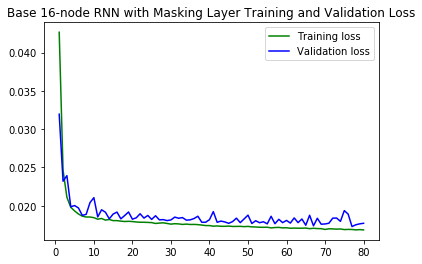

In [38]:
train_loss = []
val_loss = []
train_mape = []
val_mape = []
for h in histories:
    for a_loss in h['loss']:
        train_loss.append(a_loss)
    for a_loss in h['val_loss']:
        val_loss.append(a_loss)
    for a_mape in h['mean_absolute_percentage_error']:
        train_mape.append(a_mape)
    for a_mape in h['val_mean_absolute_percentage_error']:
        val_mape.append(a_mape)
epochs = range(1, len(train_loss) + 1)
plt.figure(figsize=(16, 6))
plt.subplot(121)
plt.plot(epochs, train_loss, 'g', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Base Masking 1x16 GRU Model\nTraining and Validation Loss')
plt.legend()
plt.subplot(122)
plt.plot(epochs, train_mape, 'g', label='Training Mape')
plt.plot(epochs, val_mape, 'b', label='Validation Mape')
plt.title('Base Masking 1x16 GRU Model\nTraining and Validation MAPE')
plt.legend()
plt.show()

In [ ]:
print('min validation loss = {}\nepoch = {}'.format(min(val_loss), val_loss.index(min(val_loss))))

In [37]:
print('Train MAE = %f\nValidation MAE = %f' % ((min(train_loss) * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min())),
                                               (min(val_loss) * (as5_train_df['PWM_30min_avg'].max() - as5_train_df['PWM_30min_avg'].min()))))

Train MAE = 1.792249
Validation MAE = 1.839111


In [ ]:
# Load best model
best_model = load_model(os.path.join('models', 'base1-mask-1x16gru.best.h5'))
best_model.summary()

In [ ]:
gen_pred = mu.DataGenerator(as5_train_data,
                            lookback=lookback, delay=delay, min_index=0, max_index=len(as5_train_data) - 1,
                            batch_size=batch_size, step=step)
as5_train_preds = best_model.predict_generator(gen_pred, workers=3, use_multiprocessing=False)
as5_train_preds.shape

In [ ]:
as5_train_preds1 = np.concatenate([as5_train_preds, np.zeros((as5_train_preds.shape[0], 1))], axis=1)
as5_train_preds1.shape

In [ ]:
as5_train_preds1 = my_pipeline.inverse_transform(as5_train_preds1)
as5_train_preds1

In [ ]:
as5_train_preds_withnan = np.full((as5_train_data.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_train_data)):
    if as5_train_data[i, 0] > -1:
        as5_train_preds_withnan[i] = as5_train_preds1[j, 0]
        j += 1
as5_train_preds_withnan.shape

In [ ]:
gen_val_pred = mu.DataGenerator(as5_val_data,
                                lookback=lookback, delay=delay, min_index=0, max_index=len(as5_val_data) - 1,
                                batch_size=batch_size, step=step)
as5_val_preds = best_model.predict_generator(gen_val_pred, workers=3, use_multiprocessing=False)
as5_val_preds.shape

In [ ]:
as5_val_preds1 = np.concatenate([as5_val_preds, np.zeros((as5_val_preds.shape[0], 1))], axis=1)
as5_val_preds1 = my_pipeline.inverse_transform(as5_val_preds1)
as5_val_preds_withnan = np.full((as5_val_data.shape[0] - delay, 1), np.NaN)
j = 0
for i in range(lookback, len(as5_val_data)):
    if as5_val_data[i, 0] > -1:
        as5_val_preds_withnan[i] = as5_val_preds1[j, 0]
        j += 1
as5_val_preds_withnan.shape

In [ ]:
plt.figure(figsize=(25, 5))
plt.plot(as5_train_df['PWM_30min_avg'])
plt.plot(as5_train_df.index[:20000], as5_train_preds_withnan.flatten(), color='brown', alpha=.5, label='train rnn')
plt.plot(as5_train_df.index[20000:], as5_val_preds_withnan.flatten(), color='tan', alpha=.5, label='val rnn')
plt.title('PWM Data vs Predictions')
plt.legend()

In [ ]:
plt.figure(figsize=(25, 10))
plt.subplot(221)
plt.plot(as5_train_df.iloc[1000:1500, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[1000:1500], as5_train_preds_withnan[1000:1500, :].flatten(), color='brown', alpha=.5, label='rnn')
plt.title('Train PWM Data vs Predictions')
plt.legend()
plt.subplot(222)
plt.plot(as5_train_df.iloc[1240:1300, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[1240:1300], as5_train_preds_withnan[1240:1300].flatten(), color='brown', alpha=.5, label='rnn')
plt.plot(as5_train_df.index[1241:1301], as5_train_df.iloc[1240:1300, as5_train_df.columns.get_loc('PWM_30min_avg')].values, color='black', alpha=.5, label='locf', linestyle=':')  ## locf is data with lag -1 
plt.title('Train PWM Data vs Predictions')
plt.legend()
plt.subplot(223)
plt.plot(as5_train_df.iloc[20000:20500, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[20000:20500], as5_val_preds_withnan[:500, :].flatten(), color='brown', alpha=.5, label='rnn')
plt.title('Validation PWM Data vs Predictions')
plt.legend()
plt.subplot(224)
plt.plot(as5_train_df.iloc[20390:20450, as5_train_df.columns.get_loc('PWM_30min_avg')], label='PWM_30min_avg')
plt.plot(as5_train_df.index[20390:20450], as5_val_preds_withnan[390:450].flatten(), color='brown', alpha=.5, label='rnn')
plt.plot(as5_train_df.index[20391:20451], as5_train_df.iloc[20390:20450, as5_train_df.columns.get_loc('PWM_30min_avg')].values, color='black', alpha=.5, label='locf', linestyle=':')  ## locf is data with lag -1
plt.title('Validation PWM Data vs Predictions')
plt.legend()

In [36]:
model.save('base1-mask-1x16gru.h5')

In [ ]:
with open('base1-mask-1x16gru-histories.pkl', 'wb') as outfile:
    pickle.dump(histories, outfile)

## Create the nested cross validation splits

In [57]:
# tscv = TimeSeriesSplit(n_splits=5)
# for train_idx, val_idx in tscv.split(as5_train_data):
#     print("%s %s" % (train_idx, val_idx))

## Nested cross validation

In [58]:
# histories = []
# i = 1
# for train_idx, val_idx in tscv.split(as5_train_data):
# 
#     print('5-fold Nested cross validation iteration', i)
#     gen_train = mu.generator(as5_train_data[train_idx],
#                                   lookback=lookback, delay=delay, min_index=0, max_index=len(train_idx)-1,
#                                   batch_size=batch_size, step=step)    
#     train_steps = ((len(train_idx) - lookback + 1 - delay) // batch_size) + 1
#     gen_val = mu.generator(as5_train_data[val_idx],
#                                   lookback=lookback, delay=delay, min_index=0, max_index=len(val_idx)-1,
#                                   batch_size=batch_size, step=step)    
#     val_steps = ((len(val_idx) - lookback + 1 - delay) // batch_size) + 1
#     history = model.fit_generator(gen_train, steps_per_epoch=train_steps, epochs=30,
#                                   validation_data=gen_val, validation_steps=val_steps, workers=0, use_multiprocessing=False)
#     histories.append(history)
#     i += 1